# Classify the type of risk for the stock price predicted by a CNN

In [30]:
import datetime
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
import math
import tensorflow as tf
import timeit
import warnings
warnings.filterwarnings('ignore')

## Load input data and build datasets to train, test and evaluate the CNN

In [131]:
samples = np.load('../data/x_samples.npy')
y = np.load('../data/y_labels.npy')
dates = np.load('../data/date_sequences.npy')

# convert to float32
samples = np.float32(samples)
y = np.float32(y)

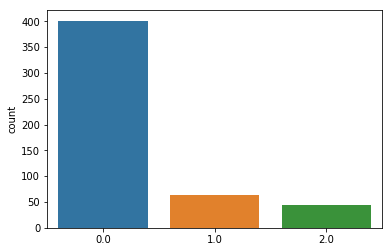

In [132]:
# Check if classes are unbalanced
_ = sns.countplot(y)

### Balance classes

In [133]:
# balancing parameters
n_samples = len(y)
classes = [0, 1, 2]
unbalanced_classes = [1, 2]
percentage_classes = pd.Series(y).value_counts(normalize=True).values.tolist()
n_values_classes = pd.Series(y).value_counts(normalize=False).values.tolist()
classes = pd.Series(y).value_counts(normalize=True).index.astype(int).tolist()
class_n_values = dict(zip(classes,n_values_classes))

# extract indices for each class in samples
index_0 = pd.Series(y)[pd.Series(y)==0].index.tolist()
index_1 = pd.Series(y)[pd.Series(y)==1].index.tolist()
index_2 = pd.Series(y)[pd.Series(y)==2].index.tolist()

# calculate number of repetitions in each class to balance data
repeat_1 = class_n_values[0] - class_n_values[1]
repeat_2 = class_n_values[0] - class_n_values[2]

# generate x and y repetitions to balance class 1
new_samples_1 = []
new_y_1 = []

counter = 0
while counter < repeat_1:
    idx = random.choice(index_1)
    new_s = samples[idx]
    new_y = y[idx]
    
    new_samples_1.append(new_s)
    new_y_1.append(new_y)
    
    counter += 1

# generate x and y repetitions to balance class 2
new_samples_2 = []
new_y_2 = []

counter = 0
while counter < repeat_2:
    idx = random.choice(index_2)
    new_s = samples[idx]
    new_y = y[idx]
    
    new_samples_2.append(new_s)
    new_y_2.append(new_y)
    
    counter += 1

In [136]:
# concatenate old and new samples
samples = np.append(arr=samples, values=np.array(new_samples_1), axis=0)
samples = np.append(arr=samples, values=np.array(new_samples_2), axis=0)

y = np.append(y, np.array(new_y_1))
y = np.append(y, np.array(new_y_2))

# randomize order of samples to correct distribution of classes in datasets
new_indices = pd.Series(y).index.tolist()
np.random.shuffle(new_indices)

random_samples = samples[[new_indices]]
random_y = y[[new_indices]]

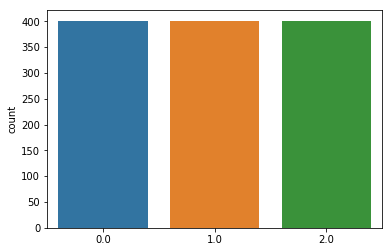

In [140]:
# Check if classes are unbalanced
_ = sns.countplot(random_y)

### Split between train, validation and test

In [141]:
def build_data_sets(samples, labels, dates, test_set_size_percentage, valid_set_size_percentage):
    
    # Calculate the amount of samples for each set
    valid_set_size = int(np.round(valid_set_size_percentage / 100 * samples.shape[0]));  
    test_set_size = int(np.round(test_set_size_percentage / 100 * samples.shape[0]));
    train_set_size = samples.shape[0] - (valid_set_size + test_set_size);
    
    x_train = samples[:train_set_size]
    y_train = labels[:train_set_size]
    train_dates = dates[:train_set_size]
    
    x_valid = samples[train_set_size:train_set_size + valid_set_size]
    y_valid = labels[train_set_size:train_set_size + valid_set_size]
    valid_dates = dates[train_set_size:train_set_size + valid_set_size]
    
    x_test = samples[train_set_size+valid_set_size:]
    y_test = labels[train_set_size+valid_set_size:]
    test_dates = dates[train_set_size+valid_set_size:]
    
    return [x_train, y_train, train_dates, x_valid, y_valid, valid_dates, x_test, y_test, test_dates]

In [142]:
# Generate the data sets
valid_set_size_percentage = 10 
test_set_size_percentage = 10

x_train, y_train, train_dates, x_valid, y_valid, valid_dates, x_test, y_test, test_dates = build_data_sets(\
                                                                                        random_samples, 
                                                                                        random_y, dates, 
                                                                                        test_set_size_percentage, 
                                                                                        valid_set_size_percentage)

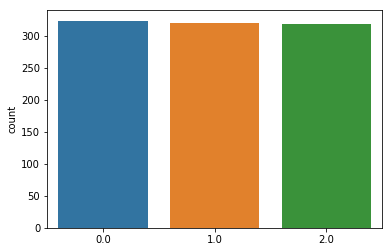

In [143]:
_ = sns.countplot(y_train)

In [144]:
print(x_train.shape,y_train.shape,x_valid.shape,y_valid.shape,x_test.shape,y_test.shape)

(963, 32, 32, 3) (963,) (120, 32, 32, 3) (120,) (120, 32, 32, 3) (120,)


### Train a CNN

In [146]:
def cnn_model_fn(features, labels, mode):
    """Model function for CNN.
       Scheleton CNN copied from Tensorflow MNIST source code
       https://github.com/tensorflow/tensorflow/blob/r1.7/tensorflow/examples/tutorials/layers/cnn_mnist.py"""
    
    # Input Layer
    # Reshape X to 4-D tensor: [batch_size, width, height, decomposed_]
    # Time series from stock market input samples are 32x32 days (moved in a window size of 1 day), 
    # and have 3 decomposed values per day (trend, seasonality and residuals)
    input_layer = tf.reshape(features, [-1, 32, 32, 3])

    # Convolutional Layer #1
    # Computes 32 features using a 5x5 filter with ReLU activation.
    # Padding is added to preserve width and height.
    # Input Tensor Shape: [batch_size, 32, 32, 3]
    # Output Tensor Shape: [batch_size, 32, 32, 32]
    conv1 = tf.layers.conv2d(
        inputs=input_layer,
        filters=32,
        kernel_size=[5, 5],
        padding="same",
        activation=tf.nn.relu)

    # Pooling Layer #1
    # First max pooling layer with a 2x2 filter and stride of 2
    # Input Tensor Shape: [batch_size, 32, 32, 32]
    # Output Tensor Shape: [batch_size, 16, 16, 32]
    pool1 = tf.layers.max_pooling2d(inputs=conv1, pool_size=[2, 2], strides=2)

    # Convolutional Layer #2
    # Computes 64 features using a 5x5 filter.
    # Padding is added to preserve width and height.
    # Input Tensor Shape: [batch_size, 16, 16, 32]
    # Output Tensor Shape: [batch_size, 16, 16, 64]
    conv2 = tf.layers.conv2d(
        inputs=pool1,
        filters=64,
        kernel_size=[5, 5],
        padding="same",
        activation=tf.nn.relu)

    # Pooling Layer #2
    # Second max pooling layer with a 2x2 filter and stride of 2
    # Input Tensor Shape: [batch_size, 16, 16, 64]
    # Output Tensor Shape: [batch_size, 8, 8, 64]
    pool2 = tf.layers.max_pooling2d(inputs=conv2, pool_size=[2, 2], strides=2)

    # Flatten tensor into a batch of vectors
    # Input Tensor Shape: [batch_size, 8, 8, 64]
    # Output Tensor Shape: [batch_size, 8 * 8 * 64]
    pool2_flat = tf.reshape(pool2, [-1, 8 * 8 * 64])

    # Dense Layer
    # Densely connected layer with 1024 neurons
    # Input Tensor Shape: [batch_size, 8 * 8 * 64]
    # Output Tensor Shape: [batch_size, 1024]
    dense = tf.layers.dense(inputs=pool2_flat, units=1024, activation=tf.nn.relu)

    # Add dropout operation; 0.6 probability that element will be kept
    dropout = tf.layers.dropout(
        inputs=dense, rate=0.4, training=mode == tf.estimator.ModeKeys.TRAIN)

    # Logits layer
    # Input Tensor Shape: [batch_size, 1024]
    # Output Tensor Shape: [batch_size, 3]
    logits = tf.layers.dense(inputs=dropout, units=3)

    predictions = {
        # Generate predictions (for PREDICT and EVAL mode)
        "classes": tf.argmax(input=logits, axis=1),
        # Add `softmax_tensor` to the graph. It is used for PREDICT and by the
        # `logging_hook`.
        "probabilities": tf.nn.softmax(logits, name="softmax_tensor")
    }
    if mode == tf.estimator.ModeKeys.PREDICT:
        return tf.estimator.EstimatorSpec(mode=mode, predictions=predictions)

    # Calculate Loss (for both TRAIN and EVAL modes)
    loss = tf.losses.sparse_softmax_cross_entropy(labels=labels, logits=logits)

    # Configure the Training Op (for TRAIN mode)
    if mode == tf.estimator.ModeKeys.TRAIN:
        optimizer = tf.train.GradientDescentOptimizer(learning_rate=0.001)
        train_op = optimizer.minimize(
            loss=loss,
            global_step=tf.train.get_global_step())
        return tf.estimator.EstimatorSpec(mode=mode, loss=loss, train_op=train_op)

    # Add evaluation metrics (for EVAL mode)
    eval_metric_ops = {
        "recall": tf.metrics.recall(
            labels=labels, predictions=predictions["classes"])}

    return tf.estimator.EstimatorSpec(mode=mode, loss=loss, eval_metric_ops=eval_metric_ops)

In [147]:
# Load training and eval data
train_data = np.asarray(x_train, dtype=np.float32)  # Returns np.array
train_labels = np.asarray(y_train, dtype=np.int32)
eval_data = np.asarray(x_valid, dtype=np.float32)  # Returns np.array
eval_labels = np.asarray(y_valid, dtype=np.int32)

# to optimize
batch_sizes = [10, 20, 50]
n_iterations = [10, 20, 50]
n_steps = [1000, 5000, 10000]

In [148]:
results = []

for batch_size in batch_sizes:
    for n_iteration in n_iterations:
        for n_step in n_steps:
            
            result = {}
            start = timeit.default_timer()
            
            # Create the Estimator
            time_series_classifier = tf.estimator.Estimator(
                model_fn=cnn_model_fn, model_dir="../data/cnn_models")

            # Set up logging for predictions
            # Log the values in the "Softmax" tensor with label "probabilities"
            tensors_to_time_series_classifierlog = {"probabilities": "softmax_tensor"}
            logging_hook = tf.train.LoggingTensorHook(
                tensors=tensors_to_time_series_classifierlog, every_n_iter=n_iteration)

            # Train the model
            train_input_fn = tf.estimator.inputs.numpy_input_fn(
                x=train_data,
                y=train_labels,
                batch_size=batch_size,
                num_epochs=None,
                shuffle=True)

            time_series_classifier.train(
                input_fn=train_input_fn,
                steps=n_step,
                hooks=[logging_hook])

            # Evaluate the model and print results
            eval_input_fn = tf.estimator.inputs.numpy_input_fn(
                x=eval_data,
                y=eval_labels,
                num_epochs=1,
                shuffle=False)
            eval_results = time_series_classifier.evaluate(input_fn=eval_input_fn)
            
            stop = timeit.default_timer()
            time = stop - start 
            
            result['eval_results'] = eval_results
            result['batch_sizes'] = batch_size
            result['n_iterations'] = n_iteration
            result['n_steps'] = n_step
            result['time (s)'] = time
            print(eval_results)
            
            results.append(result)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': './data/cnn_models', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x126dc6b38>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:probabilities = [[0.21914098 0.52440286 

INFO:tensorflow:probabilities = [[0.34302136 0.30246583 0.3545128 ]
 [0.5123222  0.31170657 0.17597117]
 [0.30651605 0.3802167  0.31326732]
 [0.33701608 0.3390833  0.32390058]
 [0.3831252  0.323808   0.29306677]
 [0.417079   0.2918838  0.29103714]
 [0.29535496 0.26398394 0.4406611 ]
 [0.4170233  0.30744812 0.27552855]
 [0.34985402 0.29590684 0.3542392 ]
 [0.49380207 0.24730615 0.25889173]] (0.802 sec)
INFO:tensorflow:probabilities = [[0.3121309  0.27962062 0.40824842]
 [0.29026943 0.32145768 0.3882729 ]
 [0.4194935  0.23991542 0.3405911 ]
 [0.44287768 0.3299219  0.2272004 ]
 [0.3763373  0.29479542 0.3288673 ]
 [0.32215127 0.25848076 0.41936797]
 [0.36922693 0.28759176 0.34318122]
 [0.26168504 0.25485826 0.4834567 ]
 [0.18806328 0.18651873 0.62541795]
 [0.26360267 0.353922   0.38247532]] (0.907 sec)
INFO:tensorflow:global_step/sec: 12.1836
INFO:tensorflow:probabilities = [[0.36040512 0.29125988 0.34833503]
 [0.3499834  0.31786063 0.332156  ]
 [0.295417   0.46176457 0.24281852]
 [0.26153

INFO:tensorflow:probabilities = [[0.2957459  0.3180254  0.38622868]
 [0.33754414 0.3357603  0.32669556]
 [0.3060528  0.3379679  0.35597932]
 [0.4192639  0.2454038  0.33533227]
 [0.32061085 0.35582584 0.32356328]
 [0.34557799 0.35067517 0.3037469 ]
 [0.30792832 0.2993849  0.3926868 ]
 [0.4392682  0.31597114 0.24476069]
 [0.3524105  0.38110906 0.26648048]
 [0.45096594 0.29562318 0.25341088]] (0.738 sec)
INFO:tensorflow:probabilities = [[0.36233556 0.318514   0.3191505 ]
 [0.3213421  0.44468278 0.23397508]
 [0.3569709  0.33662274 0.30640635]
 [0.28317082 0.4449471  0.27188212]
 [0.23599742 0.3068528  0.45714977]
 [0.24456263 0.40187505 0.3535623 ]
 [0.30121407 0.29809535 0.4006906 ]
 [0.34047157 0.35422817 0.30530033]
 [0.3601215  0.29458472 0.34529382]
 [0.29863003 0.36866352 0.33270654]] (0.762 sec)
INFO:tensorflow:global_step/sec: 12.6117
INFO:tensorflow:probabilities = [[0.28178442 0.28506333 0.43315232]
 [0.33631822 0.3273268  0.33635503]
 [0.43203723 0.2209002  0.34706256]
 [0.26067

INFO:tensorflow:probabilities = [[0.28695494 0.35308796 0.35995707]
 [0.27737424 0.2863421  0.4362836 ]
 [0.34714457 0.34532335 0.30753204]
 [0.3335529  0.3466607  0.31978643]
 [0.23781171 0.35866526 0.4035231 ]
 [0.24347995 0.3343037  0.4222163 ]
 [0.26325905 0.38024104 0.3564999 ]
 [0.30854785 0.36411536 0.32733685]
 [0.26136494 0.3233008  0.4153342 ]
 [0.2459741  0.2866201  0.46740577]] (0.820 sec)
INFO:tensorflow:probabilities = [[0.24569051 0.3539126  0.40039688]
 [0.26932502 0.3557446  0.37493035]
 [0.39932045 0.39525166 0.20542787]
 [0.31106722 0.38510782 0.30382496]
 [0.44340453 0.31056228 0.24603322]
 [0.3860242  0.4359304  0.17804538]
 [0.24263115 0.38260707 0.37476173]
 [0.22153325 0.40657502 0.37189174]
 [0.26469296 0.3815072  0.3537999 ]
 [0.47440067 0.32236892 0.20323043]] (0.835 sec)
INFO:tensorflow:global_step/sec: 12.8879
INFO:tensorflow:probabilities = [[0.25844598 0.31752342 0.42403057]
 [0.2918266  0.3694972  0.33867615]
 [0.45288175 0.37183666 0.17528155]
 [0.25536

INFO:tensorflow:probabilities = [[0.43001592 0.35311827 0.21686576]
 [0.27748787 0.32616    0.3963521 ]
 [0.2806806  0.34465563 0.37466377]
 [0.24487543 0.31219175 0.4429328 ]
 [0.4077621  0.38291022 0.20932762]
 [0.42597985 0.35032195 0.22369821]
 [0.34972742 0.3233273  0.32694533]
 [0.29402134 0.32033983 0.3856388 ]
 [0.32208708 0.35856217 0.31935075]
 [0.3869679  0.27998257 0.3330496 ]] (0.768 sec)
INFO:tensorflow:probabilities = [[0.28501156 0.33922508 0.37576333]
 [0.38087147 0.3787861  0.24034247]
 [0.27150294 0.28365633 0.44484076]
 [0.25760037 0.35338446 0.38901517]
 [0.38832626 0.39422217 0.21745148]
 [0.2051547  0.3061485  0.4886968 ]
 [0.22350986 0.33863083 0.43785933]
 [0.27785712 0.3171785  0.40496442]
 [0.26860684 0.407468   0.32392514]
 [0.28372613 0.34855348 0.36772043]] (0.790 sec)
INFO:tensorflow:global_step/sec: 12.9309
INFO:tensorflow:probabilities = [[0.3222936  0.27426097 0.40344542]
 [0.35804847 0.3028003  0.3391512 ]
 [0.44283333 0.3526137  0.2045529 ]
 [0.35906

INFO:tensorflow:probabilities = [[0.30059844 0.31644377 0.38295785]
 [0.41714734 0.34427446 0.23857819]
 [0.272801   0.35474774 0.37245122]
 [0.3306436  0.3092131  0.3601434 ]
 [0.4319322  0.33563522 0.2324326 ]
 [0.35871926 0.45054808 0.19073263]
 [0.26978222 0.32861665 0.40160108]
 [0.40586296 0.2767028  0.31743425]
 [0.25832576 0.30558828 0.43608597]
 [0.39428946 0.35472846 0.250982  ]] (0.768 sec)
INFO:tensorflow:probabilities = [[0.2509728  0.3358042  0.41322297]
 [0.4680201  0.3400664  0.19191352]
 [0.2621002  0.30189872 0.43600115]
 [0.27268323 0.30587724 0.42143956]
 [0.45992827 0.33270663 0.20736513]
 [0.4430311  0.4024778  0.1544911 ]
 [0.32713473 0.28632668 0.3865386 ]
 [0.32772806 0.24945517 0.42281675]
 [0.4111935  0.30873504 0.2800715 ]
 [0.31239688 0.3408588  0.3467443 ]] (0.763 sec)
INFO:tensorflow:Saving checkpoints for 1000 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:Loss for final step: 1.1045735.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling 

INFO:tensorflow:probabilities = [[0.30290756 0.3340556  0.36303687]
 [0.27462393 0.34094286 0.3844332 ]
 [0.47338578 0.3276669  0.1989474 ]
 [0.26242486 0.3478987  0.38967642]
 [0.47067901 0.29284602 0.2364749 ]
 [0.4829806  0.30945545 0.207564  ]
 [0.27915236 0.35078564 0.37006205]
 [0.3238599  0.31264043 0.36349964]
 [0.288196   0.32674918 0.38505483]
 [0.35319728 0.27223358 0.37456915]] (0.783 sec)
INFO:tensorflow:probabilities = [[0.30832264 0.30545524 0.38622215]
 [0.26764387 0.36275226 0.36960387]
 [0.37450826 0.29663506 0.3288567 ]
 [0.28411692 0.2852411  0.43064195]
 [0.30233294 0.31803077 0.37963632]
 [0.31413534 0.3318669  0.35399774]
 [0.51483613 0.27402398 0.21113996]
 [0.35269192 0.26309612 0.384212  ]
 [0.26354352 0.31679386 0.41966265]
 [0.24519849 0.32135236 0.43344915]] (0.786 sec)
INFO:tensorflow:probabilities = [[0.32767916 0.3136466  0.35867426]
 [0.5479378  0.3262916  0.12577061]
 [0.3246311  0.3002904  0.37507853]
 [0.39708993 0.30829376 0.2946163 ]
 [0.54830235 0

INFO:tensorflow:probabilities = [[0.2832638  0.3311321  0.38560408]
 [0.31969982 0.40533596 0.27496418]
 [0.32354975 0.37890953 0.2975408 ]
 [0.45527256 0.31595397 0.22877353]
 [0.44446906 0.40939796 0.14613292]
 [0.43335927 0.3970519  0.16958888]
 [0.32758343 0.33749837 0.33491814]
 [0.42345217 0.412905   0.16364281]
 [0.23460402 0.35904732 0.40634865]
 [0.39259985 0.4775195  0.12988073]] (0.851 sec)
INFO:tensorflow:probabilities = [[0.29591963 0.3941751  0.3099052 ]
 [0.278534   0.3067907  0.41467524]
 [0.42016885 0.36877984 0.21105133]
 [0.26018074 0.35243008 0.38738912]
 [0.26281634 0.32622486 0.41095874]
 [0.2827678  0.3458166  0.37141564]
 [0.25397292 0.31045464 0.43557236]
 [0.26489052 0.32763246 0.40747702]
 [0.29012436 0.32482222 0.38505346]
 [0.3875908  0.37209427 0.24031496]] (0.854 sec)
INFO:tensorflow:probabilities = [[0.2528943  0.3287585  0.41834712]
 [0.2636416  0.33503097 0.40132743]
 [0.29893056 0.32142368 0.37964574]
 [0.5017963  0.320351   0.17785275]
 [0.2524374  0

INFO:tensorflow:probabilities = [[0.27317727 0.30303052 0.42379218]
 [0.2918695  0.34200317 0.3661273 ]
 [0.41859525 0.39954302 0.18186174]
 [0.30142778 0.35801    0.34056228]
 [0.49177733 0.35401157 0.15421112]
 [0.4003286  0.43019712 0.16947433]
 [0.466839   0.32969028 0.20347074]
 [0.2785112  0.3203524  0.40113637]
 [0.49230272 0.35393435 0.15376286]
 [0.23963082 0.33952993 0.42083925]] (0.790 sec)
INFO:tensorflow:probabilities = [[0.37624153 0.3714417  0.2523168 ]
 [0.26031932 0.33848017 0.40120044]
 [0.26472083 0.32392848 0.41135064]
 [0.32582855 0.33927396 0.33489746]
 [0.28883544 0.32564935 0.38551524]
 [0.42886013 0.36305523 0.20808464]
 [0.25053024 0.32932344 0.42014632]
 [0.22193551 0.28406188 0.4940026 ]
 [0.23832992 0.34690097 0.41476905]
 [0.24368297 0.32701847 0.42929852]] (0.776 sec)
INFO:tensorflow:probabilities = [[0.43813038 0.37421232 0.18765736]
 [0.27513427 0.3202409  0.40462485]
 [0.4304377  0.31348792 0.25607437]
 [0.24752556 0.34929043 0.40318403]
 [0.33243972 0

INFO:tensorflow:probabilities = [[0.4349907  0.34321123 0.22179809]
 [0.2942025  0.3306803  0.37511718]
 [0.27311155 0.2714493  0.45543915]
 [0.25988686 0.28934434 0.45076883]
 [0.32836702 0.32734698 0.34428605]
 [0.4962819  0.28746295 0.21625523]
 [0.3453033  0.29746464 0.35723206]
 [0.27471557 0.27923372 0.4460507 ]
 [0.25563368 0.30652028 0.43784606]
 [0.32697883 0.26104727 0.41197392]] (0.775 sec)
INFO:tensorflow:probabilities = [[0.49548998 0.33582804 0.16868192]
 [0.30537894 0.3216779  0.3729432 ]
 [0.34130177 0.3493294  0.3093688 ]
 [0.27505985 0.3228428  0.4020973 ]
 [0.25022286 0.32499763 0.42477956]
 [0.45332667 0.32357332 0.22309998]
 [0.31557816 0.30278027 0.38164163]
 [0.44295523 0.3428235  0.21422134]
 [0.2620957  0.32643437 0.41146994]
 [0.2738195  0.32607803 0.4001025 ]] (0.769 sec)
INFO:tensorflow:probabilities = [[0.25739264 0.33007753 0.41252986]
 [0.2678833  0.34857595 0.3835408 ]
 [0.451683   0.37568462 0.17263237]
 [0.23652972 0.32722244 0.43624786]
 [0.2864747  0

INFO:tensorflow:probabilities = [[0.35945663 0.2839169  0.35662648]
 [0.5425879  0.3494986  0.10791355]
 [0.30921212 0.26840582 0.422382  ]
 [0.29823264 0.30140474 0.40036258]
 [0.4409773  0.28323612 0.27578664]
 [0.4236663  0.36558133 0.21075234]
 [0.3180077  0.31576625 0.36622596]
 [0.29692912 0.2959788  0.4070921 ]
 [0.3978883  0.29231423 0.30979756]
 [0.4424951  0.3231215  0.23438342]] (0.815 sec)
INFO:tensorflow:probabilities = [[0.3354392  0.28290662 0.3816542 ]
 [0.44424823 0.35233846 0.20341331]
 [0.24386    0.28999606 0.4661439 ]
 [0.23495887 0.3022197  0.46282148]
 [0.32872915 0.2988143  0.37245652]
 [0.23345834 0.30960017 0.45694152]
 [0.44599342 0.24567938 0.3083273 ]
 [0.4489755  0.41563934 0.13538511]
 [0.41271478 0.29129782 0.29598734]
 [0.2534207  0.30341402 0.44316527]] (0.811 sec)
INFO:tensorflow:probabilities = [[0.32293984 0.31804487 0.35901532]
 [0.4001283  0.28498018 0.31489158]
 [0.32692584 0.3356806  0.33739355]
 [0.38851407 0.39801937 0.2134665 ]
 [0.43444163 0

INFO:tensorflow:probabilities = [[0.2828137  0.31302056 0.40416571]
 [0.48359326 0.35962352 0.1567832 ]
 [0.24005994 0.36632472 0.39361534]
 [0.49009952 0.3554738  0.15442666]
 [0.2867179  0.32746145 0.38582063]
 [0.26284903 0.33772632 0.3994246 ]
 [0.31657472 0.31890664 0.36451873]
 [0.3026278  0.29641825 0.40095392]
 [0.29027948 0.3026261  0.40709442]
 [0.5015122  0.27167553 0.22681227]] (0.715 sec)
INFO:tensorflow:probabilities = [[0.2413093  0.35915735 0.39953336]
 [0.5120591  0.2893791  0.19856177]
 [0.41584688 0.2973968  0.28675625]
 [0.30657107 0.2994506  0.3939783 ]
 [0.26696596 0.29861295 0.43442106]
 [0.23353449 0.31021598 0.4562495 ]
 [0.21870115 0.35743913 0.42385975]
 [0.50578225 0.27967668 0.21454102]
 [0.27871528 0.30281076 0.41847402]
 [0.4810659  0.27768812 0.24124601]] (0.721 sec)
INFO:tensorflow:probabilities = [[0.46523413 0.2863537  0.24841213]
 [0.3050108  0.3173238  0.37766543]
 [0.24588275 0.34246516 0.41165215]
 [0.519122   0.27164498 0.20923297]
 [0.2572262  0

INFO:tensorflow:probabilities = [[0.27702102 0.35315517 0.36982384]
 [0.35250896 0.3451043  0.30238676]
 [0.25190398 0.30214176 0.4459543 ]
 [0.3920746  0.30674145 0.30118394]
 [0.5473473  0.29271933 0.15993339]
 [0.30525798 0.32203242 0.37270957]
 [0.28407994 0.33765593 0.3782641 ]
 [0.34368196 0.26555952 0.39075848]
 [0.48422185 0.3684711  0.14730705]
 [0.30515066 0.29187316 0.40297624]] (0.712 sec)
INFO:tensorflow:probabilities = [[0.26736313 0.33517703 0.39745986]
 [0.2958935  0.318485   0.3856215 ]
 [0.3256488  0.33236945 0.3419818 ]
 [0.4392646  0.406596   0.15413941]
 [0.3151336  0.31960118 0.36526522]
 [0.32742822 0.3175743  0.35499752]
 [0.47733626 0.3679701  0.15469363]
 [0.3913557  0.28211617 0.32652816]
 [0.43276653 0.3745294  0.19270404]
 [0.35818422 0.3389061  0.30290964]] (0.654 sec)
INFO:tensorflow:probabilities = [[0.26089305 0.334986   0.404121  ]
 [0.2968212  0.31282055 0.39035824]
 [0.32230532 0.3282574  0.3494372 ]
 [0.32748058 0.2813552  0.39116418]
 [0.34347755 0

INFO:tensorflow:probabilities = [[0.25759175 0.24930353 0.49310467]
 [0.26555753 0.3020991  0.43234333]
 [0.29776666 0.2768345  0.4253989 ]
 [0.29653075 0.294957   0.4085122 ]
 [0.4777598  0.33666784 0.18557239]
 [0.30534068 0.28560334 0.40905592]
 [0.26966068 0.30589783 0.42444143]
 [0.29890376 0.29147625 0.40961996]
 [0.2350563  0.2980826  0.4668611 ]
 [0.27753627 0.30132616 0.4211376 ]] (0.691 sec)
INFO:tensorflow:probabilities = [[0.46765018 0.40572992 0.12661989]
 [0.29389718 0.3125533  0.39354953]
 [0.525411   0.32543007 0.14915888]
 [0.42690453 0.35112876 0.22196676]
 [0.22068512 0.32028243 0.4590325 ]
 [0.27159262 0.31952038 0.408887  ]
 [0.28631416 0.34656242 0.3671234 ]
 [0.27615058 0.3439747  0.37987465]
 [0.287095   0.30048454 0.41242045]
 [0.48293304 0.3409252  0.17614171]] (0.780 sec)
INFO:tensorflow:probabilities = [[0.4652509  0.38654447 0.14820464]
 [0.37987706 0.44812223 0.17200068]
 [0.34303102 0.3677167  0.28925222]
 [0.37944385 0.4671726  0.15338355]
 [0.29473004 0

INFO:tensorflow:probabilities = [[0.31332862 0.34122306 0.34544823]
 [0.28892085 0.32642356 0.3846556 ]
 [0.39066407 0.4139315  0.19540444]
 [0.5242477  0.35369313 0.12205914]
 [0.3820161  0.43069896 0.18728495]
 [0.23043013 0.35505924 0.4145106 ]
 [0.46611956 0.40022632 0.13365418]
 [0.40163645 0.36322457 0.235139  ]
 [0.35740668 0.31191716 0.33067614]
 [0.2930468  0.31987152 0.3870817 ]] (0.709 sec)
INFO:tensorflow:probabilities = [[0.5230505  0.32786733 0.14908217]
 [0.23560359 0.30662835 0.45776805]
 [0.22168256 0.37716952 0.40114793]
 [0.21923506 0.37380004 0.4069649 ]
 [0.4224537  0.4264247  0.15112168]
 [0.22988875 0.35298944 0.4171219 ]
 [0.21618538 0.2841213  0.49969333]
 [0.20452796 0.337841   0.45763102]
 [0.24963157 0.3395529  0.4108155 ]
 [0.21209434 0.3327062  0.45519942]] (0.694 sec)
INFO:tensorflow:probabilities = [[0.5004537  0.3114972  0.18804902]
 [0.24691479 0.31939828 0.4336869 ]
 [0.2924201  0.31721842 0.39036152]
 [0.49024102 0.2992385  0.21052046]
 [0.25018418 0

INFO:tensorflow:probabilities = [[0.25425985 0.30858764 0.43715256]
 [0.39855906 0.30443597 0.29700494]
 [0.5151185  0.31070638 0.17417517]
 [0.26120803 0.30204767 0.4367443 ]
 [0.39841497 0.31960693 0.28197816]
 [0.463761   0.3847143  0.15152477]
 [0.50478923 0.35610068 0.13911004]
 [0.29824924 0.286391   0.41535974]
 [0.4291145  0.28823715 0.2826484 ]
 [0.5294382  0.3116214  0.15894037]] (0.704 sec)
INFO:tensorflow:probabilities = [[0.43452695 0.42540577 0.14006731]
 [0.45906627 0.33723143 0.20370232]
 [0.3088392  0.3239233  0.3672375 ]
 [0.25535437 0.3225798  0.42206576]
 [0.5055888  0.34166867 0.15274248]
 [0.28466868 0.2861727  0.42915866]
 [0.3253903  0.30935505 0.36525464]
 [0.43736297 0.2955697  0.26706728]
 [0.58968186 0.2510174  0.15930079]
 [0.28723785 0.30862904 0.4041331 ]] (0.708 sec)
INFO:tensorflow:probabilities = [[0.26786673 0.28951597 0.44261727]
 [0.2892473  0.27574056 0.4350121 ]
 [0.43658796 0.36074185 0.20267016]
 [0.49689874 0.31944093 0.18366034]
 [0.27546924 0

INFO:tensorflow:probabilities = [[0.33119833 0.3127896  0.35601205]
 [0.25044733 0.33162308 0.41792953]
 [0.27994835 0.31156194 0.4084897 ]
 [0.26870078 0.34092584 0.39037338]
 [0.42657077 0.3590128  0.2144164 ]
 [0.27159083 0.30659243 0.42181674]
 [0.32390854 0.28114015 0.39495128]
 [0.3795349  0.29888555 0.32157955]
 [0.2669415  0.30124843 0.43181014]
 [0.4445021  0.37788948 0.17760848]] (0.703 sec)
INFO:tensorflow:probabilities = [[0.28376412 0.37797433 0.33826154]
 [0.43682978 0.38422722 0.178943  ]
 [0.4645263  0.34650567 0.18896803]
 [0.24997143 0.3083762  0.4416523 ]
 [0.29530463 0.31694695 0.38774848]
 [0.4063084  0.30650613 0.2871854 ]
 [0.2622043  0.33929315 0.39850265]
 [0.46560052 0.32789516 0.20650437]
 [0.45232263 0.3808688  0.16680853]
 [0.26175207 0.33688664 0.4013613 ]] (0.697 sec)
INFO:tensorflow:probabilities = [[0.25223893 0.30033386 0.44742727]
 [0.27989033 0.29907852 0.42103112]
 [0.28230563 0.31009716 0.4075972 ]
 [0.23379627 0.31763604 0.44856766]
 [0.4017766  0

INFO:tensorflow:probabilities = [[0.30247074 0.32263353 0.37489575]
 [0.39258027 0.3375996  0.26982012]
 [0.37200695 0.3149282  0.31306478]
 [0.33325115 0.30035383 0.36639503]
 [0.36750257 0.3284917  0.30400568]
 [0.48998374 0.35607806 0.15393816]
 [0.42589012 0.42642027 0.14768958]
 [0.34621516 0.28748098 0.36630392]
 [0.41950783 0.30672824 0.27376398]
 [0.4164652  0.44314796 0.1403869 ]] (0.709 sec)
INFO:tensorflow:probabilities = [[0.48580468 0.30411983 0.21007544]
 [0.44278252 0.35929567 0.19792183]
 [0.2942312  0.30228257 0.40348625]
 [0.37545547 0.30368242 0.3208621 ]
 [0.31135234 0.32054663 0.368101  ]
 [0.4500074  0.29855165 0.25144094]
 [0.3368896  0.3102265  0.35288396]
 [0.2982536  0.31183997 0.38990644]
 [0.39962772 0.30781865 0.2925536 ]
 [0.39533645 0.2869806  0.3176829 ]] (0.698 sec)
INFO:tensorflow:probabilities = [[0.28338358 0.31522095 0.4013955 ]
 [0.39253712 0.2904493  0.31701356]
 [0.26566723 0.29097852 0.44335428]
 [0.2758064  0.31128335 0.41291022]
 [0.43861407 0

INFO:tensorflow:probabilities = [[0.38770425 0.34565985 0.26663584]
 [0.315253   0.32412255 0.3606245 ]
 [0.42708606 0.3718756  0.20103838]
 [0.41009632 0.37148082 0.21842285]
 [0.47757295 0.3495253  0.17290181]
 [0.29597536 0.37392682 0.3300978 ]
 [0.26820195 0.3563787  0.37541935]
 [0.288694   0.34754393 0.36376214]
 [0.46790087 0.3946331  0.13746609]
 [0.26319477 0.34201264 0.39479262]] (0.732 sec)
INFO:tensorflow:probabilities = [[0.24043047 0.31057402 0.4489955 ]
 [0.28725544 0.3152673  0.39747727]
 [0.34525493 0.3070484  0.34769675]
 [0.5107314  0.31002575 0.17924286]
 [0.26564634 0.33707365 0.39728004]
 [0.23816068 0.32201815 0.43982112]
 [0.47695744 0.33676448 0.18627805]
 [0.28305566 0.31391555 0.40302882]
 [0.2430299  0.34876585 0.4082042 ]
 [0.24105325 0.26340473 0.495542  ]] (0.710 sec)
INFO:tensorflow:probabilities = [[0.48753268 0.32508135 0.187386  ]
 [0.23540686 0.33187202 0.43272114]
 [0.21321294 0.31586263 0.47092444]
 [0.2553908  0.3322748  0.41233438]
 [0.296888   0

INFO:tensorflow:probabilities = [[0.27929983 0.32246265 0.39823756]
 [0.28059727 0.30750597 0.4118968 ]
 [0.47896668 0.33299524 0.1880381 ]
 [0.41538823 0.33851883 0.24609295]
 [0.24847327 0.31520623 0.43632048]
 [0.2525035  0.28366843 0.46382806]
 [0.44349    0.39001358 0.16649647]
 [0.24011749 0.31428608 0.4455964 ]
 [0.2551611  0.29047585 0.45436305]
 [0.35995573 0.32314867 0.31689557]] (0.706 sec)
INFO:tensorflow:probabilities = [[0.3102806  0.31306672 0.3766527 ]
 [0.24662153 0.34085163 0.41252676]
 [0.28635535 0.3174669  0.39617774]
 [0.45888877 0.3185494  0.22256179]
 [0.5318627  0.28746146 0.1806759 ]
 [0.27334902 0.34314123 0.38350976]
 [0.25774992 0.29910117 0.44314888]
 [0.41780132 0.39606512 0.18613362]
 [0.28906527 0.3338198  0.37711492]
 [0.4375404  0.3529381  0.20952149]] (0.718 sec)
INFO:tensorflow:probabilities = [[0.2901855  0.29762197 0.4121925 ]
 [0.27680862 0.29989612 0.42329526]
 [0.26206908 0.3014048  0.43652612]
 [0.33705097 0.30784404 0.355105  ]
 [0.26402614 0

INFO:tensorflow:probabilities = [[0.28453088 0.28842825 0.4270409 ]
 [0.37234843 0.2990037  0.32864788]
 [0.459316   0.34739566 0.1932884 ]
 [0.31128934 0.29727244 0.3914382 ]
 [0.29981396 0.2503655  0.44982055]
 [0.24451317 0.27927256 0.47621423]
 [0.51068413 0.27549013 0.21382575]
 [0.5042388  0.27603963 0.21972156]
 [0.31795532 0.25070986 0.43133482]
 [0.27097607 0.25061122 0.47841272]] (0.714 sec)
INFO:tensorflow:probabilities = [[0.26614052 0.30798462 0.42587486]
 [0.34182307 0.28843    0.36974698]
 [0.2609317  0.28745937 0.4516089 ]
 [0.44373932 0.31278715 0.24347346]
 [0.48601702 0.37476832 0.13921465]
 [0.47406867 0.3555963  0.17033513]
 [0.317166   0.2986165  0.38421756]
 [0.51179373 0.3353535  0.15285276]
 [0.48013613 0.34142262 0.17844121]
 [0.2796648  0.3069412  0.41339403]] (0.723 sec)
INFO:tensorflow:probabilities = [[0.2714588  0.32200548 0.40653574]
 [0.2791688  0.33178407 0.38904706]
 [0.272202   0.3221234  0.40567458]
 [0.54137564 0.32679215 0.13183224]
 [0.5524161  0

INFO:tensorflow:probabilities = [[0.41064546 0.40030095 0.18905357]
 [0.26818407 0.3441697  0.3876463 ]
 [0.2605435  0.3336931  0.40576345]
 [0.3783905  0.41936916 0.20224027]
 [0.32632768 0.32537842 0.34829384]
 [0.43835592 0.35773784 0.20390625]
 [0.25413236 0.355129   0.39073867]
 [0.38700327 0.33396125 0.27903542]
 [0.27168125 0.35273752 0.3755813 ]
 [0.4598306  0.36424792 0.17592146]] (0.709 sec)
INFO:tensorflow:probabilities = [[0.33103538 0.298238   0.37072664]
 [0.26136366 0.29711694 0.44151935]
 [0.25589022 0.3188047  0.42530507]
 [0.23725158 0.27021417 0.4925343 ]
 [0.2841239  0.26478115 0.45109493]
 [0.31548798 0.28157824 0.40293378]
 [0.26753274 0.2912956  0.44117165]
 [0.23990856 0.29333833 0.4667531 ]
 [0.42879117 0.23706436 0.33414453]
 [0.23910323 0.3076064  0.4532903 ]] (0.694 sec)
INFO:tensorflow:probabilities = [[0.26570323 0.32740942 0.40688735]
 [0.45847785 0.30216074 0.2393614 ]
 [0.32885534 0.294996   0.37614864]
 [0.25189963 0.28570113 0.46239927]
 [0.3564216  0

INFO:tensorflow:probabilities = [[0.4882913  0.36651692 0.14519183]
 [0.25255242 0.33553952 0.41190806]
 [0.4600698  0.35634392 0.18358633]
 [0.2668919  0.33974537 0.39336273]
 [0.39446968 0.46112683 0.14440349]
 [0.40290686 0.38856924 0.2085239 ]
 [0.4887237  0.39220083 0.11907551]
 [0.28299192 0.28047124 0.43653685]
 [0.27224743 0.31961495 0.40813756]
 [0.24348648 0.3029128  0.4536008 ]] (0.709 sec)
INFO:tensorflow:probabilities = [[0.48008195 0.38956672 0.13035132]
 [0.4232293  0.39857426 0.17819646]
 [0.27333602 0.32966307 0.3970009 ]
 [0.32667398 0.34975997 0.32356602]
 [0.24087913 0.35756236 0.40155852]
 [0.2683803  0.33596054 0.39565915]
 [0.34573466 0.33523092 0.31903452]
 [0.52244675 0.32004747 0.15750575]
 [0.47362146 0.41079143 0.11558707]
 [0.27862433 0.35235596 0.36901972]] (0.700 sec)
INFO:tensorflow:probabilities = [[0.3984549  0.44542122 0.1561239 ]
 [0.4109492  0.39945546 0.18959533]
 [0.26691374 0.36937222 0.36371404]
 [0.2772751  0.3356967  0.38702825]
 [0.34763625 0

INFO:tensorflow:probabilities = [[0.23141453 0.30736855 0.461217  ]
 [0.2601669  0.32413653 0.41569662]
 [0.2109789  0.33403954 0.45498157]
 [0.2522075  0.29357886 0.45421368]
 [0.24365193 0.31309003 0.44325805]
 [0.2372503  0.29879367 0.4639561 ]
 [0.3693501  0.29943085 0.33121905]
 [0.2738841  0.31610507 0.4100108 ]
 [0.2805915  0.3200874  0.3993211 ]
 [0.20999697 0.3549472  0.43505582]] (0.703 sec)
INFO:tensorflow:probabilities = [[0.29195675 0.29283604 0.41520715]
 [0.4956257  0.3306127  0.17376164]
 [0.22722594 0.31821308 0.45456102]
 [0.43635905 0.3720048  0.19163617]
 [0.528176   0.27370244 0.19812152]
 [0.2848949  0.32062873 0.39447638]
 [0.40789098 0.27813047 0.3139786 ]
 [0.33700985 0.29407176 0.3689184 ]
 [0.28613606 0.32205015 0.39181384]
 [0.4667024  0.28862715 0.24467047]] (0.710 sec)
INFO:tensorflow:probabilities = [[0.25579938 0.38621715 0.35798347]
 [0.49371865 0.32006264 0.18621865]
 [0.29421178 0.37310913 0.3326791 ]
 [0.5013642  0.38624838 0.11238748]
 [0.4442178  0

INFO:tensorflow:probabilities = [[0.51214415 0.35087743 0.13697834]
 [0.25015512 0.30810696 0.4417379 ]
 [0.2893504  0.31324306 0.39740658]
 [0.29374346 0.31841445 0.38784206]
 [0.2638084  0.30748218 0.4287094 ]
 [0.23687458 0.30673102 0.45639443]
 [0.5029363  0.35113284 0.14593089]
 [0.29162732 0.3658708  0.34250197]
 [0.27549613 0.31806573 0.4064381 ]
 [0.27370343 0.32801193 0.39828467]] (0.707 sec)
INFO:tensorflow:probabilities = [[0.4835242  0.29869354 0.21778226]
 [0.3046472  0.3191833  0.37616947]
 [0.35206944 0.34220865 0.3057219 ]
 [0.28958702 0.3206872  0.38972574]
 [0.2581823  0.3261827  0.415635  ]
 [0.291568   0.35522577 0.35320628]
 [0.54489094 0.33863905 0.11646999]
 [0.4490053  0.3030631  0.24793158]
 [0.47044224 0.36807647 0.16148132]
 [0.30423278 0.3255303  0.3702369 ]] (0.694 sec)
INFO:tensorflow:probabilities = [[0.2565715  0.32270527 0.42072323]
 [0.5232239  0.343594   0.13318205]
 [0.29573685 0.35068944 0.35357368]
 [0.35098264 0.34412146 0.30489585]
 [0.31222093 0

INFO:tensorflow:probabilities = [[0.5564583  0.33287847 0.11066321]
 [0.31376752 0.2911733  0.3950592 ]
 [0.39215967 0.3076718  0.3001686 ]
 [0.51881063 0.3568046  0.12438474]
 [0.5210724  0.3140241  0.16490357]
 [0.4390112  0.2987569  0.26223198]
 [0.45713958 0.2903222  0.2525382 ]
 [0.33373556 0.29427078 0.3719937 ]
 [0.43555802 0.31325504 0.2511869 ]
 [0.5174138  0.33673936 0.14584692]] (0.702 sec)
INFO:tensorflow:probabilities = [[0.30919474 0.28469267 0.40611264]
 [0.27591848 0.30043417 0.4236473 ]
 [0.4868386  0.34113753 0.17202386]
 [0.2733956  0.324581   0.40202335]
 [0.47024435 0.31957626 0.21017942]
 [0.42388886 0.340387   0.23572412]
 [0.5377002  0.31951904 0.14278077]
 [0.49961507 0.33046737 0.1699176 ]
 [0.5071387  0.31327942 0.17958182]
 [0.50927234 0.37345883 0.11726883]] (0.721 sec)
INFO:tensorflow:probabilities = [[0.2924218  0.26931727 0.43826094]
 [0.38529482 0.28589395 0.32881126]
 [0.3215823  0.2832858  0.3951319 ]
 [0.28809595 0.30646664 0.4054374 ]
 [0.2797517  0

INFO:tensorflow:probabilities = [[0.3833256  0.2997899  0.3168845 ]
 [0.30557767 0.3336207  0.36080164]
 [0.25860608 0.31658006 0.42481387]
 [0.2593585  0.3261011  0.41454044]
 [0.31429073 0.3097558  0.3759535 ]
 [0.41889518 0.32687086 0.254234  ]
 [0.2456289  0.31281123 0.44155994]
 [0.31763616 0.3292439  0.3531199 ]
 [0.2532157  0.33893865 0.40784562]
 [0.4211696  0.39520696 0.18362333]] (0.697 sec)
INFO:tensorflow:probabilities = [[0.21625821 0.31041166 0.47333017]
 [0.22028802 0.28691792 0.49279404]
 [0.26209933 0.2800636  0.45783713]
 [0.34781623 0.27355564 0.37862822]
 [0.41280857 0.2569774  0.33021396]
 [0.24218947 0.30483222 0.45297828]
 [0.21820779 0.3145532  0.467239  ]
 [0.25566083 0.2949123  0.44942686]
 [0.26445293 0.27205458 0.4634924 ]
 [0.41758275 0.27471754 0.30769968]] (0.726 sec)
INFO:tensorflow:probabilities = [[0.37788728 0.33586952 0.28624317]
 [0.2502906  0.37211692 0.37759247]
 [0.22591679 0.32028103 0.45380214]
 [0.4374403  0.38254827 0.18001151]
 [0.4254938  0

INFO:tensorflow:probabilities = [[0.4662267  0.29765084 0.2361225 ]
 [0.22685723 0.3144604  0.45868233]
 [0.24790215 0.3439282  0.40816966]
 [0.43927142 0.38930747 0.17142116]
 [0.27172655 0.35189736 0.37637612]
 [0.4571935  0.3499618  0.19284476]
 [0.4291405  0.29918393 0.27167556]
 [0.27815214 0.3266142  0.3952337 ]
 [0.38959947 0.47894174 0.13145882]
 [0.44278672 0.3923652  0.1648481 ]] (0.705 sec)
INFO:tensorflow:probabilities = [[0.24190862 0.33578163 0.4223098 ]
 [0.27491257 0.28570193 0.43938553]
 [0.29219612 0.3379231  0.36988074]
 [0.28537098 0.30792993 0.406699  ]
 [0.25226614 0.30827197 0.43946186]
 [0.29403806 0.35623592 0.349726  ]
 [0.24517016 0.31106964 0.4437602 ]
 [0.2610213  0.3096114  0.42936733]
 [0.29226378 0.31835422 0.38938195]
 [0.23050123 0.32472473 0.44477406]] (0.698 sec)
INFO:tensorflow:probabilities = [[0.28420156 0.3818316  0.33396676]
 [0.43770257 0.37846136 0.18383612]
 [0.29030764 0.38616753 0.3235249 ]
 [0.4358712  0.36704788 0.19708094]
 [0.25384328 0

INFO:tensorflow:probabilities = [[0.29882184 0.3423743  0.35880384]
 [0.33016318 0.36879247 0.30104443]
 [0.28301018 0.37170422 0.3452856 ]
 [0.285042   0.33003554 0.38492247]
 [0.2613174  0.39678416 0.3418985 ]
 [0.22667351 0.34854078 0.4247857 ]
 [0.22587651 0.3734148  0.40070868]
 [0.31076816 0.3293131  0.3599187 ]
 [0.324843   0.36198205 0.31317493]
 [0.24396439 0.32841074 0.42762488]] (0.691 sec)
INFO:tensorflow:probabilities = [[0.31126747 0.32417363 0.36455882]
 [0.5007195  0.3107793  0.1885011 ]
 [0.30826473 0.32143408 0.37030122]
 [0.27281693 0.33346787 0.3937152 ]
 [0.42167702 0.29120648 0.28711647]
 [0.35699257 0.30993107 0.33307633]
 [0.3595391  0.34481758 0.29564333]
 [0.2835693  0.32185805 0.39457265]
 [0.41478187 0.41223353 0.17298461]
 [0.28795603 0.34297806 0.3690659 ]] (0.718 sec)
INFO:tensorflow:probabilities = [[0.4037124  0.47177157 0.12451607]
 [0.39789435 0.33642867 0.26567698]
 [0.25210446 0.35949492 0.3884006 ]
 [0.26150677 0.31727225 0.42122096]
 [0.3753287  0

INFO:tensorflow:probabilities = [[0.3831008  0.27152893 0.34537032]
 [0.46615005 0.36833915 0.16551077]
 [0.45343676 0.37354162 0.17302164]
 [0.22865915 0.34289634 0.42844453]
 [0.47750726 0.3842722  0.13822053]
 [0.33215705 0.2875994  0.38024357]
 [0.23279509 0.33005038 0.43715453]
 [0.23952113 0.3148303  0.44564852]
 [0.3719859  0.31242627 0.31558788]
 [0.28196833 0.32825708 0.38977456]] (0.707 sec)
INFO:tensorflow:probabilities = [[0.24760796 0.29084778 0.46154428]
 [0.26356718 0.27634913 0.46008366]
 [0.46042153 0.42073387 0.11884458]
 [0.28050545 0.24487896 0.47461557]
 [0.43178535 0.38119072 0.18702395]
 [0.41293022 0.32405722 0.26301256]
 [0.4663594  0.37031722 0.16332343]
 [0.4536002  0.41159046 0.1348094 ]
 [0.49747697 0.28643474 0.21608825]
 [0.3617288  0.2871249  0.35114625]] (0.710 sec)
INFO:tensorflow:probabilities = [[0.4865011  0.37612098 0.13737795]
 [0.48459876 0.3989562  0.11644505]
 [0.42743537 0.39555535 0.17700934]
 [0.32589436 0.3024916  0.37161407]
 [0.45881513 0

INFO:tensorflow:probabilities = [[0.33306408 0.24817006 0.41876587]
 [0.3642563  0.26954964 0.36619407]
 [0.5907874  0.2732969  0.13591564]
 [0.54038393 0.21721514 0.24240099]
 [0.5775837  0.25215426 0.17026207]
 [0.2843011  0.3113217  0.40437713]
 [0.28843936 0.30744064 0.40412   ]
 [0.5453502  0.25387013 0.20077968]
 [0.28828546 0.29645452 0.41526002]
 [0.29862863 0.30742487 0.39394647]] (0.698 sec)
INFO:tensorflow:probabilities = [[0.4772468  0.3419279  0.18082532]
 [0.28807145 0.3275933  0.38433522]
 [0.530619   0.30865303 0.16072787]
 [0.29396346 0.32338738 0.38264912]
 [0.24978995 0.3489336  0.4012764 ]
 [0.22468089 0.329892   0.4454271 ]
 [0.2749188  0.37030023 0.354781  ]
 [0.31290215 0.32768208 0.3594158 ]
 [0.2574042  0.36740655 0.37518924]
 [0.36522597 0.31013644 0.3246376 ]] (0.695 sec)
INFO:tensorflow:probabilities = [[0.32354033 0.29138178 0.38507786]
 [0.24626362 0.32356727 0.4301691 ]
 [0.3116651  0.30494884 0.38338605]
 [0.28924456 0.29044014 0.4203153 ]
 [0.486262   0

INFO:tensorflow:global_step/sec: 13.8073
INFO:tensorflow:probabilities = [[0.23895478 0.27780044 0.48324475]
 [0.25534722 0.2845857  0.46006706]
 [0.38483158 0.26605153 0.3491169 ]
 [0.46680027 0.35435975 0.17883997]
 [0.23014578 0.28335124 0.48650295]
 [0.22037137 0.30880904 0.4708196 ]
 [0.22087075 0.26899773 0.5101315 ]
 [0.4482976  0.31378397 0.23791847]
 [0.41573012 0.28985137 0.2944185 ]
 [0.22539245 0.30786988 0.46673766]] (0.718 sec)
INFO:tensorflow:loss = 1.1349972, step = 6101 (7.245 sec)
INFO:tensorflow:probabilities = [[0.22584806 0.30644336 0.4677086 ]
 [0.25558564 0.3491425  0.3952718 ]
 [0.448922   0.38598046 0.16509752]
 [0.2430748  0.26911452 0.48781067]
 [0.24043217 0.2935627  0.4660051 ]
 [0.2618216  0.29511407 0.44306433]
 [0.27955306 0.27874938 0.44169763]
 [0.2365109  0.28281203 0.48067707]
 [0.31283942 0.2992134  0.38794708]
 [0.2646573  0.32448292 0.41085982]] (0.717 sec)
INFO:tensorflow:probabilities = [[0.27962375 0.33742994 0.38294634]
 [0.26956734 0.3067463 

INFO:tensorflow:global_step/sec: 13.9263
INFO:tensorflow:probabilities = [[0.3836223  0.45236897 0.16400872]
 [0.37117228 0.45606983 0.17275788]
 [0.24446806 0.3537578  0.40177417]
 [0.24737974 0.34172732 0.41089293]
 [0.23843558 0.36611676 0.39544767]
 [0.29284123 0.34560034 0.36155838]
 [0.24829556 0.3272587  0.42444575]
 [0.23123349 0.37732142 0.3914451 ]
 [0.31126472 0.35292011 0.3358152 ]
 [0.35443616 0.31939715 0.32616666]] (0.761 sec)
INFO:tensorflow:loss = 0.949063, step = 6301 (7.180 sec)
INFO:tensorflow:probabilities = [[0.29068378 0.3627001  0.34661615]
 [0.2698658  0.36999384 0.36014044]
 [0.40014228 0.47934416 0.12051354]
 [0.33745757 0.32758525 0.3349572 ]
 [0.24168757 0.31910038 0.43921202]
 [0.458607   0.39112842 0.15026453]
 [0.22835939 0.30720875 0.4644318 ]
 [0.47132567 0.34676394 0.18191046]
 [0.441082   0.3810484  0.17786953]
 [0.26950565 0.332231   0.39826337]] (0.778 sec)
INFO:tensorflow:probabilities = [[0.4558035  0.30157524 0.24262121]
 [0.47812793 0.30121505 

INFO:tensorflow:global_step/sec: 14.0534
INFO:tensorflow:probabilities = [[0.24668883 0.3233061  0.43000504]
 [0.22111504 0.31704932 0.46183565]
 [0.23733969 0.31171167 0.45094866]
 [0.5274544  0.28945285 0.18309274]
 [0.26875037 0.35216764 0.37908205]
 [0.48798895 0.3324723  0.1795387 ]
 [0.25966635 0.29503313 0.44530058]
 [0.37402704 0.28507054 0.34090245]
 [0.29313532 0.31258473 0.39427993]
 [0.24979468 0.2974443  0.45276093]] (0.703 sec)
INFO:tensorflow:loss = 1.0239506, step = 6501 (7.118 sec)
INFO:tensorflow:probabilities = [[0.30414292 0.29682148 0.39903566]
 [0.46056467 0.3463222  0.19311306]
 [0.4469217  0.3524941  0.20058419]
 [0.4320668  0.3934716  0.1744616 ]
 [0.31610477 0.30734557 0.37654966]
 [0.24658561 0.33159477 0.42181966]
 [0.22473812 0.32712564 0.44813627]
 [0.256319   0.31563273 0.42804834]
 [0.4007701  0.29598725 0.30324262]
 [0.47831237 0.2894661  0.23222156]] (0.733 sec)
INFO:tensorflow:probabilities = [[0.2594095  0.34971905 0.3908715 ]
 [0.26218024 0.3286019 

INFO:tensorflow:global_step/sec: 14.0965
INFO:tensorflow:probabilities = [[0.26998457 0.3449165  0.3850989 ]
 [0.26027668 0.3524278  0.38729548]
 [0.23032612 0.36620474 0.40346912]
 [0.29498795 0.33250067 0.37251136]
 [0.44325566 0.36052677 0.1962176 ]
 [0.2825244  0.35614556 0.36133003]
 [0.42986202 0.3178629  0.25227502]
 [0.28042838 0.3584005  0.36117116]
 [0.43815944 0.3164087  0.24543181]
 [0.4146271  0.4076624  0.17771055]] (0.701 sec)
INFO:tensorflow:loss = 0.99778473, step = 6701 (7.094 sec)
INFO:tensorflow:probabilities = [[0.25063705 0.3482742  0.40108877]
 [0.27935964 0.33248907 0.38815123]
 [0.47254273 0.30463815 0.22281905]
 [0.30878997 0.293584   0.39762607]
 [0.28173956 0.32862723 0.3896332 ]
 [0.22994688 0.31351644 0.45653665]
 [0.25628415 0.347305   0.39641082]
 [0.28343967 0.3014388  0.41512161]
 [0.23038946 0.33249694 0.43711355]
 [0.23880613 0.30001748 0.46117643]] (0.722 sec)
INFO:tensorflow:probabilities = [[0.28221333 0.31865323 0.3991335 ]
 [0.27609468 0.3282385

INFO:tensorflow:global_step/sec: 14.1042
INFO:tensorflow:probabilities = [[0.37241524 0.49696836 0.13061647]
 [0.27910596 0.33056206 0.39033192]
 [0.41926503 0.30736512 0.27336982]
 [0.2988908  0.3199658  0.38114348]
 [0.44665918 0.39945614 0.15388468]
 [0.28076845 0.34044367 0.37878782]
 [0.27384228 0.2980279  0.42812988]
 [0.23768632 0.3261566  0.43615708]
 [0.22960961 0.35412976 0.41626063]
 [0.27333355 0.3655326  0.36113378]] (0.718 sec)
INFO:tensorflow:loss = 1.0703337, step = 6901 (7.091 sec)
INFO:tensorflow:probabilities = [[0.42604566 0.3345191  0.23943526]
 [0.21619572 0.32316926 0.46063504]
 [0.2286197  0.33803076 0.43334955]
 [0.41352808 0.42303142 0.16344047]
 [0.23331375 0.34506613 0.42162007]
 [0.2356152  0.33436885 0.43001598]
 [0.27090344 0.29788277 0.43121374]
 [0.39138016 0.45493403 0.15368578]
 [0.35308024 0.30397716 0.34294263]
 [0.23092872 0.34961882 0.41945237]] (0.716 sec)
INFO:tensorflow:probabilities = [[0.45883185 0.31557068 0.22559747]
 [0.22470392 0.29042488

INFO:tensorflow:global_step/sec: 13.9981
INFO:tensorflow:probabilities = [[0.2561293  0.362626   0.38124478]
 [0.22299796 0.38484064 0.39216146]
 [0.28430596 0.563231   0.15246302]
 [0.3601131  0.45721546 0.18267147]
 [0.37413102 0.46743503 0.15843397]
 [0.24081159 0.37401333 0.38517505]
 [0.43765953 0.32253984 0.23980066]
 [0.42656794 0.32485667 0.24857536]
 [0.22637992 0.37094143 0.40267873]
 [0.23621222 0.36618322 0.39760453]] (0.741 sec)
INFO:tensorflow:loss = 1.1718167, step = 7101 (7.144 sec)
INFO:tensorflow:probabilities = [[0.29066426 0.2972978  0.4120379 ]
 [0.27293432 0.34156826 0.38549745]
 [0.4504347  0.41551748 0.13404779]
 [0.28129643 0.34658095 0.37212262]
 [0.46943897 0.41007987 0.1204811 ]
 [0.50394195 0.28797972 0.20807835]
 [0.24551108 0.32438713 0.43010175]
 [0.43206266 0.32320213 0.24473517]
 [0.25334975 0.34387186 0.4027784 ]
 [0.26366276 0.3458189  0.3905183 ]] (0.728 sec)
INFO:tensorflow:probabilities = [[0.5141946  0.32019687 0.16560854]
 [0.23405291 0.36346158

INFO:tensorflow:global_step/sec: 14.0335
INFO:tensorflow:probabilities = [[0.45696262 0.3819151  0.16112234]
 [0.26334813 0.34317103 0.3934809 ]
 [0.51923794 0.29288644 0.18787561]
 [0.28860632 0.3203057  0.39108795]
 [0.2658915  0.3578982  0.37621027]
 [0.23737177 0.3295317  0.43309656]
 [0.26829377 0.33552074 0.3961855 ]
 [0.49035713 0.3612359  0.14840701]
 [0.23725414 0.33306113 0.42968473]
 [0.4348744  0.4237794  0.14134622]] (0.719 sec)
INFO:tensorflow:loss = 0.9305009, step = 7301 (7.126 sec)
INFO:tensorflow:probabilities = [[0.21827327 0.3948738  0.38685292]
 [0.48458308 0.30488518 0.21053173]
 [0.34268954 0.34904084 0.30826962]
 [0.4460861  0.3419621  0.21195179]
 [0.25255612 0.41584665 0.33159736]
 [0.22991604 0.37427455 0.39580944]
 [0.51670957 0.34774598 0.1355445 ]
 [0.3609431  0.35727516 0.28178173]
 [0.23721568 0.34765112 0.41513324]
 [0.2258413  0.41125792 0.36290073]] (0.721 sec)
INFO:tensorflow:probabilities = [[0.2452838  0.34247413 0.41224214]
 [0.25192252 0.3663628 

INFO:tensorflow:global_step/sec: 14.0913
INFO:tensorflow:probabilities = [[0.4567078  0.25866878 0.2846234 ]
 [0.33794224 0.26676247 0.39529526]
 [0.5179845  0.3050385  0.17697701]
 [0.5152024  0.36119285 0.1236048 ]
 [0.49271125 0.33712828 0.17016046]
 [0.51696265 0.24979553 0.23324187]
 [0.26679784 0.2831671  0.45003504]
 [0.47813115 0.37880278 0.14306608]
 [0.28337276 0.30558613 0.41104114]
 [0.47697115 0.32088357 0.20214523]] (0.691 sec)
INFO:tensorflow:loss = 1.0875376, step = 7501 (7.098 sec)
INFO:tensorflow:probabilities = [[0.2509738  0.3190632  0.42996302]
 [0.2817872  0.35078186 0.36743093]
 [0.24922211 0.33627242 0.41450548]
 [0.23430103 0.32177    0.44392887]
 [0.511737   0.25240353 0.23585947]
 [0.30841592 0.32288542 0.36869866]
 [0.454839   0.3680701  0.17709096]
 [0.26272905 0.30113474 0.43613622]
 [0.24535698 0.295888   0.45875502]
 [0.24187064 0.33002645 0.4281029 ]] (0.730 sec)
INFO:tensorflow:probabilities = [[0.46244302 0.33299264 0.20456436]
 [0.2987212  0.37946597

INFO:tensorflow:global_step/sec: 13.8041
INFO:tensorflow:probabilities = [[0.2591728  0.35211986 0.3887073 ]
 [0.20488638 0.34374344 0.4513702 ]
 [0.2845013  0.34312102 0.37237772]
 [0.46937668 0.3917483  0.13887502]
 [0.38008472 0.2966603  0.32325497]
 [0.23271216 0.3468559  0.4204319 ]
 [0.41396862 0.27970305 0.3063283 ]
 [0.44951466 0.38787282 0.16261254]
 [0.4856622  0.29509112 0.21924669]
 [0.43119535 0.2865815  0.28222314]] (0.704 sec)
INFO:tensorflow:loss = 1.144275, step = 7701 (7.244 sec)
INFO:tensorflow:probabilities = [[0.30679438 0.29627085 0.39693484]
 [0.28740722 0.34992674 0.36266598]
 [0.3282221  0.31144136 0.36033654]
 [0.4462263  0.34645832 0.20731543]
 [0.4244923  0.40030557 0.17520209]
 [0.4487772  0.31921732 0.23200543]
 [0.25008953 0.36635828 0.38355222]
 [0.3415895  0.30360836 0.3548021 ]
 [0.37906033 0.48923412 0.1317055 ]
 [0.28266773 0.33617574 0.38115653]] (0.711 sec)
INFO:tensorflow:probabilities = [[0.4508734  0.2950653  0.2540613 ]
 [0.39576527 0.42884272 

INFO:tensorflow:global_step/sec: 13.9991
INFO:tensorflow:probabilities = [[0.2589879  0.33869046 0.40232167]
 [0.29488388 0.32198772 0.38312843]
 [0.460447   0.3734538  0.1660992 ]
 [0.24873725 0.35439578 0.396867  ]
 [0.30884218 0.31976688 0.37139094]
 [0.48867667 0.2669385  0.24438486]
 [0.28029072 0.32665515 0.3930542 ]
 [0.4903192  0.34793505 0.16174576]
 [0.30950636 0.30966207 0.3808316 ]
 [0.5086263  0.33421013 0.1571636 ]] (0.716 sec)
INFO:tensorflow:loss = 1.1539906, step = 7901 (7.142 sec)
INFO:tensorflow:probabilities = [[0.40987262 0.44084933 0.14927809]
 [0.27946416 0.33628875 0.38424703]
 [0.251771   0.31190705 0.4363219 ]
 [0.4049821  0.29402056 0.30099732]
 [0.28134003 0.31025615 0.40840378]
 [0.4224622  0.3081032  0.26943457]
 [0.30480662 0.32096776 0.37422562]
 [0.35356554 0.3262588  0.3201756 ]
 [0.2951689  0.31044108 0.39439   ]
 [0.4955027  0.32722127 0.17727605]] (0.712 sec)
INFO:tensorflow:probabilities = [[0.4333252  0.3717091  0.19496575]
 [0.46092513 0.3972445 

INFO:tensorflow:global_step/sec: 14.0217
INFO:tensorflow:probabilities = [[0.5041411  0.2921336  0.20372531]
 [0.26069677 0.2669714  0.47233185]
 [0.26914743 0.26139653 0.46945602]
 [0.55967695 0.3118627  0.12846035]
 [0.24027991 0.25504735 0.5046727 ]
 [0.56746393 0.26253134 0.17000471]
 [0.5284509  0.31516087 0.15638828]
 [0.53096825 0.258681   0.21035075]
 [0.28226438 0.25630847 0.4614271 ]
 [0.52131146 0.31071895 0.16796966]] (0.708 sec)
INFO:tensorflow:loss = 1.0121213, step = 8101 (7.131 sec)
INFO:tensorflow:probabilities = [[0.4487035  0.32061422 0.23068224]
 [0.24166667 0.2943782  0.4639551 ]
 [0.25097796 0.31837937 0.4306427 ]
 [0.3862801  0.37522963 0.23849027]
 [0.24278568 0.3248511  0.43236324]
 [0.45337    0.3477362  0.19889383]
 [0.27054098 0.34116215 0.3882969 ]
 [0.42398196 0.41226822 0.1637498 ]
 [0.26511627 0.31375337 0.42113033]
 [0.34849888 0.28568286 0.36581826]] (0.703 sec)
INFO:tensorflow:probabilities = [[0.24604863 0.3632183  0.390733  ]
 [0.44774643 0.40130764

INFO:tensorflow:global_step/sec: 14.0889
INFO:tensorflow:probabilities = [[0.2568999  0.29953513 0.44356498]
 [0.3589819  0.48691723 0.15410088]
 [0.29261687 0.3014998  0.4058833 ]
 [0.27215827 0.30979213 0.41804963]
 [0.28256375 0.30294314 0.4144931 ]
 [0.3059483  0.3092085  0.38484317]
 [0.41588423 0.37554315 0.20857258]
 [0.25610986 0.28739104 0.45649907]
 [0.2679054  0.30535483 0.42673972]
 [0.28143415 0.31430826 0.40425766]] (0.713 sec)
INFO:tensorflow:loss = 1.0715207, step = 8301 (7.099 sec)
INFO:tensorflow:probabilities = [[0.2543932  0.32919046 0.4164163 ]
 [0.23012161 0.30375454 0.46612385]
 [0.28172982 0.3220008  0.39626938]
 [0.3176311  0.2997493  0.3826196 ]
 [0.46824974 0.2871329  0.24461733]
 [0.39182684 0.28478512 0.3233881 ]
 [0.48928663 0.27966592 0.23104742]
 [0.4518091  0.37844825 0.16974261]
 [0.3613014  0.4603706  0.17832801]
 [0.28695336 0.30336547 0.40968114]] (0.706 sec)
INFO:tensorflow:probabilities = [[0.24971576 0.3665905  0.38369378]
 [0.39228326 0.40758362

INFO:tensorflow:global_step/sec: 14.0013
INFO:tensorflow:probabilities = [[0.27110043 0.32743418 0.4014653 ]
 [0.23848867 0.35971293 0.40179837]
 [0.36958477 0.49660176 0.13381347]
 [0.27918097 0.33990195 0.38091704]
 [0.22638382 0.33195814 0.44165802]
 [0.24237905 0.39070514 0.36691585]
 [0.52555954 0.28234285 0.19209759]
 [0.25957212 0.3729972  0.3674307 ]
 [0.5355028  0.32417238 0.14032489]
 [0.40770817 0.3150643  0.27722746]] (0.736 sec)
INFO:tensorflow:loss = 1.0444883, step = 8501 (7.142 sec)
INFO:tensorflow:probabilities = [[0.23792082 0.2864926  0.47558656]
 [0.52308315 0.36201423 0.11490257]
 [0.265295   0.28851125 0.44619372]
 [0.45845726 0.27873924 0.2628035 ]
 [0.2611689  0.3234133  0.4154177 ]
 [0.28637677 0.32319635 0.39042687]
 [0.5031544  0.31654656 0.18029907]
 [0.3891322  0.30012754 0.31074023]
 [0.50195557 0.28893247 0.209112  ]
 [0.4774441  0.38361084 0.13894503]] (0.724 sec)
INFO:tensorflow:probabilities = [[0.21800826 0.2538264  0.52816534]
 [0.3327461  0.24676505

INFO:tensorflow:global_step/sec: 14.1114
INFO:tensorflow:probabilities = [[0.2912331  0.36884552 0.33992139]
 [0.36726862 0.49619433 0.13653696]
 [0.23830807 0.34809402 0.41359788]
 [0.2431933  0.32552382 0.43128288]
 [0.4226864  0.45594528 0.12136836]
 [0.25808743 0.36062953 0.3812831 ]
 [0.2795841  0.32281905 0.39759684]
 [0.2747866  0.37705824 0.3481551 ]
 [0.23957452 0.3678067  0.39261878]
 [0.39048332 0.3829909  0.22652583]] (0.714 sec)
INFO:tensorflow:loss = 1.2685925, step = 8701 (7.086 sec)
INFO:tensorflow:probabilities = [[0.24021676 0.3900435  0.3697397 ]
 [0.2080574  0.3980271  0.39391547]
 [0.45162314 0.3921647  0.15621218]
 [0.2781392  0.38598803 0.33587286]
 [0.22924888 0.39194652 0.3788046 ]
 [0.39233324 0.454254   0.15341277]
 [0.26081046 0.39182428 0.3473652 ]
 [0.36929533 0.37144828 0.25925642]
 [0.23863274 0.43686634 0.32450095]
 [0.27166083 0.3737062  0.35463297]] (0.724 sec)
INFO:tensorflow:probabilities = [[0.2398174  0.2752316  0.48495096]
 [0.2768917  0.3428353 

INFO:tensorflow:global_step/sec: 14.348
INFO:tensorflow:probabilities = [[0.43480214 0.33539537 0.22980246]
 [0.25374857 0.33052596 0.41572547]
 [0.5160124  0.28072643 0.20326114]
 [0.3829992  0.25768107 0.3593197 ]
 [0.2798329  0.3157957  0.40437138]
 [0.26011547 0.31418172 0.42570278]
 [0.41051587 0.26353115 0.325953  ]
 [0.3628464  0.52502126 0.11213234]
 [0.2431924  0.29181692 0.46499065]
 [0.48373628 0.29666454 0.21959917]] (0.640 sec)
INFO:tensorflow:loss = 1.1750712, step = 8901 (6.968 sec)
INFO:tensorflow:probabilities = [[0.5558371  0.2931591  0.15100381]
 [0.22318546 0.36318514 0.41362938]
 [0.24166948 0.2981811  0.46014938]
 [0.4366008  0.28066194 0.28273723]
 [0.24483632 0.31882635 0.4363373 ]
 [0.4785942  0.2973675  0.22403821]
 [0.2530695  0.31953874 0.42739177]
 [0.50095826 0.33674607 0.16229565]
 [0.22920904 0.32546183 0.44532913]
 [0.2649892  0.28969055 0.44532025]] (0.642 sec)
INFO:tensorflow:probabilities = [[0.5026367  0.3594099  0.13795348]
 [0.25264493 0.30135626 

INFO:tensorflow:global_step/sec: 15.8955
INFO:tensorflow:probabilities = [[0.22514042 0.40042594 0.37443364]
 [0.26126578 0.33050865 0.4082255 ]
 [0.5446152  0.26079378 0.194591  ]
 [0.25000888 0.33405742 0.41593373]
 [0.22317275 0.37043083 0.40639645]
 [0.50515294 0.31078792 0.18405917]
 [0.24387366 0.388497   0.36762938]
 [0.2778437  0.3557587  0.3663976 ]
 [0.25453976 0.34357637 0.40188384]
 [0.22794938 0.38939214 0.38265842]] (0.706 sec)
INFO:tensorflow:loss = 1.1602997, step = 9101 (6.290 sec)
INFO:tensorflow:probabilities = [[0.48242524 0.36232284 0.15525192]
 [0.24703212 0.3441787  0.40878916]
 [0.23818348 0.35957578 0.4022408 ]
 [0.44389403 0.36720955 0.1888964 ]
 [0.47443798 0.3556096  0.16995245]
 [0.23168866 0.37234318 0.39596817]
 [0.5482373  0.24128683 0.21047585]
 [0.419067   0.4421636  0.13876946]
 [0.4123708  0.43498752 0.15264167]
 [0.42897543 0.38761586 0.18340865]] (0.611 sec)
INFO:tensorflow:probabilities = [[0.4240635  0.42211878 0.15381776]
 [0.22609884 0.3987873 

INFO:tensorflow:global_step/sec: 16.3365
INFO:tensorflow:probabilities = [[0.49885917 0.27124965 0.22989118]
 [0.50318164 0.26820502 0.22861338]
 [0.46679708 0.33889353 0.19430935]
 [0.24285404 0.31108487 0.44606104]
 [0.22282228 0.32962    0.4475577 ]
 [0.22973053 0.30188856 0.46838093]
 [0.26827815 0.31965035 0.41207147]
 [0.23517896 0.35042685 0.41439417]
 [0.43030438 0.3105715  0.25912422]
 [0.23405388 0.330482   0.4354641 ]] (0.612 sec)
INFO:tensorflow:loss = 1.0480331, step = 9301 (6.121 sec)
INFO:tensorflow:probabilities = [[0.26007083 0.30937427 0.43055487]
 [0.24204987 0.3861007  0.37184936]
 [0.44429326 0.3974737  0.15823299]
 [0.43825078 0.40966922 0.15208003]
 [0.27283585 0.28956512 0.43759906]
 [0.38086638 0.3398285  0.27930507]
 [0.41879982 0.32853562 0.25266457]
 [0.24623187 0.36434376 0.38942438]
 [0.19706689 0.37432638 0.42860675]
 [0.25596783 0.39986935 0.34416288]] (0.620 sec)
INFO:tensorflow:probabilities = [[0.46025053 0.38442436 0.15532517]
 [0.23586966 0.320949  

INFO:tensorflow:global_step/sec: 16.3828
INFO:tensorflow:probabilities = [[0.5637883  0.2729277  0.16328397]
 [0.24070124 0.3555409  0.40375784]
 [0.2870282  0.31862244 0.39434934]
 [0.46653852 0.34320158 0.1902599 ]
 [0.21499996 0.32872212 0.45627794]
 [0.2350402  0.38353    0.3814298 ]
 [0.2597507  0.33992454 0.40032473]
 [0.5483521  0.25616235 0.19548552]
 [0.28825742 0.36818162 0.34356093]
 [0.23373605 0.326787   0.43947697]] (0.604 sec)
INFO:tensorflow:loss = 0.87570155, step = 9501 (6.104 sec)
INFO:tensorflow:probabilities = [[0.25432462 0.3562532  0.38942218]
 [0.25932026 0.40697676 0.333703  ]
 [0.407211   0.45435464 0.13843432]
 [0.25985783 0.35789508 0.38224712]
 [0.23815763 0.41059428 0.35124812]
 [0.2918934  0.3338731  0.37423354]
 [0.3657175  0.4740258  0.1602567 ]
 [0.32865372 0.4944294  0.1769169 ]
 [0.3836919  0.36039066 0.25591737]
 [0.24909578 0.3545865  0.39631775]] (0.612 sec)
INFO:tensorflow:probabilities = [[0.5020424  0.29322007 0.20473742]
 [0.29062587 0.3178487

INFO:tensorflow:global_step/sec: 16.382
INFO:tensorflow:probabilities = [[0.27131367 0.32171458 0.40697178]
 [0.5435476  0.30303928 0.15341315]
 [0.5585575  0.28232855 0.15911388]
 [0.5450515  0.30308792 0.15186058]
 [0.2821517  0.3657803  0.352068  ]
 [0.26176882 0.32446903 0.4137621 ]
 [0.3980872  0.3086505  0.29326236]
 [0.26405638 0.31849813 0.41744548]
 [0.24416807 0.29823378 0.45759812]
 [0.29444605 0.28453243 0.42102158]] (0.613 sec)
INFO:tensorflow:loss = 1.0627898, step = 9701 (6.104 sec)
INFO:tensorflow:probabilities = [[0.27027476 0.33965704 0.39006817]
 [0.35683027 0.33842707 0.30474266]
 [0.25813684 0.3348428  0.40702036]
 [0.27724412 0.3280623  0.39469358]
 [0.31991303 0.3405527  0.33953434]
 [0.27215934 0.29210043 0.43574023]
 [0.48179445 0.32683256 0.19137296]
 [0.27081245 0.39045337 0.33873415]
 [0.26114613 0.385289   0.35356483]
 [0.2938351  0.36648884 0.33967605]] (0.625 sec)
INFO:tensorflow:probabilities = [[0.29927057 0.36700946 0.33372   ]
 [0.25557858 0.38771087 

INFO:tensorflow:global_step/sec: 16.4747
INFO:tensorflow:probabilities = [[0.22142717 0.39325443 0.38531843]
 [0.19987251 0.40131342 0.39881408]
 [0.22176118 0.41658902 0.36164984]
 [0.22098817 0.4041231  0.37488872]
 [0.24176064 0.40416127 0.35407808]
 [0.42961824 0.39645615 0.1739256 ]
 [0.4170796  0.43742338 0.14549698]
 [0.2443996  0.353685   0.40191537]
 [0.2183456  0.44175166 0.3399027 ]
 [0.25557446 0.4505227  0.2939028 ]] (0.610 sec)
INFO:tensorflow:loss = 1.068363, step = 9901 (6.070 sec)
INFO:tensorflow:probabilities = [[0.43370694 0.35385662 0.21243644]
 [0.40923193 0.3646097  0.22615846]
 [0.25924373 0.3772547  0.3635016 ]
 [0.25143275 0.41394612 0.33462122]
 [0.2333214  0.37566122 0.39101744]
 [0.27774766 0.3596501  0.36260217]
 [0.32126638 0.52150834 0.15722525]
 [0.2510179  0.38606915 0.36291295]
 [0.4488482  0.32855472 0.22259714]
 [0.26221362 0.38329366 0.35449272]] (0.606 sec)
INFO:tensorflow:probabilities = [[0.5017664  0.33053008 0.16770346]
 [0.41328412 0.3815167  

INFO:tensorflow:global_step/sec: 16.3039
INFO:tensorflow:probabilities = [[0.28058442 0.29477462 0.42464095]
 [0.47980338 0.3820113  0.13818534]
 [0.36082146 0.24568681 0.39349166]
 [0.27534878 0.27962056 0.4450307 ]
 [0.27803996 0.28863645 0.4333236 ]
 [0.3040768  0.3002663  0.39565688]
 [0.46902227 0.33025163 0.20072614]
 [0.46281677 0.3599572  0.17722596]
 [0.25702623 0.24750936 0.49546447]
 [0.35368577 0.2547114  0.39160278]] (0.619 sec)
INFO:tensorflow:loss = 1.0674226, step = 10101 (6.134 sec)
INFO:tensorflow:probabilities = [[0.25427318 0.32024467 0.4254822 ]
 [0.24097449 0.33083084 0.42819464]
 [0.57493544 0.23906931 0.18599527]
 [0.21214868 0.34010345 0.44774795]
 [0.54145014 0.31403738 0.1445124 ]
 [0.26103407 0.29258156 0.44638437]
 [0.5020586  0.33646336 0.16147804]
 [0.4880673  0.34888622 0.16304646]
 [0.2587576  0.34243903 0.3988034 ]
 [0.26602653 0.31560075 0.41837272]] (0.609 sec)
INFO:tensorflow:probabilities = [[0.4045011  0.32122982 0.2742691 ]
 [0.22792648 0.3531915

INFO:tensorflow:global_step/sec: 16.4695
INFO:tensorflow:probabilities = [[0.46701425 0.41213632 0.12084948]
 [0.34946933 0.28255308 0.3679776 ]
 [0.2525603  0.31418157 0.43325818]
 [0.2656338  0.32010534 0.4142609 ]
 [0.40332568 0.40826213 0.18841217]
 [0.42527    0.44894037 0.12578963]
 [0.469243   0.38811538 0.14264168]
 [0.27668825 0.30460525 0.41870654]
 [0.23497342 0.35806048 0.40696612]
 [0.277616   0.32581592 0.39656806]] (0.609 sec)
INFO:tensorflow:loss = 1.2199086, step = 10301 (6.068 sec)
INFO:tensorflow:probabilities = [[0.53779787 0.33030874 0.13189337]
 [0.5076849  0.3221763  0.17013885]
 [0.24566808 0.32068634 0.43364558]
 [0.23980378 0.33638912 0.42380708]
 [0.28008425 0.30280507 0.41711068]
 [0.5143493  0.24757834 0.23807244]
 [0.25723594 0.3286727  0.41409126]
 [0.4786916  0.37598094 0.14532748]
 [0.34199506 0.2675209  0.39048406]
 [0.28759357 0.28157577 0.43083066]] (0.604 sec)
INFO:tensorflow:probabilities = [[0.32508287 0.28111514 0.393802  ]
 [0.28101793 0.2884805

INFO:tensorflow:global_step/sec: 16.4535
INFO:tensorflow:probabilities = [[0.33829275 0.333499   0.32820824]
 [0.28984964 0.34485203 0.36529836]
 [0.2692039  0.32113174 0.40966442]
 [0.27349183 0.29934826 0.42715994]
 [0.55732495 0.25664994 0.18602508]
 [0.5456879  0.31682554 0.13748653]
 [0.29127622 0.321411   0.3873127 ]
 [0.51583654 0.34473425 0.13942923]
 [0.46333146 0.3690726  0.16759595]
 [0.32835102 0.34564602 0.3260029 ]] (0.609 sec)
INFO:tensorflow:loss = 0.948351, step = 10501 (6.078 sec)
INFO:tensorflow:probabilities = [[0.27810532 0.29658407 0.42531067]
 [0.26227784 0.30379173 0.43393046]
 [0.46864152 0.39401406 0.13734446]
 [0.49905825 0.29929227 0.20164953]
 [0.4487816  0.3651681  0.18605022]
 [0.55890626 0.26246876 0.17862502]
 [0.32961687 0.2802804  0.39010262]
 [0.3100837  0.32879195 0.36112434]
 [0.31386396 0.31648406 0.36965203]
 [0.32832703 0.32178128 0.34989166]] (0.615 sec)
INFO:tensorflow:probabilities = [[0.42248473 0.43272862 0.14478669]
 [0.46684277 0.3082363 

INFO:tensorflow:global_step/sec: 16.3871
INFO:tensorflow:probabilities = [[0.25825918 0.27616465 0.46557623]
 [0.22899638 0.3669458  0.40405783]
 [0.25862145 0.30608368 0.4352949 ]
 [0.28115067 0.35104775 0.36780152]
 [0.3137069  0.33591768 0.3503754 ]
 [0.41359127 0.30958277 0.27682593]
 [0.25694185 0.2920327  0.4510254 ]
 [0.251868   0.378758   0.36937404]
 [0.50345594 0.36159152 0.13495253]
 [0.2503423  0.32330793 0.42634973]] (0.617 sec)
INFO:tensorflow:loss = 1.0952704, step = 10701 (6.104 sec)
INFO:tensorflow:probabilities = [[0.26429188 0.3108865  0.42482165]
 [0.258122   0.36800304 0.37387493]
 [0.32746595 0.32676363 0.34577045]
 [0.553437   0.2663069  0.18025614]
 [0.52520007 0.32933548 0.14546444]
 [0.49521458 0.34811887 0.15666652]
 [0.29150203 0.31346187 0.39503613]
 [0.2624356  0.36033854 0.37722588]
 [0.40515283 0.29149127 0.303356  ]
 [0.25319344 0.30177358 0.44503295]] (0.608 sec)
INFO:tensorflow:probabilities = [[0.28449085 0.2609921  0.45451704]
 [0.23782755 0.3166320

INFO:tensorflow:global_step/sec: 16.4613
INFO:tensorflow:probabilities = [[0.4993294  0.32966125 0.17100939]
 [0.30658782 0.35077474 0.34263748]
 [0.25460184 0.32654497 0.41885316]
 [0.30813763 0.33138722 0.36047518]
 [0.2731317  0.34149665 0.38537163]
 [0.25738105 0.33860502 0.40401396]
 [0.26172432 0.33222836 0.40604728]
 [0.29097348 0.35847    0.35055652]
 [0.44611803 0.32151484 0.23236711]
 [0.42933324 0.39288664 0.17778021]] (0.610 sec)
INFO:tensorflow:loss = 1.0535643, step = 10901 (6.076 sec)
INFO:tensorflow:probabilities = [[0.25612903 0.28613204 0.457739  ]
 [0.48535648 0.30249774 0.21214586]
 [0.23991951 0.3277703  0.43231016]
 [0.29036543 0.26361006 0.44602454]
 [0.28691682 0.28580314 0.42728   ]
 [0.45869923 0.24390274 0.297398  ]
 [0.4985514  0.30161136 0.19983725]
 [0.30664304 0.33687901 0.356478  ]
 [0.49114215 0.3445814  0.1642765 ]
 [0.28647503 0.3338716  0.37965336]] (0.610 sec)
INFO:tensorflow:probabilities = [[0.36787894 0.36123776 0.27088326]
 [0.5421138  0.3116789

INFO:tensorflow:global_step/sec: 16.4658
INFO:tensorflow:probabilities = [[0.26553467 0.34981993 0.38464537]
 [0.24037355 0.32654795 0.43307853]
 [0.24591045 0.30663466 0.44745496]
 [0.26261577 0.30636722 0.43101704]
 [0.24107827 0.28892112 0.47000062]
 [0.32959768 0.3241006  0.34630176]
 [0.24342886 0.32270953 0.43386164]
 [0.26816764 0.30284077 0.42899165]
 [0.46982232 0.39191538 0.13826233]
 [0.24691407 0.33949605 0.41358992]] (0.606 sec)
INFO:tensorflow:loss = 1.096829, step = 11101 (6.073 sec)
INFO:tensorflow:probabilities = [[0.5030667  0.28168058 0.2152527 ]
 [0.4814108  0.33681524 0.18177393]
 [0.3078198  0.3430806  0.3490996 ]
 [0.29367107 0.32176545 0.38456345]
 [0.24829432 0.29562837 0.4560773 ]
 [0.31965557 0.31596917 0.36437526]
 [0.3893034  0.45547584 0.15522079]
 [0.32730088 0.31085905 0.36184007]
 [0.3746199  0.47255483 0.15282522]
 [0.29671934 0.36318523 0.34009546]] (0.605 sec)
INFO:tensorflow:probabilities = [[0.4173062  0.35612443 0.22656931]
 [0.27483878 0.40475565

INFO:tensorflow:global_step/sec: 16.426
INFO:tensorflow:probabilities = [[0.5353265  0.3032411  0.16143245]
 [0.25827605 0.31150144 0.43022254]
 [0.4901828  0.36054695 0.14927024]
 [0.45357105 0.34365666 0.20277226]
 [0.54140574 0.28517565 0.17341863]
 [0.28942177 0.3633169  0.34726137]
 [0.45644528 0.3954423  0.14811243]
 [0.2362979  0.37806097 0.38564107]
 [0.28650042 0.33387965 0.37961993]
 [0.63677144 0.21045181 0.15277669]] (0.605 sec)
INFO:tensorflow:loss = 1.1856085, step = 11301 (6.088 sec)
INFO:tensorflow:probabilities = [[0.40030846 0.25044474 0.3492468 ]
 [0.57274634 0.25120473 0.17604895]
 [0.27508563 0.282161   0.4427534 ]
 [0.20583203 0.2869302  0.50723773]
 [0.57467806 0.23316513 0.19215682]
 [0.39894247 0.26499256 0.33606496]
 [0.23895113 0.27057603 0.49047285]
 [0.25778952 0.30992737 0.43228307]
 [0.5361532  0.2930064  0.17084034]
 [0.24149983 0.23590583 0.5225944 ]] (0.613 sec)
INFO:tensorflow:probabilities = [[0.29884154 0.30414203 0.39701644]
 [0.38678008 0.4344322 

INFO:tensorflow:global_step/sec: 16.473
INFO:tensorflow:probabilities = [[0.5615311  0.22367401 0.21479486]
 [0.24588218 0.28736082 0.466757  ]
 [0.5984923  0.20327692 0.19823071]
 [0.2943369  0.2894732  0.41618985]
 [0.28212884 0.31711838 0.40075275]
 [0.24774745 0.28593728 0.46631533]
 [0.25060725 0.25454202 0.49485075]
 [0.29409066 0.30518848 0.4007209 ]
 [0.25257725 0.29738617 0.4500366 ]
 [0.26683626 0.33544025 0.3977235 ]] (0.609 sec)
INFO:tensorflow:loss = 0.8857113, step = 11501 (6.070 sec)
INFO:tensorflow:probabilities = [[0.44338667 0.2086429  0.3479704 ]
 [0.2249826  0.24382253 0.53119487]
 [0.55321    0.24910882 0.1976812 ]
 [0.27647543 0.27285525 0.45066926]
 [0.2621773  0.26303038 0.4747924 ]
 [0.53342766 0.31836623 0.14820608]
 [0.4306966  0.20550734 0.36379606]
 [0.2878804  0.24482474 0.46729496]
 [0.23863833 0.27410704 0.4872547 ]
 [0.37071052 0.20671184 0.42257768]] (0.610 sec)
INFO:tensorflow:probabilities = [[0.2166101  0.28288418 0.5005058 ]
 [0.25371933 0.3181005 

INFO:tensorflow:global_step/sec: 16.3279
INFO:tensorflow:probabilities = [[0.62622684 0.20955668 0.16421643]
 [0.27220988 0.32375702 0.4040331 ]
 [0.26289544 0.28100887 0.45609567]
 [0.45923048 0.38834354 0.152426  ]
 [0.2343444  0.29886943 0.46678618]
 [0.2667447  0.2835311  0.4497243 ]
 [0.45702526 0.3867727  0.15620206]
 [0.26084223 0.28009605 0.45906174]
 [0.27050546 0.29349494 0.4359996 ]
 [0.25349066 0.26358566 0.48292378]] (0.660 sec)
INFO:tensorflow:loss = 1.0239786, step = 11701 (6.125 sec)
INFO:tensorflow:probabilities = [[0.25467533 0.34245017 0.4028745 ]
 [0.23330739 0.30658013 0.46011242]
 [0.27030933 0.32520065 0.40449   ]
 [0.24875782 0.3583419  0.39290023]
 [0.36876866 0.31788394 0.31334737]
 [0.2520635  0.33251646 0.41542011]
 [0.28769377 0.32851377 0.38379243]
 [0.23720449 0.3355015  0.42729402]
 [0.49431223 0.3672527  0.13843516]
 [0.27383968 0.3642458  0.36191452]] (0.607 sec)
INFO:tensorflow:probabilities = [[0.28192678 0.34341517 0.37465808]
 [0.35818192 0.3215244

INFO:tensorflow:global_step/sec: 16.4619
INFO:tensorflow:probabilities = [[0.5162467  0.26903388 0.21471943]
 [0.4833039  0.22207622 0.29461992]
 [0.47828946 0.34086305 0.18084753]
 [0.4071521  0.3882866  0.20456128]
 [0.46966535 0.26731342 0.26302123]
 [0.21979645 0.26654097 0.5136626 ]
 [0.27105603 0.30790722 0.42103675]
 [0.23298796 0.30702567 0.4599864 ]
 [0.49985376 0.33417165 0.1659746 ]
 [0.24805999 0.2779213  0.47401872]] (0.615 sec)
INFO:tensorflow:loss = 0.8376719, step = 11901 (6.076 sec)
INFO:tensorflow:probabilities = [[0.26236996 0.3414625  0.39616752]
 [0.26586702 0.30636    0.4277729 ]
 [0.534967   0.3005553  0.16447775]
 [0.5905758  0.23188107 0.17754309]
 [0.27314758 0.32265693 0.40419555]
 [0.24680832 0.30244696 0.45074478]
 [0.5283816  0.24175712 0.22986132]
 [0.22296627 0.2741792  0.5028545 ]
 [0.26266295 0.315699   0.42163804]
 [0.46311155 0.33241075 0.20447777]] (0.610 sec)
INFO:tensorflow:probabilities = [[0.52294683 0.22237861 0.25467455]
 [0.5577843  0.2912091

INFO:tensorflow:global_step/sec: 16.3959
INFO:tensorflow:probabilities = [[0.31608665 0.56381273 0.12010062]
 [0.28618246 0.59957874 0.11423878]
 [0.33293527 0.38899764 0.27806714]
 [0.45967498 0.37742877 0.16289619]
 [0.3109946  0.4027389  0.28626657]
 [0.22897069 0.30619693 0.4648324 ]
 [0.26262644 0.37499037 0.36238325]
 [0.31884268 0.37009084 0.31106642]
 [0.34367403 0.4922866  0.16403939]
 [0.3287665  0.33336028 0.33787328]] (0.609 sec)
INFO:tensorflow:loss = 1.1251689, step = 12101 (6.098 sec)
INFO:tensorflow:probabilities = [[0.24565138 0.39512065 0.35922796]
 [0.50667554 0.3279549  0.16536964]
 [0.33195898 0.3593611  0.30867997]
 [0.22282596 0.42761666 0.3495574 ]
 [0.42591283 0.42687592 0.14721128]
 [0.24521938 0.4309341  0.32384652]
 [0.22365776 0.28745183 0.48889044]
 [0.23514633 0.37724483 0.38760883]
 [0.22845352 0.41163313 0.35991335]
 [0.25650704 0.39486283 0.34863016]] (0.614 sec)
INFO:tensorflow:probabilities = [[0.27594826 0.33599505 0.38805667]
 [0.4904313  0.3512851

INFO:tensorflow:global_step/sec: 16.1308
INFO:tensorflow:probabilities = [[0.54375094 0.252576   0.20367302]
 [0.26399043 0.33867168 0.39733794]
 [0.53352576 0.2982878  0.1681864 ]
 [0.2817581  0.32742104 0.39082083]
 [0.5393849  0.29687446 0.16374066]
 [0.36232734 0.34743106 0.29024166]
 [0.39907315 0.43935797 0.16156888]
 [0.48793826 0.36293754 0.14912428]
 [0.22836687 0.31418    0.45745316]
 [0.21524277 0.28467438 0.5000828 ]] (0.611 sec)
INFO:tensorflow:loss = 0.8422287, step = 12301 (6.096 sec)
INFO:tensorflow:probabilities = [[0.23312661 0.2800605  0.48681283]
 [0.26856935 0.35674423 0.3746864 ]
 [0.2908613  0.31729925 0.3918395 ]
 [0.23925519 0.29644808 0.46429673]
 [0.26524878 0.28594846 0.44880274]
 [0.51959604 0.25416923 0.22623469]
 [0.25393835 0.35277215 0.39328948]
 [0.24570659 0.2682048  0.4860886 ]
 [0.25547767 0.3092113  0.43531102]
 [0.4751605  0.40646887 0.11837061]] (0.612 sec)
INFO:tensorflow:probabilities = [[0.27028632 0.30561906 0.42409468]
 [0.2638817  0.3165724

INFO:tensorflow:global_step/sec: 16.4851
INFO:tensorflow:probabilities = [[0.418545   0.44908574 0.13236934]
 [0.52249515 0.2991417  0.17836323]
 [0.29842728 0.40376762 0.29780507]
 [0.3125518  0.36468813 0.32276008]
 [0.3335477  0.5229075  0.14354485]
 [0.2765773  0.40113568 0.32228702]
 [0.32411873 0.3641943  0.31168702]
 [0.30237165 0.37852594 0.3191024 ]
 [0.25965834 0.37084883 0.36949292]
 [0.49160892 0.31780574 0.19058536]] (0.606 sec)
INFO:tensorflow:loss = 1.0085796, step = 12501 (6.066 sec)
INFO:tensorflow:probabilities = [[0.36559573 0.2711751  0.36322922]
 [0.2926572  0.2875502  0.41979265]
 [0.26662764 0.2902244  0.44314805]
 [0.27422902 0.28014874 0.4456222 ]
 [0.26003858 0.31540152 0.42455992]
 [0.27905425 0.28050256 0.4404432 ]
 [0.29257286 0.30993548 0.39749163]
 [0.61627454 0.22170225 0.16202316]
 [0.5920745  0.25476626 0.15315919]
 [0.26614654 0.28389964 0.44995376]] (0.609 sec)
INFO:tensorflow:probabilities = [[0.27714026 0.2948918  0.42796794]
 [0.28716606 0.2684922

INFO:tensorflow:global_step/sec: 16.4406
INFO:tensorflow:probabilities = [[0.2355834  0.39298347 0.37143308]
 [0.26258722 0.42842448 0.30898836]
 [0.26217914 0.40191564 0.3359053 ]
 [0.22920516 0.46359876 0.30719602]
 [0.4052248  0.40540665 0.18936852]
 [0.24502048 0.37381485 0.3811647 ]
 [0.4928953  0.35530287 0.15180178]
 [0.5403628  0.28681675 0.17282042]
 [0.38548616 0.46036157 0.15415229]
 [0.3867959  0.47583762 0.13736649]] (0.611 sec)
INFO:tensorflow:loss = 1.0512835, step = 12701 (6.082 sec)
INFO:tensorflow:probabilities = [[0.62119937 0.2044807  0.17431988]
 [0.24349535 0.3316185  0.42488614]
 [0.2940186  0.2981623  0.40781906]
 [0.35344574 0.30344978 0.3431045 ]
 [0.19897448 0.35391045 0.44711503]
 [0.61188173 0.24686062 0.14125766]
 [0.23066677 0.28401688 0.48531637]
 [0.23513506 0.31583154 0.44903338]
 [0.21386515 0.32501003 0.46112475]
 [0.26285028 0.31341448 0.42373526]] (0.610 sec)
INFO:tensorflow:probabilities = [[0.42058894 0.28238896 0.2970221 ]
 [0.4721963  0.3570168

INFO:tensorflow:global_step/sec: 16.4622
INFO:tensorflow:probabilities = [[0.48636186 0.35168415 0.16195394]
 [0.2552082  0.33289638 0.41189548]
 [0.25124478 0.3632781  0.38547707]
 [0.5583741  0.30192035 0.13970566]
 [0.27081892 0.31983534 0.40934575]
 [0.30285466 0.3268192  0.37032607]
 [0.3595024  0.27664757 0.36385006]
 [0.29412776 0.34958097 0.35629123]
 [0.5922499  0.23507304 0.1726771 ]
 [0.2782473  0.26822698 0.4535257 ]] (0.613 sec)
INFO:tensorflow:loss = 1.145473, step = 12901 (6.075 sec)
INFO:tensorflow:probabilities = [[0.36684245 0.43399748 0.19916008]
 [0.28633806 0.35654014 0.35712186]
 [0.30673426 0.3354209  0.35784486]
 [0.28482217 0.37447178 0.34070614]
 [0.2951275  0.34779218 0.35708028]
 [0.5688515  0.23246649 0.1986821 ]
 [0.30219543 0.3994282  0.29837638]
 [0.37714052 0.46159372 0.16126576]
 [0.2795894  0.38463578 0.33577484]
 [0.25456938 0.36166742 0.38376322]] (0.611 sec)
INFO:tensorflow:probabilities = [[0.25216272 0.29522792 0.4526094 ]
 [0.26177353 0.29782718

INFO:tensorflow:global_step/sec: 16.3884
INFO:tensorflow:probabilities = [[0.5738271  0.26256406 0.16360883]
 [0.25153106 0.26592427 0.4825447 ]
 [0.24584378 0.26918042 0.48497576]
 [0.27748668 0.2778442  0.4446691 ]
 [0.51635385 0.30366853 0.17997761]
 [0.43632454 0.24319571 0.32047972]
 [0.25972167 0.30168238 0.43859595]
 [0.23236156 0.2942989  0.47333956]
 [0.2204107  0.23460801 0.5449813 ]
 [0.2513107  0.29313666 0.45555267]] (0.611 sec)
INFO:tensorflow:loss = 0.95223045, step = 13101 (6.101 sec)
INFO:tensorflow:probabilities = [[0.41934752 0.39316574 0.18748677]
 [0.34770226 0.34550843 0.30678928]
 [0.22170652 0.3194028  0.4588906 ]
 [0.48563975 0.35888904 0.15547119]
 [0.25723353 0.36587292 0.37689355]
 [0.2713331  0.3748809  0.353786  ]
 [0.22338092 0.3865084  0.3901106 ]
 [0.24135542 0.31676775 0.44187677]
 [0.4908557  0.27801403 0.23113032]
 [0.28122416 0.3665598  0.35221604]] (0.609 sec)
INFO:tensorflow:probabilities = [[0.28858393 0.32909188 0.3823242 ]
 [0.44968203 0.424415

INFO:tensorflow:global_step/sec: 16.4723
INFO:tensorflow:probabilities = [[0.26549637 0.38415596 0.35034764]
 [0.42142528 0.43439236 0.14418235]
 [0.20699121 0.44236505 0.35064375]
 [0.24972194 0.3754402  0.37483785]
 [0.24736044 0.3693708  0.3832687 ]
 [0.47735417 0.36782163 0.15482423]
 [0.45057175 0.37583855 0.17358969]
 [0.20838924 0.31218138 0.47942936]
 [0.5768838  0.26777646 0.15533972]
 [0.40649012 0.36799008 0.22551984]] (0.612 sec)
INFO:tensorflow:loss = 0.9606046, step = 13301 (6.071 sec)
INFO:tensorflow:probabilities = [[0.19708718 0.24239446 0.5605184 ]
 [0.25134575 0.31086224 0.43779206]
 [0.305483   0.28135628 0.41316068]
 [0.21581724 0.3078807  0.47630206]
 [0.24019432 0.30035344 0.4594522 ]
 [0.19559231 0.28164312 0.5227646 ]
 [0.20848832 0.24360423 0.5479074 ]
 [0.19468899 0.37201196 0.43329903]
 [0.18459995 0.26848876 0.5469113 ]
 [0.18155439 0.29497695 0.5234686 ]] (0.612 sec)
INFO:tensorflow:probabilities = [[0.45180923 0.34981817 0.19837265]
 [0.44082955 0.3917795

INFO:tensorflow:global_step/sec: 16.4657
INFO:tensorflow:probabilities = [[0.3017217  0.29770443 0.40057388]
 [0.23688564 0.39178005 0.37133428]
 [0.27426046 0.30511189 0.42062768]
 [0.2539935  0.3292846  0.41672182]
 [0.3157708  0.35164022 0.33258894]
 [0.24333799 0.3606586  0.39600343]
 [0.26194704 0.36016724 0.37788576]
 [0.2320788  0.33826455 0.42965657]
 [0.4577258  0.37631086 0.16596332]
 [0.43465668 0.40649277 0.15885054]] (0.610 sec)
INFO:tensorflow:loss = 1.0871524, step = 13501 (6.073 sec)
INFO:tensorflow:probabilities = [[0.3261661  0.28946698 0.3843669 ]
 [0.38218468 0.4456711  0.1721442 ]
 [0.25968468 0.30916163 0.43115368]
 [0.2657545  0.3148574  0.4193881 ]
 [0.34092355 0.3196187  0.3394577 ]
 [0.30147466 0.3511302  0.34739515]
 [0.27562118 0.34432688 0.38005188]
 [0.327186   0.28331912 0.38949484]
 [0.47169372 0.27710596 0.25120032]
 [0.5249323  0.24298175 0.23208593]] (0.607 sec)
INFO:tensorflow:probabilities = [[0.35378477 0.24741511 0.39880013]
 [0.36475837 0.2491057

INFO:tensorflow:global_step/sec: 16.3903
INFO:tensorflow:probabilities = [[0.22764416 0.36420432 0.40815154]
 [0.2603815  0.3258642  0.41375428]
 [0.21549743 0.35533267 0.42916995]
 [0.6108978  0.20723654 0.18186566]
 [0.5534381  0.27048698 0.17607488]
 [0.2399381  0.3183705  0.4416915 ]
 [0.24935117 0.28337628 0.46727252]
 [0.22886148 0.30456877 0.46656975]
 [0.26804563 0.29920143 0.43275297]
 [0.53090256 0.28792384 0.18117353]] (0.609 sec)
INFO:tensorflow:loss = 1.0396949, step = 13701 (6.101 sec)
INFO:tensorflow:probabilities = [[0.27184805 0.3924312  0.3357207 ]
 [0.27656403 0.47091138 0.25252464]
 [0.22900407 0.45520273 0.31579316]
 [0.28667244 0.40586227 0.30746534]
 [0.35028598 0.48740938 0.16230461]
 [0.26207173 0.40888253 0.32904568]
 [0.37299716 0.49228087 0.13472185]
 [0.28723162 0.3867016  0.32606673]
 [0.34223446 0.4767805  0.180985  ]
 [0.23436695 0.44529277 0.32034025]] (0.616 sec)
INFO:tensorflow:probabilities = [[0.47293523 0.36371145 0.16335335]
 [0.2831029  0.2880549

INFO:tensorflow:global_step/sec: 16.4638
INFO:tensorflow:probabilities = [[0.25668702 0.30423146 0.4390815 ]
 [0.37818956 0.49294004 0.12887034]
 [0.30681732 0.35067976 0.34250295]
 [0.30382702 0.2833907  0.41278228]
 [0.3225554  0.3137196  0.36372498]
 [0.42333192 0.26257077 0.31409734]
 [0.29998717 0.33963194 0.3603809 ]
 [0.26550636 0.25191274 0.48258084]
 [0.3571265  0.49527153 0.14760198]
 [0.30857143 0.29333165 0.39809695]] (0.608 sec)
INFO:tensorflow:loss = 0.98981935, step = 13901 (6.073 sec)
INFO:tensorflow:probabilities = [[0.23453446 0.24488038 0.5205852 ]
 [0.4611941  0.21654566 0.32226026]
 [0.2631447  0.26697323 0.4698821 ]
 [0.30727017 0.24813958 0.4445902 ]
 [0.237056   0.24570176 0.51724225]
 [0.30614042 0.25767905 0.4361805 ]
 [0.3742043  0.46592045 0.1598752 ]
 [0.26717916 0.27682677 0.45599407]
 [0.2522482  0.2675799  0.48017186]
 [0.2662315  0.28571934 0.4480492 ]] (0.611 sec)
INFO:tensorflow:probabilities = [[0.3163641  0.4348254  0.24881049]
 [0.5440156  0.276946

INFO:tensorflow:global_step/sec: 16.4319
INFO:tensorflow:probabilities = [[0.33238658 0.3867367  0.28087673]
 [0.23667036 0.38072503 0.38260463]
 [0.2662223  0.38369063 0.3500871 ]
 [0.23613037 0.31717715 0.44669244]
 [0.27479926 0.3846326  0.3405682 ]
 [0.40736628 0.32297873 0.26965496]
 [0.2181855  0.4487313  0.33308318]
 [0.24946558 0.2968161  0.4537183 ]
 [0.5469579  0.28464004 0.16840209]
 [0.22967803 0.4096197  0.36070228]] (0.607 sec)
INFO:tensorflow:loss = 0.99634784, step = 14101 (6.085 sec)
INFO:tensorflow:probabilities = [[0.2355563  0.26232126 0.5021225 ]
 [0.23926915 0.272235   0.48849586]
 [0.3214526  0.26269436 0.41585305]
 [0.35603222 0.2527689  0.3911989 ]
 [0.60298455 0.2224744  0.1745411 ]
 [0.25709048 0.2721312  0.47077835]
 [0.27432427 0.32891572 0.39675996]
 [0.4096864  0.26856032 0.3217533 ]
 [0.23473136 0.252202   0.51306665]
 [0.5709646  0.2670739  0.16196154]] (0.612 sec)
INFO:tensorflow:probabilities = [[0.30643347 0.35785705 0.3357095 ]
 [0.26508808 0.385100

INFO:tensorflow:global_step/sec: 16.459
INFO:tensorflow:probabilities = [[0.31100813 0.2545965  0.4343953 ]
 [0.3838602  0.43146926 0.18467061]
 [0.5766117  0.20599973 0.21738859]
 [0.42849043 0.39086366 0.18064593]
 [0.2977536  0.2729942  0.4292522 ]
 [0.28476223 0.30113715 0.41410068]
 [0.27186084 0.30317807 0.4249611 ]
 [0.26332226 0.3026445  0.43403327]
 [0.27183968 0.27641928 0.45174104]
 [0.2739077  0.26827294 0.45781937]] (0.610 sec)
INFO:tensorflow:loss = 1.1457261, step = 14301 (6.072 sec)
INFO:tensorflow:probabilities = [[0.2577555  0.27329636 0.4689482 ]
 [0.36639926 0.43387276 0.19972798]
 [0.23145878 0.3818249  0.38671628]
 [0.2776791  0.3104108  0.4119101 ]
 [0.3784526  0.43417686 0.18737045]
 [0.47155198 0.28211126 0.24633677]
 [0.24462438 0.3311295  0.4242461 ]
 [0.25906694 0.3159146  0.4250184 ]
 [0.39449298 0.3742059  0.23130107]
 [0.41104823 0.30752432 0.28142744]] (0.612 sec)
INFO:tensorflow:probabilities = [[0.23298755 0.34200627 0.42500618]
 [0.21458235 0.27404988

INFO:tensorflow:global_step/sec: 16.4669
INFO:tensorflow:probabilities = [[0.21945474 0.4367475  0.3437978 ]
 [0.20428419 0.49120313 0.30451268]
 [0.31131816 0.56203467 0.12664711]
 [0.29726803 0.5025347  0.20019719]
 [0.20650616 0.38837093 0.4051229 ]
 [0.51014566 0.28341657 0.2064378 ]
 [0.22436552 0.41429776 0.36133677]
 [0.32346028 0.53124285 0.14529695]
 [0.20622355 0.3952124  0.39856398]
 [0.35708094 0.49919763 0.14372142]] (0.606 sec)
INFO:tensorflow:loss = 0.8439814, step = 14501 (6.072 sec)
INFO:tensorflow:probabilities = [[0.42221418 0.28230682 0.29547894]
 [0.5938634  0.25973034 0.14640622]
 [0.23025855 0.37723216 0.39250928]
 [0.2890434  0.3709349  0.3400217 ]
 [0.23984638 0.32054865 0.43960494]
 [0.23370928 0.33591083 0.4303799 ]
 [0.24470514 0.36678955 0.38850525]
 [0.21844892 0.3216544  0.4598967 ]
 [0.26065    0.32725406 0.41209596]
 [0.24125202 0.33462986 0.4241182 ]] (0.610 sec)
INFO:tensorflow:probabilities = [[0.28487924 0.3048756  0.41024518]
 [0.25426286 0.2907548

INFO:tensorflow:global_step/sec: 16.4617
INFO:tensorflow:probabilities = [[0.22389536 0.35361418 0.4224905 ]
 [0.20849283 0.46974656 0.32176062]
 [0.37423605 0.3645032  0.26126072]
 [0.22652596 0.4418298  0.33164424]
 [0.21094814 0.45202726 0.33702463]
 [0.24683033 0.40828115 0.3448885 ]
 [0.22796953 0.5039183  0.2681122 ]
 [0.2682968  0.4297774  0.30192572]
 [0.27622664 0.45631945 0.26745382]
 [0.2510318  0.41855374 0.33041447]] (0.609 sec)
INFO:tensorflow:loss = 1.1987265, step = 14701 (6.074 sec)
INFO:tensorflow:probabilities = [[0.26469913 0.6274515  0.10784941]
 [0.31542495 0.3462026  0.33837238]
 [0.27398884 0.3718464  0.35416478]
 [0.46210033 0.3565681  0.18133157]
 [0.4434149  0.3927703  0.1638148 ]
 [0.44648808 0.3018979  0.25161406]
 [0.5073961  0.36343294 0.12917098]
 [0.3443456  0.5045209  0.15113363]
 [0.23028478 0.35977432 0.40994093]
 [0.2679527  0.37456045 0.35748684]] (0.611 sec)
INFO:tensorflow:probabilities = [[0.54023755 0.23310348 0.22665901]
 [0.58090055 0.2044052

INFO:tensorflow:global_step/sec: 16.4244
INFO:tensorflow:probabilities = [[0.24140398 0.4312431  0.32735297]
 [0.23112659 0.3868837  0.38198975]
 [0.28932658 0.31582618 0.39484724]
 [0.23145148 0.5098997  0.2586489 ]
 [0.27973345 0.46830094 0.2519656 ]
 [0.26123595 0.41876614 0.31999785]
 [0.46685767 0.3881436  0.14499871]
 [0.21711439 0.43584022 0.34704545]
 [0.24147014 0.41107345 0.34745643]
 [0.58133245 0.27730298 0.14136457]] (0.619 sec)
INFO:tensorflow:loss = 0.9047112, step = 14901 (6.089 sec)
INFO:tensorflow:probabilities = [[0.432527   0.43051577 0.13695721]
 [0.5457896  0.2609597  0.19325072]
 [0.26754716 0.29878598 0.43366686]
 [0.23925799 0.34651515 0.4142268 ]
 [0.36224842 0.46559224 0.17215934]
 [0.27304402 0.3301081  0.39684793]
 [0.3773972  0.41563326 0.20696957]
 [0.25388733 0.2707217  0.475391  ]
 [0.2620469  0.3349716  0.4029815 ]
 [0.27939633 0.37967676 0.34092695]] (0.611 sec)
INFO:tensorflow:probabilities = [[0.32708773 0.5347422  0.13817011]
 [0.51739377 0.3168332

INFO:tensorflow:global_step/sec: 16.4189
INFO:tensorflow:probabilities = [[0.23225126 0.22615522 0.5415935 ]
 [0.3027953  0.22571641 0.4714884 ]
 [0.25574714 0.24063262 0.5036203 ]
 [0.30205095 0.24604924 0.45189977]
 [0.29179788 0.27873346 0.42946866]
 [0.42680305 0.34301805 0.23017894]
 [0.27091515 0.23885758 0.49022725]
 [0.24857904 0.28524622 0.46617466]
 [0.26764923 0.2707902  0.46156064]
 [0.27521563 0.27638394 0.44840047]] (0.612 sec)
INFO:tensorflow:loss = 1.3275318, step = 15101 (6.089 sec)
INFO:tensorflow:probabilities = [[0.27897274 0.3315563  0.38947105]
 [0.23061009 0.2945321  0.4748578 ]
 [0.29201117 0.25962272 0.44836608]
 [0.41158402 0.41934294 0.16907302]
 [0.3211943  0.45713973 0.22166604]
 [0.26064208 0.33626702 0.40309095]
 [0.55066425 0.23468995 0.21464579]
 [0.4211056  0.37950382 0.19939062]
 [0.28571942 0.3273678  0.3869128 ]
 [0.44491315 0.43090844 0.12417847]] (0.613 sec)
INFO:tensorflow:probabilities = [[0.494149   0.27427906 0.23157194]
 [0.2915488  0.3281386

INFO:tensorflow:global_step/sec: 16.4759
INFO:tensorflow:probabilities = [[0.26831543 0.32721263 0.40447193]
 [0.35914555 0.45611048 0.18474399]
 [0.31203982 0.4452108  0.24274936]
 [0.37468114 0.44372544 0.1815934 ]
 [0.38504148 0.4424824  0.17247607]
 [0.24872142 0.33375555 0.41752303]
 [0.2347143  0.34135878 0.42392692]
 [0.22805741 0.34690124 0.42504138]
 [0.26603064 0.29445192 0.43951744]
 [0.23109528 0.3030758  0.46582893]] (0.610 sec)
INFO:tensorflow:loss = 1.1524718, step = 15301 (6.070 sec)
INFO:tensorflow:probabilities = [[0.45045626 0.33265024 0.21689352]
 [0.46519363 0.35625374 0.17855266]
 [0.21127763 0.31944597 0.46927637]
 [0.30176857 0.33912677 0.35910466]
 [0.35540032 0.3273125  0.31728718]
 [0.5573533  0.25904748 0.18359916]
 [0.23171534 0.30772203 0.46056265]
 [0.24720658 0.3608844  0.39190897]
 [0.2622101  0.35679898 0.38099092]
 [0.2559853  0.4036427  0.34037197]] (0.612 sec)
INFO:tensorflow:probabilities = [[0.26842627 0.27487367 0.45670006]
 [0.43033147 0.2655649

INFO:tensorflow:global_step/sec: 16.536
INFO:tensorflow:probabilities = [[0.45338592 0.38075262 0.16586147]
 [0.27173054 0.30120647 0.42706296]
 [0.37217286 0.25948882 0.36833826]
 [0.4445574  0.41277844 0.14266422]
 [0.27649924 0.2569969  0.46650392]
 [0.32434717 0.25120077 0.42445204]
 [0.43104917 0.42469794 0.1442529 ]
 [0.25598556 0.30935368 0.43466073]
 [0.27536783 0.28222215 0.44241002]
 [0.40095258 0.43659997 0.16244747]] (0.608 sec)
INFO:tensorflow:loss = 1.0568142, step = 15501 (6.047 sec)
INFO:tensorflow:probabilities = [[0.28085458 0.27965397 0.43949148]
 [0.31531107 0.2731581  0.41153082]
 [0.2905829  0.28261128 0.42680576]
 [0.24436125 0.23529686 0.5203419 ]
 [0.25534803 0.58779925 0.15685277]
 [0.4354468  0.40751696 0.1570363 ]
 [0.55435115 0.27938145 0.16626741]
 [0.33725923 0.23926605 0.4234747 ]
 [0.31011996 0.28135544 0.4085246 ]
 [0.35345608 0.22217578 0.42436814]] (0.610 sec)
INFO:tensorflow:probabilities = [[0.35846457 0.2744345  0.3671009 ]
 [0.26489967 0.33568415

INFO:tensorflow:global_step/sec: 16.4011
INFO:tensorflow:probabilities = [[0.34587848 0.20191753 0.45220396]
 [0.27387327 0.23857206 0.48755467]
 [0.38632917 0.21579222 0.3978786 ]
 [0.46500257 0.19308251 0.341915  ]
 [0.28119984 0.25137502 0.46742514]
 [0.26790977 0.21615918 0.51593107]
 [0.31211612 0.2365913  0.45129266]
 [0.26929414 0.24443352 0.4862724 ]
 [0.3568992  0.19056687 0.452534  ]
 [0.28747016 0.24984127 0.46268865]] (0.614 sec)
INFO:tensorflow:loss = 1.1389917, step = 15701 (6.098 sec)
INFO:tensorflow:probabilities = [[0.3231939  0.24361105 0.43319505]
 [0.4730238  0.33073008 0.19624616]
 [0.23992288 0.24838307 0.511694  ]
 [0.3266616  0.27163297 0.40170547]
 [0.2944411  0.31565887 0.38990003]
 [0.3078778  0.2578155  0.4343067 ]
 [0.4121807  0.46145344 0.12636591]
 [0.30119988 0.27426314 0.42453694]
 [0.30392885 0.28286192 0.4132093 ]
 [0.19928743 0.29553857 0.50517404]] (0.612 sec)
INFO:tensorflow:probabilities = [[0.52095515 0.26786408 0.21118082]
 [0.27964523 0.2788473

INFO:tensorflow:global_step/sec: 16.4643
INFO:tensorflow:probabilities = [[0.25186518 0.29887477 0.44926006]
 [0.2465068  0.29182202 0.4616712 ]
 [0.23793112 0.29178056 0.4702883 ]
 [0.30611375 0.25409496 0.4397913 ]
 [0.27952978 0.26573166 0.45473853]
 [0.3312502  0.27382877 0.3949211 ]
 [0.20688327 0.28086245 0.5122543 ]
 [0.3073337  0.269248   0.4234183 ]
 [0.2831225  0.28687373 0.43000376]
 [0.57047725 0.24864243 0.18088023]] (0.606 sec)
INFO:tensorflow:loss = 0.96767586, step = 15901 (6.073 sec)
INFO:tensorflow:probabilities = [[0.5260404  0.21220942 0.26175016]
 [0.23546992 0.22756267 0.53696746]
 [0.4361159  0.19373246 0.37015167]
 [0.5110621  0.33855313 0.15038475]
 [0.5272808  0.2890026  0.18371664]
 [0.6066072  0.1947119  0.19868095]
 [0.47661564 0.3705675  0.15281682]
 [0.58868444 0.21138757 0.19992794]
 [0.2577109  0.2180468  0.5242423 ]
 [0.2769743  0.26453626 0.45848948]] (0.606 sec)
INFO:tensorflow:probabilities = [[0.2227505  0.22728792 0.54996157]
 [0.27344778 0.235053

INFO:tensorflow:loss = 1.197568, step = 16101 (6.133 sec)
INFO:tensorflow:probabilities = [[0.4577014  0.3938091  0.14848949]
 [0.26363486 0.32002795 0.41633722]
 [0.4878285  0.27383608 0.23833549]
 [0.3357248  0.4896462  0.17462894]
 [0.41313404 0.47074917 0.11611681]
 [0.2518783  0.35591212 0.39220965]
 [0.35016537 0.3008668  0.3489678 ]
 [0.35315144 0.5224188  0.12442982]
 [0.6362913  0.20061664 0.16309202]
 [0.376933   0.48132062 0.14174636]] (1.198 sec)
INFO:tensorflow:probabilities = [[0.2791511  0.62279564 0.09805328]
 [0.2490606  0.30975655 0.44118282]
 [0.2759441  0.61274064 0.11131521]
 [0.2603877  0.35956186 0.38005045]
 [0.22159804 0.35678932 0.4216126 ]
 [0.2763647  0.26554075 0.45809454]
 [0.24988654 0.30608886 0.44402456]
 [0.25178945 0.37050846 0.37770215]
 [0.21757762 0.28435487 0.49806756]
 [0.29326674 0.37204155 0.33469173]] (1.196 sec)
INFO:tensorflow:probabilities = [[0.26372352 0.39987057 0.33640593]
 [0.2487153  0.3447519  0.40653273]
 [0.5778284  0.2318186  0.19

INFO:tensorflow:loss = 1.0687784, step = 16501 (5.989 sec)
INFO:tensorflow:probabilities = [[0.23390289 0.42353636 0.34256074]
 [0.26161432 0.43182844 0.3065573 ]
 [0.26406196 0.35556832 0.38036978]
 [0.21647944 0.46134716 0.32217342]
 [0.27160734 0.38951135 0.3388813 ]
 [0.23294024 0.38880053 0.37825924]
 [0.37528127 0.35948712 0.26523164]
 [0.20831329 0.33951896 0.4521678 ]
 [0.49564615 0.31685227 0.18750152]
 [0.4854763  0.3297328  0.18479086]] (1.204 sec)
INFO:tensorflow:probabilities = [[0.33619133 0.5342226  0.12958606]
 [0.34385803 0.49426177 0.16188018]
 [0.2915584  0.39978465 0.30865696]
 [0.27139446 0.32979658 0.398809  ]
 [0.27483606 0.35197577 0.37318817]
 [0.25807223 0.40640083 0.33552694]
 [0.24718414 0.35480493 0.39801088]
 [0.41339296 0.31103843 0.27556863]
 [0.4549584  0.37100923 0.17403227]
 [0.23789091 0.4237696  0.33833957]] (1.197 sec)
INFO:tensorflow:probabilities = [[0.27284157 0.30521262 0.42194584]
 [0.24524286 0.5292794  0.2254777 ]
 [0.2164544  0.31741908 0.4

INFO:tensorflow:loss = 1.0755082, step = 16901 (6.031 sec)
INFO:tensorflow:probabilities = [[0.42881948 0.4225185  0.148662  ]
 [0.309643   0.30628303 0.38407397]
 [0.2578167  0.36419988 0.37798345]
 [0.5478509  0.30377173 0.14837737]
 [0.26880452 0.3262135  0.40498203]
 [0.24968438 0.34306252 0.40725312]
 [0.45310098 0.33895227 0.20794672]
 [0.3471346  0.35519755 0.2976678 ]
 [0.2648551  0.3095156  0.42562932]
 [0.48304534 0.36981237 0.14714232]] (1.204 sec)
INFO:tensorflow:probabilities = [[0.25570872 0.260525   0.4837663 ]
 [0.27290848 0.23623212 0.49085936]
 [0.26418975 0.26747087 0.4683394 ]
 [0.28543442 0.2734143  0.44115117]
 [0.279188   0.3112317  0.40958023]
 [0.24579906 0.26451465 0.48968628]
 [0.26293987 0.23600014 0.50106   ]
 [0.23140936 0.30943927 0.45915136]
 [0.24652214 0.23913676 0.5143411 ]
 [0.27748385 0.30262017 0.41989598]] (1.195 sec)
INFO:tensorflow:probabilities = [[0.30920088 0.33926877 0.35153034]
 [0.35153022 0.46235615 0.18611367]
 [0.47078916 0.3000138  0.2

INFO:tensorflow:probabilities = [[0.27066588 0.30937755 0.4199566 ]
 [0.25007832 0.2565156  0.4934061 ]
 [0.40653074 0.25923193 0.33423734]
 [0.24959613 0.3220429  0.42836097]
 [0.2736117  0.25842494 0.46796334]
 [0.25030872 0.31884748 0.4308438 ]
 [0.30175325 0.27918535 0.41906136]
 [0.46161196 0.36832637 0.17006171]
 [0.30200464 0.31269795 0.38529745]
 [0.26039216 0.30045366 0.43915412]] (1.210 sec)
INFO:tensorflow:probabilities = [[0.25013775 0.31939435 0.43046784]
 [0.21742366 0.36011705 0.42245936]
 [0.40906474 0.38085052 0.21008472]
 [0.23906288 0.33477643 0.42616072]
 [0.2492511  0.31783903 0.43290982]
 [0.24730147 0.38080096 0.37189752]
 [0.22999313 0.39714998 0.37285694]
 [0.3681684  0.4006448  0.23118678]
 [0.24036367 0.37144023 0.38819614]
 [0.5039105  0.32390887 0.17218062]] (1.206 sec)
INFO:tensorflow:probabilities = [[0.23607676 0.44232738 0.32159585]
 [0.44925645 0.30405977 0.24668384]
 [0.6038001  0.23628862 0.15991133]
 [0.5294746  0.30864194 0.16188344]
 [0.20199321 0

INFO:tensorflow:probabilities = [[0.52126443 0.2995839  0.1791517 ]
 [0.5547437  0.2803767  0.16487958]
 [0.31798026 0.33523947 0.3467802 ]
 [0.23722412 0.28109136 0.48168457]
 [0.25418723 0.2800445  0.46576828]
 [0.26195863 0.3916645  0.34637687]
 [0.22780636 0.2646814  0.5075122 ]
 [0.24696839 0.3827952  0.37023643]
 [0.24245855 0.40476063 0.35278082]
 [0.46045065 0.29811093 0.24143839]] (1.211 sec)
INFO:tensorflow:probabilities = [[0.28965676 0.28888306 0.42146015]
 [0.28392902 0.3311015  0.38496947]
 [0.33830446 0.24603812 0.4156575 ]
 [0.40175113 0.39871076 0.19953814]
 [0.4282509  0.41376963 0.1579794 ]
 [0.2579634  0.31218398 0.4298527 ]
 [0.40782493 0.42425156 0.1679235 ]
 [0.30810347 0.2962314  0.39566517]
 [0.4176532  0.29801577 0.28433102]
 [0.55337286 0.28473723 0.16188997]] (1.200 sec)
INFO:tensorflow:probabilities = [[0.27475968 0.2492601  0.47598028]
 [0.26513484 0.28924334 0.44562188]
 [0.29237348 0.2830883  0.42453828]
 [0.26411855 0.228569   0.5073125 ]
 [0.25072137 0

INFO:tensorflow:probabilities = [[0.3214714  0.27593887 0.4025897 ]
 [0.23953098 0.26158863 0.49888033]
 [0.31452957 0.29712826 0.38834214]
 [0.26024127 0.27635083 0.4634079 ]
 [0.5388064  0.28643993 0.17475367]
 [0.31395152 0.3178426  0.3682059 ]
 [0.27613783 0.23805873 0.48580346]
 [0.6157127  0.21117787 0.17310943]
 [0.25148058 0.2738228  0.47469664]
 [0.45154938 0.3210862  0.22736447]] (1.200 sec)
INFO:tensorflow:probabilities = [[0.3095477  0.25879765 0.43165463]
 [0.2790073  0.2326786  0.4883141 ]
 [0.22522646 0.25489604 0.5198775 ]
 [0.27394745 0.26282847 0.46322405]
 [0.43685094 0.3417407  0.22140843]
 [0.2188736  0.30754426 0.4735821 ]
 [0.23190603 0.3167128  0.45138124]
 [0.24814901 0.29307437 0.4587766 ]
 [0.5189094  0.25900427 0.22208643]
 [0.25431982 0.26292852 0.4827517 ]] (1.202 sec)
INFO:tensorflow:probabilities = [[0.3107132  0.50971246 0.17957433]
 [0.2814844  0.41079396 0.3077216 ]
 [0.38607082 0.36100495 0.2529242 ]
 [0.21731257 0.32547125 0.4572162 ]
 [0.21353807 0

INFO:tensorflow:probabilities = [[0.24254555 0.3446738  0.41278064]
 [0.20901847 0.3506455  0.44033605]
 [0.45245796 0.33624884 0.21129315]
 [0.2286389  0.34779564 0.42356545]
 [0.23087321 0.35057142 0.41855538]
 [0.24461533 0.35053536 0.40484926]
 [0.42001987 0.4143655  0.16561465]
 [0.23976304 0.3259208  0.43431625]
 [0.39476824 0.4130584  0.19217338]
 [0.25780302 0.29491875 0.4472782 ]] (1.205 sec)
INFO:tensorflow:probabilities = [[0.2922808  0.3131544  0.39456484]
 [0.29213783 0.31112894 0.39673325]
 [0.33893058 0.3151091  0.3459603 ]
 [0.33314905 0.46526718 0.20158374]
 [0.2563682  0.28231218 0.46131966]
 [0.48094693 0.3614638  0.15758932]
 [0.2418467  0.3441605  0.41399285]
 [0.5569667  0.25873503 0.1842983 ]
 [0.43424925 0.3735752  0.19217555]
 [0.2618968  0.30356658 0.43453664]] (1.220 sec)
INFO:tensorflow:probabilities = [[0.68907624 0.17987522 0.13104853]
 [0.26460594 0.28111827 0.45427576]
 [0.24541913 0.2999983  0.4545826 ]
 [0.5855598  0.25505546 0.15938468]
 [0.21687283 0

INFO:tensorflow:probabilities = [[0.30391338 0.22897914 0.4671075 ]
 [0.30664808 0.2507023  0.44264957]
 [0.4760052  0.34449014 0.17950471]
 [0.30925956 0.21929124 0.47144926]
 [0.36519152 0.44514495 0.18966351]
 [0.639715   0.1731498  0.1871352 ]
 [0.43879145 0.3219958  0.23921268]
 [0.43038306 0.40466347 0.16495347]
 [0.53419983 0.2750672  0.19073288]
 [0.2979754  0.24375132 0.45827332]] (1.208 sec)
INFO:tensorflow:probabilities = [[0.19707341 0.38220307 0.42072353]
 [0.36784747 0.32593697 0.30621558]
 [0.24760848 0.40829828 0.34409326]
 [0.2277419  0.39525855 0.37699953]
 [0.23695773 0.39904737 0.36399493]
 [0.5334747  0.32724828 0.13927704]
 [0.32805556 0.31888163 0.35306278]
 [0.5914129  0.2635504  0.14503668]
 [0.20529889 0.45992526 0.33477592]
 [0.2528254  0.36304605 0.38412857]] (1.203 sec)
INFO:tensorflow:probabilities = [[0.23534013 0.42695874 0.3377011 ]
 [0.3781752  0.37025088 0.251574  ]
 [0.37503114 0.35132456 0.2736443 ]
 [0.48350257 0.3276655  0.18883194]
 [0.5022253  0

INFO:tensorflow:probabilities = [[0.36585394 0.21887505 0.41527095]
 [0.23788434 0.24831715 0.5137985 ]
 [0.23476537 0.20028402 0.5649507 ]
 [0.2505753  0.29895312 0.45047164]
 [0.74146885 0.14437215 0.11415903]
 [0.2603169  0.27861053 0.4610726 ]
 [0.2582903  0.21006808 0.5316416 ]
 [0.6920543  0.18193291 0.12601277]
 [0.69437164 0.15660532 0.14902303]
 [0.6788335  0.15964101 0.16152552]] (1.201 sec)
INFO:tensorflow:probabilities = [[0.2806264  0.36579457 0.35357904]
 [0.24369086 0.3433641  0.41294506]
 [0.27773058 0.36007726 0.36219212]
 [0.32098213 0.5322021  0.14681564]
 [0.2623888  0.5211058  0.21650536]
 [0.2776475  0.25454068 0.46781182]
 [0.30036137 0.31838927 0.38124937]
 [0.39066994 0.44171426 0.16761576]
 [0.31949735 0.41999453 0.26050812]
 [0.41232678 0.38183627 0.20583694]] (1.204 sec)
INFO:tensorflow:probabilities = [[0.22408499 0.44749442 0.32842058]
 [0.3010654  0.44710314 0.25183147]
 [0.23557389 0.39006546 0.37436062]
 [0.29670697 0.41745988 0.28583318]
 [0.2763146  0

INFO:tensorflow:probabilities = [[0.262622   0.26698276 0.4703953 ]
 [0.42769983 0.27671066 0.29558948]
 [0.2795319  0.34501424 0.3754538 ]
 [0.46293628 0.3623934  0.17467031]
 [0.2811605  0.28249186 0.4363477 ]
 [0.45649666 0.3948892  0.14861421]
 [0.24600431 0.27261192 0.48138383]
 [0.46991843 0.34232843 0.18775308]
 [0.2045127  0.3094333  0.48605397]
 [0.23678157 0.25479117 0.5084272 ]] (1.216 sec)
INFO:tensorflow:probabilities = [[0.218646   0.30768856 0.47366548]
 [0.23818661 0.32366848 0.43814498]
 [0.20463733 0.22893155 0.56643116]
 [0.22211316 0.3315241  0.44636276]
 [0.25498527 0.28840393 0.45661074]
 [0.22374469 0.25328615 0.5229691 ]
 [0.281604   0.25649348 0.46190253]
 [0.22208951 0.37785843 0.40005207]
 [0.57047665 0.1855028  0.24402057]
 [0.27378622 0.31110546 0.4151083 ]] (1.208 sec)
INFO:tensorflow:probabilities = [[0.60892427 0.2324067  0.15866908]
 [0.22315362 0.3250636  0.45178285]
 [0.6190739  0.23659934 0.14432672]
 [0.17132877 0.2876636  0.54100764]
 [0.61926436 0

INFO:tensorflow:probabilities = [[0.29694766 0.23335418 0.46969816]
 [0.41045913 0.3978088  0.19173203]
 [0.47539538 0.35710016 0.16750449]
 [0.30837587 0.23438306 0.4572411 ]
 [0.32107207 0.2701605  0.4087674 ]
 [0.41142255 0.24202493 0.34655252]
 [0.27594692 0.25038156 0.47367153]
 [0.31184626 0.28620616 0.40194753]
 [0.43917665 0.26965296 0.29117042]
 [0.33607346 0.2566925  0.407234  ]] (1.207 sec)
INFO:tensorflow:probabilities = [[0.5329672  0.32522228 0.14181048]
 [0.5902226  0.23155531 0.17822206]
 [0.28963128 0.29572862 0.4146401 ]
 [0.39182544 0.44123453 0.16694002]
 [0.25971645 0.30087537 0.43940812]
 [0.29275656 0.32171926 0.38552412]
 [0.4571441  0.38106227 0.1617936 ]
 [0.26100758 0.30576563 0.43322685]
 [0.29948512 0.26626557 0.43424928]
 [0.21815751 0.3066506  0.4751919 ]] (1.209 sec)
INFO:tensorflow:probabilities = [[0.4042207  0.44128978 0.1544895 ]
 [0.24561258 0.41874078 0.3356466 ]
 [0.31066754 0.37395597 0.31537646]
 [0.3269293  0.49477196 0.17829877]
 [0.19890231 0

INFO:tensorflow:probabilities = [[0.20804389 0.26125994 0.5306962 ]
 [0.258026   0.31799066 0.4239833 ]
 [0.31118515 0.24054018 0.44827473]
 [0.4192421  0.4012123  0.1795456 ]
 [0.46263292 0.39244726 0.1449198 ]
 [0.34765604 0.24184397 0.41050002]
 [0.3848834  0.45235044 0.16276623]
 [0.28194743 0.31518224 0.4028704 ]
 [0.47575378 0.37089345 0.15335278]
 [0.32411408 0.2587285  0.41715744]] (1.226 sec)
INFO:tensorflow:probabilities = [[0.2689453  0.33874604 0.39230865]
 [0.3389621  0.30745983 0.35357806]
 [0.21751496 0.41611826 0.3663668 ]
 [0.26148835 0.42520896 0.3133027 ]
 [0.2664671  0.3726313  0.36090168]
 [0.587922   0.29982626 0.11225184]
 [0.25566986 0.3095169  0.43481323]
 [0.18777902 0.34680402 0.46541694]
 [0.5834098  0.2862432  0.13034701]
 [0.24400325 0.38344306 0.3725538 ]] (1.338 sec)
INFO:tensorflow:probabilities = [[0.40295392 0.44730875 0.14973733]
 [0.55745614 0.28370136 0.15884244]
 [0.35137588 0.4869069  0.16171727]
 [0.339867   0.3544832  0.30564982]
 [0.31419417 0

INFO:tensorflow:probabilities = [[0.44539264 0.3502582  0.20434918]
 [0.26647505 0.23297782 0.5005472 ]
 [0.30206767 0.22148913 0.4764432 ]
 [0.21532935 0.27988994 0.5047807 ]
 [0.3160559  0.19668643 0.48725763]
 [0.4512868  0.3658433  0.18286993]
 [0.25617322 0.23994775 0.5038791 ]
 [0.26950365 0.19115011 0.5393462 ]
 [0.50710505 0.27930498 0.21359   ]
 [0.56633663 0.25579372 0.17786968]] (1.208 sec)
INFO:tensorflow:probabilities = [[0.34798196 0.27884018 0.37317792]
 [0.23361857 0.27497736 0.4914041 ]
 [0.27554652 0.28455684 0.43989664]
 [0.5616271  0.29116124 0.14721166]
 [0.6634585  0.18827589 0.14826557]
 [0.4675176  0.3007039  0.2317784 ]
 [0.45704213 0.37472743 0.16823044]
 [0.26372066 0.31577843 0.42050081]
 [0.31125712 0.2694742  0.41926864]
 [0.3170426  0.33085537 0.35210204]] (1.209 sec)
INFO:tensorflow:probabilities = [[0.26357076 0.16343613 0.5729931 ]
 [0.2634878  0.18268098 0.5538312 ]
 [0.49714535 0.32449344 0.17836115]
 [0.28441644 0.21852998 0.49705356]
 [0.30949682 0

INFO:tensorflow:probabilities = [[0.7071392  0.16769758 0.12516314]
 [0.4827562  0.25134128 0.26590252]
 [0.30242732 0.24262105 0.45495155]
 [0.30566853 0.30625668 0.38807473]
 [0.3147288  0.2815757  0.40369552]
 [0.28907144 0.3376804  0.3732482 ]
 [0.44358057 0.41656587 0.13985357]
 [0.27079096 0.26002973 0.4691793 ]
 [0.26236448 0.32081917 0.41681632]
 [0.41061884 0.43217477 0.15720646]] (1.209 sec)
INFO:tensorflow:probabilities = [[0.23351616 0.35810372 0.40838003]
 [0.26741868 0.35154322 0.38103807]
 [0.3025427  0.22330217 0.47415522]
 [0.2597035  0.2963721  0.44392437]
 [0.6008393  0.23416185 0.16499878]
 [0.58603656 0.19970179 0.21426164]
 [0.24217506 0.36014265 0.39768228]
 [0.4779043  0.38362917 0.13846661]
 [0.2437283  0.23164882 0.52462286]
 [0.34465486 0.2573853  0.39795992]] (1.207 sec)
INFO:tensorflow:probabilities = [[0.5579445  0.26303372 0.17902182]
 [0.23820294 0.38245842 0.37933865]
 [0.277318   0.28354463 0.4391373 ]
 [0.25914836 0.2788618  0.46198982]
 [0.24379316 0

INFO:tensorflow:probabilities = [[0.31676805 0.24004011 0.44319177]
 [0.2678019  0.28500786 0.44719023]
 [0.32989356 0.28769913 0.38240734]
 [0.408932   0.45567033 0.13539769]
 [0.26048765 0.28937295 0.4501394 ]
 [0.3172623  0.23440829 0.44832945]
 [0.33761707 0.21661663 0.44576633]
 [0.34464118 0.50742894 0.14792989]
 [0.2528181  0.3075181  0.43966377]
 [0.2386138  0.27211618 0.48926997]] (1.208 sec)
INFO:tensorflow:probabilities = [[0.27530122 0.5797924  0.14490634]
 [0.24217947 0.46305367 0.2947668 ]
 [0.24047977 0.34833887 0.41118136]
 [0.2060858  0.43669388 0.35722026]
 [0.26326382 0.4022427  0.3344935 ]
 [0.24138051 0.38501662 0.3736029 ]
 [0.36251017 0.5011421  0.13634773]
 [0.35193208 0.42039326 0.22767471]
 [0.42984062 0.3712992  0.19886011]
 [0.4568021  0.3831602  0.1600376 ]] (1.226 sec)
INFO:tensorflow:probabilities = [[0.26182264 0.42578506 0.31239232]
 [0.29736435 0.43565905 0.2669766 ]
 [0.3818844  0.38829845 0.22981714]
 [0.25836584 0.44210225 0.29953194]
 [0.3784883  0

{'loss': 1.0525615, 'recall': 0.75609756, 'global_step': 22000}
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': './data/cnn_models', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x109bc7128>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./data/cnn_models/model.ckpt-22000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_

INFO:tensorflow:probabilities = [[0.291117   0.31049603 0.398387  ]
 [0.7048036  0.16550995 0.12968647]
 [0.27664348 0.32985035 0.39350617]
 [0.22015497 0.39757273 0.38227227]
 [0.27850366 0.32653975 0.3949566 ]
 [0.22365838 0.37477258 0.40156904]
 [0.2422115  0.28269127 0.47509715]
 [0.24457043 0.3096191  0.44581053]
 [0.24485357 0.2921603  0.4629862 ]
 [0.6541949  0.18073274 0.16507235]] (1.195 sec)
INFO:tensorflow:probabilities = [[0.32309878 0.32820922 0.34869197]
 [0.22177564 0.317202   0.46102238]
 [0.33249375 0.31374252 0.35376373]
 [0.3189338  0.31725693 0.36380923]
 [0.24023631 0.41353562 0.346228  ]
 [0.24089658 0.2992509  0.4598525 ]
 [0.2597619  0.39070928 0.34952885]
 [0.26514235 0.28998965 0.44486806]
 [0.20067453 0.40130252 0.398023  ]
 [0.23296413 0.40006632 0.36696962]] (1.198 sec)
INFO:tensorflow:probabilities = [[0.3494501  0.45752698 0.19302289]
 [0.26186606 0.27762297 0.4605109 ]
 [0.27974713 0.37220073 0.34805217]
 [0.36207902 0.21295387 0.42496708]
 [0.26089597 0

INFO:tensorflow:probabilities = [[0.48298317 0.31242248 0.20459436]
 [0.33815858 0.21364987 0.44819146]
 [0.23727776 0.18403499 0.5786872 ]
 [0.25256467 0.17479122 0.5726441 ]
 [0.31787565 0.15470536 0.527419  ]
 [0.2756705  0.24515678 0.47917274]
 [0.28272095 0.13451245 0.5827666 ]
 [0.29625463 0.1891822  0.5145632 ]
 [0.65164554 0.18669379 0.16166067]
 [0.27710733 0.18006589 0.5428268 ]] (1.209 sec)
INFO:tensorflow:probabilities = [[0.3967167  0.42329568 0.17998761]
 [0.24893464 0.3496023  0.4014631 ]
 [0.29342246 0.36428437 0.34229317]
 [0.2637154  0.22940457 0.50688004]
 [0.25483233 0.25294614 0.4922215 ]
 [0.23428446 0.3637141  0.40200144]
 [0.28803343 0.5022187  0.2097478 ]
 [0.31208044 0.28606397 0.40185562]
 [0.23515302 0.35237384 0.41247308]
 [0.27283606 0.32182375 0.4053402 ]] (1.198 sec)
INFO:tensorflow:probabilities = [[0.23073563 0.3210111  0.44825327]
 [0.2700032  0.30269998 0.42729676]
 [0.42494357 0.40251842 0.17253801]
 [0.2563141  0.31083    0.4328559 ]
 [0.23214313 0

INFO:tensorflow:probabilities = [[0.277803   0.33159345 0.3906035 ]
 [0.59252083 0.2672712  0.14020802]
 [0.23340246 0.280327   0.48627052]
 [0.1986966  0.38982537 0.4114781 ]
 [0.6807646  0.17495227 0.14428316]
 [0.22265129 0.40723893 0.37010974]
 [0.6643884  0.19937526 0.13623632]
 [0.21514802 0.44296047 0.3418915 ]
 [0.65405554 0.20123401 0.14471051]
 [0.20520172 0.47356483 0.32123348]] (1.207 sec)
INFO:tensorflow:probabilities = [[0.28794983 0.27756462 0.43448555]
 [0.32931823 0.19554397 0.47513774]
 [0.4205987  0.41810215 0.1612991 ]
 [0.2870979  0.2204406  0.49246156]
 [0.30813706 0.215717   0.4761459 ]
 [0.35430312 0.27400154 0.37169534]
 [0.3043531  0.24452898 0.4511179 ]
 [0.36044946 0.18706296 0.4524875 ]
 [0.3187787  0.20620407 0.4750172 ]
 [0.30838558 0.32207066 0.36954373]] (1.191 sec)
INFO:tensorflow:probabilities = [[0.62496734 0.19383025 0.1812024 ]
 [0.26925755 0.4192359  0.31150657]
 [0.21921292 0.3506432  0.43014392]
 [0.3175845  0.24792182 0.43449363]
 [0.28295296 0

INFO:tensorflow:probabilities = [[0.28275037 0.33763057 0.37961903]
 [0.56452894 0.22721757 0.20825349]
 [0.23398821 0.6821862  0.08382563]
 [0.33506146 0.24070862 0.4242299 ]
 [0.61037284 0.19413188 0.19549526]
 [0.31989026 0.27114224 0.40896747]
 [0.28064927 0.35108218 0.36826858]
 [0.30862325 0.29430735 0.3970694 ]
 [0.29405004 0.32770854 0.37824142]
 [0.52765656 0.22312638 0.24921703]] (1.196 sec)
INFO:tensorflow:probabilities = [[0.23573135 0.38541427 0.37885433]
 [0.23725899 0.3547427  0.4079983 ]
 [0.32212764 0.52811104 0.14976127]
 [0.3459105  0.45843536 0.19565411]
 [0.2634573  0.36798313 0.36855957]
 [0.3642719  0.46609074 0.16963731]
 [0.26486868 0.29879072 0.4363406 ]
 [0.2714203  0.25238764 0.47619206]
 [0.282947   0.33848003 0.378573  ]
 [0.25864032 0.24595071 0.49540895]] (1.197 sec)
INFO:tensorflow:probabilities = [[0.23838358 0.33407086 0.42754555]
 [0.22308557 0.33349788 0.44341657]
 [0.29664332 0.30973676 0.39361995]
 [0.22571716 0.36894345 0.4053394 ]
 [0.20367345 0

INFO:tensorflow:probabilities = [[0.28568497 0.37186077 0.34245422]
 [0.2645808  0.3362437  0.39917555]
 [0.51789737 0.2899955  0.19210717]
 [0.36911297 0.4450142  0.18587276]
 [0.6259112  0.21351531 0.16057357]
 [0.3685747  0.43552256 0.19590272]
 [0.37818357 0.26392734 0.35788912]
 [0.26925802 0.30539924 0.42534265]
 [0.49326056 0.27494106 0.23179838]
 [0.53949404 0.23898159 0.22152436]] (1.202 sec)
INFO:tensorflow:probabilities = [[0.28880548 0.14129817 0.56989634]
 [0.4317149  0.3983934  0.16989173]
 [0.62485313 0.17005478 0.20509212]
 [0.72004414 0.10818943 0.17176637]
 [0.34768477 0.18102689 0.47128832]
 [0.62718093 0.14067616 0.23214282]
 [0.34372652 0.13377266 0.5225009 ]
 [0.33607864 0.16436428 0.49955705]
 [0.30220234 0.56705594 0.13074173]
 [0.6689792  0.1502507  0.18077005]] (1.203 sec)
INFO:tensorflow:probabilities = [[0.51646936 0.28558838 0.1979423 ]
 [0.27602476 0.2150141  0.5089612 ]
 [0.4056429  0.38866466 0.20569247]
 [0.5268361  0.30581078 0.1673531 ]
 [0.26211745 0

INFO:tensorflow:probabilities = [[0.61879015 0.24159732 0.13961256]
 [0.25964335 0.2817732  0.4585834 ]
 [0.44321308 0.3872002  0.16958669]
 [0.28234985 0.33283702 0.38481316]
 [0.28915846 0.36479792 0.34604362]
 [0.36019465 0.27558568 0.36421967]
 [0.30822256 0.2396172  0.4521602 ]
 [0.2703766  0.43102726 0.2985961 ]
 [0.29767916 0.27386206 0.4284588 ]
 [0.47239333 0.40244356 0.12516317]] (1.192 sec)
INFO:tensorflow:probabilities = [[0.5031189  0.3435842  0.15329698]
 [0.20805085 0.63294846 0.15900071]
 [0.40809143 0.37535033 0.21655829]
 [0.61831784 0.2236332  0.15804894]
 [0.6303315  0.21183653 0.15783194]
 [0.2758251  0.37116262 0.3530122 ]
 [0.32511884 0.35350546 0.3213757 ]
 [0.3831813  0.28937525 0.3274435 ]
 [0.23289774 0.38667727 0.38042504]
 [0.2768967  0.39909413 0.3240092 ]] (1.202 sec)
INFO:tensorflow:probabilities = [[0.25061256 0.1307406  0.61864686]
 [0.20285031 0.10681711 0.6903326 ]
 [0.23574093 0.14669183 0.6175672 ]
 [0.21434921 0.13932087 0.64632994]
 [0.25561032 0

INFO:tensorflow:probabilities = [[0.20685983 0.5707652  0.22237495]
 [0.25158677 0.37126216 0.37715113]
 [0.24902949 0.44401786 0.3069527 ]
 [0.20833935 0.4885289  0.30313182]
 [0.4414246  0.3316221  0.22695328]
 [0.24922556 0.48568565 0.26508886]
 [0.5875117  0.2785522  0.13393612]
 [0.64212936 0.24661231 0.11125831]
 [0.18420634 0.6604758  0.1553179 ]
 [0.55288213 0.31033543 0.13678247]] (1.202 sec)
INFO:tensorflow:probabilities = [[0.503452   0.31013477 0.18641315]
 [0.4886654  0.32359266 0.18774195]
 [0.64966506 0.2414813  0.10885359]
 [0.25901505 0.3402643  0.40072063]
 [0.24492535 0.38846734 0.36660734]
 [0.63760585 0.24996307 0.11243103]
 [0.2010239  0.27524275 0.5237333 ]
 [0.50782627 0.2654991  0.22667468]
 [0.19984592 0.48024344 0.31991068]
 [0.32493448 0.2627585  0.41230696]] (1.194 sec)
INFO:tensorflow:probabilities = [[0.29389685 0.29261658 0.41348657]
 [0.59526277 0.22052039 0.18421696]
 [0.2948389  0.3127963  0.3923648 ]
 [0.29678044 0.36256492 0.3406547 ]
 [0.6020613  0

INFO:tensorflow:probabilities = [[0.26426515 0.37300467 0.36273015]
 [0.2808184  0.3255207  0.39366087]
 [0.26948944 0.29751384 0.43299675]
 [0.26680753 0.38298497 0.3502075 ]
 [0.2306973  0.17873028 0.59057236]
 [0.33535653 0.47679982 0.18784367]
 [0.25045782 0.40074787 0.3487944 ]
 [0.26229253 0.29914406 0.43856338]
 [0.25117904 0.35581496 0.39300594]
 [0.5112367  0.2943977  0.19436559]] (1.204 sec)
INFO:tensorflow:probabilities = [[0.21171613 0.45280865 0.3354752 ]
 [0.22369675 0.37209055 0.40421268]
 [0.4978084  0.3433289  0.15886268]
 [0.25216186 0.34644634 0.40139186]
 [0.21236484 0.4293763  0.35825884]
 [0.26471853 0.5798676  0.15541387]
 [0.27922454 0.39166608 0.32910934]
 [0.5897712  0.28578508 0.12444367]
 [0.20722936 0.50642985 0.28634074]
 [0.22882886 0.49914816 0.272023  ]] (1.200 sec)
INFO:tensorflow:probabilities = [[0.22490974 0.35889065 0.41619956]
 [0.20321596 0.47514397 0.32164013]
 [0.27613598 0.29069692 0.43316707]
 [0.21404767 0.34150717 0.4444451 ]
 [0.64971286 0

INFO:tensorflow:probabilities = [[0.20096827 0.3912582  0.40777355]
 [0.5554738  0.27812317 0.16640295]
 [0.30904037 0.23924333 0.45171627]
 [0.24733497 0.30888477 0.4437802 ]
 [0.458733   0.32988578 0.21138118]
 [0.2643419  0.35166043 0.3839977 ]
 [0.26660654 0.2916592  0.44173422]
 [0.23583132 0.325894   0.43827468]
 [0.24984623 0.32808724 0.42206654]
 [0.26307076 0.26580277 0.47112644]] (1.200 sec)
INFO:tensorflow:probabilities = [[0.29566088 0.10989414 0.594445  ]
 [0.55135256 0.24916877 0.19947863]
 [0.30484512 0.14356087 0.551594  ]
 [0.27807325 0.17432289 0.54760385]
 [0.67657495 0.14106958 0.18235539]
 [0.51817024 0.288128   0.19370183]
 [0.24250397 0.19524576 0.5622503 ]
 [0.30176306 0.18807891 0.510158  ]
 [0.27858284 0.21909438 0.50232273]
 [0.6024785  0.13468003 0.26284143]] (1.201 sec)
INFO:tensorflow:probabilities = [[0.27120206 0.30359033 0.4252076 ]
 [0.6417307  0.20722961 0.15103965]
 [0.4058336  0.28256395 0.3116025 ]
 [0.34351724 0.23654869 0.41993412]
 [0.21880054 0

INFO:tensorflow:probabilities = [[0.35202613 0.3970093  0.25096458]
 [0.33331788 0.25219667 0.41448542]
 [0.25828162 0.33673525 0.4049832 ]
 [0.303784   0.32141444 0.37480158]
 [0.23763415 0.2032868  0.55907905]
 [0.2761041  0.32171565 0.40218025]
 [0.5481678  0.20335765 0.24847455]
 [0.31040478 0.20207947 0.48751572]
 [0.28608567 0.1499391  0.5639752 ]
 [0.27264506 0.32546422 0.4018907 ]] (1.201 sec)
INFO:tensorflow:probabilities = [[0.28381893 0.23404941 0.48213166]
 [0.6425127  0.178125   0.17936234]
 [0.6712921  0.15938139 0.16932647]
 [0.32935897 0.1654035  0.5052376 ]
 [0.25757638 0.19794296 0.5444807 ]
 [0.2825249  0.24330974 0.47416535]
 [0.28022498 0.17040606 0.549369  ]
 [0.22648142 0.26826233 0.5052562 ]
 [0.24979849 0.15238543 0.5978161 ]
 [0.25568032 0.12401392 0.6203058 ]] (1.206 sec)
INFO:tensorflow:probabilities = [[0.2713504  0.14957683 0.5790727 ]
 [0.2857615  0.3128048  0.40143365]
 [0.2387712  0.30959332 0.45163548]
 [0.22594877 0.14643575 0.62761545]
 [0.4834478  0

INFO:tensorflow:probabilities = [[0.23592338 0.40244845 0.3616282 ]
 [0.35148975 0.22912262 0.4193876 ]
 [0.24133727 0.20506707 0.5535957 ]
 [0.45633975 0.35966033 0.18399996]
 [0.24782929 0.26772505 0.48444563]
 [0.21628359 0.35669577 0.42702064]
 [0.24629666 0.30475742 0.4489459 ]
 [0.28023458 0.26403204 0.45573345]
 [0.2944809  0.23658612 0.468933  ]
 [0.24365382 0.31504235 0.4413038 ]] (1.205 sec)
INFO:tensorflow:probabilities = [[0.24941163 0.17413358 0.57645476]
 [0.26736787 0.3143877  0.41824448]
 [0.51264906 0.30253312 0.18481776]
 [0.28466126 0.31691805 0.39842063]
 [0.2482163  0.42770374 0.32408   ]
 [0.34182286 0.22977823 0.42839894]
 [0.46310806 0.25848213 0.2784098 ]
 [0.2673576  0.33065942 0.40198305]
 [0.60400367 0.24388398 0.1521124 ]
 [0.23013406 0.2904825  0.4793835 ]] (1.201 sec)
INFO:tensorflow:probabilities = [[0.31309348 0.32341436 0.3634922 ]
 [0.30172434 0.26060295 0.43767273]
 [0.26888657 0.18972108 0.5413924 ]
 [0.28733245 0.19699517 0.5156724 ]
 [0.37226057 0

INFO:tensorflow:probabilities = [[0.26864392 0.3620011  0.369355  ]
 [0.21027933 0.38476673 0.404954  ]
 [0.26745486 0.44112468 0.29142037]
 [0.27181888 0.3798463  0.34833482]
 [0.68831646 0.21394883 0.09773465]
 [0.21169354 0.5592571  0.22904935]
 [0.5765869  0.27703992 0.14637327]
 [0.67945164 0.19935757 0.12119083]
 [0.1902608  0.5093705  0.30036873]
 [0.2828765  0.45947775 0.25764576]] (1.206 sec)
INFO:tensorflow:probabilities = [[0.21220762 0.5429282  0.24486414]
 [0.2454231  0.41633132 0.3382455 ]
 [0.36942354 0.47063813 0.15993829]
 [0.2268739  0.5201579  0.25296828]
 [0.3821295  0.3570831  0.26078743]
 [0.22404708 0.4351467  0.34080625]
 [0.22608186 0.47909474 0.29482338]
 [0.18425111 0.5151372  0.3006117 ]
 [0.4917846  0.36483    0.14338543]
 [0.20975949 0.5875611  0.2026794 ]] (1.196 sec)
INFO:tensorflow:probabilities = [[0.2631509  0.10223643 0.63461274]
 [0.22333148 0.16576818 0.6109003 ]
 [0.6650228  0.19737546 0.1376018 ]
 [0.2524051  0.24217518 0.5054197 ]
 [0.6419323  0

INFO:tensorflow:probabilities = [[0.33266285 0.4136469  0.2536902 ]
 [0.28130084 0.36867362 0.35002548]
 [0.24639939 0.36082453 0.3927761 ]
 [0.46991655 0.29569122 0.23439223]
 [0.24787658 0.33305603 0.41906732]
 [0.3073555  0.5372984  0.15534613]
 [0.24905927 0.3297873  0.42115337]
 [0.25205967 0.3908474  0.35709295]
 [0.36912912 0.4134912  0.21737975]
 [0.32507226 0.46521506 0.20971271]] (1.198 sec)
INFO:tensorflow:probabilities = [[0.28808838 0.1947707  0.51714087]
 [0.37287027 0.13856772 0.48856202]
 [0.3492195  0.51025546 0.14052506]
 [0.3140323  0.20538625 0.4805814 ]
 [0.50007784 0.29222214 0.20770001]
 [0.24954158 0.17882502 0.5716334 ]
 [0.24035323 0.18014729 0.57949954]
 [0.37472162 0.4474579  0.17782053]
 [0.26992884 0.26355177 0.4665194 ]
 [0.32951784 0.5026629  0.16781932]] (1.192 sec)
INFO:tensorflow:probabilities = [[0.308904   0.31714946 0.3739465 ]
 [0.5541804  0.26926994 0.17654966]
 [0.2882215  0.34643322 0.36534527]
 [0.26140454 0.38208073 0.35651466]
 [0.26960534 0

INFO:tensorflow:probabilities = [[0.5691061  0.17382856 0.25706536]
 [0.28163406 0.21477288 0.503593  ]
 [0.2739907  0.26069802 0.46531126]
 [0.288762   0.5066452  0.20459282]
 [0.31137842 0.2903744  0.39824718]
 [0.4207674  0.33106086 0.24817178]
 [0.286121   0.2609952  0.45288375]
 [0.3267316  0.49612004 0.17714836]
 [0.37202275 0.42862028 0.19935696]
 [0.28707272 0.21220396 0.50072336]] (1.204 sec)
INFO:tensorflow:probabilities = [[0.6100377  0.20620818 0.18375413]
 [0.29334635 0.30045152 0.4062021 ]
 [0.40381616 0.40441647 0.19176735]
 [0.38112298 0.35168755 0.26718947]
 [0.25104645 0.4378237  0.31112987]
 [0.26562127 0.35176346 0.3826153 ]
 [0.27107474 0.37893078 0.3499945 ]
 [0.2261073  0.49335605 0.28053668]
 [0.6672948  0.2205569  0.11214828]
 [0.2460214  0.334625   0.41935366]] (1.209 sec)
INFO:tensorflow:probabilities = [[0.20527299 0.55927724 0.2354497 ]
 [0.21669541 0.4985527  0.28475192]
 [0.2265926  0.4976811  0.27572632]
 [0.4127088  0.39669567 0.19059551]
 [0.20522158 0

INFO:tensorflow:probabilities = [[0.33365238 0.50079507 0.16555254]
 [0.18245886 0.5670053  0.2505359 ]
 [0.32487425 0.53036124 0.1447645 ]
 [0.16045907 0.63455814 0.20498277]
 [0.3964991  0.44052896 0.16297188]
 [0.15886144 0.6510462  0.19009237]
 [0.14871766 0.57592875 0.2753536 ]
 [0.17648132 0.6340116  0.18950704]
 [0.17892565 0.64317316 0.17790112]
 [0.32747865 0.54390585 0.12861551]] (1.202 sec)
INFO:tensorflow:probabilities = [[0.16977407 0.5577784  0.27244756]
 [0.25308964 0.40340847 0.3435019 ]
 [0.1896504  0.5782515  0.23209813]
 [0.21691698 0.36575142 0.41733155]
 [0.20116082 0.49900973 0.29982948]
 [0.20339337 0.3816107  0.41499597]
 [0.22840273 0.44243702 0.32916024]
 [0.23919378 0.44144958 0.31935656]
 [0.24827865 0.4668622  0.28485912]
 [0.24220785 0.52328455 0.2345076 ]] (1.193 sec)
INFO:tensorflow:probabilities = [[0.4190853  0.23639007 0.34452468]
 [0.34609133 0.24140635 0.4125023 ]
 [0.40965998 0.4467962  0.1435438 ]
 [0.2644066  0.30788493 0.42770845]
 [0.26820496 0

INFO:tensorflow:probabilities = [[0.53943133 0.29828134 0.16228731]
 [0.53641623 0.29607663 0.16750719]
 [0.6598541  0.19060661 0.14953929]
 [0.2654162  0.2750544  0.45952946]
 [0.23227653 0.25476962 0.5129539 ]
 [0.28023535 0.19777946 0.5219852 ]
 [0.3278694  0.1716898  0.5004409 ]
 [0.24195918 0.30752468 0.4505161 ]
 [0.29842663 0.25427446 0.4472989 ]
 [0.3060244  0.14982682 0.5441488 ]] (1.202 sec)
INFO:tensorflow:probabilities = [[0.5043801  0.3339906  0.16162921]
 [0.21084683 0.5387913  0.25036195]
 [0.22234276 0.43532887 0.3423283 ]
 [0.2454158  0.38012227 0.37446195]
 [0.23929037 0.37025514 0.39045447]
 [0.5685298  0.23593485 0.19553536]
 [0.2106747  0.3858766  0.4034487 ]
 [0.39075077 0.3845302  0.22471897]
 [0.5435465  0.2952215  0.16123195]
 [0.5265081  0.26959416 0.20389779]] (1.200 sec)
INFO:tensorflow:probabilities = [[0.24618061 0.3121353  0.44168413]
 [0.23963295 0.54160774 0.2187593 ]
 [0.23709883 0.4500995  0.3128016 ]
 [0.34367868 0.29790083 0.35842055]
 [0.21968378 0

INFO:tensorflow:probabilities = [[0.41988212 0.40551063 0.1746072 ]
 [0.1676898  0.52415806 0.30815217]
 [0.1554071  0.6382582  0.20633465]
 [0.5420457  0.31581038 0.14214396]
 [0.2454991  0.4912586  0.2632423 ]
 [0.25506046 0.47485307 0.27008644]
 [0.21813597 0.49698925 0.28487483]
 [0.42534    0.3887623  0.18589771]
 [0.33832517 0.50535125 0.1563236 ]
 [0.525762   0.33987582 0.1343622 ]] (1.198 sec)
INFO:tensorflow:probabilities = [[0.2879333  0.11749857 0.5945682 ]
 [0.4514429  0.37912905 0.16942808]
 [0.42193058 0.12689121 0.45117828]
 [0.34407356 0.12397408 0.5319524 ]
 [0.26019982 0.18581511 0.55398506]
 [0.3038405  0.14755972 0.5485997 ]
 [0.28954646 0.14500178 0.56545174]
 [0.32379827 0.25339496 0.42280677]
 [0.69229174 0.13571942 0.17198883]
 [0.35204694 0.09615535 0.55179775]] (1.195 sec)
INFO:tensorflow:probabilities = [[0.18091503 0.6002736  0.21881142]
 [0.19490987 0.56801784 0.23707233]
 [0.29942352 0.5178066  0.18276986]
 [0.25700113 0.54616725 0.1968316 ]
 [0.43910253 0

INFO:tensorflow:probabilities = [[0.32484186 0.48929393 0.18586418]
 [0.64786905 0.2085004  0.1436305 ]
 [0.4260405  0.37219632 0.20176318]
 [0.23459563 0.24215674 0.5232476 ]
 [0.25720492 0.18409063 0.5587045 ]
 [0.33223122 0.49516615 0.17260262]
 [0.232251   0.63868827 0.12906079]
 [0.25275296 0.35909998 0.38814712]
 [0.41168958 0.26792237 0.32038802]
 [0.32628113 0.51920736 0.15451159]] (1.201 sec)
INFO:tensorflow:probabilities = [[0.30595404 0.29956758 0.39447838]
 [0.21821542 0.44025087 0.34153375]
 [0.28338784 0.50538856 0.21122365]
 [0.2312739  0.39214653 0.37657955]
 [0.25569955 0.3282481  0.4160524 ]
 [0.25413442 0.4193655  0.32650018]
 [0.20125936 0.45478085 0.3439598 ]
 [0.6647498  0.20171693 0.13353322]
 [0.21666715 0.4445491  0.33878374]
 [0.21795557 0.33407527 0.44796914]] (1.195 sec)
INFO:tensorflow:probabilities = [[0.2514054  0.1767735  0.5718211 ]
 [0.3186279  0.16436267 0.51700944]
 [0.3165562  0.14372694 0.53971684]
 [0.25719643 0.21618046 0.52662313]
 [0.38257587 0

INFO:tensorflow:probabilities = [[0.22836666 0.61654204 0.15509129]
 [0.23764344 0.497882   0.26447457]
 [0.2562595  0.4101953  0.33354515]
 [0.6693767  0.22207293 0.10855035]
 [0.24672167 0.3392783  0.414     ]
 [0.25385246 0.63594055 0.11020696]
 [0.22289589 0.5297425  0.24736163]
 [0.342977   0.4727535  0.18426949]
 [0.21741587 0.4796684  0.30291578]
 [0.28295878 0.43042636 0.28661484]] (1.197 sec)
INFO:tensorflow:probabilities = [[0.26050305 0.3210436  0.41845337]
 [0.3887348  0.45131546 0.15994973]
 [0.22570653 0.4975053  0.27678818]
 [0.4401999  0.3966711  0.16312903]
 [0.28019863 0.4430657  0.27673563]
 [0.22024281 0.25250605 0.5272511 ]
 [0.23331483 0.43494877 0.3317364 ]
 [0.22825088 0.45176157 0.31998754]
 [0.224051   0.27400655 0.5019425 ]
 [0.32059124 0.31695992 0.36244887]] (1.197 sec)
INFO:tensorflow:probabilities = [[0.34495223 0.46937588 0.18567188]
 [0.7164701  0.14404234 0.13948755]
 [0.35037908 0.18442434 0.46519664]
 [0.29832995 0.13705108 0.564619  ]
 [0.27460843 0

INFO:tensorflow:probabilities = [[0.25100952 0.22183383 0.52715665]
 [0.30512455 0.17299911 0.52187634]
 [0.25868583 0.33783117 0.40348306]
 [0.2339903  0.27924067 0.48676905]
 [0.25198996 0.23002306 0.517987  ]
 [0.3105197  0.1942503  0.49523002]
 [0.52779114 0.19512974 0.2770791 ]
 [0.30313045 0.18523353 0.511636  ]
 [0.56427896 0.2584037  0.17731732]
 [0.28086984 0.22689125 0.49223894]] (1.236 sec)
INFO:tensorflow:probabilities = [[0.5585644  0.27318007 0.16825552]
 [0.22060525 0.4541618  0.32523298]
 [0.23447104 0.34484267 0.4206863 ]
 [0.28886765 0.24375156 0.46738088]
 [0.21019815 0.46912012 0.3206817 ]
 [0.24714118 0.3311829  0.42167592]
 [0.255412   0.27348202 0.4711059 ]
 [0.27515358 0.2903283  0.43451813]
 [0.2362501  0.4443643  0.3193856 ]
 [0.33449927 0.27563083 0.38986996]] (1.209 sec)
INFO:tensorflow:probabilities = [[0.2534006  0.26985496 0.4767444 ]
 [0.26091054 0.24148041 0.49760905]
 [0.3885076  0.3510988  0.2603936 ]
 [0.1967403  0.508066   0.29519364]
 [0.18457763 0

INFO:tensorflow:probabilities = [[0.25108138 0.1771401  0.57177854]
 [0.40117946 0.31227946 0.28654104]
 [0.3970304  0.31299263 0.28997695]
 [0.4880179  0.30470255 0.20727958]
 [0.35179952 0.12620692 0.5219936 ]
 [0.41339627 0.15580665 0.43079707]
 [0.29178914 0.11191493 0.59629595]
 [0.27712134 0.16905858 0.55382013]
 [0.34430674 0.19779588 0.45789745]
 [0.3121419  0.17710392 0.51075417]] (1.192 sec)
INFO:tensorflow:probabilities = [[0.26105642 0.24350618 0.49543738]
 [0.20794235 0.5851791  0.20687859]
 [0.22516018 0.49810115 0.27673867]
 [0.25484478 0.3615916  0.38356355]
 [0.3262199  0.19740471 0.4763754 ]
 [0.29646263 0.32802114 0.3755162 ]
 [0.4493452  0.3512658  0.19938901]
 [0.2819961  0.2722944  0.44570947]
 [0.27113256 0.33448032 0.3943871 ]
 [0.25185513 0.4302379  0.31790695]] (1.195 sec)
INFO:tensorflow:probabilities = [[0.3047264  0.09936742 0.59590614]
 [0.25573254 0.10968935 0.6345781 ]
 [0.5211965  0.1421946  0.33660895]
 [0.5770303  0.23435688 0.18861285]
 [0.30094725 0

INFO:tensorflow:probabilities = [[0.6521401  0.22063173 0.12722826]
 [0.71673733 0.1664995  0.11676319]
 [0.30887622 0.42917034 0.26195347]
 [0.35947526 0.47340575 0.167119  ]
 [0.33622763 0.29946083 0.36431158]
 [0.31383166 0.5267375  0.15943079]
 [0.2623311  0.47199762 0.26567122]
 [0.2693734  0.37424043 0.35638618]
 [0.2911699  0.31745353 0.39137655]
 [0.29017687 0.16476469 0.5450585 ]] (1.201 sec)
INFO:tensorflow:probabilities = [[0.3200451  0.20930138 0.4706535 ]
 [0.28494364 0.14938614 0.5656702 ]
 [0.38010043 0.44281578 0.17708382]
 [0.22669096 0.46263525 0.31067383]
 [0.3038241  0.1812364  0.51493955]
 [0.65326303 0.19337896 0.153358  ]
 [0.22318354 0.27961704 0.49719945]
 [0.5691866  0.29215667 0.13865663]
 [0.31535092 0.277138   0.40751106]
 [0.6483974  0.23335028 0.1182524 ]] (1.198 sec)
INFO:tensorflow:probabilities = [[0.6239179  0.20052949 0.17555271]
 [0.2841781  0.24146327 0.47435856]
 [0.24925694 0.21519011 0.535553  ]
 [0.5890169  0.26598066 0.14500235]
 [0.24382132 0

INFO:tensorflow:probabilities = [[0.3109012  0.52314293 0.16595587]
 [0.6410018  0.21992305 0.13907513]
 [0.2247946  0.6005402  0.17466511]
 [0.2528551  0.5040076  0.24313731]
 [0.46940714 0.36506552 0.16552727]
 [0.2836341  0.55475074 0.16161527]
 [0.33609897 0.42763937 0.23626168]
 [0.1796435  0.5580049  0.2623517 ]
 [0.22890656 0.54145503 0.2296384 ]
 [0.16724412 0.5994237  0.2333322 ]] (1.199 sec)
INFO:tensorflow:probabilities = [[0.13665126 0.62848526 0.23486349]
 [0.17834158 0.51172084 0.3099376 ]
 [0.25522998 0.4218537  0.32291636]
 [0.23634154 0.47067997 0.29297847]
 [0.18419817 0.55539984 0.26040196]
 [0.61409044 0.27372614 0.11218342]
 [0.6456311  0.22348784 0.13088118]
 [0.25257295 0.36635575 0.38107127]
 [0.2377716  0.33612067 0.42610773]
 [0.17614533 0.58411634 0.23973839]] (1.199 sec)
INFO:tensorflow:probabilities = [[0.32641605 0.10238048 0.5712034 ]
 [0.3303868  0.2000673  0.469546  ]
 [0.23975001 0.33365968 0.4265903 ]
 [0.26150814 0.49591568 0.24257618]
 [0.41391322 0

INFO:tensorflow:probabilities = [[0.28986856 0.3244387  0.38569278]
 [0.2683701  0.13967729 0.59195256]
 [0.6353004  0.14453124 0.2201683 ]
 [0.34891614 0.13162851 0.5194554 ]
 [0.2658729  0.07455464 0.6595725 ]
 [0.2912279  0.27993122 0.42884088]
 [0.2921295  0.5490943  0.15877628]
 [0.27273422 0.18957724 0.53768855]
 [0.29451942 0.18823874 0.51724184]
 [0.32020622 0.11872843 0.5610653 ]] (1.196 sec)
INFO:tensorflow:probabilities = [[0.2628506  0.42326745 0.3138819 ]
 [0.18385373 0.469525   0.34662122]
 [0.25762662 0.3491925  0.39318085]
 [0.282813   0.37316746 0.34401953]
 [0.417964   0.39067718 0.19135879]
 [0.28450823 0.34617683 0.36931494]
 [0.3554051  0.46288115 0.1817137 ]
 [0.22472112 0.23957905 0.5356999 ]
 [0.33706346 0.24314071 0.41979584]
 [0.5253953  0.28151038 0.19309436]] (1.197 sec)
INFO:tensorflow:probabilities = [[0.17838456 0.6217134  0.19990201]
 [0.16409855 0.6540383  0.18186319]
 [0.5851704  0.31678304 0.09804656]
 [0.16580522 0.6855864  0.14860839]
 [0.45863688 0

INFO:tensorflow:probabilities = [[0.16200425 0.60785323 0.23014253]
 [0.2825454  0.5311     0.1863547 ]
 [0.1289034  0.6475249  0.22357172]
 [0.1283173  0.64970666 0.22197601]
 [0.15106814 0.60957325 0.23935862]
 [0.351584   0.51051474 0.1379013 ]
 [0.14946157 0.6587867  0.19175175]
 [0.19055316 0.60403115 0.20541577]
 [0.32272375 0.4709161  0.20636019]
 [0.19631396 0.67931306 0.12437297]] (1.202 sec)
INFO:tensorflow:Saving checkpoints for 31946 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:probabilities = [[0.51370496 0.299035   0.18725999]
 [0.6239351  0.22367617 0.15238866]
 [0.31493923 0.12875965 0.5563011 ]
 [0.2329006  0.20180719 0.56529224]
 [0.21777    0.3114342  0.47079584]
 [0.2059023  0.23151366 0.562584  ]
 [0.22557907 0.11686239 0.65755856]
 [0.28634328 0.1903788  0.52327794]
 [0.24680316 0.12325562 0.62994117]
 [0.27405384 0.22124907 0.5046971 ]] (1.460 sec)
INFO:tensorflow:probabilities = [[0.30132905 0.26630855 0.4323624 ]
 [0.22998142 0.47640717 0.2936114 ]
 [0.21

INFO:tensorflow:global_step/sec: 16.4655
INFO:tensorflow:probabilities = [[0.572708   0.2695624  0.15772958]
 [0.31288853 0.2585049  0.4286065 ]
 [0.7383882  0.15176858 0.10984322]
 [0.30951107 0.18908925 0.5013997 ]
 [0.48161885 0.32412004 0.19426116]
 [0.2661349  0.3067912  0.42707393]
 [0.20921193 0.3593365  0.4314516 ]
 [0.26954597 0.1688833  0.56157076]
 [0.262419   0.28520522 0.45237586]
 [0.41364104 0.3719556  0.21440336]] (3.027 sec)
INFO:tensorflow:loss = 0.92841846, step = 32601 (6.072 sec)
INFO:tensorflow:probabilities = [[0.22036777 0.40027973 0.37935242]
 [0.53368497 0.32567248 0.14064254]
 [0.19932096 0.6048591  0.19582002]
 [0.18028954 0.55690026 0.26281017]
 [0.216535   0.54913926 0.2343257 ]
 [0.65746105 0.24281698 0.09972198]
 [0.28427136 0.457651   0.25807765]
 [0.23227702 0.39296392 0.37475902]
 [0.20134778 0.46903723 0.329615  ]
 [0.6014225  0.28658667 0.11199082]] (3.022 sec)
INFO:tensorflow:global_step/sec: 16.5405
INFO:tensorflow:probabilities = [[0.3221619  0.1

INFO:tensorflow:loss = 0.9611761, step = 33301 (5.979 sec)
INFO:tensorflow:probabilities = [[0.4690734  0.40949106 0.12143551]
 [0.49307054 0.33817387 0.16875564]
 [0.48740283 0.38238522 0.130212  ]
 [0.17638808 0.6356958  0.18791611]
 [0.20146114 0.5277285  0.2708103 ]
 [0.20505528 0.38778153 0.40716317]
 [0.19498913 0.6149564  0.19005442]
 [0.21009919 0.395892   0.39400876]
 [0.25129658 0.49943975 0.24926369]
 [0.40704244 0.44831106 0.1446465 ]] (2.997 sec)
INFO:tensorflow:global_step/sec: 16.6435
INFO:tensorflow:probabilities = [[0.3532987  0.36291084 0.28379047]
 [0.15969889 0.57260805 0.26769307]
 [0.25284913 0.20576511 0.5413857 ]
 [0.23598148 0.5787204  0.18529812]
 [0.23057911 0.46492478 0.30449608]
 [0.3296596  0.49581942 0.17452098]
 [0.27070764 0.35831833 0.370974  ]
 [0.31275848 0.18206133 0.50518024]
 [0.21085767 0.52033246 0.26880988]
 [0.25696063 0.4007143  0.34232503]] (3.011 sec)
INFO:tensorflow:loss = 1.0627631, step = 33401 (6.008 sec)
INFO:tensorflow:probabilities =

INFO:tensorflow:probabilities = [[0.51080185 0.35475293 0.13444522]
 [0.16782968 0.64318544 0.18898489]
 [0.18943751 0.55694216 0.25362036]
 [0.2627856  0.29780707 0.43940735]
 [0.16537727 0.544325   0.29029772]
 [0.4051206  0.40667665 0.18820274]
 [0.24010998 0.41004765 0.34984237]
 [0.23312502 0.4290567  0.3378183 ]
 [0.46725014 0.34124956 0.1915003 ]
 [0.28834805 0.42873192 0.2829201 ]] (2.992 sec)
INFO:tensorflow:global_step/sec: 16.7408
INFO:tensorflow:probabilities = [[0.3393583  0.43110526 0.22953646]
 [0.25684738 0.4861006  0.25705206]
 [0.3263984  0.2913717  0.38222995]
 [0.72281224 0.16978084 0.10740694]
 [0.50410813 0.33551973 0.1603722 ]
 [0.5158449  0.31913534 0.16501978]
 [0.30944827 0.25582486 0.43472677]
 [0.47454324 0.38495606 0.14050071]
 [0.3097967  0.28271446 0.40748882]
 [0.6209052  0.24987125 0.12922351]] (2.981 sec)
INFO:tensorflow:loss = 1.1067019, step = 34301 (5.974 sec)
INFO:tensorflow:probabilities = [[0.4102414  0.42958203 0.1601766 ]
 [0.38094068 0.1677470

INFO:tensorflow:global_step/sec: 16.7272
INFO:tensorflow:probabilities = [[0.16163543 0.6964778  0.14188685]
 [0.19251494 0.52187794 0.28560704]
 [0.21549381 0.50407296 0.28043318]
 [0.20784667 0.52493876 0.26721457]
 [0.21060504 0.41775754 0.37163746]
 [0.44641963 0.3299962  0.22358415]
 [0.18725203 0.5121224  0.30062553]
 [0.6276941  0.2868193  0.08548655]
 [0.22325665 0.56358546 0.21315788]
 [0.2576776  0.562735   0.17958732]] (2.993 sec)
INFO:tensorflow:loss = 0.9806353, step = 35201 (5.978 sec)
INFO:tensorflow:probabilities = [[0.26806778 0.21708912 0.51484305]
 [0.35087997 0.3340195  0.31510058]
 [0.28240013 0.33102483 0.38657507]
 [0.22944297 0.3213197  0.4492373 ]
 [0.22719577 0.42512068 0.34768358]
 [0.36501557 0.45882413 0.17616037]
 [0.34557626 0.40785253 0.24657121]
 [0.16996297 0.6102257  0.21981129]
 [0.31023502 0.33138832 0.3583767 ]
 [0.22342044 0.43387327 0.3427063 ]] (3.120 sec)
INFO:tensorflow:global_step/sec: 16.3548
INFO:tensorflow:probabilities = [[0.19724438 0.40

INFO:tensorflow:probabilities = [[0.27289158 0.3605957  0.36651278]
 [0.2703621  0.44577825 0.2838596 ]
 [0.20043373 0.6106876  0.18887863]
 [0.26707456 0.31890473 0.41402078]
 [0.2355214  0.43832263 0.3261559 ]
 [0.21681449 0.48942274 0.2937627 ]
 [0.22971377 0.37082708 0.39945918]
 [0.25052014 0.512385   0.23709479]
 [0.13437608 0.68326277 0.18236113]
 [0.3103083  0.3733887  0.31630304]] (2.995 sec)
INFO:tensorflow:loss = 1.05594, step = 36101 (5.983 sec)
INFO:tensorflow:probabilities = [[0.1753616  0.5910477  0.23359062]
 [0.20132637 0.5663177  0.23235594]
 [0.24657732 0.60449994 0.1489228 ]
 [0.58215463 0.28751522 0.13033016]
 [0.5466485  0.3240136  0.129338  ]
 [0.22759087 0.4769506  0.2954585 ]
 [0.1790238  0.673416   0.1475601 ]
 [0.12194036 0.7245073  0.15355234]
 [0.10325792 0.7443849  0.15235725]
 [0.1632115  0.68985635 0.14693214]] (2.990 sec)
INFO:tensorflow:global_step/sec: 16.7298
INFO:tensorflow:probabilities = [[0.29043058 0.28713942 0.42242998]
 [0.24783017 0.16101183 

INFO:tensorflow:loss = 0.7071857, step = 37001 (5.963 sec)
INFO:tensorflow:probabilities = [[0.26365662 0.26383927 0.47250408]
 [0.41584945 0.32707578 0.25707477]
 [0.22539113 0.41098619 0.3636226 ]
 [0.28748935 0.2516744  0.46083626]
 [0.27296063 0.25460777 0.4724316 ]
 [0.480621   0.33310392 0.1862751 ]
 [0.20250013 0.4187257  0.3787742 ]
 [0.26373255 0.60434854 0.13191889]
 [0.14678858 0.6689393  0.18427208]
 [0.19673897 0.42348188 0.3797791 ]] (2.999 sec)
INFO:tensorflow:global_step/sec: 16.691
INFO:tensorflow:probabilities = [[0.37336835 0.18447608 0.44215557]
 [0.28625616 0.14729583 0.56644803]
 [0.28251365 0.08428085 0.63320553]
 [0.67421484 0.19794466 0.12784055]
 [0.21041662 0.54950625 0.24007712]
 [0.25183448 0.37508917 0.37307644]
 [0.3123324  0.48861587 0.19905177]
 [0.30894512 0.28324622 0.40780872]
 [0.34259477 0.4526296  0.20477556]
 [0.30498222 0.18594787 0.50907   ]] (2.992 sec)
INFO:tensorflow:loss = 0.97713774, step = 37101 (5.991 sec)
INFO:tensorflow:probabilities =

INFO:tensorflow:probabilities = [[0.20583525 0.5162727  0.277892  ]
 [0.48723233 0.32615477 0.18661292]
 [0.7632601  0.13107558 0.1056643 ]
 [0.23165299 0.31924126 0.44910577]
 [0.50986665 0.3091909  0.18094234]
 [0.18850215 0.5700067  0.24149108]
 [0.5550097  0.30378827 0.14120202]
 [0.4346208  0.4216512  0.14372803]
 [0.28017125 0.2313498  0.48847902]
 [0.29939955 0.15112424 0.5494762 ]] (3.001 sec)
INFO:tensorflow:Saving checkpoints for 38000 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:Loss for final step: 0.76972824.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-04-18-12:54:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./data/cnn_models/model.ckpt-38000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-04-18-12:54:27
INFO:tensorflow:Saving dict for global step 38000: global_step = 38000, loss =

INFO:tensorflow:global_step/sec: 16.5299
INFO:tensorflow:probabilities = [[0.2754022  0.15637827 0.56821954]
 [0.30533978 0.21069685 0.48396337]
 [0.216726   0.5223184  0.26095557]
 [0.7589033  0.15621577 0.08488087]
 [0.30778205 0.3114834  0.38073444]
 [0.61219805 0.2330566  0.15474536]
 [0.38695127 0.3562158  0.25683293]
 [0.29344752 0.21112448 0.49542797]
 [0.3601434  0.47310495 0.1667517 ]
 [0.45485625 0.4171294  0.12801442]] (3.031 sec)
INFO:tensorflow:loss = 0.9678549, step = 38701 (6.050 sec)
INFO:tensorflow:probabilities = [[0.21416022 0.51188433 0.27395543]
 [0.31993803 0.19829457 0.48176745]
 [0.29473978 0.24899046 0.4562698 ]
 [0.2738491  0.24345149 0.4826994 ]
 [0.3427162  0.5051878  0.15209605]
 [0.52986497 0.26504824 0.20508681]
 [0.29744345 0.26105464 0.44150192]
 [0.42871752 0.37916273 0.19211967]
 [0.27926555 0.34338698 0.37734744]
 [0.47699875 0.35678852 0.16621274]] (3.037 sec)
INFO:tensorflow:global_step/sec: 16.4823
INFO:tensorflow:probabilities = [[0.48001775 0.34

INFO:tensorflow:probabilities = [[0.59586996 0.24942283 0.15470724]
 [0.26552987 0.41988882 0.31458125]
 [0.7078197  0.18305531 0.10912495]
 [0.3195822  0.15587933 0.5245385 ]
 [0.31102717 0.5376212  0.15135162]
 [0.27804586 0.08341587 0.63853824]
 [0.3272504  0.08361962 0.58913   ]
 [0.3193764  0.11500855 0.56561506]
 [0.41130146 0.17561986 0.4130787 ]
 [0.3327507  0.10002568 0.56722355]] (3.023 sec)
INFO:tensorflow:loss = 0.8034257, step = 39601 (6.058 sec)
INFO:tensorflow:probabilities = [[0.70417726 0.21070985 0.08511291]
 [0.36373234 0.48251927 0.15374841]
 [0.24878432 0.6370247  0.114191  ]
 [0.6371115  0.23087336 0.13201514]
 [0.24629079 0.4900474  0.26366183]
 [0.24431151 0.34715676 0.40853173]
 [0.3850375  0.4751101  0.13985239]
 [0.7051493  0.2203772  0.07447353]
 [0.1545437  0.6262237  0.21923263]
 [0.19393246 0.47911763 0.32694986]] (3.023 sec)
INFO:tensorflow:global_step/sec: 16.5258
INFO:tensorflow:probabilities = [[0.28322458 0.3274722  0.3893032 ]
 [0.26958105 0.3696025

INFO:tensorflow:loss = 1.0841901, step = 40501 (6.048 sec)
INFO:tensorflow:probabilities = [[0.34570897 0.23827823 0.41601282]
 [0.2529219  0.15793894 0.5891391 ]
 [0.17700768 0.51050144 0.31249082]
 [0.27355593 0.25157192 0.47487214]
 [0.24176249 0.27816105 0.48007643]
 [0.52371234 0.32812658 0.14816113]
 [0.6937304  0.22073334 0.08553625]
 [0.2861665  0.37182072 0.3420128 ]
 [0.29298308 0.1863672  0.52064973]
 [0.28291216 0.41673848 0.30034938]] (3.337 sec)
INFO:tensorflow:global_step/sec: 14.6344
INFO:tensorflow:probabilities = [[0.28391275 0.27863273 0.43745452]
 [0.22654948 0.07054265 0.70290786]
 [0.2827495  0.12743916 0.5898113 ]
 [0.25902438 0.0263533  0.71462226]
 [0.25694695 0.02970742 0.71334565]
 [0.859937   0.06534897 0.07471404]
 [0.33084688 0.12684643 0.54230666]
 [0.25679815 0.02576621 0.7174356 ]
 [0.6272761  0.2284301  0.14429377]
 [0.2468606  0.08069968 0.6724397 ]] (3.497 sec)
INFO:tensorflow:loss = 1.0265887, step = 40601 (6.834 sec)
INFO:tensorflow:probabilities =

INFO:tensorflow:probabilities = [[0.33819214 0.45795393 0.20385385]
 [0.22495846 0.5282568  0.24678472]
 [0.2468248  0.40874994 0.3444253 ]
 [0.21820912 0.45569947 0.32609138]
 [0.23260745 0.3863425  0.3810501 ]
 [0.27745104 0.52064365 0.20190537]
 [0.2915997  0.34839252 0.3600078 ]
 [0.28850368 0.31142184 0.40007448]
 [0.24675801 0.4122818  0.34096017]
 [0.40254867 0.322167   0.27528426]] (3.016 sec)
INFO:tensorflow:global_step/sec: 16.526
INFO:tensorflow:probabilities = [[0.7120309  0.23412178 0.05384734]
 [0.38586727 0.3385636  0.27556908]
 [0.15062998 0.54609805 0.303272  ]
 [0.162055   0.4720552  0.36588973]
 [0.18305248 0.597386   0.2195615 ]
 [0.219404   0.49813268 0.28246337]
 [0.1632618  0.5552836  0.28145456]
 [0.2092213  0.24834985 0.54242885]
 [0.51586956 0.32600138 0.15812905]
 [0.49074796 0.33155972 0.17769231]] (3.035 sec)
INFO:tensorflow:loss = 1.0793169, step = 41501 (6.051 sec)
INFO:tensorflow:probabilities = [[0.51019186 0.34316847 0.14663969]
 [0.179975   0.54582846

INFO:tensorflow:global_step/sec: 16.2117
INFO:tensorflow:probabilities = [[0.26752058 0.24294417 0.48953527]
 [0.61326593 0.232664   0.1540701 ]
 [0.6425616  0.20332104 0.15411726]
 [0.34513634 0.11490419 0.5399595 ]
 [0.4057691  0.1603271  0.43390378]
 [0.68703175 0.18241748 0.13055077]
 [0.65755767 0.15866704 0.18377534]
 [0.28925022 0.06131712 0.6494326 ]
 [0.67516387 0.15671483 0.16812131]
 [0.4830528  0.3187369  0.19821027]] (3.032 sec)
INFO:tensorflow:loss = 1.021953, step = 42401 (6.065 sec)
INFO:tensorflow:probabilities = [[0.5631443  0.27859232 0.15826337]
 [0.73815024 0.15603164 0.10581811]
 [0.30603343 0.05996462 0.634002  ]
 [0.44711247 0.33975387 0.21313366]
 [0.2691246  0.36414227 0.36673316]
 [0.2885818  0.3608183  0.35059994]
 [0.3308901  0.175946   0.49316394]
 [0.26048866 0.4728067  0.26670465]
 [0.33120406 0.41265452 0.25614142]
 [0.20484692 0.62928057 0.16587257]] (3.022 sec)
INFO:tensorflow:global_step/sec: 16.4608
INFO:tensorflow:probabilities = [[0.41417396 0.221

INFO:tensorflow:probabilities = [[0.2118017  0.59330004 0.19489825]
 [0.29751638 0.40896857 0.29351506]
 [0.20328292 0.6074425  0.18927455]
 [0.2719433  0.45783788 0.27021885]
 [0.30617842 0.3316518  0.3621698 ]
 [0.3460567  0.45539147 0.19855185]
 [0.22151574 0.50694656 0.27153772]
 [0.26004303 0.59412533 0.14583158]
 [0.32356873 0.2569763  0.41945493]
 [0.14556919 0.69412786 0.16030297]] (3.149 sec)
INFO:tensorflow:loss = 1.2009745, step = 43301 (6.178 sec)
INFO:tensorflow:probabilities = [[0.2752659  0.05838628 0.6663478 ]
 [0.23797104 0.05346606 0.7085629 ]
 [0.6501546  0.18118902 0.16865642]
 [0.26774493 0.13540515 0.59684986]
 [0.21746731 0.38215503 0.40037766]
 [0.2823625  0.0635225  0.654115  ]
 [0.29037222 0.31126776 0.39835998]
 [0.23027773 0.27276558 0.49695674]
 [0.29232168 0.11545441 0.5922239 ]
 [0.297608   0.18363807 0.51875395]] (3.022 sec)
INFO:tensorflow:global_step/sec: 16.5336
INFO:tensorflow:probabilities = [[0.53144693 0.33335945 0.1351936 ]
 [0.30590218 0.1912132

INFO:tensorflow:loss = 1.0407847, step = 44201 (6.060 sec)
INFO:tensorflow:probabilities = [[0.15697719 0.59025854 0.25276423]
 [0.23321927 0.45376262 0.31301808]
 [0.4343426  0.3707102  0.19494717]
 [0.48049617 0.3412537  0.1782501 ]
 [0.27495548 0.28829077 0.43675372]
 [0.6827004  0.2252552  0.09204444]
 [0.21633416 0.6399479  0.14371794]
 [0.2766408  0.06934655 0.6540126 ]
 [0.23427083 0.3772873  0.38844183]
 [0.5889233  0.2843589  0.1267178 ]] (3.035 sec)
INFO:tensorflow:global_step/sec: 16.4285
INFO:tensorflow:probabilities = [[0.35869527 0.13366029 0.5076445 ]
 [0.29415372 0.10838524 0.59746104]
 [0.30180115 0.05875618 0.6394427 ]
 [0.3216562  0.13171421 0.54662967]
 [0.36874223 0.0769711  0.55428666]
 [0.35623616 0.14663927 0.49712455]
 [0.29724422 0.04093343 0.66182226]
 [0.493096   0.34431252 0.16259144]
 [0.34783173 0.04858023 0.603588  ]
 [0.75948966 0.11174741 0.12876295]] (3.055 sec)
INFO:tensorflow:loss = 0.9396936, step = 44301 (6.091 sec)
INFO:tensorflow:probabilities =

INFO:tensorflow:probabilities = [[0.32746106 0.15694739 0.51559156]
 [0.3372089  0.52668077 0.1361104 ]
 [0.3393227  0.0843922  0.5762851 ]
 [0.30089012 0.03342723 0.6656827 ]
 [0.27571768 0.02760981 0.6966725 ]
 [0.34593076 0.16499719 0.489072  ]
 [0.30952334 0.07947057 0.61100614]
 [0.2536748  0.12206683 0.6242584 ]
 [0.25135675 0.04090792 0.7077353 ]
 [0.24929088 0.11594571 0.6347634 ]] (3.039 sec)
INFO:tensorflow:global_step/sec: 16.4855
INFO:tensorflow:probabilities = [[0.15211344 0.6886802  0.15920644]
 [0.3355836  0.4847419  0.1796744 ]
 [0.10410076 0.78709584 0.10880333]
 [0.334544   0.5669861  0.09846992]
 [0.20906118 0.61417794 0.17676091]
 [0.4901718  0.4330357  0.07679249]
 [0.19171512 0.6447736  0.1635113 ]
 [0.21463259 0.605949   0.17941849]
 [0.07364713 0.7767152  0.14963765]
 [0.1866951  0.6159147  0.19739014]] (3.028 sec)
INFO:tensorflow:loss = 1.1076516, step = 45201 (6.066 sec)
INFO:tensorflow:probabilities = [[0.24668926 0.5914712  0.16183957]
 [0.34768528 0.3053688

INFO:tensorflow:probabilities = [[0.24938253 0.3654369  0.3851806 ]
 [0.30388725 0.22921203 0.46690065]
 [0.30269817 0.16938439 0.52791744]
 [0.7712006  0.1546308  0.07416866]
 [0.32622042 0.20890409 0.46487552]
 [0.2607339  0.4374393  0.3018268 ]
 [0.23123774 0.39082628 0.37793592]
 [0.2722297  0.12113915 0.6066311 ]
 [0.27066377 0.21911995 0.51021624]
 [0.3987632  0.37496263 0.22627407]] (3.043 sec)
INFO:tensorflow:global_step/sec: 16.4527
INFO:tensorflow:probabilities = [[0.26376843 0.4560933  0.2801382 ]
 [0.24470058 0.4885647  0.26673475]
 [0.28645283 0.5362724  0.17727478]
 [0.21568152 0.58464205 0.19967641]
 [0.3294948  0.52776045 0.14274468]
 [0.2468674  0.4650699  0.28806266]
 [0.24295709 0.42893463 0.3281082 ]
 [0.56840783 0.30220756 0.12938462]
 [0.21753706 0.5415718  0.24089111]
 [0.350276   0.17596354 0.4737605 ]] (3.034 sec)
INFO:tensorflow:loss = 0.95139104, step = 46101 (6.077 sec)
INFO:tensorflow:probabilities = [[0.29173365 0.36509055 0.34317577]
 [0.32048965 0.174556

INFO:tensorflow:global_step/sec: 16.476
INFO:tensorflow:probabilities = [[0.28229973 0.07449594 0.64320433]
 [0.28741285 0.08018696 0.6324001 ]
 [0.24899693 0.05594746 0.6950556 ]
 [0.54531354 0.29346383 0.16122258]
 [0.5623483  0.26939085 0.16826092]
 [0.21505558 0.4992192  0.2857252 ]
 [0.33288836 0.13467848 0.53243315]
 [0.56786263 0.2507934  0.18134396]
 [0.21510507 0.5111424  0.2737525 ]
 [0.3294025  0.11307735 0.5575201 ]] (3.035 sec)
INFO:tensorflow:loss = 0.8348524, step = 47001 (6.070 sec)
INFO:tensorflow:probabilities = [[0.82746994 0.0924423  0.08008785]
 [0.32227936 0.09704005 0.58068055]
 [0.23308985 0.3560177  0.41089243]
 [0.50739926 0.36642596 0.1261748 ]
 [0.3092524  0.08281615 0.6079315 ]
 [0.78396505 0.1257303  0.09030467]
 [0.2635993  0.39745757 0.33894318]
 [0.33932272 0.15803178 0.5026455 ]
 [0.28948498 0.1085196  0.6019954 ]
 [0.35422105 0.19461054 0.4511684 ]] (3.027 sec)
INFO:tensorflow:global_step/sec: 16.445
INFO:tensorflow:probabilities = [[0.32359675 0.0844

INFO:tensorflow:global_step/sec: 12.2271
INFO:tensorflow:probabilities = [[0.5000966  0.4348354  0.06506794]
 [0.39842954 0.41618136 0.1853891 ]
 [0.16052052 0.6300334  0.2094461 ]
 [0.22735696 0.5621183  0.21052475]
 [0.2301424  0.51934326 0.25051436]
 [0.24228786 0.37287584 0.38483623]
 [0.1645792  0.66975653 0.16566426]
 [0.1622185  0.5853597  0.25242177]
 [0.11500055 0.76212853 0.12287087]
 [0.21845785 0.5431913  0.23835091]] (3.929 sec)
INFO:tensorflow:loss = 1.3718266, step = 47901 (8.178 sec)
INFO:tensorflow:probabilities = [[0.25136298 0.3127049  0.4359322 ]
 [0.7605643  0.17364846 0.0657872 ]
 [0.3308404  0.23512183 0.43403777]
 [0.25849193 0.21602444 0.52548367]
 [0.21851334 0.4607029  0.32078382]
 [0.19852063 0.55268973 0.24878958]
 [0.19644137 0.5504049  0.2531537 ]
 [0.33344504 0.22477254 0.44178247]
 [0.22445261 0.5193095  0.2562379 ]
 [0.28804553 0.5058337  0.20612083]] (3.537 sec)
INFO:tensorflow:Saving checkpoints for 48000 into ./data/cnn_models/model.ckpt.
INFO:tenso

INFO:tensorflow:probabilities = [[0.22627306 0.48520985 0.28851712]
 [0.2713367  0.25348854 0.47517475]
 [0.2765296  0.3870483  0.33642203]
 [0.3191677  0.5067721  0.17406012]
 [0.11690398 0.77203166 0.11106434]
 [0.17870513 0.56757665 0.25371817]
 [0.25594518 0.4733157  0.27073917]
 [0.23180683 0.5987217  0.16947153]
 [0.228054   0.5555264  0.21641965]
 [0.25610068 0.5664636  0.17743571]
 [0.4292002  0.3565158  0.21428406]
 [0.53859067 0.3935206  0.06788879]
 [0.15634538 0.5902038  0.25345084]
 [0.2237844  0.6208464  0.15536928]
 [0.24795589 0.36247075 0.38957334]
 [0.45837614 0.35635772 0.1852662 ]
 [0.4790419  0.4326165  0.08834168]
 [0.2903998  0.35793057 0.35166964]
 [0.17736962 0.61149526 0.21113515]
 [0.24432424 0.45667613 0.29899958]] (1.055 sec)
INFO:tensorflow:probabilities = [[0.63791215 0.23491916 0.12716867]
 [0.10170158 0.760977   0.13732149]
 [0.3334796  0.430833   0.23568745]
 [0.06245242 0.8468676  0.09067995]
 [0.2754572  0.49153534 0.2330074 ]
 [0.11367232 0.75148743

INFO:tensorflow:probabilities = [[0.27029887 0.02815608 0.70154506]
 [0.30477333 0.06764229 0.6275844 ]
 [0.36858457 0.12615341 0.50526196]
 [0.3094555  0.11013837 0.58040607]
 [0.2796947  0.20246235 0.517843  ]
 [0.27690792 0.02484017 0.69825184]
 [0.23556648 0.03703177 0.72740173]
 [0.83253187 0.07334788 0.09412018]
 [0.23919965 0.04298688 0.7178135 ]
 [0.30573338 0.28328335 0.4109832 ]
 [0.29505527 0.3116597  0.393285  ]
 [0.8380768  0.08875117 0.07317208]
 [0.36486164 0.10186867 0.5332697 ]
 [0.42695513 0.3900908  0.18295412]
 [0.276976   0.0456287  0.6773952 ]
 [0.2921346  0.06961747 0.63824797]
 [0.3252904  0.28470203 0.39000762]
 [0.30630967 0.113639   0.5800513 ]
 [0.36199144 0.07189487 0.5661137 ]
 [0.28626356 0.04183063 0.67190576]] (1.317 sec)
INFO:tensorflow:global_step/sec: 8.32673
INFO:tensorflow:probabilities = [[0.2925618  0.5025675  0.20487067]
 [0.31436932 0.11417565 0.57145494]
 [0.35784844 0.46475306 0.17739847]
 [0.31207365 0.22000957 0.4679168 ]
 [0.27915913 0.589

INFO:tensorflow:global_step/sec: 7.74773
INFO:tensorflow:probabilities = [[0.15657525 0.70023245 0.14319234]
 [0.2782718  0.32981727 0.39191088]
 [0.74321735 0.20080888 0.05597382]
 [0.19328521 0.5991358  0.207579  ]
 [0.2768628  0.14295878 0.58017844]
 [0.2338631  0.42250735 0.34362945]
 [0.56075144 0.2537907  0.18545786]
 [0.29863414 0.19143368 0.50993216]
 [0.3358039  0.26097825 0.40321785]
 [0.32484475 0.12921791 0.5459373 ]
 [0.15675157 0.62253225 0.22071616]
 [0.23070669 0.49349514 0.27579808]
 [0.21285653 0.3778592  0.4092843 ]
 [0.2842546  0.42900866 0.28673676]
 [0.34236106 0.17060861 0.4870303 ]
 [0.15747066 0.6867133  0.15581606]
 [0.8696763  0.09012754 0.04019617]
 [0.29001063 0.4645854  0.24540393]
 [0.27281958 0.3619083  0.36527216]
 [0.2229498  0.5439615  0.23308867]] (1.096 sec)
INFO:tensorflow:loss = 0.8835468, step = 48301 (12.906 sec)
INFO:tensorflow:probabilities = [[0.09908903 0.78830326 0.11260763]
 [0.757671   0.13861741 0.10371169]
 [0.36491627 0.14797522 0.4871

INFO:tensorflow:loss = 0.98389053, step = 48401 (12.167 sec)
INFO:tensorflow:probabilities = [[0.33390573 0.05686913 0.60922515]
 [0.44150126 0.36832556 0.19017318]
 [0.24905024 0.04470688 0.70624286]
 [0.30723545 0.17454122 0.5182233 ]
 [0.5684289  0.2871904  0.14438075]
 [0.38140982 0.41573727 0.20285292]
 [0.39539504 0.12207781 0.48252708]
 [0.3507935  0.47469023 0.17451628]
 [0.2738403  0.1036812  0.6224784 ]
 [0.2555552  0.23886058 0.5055842 ]
 [0.8147307  0.10306884 0.08220057]
 [0.7844009  0.11232792 0.10327125]
 [0.317918   0.2820876  0.39999443]
 [0.18946362 0.46823227 0.34230414]
 [0.64366966 0.21689685 0.13943355]
 [0.2975648  0.30021363 0.4022216 ]
 [0.3430175  0.20222361 0.454759  ]
 [0.4006084  0.36069408 0.23869759]
 [0.3465776  0.13290781 0.52051455]
 [0.2864973  0.4527325  0.2607703 ]] (1.227 sec)
INFO:tensorflow:probabilities = [[0.3057492  0.0887121  0.60553867]
 [0.7105104  0.21198423 0.07750537]
 [0.22575663 0.49559128 0.278652  ]
 [0.35748452 0.21367045 0.42884505

INFO:tensorflow:probabilities = [[0.34766012 0.04210892 0.6102309 ]
 [0.5408636  0.30889854 0.1502379 ]
 [0.272038   0.03514283 0.69281924]
 [0.27247724 0.43148234 0.29604042]
 [0.24532034 0.40856272 0.346117  ]
 [0.24923986 0.08144661 0.6693135 ]
 [0.20417388 0.00963542 0.78619075]
 [0.26368922 0.035555   0.7007558 ]
 [0.32772288 0.05632871 0.6159484 ]
 [0.30669275 0.06965882 0.62364846]
 [0.20845048 0.01713137 0.7744181 ]
 [0.22350354 0.06241505 0.7140814 ]
 [0.23402378 0.03690154 0.7290747 ]
 [0.3273808  0.0303749  0.6422443 ]
 [0.3145356  0.07750865 0.6079558 ]
 [0.29628998 0.2066887  0.4970213 ]
 [0.273846   0.04302676 0.6831272 ]
 [0.29342338 0.2451191  0.4614575 ]
 [0.31725675 0.0573445  0.62539876]
 [0.23720838 0.04360913 0.7191825 ]] (1.179 sec)
INFO:tensorflow:probabilities = [[0.4973172  0.32754317 0.17513968]
 [0.39336938 0.5415049  0.06512568]
 [0.23064345 0.3072723  0.46208423]
 [0.28865892 0.21702857 0.49431252]
 [0.30873626 0.5060245  0.18523917]
 [0.23953412 0.36559653

INFO:tensorflow:probabilities = [[0.35077372 0.06744601 0.58178025]
 [0.6225466  0.22125523 0.15619816]
 [0.27568492 0.56407106 0.16024406]
 [0.5089064  0.34343737 0.14765616]
 [0.41902274 0.3873215  0.19365577]
 [0.3831108  0.50843114 0.10845814]
 [0.3059742  0.06001578 0.6340101 ]
 [0.22082748 0.5019797  0.27719283]
 [0.3068076  0.20593607 0.4872563 ]
 [0.3299643  0.05338829 0.61664736]
 [0.27616087 0.543728   0.18011114]
 [0.1871724  0.62780094 0.18502668]
 [0.33530802 0.08211678 0.58257526]
 [0.2929649  0.18252413 0.5245109 ]
 [0.10837454 0.6918312  0.19979422]
 [0.6260681  0.23084487 0.14308691]
 [0.10435341 0.7795304  0.11611614]
 [0.34609112 0.05623313 0.5976758 ]
 [0.61014    0.26929748 0.12056246]
 [0.32379586 0.5064953  0.16970876]] (1.292 sec)
INFO:tensorflow:probabilities = [[0.3700552  0.23343207 0.39651272]
 [0.20470537 0.09306494 0.7022297 ]
 [0.26684275 0.34099084 0.3921664 ]
 [0.1328798  0.58068323 0.286437  ]
 [0.21047775 0.36237976 0.4271425 ]
 [0.7835926  0.16554235

INFO:tensorflow:probabilities = [[0.12840284 0.71953267 0.15206456]
 [0.2574449  0.54413646 0.19841862]
 [0.26112282 0.23470612 0.504171  ]
 [0.5485473  0.3371194  0.11433327]
 [0.401242   0.35359675 0.24516127]
 [0.29484946 0.51147    0.19368055]
 [0.1378629  0.6459544  0.21618271]
 [0.25722486 0.43167084 0.31110427]
 [0.14474635 0.6450767  0.210177  ]
 [0.10114262 0.77051765 0.12833978]
 [0.3106635  0.18411277 0.5052237 ]
 [0.11714277 0.7227351  0.16012211]
 [0.14339556 0.630869   0.22573549]
 [0.09050666 0.76756865 0.14192465]
 [0.1284786  0.7360101  0.1355113 ]
 [0.27937928 0.1410435  0.57957727]
 [0.19462274 0.5213378  0.28403947]
 [0.23134455 0.12953468 0.6391208 ]
 [0.2765048  0.28341356 0.4400817 ]
 [0.25179094 0.3983726  0.3498365 ]] (1.398 sec)
INFO:tensorflow:probabilities = [[0.2556766  0.60249776 0.14182562]
 [0.29465562 0.49582234 0.20952195]
 [0.27447623 0.07916152 0.64636225]
 [0.49346408 0.3634644  0.14307147]
 [0.6873108  0.21586163 0.09682752]
 [0.13047987 0.72873044

INFO:tensorflow:probabilities = [[0.3024779  0.12508778 0.57243437]
 [0.12771806 0.73412746 0.13815448]
 [0.28247553 0.51614714 0.2013773 ]
 [0.29281294 0.09329771 0.61388934]
 [0.1933418  0.46609676 0.34056145]
 [0.3637363  0.4340392  0.20222454]
 [0.27323768 0.5413194  0.18544295]
 [0.16844907 0.5701157  0.26143524]
 [0.25796932 0.472331   0.26969966]
 [0.2550753  0.36092958 0.38399512]
 [0.3226765  0.28777218 0.3895513 ]
 [0.4915187  0.24769261 0.26078874]
 [0.64126515 0.27587867 0.08285619]
 [0.45408878 0.32946256 0.21644866]
 [0.42921877 0.3454879  0.22529334]
 [0.23507574 0.6413961  0.1235282 ]
 [0.15462069 0.63606447 0.20931484]
 [0.11248947 0.7485368  0.13897371]
 [0.3199751  0.1997622  0.48026273]
 [0.18324034 0.6216237  0.19513594]] (1.421 sec)
INFO:tensorflow:probabilities = [[0.21991119 0.5294056  0.25068328]
 [0.11769886 0.7825187  0.0997825 ]
 [0.27416345 0.3069546  0.41888195]
 [0.06234511 0.84730494 0.09034993]
 [0.23636524 0.18085039 0.5827843 ]
 [0.13853723 0.6578813 

INFO:tensorflow:probabilities = [[0.06146306 0.85849214 0.08004476]
 [0.22424434 0.68127936 0.09447625]
 [0.2637675  0.35165316 0.38457933]
 [0.10834487 0.7418951  0.14975995]
 [0.31842232 0.36799344 0.3135842 ]
 [0.23215139 0.51316    0.2546887 ]
 [0.41479173 0.4072285  0.17797971]
 [0.23268868 0.4309349  0.3363764 ]
 [0.20719202 0.5739715  0.2188365 ]
 [0.22098978 0.39231268 0.3866975 ]
 [0.3608714  0.47986022 0.15926842]
 [0.09580623 0.8087264  0.09546744]
 [0.23207282 0.3457639  0.4221633 ]
 [0.21895336 0.11573376 0.66531295]
 [0.2608424  0.42492455 0.31423306]
 [0.09893216 0.7738362  0.12723166]
 [0.3111642  0.4680446  0.2207913 ]
 [0.3246437  0.40347755 0.27187872]
 [0.32515702 0.5059126  0.16893037]
 [0.31656712 0.37824833 0.30518454]] (1.487 sec)
INFO:tensorflow:probabilities = [[0.28668725 0.41959757 0.29371518]
 [0.21921952 0.61149776 0.16928276]
 [0.16355415 0.575813   0.26063287]
 [0.38363546 0.41201597 0.20434855]
 [0.17446586 0.60710144 0.21843262]
 [0.10298182 0.80732477

INFO:tensorflow:probabilities = [[0.28853777 0.33032486 0.38113734]
 [0.134763   0.7176938  0.14754324]
 [0.35321006 0.51417696 0.13261302]
 [0.20762026 0.590324   0.20205572]
 [0.40033826 0.21307677 0.38658497]
 [0.32226422 0.05266315 0.62507266]
 [0.31295538 0.28589138 0.40115327]
 [0.177903   0.62764    0.19445698]
 [0.38409752 0.45850277 0.15739965]
 [0.25928816 0.24458897 0.49612293]
 [0.29513285 0.32470572 0.38016146]
 [0.1905034  0.63096005 0.17853656]
 [0.3193914  0.55377614 0.12683249]
 [0.3237588  0.17743914 0.4988021 ]
 [0.24165785 0.54503775 0.21330437]
 [0.29196346 0.519319   0.18871751]
 [0.29152548 0.3663808  0.34209368]
 [0.2770088  0.42016295 0.30282822]
 [0.37088862 0.23710853 0.39200285]
 [0.24157706 0.45449194 0.30393097]] (1.120 sec)
INFO:tensorflow:probabilities = [[0.32744366 0.1208624  0.55169386]
 [0.31011748 0.1164784  0.57340413]
 [0.2679001  0.28014186 0.45195806]
 [0.6010945  0.21381882 0.18508671]
 [0.3132975  0.11805259 0.5686499 ]
 [0.40185228 0.44001597

INFO:tensorflow:probabilities = [[0.49970877 0.26109323 0.23919804]
 [0.37316844 0.38102996 0.24580158]
 [0.3778394  0.20031504 0.42184564]
 [0.7967743  0.1486427  0.05458293]
 [0.6062759  0.25179854 0.14192559]
 [0.38821712 0.22994903 0.38183388]
 [0.48174194 0.42239434 0.09586369]
 [0.25823703 0.31964752 0.42211545]
 [0.69130105 0.15738666 0.15131225]
 [0.2540015  0.40683466 0.33916378]
 [0.27729595 0.24259065 0.48011342]
 [0.2284675  0.5653858  0.20614664]
 [0.5507362  0.35782292 0.09144095]
 [0.27575755 0.34572107 0.37852135]
 [0.3087651  0.03164917 0.65958565]
 [0.25722122 0.06588369 0.6768951 ]
 [0.4171805  0.3624197  0.22039978]
 [0.24105924 0.45912638 0.29981446]
 [0.8370145  0.11360011 0.0493854 ]
 [0.45019042 0.37059    0.1792196 ]] (1.781 sec)
INFO:tensorflow:probabilities = [[0.37185076 0.45289934 0.17524989]
 [0.21315198 0.38318497 0.40366307]
 [0.23940413 0.38985083 0.3707451 ]
 [0.22784193 0.49542743 0.27673066]
 [0.34338072 0.43529034 0.22132896]
 [0.2600915  0.4329089 

INFO:tensorflow:probabilities = [[0.14041255 0.61594874 0.2436387 ]
 [0.11002947 0.75288874 0.13708179]
 [0.11062958 0.7791827  0.11018775]
 [0.20809223 0.5554636  0.23644413]
 [0.20115378 0.60686845 0.19197772]
 [0.24801289 0.31629467 0.43569246]
 [0.27101496 0.37148717 0.35749793]
 [0.22576933 0.34104776 0.43318287]
 [0.19460943 0.57247406 0.23291652]
 [0.08359352 0.8382603  0.07814619]
 [0.24359925 0.55693865 0.19946204]
 [0.122188   0.7325276  0.1452844 ]
 [0.18679747 0.6164076  0.19679491]
 [0.13595396 0.6508934  0.21315269]
 [0.18089138 0.6346013  0.1845073 ]
 [0.14062417 0.7635665  0.09580937]
 [0.18846162 0.6262103  0.18532807]
 [0.09222118 0.808095   0.09968383]
 [0.4760849  0.34819546 0.17571966]
 [0.26314357 0.5328424  0.204014  ]] (1.250 sec)
INFO:tensorflow:probabilities = [[0.88546216 0.05302629 0.06151161]
 [0.21098813 0.42995122 0.35906065]
 [0.44915637 0.38901478 0.16182882]
 [0.22672042 0.02878821 0.7444914 ]
 [0.27580562 0.03104316 0.6931512 ]
 [0.35218272 0.04058059

INFO:tensorflow:probabilities = [[0.28815874 0.07083955 0.64100176]
 [0.30879954 0.08101055 0.6101899 ]
 [0.23526599 0.16200884 0.6027252 ]
 [0.5984026  0.22483137 0.1767661 ]
 [0.20224707 0.59364694 0.20410591]
 [0.34603843 0.04172515 0.61223644]
 [0.2825181  0.0310487  0.6864332 ]
 [0.822187   0.08833823 0.08947476]
 [0.2950091  0.07897157 0.62601924]
 [0.3756412  0.04081887 0.5835399 ]
 [0.3075007  0.11913975 0.57335955]
 [0.3134305  0.3747013  0.31186825]
 [0.31846926 0.16896795 0.51256275]
 [0.63329405 0.19795573 0.16875026]
 [0.31763196 0.09397108 0.5883969 ]
 [0.41115847 0.4470539  0.14178759]
 [0.6296283  0.19345233 0.17691939]
 [0.2086729  0.55419356 0.23713352]
 [0.40488544 0.08849046 0.5066241 ]
 [0.8608281  0.06629009 0.0728819 ]] (1.396 sec)
INFO:tensorflow:probabilities = [[0.72397256 0.12901089 0.14701658]
 [0.27948695 0.14806089 0.5724522 ]
 [0.21118836 0.40225708 0.3865545 ]
 [0.33734062 0.28403834 0.37862095]
 [0.7554006  0.14214455 0.10245479]
 [0.84317756 0.09977893

INFO:tensorflow:probabilities = [[0.19931255 0.60984385 0.19084352]
 [0.6451122  0.26888603 0.08600184]
 [0.11642545 0.6215641  0.26201043]
 [0.25857705 0.4409108  0.30051228]
 [0.06858142 0.8617017  0.06971686]
 [0.566975   0.32520276 0.10782222]
 [0.10225919 0.78913295 0.10860793]
 [0.05628258 0.89088976 0.0528277 ]
 [0.47293505 0.41700864 0.11005637]
 [0.31275895 0.6231746  0.06406642]
 [0.09662152 0.79717356 0.10620491]
 [0.19511859 0.62291974 0.18196164]
 [0.08252894 0.77561307 0.141858  ]
 [0.21188731 0.5068109  0.2813018 ]
 [0.19701898 0.55614173 0.2468393 ]
 [0.0794242  0.8237949  0.09678088]
 [0.33100277 0.30422914 0.3647681 ]
 [0.26226136 0.5778168  0.15992182]
 [0.18265954 0.5729659  0.24437451]
 [0.18704054 0.5612622  0.2516973 ]] (1.506 sec)
INFO:tensorflow:global_step/sec: 7.36274
INFO:tensorflow:probabilities = [[0.28474358 0.09663322 0.6186232 ]
 [0.3051323  0.07711917 0.6177485 ]
 [0.259194   0.07633048 0.6644755 ]
 [0.21239126 0.06454576 0.723063  ]
 [0.3450938  0.278

INFO:tensorflow:global_step/sec: 8.49824
INFO:tensorflow:probabilities = [[0.27591354 0.02812951 0.6959569 ]
 [0.37050837 0.10645294 0.52303874]
 [0.35793942 0.09586274 0.54619783]
 [0.28762534 0.04343852 0.6689362 ]
 [0.29392415 0.08848457 0.61759126]
 [0.28954715 0.40299505 0.3074578 ]
 [0.2561359  0.03800124 0.7058628 ]
 [0.4376802  0.3755968  0.18672298]
 [0.33042505 0.10720778 0.56236714]
 [0.26180816 0.06137199 0.67681986]
 [0.28134662 0.196845   0.5218084 ]
 [0.2650591  0.03621533 0.6987255 ]
 [0.26132923 0.13583973 0.602831  ]
 [0.35819063 0.4967958  0.14501357]
 [0.28671536 0.0450131  0.66827154]
 [0.25142857 0.02641344 0.72215796]
 [0.7477063  0.14082524 0.11146842]
 [0.30365437 0.15694433 0.5394013 ]
 [0.31171218 0.02500582 0.663282  ]
 [0.64766526 0.20322457 0.14911011]] (1.088 sec)
INFO:tensorflow:loss = 1.1778115, step = 49601 (11.765 sec)
INFO:tensorflow:probabilities = [[0.17911048 0.62888986 0.19199967]
 [0.32175994 0.46372017 0.21451986]
 [0.23759519 0.6109659  0.1514

INFO:tensorflow:loss = 0.81699604, step = 49701 (13.990 sec)
INFO:tensorflow:probabilities = [[0.14368515 0.7497977  0.10651711]
 [0.2973806  0.17595942 0.52665997]
 [0.265037   0.49122193 0.24374107]
 [0.8174188  0.14165276 0.04092839]
 [0.28450915 0.3874026  0.32808828]
 [0.2886117  0.1239131  0.5874752 ]
 [0.29146442 0.35815763 0.3503779 ]
 [0.15370913 0.68220675 0.16408415]
 [0.37120533 0.23121436 0.39758033]
 [0.13135396 0.7336688  0.13497722]
 [0.1392963  0.7353746  0.12532902]
 [0.19799961 0.46753213 0.3344683 ]
 [0.28061664 0.1197449  0.5996385 ]
 [0.39147925 0.37729183 0.23122889]
 [0.32444364 0.35318026 0.32237616]
 [0.28398386 0.39138755 0.32462856]
 [0.25407812 0.31122175 0.43470016]
 [0.3416727  0.12344354 0.5348838 ]
 [0.5945364  0.34231746 0.06314615]
 [0.2263242  0.5025001  0.27117568]] (1.632 sec)
INFO:tensorflow:probabilities = [[0.2670078  0.46700463 0.26598763]
 [0.526107   0.31499702 0.15889597]
 [0.16421504 0.68566906 0.15011582]
 [0.25230542 0.53515446 0.21254021

INFO:tensorflow:probabilities = [[0.38394168 0.12317781 0.49288043]
 [0.6847344  0.21055946 0.10470608]
 [0.4734994  0.36250898 0.16399169]
 [0.5364768  0.29114208 0.17238104]
 [0.29616424 0.12027594 0.5835598 ]
 [0.31734055 0.18209647 0.50056297]
 [0.21218823 0.45438653 0.33342525]
 [0.5483047  0.2872294  0.16446593]
 [0.24431731 0.04611954 0.7095632 ]
 [0.22816178 0.20317015 0.56866807]
 [0.28753108 0.02604279 0.68642616]
 [0.26940465 0.00950945 0.7210859 ]
 [0.30495387 0.10437088 0.59067523]
 [0.30599287 0.0854974  0.6085097 ]
 [0.26274487 0.02196969 0.7152854 ]
 [0.25030088 0.01631854 0.73338056]
 [0.27087286 0.3988603  0.3302668 ]
 [0.19665888 0.4355456  0.3677956 ]
 [0.28653276 0.05684878 0.6566185 ]
 [0.20114829 0.04756593 0.75128573]] (1.370 sec)
INFO:tensorflow:probabilities = [[0.291761   0.24572764 0.4625114 ]
 [0.18039964 0.5902863  0.22931403]
 [0.21781626 0.6029502  0.1792335 ]
 [0.5893429  0.36049336 0.05016371]
 [0.2786436  0.08714149 0.6342149 ]
 [0.11607032 0.7077652 

INFO:tensorflow:probabilities = [[0.29299292 0.08765429 0.61935276]
 [0.07584525 0.8585294  0.06562541]
 [0.1103002  0.75254834 0.13715155]
 [0.30174494 0.4161271  0.28212792]
 [0.28707984 0.40288147 0.31003872]
 [0.2801723  0.6489128  0.07091487]
 [0.25917897 0.5944917  0.14632931]
 [0.20557883 0.61217004 0.18225108]
 [0.07239219 0.8232982  0.10430957]
 [0.15795958 0.6552995  0.18674096]
 [0.26316032 0.27893627 0.45790344]
 [0.24733627 0.2835173  0.4691464 ]
 [0.19873199 0.61624336 0.1850246 ]
 [0.08731371 0.85772085 0.05496542]
 [0.1638879  0.57398504 0.262127  ]
 [0.12841839 0.7494608  0.12212074]
 [0.4018231  0.4547465  0.14343032]
 [0.29643518 0.3942393  0.30932552]
 [0.3758616  0.30537626 0.3187622 ]
 [0.3650758  0.58638006 0.04854419]] (1.417 sec)
INFO:tensorflow:probabilities = [[0.28379866 0.3687308  0.34747058]
 [0.20197073 0.60459113 0.1934382 ]
 [0.31633836 0.1266293  0.55703235]
 [0.14703357 0.68441534 0.16855109]
 [0.3294363  0.53736377 0.13319997]
 [0.35725352 0.43605986

INFO:tensorflow:probabilities = [[0.15012936 0.7113527  0.13851789]
 [0.2146642  0.5264001  0.25893566]
 [0.69915015 0.16071759 0.1401323 ]
 [0.12497647 0.69968593 0.17533758]
 [0.23948327 0.3915273  0.36898938]
 [0.7933811  0.14720593 0.05941296]
 [0.108236   0.7774692  0.11429477]
 [0.70914    0.17055069 0.12030927]
 [0.34956706 0.43085566 0.21957727]
 [0.2042753  0.4819964  0.31372836]
 [0.26836842 0.33134672 0.40028477]
 [0.33246517 0.32889536 0.33863944]
 [0.27912614 0.28106552 0.4398084 ]
 [0.26653132 0.3934686  0.34000012]
 [0.14146098 0.6365924  0.22194661]
 [0.17482162 0.6267757  0.19840267]
 [0.41480586 0.39478308 0.19041108]
 [0.28118014 0.2100307  0.5087891 ]
 [0.31969577 0.07006335 0.6102409 ]
 [0.09476662 0.8205471  0.08468633]] (1.222 sec)
INFO:tensorflow:probabilities = [[0.2755863  0.24549341 0.47892025]
 [0.23197342 0.51298964 0.25503698]
 [0.47389153 0.38005635 0.14605206]
 [0.2607144  0.4898484  0.24943714]
 [0.136565   0.72962373 0.13381128]
 [0.6776479  0.23950304

INFO:tensorflow:probabilities = [[0.30674157 0.54650253 0.14675593]
 [0.334589   0.31659377 0.34881717]
 [0.31563586 0.35433614 0.33002794]
 [0.21726178 0.13586378 0.6468744 ]
 [0.288386   0.27143762 0.44017634]
 [0.30605072 0.28038108 0.41356817]
 [0.67140585 0.19317347 0.13542059]
 [0.31397107 0.47035113 0.21567778]
 [0.2698934  0.05697885 0.6731277 ]
 [0.28552592 0.10636444 0.6081097 ]
 [0.69650775 0.16845441 0.13503782]
 [0.31506222 0.5228457  0.16209213]
 [0.33616528 0.0477128  0.616122  ]
 [0.34821    0.21844444 0.43334556]
 [0.2643603  0.05973081 0.6759089 ]
 [0.40156856 0.3738771  0.22455443]
 [0.48779666 0.40938902 0.10281426]
 [0.3357986  0.13215506 0.5320463 ]
 [0.30972406 0.11285125 0.5774247 ]
 [0.2610662  0.05269416 0.6862396 ]] (1.395 sec)
INFO:tensorflow:probabilities = [[0.5919873  0.22614078 0.18187197]
 [0.29599485 0.21197322 0.49203193]
 [0.28554663 0.29115614 0.42329723]
 [0.24813135 0.15748861 0.59438   ]
 [0.19275165 0.5146995  0.29254878]
 [0.23178406 0.62477356

INFO:tensorflow:probabilities = [[0.24379756 0.45815864 0.29804376]
 [0.11269073 0.75751215 0.12979709]
 [0.41717175 0.3825463  0.20028192]
 [0.32577828 0.21403779 0.46018392]
 [0.3130969  0.34446535 0.34243777]
 [0.25646436 0.3675904  0.37594524]
 [0.17707938 0.6610969  0.16182373]
 [0.3340422  0.1799702  0.48598757]
 [0.2830334  0.5603536  0.156613  ]
 [0.32327482 0.28782776 0.3888974 ]
 [0.28661773 0.25290284 0.46047944]
 [0.30957064 0.22476937 0.46566   ]
 [0.2045662  0.5518691  0.24356472]
 [0.294946   0.48006156 0.22499245]
 [0.326704   0.15922411 0.5140718 ]
 [0.15344165 0.68684244 0.1597159 ]
 [0.26777008 0.19665816 0.53557175]
 [0.29640993 0.3811912  0.3223989 ]
 [0.3297595  0.0412801  0.6289604 ]
 [0.33479312 0.25795168 0.40725526]] (1.455 sec)
INFO:tensorflow:probabilities = [[0.18508208 0.64215916 0.17275874]
 [0.19961768 0.54191244 0.25846994]
 [0.31367186 0.46012264 0.22620548]
 [0.2737251  0.14005773 0.58621716]
 [0.13126355 0.6927182  0.17601825]
 [0.2627449  0.17581555

INFO:tensorflow:probabilities = [[0.1448181  0.6772341  0.17794769]
 [0.3786237  0.49127552 0.13010083]
 [0.2073241  0.47426534 0.31841052]
 [0.60657644 0.29454973 0.09887378]
 [0.17515226 0.6868932  0.13795444]
 [0.29147726 0.5225693  0.18595357]
 [0.282242   0.23121712 0.48654094]
 [0.32511795 0.29215258 0.38272947]
 [0.25623825 0.5680842  0.17567761]
 [0.06474537 0.8300395  0.10521511]
 [0.15595463 0.71298623 0.13105918]
 [0.12032382 0.7593338  0.12034247]
 [0.10786138 0.78476155 0.10737707]
 [0.43573424 0.5067474  0.05751834]
 [0.23628739 0.14302456 0.6206881 ]
 [0.41330788 0.41179195 0.17490019]
 [0.7048512  0.19402753 0.10112123]
 [0.68121195 0.26729637 0.0514917 ]
 [0.07331163 0.8517541  0.07493417]
 [0.28819633 0.3523379  0.3594658 ]] (1.410 sec)
INFO:tensorflow:probabilities = [[0.37259835 0.25852153 0.36888015]
 [0.0837668  0.7934637  0.12276953]
 [0.37022707 0.5151521  0.1146208 ]
 [0.3257496  0.21366456 0.46058577]
 [0.21326593 0.63001937 0.15671468]
 [0.2035003  0.5808789 

INFO:tensorflow:probabilities = [[0.52166164 0.29445598 0.18388242]
 [0.29323834 0.04960634 0.65715533]
 [0.24584699 0.48609924 0.26805374]
 [0.42875    0.11780528 0.45344475]
 [0.3366391  0.05045007 0.6129108 ]
 [0.7116869  0.19826686 0.09004625]
 [0.2539556  0.02485873 0.7211857 ]
 [0.34931517 0.05779693 0.59288794]
 [0.30448705 0.05809492 0.637418  ]
 [0.4050659  0.44416314 0.15077095]
 [0.3262514  0.05978767 0.6139609 ]
 [0.35760146 0.10715553 0.535243  ]
 [0.34070167 0.05781863 0.6014797 ]
 [0.3744448  0.41703987 0.20851524]
 [0.35263082 0.10319107 0.54417807]
 [0.6364837  0.18295513 0.18056111]
 [0.46121582 0.40912592 0.1296583 ]
 [0.30819973 0.04994299 0.6418572 ]
 [0.2921286  0.21878217 0.48908922]
 [0.29108953 0.04134857 0.6675619 ]] (0.985 sec)
INFO:tensorflow:probabilities = [[0.10876083 0.7703778  0.1208613 ]
 [0.22787397 0.33903322 0.4330929 ]
 [0.08240704 0.8722607  0.04533219]
 [0.58064735 0.36153945 0.05781315]
 [0.07349528 0.8574771  0.06902755]
 [0.39145076 0.44040498

INFO:tensorflow:probabilities = [[0.37256938 0.21596058 0.41147006]
 [0.17106198 0.62821984 0.20071809]
 [0.7336985  0.22114363 0.04515786]
 [0.36199763 0.06623233 0.57177   ]
 [0.3195623  0.24162886 0.4388088 ]
 [0.28041258 0.12829795 0.59128946]
 [0.2030925  0.6937642  0.10314328]
 [0.15433897 0.7249918  0.12066928]
 [0.2551202  0.4090039  0.33587596]
 [0.32997763 0.09829213 0.57173026]
 [0.2999507  0.54080105 0.15924828]
 [0.30012947 0.11558037 0.58429015]
 [0.11990287 0.7447929  0.13530423]
 [0.37538454 0.23570089 0.38891456]
 [0.35118592 0.18034932 0.4684648 ]
 [0.10715439 0.7727959  0.12004966]
 [0.27140865 0.42059958 0.3079917 ]
 [0.3603771  0.15433197 0.48529088]
 [0.21723244 0.56131136 0.22145623]
 [0.32146493 0.46024603 0.2182891 ]] (0.972 sec)
INFO:tensorflow:global_step/sec: 10.2117
INFO:tensorflow:probabilities = [[0.27499965 0.5128428  0.21215753]
 [0.26340336 0.451145   0.28545165]
 [0.16748977 0.63549864 0.1970116 ]
 [0.6196512  0.22558282 0.15476605]
 [0.30539694 0.438

INFO:tensorflow:global_step/sec: 10.237
INFO:tensorflow:probabilities = [[0.30542293 0.4676335  0.2269436 ]
 [0.2450198  0.29033205 0.4646481 ]
 [0.27610183 0.14633662 0.57756156]
 [0.28166106 0.38247088 0.33586812]
 [0.23075135 0.49496785 0.27428076]
 [0.6356441  0.2158497  0.14850613]
 [0.4029479  0.4331956  0.16385658]
 [0.35835734 0.0980166  0.543626  ]
 [0.20465422 0.5623763  0.23296948]
 [0.2940829  0.10168897 0.6042281 ]
 [0.8052633  0.11182815 0.08290857]
 [0.3602643  0.12562008 0.5141156 ]
 [0.22231178 0.0543601  0.7233281 ]
 [0.3087981  0.06339669 0.6278051 ]
 [0.65081525 0.24931522 0.09986952]
 [0.28629714 0.06599707 0.64770573]
 [0.31676224 0.41218638 0.27105138]
 [0.23455332 0.04004271 0.72540396]
 [0.3827963  0.43020096 0.18700276]
 [0.15424608 0.5992647  0.24648933]] (0.977 sec)
INFO:tensorflow:loss = 0.79832137, step = 50701 (9.769 sec)
INFO:tensorflow:probabilities = [[0.20766519 0.56227267 0.23006208]
 [0.25041994 0.5584906  0.19108948]
 [0.15612613 0.6255159  0.21835

INFO:tensorflow:loss = 1.1387163, step = 50801 (9.761 sec)
INFO:tensorflow:probabilities = [[0.44641212 0.36825776 0.18533006]
 [0.5230666  0.2744613  0.20247214]
 [0.5315817  0.2845238  0.18389457]
 [0.30780166 0.21116573 0.48103258]
 [0.6020794  0.23289031 0.16503029]
 [0.636552   0.24098799 0.12245996]
 [0.34935996 0.40967393 0.24096611]
 [0.2685964  0.3616321  0.36977148]
 [0.19395745 0.54061717 0.2654254 ]
 [0.30110243 0.38557264 0.3133249 ]
 [0.3052639  0.28605372 0.40868238]
 [0.5920692  0.28855735 0.11937349]
 [0.31850317 0.12937096 0.5521258 ]
 [0.43390504 0.39731467 0.16878028]
 [0.23841226 0.15079032 0.61079735]
 [0.33661982 0.10576875 0.5576114 ]
 [0.75971454 0.16963002 0.07065536]
 [0.35752302 0.12972564 0.51275134]
 [0.51505107 0.2732236  0.2117253 ]
 [0.5564207  0.26254562 0.18103379]] (0.970 sec)
INFO:tensorflow:probabilities = [[0.26694772 0.4135524  0.31949985]
 [0.43045443 0.38227308 0.18727253]
 [0.18705767 0.5288525  0.28408983]
 [0.6975485  0.15530135 0.14715017]


INFO:tensorflow:probabilities = [[0.1688792  0.5825525  0.24856824]
 [0.28079194 0.08668141 0.6325267 ]
 [0.44534516 0.334524   0.22013085]
 [0.31404224 0.11367158 0.5722861 ]
 [0.28405312 0.07909429 0.63685256]
 [0.41072744 0.4064608  0.18281172]
 [0.39390436 0.1923909  0.41370472]
 [0.30927444 0.06194664 0.62877893]
 [0.30068356 0.04734132 0.65197515]
 [0.7159525  0.14224711 0.1418004 ]
 [0.6375089  0.18910366 0.17338732]
 [0.35514018 0.14486627 0.49999356]
 [0.40964052 0.26988462 0.32047483]
 [0.3054881  0.07232304 0.6221888 ]
 [0.19595121 0.3125442  0.49150458]
 [0.43112502 0.31491917 0.2539558 ]
 [0.36325902 0.08531402 0.55142695]
 [0.46625435 0.3148086  0.21893696]
 [0.43472233 0.36434886 0.20092888]
 [0.2764369  0.08483464 0.63872844]] (0.969 sec)
INFO:tensorflow:probabilities = [[0.51009315 0.33643606 0.15347084]
 [0.34273595 0.22116005 0.43610406]
 [0.37057194 0.06841808 0.56101   ]
 [0.30526143 0.08130321 0.6134353 ]
 [0.8788387  0.06564589 0.05551537]
 [0.29824054 0.09078576

INFO:tensorflow:probabilities = [[0.3223197  0.319522   0.3581583 ]
 [0.54647535 0.26640874 0.18711592]
 [0.3068939  0.07752555 0.6155806 ]
 [0.3323364  0.02973537 0.6379282 ]
 [0.27480283 0.45338157 0.2718156 ]
 [0.30140722 0.08020663 0.61838615]
 [0.59532475 0.22148386 0.18319137]
 [0.3484813  0.2709962  0.38052255]
 [0.6474013  0.12534091 0.22725779]
 [0.36224902 0.08468655 0.5530645 ]
 [0.2853842  0.03195693 0.6826589 ]
 [0.2603172  0.04110585 0.6985769 ]
 [0.35124007 0.0797728  0.56898713]
 [0.8164691  0.09555206 0.08797887]
 [0.3363649  0.02582806 0.6378071 ]
 [0.24085727 0.04412325 0.7150195 ]
 [0.29253748 0.07428504 0.63317746]
 [0.38723722 0.14659666 0.46616608]
 [0.32360175 0.05405115 0.62234706]
 [0.6505446  0.21683596 0.13261946]] (1.139 sec)
INFO:tensorflow:probabilities = [[0.13389097 0.691549   0.17456007]
 [0.2333887  0.36971533 0.39689595]
 [0.2868676  0.36839488 0.34473756]
 [0.07960595 0.8463476  0.07404641]
 [0.17822799 0.55045766 0.27131432]
 [0.293184   0.4679929 

INFO:tensorflow:probabilities = [[0.08289286 0.82236046 0.09474669]
 [0.3541055  0.43212965 0.21376488]
 [0.24544603 0.5519404  0.20261355]
 [0.23190315 0.49974045 0.2683564 ]
 [0.06172354 0.8711176  0.06715886]
 [0.23362218 0.61511695 0.15126082]
 [0.1758275  0.7361903  0.08798224]
 [0.19530025 0.4166528  0.388047  ]
 [0.15533307 0.6961209  0.14854594]
 [0.14358851 0.7092756  0.14713597]
 [0.70603347 0.16253299 0.1314336 ]
 [0.43040755 0.40159535 0.1679971 ]
 [0.5052632  0.42449218 0.07024457]
 [0.23733197 0.48455885 0.2781092 ]
 [0.44961128 0.33096302 0.21942575]
 [0.11754768 0.7315256  0.15092674]
 [0.10045994 0.80658406 0.09295601]
 [0.41231313 0.4398133  0.14787367]
 [0.2102786  0.5496668  0.24005459]
 [0.4343355  0.33239493 0.23326965]] (0.971 sec)
INFO:tensorflow:probabilities = [[0.18769416 0.5943296  0.2179763 ]
 [0.2389245  0.5968774  0.16419812]
 [0.18887796 0.43446425 0.3766578 ]
 [0.26548636 0.19622523 0.5382885 ]
 [0.39073196 0.49976176 0.10950631]
 [0.3046337  0.1975582 

INFO:tensorflow:probabilities = [[0.46771207 0.3190798  0.21320812]
 [0.27376157 0.16961475 0.55662376]
 [0.4444411  0.42970583 0.12585303]
 [0.35726738 0.16604683 0.4766858 ]
 [0.74307895 0.15733115 0.09958994]
 [0.27162313 0.13990344 0.5884734 ]
 [0.3248015  0.48966548 0.18553302]
 [0.31194013 0.04649172 0.6415682 ]
 [0.33030793 0.05440679 0.61528534]
 [0.6945656  0.14675948 0.15867493]
 [0.826128   0.09656241 0.07730955]
 [0.37211213 0.10351768 0.52437013]
 [0.315951   0.38293135 0.3011177 ]
 [0.3535632  0.10191559 0.54452115]
 [0.27305156 0.03057374 0.69637465]
 [0.3026254  0.13742787 0.5599467 ]
 [0.5518015  0.17436197 0.27383652]
 [0.2755539  0.14458607 0.57986003]
 [0.45514232 0.34132826 0.20352939]
 [0.2936219  0.10756535 0.5988128 ]] (0.971 sec)
INFO:tensorflow:probabilities = [[0.22865257 0.3963353  0.37501213]
 [0.31892985 0.06696807 0.61410207]
 [0.71889293 0.17811443 0.1029926 ]
 [0.21525626 0.16760895 0.6171348 ]
 [0.31159654 0.09115265 0.5972509 ]
 [0.7492791  0.17119284

INFO:tensorflow:probabilities = [[0.26954877 0.35948333 0.3709679 ]
 [0.10313522 0.8105955  0.08626927]
 [0.28805277 0.34914473 0.36280248]
 [0.7905561  0.13445842 0.07498552]
 [0.7932918  0.16835588 0.03835236]
 [0.24321781 0.3636234  0.3931588 ]
 [0.08314939 0.8125543  0.10429633]
 [0.18968275 0.57785296 0.23246425]
 [0.53206474 0.28204772 0.18588762]
 [0.2913409  0.52028346 0.18837574]
 [0.35199916 0.27338746 0.37461334]
 [0.490529   0.34755057 0.16192046]
 [0.3872035  0.5051303  0.10766625]
 [0.2589479  0.30922255 0.4318295 ]
 [0.38973865 0.06542856 0.5448328 ]
 [0.2674928  0.34946686 0.3830403 ]
 [0.37562954 0.14502035 0.47935012]
 [0.4571135  0.3693136  0.17357281]
 [0.2534727  0.11264692 0.6338804 ]
 [0.48091224 0.2917548  0.22733301]] (0.969 sec)
INFO:tensorflow:probabilities = [[0.07922177 0.83579445 0.08498377]
 [0.06776514 0.86523944 0.06699536]
 [0.13715112 0.6779019  0.18494695]
 [0.42015985 0.42216012 0.15768   ]
 [0.254235   0.4483393  0.2974257 ]
 [0.45775998 0.38926715

INFO:tensorflow:probabilities = [[0.24626556 0.13073908 0.6229954 ]
 [0.22978985 0.3528511  0.41735908]
 [0.55495894 0.30560824 0.13943277]
 [0.2599492  0.18913774 0.550913  ]
 [0.23173903 0.5183025  0.24995847]
 [0.28993294 0.27609533 0.4339717 ]
 [0.73728544 0.14903183 0.11368279]
 [0.40519732 0.4007677  0.19403501]
 [0.107626   0.6819996  0.2103743 ]
 [0.16167237 0.6342836  0.20404404]
 [0.27504322 0.35644263 0.36851412]
 [0.17582518 0.52590615 0.2982687 ]
 [0.47154492 0.43832782 0.09012727]
 [0.27271914 0.12923704 0.5980438 ]
 [0.22888823 0.39322698 0.37788484]
 [0.6344923  0.29075646 0.07475127]
 [0.37393576 0.4459673  0.18009694]
 [0.26952046 0.35896018 0.3715193 ]
 [0.5092579  0.33050635 0.1602357 ]
 [0.5585415  0.34284243 0.09861612]] (0.983 sec)
INFO:tensorflow:probabilities = [[0.2990299  0.13476418 0.56620586]
 [0.30350053 0.5374288  0.15907066]
 [0.29512936 0.08927321 0.6155974 ]
 [0.30647156 0.0575229  0.6360056 ]
 [0.30508617 0.12188295 0.57303095]
 [0.12644841 0.69665366

INFO:tensorflow:probabilities = [[0.28883898 0.11401234 0.59714866]
 [0.42153013 0.38078642 0.19768348]
 [0.23598321 0.0758098  0.688207  ]
 [0.45685136 0.3605161  0.18263249]
 [0.22623613 0.10919299 0.66457087]
 [0.28142008 0.21524654 0.50333333]
 [0.36777118 0.23305488 0.399174  ]
 [0.339336   0.25094754 0.40971652]
 [0.21703802 0.4427435  0.34021848]
 [0.8175556  0.09419933 0.08824506]
 [0.33198297 0.14662871 0.52138835]
 [0.25933453 0.2855143  0.4551511 ]
 [0.141031   0.65309334 0.20587566]
 [0.28902256 0.29039586 0.42058158]
 [0.30295438 0.18307526 0.5139703 ]
 [0.35261905 0.145102   0.50227886]
 [0.58565766 0.3439537  0.07038857]
 [0.33655924 0.27166525 0.39177555]
 [0.25936583 0.16245618 0.5781779 ]
 [0.54597545 0.31625098 0.13777357]] (0.977 sec)
INFO:tensorflow:probabilities = [[0.2821356  0.04689786 0.6709665 ]
 [0.33772323 0.31815308 0.3441237 ]
 [0.50468993 0.3569187  0.1383914 ]
 [0.51505643 0.25265285 0.23229073]
 [0.77123845 0.12074283 0.10801874]
 [0.29337633 0.09369131

INFO:tensorflow:probabilities = [[0.3695653  0.19135681 0.43907785]
 [0.1891598  0.5196702  0.29116997]
 [0.25534478 0.4753916  0.2692636 ]
 [0.09803408 0.74829453 0.15367128]
 [0.08436057 0.82883376 0.08680572]
 [0.25430924 0.09558889 0.6501019 ]
 [0.23689282 0.36061892 0.4024883 ]
 [0.28882188 0.5705493  0.14062876]
 [0.26128334 0.4837711  0.2549456 ]
 [0.3154382  0.25997594 0.42458582]
 [0.53112304 0.3102614  0.1586156 ]
 [0.18196951 0.6368481  0.18118244]
 [0.23910592 0.5910275  0.16986658]
 [0.2647458  0.46134585 0.27390838]
 [0.52227247 0.41482973 0.06289782]
 [0.2569266  0.35939646 0.3836769 ]
 [0.36686006 0.4281001  0.20503989]
 [0.34641466 0.4017633  0.25182196]
 [0.24004254 0.48004308 0.27991432]
 [0.35323316 0.44891077 0.19785608]] (0.970 sec)
INFO:tensorflow:global_step/sec: 10.2214
INFO:tensorflow:probabilities = [[0.29666114 0.13598296 0.56735593]
 [0.30937052 0.09208947 0.59853995]
 [0.83239734 0.12412733 0.04347534]
 [0.17463136 0.6222431  0.20312555]
 [0.74808335 0.126

INFO:tensorflow:global_step/sec: 10.0715
INFO:tensorflow:probabilities = [[0.7077065  0.14943482 0.14285871]
 [0.6835812  0.15707462 0.1593442 ]
 [0.2630712  0.02650973 0.7104191 ]
 [0.25249478 0.07780526 0.66969997]
 [0.34174326 0.0270372  0.63121957]
 [0.25416067 0.15465586 0.59118354]
 [0.1872738  0.57353586 0.23919031]
 [0.3545361  0.14041217 0.5050518 ]
 [0.4538113  0.14234999 0.40383878]
 [0.6982143  0.14555107 0.15623471]
 [0.2513436  0.08900665 0.65964967]
 [0.2621566  0.11098278 0.62686056]
 [0.26490247 0.26244372 0.47265378]
 [0.21755543 0.45993152 0.3225131 ]
 [0.23990205 0.08497708 0.6751209 ]
 [0.23841141 0.03580518 0.72578347]
 [0.2735824  0.3925598  0.33385774]
 [0.2475559  0.05577412 0.69667006]
 [0.34111962 0.02592452 0.6329559 ]
 [0.6614869  0.184566   0.15394706]] (1.018 sec)
INFO:tensorflow:loss = 0.6732425, step = 51801 (9.929 sec)
INFO:tensorflow:probabilities = [[0.29591024 0.40302533 0.30106443]
 [0.7503155  0.1933581  0.05632644]
 [0.5660618  0.26420617 0.16973

INFO:tensorflow:loss = 0.7609121, step = 51901 (9.801 sec)
INFO:tensorflow:probabilities = [[0.2840582  0.3431406  0.3728012 ]
 [0.05675766 0.90132165 0.0419207 ]
 [0.18208542 0.551496   0.26641855]
 [0.24214344 0.4119745  0.34588212]
 [0.12132178 0.72166413 0.15701406]
 [0.23874314 0.48842257 0.27283427]
 [0.25357282 0.51975393 0.22667322]
 [0.1907562  0.57683396 0.23240986]
 [0.24744014 0.49376446 0.2587954 ]
 [0.60637665 0.33330166 0.06032162]
 [0.0498022  0.8855774  0.06462036]
 [0.12923396 0.75605303 0.11471301]
 [0.24689537 0.5457905  0.2073141 ]
 [0.2676714  0.45991364 0.27241492]
 [0.04541201 0.8844713  0.0701167 ]
 [0.15521242 0.6476848  0.19710279]
 [0.17505856 0.57822526 0.24671619]
 [0.21959631 0.5976133  0.1827904 ]
 [0.22374675 0.52601856 0.2502347 ]
 [0.09108391 0.79774964 0.11116643]] (0.999 sec)
INFO:tensorflow:probabilities = [[0.26965278 0.4503916  0.27995566]
 [0.353594   0.18638283 0.4600231 ]
 [0.1535067  0.70309234 0.14340101]
 [0.24076039 0.56188995 0.19734971]


INFO:tensorflow:probabilities = [[0.35193884 0.05124896 0.5968122 ]
 [0.8282367  0.0769572  0.09480608]
 [0.27016538 0.01561799 0.71421665]
 [0.8866872  0.05556602 0.05774674]
 [0.3339084  0.30165893 0.36443263]
 [0.20948185 0.23405726 0.5564609 ]
 [0.7829482  0.14039557 0.07665627]
 [0.3747028  0.1634535  0.4618436 ]
 [0.8127384  0.10758787 0.07967369]
 [0.64880747 0.2071109  0.14408164]
 [0.80946344 0.10593171 0.08460486]
 [0.8190926  0.10245731 0.07845016]
 [0.2478255  0.44252872 0.30964577]
 [0.32954836 0.1550473  0.5154043 ]
 [0.55595636 0.27720788 0.1668357 ]
 [0.78825027 0.12765962 0.08409013]
 [0.35734075 0.19092703 0.4517322 ]
 [0.3092327  0.01787004 0.6728972 ]
 [0.7090255  0.18064727 0.11032726]
 [0.30197844 0.07591071 0.6221108 ]] (1.049 sec)
INFO:tensorflow:probabilities = [[0.08071931 0.81830347 0.10097722]
 [0.13525926 0.7518558  0.11288494]
 [0.17495069 0.6049417  0.22010761]
 [0.0886252  0.8378499  0.07352494]
 [0.58415896 0.27486643 0.1409746 ]
 [0.7780965  0.17354308

INFO:tensorflow:probabilities = [[0.22780892 0.5643596  0.20783159]
 [0.4977984  0.40407366 0.09812798]
 [0.24121119 0.652696   0.10609274]
 [0.56288785 0.28445014 0.15266207]
 [0.3774717  0.23523888 0.38728943]
 [0.3096613  0.16910312 0.5212355 ]
 [0.14800543 0.691852   0.1601426 ]
 [0.36482516 0.2389752  0.39619958]
 [0.20982534 0.38417184 0.40600288]
 [0.1574615  0.67492074 0.16761781]
 [0.27435634 0.03316229 0.6924814 ]
 [0.33069703 0.48048323 0.18881977]
 [0.7547339  0.17826398 0.06700206]
 [0.31732717 0.32513732 0.35753557]
 [0.2988828  0.18097715 0.52014   ]
 [0.4030801  0.34421137 0.25270858]
 [0.28520656 0.22659096 0.4882024 ]
 [0.11546596 0.7207751  0.16375893]
 [0.19996098 0.58334386 0.2166952 ]
 [0.32210138 0.1324681  0.54543054]] (0.983 sec)
INFO:tensorflow:probabilities = [[0.25621542 0.1750635  0.56872106]
 [0.36556935 0.10415459 0.53027606]
 [0.34545264 0.18702899 0.46751836]
 [0.2356497  0.04984454 0.7145058 ]
 [0.32410064 0.0232278  0.6526716 ]
 [0.26968172 0.53078   

INFO:tensorflow:probabilities = [[0.28770754 0.53844684 0.17384562]
 [0.5713581  0.26111284 0.16752906]
 [0.33674747 0.2645785  0.39867404]
 [0.28001928 0.45388293 0.26609772]
 [0.27540126 0.05616922 0.6684295 ]
 [0.27684504 0.1647579  0.5583971 ]
 [0.34133813 0.14811912 0.51054275]
 [0.22841239 0.52601194 0.24557565]
 [0.2940963  0.09062386 0.6152798 ]
 [0.38484964 0.17595755 0.43919286]
 [0.36714423 0.45017046 0.18268523]
 [0.16467538 0.67962456 0.15570003]
 [0.34568152 0.14279234 0.5115261 ]
 [0.28088045 0.5152793  0.2038403 ]
 [0.31499767 0.17762892 0.5073734 ]
 [0.6583203  0.27843556 0.06324406]
 [0.25921476 0.40487117 0.33591413]
 [0.32251084 0.34024483 0.33724427]
 [0.40946    0.07815823 0.51238173]
 [0.3286902  0.35288987 0.31841987]] (1.165 sec)
INFO:tensorflow:probabilities = [[0.33911413 0.27209383 0.38879207]
 [0.23970982 0.4007421  0.359548  ]
 [0.09153239 0.8036628  0.10480484]
 [0.20300648 0.5416025  0.255391  ]
 [0.5101339  0.32580492 0.16406117]
 [0.34212792 0.29507378

INFO:tensorflow:probabilities = [[0.1994109  0.7038757  0.09671342]
 [0.29079607 0.12990102 0.5793029 ]
 [0.26055866 0.3745064  0.36493498]
 [0.58354765 0.26743174 0.14902061]
 [0.20933565 0.5506701  0.23999426]
 [0.24113283 0.47420648 0.28466082]
 [0.34546402 0.27864867 0.37588727]
 [0.25375152 0.38318712 0.3630614 ]
 [0.09085588 0.7876641  0.12148   ]
 [0.2244474  0.48273736 0.2928153 ]
 [0.53775704 0.36917198 0.09307095]
 [0.30027944 0.2838435  0.415877  ]
 [0.15521023 0.66220146 0.18258825]
 [0.32719645 0.03352273 0.6392808 ]
 [0.24531648 0.1711318  0.5835517 ]
 [0.19841206 0.5912313  0.2103567 ]
 [0.3131143  0.23833719 0.44854856]
 [0.21469532 0.5012719  0.28403282]
 [0.29256964 0.22196694 0.48546344]
 [0.28654927 0.26458237 0.44886836]] (1.525 sec)
INFO:tensorflow:probabilities = [[0.3042245  0.02609091 0.6696845 ]
 [0.1383923  0.69367945 0.16792834]
 [0.28407264 0.02043823 0.69548905]
 [0.1616352  0.64429986 0.19406487]
 [0.8700939  0.0799323  0.04997386]
 [0.81618047 0.1160624 

INFO:tensorflow:probabilities = [[0.28598884 0.10586697 0.6081442 ]
 [0.18416564 0.66985303 0.14598133]
 [0.37168732 0.22689304 0.40141967]
 [0.80561274 0.15377164 0.04061561]
 [0.27057138 0.26930028 0.46012834]
 [0.58534646 0.2354854  0.17916813]
 [0.14517538 0.73003256 0.12479204]
 [0.3056556  0.289113   0.4052315 ]
 [0.76519305 0.19272977 0.0420772 ]
 [0.76926214 0.18256928 0.04816853]
 [0.16906129 0.706777   0.12416169]
 [0.25489792 0.4931629  0.25193924]
 [0.41021895 0.16906755 0.42071348]
 [0.34099472 0.27129593 0.38770935]
 [0.33232802 0.14655836 0.5211136 ]
 [0.3777334  0.09493067 0.52733594]
 [0.82306445 0.12884557 0.04808994]
 [0.387846   0.47815865 0.13399531]
 [0.1678996  0.7032579  0.12884243]
 [0.4724572  0.35570017 0.17184266]] (1.058 sec)
INFO:tensorflow:probabilities = [[0.08027408 0.851816   0.06790997]
 [0.18149656 0.6668182  0.15168518]
 [0.3275459  0.6314648  0.04098935]
 [0.22763193 0.507975   0.26439318]
 [0.05902065 0.8960475  0.04493189]
 [0.20983328 0.56106555

INFO:tensorflow:probabilities = [[0.26311654 0.02934413 0.7075393 ]
 [0.33336878 0.3311254  0.33550578]
 [0.28703564 0.06328568 0.64967865]
 [0.5679066  0.2246661  0.20742732]
 [0.28687078 0.39443    0.3186992 ]
 [0.262418   0.10435563 0.63322634]
 [0.3522252  0.17101946 0.47675526]
 [0.25559497 0.02365836 0.7207467 ]
 [0.34450954 0.04122281 0.6142677 ]
 [0.28416812 0.28052288 0.435309  ]
 [0.41029632 0.13666329 0.45304042]
 [0.27257317 0.05632615 0.6711007 ]
 [0.4961236  0.3525222  0.1513542 ]
 [0.30866548 0.04763512 0.6436994 ]
 [0.32448432 0.08379592 0.5917197 ]
 [0.37286097 0.03990963 0.5872294 ]
 [0.35577175 0.257129   0.38709927]
 [0.37150186 0.10774865 0.52074945]
 [0.35135576 0.08189933 0.56674486]
 [0.807194   0.1212034  0.07160261]] (1.079 sec)
INFO:tensorflow:probabilities = [[0.2780331  0.05214533 0.66982156]
 [0.60833794 0.23464426 0.15701774]
 [0.75283074 0.12426171 0.12290747]
 [0.34749198 0.16670299 0.48580495]
 [0.28446326 0.5301548  0.18538193]
 [0.14890133 0.7238993 

INFO:tensorflow:probabilities = [[0.15807268 0.69428885 0.14763848]
 [0.08431131 0.7933181  0.12237064]
 [0.17588836 0.5549056  0.26920602]
 [0.19228274 0.60810465 0.19961266]
 [0.3350936  0.21245062 0.4524558 ]
 [0.20866738 0.5640493  0.22728334]
 [0.41977748 0.38720444 0.19301805]
 [0.42257607 0.3122437  0.26518032]
 [0.44620416 0.35074207 0.20305368]
 [0.2851295  0.05538215 0.6594883 ]
 [0.33998317 0.31318834 0.34682852]
 [0.11283611 0.7767372  0.11042668]
 [0.33335465 0.21537867 0.45126662]
 [0.3028111  0.1900598  0.50712913]
 [0.24309266 0.45020825 0.3066991 ]
 [0.16290198 0.69985193 0.13724603]
 [0.5302036  0.30441162 0.16538481]
 [0.6569286  0.27466083 0.06841065]
 [0.3457108  0.4544087  0.19988045]
 [0.42274126 0.41645402 0.16080472]] (0.984 sec)
INFO:tensorflow:probabilities = [[0.23994313 0.5282539  0.23180288]
 [0.28013363 0.3397848  0.3800816 ]
 [0.26470447 0.2626546  0.47264087]
 [0.27539387 0.38540766 0.33919847]
 [0.24544495 0.57695985 0.17759521]
 [0.31268555 0.3142195 

INFO:tensorflow:probabilities = [[0.27619871 0.04073133 0.6830699 ]
 [0.27599782 0.20746619 0.51653594]
 [0.30287737 0.28892422 0.40819842]
 [0.26623923 0.06328947 0.6704713 ]
 [0.19088711 0.03797438 0.7711385 ]
 [0.30566755 0.05570561 0.6386269 ]
 [0.25221506 0.07185794 0.675927  ]
 [0.548249   0.25661913 0.19513185]
 [0.29550287 0.28106332 0.4234338 ]
 [0.30709833 0.24874197 0.44415972]
 [0.40386227 0.44829065 0.14784716]
 [0.22412926 0.4236065  0.35226426]
 [0.2909236  0.07834799 0.6307284 ]
 [0.7205959  0.13563094 0.1437732 ]
 [0.24761696 0.01558246 0.7368006 ]
 [0.19085106 0.4580217  0.35112724]
 [0.2450237  0.05789392 0.6970824 ]
 [0.7645741  0.18549712 0.04992882]
 [0.31999186 0.03911712 0.64089096]
 [0.3102115  0.3257488  0.3640397 ]] (0.985 sec)
INFO:tensorflow:global_step/sec: 9.55042
INFO:tensorflow:probabilities = [[0.20157811 0.41372815 0.38469368]
 [0.47026512 0.34108856 0.18864624]
 [0.25376678 0.3950229  0.35121036]
 [0.3309978  0.5099226  0.1590796 ]
 [0.60463834 0.331

INFO:tensorflow:global_step/sec: 9.96062
INFO:tensorflow:probabilities = [[0.3249356  0.11323281 0.56183165]
 [0.30806604 0.2195079  0.47242603]
 [0.28681427 0.30209514 0.41109055]
 [0.2757185  0.16556042 0.558721  ]
 [0.42751223 0.4266557  0.14583203]
 [0.21562499 0.5765725  0.20780253]
 [0.52841604 0.28958982 0.18199414]
 [0.32568428 0.10014403 0.57417166]
 [0.14975965 0.65545267 0.19478771]
 [0.8159676  0.14107153 0.04296089]
 [0.61549675 0.23446877 0.15003444]
 [0.30361477 0.12185902 0.57452613]
 [0.32707542 0.10315975 0.56976485]
 [0.38041124 0.50962245 0.10996631]
 [0.8496327  0.08853451 0.06183287]
 [0.57437396 0.28747067 0.13815537]
 [0.5961745  0.23322704 0.17059845]
 [0.33345446 0.05316078 0.6133848 ]
 [0.85324305 0.10367303 0.04308391]
 [0.30385786 0.07474651 0.6213957 ]] (1.006 sec)
INFO:tensorflow:loss = 0.77441686, step = 52901 (10.039 sec)
INFO:tensorflow:probabilities = [[0.32396483 0.09401681 0.58201844]
 [0.25694728 0.52880716 0.21424548]
 [0.3487969  0.15304884 0.498

INFO:tensorflow:loss = 0.7581898, step = 53001 (11.120 sec)
INFO:tensorflow:probabilities = [[0.37075603 0.46749762 0.16174638]
 [0.61313707 0.2865046  0.10035829]
 [0.31788936 0.5460339  0.13607664]
 [0.17064197 0.66486025 0.16449782]
 [0.04355393 0.91887516 0.03757098]
 [0.16491699 0.6156643  0.2194187 ]
 [0.14297561 0.63495374 0.22207063]
 [0.03973424 0.9209335  0.0393323 ]
 [0.10697552 0.76464075 0.12838376]
 [0.04084453 0.9223455  0.03680992]
 [0.18710592 0.606563   0.20633118]
 [0.41918465 0.47173548 0.10907982]
 [0.09683242 0.78560233 0.11756525]
 [0.22993459 0.57000154 0.20006394]
 [0.16454522 0.7089252  0.12652957]
 [0.05314913 0.8947744  0.0520765 ]
 [0.5174508  0.34232646 0.14022277]
 [0.09059223 0.84021163 0.06919611]
 [0.58686906 0.31535676 0.09777425]
 [0.16909279 0.69152826 0.13937889]] (1.001 sec)
INFO:tensorflow:probabilities = [[0.297287   0.2109477  0.4917653 ]
 [0.39412645 0.15045895 0.45541462]
 [0.32335076 0.28310168 0.39354756]
 [0.31736442 0.04903018 0.6336055 ]

INFO:tensorflow:probabilities = [[0.46269232 0.34167197 0.19563574]
 [0.24352056 0.02216732 0.7343121 ]
 [0.28861934 0.02898809 0.68239254]
 [0.28940424 0.344487   0.36610872]
 [0.7253068  0.15355591 0.12113724]
 [0.7199152  0.19031313 0.08977164]
 [0.5174142  0.3289537  0.15363209]
 [0.31869155 0.02333586 0.6579727 ]
 [0.2693411  0.27293167 0.4577272 ]
 [0.27338815 0.01303001 0.7135818 ]
 [0.6841584  0.08643845 0.22940315]
 [0.2535102  0.0256208  0.72086895]
 [0.27884492 0.00599109 0.71516395]
 [0.23191507 0.01772404 0.7503609 ]
 [0.28781572 0.02563463 0.6865496 ]
 [0.2835985  0.02405653 0.69234496]
 [0.7337691  0.16961735 0.09661356]
 [0.536756   0.25225452 0.21098952]
 [0.6894311  0.20168611 0.10888279]
 [0.4111084  0.44410825 0.14478329]] (1.126 sec)
INFO:tensorflow:probabilities = [[0.3537367  0.15313049 0.49313286]
 [0.12321839 0.7519414  0.12484021]
 [0.21907711 0.532287   0.24863598]
 [0.3275445  0.47379968 0.19865587]
 [0.3235363  0.17965369 0.49680993]
 [0.22370848 0.5554101 

INFO:tensorflow:probabilities = [[0.08235186 0.83270013 0.08494798]
 [0.3739316  0.10453869 0.52152973]
 [0.32466155 0.07148805 0.6038504 ]
 [0.8409567  0.12065744 0.03838591]
 [0.34567234 0.24140711 0.41292053]
 [0.74916494 0.19904831 0.05178677]
 [0.31840682 0.40081486 0.2807783 ]
 [0.27639273 0.37898928 0.344618  ]
 [0.33307955 0.3104977  0.35642278]
 [0.26646948 0.19751528 0.5360153 ]
 [0.10033975 0.81379557 0.08586463]
 [0.24530798 0.43862668 0.31606534]
 [0.3014299  0.09261952 0.6059506 ]
 [0.28414214 0.53237295 0.18348493]
 [0.3202895  0.30887136 0.37083915]
 [0.50632906 0.32329375 0.1703772 ]
 [0.44206986 0.32823947 0.22969061]
 [0.19118956 0.64704645 0.1617639 ]
 [0.5989812  0.23215881 0.16885999]
 [0.24237531 0.4772386  0.28038603]] (1.012 sec)
INFO:tensorflow:probabilities = [[0.27557003 0.3381     0.38632992]
 [0.18950087 0.6414973  0.1690018 ]
 [0.05942474 0.885918   0.05465723]
 [0.14075227 0.7461625  0.11308528]
 [0.11144658 0.74966407 0.13888931]
 [0.06056715 0.8794507 

INFO:tensorflow:probabilities = [[0.2886179  0.08380923 0.62757283]
 [0.7397608  0.16138919 0.09885006]
 [0.31002015 0.33837527 0.35160455]
 [0.5877256  0.26318297 0.14909148]
 [0.87051445 0.08058063 0.04890486]
 [0.30336168 0.02370476 0.6729336 ]
 [0.8560763  0.10084589 0.04307778]
 [0.30166444 0.06749739 0.6308382 ]
 [0.35339442 0.15647289 0.4901327 ]
 [0.71846354 0.15974277 0.12179369]
 [0.3528761  0.15241142 0.49471247]
 [0.48080325 0.3569551  0.16224164]
 [0.16320175 0.6751996  0.16159862]
 [0.32644108 0.23049733 0.44306162]
 [0.3377452  0.11773627 0.5445186 ]
 [0.33543903 0.08821199 0.576349  ]
 [0.34453136 0.02026672 0.63520193]
 [0.40704527 0.09516471 0.49779   ]
 [0.61124414 0.27567878 0.11307699]
 [0.4366342  0.39209938 0.17126635]] (0.998 sec)
INFO:tensorflow:probabilities = [[0.3923139  0.41175854 0.19592747]
 [0.6522478  0.22740883 0.12034336]
 [0.36530083 0.03186151 0.60283756]
 [0.38413993 0.16144185 0.45441824]
 [0.21569997 0.50586295 0.27843714]
 [0.6030246  0.19178984

INFO:tensorflow:probabilities = [[0.08750089 0.7886169  0.1238822 ]
 [0.46279523 0.34702408 0.19018063]
 [0.3186271  0.48028177 0.20109119]
 [0.31728593 0.33497143 0.3477426 ]
 [0.15238127 0.60192835 0.24569042]
 [0.28540614 0.47392413 0.24066968]
 [0.83786887 0.09647726 0.06565391]
 [0.2739727  0.1868295  0.53919774]
 [0.34059983 0.13886346 0.5205368 ]
 [0.33397043 0.14755769 0.51847184]
 [0.18067475 0.6154917  0.20383355]
 [0.31001374 0.51418394 0.17580222]
 [0.7620649  0.19449088 0.04344431]
 [0.08753245 0.73698854 0.17547898]
 [0.67167705 0.19845027 0.12987275]
 [0.1783144  0.5979438  0.22374186]
 [0.35264885 0.46416992 0.1831812 ]
 [0.4613235  0.32553065 0.21314585]
 [0.2473662  0.1525432  0.60009056]
 [0.31355733 0.12839718 0.55804545]] (1.000 sec)
INFO:tensorflow:probabilities = [[0.646821   0.20657752 0.14660142]
 [0.83418417 0.09595071 0.06986507]
 [0.62543976 0.23693047 0.13762979]
 [0.21206537 0.05205485 0.7358797 ]
 [0.34439626 0.08253144 0.57307225]
 [0.31279036 0.23867959

INFO:tensorflow:probabilities = [[0.30127665 0.6101367  0.08858672]
 [0.22293466 0.4549729  0.3220924 ]
 [0.88782376 0.07536157 0.03681473]
 [0.56102705 0.2988561  0.14011689]
 [0.22169122 0.51510763 0.26320118]
 [0.26929182 0.4134611  0.31724703]
 [0.29747424 0.29245368 0.41007215]
 [0.490875   0.28846896 0.22065605]
 [0.2653028  0.09512811 0.63956916]
 [0.29495642 0.04433844 0.66070515]
 [0.19693075 0.59606755 0.20700173]
 [0.3133212  0.14249595 0.54418284]
 [0.85794044 0.10121915 0.04084035]
 [0.36455673 0.02038522 0.615058  ]
 [0.83650964 0.10175982 0.06173058]
 [0.31558228 0.14805157 0.5363661 ]
 [0.37217528 0.11121866 0.51660603]
 [0.2796463  0.03086159 0.6894921 ]
 [0.88072526 0.07608429 0.04319045]
 [0.3836193  0.48648033 0.12990038]] (1.000 sec)
INFO:tensorflow:probabilities = [[0.16767018 0.68776476 0.14456497]
 [0.2917932  0.20387179 0.50433505]
 [0.34615186 0.46015453 0.19369362]
 [0.2539169  0.04815194 0.6979311 ]
 [0.32016242 0.17951795 0.50031954]
 [0.2741809  0.4725067 

INFO:tensorflow:probabilities = [[0.3567174  0.19014129 0.45314124]
 [0.44878522 0.33929425 0.2119205 ]
 [0.26608887 0.4400296  0.29388148]
 [0.2941085  0.27850753 0.42738402]
 [0.09182286 0.8155474  0.09262978]
 [0.23623537 0.620759   0.14300565]
 [0.05106848 0.90731686 0.0416147 ]
 [0.16372427 0.71604407 0.12023158]
 [0.17263006 0.6633654  0.1640045 ]
 [0.10980851 0.7330377  0.15715379]
 [0.7267569  0.16955234 0.10369077]
 [0.2390519  0.4351445  0.3258036 ]
 [0.1345225  0.77055496 0.09492259]
 [0.22376016 0.3788734  0.39736643]
 [0.06831596 0.85497004 0.07671393]
 [0.18039039 0.48446134 0.33514825]
 [0.2790614  0.299158   0.42178062]
 [0.22092186 0.33363733 0.4454408 ]
 [0.27825332 0.0709618  0.6507849 ]
 [0.08929523 0.80370003 0.10700464]] (1.039 sec)
INFO:tensorflow:probabilities = [[0.33969387 0.18995287 0.47035325]
 [0.6610153  0.2811563  0.0578284 ]
 [0.3085748  0.54499036 0.14643481]
 [0.29560804 0.41973737 0.28465462]
 [0.2102505  0.5118233  0.27792612]
 [0.80878407 0.10480431

INFO:tensorflow:probabilities = [[0.37328115 0.17722432 0.44949454]
 [0.35728893 0.29213074 0.35058033]
 [0.34249446 0.2729193  0.3845862 ]
 [0.13584504 0.70507425 0.1590807 ]
 [0.40019062 0.1619168  0.43789256]
 [0.69437283 0.14042738 0.16519979]
 [0.33520377 0.09847713 0.5663191 ]
 [0.6862511  0.21308312 0.10066579]
 [0.2983789  0.06687431 0.6347468 ]
 [0.26664954 0.10136834 0.6319821 ]
 [0.5197507  0.27814588 0.2021034 ]
 [0.2577656  0.42586485 0.31636953]
 [0.2698034  0.05281463 0.67738193]
 [0.07550406 0.82155466 0.10294121]
 [0.28600875 0.3154788  0.39851248]
 [0.38114557 0.4220646  0.19678988]
 [0.5620513  0.24679232 0.19115637]
 [0.3011511  0.1578482  0.5410007 ]
 [0.34248093 0.4507936  0.2067255 ]
 [0.36725503 0.11437877 0.51836616]] (0.993 sec)
INFO:tensorflow:probabilities = [[0.35869104 0.14190163 0.4994073 ]
 [0.33626065 0.26071033 0.40302905]
 [0.12292758 0.7604143  0.11665814]
 [0.27831018 0.23810273 0.4835871 ]
 [0.30203074 0.48065168 0.21731755]
 [0.3641593  0.1075009 

INFO:tensorflow:probabilities = [[0.25352797 0.48037556 0.26609653]
 [0.39805195 0.53242767 0.06952035]
 [0.1411945  0.6930474  0.16575819]
 [0.36045203 0.44449928 0.19504875]
 [0.17518121 0.6495621  0.17525673]
 [0.2191598  0.55976295 0.22107716]
 [0.06789223 0.82176334 0.11034437]
 [0.03814563 0.9255107  0.03634366]
 [0.20580739 0.5153827  0.2788099 ]
 [0.1640075  0.642318   0.19367453]
 [0.15352389 0.59417814 0.252298  ]
 [0.04625396 0.91118145 0.04256451]
 [0.08677918 0.80159175 0.11162902]
 [0.26063433 0.27706617 0.46229953]
 [0.31528297 0.5356119  0.14910512]
 [0.22388518 0.4669769  0.30913788]
 [0.39846453 0.4743658  0.12716964]
 [0.07252179 0.84916884 0.07830936]
 [0.205078   0.596047   0.19887498]
 [0.0606022  0.8753819  0.0640158 ]] (0.986 sec)
INFO:tensorflow:global_step/sec: 9.81902
INFO:tensorflow:probabilities = [[0.35477877 0.5424782  0.10274311]
 [0.22529505 0.51108724 0.26361766]
 [0.37933126 0.29061997 0.3300488 ]
 [0.26276624 0.1686616  0.5685722 ]
 [0.29430494 0.559

INFO:tensorflow:Saving checkpoints for 54000 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:Loss for final step: 0.8998279.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-04-18-13:16:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./data/cnn_models/model.ckpt-54000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-04-18-13:16:24
INFO:tensorflow:Saving dict for global step 54000: global_step = 54000, loss = 0.8768738, recall = 0.902439
{'loss': 0.8768738, 'recall': 0.902439, 'global_step': 54000}
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': './data/cnn_models', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, 

INFO:tensorflow:probabilities = [[0.15895073 0.68841815 0.15263113]
 [0.31355405 0.29147553 0.3949704 ]
 [0.3873243  0.36919734 0.2434783 ]
 [0.57706314 0.2684013  0.15453552]
 [0.17923228 0.5101019  0.31066582]
 [0.08261727 0.8488986  0.06848406]
 [0.1641956  0.61478233 0.22102201]
 [0.56645685 0.28223434 0.15130885]
 [0.25567177 0.6102796  0.13404861]
 [0.41887888 0.42399317 0.15712793]
 [0.15078789 0.6651922  0.18401995]
 [0.31344348 0.21876003 0.46779653]
 [0.2972219  0.50691366 0.1958644 ]
 [0.39568794 0.23331922 0.3709928 ]
 [0.22706307 0.3555342  0.41740274]
 [0.22945766 0.46876544 0.30177686]
 [0.20596355 0.5718895  0.2221469 ]
 [0.15555853 0.6728523  0.1715892 ]
 [0.34666565 0.24971537 0.403619  ]
 [0.26189783 0.5432704  0.19483174]] (0.985 sec)
INFO:tensorflow:global_step/sec: 9.9441
INFO:tensorflow:probabilities = [[0.14362039 0.69784325 0.15853634]
 [0.31351167 0.21078455 0.47570372]
 [0.38121015 0.3775273  0.24126251]
 [0.5710312  0.2472684  0.18170045]
 [0.28952155 0.0493

INFO:tensorflow:global_step/sec: 10.0797
INFO:tensorflow:probabilities = [[0.82919127 0.1200798  0.05072894]
 [0.43291488 0.27065554 0.29642963]
 [0.6686268  0.15380125 0.17757204]
 [0.23392877 0.49463886 0.2714324 ]
 [0.863682   0.07489938 0.06141856]
 [0.34671178 0.08913872 0.56414944]
 [0.16146432 0.62271243 0.21582334]
 [0.56412876 0.25459516 0.18127607]
 [0.48156163 0.28266084 0.23577753]
 [0.27646384 0.35701954 0.36651662]
 [0.28015018 0.26173985 0.45810995]
 [0.29112968 0.08302063 0.62584966]
 [0.37958345 0.04138838 0.5790282 ]
 [0.16851312 0.6883549  0.143132  ]
 [0.7073679  0.15110593 0.14152616]
 [0.24018583 0.5764928  0.18332128]
 [0.38969046 0.14463729 0.46567225]
 [0.49220464 0.30383617 0.20395921]
 [0.2905627  0.25198442 0.45745292]
 [0.38300496 0.4569846  0.16001041]] (1.041 sec)
INFO:tensorflow:loss = 0.88865155, step = 54201 (9.920 sec)
INFO:tensorflow:probabilities = [[0.50683063 0.2669669  0.2262024 ]
 [0.32741317 0.26059863 0.41198826]
 [0.29619667 0.31033584 0.3934

INFO:tensorflow:loss = 0.8825798, step = 54301 (11.307 sec)
INFO:tensorflow:probabilities = [[0.13043822 0.7341498  0.13541198]
 [0.31258476 0.16697669 0.5204385 ]
 [0.5214304  0.28828982 0.19027983]
 [0.3050435  0.12092671 0.57402986]
 [0.36550158 0.30507144 0.32942694]
 [0.34179986 0.2702551  0.38794506]
 [0.37456614 0.15055573 0.47487813]
 [0.10840938 0.7651355  0.12645501]
 [0.23721236 0.39527598 0.36751163]
 [0.26982334 0.19133155 0.5388451 ]
 [0.3587541  0.16744393 0.47380203]
 [0.28654283 0.2318364  0.48162085]
 [0.27799854 0.12343483 0.59856665]
 [0.16050515 0.59835225 0.24114266]
 [0.61736965 0.3417422  0.04088815]
 [0.30162975 0.12602279 0.57234746]
 [0.2719322  0.40007913 0.32798868]
 [0.6688751  0.20027886 0.130846  ]
 [0.251394   0.25227115 0.4963349 ]
 [0.3544333  0.35597983 0.28958684]] (1.085 sec)
INFO:tensorflow:probabilities = [[0.20940599 0.60290736 0.18768668]
 [0.2531545  0.52386457 0.22298087]
 [0.5934835  0.3328545  0.07366202]
 [0.05636731 0.86870193 0.07493078]

INFO:tensorflow:probabilities = [[0.6433488  0.27783272 0.07881846]
 [0.2801958  0.07018991 0.6496144 ]
 [0.36374086 0.33225766 0.30400145]
 [0.48165956 0.2863405  0.23199987]
 [0.20335585 0.62059593 0.17604826]
 [0.8103535  0.15037192 0.03927452]
 [0.38718277 0.08411267 0.5287045 ]
 [0.4075033  0.01211777 0.58037883]
 [0.10977659 0.74544996 0.14477344]
 [0.32999146 0.31792966 0.35207897]
 [0.3034469  0.34045848 0.35609463]
 [0.35119903 0.24114071 0.40766022]
 [0.41815037 0.33597907 0.24587059]
 [0.7507798  0.13495503 0.11426509]
 [0.4010128  0.38310882 0.21587843]
 [0.33744705 0.2420629  0.4204901 ]
 [0.375985   0.45904773 0.16496724]
 [0.56047827 0.27582496 0.16369669]
 [0.15815955 0.6403531  0.20148738]
 [0.32671943 0.06144784 0.61183274]] (1.005 sec)
INFO:tensorflow:probabilities = [[0.31155747 0.07506087 0.6133817 ]
 [0.4361245  0.34679037 0.21708511]
 [0.3284502  0.03938324 0.6321666 ]
 [0.31004828 0.52417827 0.16577348]
 [0.29227495 0.01465449 0.69307065]
 [0.72575337 0.118605  

INFO:tensorflow:probabilities = [[0.67179096 0.19827281 0.12993626]
 [0.7885238  0.1118535  0.09962267]
 [0.5854294  0.2538428  0.16072775]
 [0.3081445  0.03055836 0.6612971 ]
 [0.321604   0.30024    0.378156  ]
 [0.18256347 0.64284176 0.17459479]
 [0.21639085 0.5775307  0.20607848]
 [0.30369192 0.0822303  0.61407775]
 [0.51950294 0.34077382 0.13972332]
 [0.39659882 0.41276833 0.19063291]
 [0.3192731  0.03011052 0.6506164 ]
 [0.6122593  0.20892006 0.17882065]
 [0.3888238  0.39504507 0.21613112]
 [0.21775793 0.57042223 0.21181977]
 [0.2730432  0.04951703 0.67743975]
 [0.54055744 0.3009928  0.15844981]
 [0.22679842 0.03728903 0.7359125 ]
 [0.20418139 0.0185822  0.77723634]
 [0.34054133 0.20158722 0.45787147]
 [0.36716577 0.27692455 0.35590968]] (1.123 sec)
INFO:tensorflow:probabilities = [[0.6229145  0.2544739  0.12261162]
 [0.8221897  0.12167981 0.05613061]
 [0.26653436 0.39044458 0.343021  ]
 [0.2743682  0.18541917 0.54021263]
 [0.27150673 0.6338193  0.09467404]
 [0.5747698  0.26854005

INFO:tensorflow:probabilities = [[0.3718432  0.5398598  0.08829698]
 [0.7783535  0.17029136 0.05135504]
 [0.14761402 0.72263294 0.12975304]
 [0.2634171  0.40266868 0.33391428]
 [0.10042001 0.7685265  0.13105345]
 [0.10413624 0.70669997 0.18916379]
 [0.615707   0.22902319 0.15526983]
 [0.41994196 0.32616633 0.2538917 ]
 [0.28543562 0.41752225 0.29704216]
 [0.15213485 0.54463285 0.3032324 ]
 [0.3620983  0.46597454 0.1719272 ]
 [0.5369911  0.2430257  0.21998326]
 [0.06762105 0.8651933  0.06718567]
 [0.2633216  0.40407038 0.33260798]
 [0.22461012 0.56598026 0.2094096 ]
 [0.37672472 0.4173138  0.20596144]
 [0.66853744 0.20368867 0.12777394]
 [0.8672724  0.09604697 0.0366806 ]
 [0.3717509  0.39632863 0.23192044]
 [0.30513197 0.07704848 0.61781955]] (1.014 sec)
INFO:tensorflow:probabilities = [[0.59615654 0.24307811 0.16076536]
 [0.51997197 0.32273996 0.1572881 ]
 [0.17554788 0.63715225 0.18729982]
 [0.159181   0.5806691  0.26014996]
 [0.7222385  0.1601326  0.11762884]
 [0.09044135 0.79572946

INFO:tensorflow:probabilities = [[0.12356777 0.7445045  0.13192773]
 [0.06340989 0.82955754 0.10703254]
 [0.21751365 0.41620126 0.36628506]
 [0.20231904 0.5400225  0.25765842]
 [0.2393971  0.4735117  0.2870912 ]
 [0.26681978 0.356508   0.37667227]
 [0.04838713 0.9012522  0.05036067]
 [0.10295394 0.8171055  0.07994059]
 [0.04168566 0.907626   0.05068838]
 [0.20269643 0.57267743 0.22462608]
 [0.07348412 0.83991903 0.08659688]
 [0.22209363 0.38586858 0.3920378 ]
 [0.30882767 0.21667293 0.47449943]
 [0.339806   0.4906852  0.1695088 ]
 [0.23709725 0.695634   0.06726879]
 [0.08641575 0.78788954 0.12569463]
 [0.21524878 0.4597747  0.32497653]
 [0.28787395 0.32103312 0.391093  ]
 [0.55830085 0.39912644 0.04257267]
 [0.04097448 0.91110337 0.04792206]] (0.983 sec)
INFO:tensorflow:probabilities = [[0.29474267 0.10923608 0.59602123]
 [0.26077074 0.34188068 0.39734855]
 [0.53456604 0.28226176 0.18317224]
 [0.32537276 0.16604257 0.5085847 ]
 [0.25667787 0.4596012  0.2837209 ]
 [0.29198107 0.06094754

INFO:tensorflow:probabilities = [[0.35988817 0.02408112 0.6160307 ]
 [0.13524751 0.7026965  0.16205601]
 [0.30181706 0.15242924 0.54575366]
 [0.14967716 0.65656835 0.19375445]
 [0.3022897  0.29222897 0.4054813 ]
 [0.2792428  0.1714399  0.5493173 ]
 [0.48076522 0.37829012 0.14094469]
 [0.14474584 0.66512495 0.19012915]
 [0.29410607 0.2585082  0.44738576]
 [0.30699098 0.06466036 0.62834865]
 [0.2661019  0.47266442 0.26123363]
 [0.40372097 0.39038327 0.20589574]
 [0.4464938  0.3704458  0.18306041]
 [0.17421913 0.61673176 0.20904909]
 [0.29829365 0.05654286 0.6451635 ]
 [0.17372413 0.65560097 0.17067485]
 [0.6462376  0.21969561 0.13406678]
 [0.13487953 0.71263355 0.15248701]
 [0.31401387 0.27379873 0.4121874 ]
 [0.11719258 0.7844182  0.09838916]] (0.986 sec)
INFO:tensorflow:probabilities = [[0.26527804 0.09849839 0.6362236 ]
 [0.34274957 0.51589715 0.14135328]
 [0.32299638 0.23987289 0.43713075]
 [0.25477612 0.07790452 0.66731936]
 [0.15767425 0.64137524 0.20095047]
 [0.5556617  0.26510316

INFO:tensorflow:probabilities = [[0.3177374  0.25324935 0.42901322]
 [0.28227928 0.39659232 0.32112846]
 [0.29660195 0.11559097 0.5878071 ]
 [0.5346286  0.2872348  0.17813656]
 [0.32742015 0.21077213 0.46180773]
 [0.32696968 0.05027628 0.62275404]
 [0.32361522 0.34648964 0.32989514]
 [0.1715346  0.6559472  0.17251821]
 [0.11423337 0.7815384  0.10422818]
 [0.2775556  0.07256512 0.6498792 ]
 [0.24482906 0.2943021  0.46086887]
 [0.29602003 0.260437   0.4435429 ]
 [0.30406046 0.10814257 0.587797  ]
 [0.18422247 0.6089624  0.20681512]
 [0.30290532 0.12975793 0.56733674]
 [0.30674377 0.17976545 0.51349074]
 [0.16752632 0.6737507  0.15872297]
 [0.72250015 0.16619515 0.11130471]
 [0.19741899 0.41171518 0.39086586]
 [0.27761608 0.31520545 0.40717843]] (0.977 sec)
INFO:tensorflow:probabilities = [[0.30582267 0.20224774 0.49192962]
 [0.27910253 0.4067051  0.31419235]
 [0.27441114 0.5047283  0.22086059]
 [0.32433733 0.22912648 0.44653612]
 [0.3977708  0.45800877 0.14422053]
 [0.36807704 0.01532452

INFO:tensorflow:probabilities = [[0.33727598 0.01431678 0.6484072 ]
 [0.31882888 0.11150545 0.5696657 ]
 [0.5696241  0.20673661 0.22363926]
 [0.74345946 0.12412085 0.13241969]
 [0.25515866 0.03778104 0.7070603 ]
 [0.3232287  0.06853209 0.60823923]
 [0.29305807 0.05134618 0.6555958 ]
 [0.28255156 0.06293033 0.6545181 ]
 [0.32173246 0.05548597 0.62278163]
 [0.3553444  0.46482342 0.17983218]
 [0.33125296 0.22632301 0.44242397]
 [0.35125357 0.15302773 0.4957187 ]
 [0.24809578 0.01493001 0.73697424]
 [0.23751129 0.01022208 0.75226665]
 [0.28550714 0.087281   0.6272119 ]
 [0.7748045  0.12859815 0.09659735]
 [0.52416795 0.29946226 0.17636973]
 [0.71514416 0.10106903 0.18378682]
 [0.33539742 0.1967036  0.46789896]
 [0.39578027 0.18528062 0.4189391 ]] (0.990 sec)
INFO:tensorflow:probabilities = [[0.3385445  0.3071784  0.3542771 ]
 [0.35260972 0.29410124 0.35328904]
 [0.52459306 0.11017807 0.36522886]
 [0.25399616 0.05588074 0.69012314]
 [0.21873917 0.5037056  0.27755517]
 [0.30004042 0.11980557

INFO:tensorflow:probabilities = [[0.7453804  0.13358389 0.12103576]
 [0.16180854 0.5401858  0.29800564]
 [0.17877294 0.6000071  0.22121999]
 [0.11067248 0.77389    0.11543754]
 [0.17507173 0.5488779  0.27605036]
 [0.24798466 0.6132329  0.1387824 ]
 [0.7370986  0.20545933 0.0574421 ]
 [0.07422678 0.8559253  0.06984799]
 [0.2269281  0.5530508  0.2200211 ]
 [0.28790003 0.41502512 0.29707482]
 [0.18258816 0.6143832  0.20302857]
 [0.25593555 0.45158374 0.29248074]
 [0.25690952 0.54575187 0.19733866]
 [0.495384   0.41373324 0.09088272]
 [0.54597914 0.2617911  0.19222979]
 [0.1637357  0.65342    0.1828443 ]
 [0.3172703  0.4281067  0.25462294]
 [0.09056823 0.8338773  0.0755545 ]
 [0.30595195 0.2684697  0.4255784 ]
 [0.07682049 0.8615313  0.0616482 ]] (0.982 sec)
INFO:tensorflow:global_step/sec: 10.1252
INFO:tensorflow:probabilities = [[0.30400106 0.15890387 0.537095  ]
 [0.6923673  0.17561004 0.13202271]
 [0.27510878 0.20732874 0.5175625 ]
 [0.3132507  0.42070407 0.2660452 ]
 [0.33864668 0.315

INFO:tensorflow:global_step/sec: 10.2172
INFO:tensorflow:probabilities = [[0.0885276  0.8171113  0.09436101]
 [0.07092315 0.8497672  0.07930966]
 [0.2339153  0.45050114 0.31558356]
 [0.20686194 0.52174467 0.27139333]
 [0.22207813 0.56494707 0.21297479]
 [0.20669056 0.57519734 0.21811208]
 [0.30981463 0.42647874 0.2637066 ]
 [0.6176944  0.34747282 0.03483278]
 [0.11257804 0.7643104  0.12311157]
 [0.14352761 0.6545846  0.20188779]
 [0.1214189  0.8039188  0.07466231]
 [0.16769947 0.48977238 0.34252816]
 [0.20815086 0.5043513  0.28749782]
 [0.07448404 0.83200234 0.09351361]
 [0.23799473 0.45492142 0.30708385]
 [0.10493159 0.75535876 0.13970967]
 [0.1222827  0.78108484 0.09663248]
 [0.05574217 0.87990326 0.06435455]
 [0.16036403 0.6078281  0.23180786]
 [0.18291381 0.61420053 0.20288567]] (0.980 sec)
INFO:tensorflow:loss = 1.0613275, step = 55301 (9.788 sec)
INFO:tensorflow:probabilities = [[0.285849   0.12997533 0.5841757 ]
 [0.23026381 0.10942284 0.6603133 ]
 [0.20794103 0.4570902  0.33496

INFO:tensorflow:loss = 0.72685474, step = 55401 (9.765 sec)
INFO:tensorflow:probabilities = [[0.23823139 0.5354487  0.22631985]
 [0.32932016 0.12170392 0.5489759 ]
 [0.2794221  0.37188146 0.34869644]
 [0.13538118 0.7107258  0.15389313]
 [0.40263146 0.21326895 0.3840996 ]
 [0.1231717  0.78140485 0.0954234 ]
 [0.6154825  0.2530689  0.13144857]
 [0.32510564 0.5387065  0.13618787]
 [0.37109765 0.25830448 0.37059793]
 [0.14653395 0.7014333  0.15203281]
 [0.27188164 0.49652904 0.23158924]
 [0.34005484 0.10984962 0.5500955 ]
 [0.31599984 0.03578924 0.64821094]
 [0.7264857  0.23225996 0.04125431]
 [0.3920171  0.13573481 0.47224805]
 [0.1977984  0.6588597  0.14334185]
 [0.25803432 0.47399923 0.26796645]
 [0.19478142 0.63149476 0.1737238 ]
 [0.48873162 0.26157644 0.24969195]
 [0.21193781 0.5694267  0.21863551]] (0.996 sec)
INFO:tensorflow:probabilities = [[0.5414702  0.27673516 0.18179461]
 [0.37020484 0.08565824 0.54413694]
 [0.49652874 0.25805435 0.24541688]
 [0.33933866 0.18281096 0.47785038]

INFO:tensorflow:probabilities = [[0.22747716 0.31962413 0.45289877]
 [0.16790718 0.65058494 0.1815079 ]
 [0.2945488  0.11305799 0.5923932 ]
 [0.22113387 0.59777004 0.18109609]
 [0.3342733  0.15561575 0.510111  ]
 [0.29896423 0.33736745 0.36366832]
 [0.56060433 0.3919201  0.04747557]
 [0.31362963 0.23340692 0.45296347]
 [0.37126246 0.11434252 0.514395  ]
 [0.34734225 0.20743772 0.44521993]
 [0.27941158 0.25669992 0.46388844]
 [0.3454058  0.21276876 0.44182548]
 [0.11935989 0.74542046 0.13521959]
 [0.26096988 0.2504891  0.4885411 ]
 [0.25396806 0.50929725 0.23673467]
 [0.14297456 0.7329462  0.12407931]
 [0.7747407  0.1867942  0.03846508]
 [0.29567173 0.15563498 0.5486933 ]
 [0.20899945 0.5256877  0.26531276]
 [0.27988806 0.03516934 0.68494254]] (1.007 sec)
INFO:tensorflow:probabilities = [[0.23097016 0.49460205 0.27442783]
 [0.2926615  0.5138001  0.19353841]
 [0.22321573 0.56957704 0.20720716]
 [0.38428992 0.0180668  0.5976433 ]
 [0.35403264 0.08166974 0.56429756]
 [0.3434449  0.29463035

INFO:tensorflow:probabilities = [[0.18992357 0.7422026  0.06787384]
 [0.0548702  0.8952765  0.04985333]
 [0.3370129  0.36758792 0.2953992 ]
 [0.18784413 0.6008876  0.21126825]
 [0.5570019  0.30200353 0.14099449]
 [0.7852536  0.16094309 0.05380334]
 [0.76834524 0.17796317 0.0536916 ]
 [0.20647308 0.48193815 0.31158882]
 [0.24028915 0.42654386 0.33316702]
 [0.31466442 0.07519196 0.61014366]
 [0.10955867 0.7680209  0.12242045]
 [0.22731884 0.5197441  0.2529371 ]
 [0.2847347  0.4177963  0.29746905]
 [0.09020753 0.8438467  0.06594583]
 [0.6108241  0.25253046 0.13664544]
 [0.51125395 0.35449272 0.13425328]
 [0.03074305 0.93188614 0.03737088]
 [0.1314297  0.7338167  0.13475351]
 [0.5935002  0.371127   0.03537273]
 [0.10847567 0.7273909  0.16413341]] (0.976 sec)
INFO:tensorflow:probabilities = [[0.34565595 0.17598516 0.4783589 ]
 [0.23126264 0.39157805 0.37715933]
 [0.33329713 0.15134029 0.51536256]
 [0.43774784 0.4082799  0.15397228]
 [0.72439295 0.1540372  0.12156989]
 [0.2526533  0.02906265

INFO:tensorflow:probabilities = [[0.26518127 0.11380254 0.62101614]
 [0.25066376 0.4931847  0.25615153]
 [0.32571763 0.53645426 0.13782814]
 [0.25379944 0.4872403  0.2589603 ]
 [0.33476958 0.12701437 0.5382161 ]
 [0.35980034 0.19163315 0.44856656]
 [0.256529   0.18514384 0.55832714]
 [0.30877084 0.15583353 0.5353956 ]
 [0.53330785 0.31068504 0.15600711]
 [0.19973968 0.57900935 0.22125094]
 [0.384615   0.48321685 0.13216811]
 [0.32678792 0.0712806  0.60193145]
 [0.12712732 0.677763   0.19510968]
 [0.30524814 0.4212385  0.27351332]
 [0.1392596  0.73278767 0.12795277]
 [0.3202616  0.13504477 0.54469365]
 [0.25911784 0.49015254 0.25072953]
 [0.25047195 0.29743096 0.45209703]
 [0.34005475 0.17978004 0.48016524]
 [0.15279944 0.67860204 0.1685985 ]] (0.982 sec)
INFO:tensorflow:probabilities = [[0.1466093  0.72851026 0.12488043]
 [0.8233207  0.13983122 0.03684805]
 [0.3561544  0.1558423  0.4880033 ]
 [0.27880943 0.06661268 0.6545779 ]
 [0.39225873 0.13834305 0.46939823]
 [0.2689533  0.45875266

INFO:tensorflow:probabilities = [[0.27182764 0.4419686  0.28620374]
 [0.27916467 0.39259893 0.32823643]
 [0.11490069 0.79108506 0.09401429]
 [0.33091754 0.19685262 0.47222984]
 [0.14269386 0.70800245 0.14930369]
 [0.26351777 0.09920093 0.6372813 ]
 [0.3777118  0.02906057 0.5932276 ]
 [0.14508832 0.7316916  0.12322002]
 [0.22367607 0.30215666 0.47416732]
 [0.3210378  0.04051428 0.63844794]
 [0.16295262 0.483941   0.35310635]
 [0.36876786 0.34130624 0.28992593]
 [0.27998075 0.1504085  0.5696108 ]
 [0.22803713 0.07098618 0.7009767 ]
 [0.10480608 0.81858677 0.0766072 ]
 [0.41661888 0.38150138 0.20187975]
 [0.24439159 0.44920304 0.30640534]
 [0.34430143 0.07512245 0.58057606]
 [0.37407973 0.22664486 0.3992754 ]
 [0.28111157 0.07817262 0.64071584]] (0.971 sec)
INFO:tensorflow:probabilities = [[0.5474073  0.23111558 0.22147708]
 [0.29608786 0.01074871 0.6931634 ]
 [0.37347057 0.04087057 0.58565885]
 [0.3367147  0.10638497 0.55690026]
 [0.31338096 0.05053227 0.63608676]
 [0.61703235 0.2079967 

INFO:tensorflow:probabilities = [[0.47356793 0.36323765 0.1631944 ]
 [0.16149884 0.6890547  0.14944641]
 [0.3954319  0.23802966 0.3665384 ]
 [0.37115464 0.1654012  0.46344414]
 [0.34059632 0.24762022 0.41178343]
 [0.51586175 0.2586891  0.22544919]
 [0.34261528 0.31458178 0.34280297]
 [0.28293398 0.2687786  0.44828737]
 [0.33563232 0.40650988 0.25785777]
 [0.37768406 0.19884646 0.42346945]
 [0.3491004  0.12830144 0.5225982 ]
 [0.27320528 0.10094059 0.62585413]
 [0.86936456 0.06500661 0.06562886]
 [0.21802284 0.5858874  0.19608971]
 [0.3291763  0.10838419 0.56243944]
 [0.29905215 0.42625427 0.27469364]
 [0.26234448 0.3756988  0.36195675]
 [0.28789064 0.36163348 0.35047585]
 [0.36037347 0.09651399 0.54311246]
 [0.8993149  0.06173774 0.0389473 ]] (0.989 sec)
INFO:tensorflow:probabilities = [[0.33101115 0.01708895 0.65189993]
 [0.2742335  0.3576977  0.3680689 ]
 [0.51962674 0.39668667 0.0836866 ]
 [0.3337734  0.20810851 0.45811805]
 [0.20233054 0.524776   0.2728935 ]
 [0.39540634 0.23306571

INFO:tensorflow:probabilities = [[0.3108616  0.02003072 0.6691077 ]
 [0.33575442 0.17131285 0.49293274]
 [0.56013936 0.24348009 0.19638056]
 [0.2621024  0.01231299 0.72558457]
 [0.26260245 0.00599912 0.7313984 ]
 [0.6162508  0.23587027 0.14787893]
 [0.5248354  0.07061228 0.40455228]
 [0.78605586 0.11381771 0.10012653]
 [0.248405   0.02180292 0.72979206]
 [0.27169934 0.11438716 0.6139135 ]
 [0.29357386 0.00426001 0.7021662 ]
 [0.53588504 0.27414304 0.18997191]
 [0.17570882 0.02292572 0.8013655 ]
 [0.32995412 0.10681085 0.56323504]
 [0.2720255  0.03107541 0.6968991 ]
 [0.32887128 0.08303268 0.5880961 ]
 [0.32114977 0.03702548 0.6418247 ]
 [0.23069227 0.02286536 0.7464424 ]
 [0.37229806 0.16988964 0.45781228]
 [0.2624686  0.00689434 0.730637  ]] (0.977 sec)
INFO:tensorflow:probabilities = [[0.3983973  0.14391574 0.45768693]
 [0.60122347 0.20617148 0.19260514]
 [0.7417665  0.14106785 0.11716561]
 [0.32941967 0.09934196 0.57123834]
 [0.2316609  0.0197096  0.7486295 ]
 [0.8298185  0.0807558 

INFO:tensorflow:probabilities = [[0.164634   0.6523056  0.18306036]
 [0.2605143  0.28654894 0.45293677]
 [0.34630498 0.40812302 0.24557197]
 [0.24332051 0.04146837 0.7152111 ]
 [0.30679703 0.18292326 0.5102797 ]
 [0.11730034 0.7929233  0.08977635]
 [0.328267   0.37756073 0.29417226]
 [0.7249039  0.13972388 0.13537219]
 [0.7660525  0.10868441 0.12526307]
 [0.25795555 0.43170595 0.31033844]
 [0.14895286 0.7167309  0.13431633]
 [0.27654105 0.33975792 0.383701  ]
 [0.16691747 0.65076774 0.18231477]
 [0.36912784 0.38674635 0.24412578]
 [0.1753431  0.5678424  0.25681448]
 [0.34081182 0.21452044 0.4446677 ]
 [0.1847299  0.52729756 0.28797254]
 [0.05403862 0.858423   0.08753839]
 [0.26070425 0.49168324 0.24761245]
 [0.34384972 0.22410564 0.43204463]] (0.983 sec)
INFO:tensorflow:probabilities = [[0.2524453  0.05693794 0.6906167 ]
 [0.29392582 0.08094397 0.62513024]
 [0.24979612 0.45595613 0.2942478 ]
 [0.24649246 0.05250879 0.7009987 ]
 [0.3085195  0.18543454 0.50604594]
 [0.2604272  0.23622108

INFO:tensorflow:probabilities = [[0.58627033 0.25146616 0.16226354]
 [0.29133978 0.15325293 0.5554073 ]
 [0.32473683 0.03183986 0.6434233 ]
 [0.27527565 0.05205663 0.6726677 ]
 [0.81278896 0.10471278 0.08249829]
 [0.3648157  0.43681866 0.19836557]
 [0.28913385 0.16893765 0.5419285 ]
 [0.1987547  0.03527207 0.7659732 ]
 [0.37851742 0.40423936 0.2172432 ]
 [0.6877508  0.15357038 0.15867877]
 [0.26080203 0.04463632 0.6945616 ]
 [0.29069078 0.383143   0.32616618]
 [0.30233082 0.03725554 0.6604137 ]
 [0.7678084  0.13366102 0.09853065]
 [0.5941939  0.24726285 0.15854329]
 [0.2870367  0.06967958 0.6432838 ]
 [0.5089847  0.33253106 0.15848424]
 [0.28007808 0.22406496 0.495857  ]
 [0.25358254 0.4837762  0.26264125]
 [0.63371    0.22760275 0.13868721]] (0.995 sec)
INFO:tensorflow:global_step/sec: 10.195
INFO:tensorflow:probabilities = [[0.22430164 0.44319847 0.33249986]
 [0.3110932  0.13420932 0.5546974 ]
 [0.28870472 0.18421002 0.52708524]
 [0.05246375 0.89828813 0.04924816]
 [0.25075656 0.3761

INFO:tensorflow:global_step/sec: 10.2105
INFO:tensorflow:probabilities = [[0.11937539 0.6718463  0.20877832]
 [0.66252667 0.22755976 0.10991352]
 [0.17302704 0.51298314 0.31398976]
 [0.27995947 0.4208334  0.29920712]
 [0.22006509 0.71892905 0.06100584]
 [0.21815012 0.5375018  0.24434802]
 [0.2469385  0.42678457 0.32627687]
 [0.24506289 0.3754036  0.3795335 ]
 [0.20643188 0.4468163  0.34675187]
 [0.08787193 0.76853067 0.14359742]
 [0.25378573 0.3808114  0.36540282]
 [0.3390202  0.20247538 0.4585044 ]
 [0.23060566 0.32893464 0.44045967]
 [0.15032288 0.65548146 0.19419569]
 [0.10418793 0.75188637 0.14392573]
 [0.06961425 0.8371591  0.09322664]
 [0.5095256  0.29846317 0.19201125]
 [0.09550945 0.8320165  0.07247405]
 [0.33295223 0.28970695 0.37734082]
 [0.18089502 0.6012776  0.21782742]] (0.983 sec)
INFO:tensorflow:loss = 0.91369545, step = 56401 (9.792 sec)
INFO:tensorflow:probabilities = [[0.34246793 0.47575277 0.18177931]
 [0.32570544 0.11680167 0.5574929 ]
 [0.30183324 0.02205717 0.6761

INFO:tensorflow:loss = 0.8605224, step = 56501 (10.055 sec)
INFO:tensorflow:probabilities = [[0.7675194  0.16751395 0.06496665]
 [0.22743376 0.54936653 0.22319967]
 [0.34079477 0.04187833 0.61732686]
 [0.36459446 0.08066472 0.55474085]
 [0.42721137 0.37534836 0.19744027]
 [0.5394242  0.27362514 0.18695068]
 [0.36246568 0.01427654 0.62325776]
 [0.3140824  0.05529905 0.6306185 ]
 [0.13763544 0.6875842  0.17478035]
 [0.28785533 0.43500757 0.27713713]
 [0.31785902 0.1493223  0.5328186 ]
 [0.2627786  0.5313107  0.20591074]
 [0.4214248  0.39115903 0.18741623]
 [0.25471506 0.0116214  0.73366356]
 [0.323086   0.11297307 0.56394094]
 [0.44152287 0.35445857 0.20401856]
 [0.30640092 0.29709938 0.39649966]
 [0.35366574 0.2824468  0.36388746]
 [0.343007   0.02591232 0.63108075]
 [0.3798613  0.01278466 0.607354  ]] (1.045 sec)
INFO:tensorflow:probabilities = [[0.34343734 0.3343688  0.32219386]
 [0.22899735 0.56633717 0.20466538]
 [0.09236522 0.81198364 0.09565111]
 [0.3113992  0.32669103 0.3619097 ]

INFO:tensorflow:probabilities = [[0.40621248 0.43327308 0.16051438]
 [0.32536843 0.06614521 0.60848635]
 [0.3570677  0.21199928 0.430933  ]
 [0.23218873 0.01301313 0.7547981 ]
 [0.32455856 0.0342217  0.6412197 ]
 [0.36757168 0.05076761 0.5816607 ]
 [0.2960918  0.03731694 0.6665912 ]
 [0.32905293 0.05526757 0.61567956]
 [0.2654913  0.01089567 0.72361296]
 [0.26124814 0.01076481 0.72798705]
 [0.3924292  0.01304231 0.59452844]
 [0.28572285 0.2323966  0.48188058]
 [0.39964116 0.03184596 0.5685129 ]
 [0.89798284 0.04981569 0.05220146]
 [0.6426516  0.2150985  0.14224988]
 [0.33349642 0.03040908 0.6360945 ]
 [0.35994264 0.12270866 0.51734877]
 [0.33669755 0.09192536 0.57137704]
 [0.4591017  0.38717964 0.15371859]
 [0.27356547 0.04781478 0.67861974]] (0.976 sec)
INFO:tensorflow:probabilities = [[0.324481   0.3648174  0.31070152]
 [0.3027852  0.29849586 0.39871895]
 [0.06931737 0.85301554 0.07766709]
 [0.5065061  0.25658977 0.2369041 ]
 [0.25438762 0.60248923 0.1431232 ]
 [0.2603945  0.07585108

INFO:tensorflow:probabilities = [[0.26459834 0.63268006 0.10272159]
 [0.5825224  0.22220056 0.19527704]
 [0.33624908 0.23303859 0.4307124 ]
 [0.6156417  0.21991675 0.16444165]
 [0.252589   0.4881451  0.2592658 ]
 [0.20991503 0.40297797 0.387107  ]
 [0.3633939  0.29365924 0.3429469 ]
 [0.30345857 0.4537435  0.24279791]
 [0.27665588 0.39936313 0.32398105]
 [0.36584154 0.1575398  0.47661862]
 [0.2617626  0.4930462  0.24519122]
 [0.11176183 0.79030675 0.09793146]
 [0.20299101 0.40913895 0.38786998]
 [0.2966376  0.43622515 0.26713723]
 [0.05993169 0.85733026 0.08273808]
 [0.45760295 0.33368945 0.20870754]
 [0.25520828 0.37409845 0.37069327]
 [0.7447777  0.14790104 0.10732124]
 [0.24243358 0.47077844 0.28678802]
 [0.26836318 0.2320445  0.49959227]] (1.010 sec)
INFO:tensorflow:probabilities = [[0.33158806 0.24780276 0.42060915]
 [0.22790304 0.37283924 0.39925766]
 [0.35438603 0.5331601  0.11245385]
 [0.2733117  0.09491656 0.63177174]
 [0.2123295  0.5415676  0.24610288]
 [0.29399246 0.40538234

INFO:tensorflow:probabilities = [[0.21591692 0.29271197 0.49137107]
 [0.18443604 0.65282714 0.16273677]
 [0.1612198  0.72085214 0.11792814]
 [0.6769738  0.2743078  0.0487184 ]
 [0.24285668 0.49410677 0.26303655]
 [0.08137526 0.85348016 0.06514458]
 [0.3761234  0.18112713 0.44274944]
 [0.2779404  0.23613706 0.48592257]
 [0.32525083 0.5575025  0.11724663]
 [0.31493986 0.37612736 0.30893284]
 [0.2626523  0.10971498 0.62763274]
 [0.22686422 0.3460358  0.42709997]
 [0.67096585 0.22290349 0.10613066]
 [0.6809402  0.21230195 0.10675783]
 [0.08303305 0.81398314 0.1029838 ]
 [0.47752732 0.31947637 0.20299624]
 [0.6355377  0.3187947  0.04566766]
 [0.14131543 0.7017697  0.15691483]
 [0.38805994 0.13457747 0.47736254]
 [0.5075094  0.33406338 0.15842716]] (0.980 sec)
INFO:tensorflow:probabilities = [[0.35438472 0.21439609 0.43121916]
 [0.1703647  0.680722   0.14891328]
 [0.28687274 0.28314337 0.42998388]
 [0.3283233  0.28607988 0.38559678]
 [0.10822882 0.7664917  0.12527941]
 [0.26070404 0.08819316

INFO:tensorflow:probabilities = [[0.09357696 0.8006505  0.10577262]
 [0.0817983  0.798573   0.11962867]
 [0.21433654 0.49287584 0.29278758]
 [0.6218091  0.32460138 0.05358952]
 [0.1993723  0.48441485 0.31621277]
 [0.18403906 0.5967848  0.21917616]
 [0.26680857 0.4908018  0.24238966]
 [0.19052275 0.5933579  0.21611938]
 [0.17684507 0.6446325  0.17852245]
 [0.21021104 0.5022883  0.28750065]
 [0.27576342 0.2985016  0.42573503]
 [0.10290162 0.7375016  0.15959676]
 [0.10635238 0.776111   0.11753672]
 [0.1244276  0.60283226 0.27274016]
 [0.2876282  0.6587861  0.05358573]
 [0.16571233 0.56662154 0.2676661 ]
 [0.16435617 0.4892136  0.3464303 ]
 [0.1859433  0.43599132 0.37806535]
 [0.3148964  0.49505395 0.19004959]
 [0.12570116 0.7154824  0.15881635]] (1.017 sec)
INFO:tensorflow:probabilities = [[0.42153457 0.34600288 0.23246253]
 [0.30688745 0.16146076 0.5316518 ]
 [0.04357093 0.90963346 0.04679554]
 [0.68091726 0.21302176 0.10606098]
 [0.08270827 0.80808675 0.10920494]
 [0.1485233  0.6953389 

INFO:tensorflow:probabilities = [[0.3325465  0.08974474 0.5777087 ]
 [0.5613548  0.24805495 0.19059028]
 [0.2885299  0.00848292 0.70298713]
 [0.3119854  0.04579499 0.64221966]
 [0.55755925 0.2782693  0.16417149]
 [0.31338254 0.23567265 0.45094475]
 [0.3544837  0.04463296 0.60088336]
 [0.51277965 0.2991493  0.18807106]
 [0.32575458 0.17149599 0.5027494 ]
 [0.26939395 0.5656495  0.16495657]
 [0.5989376  0.35429016 0.04677219]
 [0.4073579  0.08546595 0.5071762 ]
 [0.36509305 0.08699099 0.547916  ]
 [0.32235682 0.02860022 0.64904296]
 [0.13464813 0.7314778  0.133874  ]
 [0.09135777 0.80809134 0.10055082]
 [0.14303605 0.7087369  0.14822708]
 [0.3347656  0.05415601 0.6110784 ]
 [0.3943423  0.3045806  0.30107713]
 [0.2342244  0.2558842  0.50989145]] (1.144 sec)
INFO:tensorflow:probabilities = [[0.09474178 0.75209904 0.15315925]
 [0.2960675  0.54136723 0.16256523]
 [0.55097985 0.3253886  0.12363156]
 [0.22854434 0.504931   0.26652464]
 [0.19401768 0.73872167 0.0672606 ]
 [0.03068444 0.9050915 

INFO:tensorflow:probabilities = [[0.32947928 0.31738317 0.35313755]
 [0.37792614 0.15875845 0.46331546]
 [0.22173564 0.47821438 0.30005   ]
 [0.13910873 0.7100505  0.1508408 ]
 [0.27314433 0.5246252  0.20223056]
 [0.31108034 0.34830981 0.34060982]
 [0.3390338  0.09192187 0.56904435]
 [0.51802564 0.4204704  0.06150406]
 [0.27188072 0.17203338 0.55608594]
 [0.27789775 0.3253061  0.3967961 ]
 [0.19622569 0.4931718  0.31060246]
 [0.18316358 0.5276122  0.2892242 ]
 [0.15734431 0.6931172  0.14953852]
 [0.35818577 0.27790934 0.3639049 ]
 [0.08805849 0.8288325  0.08310907]
 [0.12735833 0.7403586  0.13228309]
 [0.32024693 0.22612624 0.45362687]
 [0.29438472 0.37137485 0.3342405 ]
 [0.57843083 0.28807625 0.13349296]
 [0.481996   0.44551417 0.07248985]] (1.017 sec)
INFO:tensorflow:probabilities = [[0.2246269  0.45435232 0.32102072]
 [0.14256299 0.68508786 0.1723492 ]
 [0.8545776  0.09700191 0.04842048]
 [0.28172693 0.0396996  0.6785735 ]
 [0.30254284 0.04986288 0.6475943 ]
 [0.29291114 0.09765362

INFO:tensorflow:probabilities = [[0.21512257 0.45861676 0.32626063]
 [0.29210666 0.13687676 0.5710166 ]
 [0.21217392 0.5061578  0.28166825]
 [0.5859582  0.24535985 0.168682  ]
 [0.23386453 0.70531076 0.06082467]
 [0.1385817  0.6751214  0.1862968 ]
 [0.22297244 0.49849927 0.27852836]
 [0.15922648 0.6043262  0.23644732]
 [0.18281443 0.42714906 0.39003643]
 [0.22828452 0.5385218  0.23319364]
 [0.09119662 0.8234847  0.08531872]
 [0.43815297 0.42826843 0.13357861]
 [0.1713047  0.6195587  0.2091366 ]
 [0.2578799  0.50647485 0.23564526]
 [0.26370472 0.4088663  0.32742897]
 [0.21363589 0.44883564 0.33752847]
 [0.09258461 0.7700003  0.13741504]
 [0.25827926 0.38751534 0.3542054 ]
 [0.24177064 0.5410505  0.21717887]
 [0.23111333 0.50617427 0.26271245]] (0.987 sec)
INFO:tensorflow:probabilities = [[0.44014925 0.36688203 0.19296879]
 [0.21118782 0.3825626  0.40624955]
 [0.6823971  0.18927924 0.12832364]
 [0.49614298 0.29672223 0.20713471]
 [0.13002029 0.71250135 0.15747838]
 [0.3241487  0.158416  

INFO:tensorflow:probabilities = [[0.3423577  0.308899   0.34874332]
 [0.29294083 0.2871323  0.41992685]
 [0.3339284  0.06240791 0.6036637 ]
 [0.31440473 0.19070727 0.494888  ]
 [0.339896   0.10366365 0.55644035]
 [0.16856211 0.70691496 0.12452289]
 [0.27381226 0.43391487 0.2922728 ]
 [0.7691844  0.16760468 0.06321092]
 [0.32037804 0.10680087 0.5728211 ]
 [0.30113515 0.10668471 0.59218013]
 [0.3039345  0.03244007 0.6636255 ]
 [0.3931407  0.4270681  0.17979112]
 [0.19762011 0.6540958  0.14828406]
 [0.50313556 0.35005206 0.1468124 ]
 [0.62050015 0.22008291 0.15941694]
 [0.28976235 0.5855802  0.12465745]
 [0.33640656 0.2505762  0.41301718]
 [0.28259912 0.05057812 0.6668228 ]
 [0.38651857 0.12269617 0.49078527]
 [0.28772393 0.42468038 0.28759578]] (1.025 sec)
INFO:tensorflow:global_step/sec: 9.38183
INFO:tensorflow:probabilities = [[0.46375376 0.33044717 0.20579907]
 [0.25283703 0.44496158 0.30220133]
 [0.24708675 0.5156031  0.23731014]
 [0.6698945  0.18482356 0.14528187]
 [0.85978687 0.098

INFO:tensorflow:global_step/sec: 9.86305
INFO:tensorflow:probabilities = [[0.4640611  0.3321041  0.20383479]
 [0.35413563 0.03864999 0.60721433]
 [0.39168695 0.16416577 0.44414723]
 [0.58781695 0.25044286 0.16174018]
 [0.7167752  0.1410286  0.14219616]
 [0.20839311 0.5349275  0.25667942]
 [0.17101906 0.65017694 0.17880407]
 [0.31546795 0.06820463 0.6163274 ]
 [0.2616994  0.31431004 0.4239905 ]
 [0.30001447 0.19420192 0.5057836 ]
 [0.28272277 0.23658583 0.48069134]
 [0.34630117 0.02962904 0.62406975]
 [0.3986431  0.01784013 0.5835167 ]
 [0.3038018  0.31889588 0.3773023 ]
 [0.30924013 0.11597796 0.57478195]
 [0.30865067 0.10107088 0.59027845]
 [0.65595436 0.18561082 0.15843476]
 [0.2655143  0.03437244 0.70011324]
 [0.6328713  0.17049053 0.19663818]
 [0.18957457 0.5819625  0.22846289]] (1.058 sec)
INFO:tensorflow:loss = 0.8243688, step = 57501 (10.138 sec)
INFO:tensorflow:probabilities = [[0.1461163  0.65469384 0.19918983]
 [0.04370295 0.8938438  0.06245331]
 [0.1127885  0.7479561  0.1392

INFO:tensorflow:loss = 0.9226246, step = 57601 (9.958 sec)
INFO:tensorflow:probabilities = [[0.11200055 0.6855039  0.20249557]
 [0.21663983 0.20052196 0.5828382 ]
 [0.23160206 0.5936565  0.17474146]
 [0.3738722  0.33154768 0.29458016]
 [0.37226567 0.30025646 0.32747784]
 [0.3478375  0.22694707 0.42521545]
 [0.31860578 0.44858995 0.23280428]
 [0.6175094  0.24480648 0.13768406]
 [0.30828235 0.22948258 0.46223503]
 [0.31174508 0.59645504 0.09179994]
 [0.48693323 0.31704897 0.1960178 ]
 [0.20189458 0.32270727 0.47539818]
 [0.27411464 0.47877178 0.24711354]
 [0.25504315 0.52857065 0.21638614]
 [0.24420118 0.6221649  0.13363397]
 [0.3670965  0.4389234  0.19398013]
 [0.2931154  0.4299314  0.27695328]
 [0.08518728 0.8197496  0.09506314]
 [0.3345215  0.32807976 0.33739877]
 [0.2040629  0.7299421  0.0659951 ]] (1.062 sec)
INFO:tensorflow:probabilities = [[0.497973   0.32607844 0.17594862]
 [0.55063236 0.23184974 0.21751788]
 [0.31337875 0.03462438 0.65199685]
 [0.38092577 0.01644796 0.60262626]


INFO:tensorflow:probabilities = [[0.04459279 0.9043635  0.05104369]
 [0.09245405 0.81734765 0.09019833]
 [0.35046583 0.19845194 0.4510822 ]
 [0.09352117 0.81613415 0.09034468]
 [0.6816522  0.21932532 0.09902251]
 [0.27587587 0.34553856 0.37858564]
 [0.05262183 0.88712466 0.06025352]
 [0.3327959  0.189749   0.47745508]
 [0.3231482  0.31477496 0.36207685]
 [0.6410758  0.25736237 0.10156191]
 [0.16887513 0.6692061  0.16191874]
 [0.7220943  0.25224915 0.02565647]
 [0.36359593 0.4650616  0.17134254]
 [0.3054424  0.18268442 0.5118732 ]
 [0.13824491 0.6453563  0.21639882]
 [0.15826146 0.6632353  0.17850322]
 [0.5266482  0.3093865  0.16396534]
 [0.14305341 0.7191319  0.13781473]
 [0.06003569 0.869413   0.07055122]
 [0.21386054 0.37323335 0.4129061 ]] (1.164 sec)
INFO:tensorflow:probabilities = [[0.34842244 0.51572365 0.13585393]
 [0.30136898 0.18806303 0.510568  ]
 [0.3357778  0.2348708  0.42935133]
 [0.34453988 0.4044705  0.25098965]
 [0.18384595 0.622719   0.19343507]
 [0.21751109 0.20739524

INFO:tensorflow:probabilities = [[0.33487862 0.06542036 0.599701  ]
 [0.616896   0.2711448  0.11195923]
 [0.3987145  0.18586637 0.4154191 ]
 [0.4124711  0.10249669 0.4850323 ]
 [0.3975272  0.11359625 0.48887646]
 [0.34899804 0.02384401 0.627158  ]
 [0.23818806 0.00981554 0.75199634]
 [0.24094503 0.01517561 0.7438793 ]
 [0.3242211  0.01583957 0.6599392 ]
 [0.3657713  0.19403169 0.44019705]
 [0.3718781  0.10723826 0.5208837 ]
 [0.38666028 0.4102446  0.20309511]
 [0.26384348 0.03714601 0.6990106 ]
 [0.328978   0.08350845 0.5875135 ]
 [0.39912784 0.00655634 0.5943158 ]
 [0.31857708 0.10359453 0.57782835]
 [0.33038342 0.12764883 0.54196775]
 [0.3408177  0.10480203 0.55438024]
 [0.3847787  0.4244372  0.19078411]
 [0.43665692 0.02464406 0.53869903]] (1.031 sec)
INFO:tensorflow:probabilities = [[0.2680693  0.42269778 0.30923292]
 [0.6625531  0.24803497 0.08941185]
 [0.45461476 0.39574006 0.1496451 ]
 [0.26574248 0.5311945  0.20306294]
 [0.18538398 0.6245176  0.19009838]
 [0.31590503 0.06343535

INFO:tensorflow:probabilities = [[0.33008763 0.19061464 0.47929764]
 [0.2303344  0.3132315  0.4564341 ]
 [0.58480865 0.20824546 0.20694593]
 [0.3049146  0.3262911  0.3687943 ]
 [0.7444337  0.20669866 0.04886761]
 [0.29086113 0.03034639 0.6787924 ]
 [0.3458713  0.01540197 0.6387268 ]
 [0.23094769 0.49042284 0.27862945]
 [0.29761305 0.11884049 0.5835465 ]
 [0.3353966  0.08667775 0.5779257 ]
 [0.33137226 0.01109609 0.6575317 ]
 [0.36585495 0.10905056 0.52509457]
 [0.27695796 0.56683105 0.15621096]
 [0.21933563 0.54064465 0.24001965]
 [0.29793423 0.01562188 0.6864439 ]
 [0.33406028 0.07907129 0.5868684 ]
 [0.2996769  0.08032572 0.6199974 ]
 [0.27848178 0.5209826  0.20053563]
 [0.513892   0.28589424 0.2002138 ]
 [0.68600327 0.17023326 0.14376347]] (0.995 sec)
INFO:tensorflow:probabilities = [[0.7428452  0.21611579 0.04103905]
 [0.7770876  0.13745777 0.0854546 ]
 [0.84760076 0.10222062 0.0501786 ]
 [0.41435757 0.3874972  0.19814521]
 [0.2646875  0.26949283 0.46581966]
 [0.20552729 0.574386  

INFO:tensorflow:probabilities = [[0.78948975 0.12110252 0.08940779]
 [0.37331125 0.08591567 0.54077315]
 [0.79559237 0.10124709 0.10316055]
 [0.35917145 0.01212228 0.6287062 ]
 [0.29983997 0.04450355 0.65565646]
 [0.3805705  0.22215594 0.39727357]
 [0.8589132  0.0525693  0.08851758]
 [0.25486606 0.0236677  0.72146624]
 [0.9086886  0.04068869 0.05062269]
 [0.25661954 0.01182899 0.7315514 ]
 [0.6737943  0.20862164 0.11758403]
 [0.7084394  0.15656859 0.13499196]
 [0.35819584 0.02895191 0.6128523 ]
 [0.33144596 0.09938076 0.5691733 ]
 [0.7452136  0.13555843 0.11922792]
 [0.16731176 0.02620929 0.806479  ]
 [0.8372324  0.08486651 0.07790108]
 [0.60150105 0.24543028 0.15306869]
 [0.28998137 0.01813709 0.69188154]
 [0.27630976 0.01236648 0.7113238 ]] (0.989 sec)
INFO:tensorflow:probabilities = [[0.2559511  0.063862   0.68018687]
 [0.41081816 0.18089275 0.40828905]
 [0.5353058  0.3149326  0.14976153]
 [0.47362524 0.39566922 0.13070554]
 [0.7049633  0.18265922 0.11237748]
 [0.7576748  0.15362035

INFO:tensorflow:probabilities = [[0.67113006 0.16892478 0.15994509]
 [0.35735026 0.00737702 0.6352728 ]
 [0.34001803 0.0260187  0.6339632 ]
 [0.34483662 0.07712227 0.5780411 ]
 [0.31785792 0.04712208 0.63501996]
 [0.27082404 0.01689888 0.71227705]
 [0.22199994 0.01745754 0.7605425 ]
 [0.41247734 0.17117372 0.4163489 ]
 [0.35546625 0.1348148  0.50971895]
 [0.524131   0.31976703 0.15610197]
 [0.27318466 0.02759005 0.6992253 ]
 [0.6675426  0.17505546 0.15740196]
 [0.8316423  0.04185519 0.12650245]
 [0.609987   0.25795588 0.13205707]
 [0.2702453  0.01147984 0.7182749 ]
 [0.5955724  0.2631583  0.14126928]
 [0.22723214 0.00319519 0.7695726 ]
 [0.30853042 0.29726955 0.39420003]
 [0.63997823 0.1111199  0.24890195]
 [0.5413772  0.3222169  0.13640594]] (1.011 sec)
INFO:tensorflow:probabilities = [[0.4408631  0.37885094 0.18028593]
 [0.3888517  0.19336303 0.41778526]
 [0.6405252  0.30298802 0.05648675]
 [0.2836065  0.47467154 0.24172193]
 [0.37180397 0.33407393 0.2941221 ]
 [0.31595275 0.5228984 

INFO:tensorflow:probabilities = [[0.28811592 0.05512885 0.65675527]
 [0.08252714 0.83446175 0.08301111]
 [0.48403874 0.34474793 0.1712133 ]
 [0.68099415 0.2794434  0.03956244]
 [0.34257194 0.03444975 0.6229783 ]
 [0.10367585 0.7619297  0.1343944 ]
 [0.85010284 0.12371252 0.02618472]
 [0.29230157 0.08362925 0.62406915]
 [0.48241925 0.3756341  0.14194667]
 [0.2720548  0.5051     0.22284514]
 [0.661946   0.28767997 0.05037397]
 [0.22551522 0.2878894  0.48659542]
 [0.30392095 0.06384273 0.6322363 ]
 [0.3062352  0.49825707 0.1955078 ]
 [0.25762665 0.54779005 0.1945832 ]
 [0.40791708 0.10980646 0.4822764 ]
 [0.35183465 0.40889418 0.23927113]
 [0.32146057 0.02417653 0.6543629 ]
 [0.3869135  0.17701404 0.43607244]
 [0.445953   0.3263015  0.22774549]] (0.970 sec)
INFO:tensorflow:probabilities = [[0.14659368 0.7140417  0.13936456]
 [0.35491773 0.06934725 0.57573503]
 [0.29712763 0.30217928 0.40069303]
 [0.32706958 0.12640229 0.5465281 ]
 [0.66414577 0.1756429  0.16021137]
 [0.76264566 0.18923336

INFO:tensorflow:probabilities = [[0.27448997 0.23171587 0.4937941 ]
 [0.0632202  0.8635895  0.07319029]
 [0.08754047 0.8302051  0.08225437]
 [0.24075165 0.5362561  0.2229922 ]
 [0.16901141 0.6032246  0.22776398]
 [0.3110555  0.46370894 0.2252356 ]
 [0.13627917 0.75692385 0.10679695]
 [0.66741294 0.21599881 0.11658818]
 [0.25506055 0.2078762  0.53706324]
 [0.11210123 0.75731725 0.13058154]
 [0.19270806 0.6334159  0.17387603]
 [0.22382215 0.63301474 0.14316319]
 [0.06784686 0.8761635  0.05598964]
 [0.2799724  0.26665574 0.45337185]
 [0.1717991  0.69638175 0.13181919]
 [0.2710252  0.2529614  0.47601333]
 [0.35385603 0.2075487  0.4385953 ]
 [0.25009933 0.4363445  0.31355616]
 [0.30208316 0.37258294 0.32533395]
 [0.33809626 0.624203   0.03770072]] (0.980 sec)
INFO:tensorflow:probabilities = [[0.2603122  0.06454013 0.67514765]
 [0.30265382 0.14923736 0.5481088 ]
 [0.39929882 0.00995827 0.5907429 ]
 [0.3269598  0.17605679 0.4969834 ]
 [0.2453535  0.17124029 0.5834062 ]
 [0.08877677 0.83929104

INFO:tensorflow:probabilities = [[0.20369771 0.67477584 0.12152642]
 [0.30724084 0.34125754 0.35150152]
 [0.4252574  0.38846853 0.18627408]
 [0.3574845  0.11766961 0.52484596]
 [0.3071327  0.1528088  0.5400585 ]
 [0.25034305 0.02573442 0.7239226 ]
 [0.32242498 0.12959766 0.5479773 ]
 [0.22491013 0.4425445  0.3325454 ]
 [0.4180313  0.20526238 0.3767064 ]
 [0.76497906 0.14947468 0.08554624]
 [0.27011055 0.51413697 0.21575256]
 [0.25506893 0.5315594  0.21337162]
 [0.38231504 0.07664185 0.5410431 ]
 [0.398561   0.13529527 0.4661437 ]
 [0.33373505 0.347179   0.31908602]
 [0.5158571  0.34120968 0.14293322]
 [0.21536702 0.5393965  0.24523644]
 [0.2555735  0.54764056 0.1967859 ]
 [0.4090541  0.07776608 0.5131798 ]
 [0.88370234 0.07697875 0.03931898]] (1.032 sec)
INFO:tensorflow:global_step/sec: 9.9712
INFO:tensorflow:probabilities = [[0.24137194 0.23074676 0.52788126]
 [0.35189193 0.02967243 0.6184356 ]
 [0.7939325  0.12399188 0.08207568]
 [0.32189894 0.21221331 0.4658877 ]
 [0.30582166 0.0624

INFO:tensorflow:global_step/sec: 10.1574
INFO:tensorflow:probabilities = [[0.17556259 0.6309746  0.19346279]
 [0.1986164  0.59123385 0.21014974]
 [0.30649316 0.31535566 0.37815115]
 [0.12100395 0.74961597 0.12938008]
 [0.31675437 0.05217791 0.63106775]
 [0.30579913 0.29741937 0.3967815 ]
 [0.3370775  0.06087666 0.6020459 ]
 [0.49399436 0.29527494 0.2107307 ]
 [0.31405124 0.31926587 0.36668292]
 [0.22675969 0.06757873 0.7056616 ]
 [0.8508509  0.11866173 0.03048735]
 [0.68256617 0.26918465 0.04824919]
 [0.2647822  0.08840537 0.6468125 ]
 [0.39214253 0.42097577 0.18688174]
 [0.17455612 0.5287358  0.2967081 ]
 [0.17910405 0.50586337 0.31503257]
 [0.29629987 0.16303955 0.54066056]
 [0.723161   0.19438736 0.08245159]
 [0.2234644  0.43186402 0.34467155]
 [0.24579412 0.40369657 0.35050932]] (1.013 sec)
INFO:tensorflow:loss = 0.7222985, step = 58601 (9.844 sec)
INFO:tensorflow:probabilities = [[0.3415631  0.36513606 0.29330084]
 [0.3689391  0.06543794 0.5656229 ]
 [0.30613008 0.09832768 0.59554

INFO:tensorflow:loss = 1.0148159, step = 58701 (10.882 sec)
INFO:tensorflow:probabilities = [[0.7938428  0.12090658 0.08525058]
 [0.28988335 0.08044108 0.6296755 ]
 [0.3470764  0.20077087 0.4521528 ]
 [0.36631602 0.24454348 0.38914052]
 [0.2184893  0.4784228  0.30308786]
 [0.6956248  0.2116292  0.09274597]
 [0.22375306 0.51493305 0.2613139 ]
 [0.18368661 0.62843186 0.18788159]
 [0.8367854  0.10590656 0.05730806]
 [0.25982475 0.46175408 0.27842116]
 [0.61577654 0.23989299 0.14433049]
 [0.2967134  0.2780998  0.42518678]
 [0.2505329  0.5646139  0.18485326]
 [0.31094542 0.31127277 0.37778184]
 [0.34332162 0.01270533 0.64397305]
 [0.30330193 0.5508059  0.14589208]
 [0.21146274 0.5148207  0.2737165 ]
 [0.6319302  0.22363794 0.14443187]
 [0.22508477 0.50860083 0.2663144 ]
 [0.31612667 0.10858811 0.5752852 ]] (1.073 sec)
INFO:tensorflow:probabilities = [[0.32183012 0.22977392 0.44839597]
 [0.22052103 0.572154   0.20732507]
 [0.41075477 0.18444398 0.40480128]
 [0.35275984 0.39879143 0.24844871]

INFO:tensorflow:probabilities = [[0.1976913  0.56921816 0.23309056]
 [0.23027258 0.19011484 0.57961255]
 [0.3201828  0.15317424 0.526643  ]
 [0.04312901 0.8803299  0.07654108]
 [0.24111612 0.4887237  0.27016017]
 [0.26902035 0.04426507 0.68671453]
 [0.3227525  0.6373815  0.03986599]
 [0.16888218 0.65609485 0.17502289]
 [0.29077125 0.5009489  0.20827985]
 [0.3169425  0.1593228  0.5237347 ]
 [0.34044045 0.15829253 0.50126696]
 [0.07409415 0.85104436 0.07486147]
 [0.7712687  0.1836546  0.04507669]
 [0.40329716 0.31824997 0.27845284]
 [0.16916722 0.63360095 0.19723187]
 [0.7423792  0.20255111 0.05506968]
 [0.2227215  0.4611878  0.31609064]
 [0.15371156 0.7303895  0.11589898]
 [0.3398958  0.37645495 0.28364927]
 [0.32588714 0.30168414 0.37242872]] (0.987 sec)
INFO:tensorflow:probabilities = [[0.25962257 0.03443738 0.70594007]
 [0.23864262 0.5057652  0.25559217]
 [0.1265494  0.76859456 0.10485598]
 [0.2644947  0.40190414 0.3336012 ]
 [0.23429109 0.5706799  0.19502902]
 [0.16108975 0.6499377 

INFO:tensorflow:probabilities = [[0.5780187  0.2338132  0.18816811]
 [0.17458169 0.54574853 0.2796697 ]
 [0.20785986 0.56125546 0.23088472]
 [0.22868483 0.53635293 0.23496228]
 [0.35816023 0.23565602 0.40618378]
 [0.14273198 0.7062132  0.15105489]
 [0.29636174 0.36168376 0.3419545 ]
 [0.16619676 0.5853818  0.24842143]
 [0.24314933 0.286509   0.47034162]
 [0.3242838  0.42250207 0.25321412]
 [0.35108304 0.18768516 0.46123174]
 [0.05639929 0.88950723 0.05409361]
 [0.24509503 0.5617115  0.19319351]
 [0.22274971 0.5928239  0.18442641]
 [0.39490983 0.22834834 0.37674192]
 [0.6391689  0.22498834 0.13584276]
 [0.32404983 0.11933903 0.5566111 ]
 [0.6196688  0.25286442 0.12746681]
 [0.33474886 0.09969238 0.5655588 ]
 [0.57971    0.22702871 0.19326122]] (0.988 sec)
INFO:tensorflow:probabilities = [[0.23780961 0.53615946 0.22603093]
 [0.4694813  0.34952483 0.1809939 ]
 [0.07096013 0.8583554  0.07068448]
 [0.36555693 0.26064897 0.37379414]
 [0.6375829  0.23496564 0.12745151]
 [0.35774556 0.46626014

INFO:tensorflow:probabilities = [[0.31118652 0.07623056 0.6125829 ]
 [0.64052486 0.21877424 0.14070088]
 [0.3693599  0.3532101  0.2774301 ]
 [0.3087196  0.5001956  0.19108473]
 [0.291027   0.02745309 0.68151987]
 [0.38725373 0.066464   0.54628223]
 [0.6307063  0.20367877 0.16561486]
 [0.80097276 0.14847116 0.05055603]
 [0.35804108 0.11659443 0.5253645 ]
 [0.4014067  0.42170066 0.17689264]
 [0.4375968  0.36931804 0.19308509]
 [0.3427624  0.10195079 0.55528677]
 [0.36026105 0.10664367 0.53309524]
 [0.66147774 0.194373   0.14414929]
 [0.1367344  0.70868385 0.15458174]
 [0.5339737  0.2744806  0.19154565]
 [0.37056684 0.07798333 0.5514499 ]
 [0.2910137  0.11022125 0.5987651 ]
 [0.3337533  0.34049672 0.32574996]
 [0.43463042 0.4055444  0.15982512]] (1.031 sec)
INFO:tensorflow:probabilities = [[0.29319224 0.44723567 0.25957212]
 [0.47878137 0.33442366 0.18679498]
 [0.38444257 0.1762072  0.43935022]
 [0.27641687 0.22479735 0.4987857 ]
 [0.2979536  0.04999401 0.65205234]
 [0.09660462 0.78737056

INFO:tensorflow:probabilities = [[0.30377713 0.3119164  0.3843065 ]
 [0.77822053 0.1860284  0.03575115]
 [0.10300223 0.7980029  0.09899487]
 [0.10049647 0.8009306  0.09857286]
 [0.42408472 0.39326036 0.18265489]
 [0.78264076 0.11239961 0.10495963]
 [0.49106148 0.28097698 0.22796154]
 [0.36271414 0.1311456  0.5061403 ]
 [0.26919013 0.07789743 0.6529124 ]
 [0.36073062 0.17503741 0.46423194]
 [0.27773917 0.28908926 0.4331716 ]
 [0.34047052 0.04093553 0.618594  ]
 [0.34230587 0.17433214 0.483362  ]
 [0.359072   0.433267   0.20766105]
 [0.36122736 0.16375194 0.47502065]
 [0.40849555 0.42526755 0.16623697]
 [0.62856036 0.20128302 0.17015663]
 [0.13842934 0.6704367  0.19113389]
 [0.30817214 0.11441255 0.57741535]
 [0.5245048  0.29478237 0.18071297]] (0.982 sec)
INFO:tensorflow:probabilities = [[0.45501366 0.32633203 0.21865429]
 [0.27996808 0.33953124 0.38050064]
 [0.23164111 0.4605767  0.3077822 ]
 [0.35401538 0.42395887 0.22202574]
 [0.17653343 0.6071847  0.21628186]
 [0.28917167 0.32914817

INFO:tensorflow:probabilities = [[0.3497336  0.43897268 0.21129368]
 [0.34741375 0.08607827 0.566508  ]
 [0.31112033 0.02965315 0.6592266 ]
 [0.3387406  0.1881936  0.47306573]
 [0.3217659  0.0991719  0.57906216]
 [0.2513132  0.15263698 0.5960498 ]
 [0.42527372 0.31185022 0.26287612]
 [0.76182926 0.11847834 0.11969236]
 [0.30298814 0.09888684 0.598125  ]
 [0.29396766 0.07159737 0.63443494]
 [0.3172156  0.0400666  0.6427177 ]
 [0.4958818  0.2765473  0.2275709 ]
 [0.33359843 0.4715402  0.19486137]
 [0.6908838  0.13174416 0.177372  ]
 [0.5040337  0.28152016 0.21444619]
 [0.24471162 0.43001887 0.3252695 ]
 [0.35123977 0.5207812  0.12797904]
 [0.36710393 0.16781965 0.46507645]
 [0.29485163 0.30844107 0.39670724]
 [0.34589264 0.16621527 0.4878921 ]] (1.141 sec)
INFO:tensorflow:probabilities = [[0.28916124 0.46001282 0.25082585]
 [0.17079064 0.34837765 0.48083168]
 [0.73682207 0.15273413 0.11044383]
 [0.7179091  0.16588774 0.11620314]
 [0.32144442 0.62531596 0.05323965]
 [0.29088983 0.3197007 

INFO:tensorflow:probabilities = [[0.5245859  0.14054553 0.33486855]
 [0.85313696 0.10589603 0.04096704]
 [0.3539139  0.12223171 0.52385443]
 [0.25470117 0.08427105 0.6610278 ]
 [0.8076367  0.09665698 0.09570639]
 [0.27049676 0.16454194 0.5649613 ]
 [0.2887796  0.18828592 0.5229345 ]
 [0.35631603 0.16200987 0.48167405]
 [0.28409252 0.05616879 0.6597387 ]
 [0.8694813  0.0895713  0.04094738]
 [0.49709302 0.34347877 0.15942818]
 [0.17687838 0.5705995  0.2525221 ]
 [0.8556214  0.11394954 0.03042907]
 [0.14498879 0.6811612  0.17384994]
 [0.6610049  0.20343477 0.1355603 ]
 [0.3294211  0.14707239 0.5235065 ]
 [0.09443569 0.78158253 0.1239818 ]
 [0.32422277 0.01723436 0.65854293]
 [0.60136735 0.23870112 0.15993145]
 [0.10599606 0.7746842  0.11931977]] (0.986 sec)
INFO:tensorflow:probabilities = [[0.23357095 0.24369788 0.5227311 ]
 [0.07273467 0.8563052  0.07096016]
 [0.3081171  0.4446725  0.24721044]
 [0.28269392 0.14289099 0.574415  ]
 [0.06349145 0.8838283  0.05268027]
 [0.24122119 0.4632475 

INFO:tensorflow:probabilities = [[0.22792725 0.04085219 0.73122054]
 [0.56900126 0.25345245 0.17754634]
 [0.3367573  0.08760283 0.5756399 ]
 [0.7542086  0.1406637  0.10512764]
 [0.3314328  0.08189307 0.58667415]
 [0.30635256 0.3001472  0.39350018]
 [0.63134193 0.22844054 0.14021753]
 [0.3957872  0.4212683  0.18294448]
 [0.48714286 0.32184383 0.19101323]
 [0.3157503  0.33860475 0.34564495]
 [0.35408095 0.12430035 0.5216187 ]
 [0.30933663 0.0231411  0.66752225]
 [0.5048711  0.31336096 0.18176797]
 [0.269361   0.19259024 0.53804874]
 [0.36924788 0.04374394 0.58700824]
 [0.26056883 0.06227643 0.6771548 ]
 [0.37072688 0.44684973 0.18242338]
 [0.6377273  0.20725092 0.15502173]
 [0.20793097 0.01654651 0.7755225 ]
 [0.2855425  0.15820864 0.5562489 ]] (0.993 sec)
INFO:tensorflow:probabilities = [[0.34225988 0.31123576 0.3465044 ]
 [0.38521674 0.19071071 0.42407256]
 [0.29238418 0.44063684 0.266979  ]
 [0.2734311  0.36192623 0.36464265]
 [0.28033122 0.47644755 0.24322122]
 [0.3024813  0.53010064

INFO:tensorflow:probabilities = [[0.27025896 0.47607905 0.25366196]
 [0.26304093 0.3816301  0.35532904]
 [0.16445725 0.6773182  0.15822452]
 [0.5814487  0.37246063 0.04609074]
 [0.23958445 0.6011775  0.15923809]
 [0.10872153 0.813333   0.07794558]
 [0.29010418 0.16040231 0.5494935 ]
 [0.1441846  0.65653247 0.19928291]
 [0.2787399  0.3799456  0.3413145 ]
 [0.15133159 0.67967707 0.16899133]
 [0.368462   0.2672091  0.3643289 ]
 [0.21367167 0.59199464 0.19433363]
 [0.25210682 0.45854703 0.2893462 ]
 [0.27630034 0.46803546 0.2556642 ]
 [0.28345305 0.35952273 0.3570242 ]
 [0.4126629  0.37498143 0.2123557 ]
 [0.5192894  0.29914767 0.18156289]
 [0.7238994  0.1547178  0.12138278]
 [0.34721753 0.2614802  0.39130223]
 [0.3365102  0.27223977 0.39125007]] (1.564 sec)
INFO:tensorflow:global_step/sec: 6.70957
INFO:tensorflow:probabilities = [[0.32425424 0.46528172 0.21046408]
 [0.13677801 0.7498352  0.11338681]
 [0.18131089 0.62625736 0.1924318 ]
 [0.7706748  0.19335797 0.03596726]
 [0.38285986 0.214

INFO:tensorflow:global_step/sec: 7.91032
INFO:tensorflow:probabilities = [[0.04936927 0.8961583  0.05447241]
 [0.19574586 0.45092702 0.3533271 ]
 [0.24165173 0.4186818  0.33966652]
 [0.34770453 0.48184514 0.17045024]
 [0.14126286 0.6945381  0.16419896]
 [0.07890578 0.828587   0.09250715]
 [0.22371417 0.5332996  0.24298619]
 [0.26326433 0.588295   0.14844075]
 [0.16572455 0.42146528 0.41281018]
 [0.24663323 0.5843527  0.1690141 ]
 [0.23370004 0.31804168 0.44825825]
 [0.04143497 0.89604646 0.06251851]
 [0.10079569 0.74318784 0.15601647]
 [0.51539695 0.37765095 0.10695209]
 [0.25210884 0.14321901 0.60467213]
 [0.14665502 0.53330046 0.3200445 ]
 [0.15071696 0.5203736  0.3289095 ]
 [0.56827587 0.3377696  0.09395457]
 [0.04514993 0.8963237  0.05852639]
 [0.03901474 0.8932344  0.06775087]] (1.075 sec)
INFO:tensorflow:loss = 1.080807, step = 59701 (12.640 sec)
INFO:tensorflow:probabilities = [[0.18068285 0.62804794 0.19126917]
 [0.31708387 0.28847548 0.39444068]
 [0.14728187 0.63347286 0.21924

INFO:tensorflow:loss = 0.93882173, step = 59801 (12.924 sec)
INFO:tensorflow:probabilities = [[0.14531001 0.6747486  0.17994136]
 [0.6942642  0.17922482 0.12651098]
 [0.3043696  0.22595668 0.46967375]
 [0.26248047 0.13144876 0.60607076]
 [0.17009376 0.64197433 0.1879319 ]
 [0.55587566 0.28042385 0.16370052]
 [0.34010902 0.3371868  0.32270417]
 [0.49795923 0.31341183 0.18862888]
 [0.34537804 0.30836058 0.34626135]
 [0.38986883 0.42682397 0.18330719]
 [0.18977359 0.63539386 0.1748326 ]
 [0.33014694 0.01954605 0.650307  ]
 [0.1936001  0.42317423 0.38322568]
 [0.8085679  0.14789607 0.043536  ]
 [0.45630834 0.40730408 0.13638754]
 [0.3225886  0.02391513 0.6534963 ]
 [0.44865522 0.34173766 0.20960712]
 [0.39515772 0.44450596 0.16033635]
 [0.32693636 0.08925289 0.58381075]
 [0.34738055 0.10780264 0.5448168 ]] (1.188 sec)
INFO:tensorflow:probabilities = [[0.34749067 0.0878583  0.56465095]
 [0.21785004 0.50867003 0.27347988]
 [0.2949112  0.01710347 0.68798536]
 [0.22791274 0.5997151  0.17237215

INFO:tensorflow:probabilities = [[0.09878778 0.802856   0.0983562 ]
 [0.23637274 0.01642864 0.74719864]
 [0.8164593  0.10020951 0.08333123]
 [0.32419556 0.0852339  0.5905705 ]
 [0.37385082 0.0683566  0.5577926 ]
 [0.7470186  0.16547137 0.08751003]
 [0.31647378 0.04473745 0.6387887 ]
 [0.33006722 0.29891345 0.37101927]
 [0.20286041 0.5572675  0.23987205]
 [0.33262354 0.06955963 0.5978169 ]
 [0.26096725 0.08509143 0.65394133]
 [0.18996051 0.41174135 0.3982982 ]
 [0.32752642 0.05612601 0.61634755]
 [0.2173566  0.43956783 0.34307557]
 [0.20272778 0.5627939  0.23447831]
 [0.2897208  0.0090044  0.70127475]
 [0.19663067 0.28347337 0.5198959 ]
 [0.18480287 0.65919113 0.15600601]
 [0.12243594 0.7433952  0.1341689 ]
 [0.29523218 0.25901625 0.44575158]] (1.144 sec)
INFO:tensorflow:probabilities = [[0.18049729 0.6939011  0.12560157]
 [0.24784426 0.01300324 0.73915255]
 [0.27719223 0.04209898 0.6807088 ]
 [0.25628316 0.06718895 0.6765279 ]
 [0.29960448 0.15711015 0.54328537]
 [0.29340908 0.18552268

INFO:tensorflow:probabilities = [[0.4077921  0.11363687 0.47857106]
 [0.30758867 0.06661234 0.62579894]
 [0.35797486 0.13651818 0.505507  ]
 [0.7641944  0.12979886 0.10600674]
 [0.33774805 0.30024374 0.3620082 ]
 [0.32859826 0.0272527  0.644149  ]
 [0.6414743  0.31125173 0.04727392]
 [0.3693404  0.10879654 0.52186304]
 [0.28966808 0.32250977 0.38782215]
 [0.2545276  0.5775947  0.16787764]
 [0.6698016  0.17950462 0.15069383]
 [0.35387424 0.13122918 0.5148966 ]
 [0.3078249  0.18286347 0.50931156]
 [0.21189523 0.5980824  0.19002242]
 [0.28597715 0.10170544 0.61231744]
 [0.1395002  0.754653   0.10584681]
 [0.33744392 0.50861907 0.15393701]
 [0.6878858  0.26853776 0.04357639]
 [0.11800479 0.77096486 0.11103034]
 [0.31171206 0.32903892 0.35924903]] (1.021 sec)
INFO:tensorflow:probabilities = [[0.27350095 0.04197263 0.6845264 ]
 [0.41349503 0.43914768 0.14735729]
 [0.24288535 0.04152081 0.7155939 ]
 [0.2738222  0.01291087 0.7132669 ]
 [0.29263872 0.00569183 0.70166945]
 [0.30389908 0.30153072

INFO:tensorflow:probabilities = [[0.36646327 0.12929453 0.50424224]
 [0.08060495 0.84081185 0.0785832 ]
 [0.42312127 0.42237917 0.15449947]
 [0.20958881 0.5806765  0.20973472]
 [0.05906134 0.8781679  0.06277078]
 [0.32570285 0.38224673 0.29205042]
 [0.30134824 0.37962133 0.3190304 ]
 [0.21130507 0.5942311  0.19446383]
 [0.07605033 0.8738822  0.05006748]
 [0.26371896 0.59647304 0.13980795]
 [0.40246877 0.54303664 0.05449465]
 [0.03561296 0.9206834  0.04370365]
 [0.40080518 0.5432826  0.05591214]
 [0.31612507 0.58986616 0.09400873]
 [0.22922285 0.57547164 0.19530548]
 [0.3757716  0.56644845 0.05777994]
 [0.20705034 0.6111348  0.18181482]
 [0.3540161  0.21258965 0.43339428]
 [0.22897965 0.5903695  0.1806509 ]
 [0.79904884 0.14340141 0.05754971]] (1.050 sec)
INFO:tensorflow:probabilities = [[0.317788   0.3759026  0.30630934]
 [0.12012928 0.73433477 0.14553595]
 [0.25296077 0.52442074 0.2226185 ]
 [0.11499911 0.7604046  0.12459627]
 [0.10209039 0.7765725  0.12133703]
 [0.2698195  0.21033758

INFO:tensorflow:probabilities = [[0.25831914 0.54123366 0.20044711]
 [0.39685348 0.38568935 0.2174572 ]
 [0.22128865 0.41997722 0.35873416]
 [0.76110053 0.19557904 0.0433204 ]
 [0.38117984 0.13553499 0.48328525]
 [0.30272427 0.039518   0.65775776]
 [0.5329845  0.28404218 0.18297338]
 [0.25490934 0.28856236 0.45652834]
 [0.23539454 0.56317693 0.20142859]
 [0.3399102  0.09131367 0.56877613]
 [0.36497492 0.29941857 0.33560652]
 [0.39100775 0.20780991 0.40118235]
 [0.3260032  0.322326   0.35167077]
 [0.27062675 0.39141387 0.33795944]
 [0.31283545 0.03191508 0.6552494 ]
 [0.271972   0.32460827 0.40341973]
 [0.22439645 0.42230442 0.3532991 ]
 [0.25604224 0.5839989  0.15995888]
 [0.20928393 0.5886068  0.20210934]
 [0.29227057 0.0513683  0.65636116]] (0.996 sec)
INFO:tensorflow:probabilities = [[0.32540193 0.12427073 0.5503273 ]
 [0.323848   0.2815412  0.39461085]
 [0.17923881 0.70101017 0.11975101]
 [0.3051789  0.26748425 0.4273368 ]
 [0.32476786 0.07191594 0.6033161 ]
 [0.28677586 0.10597291

INFO:tensorflow:probabilities = [[0.331293   0.31454152 0.35416552]
 [0.36654443 0.08463021 0.5488254 ]
 [0.3851823  0.43613327 0.17868452]
 [0.5539349  0.25049308 0.19557205]
 [0.3071184  0.43744546 0.25543615]
 [0.13460346 0.7049616  0.16043496]
 [0.15074803 0.6987357  0.15051624]
 [0.23137027 0.55082864 0.21780108]
 [0.36568218 0.45991677 0.17440093]
 [0.6419689  0.19070296 0.16732815]
 [0.28060892 0.11680944 0.6025817 ]
 [0.21946624 0.54957604 0.23095778]
 [0.24662408 0.4787179  0.27465796]
 [0.29386082 0.3797792  0.32636002]
 [0.49547747 0.26200563 0.24251686]
 [0.09413934 0.82244617 0.08341449]
 [0.32488605 0.35792542 0.3171886 ]
 [0.25908846 0.5097016  0.23120993]
 [0.38158542 0.194148   0.42426652]
 [0.2965028  0.02050927 0.6829879 ]] (1.035 sec)
INFO:tensorflow:probabilities = [[0.17319486 0.61699784 0.20980729]
 [0.21765642 0.6079216  0.174422  ]
 [0.2000992  0.62344176 0.17645909]
 [0.19183904 0.6186785  0.18948247]
 [0.3088087  0.29943007 0.39176124]
 [0.69014066 0.2753792 

INFO:tensorflow:probabilities = [[0.26616004 0.4396802  0.29415983]
 [0.02269912 0.94702464 0.03027616]
 [0.32562116 0.19609335 0.47828543]
 [0.05973235 0.8791297  0.061138  ]
 [0.12169067 0.7470192  0.13129018]
 [0.35078216 0.6055973  0.04362047]
 [0.09174177 0.805436   0.10282222]
 [0.25305542 0.36990204 0.37704244]
 [0.37894052 0.4324458  0.18861365]
 [0.14452614 0.6709551  0.18451875]
 [0.18678088 0.64683086 0.16638832]
 [0.15279704 0.54322046 0.3039825 ]
 [0.41687024 0.34470254 0.23842722]
 [0.04086487 0.9309743  0.02816087]
 [0.07095879 0.84607315 0.08296805]
 [0.32823572 0.4214215  0.25034282]
 [0.19891082 0.5328901  0.26819912]
 [0.60581404 0.27519086 0.11899513]
 [0.15936913 0.6161332  0.22449765]
 [0.7698199  0.18525818 0.04492188]] (1.017 sec)
INFO:tensorflow:probabilities = [[0.7414361  0.12104712 0.13751675]
 [0.5537203  0.23525941 0.21102029]
 [0.32210487 0.18900421 0.48889083]
 [0.4857401  0.26828864 0.24597128]
 [0.26469177 0.29882342 0.4364848 ]
 [0.22959282 0.4273963 

INFO:tensorflow:probabilities = [[0.07656494 0.84635127 0.07708382]
 [0.24597707 0.16701733 0.58700556]
 [0.503042   0.31298918 0.18396883]
 [0.532552   0.29478326 0.1726648 ]
 [0.87173563 0.08700523 0.04125915]
 [0.2645845  0.58373106 0.15168446]
 [0.3426085  0.34993747 0.30745405]
 [0.3380671  0.19076307 0.47116983]
 [0.4095265  0.37776944 0.2127041 ]
 [0.3396157  0.44967327 0.21071103]
 [0.51680756 0.45173806 0.03145443]
 [0.15800229 0.71029425 0.13170351]
 [0.22443548 0.5106702  0.26489434]
 [0.10992994 0.7316899  0.15838021]
 [0.32422078 0.2561016  0.4196776 ]
 [0.17489909 0.362175   0.462926  ]
 [0.40347818 0.5539086  0.04261322]
 [0.33792743 0.15076965 0.5113028 ]
 [0.25994334 0.25929698 0.48075965]
 [0.64863074 0.3151798  0.03618944]] (0.990 sec)
INFO:tensorflow:probabilities = [[0.05545498 0.88888335 0.05566167]
 [0.19884206 0.6018423  0.19931561]
 [0.09026434 0.81117755 0.09855805]
 [0.19518988 0.5819069  0.22290327]
 [0.35195467 0.02300795 0.6250374 ]
 [0.66617084 0.2598938 

INFO:tensorflow:probabilities = [[0.29874492 0.5617177  0.1395374 ]
 [0.24996237 0.33542663 0.414611  ]
 [0.6619398  0.24459447 0.09346575]
 [0.22298878 0.45531327 0.32169798]
 [0.10817874 0.7456468  0.14617448]
 [0.25963923 0.36939234 0.37096843]
 [0.10176744 0.79122174 0.10701086]
 [0.23698178 0.37129232 0.3917259 ]
 [0.31677568 0.42605016 0.25717416]
 [0.26141346 0.12647228 0.6121143 ]
 [0.07376161 0.78179437 0.14444399]
 [0.09259179 0.7860251  0.12138303]
 [0.28272748 0.26224074 0.45503175]
 [0.25565642 0.35462824 0.38971534]
 [0.31813616 0.15220511 0.52965873]
 [0.24350916 0.1714308  0.58506   ]
 [0.354947   0.45277232 0.19228068]
 [0.23374014 0.02125314 0.7450066 ]
 [0.6782451  0.20226522 0.11948966]
 [0.12942152 0.71307653 0.15750201]] (0.987 sec)
INFO:tensorflow:global_step/sec: 9.90439
INFO:tensorflow:probabilities = [[0.32178175 0.4227845  0.2554338 ]
 [0.133214   0.57057804 0.296208  ]
 [0.37098208 0.17712072 0.45189717]
 [0.25296906 0.48542398 0.26160696]
 [0.07715808 0.821

INFO:tensorflow:global_step/sec: 9.17931
INFO:tensorflow:probabilities = [[0.3487372  0.04866531 0.6025975 ]
 [0.29901442 0.04370912 0.65727645]
 [0.24699396 0.03965494 0.7133511 ]
 [0.34696245 0.01807316 0.63496447]
 [0.17810114 0.712442   0.1094569 ]
 [0.34720054 0.08929507 0.56350434]
 [0.38217574 0.06365935 0.5541649 ]
 [0.26214555 0.03368907 0.7041654 ]
 [0.3992886  0.06996018 0.5307512 ]
 [0.3087037  0.04389777 0.64739853]
 [0.25892255 0.06233618 0.67874134]
 [0.32340798 0.1495663  0.5270257 ]
 [0.32254562 0.03785301 0.6396014 ]
 [0.4047402  0.00457788 0.59068197]
 [0.7946912  0.16194303 0.04336573]
 [0.43469208 0.3324461  0.23286179]
 [0.25195795 0.03657372 0.7114683 ]
 [0.39571124 0.16600105 0.43828768]
 [0.87961817 0.0801063  0.04027545]
 [0.2393792  0.2847166  0.47590414]] (1.321 sec)
INFO:tensorflow:loss = 0.9171509, step = 60801 (10.896 sec)
INFO:tensorflow:probabilities = [[0.27089646 0.38214344 0.34696007]
 [0.17992142 0.6250648  0.19501378]
 [0.3180468  0.2905094  0.3914

INFO:tensorflow:loss = 0.64231426, step = 60901 (13.980 sec)
INFO:tensorflow:probabilities = [[0.23907046 0.19171198 0.56921756]
 [0.18513882 0.08746848 0.7273927 ]
 [0.8035555  0.15348113 0.04296341]
 [0.2301997  0.22957404 0.5402263 ]
 [0.26926637 0.21891391 0.5118198 ]
 [0.27827582 0.03904657 0.68267757]
 [0.17248428 0.55919147 0.26832435]
 [0.78538615 0.10882615 0.10578771]
 [0.33063605 0.07161098 0.597753  ]
 [0.31542996 0.4613798  0.22319026]
 [0.29776713 0.2502231  0.45200977]
 [0.759749   0.20853089 0.03172014]
 [0.26057923 0.15777002 0.58165073]
 [0.2682828  0.41556555 0.3161516 ]
 [0.15167074 0.69725704 0.15107223]
 [0.43264675 0.34577227 0.22158098]
 [0.2622556  0.25564483 0.48209953]
 [0.15790857 0.5907968  0.25129464]
 [0.17416482 0.47861612 0.34721905]
 [0.33223906 0.0477424  0.62001854]] (2.602 sec)
INFO:tensorflow:probabilities = [[0.03504439 0.9271625  0.0377931 ]
 [0.3559627  0.22386473 0.4201726 ]
 [0.02876835 0.946036   0.02519572]
 [0.17132828 0.6381233  0.19054851

INFO:tensorflow:probabilities = [[0.28287417 0.09725343 0.61987233]
 [0.6892833  0.14649709 0.16421965]
 [0.25662303 0.01035028 0.7330267 ]
 [0.23883156 0.47500497 0.2861634 ]
 [0.337698   0.09203297 0.570269  ]
 [0.26559898 0.29622138 0.4381796 ]
 [0.65501744 0.19436678 0.15061572]
 [0.33835107 0.18167    0.47997886]
 [0.64959335 0.19373782 0.15666887]
 [0.46197155 0.41229546 0.12573294]
 [0.607935   0.21276788 0.17929712]
 [0.4076016  0.01201293 0.58038545]
 [0.21311925 0.01356347 0.7733173 ]
 [0.30982685 0.3432252  0.34694797]
 [0.28593022 0.31280813 0.4012617 ]
 [0.3297084  0.07347223 0.5968194 ]
 [0.71626127 0.15673965 0.12699904]
 [0.14986062 0.02263416 0.8275052 ]
 [0.29655    0.018132   0.685318  ]
 [0.2860446  0.02648263 0.68747276]] (1.296 sec)
INFO:tensorflow:probabilities = [[0.25561044 0.00869101 0.7356985 ]
 [0.7794555  0.12341727 0.09712729]
 [0.90126175 0.06467939 0.03405882]
 [0.20604928 0.03856379 0.75538695]
 [0.18537341 0.62034696 0.1942796 ]
 [0.34044844 0.36641088

INFO:tensorflow:probabilities = [[0.85190594 0.09136695 0.05672701]
 [0.35212183 0.00522862 0.64264953]
 [0.33983648 0.08692892 0.5732346 ]
 [0.13982521 0.7250354  0.13513926]
 [0.32860628 0.02247831 0.64891535]
 [0.44780597 0.43637314 0.11582093]
 [0.27753747 0.04924939 0.6732131 ]
 [0.35315248 0.09984861 0.54699886]
 [0.34568444 0.22543755 0.42887804]
 [0.3172886  0.2331795  0.4495319 ]
 [0.3738161  0.12313372 0.50305015]
 [0.49325266 0.26768225 0.2390651 ]
 [0.34940898 0.03747442 0.6131166 ]
 [0.3047317  0.13413814 0.56113017]
 [0.6124643  0.3395507  0.04798499]
 [0.27589715 0.02178845 0.7023144 ]
 [0.31779754 0.02060669 0.6615958 ]
 [0.30898407 0.21570852 0.4753074 ]
 [0.14133766 0.6866291  0.17203315]
 [0.32542846 0.14130326 0.5332682 ]] (1.382 sec)
INFO:tensorflow:probabilities = [[0.13766287 0.73078173 0.1315554 ]
 [0.5886725  0.26841533 0.14291215]
 [0.07252808 0.839414   0.08805792]
 [0.16203386 0.58732337 0.2506428 ]
 [0.31288964 0.10912588 0.57798445]
 [0.22242251 0.558604  

INFO:tensorflow:probabilities = [[0.24247281 0.04834138 0.70918584]
 [0.23632357 0.01885279 0.7448237 ]
 [0.48572525 0.3579391  0.15633571]
 [0.28403518 0.03742817 0.67853665]
 [0.26418763 0.12424248 0.6115699 ]
 [0.2442556  0.02334738 0.732397  ]
 [0.6030223  0.23619346 0.16078421]
 [0.36635903 0.13190377 0.5017372 ]
 [0.7785661  0.17820959 0.04322431]
 [0.30583483 0.13845721 0.55570793]
 [0.8624174  0.06325905 0.07432351]
 [0.29798084 0.12241941 0.57959974]
 [0.74573636 0.14474487 0.10951874]
 [0.24166097 0.4662579  0.29208124]
 [0.8111209  0.0933393  0.09553977]
 [0.29067007 0.3426222  0.3667078 ]
 [0.2305172  0.03032719 0.7391556 ]
 [0.3175219  0.34451675 0.33796135]
 [0.28026202 0.02989133 0.6898467 ]
 [0.39912784 0.39569935 0.2051728 ]] (1.157 sec)
INFO:tensorflow:probabilities = [[0.32185775 0.05600693 0.62213534]
 [0.4346501  0.3809569  0.184393  ]
 [0.24383609 0.4291616  0.32700235]
 [0.31317464 0.17934875 0.50747657]
 [0.17959614 0.63865846 0.18174541]
 [0.11280894 0.70459586

INFO:tensorflow:probabilities = [[0.33726197 0.24251167 0.42022637]
 [0.6212638  0.23296526 0.14577089]
 [0.26659802 0.04342547 0.6899765 ]
 [0.7879666  0.15581535 0.05621805]
 [0.25286448 0.01131393 0.73582166]
 [0.4513156  0.01313925 0.5355452 ]
 [0.47696036 0.06781124 0.45522836]
 [0.2508423  0.08558141 0.66357625]
 [0.2001395  0.02317813 0.7766824 ]
 [0.37506256 0.02021908 0.6047183 ]
 [0.29955474 0.03325416 0.6671911 ]
 [0.27919242 0.08731817 0.6334895 ]
 [0.2928251  0.01871802 0.6884569 ]
 [0.36638698 0.42672175 0.20689124]
 [0.32307717 0.01531397 0.6616088 ]
 [0.2773329  0.01104695 0.71162015]
 [0.27879688 0.21614255 0.50506055]
 [0.286318   0.00747207 0.70621   ]
 [0.33107257 0.5215016  0.14742577]
 [0.33589485 0.18124099 0.48286417]] (1.705 sec)
INFO:tensorflow:probabilities = [[0.4077304  0.45021498 0.14205465]
 [0.31793675 0.15524906 0.52681416]
 [0.31377888 0.02130518 0.664916  ]
 [0.27871627 0.04262182 0.6786619 ]
 [0.3074581  0.22546902 0.46707284]
 [0.7514291  0.11303642

INFO:tensorflow:probabilities = [[0.3412249  0.24377894 0.41499612]
 [0.393201   0.23626684 0.3705322 ]
 [0.1886944  0.5364894  0.27481613]
 [0.70728916 0.12610278 0.16660807]
 [0.6395533  0.17692709 0.18351965]
 [0.31050473 0.16626184 0.5232335 ]
 [0.31882837 0.4944152  0.1867565 ]
 [0.32732472 0.13626678 0.53640854]
 [0.22705661 0.18020953 0.5927338 ]
 [0.31207606 0.04699064 0.6409333 ]
 [0.35031337 0.27759513 0.3720915 ]
 [0.68928015 0.22012886 0.09059094]
 [0.32414064 0.19954151 0.4763178 ]
 [0.38672763 0.04343239 0.56983995]
 [0.23396203 0.01321494 0.75282305]
 [0.27285698 0.03718318 0.6899599 ]
 [0.32814726 0.12306082 0.54879194]
 [0.59300405 0.23402077 0.17297517]
 [0.86499023 0.06723788 0.06777186]
 [0.20901026 0.55051374 0.24047606]] (1.025 sec)
INFO:tensorflow:probabilities = [[0.36799595 0.14690216 0.48510194]
 [0.17423359 0.5182231  0.3075433 ]
 [0.32116142 0.21941143 0.45942712]
 [0.33023292 0.3095395  0.36022758]
 [0.22860844 0.09162183 0.67976975]
 [0.31612822 0.5117049 

INFO:tensorflow:probabilities = [[0.0264165  0.94447064 0.02911285]
 [0.2237711  0.5091491  0.2670798 ]
 [0.16666524 0.6867224  0.1466124 ]
 [0.04180267 0.90463734 0.05355998]
 [0.0405162  0.9248694  0.03461439]
 [0.14263831 0.711924   0.14543763]
 [0.03085732 0.9324241  0.03671845]
 [0.31252977 0.4184668  0.26900348]
 [0.21187373 0.4701908  0.3179354 ]
 [0.08472756 0.83127147 0.084001  ]
 [0.5873614  0.37026262 0.04237594]
 [0.08978424 0.8085005  0.10171513]
 [0.05638292 0.86206084 0.08155627]
 [0.29551268 0.37962204 0.32486528]
 [0.01932674 0.95252365 0.02814963]
 [0.13924178 0.68931    0.17144819]
 [0.03431794 0.933781   0.03190095]
 [0.58881617 0.3756519  0.03553192]
 [0.39721763 0.38556817 0.21721417]
 [0.14102767 0.7206053  0.1383671 ]] (1.103 sec)
INFO:tensorflow:probabilities = [[0.8381471  0.0966368  0.06521603]
 [0.29417443 0.571722   0.13410349]
 [0.84373266 0.06062911 0.09563821]
 [0.32840765 0.05249707 0.6190953 ]
 [0.2764611  0.24078436 0.48275456]
 [0.22137208 0.08890978

INFO:tensorflow:probabilities = [[0.8258358  0.06594088 0.10822334]
 [0.30986544 0.17427951 0.515855  ]
 [0.6627798  0.20073467 0.13648549]
 [0.3784841  0.47775176 0.14376415]
 [0.26967654 0.16618697 0.5641365 ]
 [0.31260076 0.02763609 0.6597632 ]
 [0.25910932 0.18193623 0.5589545 ]
 [0.8829809  0.06177326 0.0552459 ]
 [0.26832286 0.06894461 0.6627326 ]
 [0.21982764 0.02121045 0.7589619 ]
 [0.3306307  0.0502662  0.6191031 ]
 [0.24363253 0.7009757  0.05539167]
 [0.16989017 0.00779506 0.82231474]
 [0.62100947 0.04571224 0.33327836]
 [0.36826545 0.06893453 0.56280005]
 [0.28719097 0.03544082 0.6773682 ]
 [0.661531   0.18012264 0.15834641]
 [0.5186256  0.29839194 0.18298236]
 [0.5884532  0.2249425  0.18660437]
 [0.3674652  0.11457203 0.51796275]] (1.840 sec)
INFO:tensorflow:probabilities = [[0.26457277 0.09868329 0.6367439 ]
 [0.10744672 0.79344434 0.09910899]
 [0.18612793 0.6324906  0.1813815 ]
 [0.13403435 0.6631625  0.20280312]
 [0.09361291 0.76490223 0.14148478]
 [0.1226665  0.6690534 

INFO:tensorflow:probabilities = [[0.10494485 0.7940609  0.10099424]
 [0.7349923  0.13528271 0.12972488]
 [0.35587054 0.45966688 0.18446255]
 [0.5286212  0.2559515  0.21542737]
 [0.28213322 0.32731053 0.3905562 ]
 [0.29606092 0.07706253 0.6268766 ]
 [0.2549092  0.48651713 0.25857374]
 [0.31071928 0.1227508  0.5665299 ]
 [0.40260273 0.3986247  0.19877252]
 [0.24613805 0.17720868 0.57665324]
 [0.30647603 0.11024974 0.58327425]
 [0.1556038  0.6677814  0.17661482]
 [0.28271577 0.36999494 0.34728932]
 [0.68849176 0.2608711  0.05063712]
 [0.16983041 0.5001535  0.3300161 ]
 [0.24597076 0.34696934 0.40705994]
 [0.36039835 0.13705106 0.50255054]
 [0.30909592 0.5102447  0.18065937]
 [0.34839296 0.16487093 0.48673606]
 [0.72847146 0.23887078 0.03265782]] (1.051 sec)
INFO:tensorflow:global_step/sec: 9.82178
INFO:tensorflow:probabilities = [[0.23756577 0.4095634  0.3528708 ]
 [0.21748321 0.5475376  0.23497926]
 [0.48314917 0.35119894 0.16565187]
 [0.5112986  0.31869143 0.17001003]
 [0.27007633 0.432

INFO:tensorflow:global_step/sec: 9.26349
INFO:tensorflow:probabilities = [[0.488457   0.31501698 0.19652605]
 [0.7828528  0.0846408  0.13250631]
 [0.86496866 0.08856138 0.04646989]
 [0.33795518 0.26264605 0.3993988 ]
 [0.24585487 0.01113482 0.74301034]
 [0.2632826  0.04895096 0.6877665 ]
 [0.31311235 0.34230757 0.34458008]
 [0.12255592 0.7497488  0.1276953 ]
 [0.2650933  0.52908385 0.20582287]
 [0.77719027 0.11774297 0.10506665]
 [0.24023247 0.05638692 0.7033807 ]
 [0.30078807 0.00631796 0.692894  ]
 [0.22776519 0.5431206  0.22911412]
 [0.6755881  0.16010818 0.16430378]
 [0.30745253 0.11970063 0.5728468 ]
 [0.6803035  0.14387693 0.17581962]
 [0.23034681 0.09208888 0.6775643 ]
 [0.3121833  0.22426762 0.4635491 ]
 [0.678014   0.17404981 0.14793622]
 [0.60783017 0.19650517 0.19566463]] (0.998 sec)
INFO:tensorflow:loss = 0.6994255, step = 61901 (10.798 sec)
INFO:tensorflow:probabilities = [[0.23990701 0.02030772 0.73978525]
 [0.33587486 0.3133989  0.35072622]
 [0.6798994  0.14387898 0.1762

INFO:tensorflow:loss = 0.8161425, step = 62001 (10.300 sec)
INFO:tensorflow:probabilities = [[0.2777849  0.26856366 0.4536514 ]
 [0.278169   0.44481826 0.2770127 ]
 [0.23019387 0.5741564  0.19564964]
 [0.06023774 0.8672043  0.072558  ]
 [0.33929896 0.4403387  0.22036237]
 [0.12064678 0.77448463 0.10486861]
 [0.45768598 0.3509034  0.19141065]
 [0.30796137 0.07415216 0.6178864 ]
 [0.20817022 0.59580725 0.19602253]
 [0.25938183 0.52311987 0.21749829]
 [0.3844488  0.34367743 0.27187374]
 [0.36984667 0.26622105 0.3639322 ]
 [0.7703129  0.19968499 0.03000214]
 [0.3726816  0.12594108 0.50137734]
 [0.18340245 0.6738202  0.14277737]
 [0.8898909  0.0798361  0.030273  ]
 [0.07221835 0.85556614 0.0722155 ]
 [0.27362806 0.44897166 0.27740029]
 [0.48372638 0.25814393 0.25812975]
 [0.18035196 0.57131463 0.24833342]] (0.993 sec)
INFO:tensorflow:probabilities = [[0.17310083 0.6565261  0.17037308]
 [0.1068667  0.7889438  0.10418948]
 [0.20125572 0.09987132 0.698873  ]
 [0.28161433 0.20867097 0.5097147 ]

INFO:tensorflow:probabilities = [[0.39179984 0.3761169  0.23208322]
 [0.32128593 0.06170578 0.6170083 ]
 [0.0833891  0.8267453  0.08986565]
 [0.32341    0.02137053 0.65521944]
 [0.07260656 0.86282635 0.06456704]
 [0.32984123 0.30909827 0.3610605 ]
 [0.34836558 0.3061786  0.34545583]
 [0.40072516 0.11007243 0.4892024 ]
 [0.31402454 0.05644051 0.62953496]
 [0.08105067 0.83432996 0.0846194 ]
 [0.27340722 0.56349874 0.16309406]
 [0.3592951  0.10132346 0.5393815 ]
 [0.2657109  0.4041845  0.3301046 ]
 [0.2265211  0.6724088  0.10107008]
 [0.40673864 0.402669   0.19059235]
 [0.36104962 0.5046333  0.13431711]
 [0.05706795 0.8682583  0.07467385]
 [0.42050722 0.3791619  0.20033087]
 [0.35517678 0.17641293 0.46841034]
 [0.5836935  0.24587888 0.17042764]] (1.003 sec)
INFO:tensorflow:probabilities = [[0.5904984  0.27196777 0.13753395]
 [0.38137463 0.5554031  0.06322233]
 [0.06923533 0.8721304  0.05863425]
 [0.36789477 0.20447817 0.42762706]
 [0.21171644 0.6009458  0.18733777]
 [0.11442211 0.66570926

INFO:tensorflow:probabilities = [[0.40520424 0.13865215 0.45614356]
 [0.6736536  0.16622268 0.16012375]
 [0.32953605 0.49012712 0.18033679]
 [0.2516713  0.5327867  0.2155419 ]
 [0.07741255 0.857205   0.06538245]
 [0.31219354 0.169705   0.51810145]
 [0.36711943 0.13101578 0.5018648 ]
 [0.26245344 0.6447437  0.09280283]
 [0.38283756 0.25097305 0.3661894 ]
 [0.11037917 0.7903659  0.09925494]
 [0.37059042 0.16344799 0.4659616 ]
 [0.29323986 0.02488991 0.6818703 ]
 [0.11296245 0.7568667  0.13017082]
 [0.276491   0.5197783  0.20373061]
 [0.26595768 0.520918   0.21312435]
 [0.32468554 0.38465548 0.29065898]
 [0.45630798 0.33498412 0.20870788]
 [0.5732543  0.34091765 0.08582804]
 [0.75728905 0.13817875 0.10453227]
 [0.08746587 0.8299537  0.08258047]] (1.044 sec)
INFO:tensorflow:probabilities = [[0.13885196 0.6181662  0.24298188]
 [0.02854856 0.93885946 0.03259198]
 [0.0661822  0.8923048  0.04151303]
 [0.14547728 0.69895    0.15557264]
 [0.10247941 0.7062082  0.19131236]
 [0.2075618  0.61679673

INFO:tensorflow:probabilities = [[0.11517097 0.72318715 0.16164184]
 [0.10654064 0.7910922  0.10236712]
 [0.1333575  0.7476064  0.11903612]
 [0.66397893 0.21432304 0.12169811]
 [0.35846695 0.23446968 0.40706334]
 [0.32411772 0.2238847  0.45199764]
 [0.23668799 0.26236925 0.50094277]
 [0.29538864 0.49341902 0.21119232]
 [0.13987559 0.75636816 0.1037562 ]
 [0.30787626 0.33471727 0.3574064 ]
 [0.32906014 0.0829604  0.58797944]
 [0.05301367 0.8764241  0.07056224]
 [0.19158897 0.49256277 0.3158482 ]
 [0.35989523 0.15940708 0.48069772]
 [0.25153396 0.10486449 0.6436016 ]
 [0.31629196 0.09967685 0.5840313 ]
 [0.31444955 0.22035459 0.46519586]
 [0.37162602 0.12943646 0.4989375 ]
 [0.16496463 0.6879433  0.14709209]
 [0.41583744 0.38987032 0.19429223]] (1.006 sec)
INFO:tensorflow:probabilities = [[0.2608051  0.02035098 0.71884394]
 [0.479497   0.32390115 0.19660191]
 [0.25631544 0.04589047 0.69779414]
 [0.3144398  0.5897563  0.0958039 ]
 [0.2686488  0.04060207 0.6907491 ]
 [0.54279864 0.2638486 

INFO:tensorflow:probabilities = [[0.41755956 0.07054491 0.51189554]
 [0.28925666 0.03460303 0.67614025]
 [0.31619018 0.01106081 0.67274904]
 [0.38753754 0.04288579 0.5695767 ]
 [0.6221346  0.23668313 0.1411822 ]
 [0.3423752  0.01722923 0.6403956 ]
 [0.39470473 0.2103278  0.3949675 ]
 [0.29697976 0.15013468 0.55288553]
 [0.32201672 0.03587319 0.64211005]
 [0.36574227 0.06153992 0.5727179 ]
 [0.24939181 0.3602446  0.39036354]
 [0.25867686 0.15759075 0.58373237]
 [0.2904941  0.43075025 0.27875558]
 [0.27578247 0.03188512 0.6923324 ]
 [0.2990249  0.03580097 0.6651741 ]
 [0.29273802 0.00519566 0.70206636]
 [0.84648085 0.07572064 0.07779852]
 [0.32048428 0.07341386 0.6061018 ]
 [0.1982728  0.62782156 0.17390566]
 [0.33670643 0.14129616 0.5219974 ]] (1.161 sec)
INFO:tensorflow:probabilities = [[0.16785818 0.7022598  0.12988204]
 [0.23289818 0.2494318  0.51767   ]
 [0.59664184 0.2188146  0.18454356]
 [0.60410047 0.21864745 0.17725204]
 [0.6424274  0.2218126  0.13576001]
 [0.20781173 0.5819636 

INFO:tensorflow:probabilities = [[0.32975033 0.5169731  0.15327665]
 [0.11258309 0.7840379  0.10337904]
 [0.09821445 0.76651514 0.13527045]
 [0.2491899  0.51287705 0.23793302]
 [0.270108   0.21847454 0.5114174 ]
 [0.32421613 0.47593153 0.19985233]
 [0.36796933 0.5812373  0.0507933 ]
 [0.21118157 0.5742889  0.21452951]
 [0.7186665  0.25188544 0.02944802]
 [0.37219134 0.34481844 0.2829902 ]
 [0.07347804 0.8660205  0.06050143]
 [0.42186192 0.33528122 0.24285682]
 [0.18510795 0.6205188  0.19437328]
 [0.1475705  0.6974607  0.15496883]
 [0.43432516 0.35819307 0.20748177]
 [0.5178351  0.26938686 0.2127781 ]
 [0.32784763 0.30888388 0.36326844]
 [0.05215492 0.8525883  0.09525677]
 [0.07477024 0.83608633 0.08914336]
 [0.06234301 0.8695883  0.06806863]] (1.088 sec)
INFO:tensorflow:probabilities = [[0.12965304 0.72727346 0.14307348]
 [0.3732399  0.09436908 0.532391  ]
 [0.60537624 0.19753025 0.19709356]
 [0.02746165 0.9319085  0.04062986]
 [0.26924217 0.21824037 0.51251745]
 [0.80463475 0.1506944 

INFO:tensorflow:probabilities = [[0.08744428 0.84091944 0.0716363 ]
 [0.25395805 0.4843795  0.26166254]
 [0.5639817  0.2652754  0.1707429 ]
 [0.05278054 0.88153124 0.06568824]
 [0.2689781  0.37800166 0.35302025]
 [0.1106627  0.7782326  0.11110467]
 [0.28913864 0.07344044 0.6374209 ]
 [0.28626373 0.08899509 0.62474114]
 [0.2716118  0.37548247 0.35290575]
 [0.3949761  0.20219353 0.40283036]
 [0.24989016 0.05571676 0.69439316]
 [0.12716508 0.7858732  0.08696175]
 [0.51663077 0.33550045 0.14786878]
 [0.09391659 0.8040569  0.10202655]
 [0.2015697  0.6441441  0.15428613]
 [0.24419938 0.22623175 0.52956885]
 [0.30969855 0.54137665 0.14892484]
 [0.12364519 0.7717594  0.10459549]
 [0.1879042  0.59634864 0.2157472 ]
 [0.27480218 0.35688436 0.36831343]] (1.284 sec)
INFO:tensorflow:probabilities = [[0.31918487 0.01732402 0.66349113]
 [0.410488   0.00560558 0.58390635]
 [0.23939124 0.69729984 0.06330888]
 [0.32638517 0.01657131 0.6570436 ]
 [0.5432297  0.24308385 0.21368639]
 [0.22929464 0.05792492

INFO:tensorflow:probabilities = [[0.36469683 0.44269624 0.19260691]
 [0.30323282 0.14921504 0.54755217]
 [0.30257088 0.04307249 0.65435666]
 [0.2464444  0.4305427  0.32301292]
 [0.2781735  0.3796471  0.3421794 ]
 [0.27774087 0.1316843  0.59057486]
 [0.671712   0.19692238 0.13136558]
 [0.6172024  0.29670122 0.08609626]
 [0.28297982 0.11662146 0.6003987 ]
 [0.21885167 0.05063141 0.73051697]
 [0.16580303 0.5123282  0.3218688 ]
 [0.22187771 0.4799937  0.29812858]
 [0.3366945  0.20289813 0.4604074 ]
 [0.2410242  0.546884   0.21209177]
 [0.5414089  0.26650646 0.19208461]
 [0.349329   0.11900915 0.53166187]
 [0.39574778 0.4111777  0.1930745 ]
 [0.18017992 0.5571037  0.2627163 ]
 [0.15430573 0.6573002  0.1883941 ]
 [0.61410826 0.1886033  0.1972885 ]] (1.267 sec)
INFO:tensorflow:probabilities = [[0.06563108 0.8686595  0.06570948]
 [0.5023153  0.32451677 0.17316791]
 [0.38920006 0.44775048 0.16304938]
 [0.31490758 0.33866695 0.34642547]
 [0.14580235 0.729945   0.12425271]
 [0.50747883 0.41159126

INFO:tensorflow:probabilities = [[0.18974932 0.5711487  0.23910205]
 [0.16861713 0.7023651  0.12901779]
 [0.27816162 0.40703824 0.31480017]
 [0.33402264 0.2931444  0.37283292]
 [0.3392943  0.07734177 0.58336395]
 [0.13287036 0.7402065  0.12692326]
 [0.34296364 0.25432485 0.4027115 ]
 [0.6814061  0.2844446  0.03414931]
 [0.32152906 0.07011329 0.6083576 ]
 [0.39096463 0.05961779 0.5494176 ]
 [0.23921688 0.41856748 0.34221566]
 [0.35858703 0.25052902 0.39088392]
 [0.31053975 0.40096137 0.28849894]
 [0.19067457 0.6112044  0.19812097]
 [0.3806626  0.3108401  0.30849728]
 [0.32823536 0.16529854 0.5064661 ]
 [0.8561539  0.1208989  0.02294716]
 [0.11300807 0.7612029  0.12578897]
 [0.31451342 0.01289776 0.67258877]
 [0.27019247 0.05658573 0.6732218 ]] (0.994 sec)
INFO:tensorflow:global_step/sec: 8.35143
INFO:tensorflow:probabilities = [[0.5641025  0.23772886 0.19816871]
 [0.79436845 0.10254174 0.10308976]
 [0.33624247 0.00782942 0.6559281 ]
 [0.23304017 0.4698957  0.29706407]
 [0.34681627 0.345

INFO:tensorflow:global_step/sec: 9.91587
INFO:tensorflow:probabilities = [[0.2991536  0.07112765 0.6297187 ]
 [0.30268633 0.04505307 0.65226066]
 [0.27323142 0.04318095 0.68358755]
 [0.33774883 0.01895463 0.6432966 ]
 [0.4802243  0.38631597 0.1334597 ]
 [0.27867544 0.13449174 0.58683276]
 [0.38451982 0.05756249 0.5579178 ]
 [0.3329458  0.03541525 0.631639  ]
 [0.17285128 0.5722894  0.2548594 ]
 [0.1951835  0.5563699  0.24844661]
 [0.28934935 0.03335054 0.67730016]
 [0.29851025 0.4426564  0.2588333 ]
 [0.18581048 0.01551085 0.79867864]
 [0.6930153  0.187937   0.11904775]
 [0.30901852 0.05981758 0.63116395]
 [0.67062736 0.20104223 0.12833042]
 [0.2911755  0.03329915 0.6755253 ]
 [0.76446587 0.10732843 0.12820575]
 [0.32892466 0.3429125  0.32816285]
 [0.8948889  0.06186784 0.0432432 ]] (1.055 sec)
INFO:tensorflow:loss = 0.8984683, step = 63001 (10.086 sec)
INFO:tensorflow:probabilities = [[0.15741655 0.61675256 0.22583091]
 [0.5641696  0.28671926 0.14911118]
 [0.23347478 0.43129587 0.3352

INFO:tensorflow:loss = 0.6348616, step = 63101 (10.523 sec)
INFO:tensorflow:probabilities = [[0.32658654 0.00813452 0.6652789 ]
 [0.31927857 0.06584153 0.6148799 ]
 [0.37494197 0.3067081  0.31835   ]
 [0.28487423 0.6204092  0.09471656]
 [0.207525   0.6056977  0.18677734]
 [0.29320264 0.28427133 0.4225261 ]
 [0.49674368 0.24679686 0.2564595 ]
 [0.37755346 0.45055142 0.17189507]
 [0.36100093 0.25314224 0.38585684]
 [0.88254064 0.0866627  0.03079664]
 [0.37706456 0.4584056  0.16452993]
 [0.4535323  0.3339893  0.21247832]
 [0.10271659 0.7976319  0.09965147]
 [0.34430695 0.42017353 0.23551957]
 [0.4135712  0.40717274 0.17925604]
 [0.5223031  0.25191107 0.22578587]
 [0.26550362 0.47341558 0.26108077]
 [0.63724136 0.19507271 0.16768591]
 [0.61494416 0.17319566 0.21186009]
 [0.6040683  0.15664451 0.23928714]] (1.348 sec)
INFO:tensorflow:probabilities = [[0.31691968 0.2827553  0.40032506]
 [0.24066871 0.02411615 0.7352152 ]
 [0.39700496 0.4078019  0.19519311]
 [0.39976615 0.32321954 0.27701432]

INFO:tensorflow:probabilities = [[0.14895819 0.6785357  0.17250611]
 [0.1979263  0.72064555 0.08142815]
 [0.37586573 0.2346299  0.38950434]
 [0.29691476 0.47569558 0.22738963]
 [0.5616245  0.23808952 0.20028594]
 [0.29126725 0.38714993 0.32158294]
 [0.4400878  0.49651352 0.06339861]
 [0.55751497 0.26921397 0.17327105]
 [0.3625023  0.20153818 0.43595946]
 [0.38691646 0.4506636  0.16241995]
 [0.09808936 0.8106516  0.0912591 ]
 [0.7672086  0.20042662 0.03236474]
 [0.36597833 0.29521626 0.33880544]
 [0.04987829 0.8871489  0.06297279]
 [0.33002263 0.30024746 0.3697299 ]
 [0.5603779  0.37411124 0.06551081]
 [0.20769125 0.47345695 0.31885177]
 [0.27827284 0.34426036 0.37746674]
 [0.40888202 0.5344917  0.05662625]
 [0.20510186 0.5431792  0.25171888]] (1.061 sec)
INFO:tensorflow:probabilities = [[0.37213904 0.3168143  0.3110466 ]
 [0.6822112  0.28863144 0.02915725]
 [0.31894448 0.30337134 0.37768415]
 [0.6789348  0.28328732 0.03777797]
 [0.5878918  0.2459717  0.1661365 ]
 [0.06585523 0.88828504

INFO:tensorflow:probabilities = [[0.4801403  0.48790532 0.03195443]
 [0.08637574 0.7906221  0.12300219]
 [0.2849588  0.46653825 0.24850288]
 [0.04121807 0.9096295  0.04915248]
 [0.3293563  0.3671108  0.30353284]
 [0.10136329 0.77420866 0.12442804]
 [0.58057684 0.3868966  0.03252658]
 [0.35256127 0.2509226  0.39651614]
 [0.16866787 0.476257   0.35507515]
 [0.33617595 0.35419342 0.30963057]
 [0.5518794  0.41518983 0.03293074]
 [0.3612079  0.27484506 0.36394703]
 [0.3554762  0.43491393 0.20960988]
 [0.31805292 0.12423012 0.557717  ]
 [0.2818523  0.50190556 0.2162421 ]
 [0.49369797 0.29137534 0.21492667]
 [0.06271528 0.873161   0.06412371]
 [0.2806123  0.46188748 0.25750017]
 [0.11496257 0.7469966  0.1380409 ]
 [0.5071353  0.463423   0.02944171]] (1.006 sec)
INFO:tensorflow:probabilities = [[0.4212842  0.54958147 0.02913435]
 [0.50618255 0.30694097 0.1868765 ]
 [0.3077283  0.30215645 0.39011526]
 [0.24039248 0.45401633 0.3055913 ]
 [0.29821727 0.28520575 0.416577  ]
 [0.20880418 0.5369717 

INFO:tensorflow:probabilities = [[0.17579353 0.5750714  0.2491351 ]
 [0.26447666 0.29642814 0.4390952 ]
 [0.6499226  0.23005448 0.120023  ]
 [0.83118266 0.1330683  0.03574904]
 [0.28636944 0.07986046 0.6337701 ]
 [0.2709044  0.3781173  0.3509783 ]
 [0.3478012  0.48261905 0.1695798 ]
 [0.41098744 0.42177457 0.16723797]
 [0.44761994 0.01759207 0.53478795]
 [0.38662905 0.45421544 0.1591555 ]
 [0.29038996 0.1610712  0.5485388 ]
 [0.22886112 0.5630414  0.20809743]
 [0.30027702 0.10238179 0.59734124]
 [0.29382232 0.07598666 0.630191  ]
 [0.34567988 0.1126697  0.5416505 ]
 [0.3067546  0.19750316 0.4957423 ]
 [0.55027694 0.30035302 0.14936998]
 [0.2850574  0.4404844  0.27445817]
 [0.3003877  0.159986   0.53962636]
 [0.18106626 0.61416227 0.20477144]] (1.025 sec)
INFO:tensorflow:probabilities = [[0.58365387 0.28308484 0.13326131]
 [0.30215904 0.04156373 0.65627724]
 [0.33767825 0.13039052 0.5319313 ]
 [0.22529617 0.01607122 0.75863266]
 [0.3169044  0.32473436 0.35836124]
 [0.14257751 0.65801746

INFO:tensorflow:probabilities = [[0.3025243  0.3740842  0.32339153]
 [0.11591233 0.76293766 0.12115009]
 [0.42080894 0.16633753 0.4128536 ]
 [0.34525293 0.20407733 0.45066974]
 [0.44256982 0.374154   0.18327622]
 [0.33324987 0.11564099 0.55110914]
 [0.05252106 0.88969815 0.05778075]
 [0.07439717 0.85664797 0.06895485]
 [0.30785495 0.10454328 0.5876018 ]
 [0.3567608  0.24680886 0.39643037]
 [0.20697793 0.39202955 0.40099257]
 [0.32393357 0.44068736 0.23537913]
 [0.03882468 0.9198204  0.04135487]
 [0.69593483 0.16977368 0.13429144]
 [0.40817022 0.34639427 0.24543558]
 [0.33299622 0.28107452 0.38592926]
 [0.37451693 0.04347035 0.5820128 ]
 [0.05743717 0.87530994 0.06725294]
 [0.337502   0.45876265 0.20373535]
 [0.33602774 0.23609012 0.4278821 ]] (1.495 sec)
INFO:tensorflow:probabilities = [[0.31939185 0.04773259 0.6328756 ]
 [0.30566695 0.05624708 0.6380859 ]
 [0.59418136 0.24972436 0.15609425]
 [0.3160304  0.0991094  0.5848602 ]
 [0.31188095 0.06509797 0.62302107]
 [0.36520725 0.04756809

INFO:tensorflow:probabilities = [[0.32712436 0.34878892 0.3240868 ]
 [0.23690325 0.05738069 0.705716  ]
 [0.27815384 0.25507703 0.4667691 ]
 [0.36617652 0.01478751 0.61903596]
 [0.6831441  0.20159523 0.11526065]
 [0.32992017 0.03673468 0.6333451 ]
 [0.4090692  0.01141939 0.5795114 ]
 [0.30492347 0.0665469  0.62852967]
 [0.27426463 0.06350204 0.6622333 ]
 [0.34042153 0.32322353 0.33635494]
 [0.3875899  0.0138232  0.59858686]
 [0.06284252 0.8603019  0.07685553]
 [0.13783816 0.6870162  0.1751456 ]
 [0.11789604 0.74893904 0.1331649 ]
 [0.70734143 0.2563651  0.03629348]
 [0.67025846 0.2800383  0.04970328]
 [0.6658016  0.30132675 0.03287168]
 [0.33356974 0.23477928 0.43165106]
 [0.39515042 0.1278349  0.47701466]
 [0.2842821  0.2833891  0.4323288 ]] (1.237 sec)
INFO:tensorflow:probabilities = [[0.2663589  0.01671419 0.7169269 ]
 [0.7565633  0.10455377 0.138883  ]
 [0.8239324  0.08825357 0.08781403]
 [0.41816413 0.10132667 0.48050916]
 [0.3302085  0.35500222 0.3147893 ]
 [0.35012484 0.02217059

INFO:tensorflow:probabilities = [[0.27578968 0.52335936 0.20085104]
 [0.33681038 0.2631774  0.40001225]
 [0.24855505 0.12160906 0.6298359 ]
 [0.33040947 0.08207154 0.587519  ]
 [0.64934045 0.1933622  0.15729734]
 [0.731647   0.17190883 0.0964442 ]
 [0.83697253 0.10395491 0.05907261]
 [0.585954   0.20305414 0.21099186]
 [0.32070166 0.07793779 0.60136056]
 [0.10016543 0.773831   0.12600358]
 [0.3259553  0.420923   0.2531216 ]
 [0.33494645 0.21866319 0.44639033]
 [0.30111092 0.19930805 0.4995811 ]
 [0.27659723 0.03602862 0.6873741 ]
 [0.877254   0.09291068 0.02983537]
 [0.25144982 0.15067331 0.5978769 ]
 [0.21931058 0.11545423 0.6652352 ]
 [0.09706856 0.71663356 0.18629788]
 [0.1792093  0.6657575  0.15503329]
 [0.2930533  0.0658582  0.64108855]] (1.093 sec)
INFO:tensorflow:probabilities = [[0.31593886 0.23858806 0.4454731 ]
 [0.04067034 0.9155931  0.04373655]
 [0.47294343 0.27309516 0.2539614 ]
 [0.05358576 0.88518465 0.06122957]
 [0.38078052 0.45476446 0.16445506]
 [0.2519788  0.251136  

INFO:tensorflow:probabilities = [[0.16871327 0.6154573  0.21582942]
 [0.800922   0.16693678 0.03214124]
 [0.16790135 0.6377035  0.19439514]
 [0.29753122 0.02434936 0.6781194 ]
 [0.5766861  0.26996574 0.15334818]
 [0.18092005 0.59882444 0.2202555 ]
 [0.6574401  0.29756874 0.04499109]
 [0.1889857  0.34800926 0.463005  ]
 [0.08141542 0.8388147  0.07976994]
 [0.37286124 0.295605   0.33153376]
 [0.3429615  0.06888446 0.58815414]
 [0.36045745 0.4074604  0.23208217]
 [0.25150424 0.4783989  0.2700968 ]
 [0.44159585 0.32337967 0.23502447]
 [0.8709424  0.1029745  0.02608307]
 [0.19767356 0.6172933  0.18503316]
 [0.20583624 0.60402316 0.19014063]
 [0.28875107 0.2847395  0.42650944]
 [0.37181804 0.11216366 0.51601833]
 [0.23687616 0.6523922  0.11073157]] (1.266 sec)
INFO:tensorflow:probabilities = [[0.32476124 0.05039356 0.6248452 ]
 [0.349963   0.07650783 0.5735292 ]
 [0.38343894 0.1484922  0.46806884]
 [0.15548716 0.6586926  0.18582022]
 [0.25105208 0.48278615 0.26616177]
 [0.1973976  0.36534056

INFO:tensorflow:probabilities = [[0.34115645 0.17477758 0.48406598]
 [0.87842983 0.09263197 0.02893809]
 [0.25566855 0.3324045  0.41192695]
 [0.02370469 0.93243617 0.04385914]
 [0.144839   0.64429975 0.21086122]
 [0.67306066 0.18342358 0.1435158 ]
 [0.05697137 0.8468644  0.09616424]
 [0.3377237  0.07048223 0.5917941 ]
 [0.24814098 0.12216618 0.62969285]
 [0.28614888 0.19992803 0.51392305]
 [0.507851   0.28988487 0.20226409]
 [0.6772872  0.18446976 0.13824303]
 [0.36561635 0.15221915 0.48216447]
 [0.25202355 0.297274   0.4507025 ]
 [0.04115474 0.90956277 0.04928253]
 [0.28982082 0.0920617  0.6181176 ]
 [0.08492628 0.8104333  0.10464042]
 [0.34087837 0.21846269 0.44065887]
 [0.19780147 0.59288305 0.20931546]
 [0.35939243 0.13890901 0.50169855]] (1.070 sec)
INFO:tensorflow:Saving checkpoints for 64000 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:Loss for final step: 0.61806095.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluati

INFO:tensorflow:probabilities = [[0.29796094 0.36896476 0.33307433]
 [0.52970105 0.31925765 0.15104124]
 [0.66120565 0.21159278 0.1272016 ]
 [0.0465239  0.9160251  0.03745104]
 [0.36872745 0.2560143  0.37525827]
 [0.06326938 0.878333   0.05839754]
 [0.29530004 0.42180768 0.28289232]
 [0.3045643  0.16603348 0.52940214]
 [0.31998205 0.12897015 0.55104786]
 [0.34242982 0.40726084 0.2503094 ]
 [0.34648535 0.5758117  0.07770295]
 [0.07612004 0.8330084  0.09087154]
 [0.33507976 0.38988107 0.2750391 ]
 [0.10149356 0.75969    0.13881642]
 [0.33107674 0.33528206 0.33364126]
 [0.47434267 0.3992173  0.12644003]
 [0.294869   0.28226548 0.42286545]
 [0.26617467 0.29139963 0.44242564]
 [0.26782048 0.4500623  0.2821172 ]
 [0.29977527 0.22469078 0.475534  ]] (3.579 sec)
INFO:tensorflow:probabilities = [[0.27275404 0.02511055 0.7021354 ]
 [0.2821219  0.17620775 0.5416704 ]
 [0.28213114 0.2697493  0.4481196 ]
 [0.21793921 0.03716505 0.74489576]
 [0.27856869 0.01744922 0.7039821 ]
 [0.7163295  0.16398603

INFO:tensorflow:probabilities = [[0.83659494 0.08407544 0.07932949]
 [0.33814946 0.35417217 0.3076784 ]
 [0.30819967 0.26095986 0.43084043]
 [0.26648703 0.05342106 0.680092  ]
 [0.38946775 0.12329482 0.48723748]
 [0.31461266 0.17735395 0.50803334]
 [0.21759464 0.27246806 0.5099373 ]
 [0.11342467 0.7696875  0.11688784]
 [0.2937535  0.03514277 0.6711037 ]
 [0.26295468 0.07117806 0.66586727]
 [0.5001603  0.28937927 0.21046054]
 [0.33124688 0.42780846 0.24094461]
 [0.21863768 0.18795852 0.5934038 ]
 [0.37449446 0.15695141 0.46855414]
 [0.5479378  0.39018476 0.06187744]
 [0.37025297 0.3792385  0.2505086 ]
 [0.29582492 0.06785586 0.6363192 ]
 [0.30244508 0.38084665 0.3167083 ]
 [0.8715118  0.09382052 0.03466763]
 [0.3277752  0.08991662 0.58230823]] (2.525 sec)
INFO:tensorflow:global_step/sec: 7.57489
INFO:tensorflow:probabilities = [[0.2668724  0.12720497 0.6059227 ]
 [0.3749009  0.25428826 0.3708108 ]
 [0.5864523  0.24002722 0.17352046]
 [0.57096684 0.21813303 0.2109001 ]
 [0.26966915 0.377

INFO:tensorflow:global_step/sec: 5.72323
INFO:tensorflow:probabilities = [[0.2688158  0.5051648  0.22601947]
 [0.8365968  0.12564383 0.0377594 ]
 [0.20606214 0.58086103 0.2130768 ]
 [0.26009142 0.04165282 0.69825584]
 [0.14096946 0.7607856  0.09824493]
 [0.41609937 0.3932794  0.19062127]
 [0.34937176 0.11488836 0.53573984]
 [0.2629881  0.125404   0.6116079 ]
 [0.35551402 0.25540054 0.38908538]
 [0.31370753 0.35856205 0.32773045]
 [0.34633484 0.31479183 0.3388733 ]
 [0.28581494 0.05065562 0.66352946]
 [0.2615259  0.13834137 0.6001327 ]
 [0.09730259 0.70863193 0.19406542]
 [0.12232327 0.7512692  0.1264076 ]
 [0.08750187 0.82233864 0.09015957]
 [0.52643275 0.25228155 0.22128564]
 [0.10963325 0.80065084 0.08971585]
 [0.27241486 0.19459124 0.53299385]
 [0.34933516 0.19976395 0.45090088]] (4.096 sec)
INFO:tensorflow:loss = 0.69820225, step = 64601 (17.477 sec)
INFO:tensorflow:probabilities = [[0.32777497 0.18590462 0.48632035]
 [0.62609804 0.18928051 0.18462153]
 [0.17255054 0.03558112 0.791

INFO:tensorflow:loss = 0.8003942, step = 64801 (13.985 sec)
INFO:tensorflow:probabilities = [[0.12769546 0.7341928  0.13811176]
 [0.2951999  0.1964101  0.50839   ]
 [0.2674424  0.5739746  0.15858303]
 [0.3443288  0.11069437 0.54497683]
 [0.5937527  0.24190903 0.16433832]
 [0.3915039  0.15171471 0.45678136]
 [0.29983237 0.34927484 0.3508927 ]
 [0.18807967 0.14636701 0.6655534 ]
 [0.33376214 0.46250904 0.2037288 ]
 [0.24248098 0.5148297  0.2426894 ]
 [0.2895983  0.01177276 0.6986289 ]
 [0.37619582 0.33245105 0.29135314]
 [0.32382208 0.08612653 0.5900514 ]
 [0.21792728 0.52494836 0.25712436]
 [0.29769954 0.13453293 0.5677675 ]
 [0.2527715  0.02544161 0.7217869 ]
 [0.08144473 0.83234304 0.08621217]
 [0.279685   0.16854738 0.5517676 ]
 [0.19264612 0.11390443 0.69344944]
 [0.28039476 0.16516075 0.55444443]] (3.487 sec)
INFO:tensorflow:probabilities = [[0.28304404 0.14807677 0.5688792 ]
 [0.27163348 0.01160276 0.71676373]
 [0.24096413 0.19058049 0.5684554 ]
 [0.4038233  0.24568103 0.35049576]

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./data/cnn_models/model.ckpt-65000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 65001 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:probabilities = [[0.80735594 0.12007184 0.07257223]
 [0.54691076 0.41996083 0.03312844]
 [0.29987568 0.49027127 0.20985298]
 [0.35267723 0.18231279 0.46501005]
 [0.73801464 0.14315514 0.11883026]
 [0.34821582 0.11373394 0.53805023]
 [0.34472394 0.22607024 0.42920586]
 [0.35218585 0.12104272 0.5267715 ]
 [0.3075243  0.20175736 0.4907184 ]
 [0.4518136  0.3911201  0.1570664 ]
 [0.16742434 0.5966259  0.23594964]
 [0.26904875 0.02670045 0.7042508 ]
 [0.26657465 0.27257007 0.4608553 ]
 [0.3015492  0.31899598 0.37945488]
 [0.59506893 0.2508044  0.15412667]
 [0.39268902 0.18140809 0.42590284

INFO:tensorflow:probabilities = [[0.6527045  0.32156712 0.02572843]
 [0.838886   0.13500814 0.02610578]
 [0.12314706 0.7272309  0.149622  ]
 [0.7292086  0.24320774 0.02758372]
 [0.33397168 0.5216806  0.14434773]
 [0.5084471  0.3246699  0.166883  ]
 [0.2653036  0.64623475 0.08846167]
 [0.1018153  0.8084344  0.08975037]
 [0.06508946 0.8549187  0.07999174]
 [0.26783344 0.55919224 0.17297424]
 [0.1480157  0.6232296  0.22875471]
 [0.09591064 0.79115003 0.11293929]
 [0.16583616 0.40429217 0.42987174]
 [0.17251368 0.6144931  0.2129932 ]
 [0.38380376 0.3793646  0.23683162]
 [0.16817278 0.60448146 0.22734578]
 [0.25943804 0.28822705 0.45233488]
 [0.3285909  0.30261636 0.3687927 ]
 [0.35227376 0.39496946 0.25275677]
 [0.04415685 0.91927797 0.03656519]] (4.072 sec)
INFO:tensorflow:loss = 0.97615147, step = 65201 (19.562 sec)
INFO:tensorflow:probabilities = [[0.210501   0.01663171 0.77286726]
 [0.5043018  0.32881412 0.16688417]
 [0.78483605 0.09806407 0.11709981]
 [0.37747797 0.19785891 0.42466316

INFO:tensorflow:loss = 0.9491078, step = 65401 (16.576 sec)
INFO:tensorflow:probabilities = [[0.34486914 0.4193813  0.23574957]
 [0.29645035 0.454374   0.24917568]
 [0.05238285 0.87694484 0.07067221]
 [0.7115623  0.17543457 0.11300316]
 [0.30187568 0.46267098 0.23545331]
 [0.29452336 0.3368993  0.3685773 ]
 [0.34202942 0.36125603 0.29671448]
 [0.25037387 0.4254418  0.32418427]
 [0.25438958 0.18864807 0.5569623 ]
 [0.28647113 0.3392568  0.3742721 ]
 [0.31505263 0.4766703  0.20827714]
 [0.20507045 0.263853   0.53107655]
 [0.11906902 0.71270216 0.16822873]
 [0.552318   0.23993735 0.20774469]
 [0.36862475 0.44666404 0.18471125]
 [0.17223492 0.6775131  0.15025187]
 [0.31980962 0.3126509  0.36753955]
 [0.10074285 0.7809212  0.11833587]
 [0.8455694  0.12177796 0.03265262]
 [0.24544539 0.35531747 0.3992371 ]] (2.408 sec)
INFO:tensorflow:probabilities = [[0.22325341 0.48427436 0.29247224]
 [0.04140679 0.9077572  0.050836  ]
 [0.31085405 0.35818934 0.33095664]
 [0.3768853  0.23724191 0.38587278]

INFO:tensorflow:probabilities = [[0.7480443  0.20812614 0.04382951]
 [0.6162686  0.21877761 0.16495378]
 [0.34093177 0.45331776 0.20575048]
 [0.30975458 0.13634014 0.5539053 ]
 [0.694843   0.17222829 0.13292867]
 [0.2409125  0.48739007 0.27169746]
 [0.34878743 0.2216489  0.42956373]
 [0.4682053  0.28155652 0.2502381 ]
 [0.60547787 0.24241236 0.15210971]
 [0.3416508  0.47003567 0.1883135 ]
 [0.2939356  0.04590842 0.66015595]
 [0.33499888 0.08747694 0.5775242 ]
 [0.291477   0.21535072 0.4931723 ]
 [0.51821244 0.31709576 0.1646919 ]
 [0.2879577  0.05100048 0.66104186]
 [0.12958536 0.70295215 0.16746241]
 [0.5950704  0.2718204  0.1331092 ]
 [0.29734722 0.01618549 0.68646735]
 [0.27998665 0.14371313 0.57630014]
 [0.2870821  0.45087957 0.26203838]] (3.174 sec)
INFO:tensorflow:probabilities = [[0.12621191 0.7865351  0.08725303]
 [0.3648574  0.510758   0.12438468]
 [0.06566779 0.8825698  0.05176237]
 [0.23010579 0.6085206  0.16137356]
 [0.48775038 0.3730899  0.13915975]
 [0.31466866 0.46167982

INFO:tensorflow:probabilities = [[0.31678712 0.01084833 0.6723646 ]
 [0.40796903 0.43592596 0.15610495]
 [0.22274126 0.01462024 0.76263845]
 [0.24699716 0.10324232 0.6497605 ]
 [0.29383767 0.04207475 0.66408753]
 [0.27587348 0.13997218 0.5841543 ]
 [0.33763042 0.10216431 0.5602053 ]
 [0.297311   0.03616698 0.6665221 ]
 [0.3818248  0.34417456 0.27400073]
 [0.22599226 0.52339804 0.25060973]
 [0.36764756 0.11162749 0.520725  ]
 [0.136895   0.6428291  0.22027594]
 [0.44166663 0.15167852 0.40665486]
 [0.67819005 0.15024474 0.17156518]
 [0.29307547 0.5896179  0.11730672]
 [0.29689196 0.02044631 0.6826618 ]
 [0.2637141  0.38670844 0.34957743]
 [0.22964327 0.01890507 0.7514517 ]
 [0.33921474 0.08762439 0.5731608 ]
 [0.3231876  0.01448424 0.6623282 ]] (2.525 sec)
INFO:tensorflow:probabilities = [[0.2804411  0.1022755  0.61728334]
 [0.42261532 0.31194136 0.26544335]
 [0.77374005 0.1388632  0.08739674]
 [0.37323412 0.1585484  0.46821743]
 [0.16715829 0.7231097  0.10973192]
 [0.64104754 0.17409776

INFO:tensorflow:probabilities = [[0.50962514 0.44236153 0.04801324]
 [0.3169018  0.44179004 0.24130818]
 [0.5233073  0.2927373  0.18395539]
 [0.16151074 0.6981103  0.14037897]
 [0.35274777 0.19812268 0.44912955]
 [0.14331627 0.7439885  0.11269519]
 [0.17502202 0.72465265 0.10032536]
 [0.21964124 0.24792428 0.53243446]
 [0.33922613 0.2873076  0.37346622]
 [0.23024212 0.04176616 0.72799176]
 [0.2577884  0.56599087 0.1762208 ]
 [0.1463568  0.71269035 0.14095278]
 [0.13229813 0.6781213  0.18958047]
 [0.03916521 0.9304559  0.03037897]
 [0.1426827  0.6944841  0.16283312]
 [0.13198376 0.7430883  0.12492798]
 [0.32647058 0.41928554 0.25424388]
 [0.25258386 0.57022136 0.17719473]
 [0.19521143 0.6047153  0.20007332]
 [0.7784165  0.1591048  0.06247872]] (2.401 sec)
INFO:tensorflow:global_step/sec: 7.79615
INFO:tensorflow:probabilities = [[0.20308122 0.6094571  0.18746169]
 [0.4139904  0.2369057  0.34910393]
 [0.50866014 0.01191521 0.47942463]
 [0.56041783 0.3103068  0.12927529]
 [0.24698596 0.424

INFO:tensorflow:global_step/sec: 7.6592
INFO:tensorflow:probabilities = [[0.2650119  0.5377982  0.1971899 ]
 [0.07983473 0.8738512  0.04631411]
 [0.29494542 0.37079638 0.33425826]
 [0.29119903 0.4851482  0.22365282]
 [0.04392247 0.91854477 0.03753273]
 [0.31116888 0.41097954 0.27785155]
 [0.05863125 0.8899469  0.05142191]
 [0.05063041 0.90711796 0.04225152]
 [0.2550571  0.48821366 0.25672933]
 [0.03827697 0.93213415 0.02958887]
 [0.61238146 0.36440238 0.02321616]
 [0.10776561 0.8061702  0.08606414]
 [0.03976395 0.9310771  0.02915902]
 [0.19335698 0.61358815 0.1930549 ]
 [0.05874279 0.8868634  0.05439374]
 [0.03500357 0.91620266 0.04879375]
 [0.27496672 0.12316265 0.60187066]
 [0.17135757 0.65345836 0.17518403]
 [0.23748605 0.43412843 0.32838553]
 [0.01898513 0.967171   0.01384384]] (2.480 sec)
INFO:tensorflow:loss = 1.0441673, step = 66301 (13.060 sec)
INFO:tensorflow:probabilities = [[0.41277334 0.45666584 0.1305608 ]
 [0.2735014  0.2855665  0.44093215]
 [0.23985656 0.41107965 0.34906

INFO:tensorflow:loss = 0.75776637, step = 66501 (12.462 sec)
INFO:tensorflow:probabilities = [[0.5074918  0.24856517 0.243943  ]
 [0.5194092  0.2525384  0.22805244]
 [0.41537327 0.56266886 0.02195788]
 [0.33706564 0.22571911 0.4372152 ]
 [0.2595227  0.53713363 0.20334367]
 [0.21966386 0.5525503  0.22778583]
 [0.3735697  0.23552524 0.39090505]
 [0.09488863 0.76459944 0.14051192]
 [0.12286504 0.7394713  0.13766368]
 [0.23360355 0.45765403 0.30874234]
 [0.6713269  0.29522735 0.03344581]
 [0.2010129  0.6146753  0.18431187]
 [0.39223188 0.16187313 0.44589493]
 [0.34890565 0.4528117  0.19828275]
 [0.28485012 0.41715038 0.29799956]
 [0.31702423 0.28205597 0.40091982]
 [0.11844901 0.7432129  0.13833812]
 [0.3180867  0.28543276 0.39648056]
 [0.4269235  0.10844275 0.46463373]
 [0.84335065 0.12852924 0.02812013]] (2.558 sec)
INFO:tensorflow:probabilities = [[0.04409061 0.90609115 0.04981824]
 [0.28923368 0.6294785  0.08128778]
 [0.5752143  0.19420145 0.23058414]
 [0.41702154 0.45142478 0.13155371

INFO:tensorflow:probabilities = [[0.23201995 0.5647475  0.20323253]
 [0.09147301 0.77658373 0.13194318]
 [0.19840404 0.5768919  0.22470404]
 [0.1305032  0.7352904  0.13420641]
 [0.40507674 0.38276023 0.21216305]
 [0.30813253 0.24281019 0.4490573 ]
 [0.44838303 0.29738927 0.25422764]
 [0.383882   0.20977771 0.4063403 ]
 [0.3573798  0.15953486 0.48308533]
 [0.429125   0.34778985 0.22308509]
 [0.742283   0.2286203  0.02909676]
 [0.37776378 0.275904   0.34633222]
 [0.5465382  0.23044027 0.22302155]
 [0.06655332 0.8724058  0.0610408 ]
 [0.4128239  0.15008439 0.4370917 ]
 [0.40464473 0.06714205 0.5282132 ]
 [0.53979814 0.24345274 0.21674909]
 [0.10987148 0.78055435 0.10957418]
 [0.07359565 0.8611452  0.06525911]
 [0.33315602 0.13424547 0.53259856]] (2.463 sec)
INFO:tensorflow:probabilities = [[0.31812903 0.37688956 0.3049814 ]
 [0.6291711  0.2041505  0.1666785 ]
 [0.08131861 0.8509803  0.06770112]
 [0.21946864 0.6102349  0.17029652]
 [0.19200023 0.3348997  0.4731001 ]
 [0.03775711 0.92986345

INFO:tensorflow:probabilities = [[0.6214901  0.24381272 0.13469708]
 [0.08516283 0.8423011  0.07253604]
 [0.30153424 0.38208827 0.3163775 ]
 [0.29112458 0.17723846 0.53163695]
 [0.3127797  0.50152177 0.18569846]
 [0.32900202 0.36061695 0.310381  ]
 [0.1267144  0.7747395  0.09854617]
 [0.19455616 0.57905567 0.22638817]
 [0.23665006 0.26408395 0.4992659 ]
 [0.2268468  0.5347002  0.23845299]
 [0.620193   0.22005083 0.15975618]
 [0.6173928  0.22030427 0.1623029 ]
 [0.09758479 0.8041806  0.0982346 ]
 [0.32543653 0.41441995 0.26014355]
 [0.22644548 0.17694007 0.5966145 ]
 [0.3247371  0.33177128 0.34349164]
 [0.88799864 0.08476753 0.02723382]
 [0.27657905 0.4974884  0.22593257]
 [0.22582684 0.5619903  0.21218288]
 [0.34220794 0.36822218 0.28956985]] (3.528 sec)
INFO:tensorflow:probabilities = [[0.73551697 0.1629145  0.10156851]
 [0.2279042  0.6427741  0.12932172]
 [0.32170328 0.2906966  0.38760018]
 [0.27006346 0.20994529 0.5199912 ]
 [0.22727291 0.6428266  0.12990041]
 [0.26076734 0.599299  

INFO:tensorflow:probabilities = [[0.2975438  0.0172749  0.68518126]
 [0.5276163  0.26977935 0.2026044 ]
 [0.37009588 0.39536098 0.23454316]
 [0.24856196 0.5327508  0.21868722]
 [0.7060255  0.22792397 0.06605048]
 [0.33825567 0.05814278 0.6036015 ]
 [0.36256737 0.35072392 0.2867087 ]
 [0.37825555 0.01795747 0.60378695]
 [0.2196279  0.05271462 0.72765744]
 [0.59206384 0.19731711 0.21061906]
 [0.3519814  0.04184264 0.60617596]
 [0.29212487 0.00692142 0.7009538 ]
 [0.43541297 0.37063038 0.19395664]
 [0.4783893  0.12697001 0.39464062]
 [0.30311975 0.01027991 0.6866004 ]
 [0.6959429  0.23201533 0.07204176]
 [0.7844315  0.07689749 0.13867097]
 [0.25882244 0.01835143 0.7228261 ]
 [0.3369989  0.0518509  0.6111502 ]
 [0.4082408  0.22901697 0.3627422 ]] (2.515 sec)
INFO:tensorflow:global_step/sec: 7.55595
INFO:tensorflow:probabilities = [[0.22667392 0.02117598 0.75215006]
 [0.3248455  0.40180984 0.27334473]
 [0.36606815 0.02739805 0.60653377]
 [0.35263914 0.03360023 0.61376065]
 [0.9006018  0.054

INFO:tensorflow:global_step/sec: 5.22231
INFO:tensorflow:probabilities = [[0.44551155 0.5272701  0.0272184 ]
 [0.1619064  0.7065793  0.1315143 ]
 [0.050256   0.9006173  0.04912666]
 [0.23971874 0.3017111  0.45857015]
 [0.24122314 0.54397106 0.2148058 ]
 [0.12249786 0.7221783  0.1553238 ]
 [0.15323435 0.72797126 0.11879445]
 [0.02223455 0.9567139  0.02105149]
 [0.01299553 0.9661502  0.02085419]
 [0.3298238  0.0469947  0.62318146]
 [0.08543037 0.8350386  0.07953104]
 [0.11984136 0.7932358  0.08692276]
 [0.04772911 0.91245365 0.03981719]
 [0.05274134 0.87378436 0.07347424]
 [0.16570607 0.685593   0.14870097]
 [0.28174764 0.60926574 0.10898666]
 [0.16438939 0.6131514  0.22245921]
 [0.23948069 0.31081933 0.44970003]
 [0.15211917 0.69267213 0.15520868]
 [0.31263465 0.09786319 0.58950216]] (3.390 sec)
INFO:tensorflow:loss = 1.3509048, step = 67401 (19.155 sec)
INFO:tensorflow:probabilities = [[0.3870492  0.14128228 0.47166848]
 [0.17643744 0.56577724 0.25778535]
 [0.24592318 0.474665   0.2794

INFO:tensorflow:loss = 0.71474165, step = 67601 (15.442 sec)
INFO:tensorflow:probabilities = [[0.25724536 0.10148307 0.6412716 ]
 [0.599497   0.1995615  0.20094155]
 [0.30995372 0.149525   0.54052126]
 [0.8189858  0.13884589 0.04216825]
 [0.3335826  0.03366162 0.6327558 ]
 [0.41094384 0.39044476 0.1986114 ]
 [0.26475233 0.07247127 0.6627764 ]
 [0.18164791 0.68685395 0.13149807]
 [0.33722025 0.03479381 0.62798595]
 [0.23804942 0.6547821  0.10716848]
 [0.3183556  0.52334046 0.15830393]
 [0.2893412  0.06021439 0.6504444 ]
 [0.47767287 0.34411055 0.17821658]
 [0.2965385  0.12344574 0.5800157 ]
 [0.3232289  0.5690428  0.10772826]
 [0.69396573 0.12271582 0.18331847]
 [0.2446978  0.02034413 0.734958  ]
 [0.18079783 0.6102458  0.20895638]
 [0.34879506 0.16232449 0.48888046]
 [0.51935726 0.25191164 0.22873104]] (2.814 sec)
INFO:tensorflow:probabilities = [[0.08470532 0.80959404 0.1057006 ]
 [0.33438492 0.06883961 0.5967755 ]
 [0.3200316  0.04263078 0.63733757]
 [0.2880778  0.03011051 0.68181175

INFO:tensorflow:probabilities = [[0.37427446 0.23094174 0.39478377]
 [0.40626997 0.41062415 0.18310586]
 [0.35314795 0.4747494  0.17210266]
 [0.35012063 0.49707973 0.15279976]
 [0.06095411 0.86948436 0.0695615 ]
 [0.20869966 0.61511326 0.17618714]
 [0.33634484 0.27759805 0.3860571 ]
 [0.31741333 0.21309991 0.46948674]
 [0.57440484 0.21950954 0.20608559]
 [0.677639   0.19600092 0.12636012]
 [0.42604995 0.39337724 0.18057291]
 [0.3710981  0.3972063  0.23169558]
 [0.10763203 0.78935283 0.10301515]
 [0.28860423 0.18935387 0.52204186]
 [0.06282181 0.8682234  0.06895477]
 [0.4796694  0.30382174 0.21650882]
 [0.11993008 0.77451974 0.10555019]
 [0.33656076 0.27161884 0.39182046]
 [0.8173681  0.13973261 0.04289926]
 [0.19973738 0.6296315  0.17063107]] (2.964 sec)
INFO:tensorflow:probabilities = [[0.64558804 0.17745404 0.17695794]
 [0.2600735  0.47264907 0.26727736]
 [0.24551171 0.08836359 0.6661247 ]
 [0.1774151  0.00342622 0.81915873]
 [0.44031224 0.0174198  0.542268  ]
 [0.61549133 0.19287471

INFO:tensorflow:probabilities = [[0.32243943 0.28562707 0.39193353]
 [0.33776867 0.24213976 0.42009154]
 [0.48165646 0.3318613  0.18648231]
 [0.30978036 0.04730806 0.64291155]
 [0.26004383 0.5390543  0.20090196]
 [0.68456554 0.14713947 0.16829492]
 [0.29743734 0.29601422 0.4065484 ]
 [0.49478805 0.2553954  0.24981655]
 [0.3310158  0.1952772  0.47370705]
 [0.39157113 0.23866609 0.36976278]
 [0.24053077 0.1882502  0.5712191 ]
 [0.09937655 0.7505415  0.15008196]
 [0.12860647 0.7234627  0.14793089]
 [0.29421943 0.02365351 0.6821271 ]
 [0.33160233 0.3822129  0.28618473]
 [0.41524222 0.29633406 0.28842375]
 [0.2363018  0.24020238 0.5234958 ]
 [0.82042664 0.1253928  0.0541806 ]
 [0.37256104 0.37066558 0.2567734 ]
 [0.04685658 0.9104377  0.04270579]] (4.619 sec)
INFO:tensorflow:probabilities = [[0.3533331  0.3097323  0.33693463]
 [0.04850471 0.88565016 0.06584514]
 [0.5250325  0.28264767 0.19231984]
 [0.06267697 0.8497131  0.08760989]
 [0.20173053 0.59453136 0.20373806]
 [0.15248312 0.65761393

INFO:tensorflow:probabilities = [[0.4137732  0.24817081 0.33805603]
 [0.53196627 0.26245585 0.20557791]
 [0.19529617 0.30263212 0.50207174]
 [0.3131477  0.43060833 0.25624394]
 [0.26306626 0.4779769  0.25895682]
 [0.20180963 0.29825404 0.49993634]
 [0.28291744 0.10504945 0.6120331 ]
 [0.6652134  0.3092678  0.02551877]
 [0.06500543 0.85319084 0.08180376]
 [0.14290349 0.6732867  0.18380982]
 [0.2357176  0.62126225 0.14302012]
 [0.6699618  0.18096061 0.14907762]
 [0.27870247 0.42978698 0.29151052]
 [0.36414418 0.11640744 0.51944834]
 [0.29534054 0.3410517  0.36360776]
 [0.17777485 0.608213   0.21401215]
 [0.02706377 0.93764615 0.03529008]
 [0.07584452 0.8505508  0.0736047 ]
 [0.32584828 0.5255764  0.14857529]
 [0.23002146 0.37382403 0.39615455]] (2.633 sec)
INFO:tensorflow:global_step/sec: 7.00904
INFO:tensorflow:probabilities = [[0.7313657  0.2408191  0.02781514]
 [0.38324857 0.59556717 0.02118436]
 [0.35621223 0.41597068 0.2278171 ]
 [0.04048167 0.90979844 0.04971994]
 [0.0275505  0.934

INFO:tensorflow:global_step/sec: 7.52082
INFO:tensorflow:probabilities = [[0.21637626 0.60110754 0.18251614]
 [0.70608497 0.2759179  0.01799714]
 [0.21607265 0.7513191  0.03260824]
 [0.06823283 0.85502994 0.07673728]
 [0.1406978  0.7390339  0.12026837]
 [0.28865778 0.5258731  0.18546909]
 [0.05088028 0.88983804 0.05928179]
 [0.11635573 0.8264239  0.05722042]
 [0.35275996 0.5378515  0.10938856]
 [0.14575595 0.63802165 0.2162224 ]
 [0.11951032 0.73025125 0.15023844]
 [0.018401   0.9653627  0.01623637]
 [0.34335694 0.3849256  0.27171746]
 [0.72153044 0.21459183 0.06387774]
 [0.21866164 0.55729514 0.22404316]
 [0.20809332 0.62549454 0.16641216]
 [0.0350873  0.9314302  0.03348244]
 [0.26978704 0.67598724 0.05422572]
 [0.11135131 0.76523006 0.12341866]
 [0.4170508  0.47669706 0.10625212]] (2.678 sec)
INFO:tensorflow:loss = 0.9270364, step = 68501 (13.294 sec)
INFO:tensorflow:probabilities = [[0.11034004 0.77219325 0.1174667 ]
 [0.54009455 0.24028468 0.21962073]
 [0.11078493 0.6673167  0.2218

INFO:tensorflow:loss = 0.7000473, step = 68701 (13.510 sec)
INFO:tensorflow:probabilities = [[0.62882054 0.19723292 0.17394657]
 [0.19428466 0.5968246  0.20889086]
 [0.06912705 0.82563466 0.10523837]
 [0.15195186 0.6850774  0.16297074]
 [0.22293347 0.34034377 0.4367228 ]
 [0.45424047 0.290439   0.25532058]
 [0.21997865 0.61893183 0.16108961]
 [0.21567667 0.54446256 0.2398607 ]
 [0.16559803 0.6953047  0.1390973 ]
 [0.21380801 0.5219508  0.26424116]
 [0.22834642 0.4755563  0.29609734]
 [0.32287356 0.01891321 0.65821326]
 [0.33986643 0.35562986 0.3045037 ]
 [0.61514574 0.31704587 0.06780834]
 [0.28466582 0.44133848 0.27399564]
 [0.44633368 0.03365124 0.52001506]
 [0.350667   0.04477351 0.6045594 ]
 [0.5561467  0.23877984 0.20507342]
 [0.55395997 0.22526611 0.22077386]
 [0.34617746 0.07701673 0.57680583]] (2.594 sec)
INFO:tensorflow:probabilities = [[0.21770115 0.24065278 0.541646  ]
 [0.26110777 0.4668845  0.2720077 ]
 [0.06875512 0.8743054  0.05693945]
 [0.31566724 0.0759377  0.60839504]

INFO:tensorflow:probabilities = [[0.25173467 0.46608913 0.28217614]
 [0.20437229 0.60840094 0.18722677]
 [0.27593416 0.56281835 0.16124743]
 [0.2502301  0.48275217 0.2670177 ]
 [0.10662998 0.7581534  0.13521668]
 [0.40679786 0.34134918 0.251853  ]
 [0.06287784 0.81572807 0.12139405]
 [0.27809355 0.06360789 0.6582986 ]
 [0.48736805 0.3051708  0.20746112]
 [0.7199926  0.259994   0.02001348]
 [0.18493842 0.49193954 0.32312202]
 [0.48231137 0.37544927 0.14223932]
 [0.05552064 0.8855801  0.05889929]
 [0.04297848 0.9020121  0.05500936]
 [0.04384779 0.91132736 0.04482488]
 [0.3470605  0.26188356 0.391056  ]
 [0.14821279 0.6726202  0.17916697]
 [0.3310047  0.36063853 0.30835673]
 [0.26795587 0.07066159 0.6613825 ]
 [0.25874913 0.14868973 0.5925612 ]] (2.638 sec)
INFO:tensorflow:probabilities = [[0.06878638 0.8675953  0.06361832]
 [0.14593686 0.652776   0.20128721]
 [0.25799206 0.32228768 0.41972026]
 [0.38247964 0.12395497 0.4935654 ]
 [0.7892717  0.19102152 0.01970676]
 [0.3132825  0.337444  

INFO:tensorflow:probabilities = [[0.20947695 0.6052147  0.18530826]
 [0.21715511 0.67322665 0.10961825]
 [0.36521053 0.19597822 0.43881124]
 [0.60131675 0.18816723 0.210516  ]
 [0.24371189 0.5278254  0.22846274]
 [0.32404172 0.35493684 0.3210214 ]
 [0.10514392 0.79705095 0.09780519]
 [0.19985217 0.43200436 0.36814347]
 [0.31700933 0.02725296 0.6557377 ]
 [0.2357891  0.4615643  0.3026466 ]
 [0.79333115 0.1870428  0.01962607]
 [0.2418654  0.12107101 0.63706356]
 [0.6627812  0.18694718 0.15027165]
 [0.21777701 0.5022141  0.28000888]
 [0.14768213 0.70391303 0.1484049 ]
 [0.0373863  0.9078035  0.05481023]
 [0.3766458  0.14259802 0.48075625]
 [0.15186995 0.7144126  0.1337174 ]
 [0.33514136 0.38071242 0.28414622]
 [0.12244306 0.7059303  0.17162657]] (2.648 sec)
INFO:tensorflow:probabilities = [[0.3852189  0.5891566  0.02562452]
 [0.05481241 0.88643056 0.0587571 ]
 [0.6379519  0.25428292 0.10776518]
 [0.12539044 0.70079833 0.17381117]
 [0.09700297 0.8199599  0.08303713]
 [0.2565548  0.57072884

INFO:tensorflow:probabilities = [[0.32944608 0.07885282 0.59170103]
 [0.13798015 0.7437084  0.11831146]
 [0.60268265 0.20750315 0.18981418]
 [0.34310257 0.09702126 0.55987614]
 [0.4482525  0.32589132 0.22585623]
 [0.16633247 0.5225762  0.31109133]
 [0.37114775 0.42056593 0.20828632]
 [0.33897862 0.03429884 0.6267225 ]
 [0.13148344 0.77492857 0.09358804]
 [0.44233835 0.53563493 0.02202677]
 [0.4246656  0.20651908 0.36881527]
 [0.2392597  0.32322884 0.43751147]
 [0.47294003 0.3374144  0.18964554]
 [0.17687872 0.62744343 0.19567783]
 [0.25998232 0.4932127  0.246805  ]
 [0.44066125 0.16813844 0.39120033]
 [0.24923894 0.6018498  0.14891124]
 [0.64857125 0.33222243 0.01920638]
 [0.06160378 0.8755493  0.06284695]
 [0.24546802 0.56558    0.188952  ]] (2.903 sec)
INFO:tensorflow:global_step/sec: 7.14098
INFO:tensorflow:probabilities = [[0.7601727  0.08952711 0.15030007]
 [0.35824943 0.00732495 0.63442564]
 [0.2610333  0.5137485  0.22521813]
 [0.41309556 0.07569104 0.51121336]
 [0.70757616 0.164

INFO:tensorflow:global_step/sec: 7.36387
INFO:tensorflow:probabilities = [[0.5742371  0.20513079 0.22063215]
 [0.06531477 0.8612325  0.07345269]
 [0.21090744 0.6417115  0.14738104]
 [0.07431076 0.8188746  0.1068146 ]
 [0.29522964 0.15616794 0.54860246]
 [0.6924572  0.17020231 0.13734046]
 [0.38720462 0.00863157 0.6041638 ]
 [0.67094755 0.18988667 0.13916582]
 [0.7067263  0.14249077 0.15078297]
 [0.21708031 0.11391455 0.6690052 ]
 [0.3715197  0.05836056 0.57011974]
 [0.09591186 0.8045724  0.09951574]
 [0.6076816  0.21516876 0.17714968]
 [0.10908899 0.79249996 0.09841113]
 [0.9037937  0.07136077 0.02484548]
 [0.6639254  0.17832126 0.15775335]
 [0.3641153  0.09008592 0.5457988 ]
 [0.48567715 0.30837756 0.20594528]
 [0.3445486  0.03228009 0.6231713 ]
 [0.71049875 0.21656948 0.07293174]] (2.601 sec)
INFO:tensorflow:loss = 0.65095615, step = 69601 (13.578 sec)
INFO:tensorflow:probabilities = [[0.26190943 0.48439085 0.25369975]
 [0.06077629 0.80772823 0.13149554]
 [0.14883976 0.64995307 0.201

INFO:tensorflow:loss = 0.92066014, step = 69801 (18.066 sec)
INFO:tensorflow:probabilities = [[0.82063496 0.14034168 0.03902332]
 [0.2340555  0.01695722 0.74898726]
 [0.32091317 0.20763801 0.47144872]
 [0.25473127 0.31865922 0.42660946]
 [0.33555797 0.00896185 0.65548027]
 [0.3801626  0.13217047 0.48766702]
 [0.3256322  0.2677459  0.4066219 ]
 [0.25740594 0.3403522  0.4022419 ]
 [0.85957366 0.10304813 0.03737818]
 [0.6535069  0.29965812 0.04683505]
 [0.21463732 0.06438036 0.7209824 ]
 [0.23693198 0.11303993 0.6500281 ]
 [0.538376   0.20292611 0.25869793]
 [0.6159276  0.18112527 0.20294721]
 [0.8890318  0.07277387 0.03819429]
 [0.3492388  0.13254653 0.51821464]
 [0.31361637 0.588217   0.09816656]
 [0.48844227 0.3304178  0.18113987]
 [0.19923653 0.14424886 0.6565146 ]
 [0.12450322 0.7284902  0.14700665]] (4.407 sec)
INFO:tensorflow:probabilities = [[0.16792533 0.67351294 0.15856166]
 [0.6530542  0.18062326 0.16632259]
 [0.2840288  0.08260213 0.633369  ]
 [0.29902714 0.04333378 0.657639  

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./data/cnn_models/model.ckpt-70000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 70001 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:probabilities = [[0.22528298 0.18125735 0.59345967]
 [0.2133942  0.6378757  0.14873017]
 [0.3100036  0.03175855 0.6582378 ]
 [0.26366603 0.19006997 0.54626393]
 [0.45094827 0.169387   0.37966478]
 [0.14776053 0.5848412  0.26739824]
 [0.49983233 0.3209016  0.179266  ]
 [0.50754046 0.22852956 0.26393   ]
 [0.19478886 0.5599971  0.24521412]
 [0.42395407 0.11762025 0.4584257 ]
 [0.56527805 0.39913744 0.03558443]
 [0.11610745 0.76093525 0.1229573 ]
 [0.25436878 0.42568308 0.3199481 ]
 [0.27934483 0.38442886 0.3362263 ]
 [0.15699871 0.7545036  0.08849769]
 [0.27105764 0.03694914 0.6919932 

INFO:tensorflow:probabilities = [[0.18851763 0.634709   0.17677341]
 [0.11839336 0.7003286  0.18127805]
 [0.3121745  0.04901573 0.63880974]
 [0.69067436 0.1581346  0.1511911 ]
 [0.3782349  0.240209   0.38155606]
 [0.2718312  0.1968811  0.5312877 ]
 [0.17737338 0.6861528  0.13647385]
 [0.43118307 0.21027589 0.35854098]
 [0.16726294 0.55953574 0.27320132]
 [0.43369517 0.34725723 0.21904765]
 [0.29133746 0.0433386  0.665324  ]
 [0.346016   0.07606901 0.57791495]
 [0.3361538  0.50273055 0.16111562]
 [0.44874996 0.3408403  0.21040969]
 [0.8143404  0.17424014 0.01141942]
 [0.30675665 0.5746127  0.11863068]
 [0.3605039  0.14794691 0.49154922]
 [0.3304252  0.17050688 0.49906796]
 [0.3413006  0.31104127 0.34765816]
 [0.21234931 0.29862866 0.48902205]] (2.674 sec)
INFO:tensorflow:loss = 0.7683851, step = 70201 (13.809 sec)
INFO:tensorflow:probabilities = [[0.64168596 0.19888343 0.15943055]
 [0.24498096 0.48243883 0.2725802 ]
 [0.82440865 0.06180415 0.1137872 ]
 [0.1403772  0.02409681 0.835526  ]

INFO:tensorflow:loss = 0.7523595, step = 70401 (14.198 sec)
INFO:tensorflow:probabilities = [[0.31163272 0.4341649  0.25420243]
 [0.06227374 0.88366807 0.0540582 ]
 [0.02882308 0.92895955 0.04221729]
 [0.3006561  0.3522791  0.3470648 ]
 [0.28181678 0.33526766 0.38291553]
 [0.29644737 0.6765899  0.02696276]
 [0.32105455 0.66394764 0.01499778]
 [0.23102237 0.4740745  0.29490313]
 [0.3146851  0.40008384 0.28523108]
 [0.23081458 0.74042886 0.02875659]
 [0.26385617 0.29012087 0.44602296]
 [0.06691954 0.81432724 0.11875325]
 [0.19338027 0.616874   0.18974581]
 [0.01056064 0.9765272  0.01291216]
 [0.68195665 0.2961875  0.02185587]
 [0.37327838 0.5993842  0.02733736]
 [0.3038669  0.24627791 0.44985524]
 [0.05623199 0.8680419  0.07572622]
 [0.20122918 0.5300134  0.26875746]
 [0.02265364 0.9630452  0.01430113]] (3.245 sec)
INFO:tensorflow:probabilities = [[0.26996353 0.5266221  0.20341441]
 [0.34956056 0.6271411  0.02329832]
 [0.29193726 0.30240983 0.40565297]
 [0.3728544  0.29998434 0.3271613 ]

INFO:tensorflow:probabilities = [[0.52270377 0.27410844 0.20318781]
 [0.14782299 0.6500555  0.20212142]
 [0.23524407 0.04638632 0.7183696 ]
 [0.28332096 0.05320695 0.6634721 ]
 [0.427559   0.27814955 0.2942914 ]
 [0.3720125  0.41380137 0.21418613]
 [0.3789728  0.4367425  0.18428469]
 [0.84815997 0.11064244 0.04119758]
 [0.08415751 0.79529786 0.1205446 ]
 [0.4323915  0.36334187 0.20426667]
 [0.32794926 0.03907644 0.63297427]
 [0.42889172 0.3801965  0.1909118 ]
 [0.36932442 0.0499997  0.5806759 ]
 [0.4115825  0.21556827 0.37284917]
 [0.45057583 0.387797   0.16162711]
 [0.1999981  0.00546884 0.7945331 ]
 [0.2926478  0.5876366  0.11971564]
 [0.3102638  0.04959099 0.64014524]
 [0.62083495 0.17181835 0.20734675]
 [0.28995913 0.36180556 0.3482353 ]] (3.007 sec)
INFO:tensorflow:probabilities = [[0.08905151 0.83658314 0.07436536]
 [0.34156048 0.0654791  0.59296036]
 [0.2795985  0.0095217  0.7108798 ]
 [0.3417774  0.47840557 0.17981699]
 [0.29325014 0.03815069 0.6685992 ]
 [0.26584318 0.5168958 

INFO:tensorflow:probabilities = [[0.38994148 0.13659829 0.4734602 ]
 [0.15812181 0.7496118  0.09226641]
 [0.41254133 0.13978676 0.44767198]
 [0.8257536  0.14081803 0.0334284 ]
 [0.36895654 0.02666656 0.6043769 ]
 [0.10580263 0.8143968  0.07980054]
 [0.24605024 0.04317357 0.7107762 ]
 [0.57936966 0.19541168 0.22521862]
 [0.3216408  0.06716093 0.61119825]
 [0.5286644  0.2596837  0.21165194]
 [0.28344807 0.11150473 0.6050472 ]
 [0.31082687 0.00806929 0.6811038 ]
 [0.23756994 0.05448511 0.7079449 ]
 [0.34052595 0.06268983 0.5967841 ]
 [0.28072384 0.1062748  0.6130014 ]
 [0.14337023 0.7762657  0.08036409]
 [0.1465211  0.62336916 0.23010969]
 [0.383132   0.04462334 0.57224464]
 [0.29571602 0.11685436 0.58742964]
 [0.70666474 0.13031638 0.16301893]] (2.660 sec)
INFO:tensorflow:probabilities = [[0.5207372  0.24050735 0.23875548]
 [0.31996536 0.30744174 0.37259287]
 [0.27542213 0.58796036 0.13661759]
 [0.31983608 0.39645228 0.28371164]
 [0.02939087 0.9176056  0.05300351]
 [0.862549   0.10232227

INFO:tensorflow:probabilities = [[0.30446562 0.4313345  0.26419988]
 [0.20847738 0.13877171 0.6527509 ]
 [0.0468804  0.8983615  0.05475809]
 [0.09474616 0.6593459  0.2459079 ]
 [0.3870083  0.13867564 0.47431606]
 [0.24571995 0.5108696  0.24341036]
 [0.862      0.11639583 0.02160411]
 [0.3644455  0.2732614  0.36229306]
 [0.29178947 0.32769418 0.3805164 ]
 [0.16133283 0.59233415 0.24633302]
 [0.35123867 0.10037928 0.54838204]
 [0.30613744 0.0344888  0.65937376]
 [0.37479073 0.02134526 0.6038641 ]
 [0.520271   0.29169858 0.1880305 ]
 [0.29643178 0.02904215 0.6745261 ]
 [0.2496909  0.14620605 0.604103  ]
 [0.31920585 0.29829362 0.3825006 ]
 [0.17389488 0.5884966  0.23760849]
 [0.350454   0.2599562  0.38958985]
 [0.37095776 0.27497166 0.35407057]] (2.508 sec)
INFO:tensorflow:global_step/sec: 7.41435
INFO:tensorflow:probabilities = [[0.35764775 0.30736792 0.3349843 ]
 [0.08469375 0.8061356  0.10917066]
 [0.17579783 0.69621575 0.12798643]
 [0.4311685  0.01833022 0.5505012 ]
 [0.3085863  0.365

INFO:tensorflow:global_step/sec: 7.43446
INFO:tensorflow:probabilities = [[0.05714845 0.9054555  0.037396  ]
 [0.49305394 0.3329311  0.17401496]
 [0.35133055 0.53905535 0.10961418]
 [0.35491464 0.10779707 0.5372883 ]
 [0.7286575  0.257963   0.01337945]
 [0.3347317  0.28535667 0.3799116 ]
 [0.3405699  0.21821521 0.44121495]
 [0.27753758 0.05441926 0.66804314]
 [0.07543597 0.8495178  0.07504623]
 [0.26702827 0.07639332 0.6565785 ]
 [0.36548415 0.01999853 0.61451733]
 [0.59090567 0.27717176 0.1319226 ]
 [0.313849   0.46361402 0.2225369 ]
 [0.4883284  0.3107408  0.20093074]
 [0.37092277 0.40476155 0.22431566]
 [0.2521787  0.4962615  0.25155985]
 [0.2865208  0.16699359 0.5464856 ]
 [0.22172719 0.5124743  0.26579845]
 [0.4067439  0.43199986 0.16125625]
 [0.5682847  0.4112377  0.0204776 ]] (2.609 sec)
INFO:tensorflow:loss = 0.8162327, step = 71301 (13.448 sec)
INFO:tensorflow:probabilities = [[0.5685029  0.20753752 0.22395964]
 [0.33255377 0.07235852 0.59508777]
 [0.20026098 0.5970274  0.2027

INFO:tensorflow:loss = 0.91719246, step = 71501 (13.873 sec)
INFO:tensorflow:probabilities = [[0.2130004  0.02149389 0.7655057 ]
 [0.5397552  0.26874548 0.19149926]
 [0.27544463 0.03256302 0.69199234]
 [0.3707216  0.5264464  0.10283201]
 [0.30511323 0.65336484 0.04152192]
 [0.22841454 0.53131586 0.24026953]
 [0.35672635 0.5371376  0.10613596]
 [0.04209483 0.9218584  0.0360468 ]
 [0.3699595  0.43328324 0.19675721]
 [0.5059121  0.3157016  0.17838629]
 [0.5385189  0.29419205 0.167289  ]
 [0.44037622 0.5264986  0.03312508]
 [0.51721793 0.3009552  0.18182677]
 [0.77852017 0.13800043 0.08347934]
 [0.31869647 0.6343979  0.04690557]
 [0.31795904 0.07699136 0.6050496 ]
 [0.689947   0.15556712 0.15448584]
 [0.32331058 0.26454565 0.41214377]
 [0.41403717 0.4347573  0.15120552]
 [0.26893577 0.06387758 0.6671866 ]] (2.606 sec)
INFO:tensorflow:probabilities = [[0.31343433 0.03132217 0.6552435 ]
 [0.30596602 0.04016117 0.65387285]
 [0.5951621  0.19363306 0.21120489]
 [0.28518397 0.02997539 0.6848406 

INFO:tensorflow:probabilities = [[0.5919355  0.19626635 0.21179824]
 [0.30749917 0.23442385 0.45807704]
 [0.24982694 0.48433122 0.2658418 ]
 [0.47405082 0.3970469  0.12890224]
 [0.22951822 0.32315254 0.4473292 ]
 [0.17421585 0.60288674 0.22289741]
 [0.41748443 0.32367003 0.25884557]
 [0.8177017  0.16259965 0.01969865]
 [0.3565538  0.45418343 0.18926278]
 [0.39592314 0.36100832 0.2430685 ]
 [0.33861324 0.07474145 0.5866453 ]
 [0.31960115 0.30550423 0.37489462]
 [0.5455562  0.4183341  0.03610971]
 [0.41442138 0.22595948 0.35961914]
 [0.09960411 0.7194476  0.1809483 ]
 [0.28231248 0.46145695 0.2562305 ]
 [0.17609254 0.6184814  0.20542607]
 [0.03480905 0.9305001  0.03469094]
 [0.20020032 0.5024535  0.29734614]
 [0.2508769  0.44575214 0.30337086]] (2.871 sec)
INFO:tensorflow:probabilities = [[0.5069686  0.4473619  0.04566951]
 [0.81723297 0.1525018  0.0302652 ]
 [0.3752586  0.15005754 0.47468388]
 [0.13910168 0.73922706 0.12167121]
 [0.8915132  0.09296924 0.01551759]
 [0.07515377 0.86716336

INFO:tensorflow:probabilities = [[0.37484968 0.14378239 0.48136792]
 [0.3613445  0.02097185 0.61768365]
 [0.2112923  0.6276185  0.16108923]
 [0.09568308 0.8299861  0.07433082]
 [0.20973729 0.6645281  0.12573469]
 [0.44417617 0.25915876 0.29666513]
 [0.46321413 0.33550793 0.20127791]
 [0.19371866 0.71335113 0.0929302 ]
 [0.36523798 0.05565094 0.5791111 ]
 [0.24096283 0.54053944 0.21849771]
 [0.0955215  0.7931597  0.11131872]
 [0.05595506 0.89832485 0.04572004]
 [0.2590164  0.509344   0.23163965]
 [0.22229299 0.56336844 0.21433853]
 [0.18336779 0.6103168  0.20631543]
 [0.62877274 0.34309986 0.02812737]
 [0.35822257 0.3599317  0.2818457 ]
 [0.39751524 0.31405115 0.2884336 ]
 [0.40991557 0.29805952 0.29202494]
 [0.58230335 0.20093933 0.21675734]] (2.865 sec)
INFO:tensorflow:probabilities = [[0.9004403  0.0745272  0.0250325 ]
 [0.10760925 0.7038312  0.18855952]
 [0.23408122 0.49379122 0.27212766]
 [0.03679717 0.8980947  0.06510813]
 [0.30381295 0.09036209 0.60582495]
 [0.2164332  0.49614704

INFO:tensorflow:probabilities = [[0.18569306 0.49363267 0.3206743 ]
 [0.25541118 0.04035242 0.70423645]
 [0.80902374 0.17563352 0.01534276]
 [0.29742405 0.41907278 0.28350314]
 [0.28279635 0.39420396 0.32299972]
 [0.3949451  0.10082593 0.504229  ]
 [0.35559443 0.2204452  0.42396042]
 [0.83395815 0.15510964 0.01093226]
 [0.5889073  0.25325406 0.15783867]
 [0.38888046 0.0788024  0.53231704]
 [0.3272737  0.0644838  0.6082425 ]
 [0.31845495 0.12901106 0.552534  ]
 [0.31432977 0.10360543 0.58206487]
 [0.2526721  0.00963788 0.73769003]
 [0.265975   0.5422103  0.19181472]
 [0.70504117 0.17850745 0.11645135]
 [0.303735   0.43137345 0.26489156]
 [0.7941446  0.1256693  0.08018614]
 [0.4090359  0.07611929 0.51484483]
 [0.38599482 0.43994614 0.17405905]] (3.677 sec)
INFO:tensorflow:global_step/sec: 6.80901
INFO:tensorflow:probabilities = [[0.2740252  0.08333787 0.64263695]
 [0.2467995  0.14537464 0.6078258 ]
 [0.28740707 0.55238897 0.16020392]
 [0.5235996  0.30557457 0.1708258 ]
 [0.39819536 0.006

INFO:tensorflow:global_step/sec: 7.44702
INFO:tensorflow:probabilities = [[0.33687088 0.03898888 0.6241402 ]
 [0.33773607 0.02248324 0.63978076]
 [0.30891478 0.41299862 0.2780867 ]
 [0.33366528 0.08491575 0.58141893]
 [0.31729117 0.31378838 0.36892048]
 [0.77203786 0.19806066 0.02990155]
 [0.56649333 0.18880597 0.24470073]
 [0.26443937 0.06569174 0.6698689 ]
 [0.7831204  0.09442965 0.12244992]
 [0.3434691  0.28932384 0.36720702]
 [0.40632322 0.2809757  0.31270114]
 [0.21898004 0.54613364 0.23488633]
 [0.24211904 0.02389637 0.7339846 ]
 [0.15821078 0.04224228 0.7995469 ]
 [0.05696116 0.8735144  0.06952444]
 [0.185809   0.03797662 0.7762144 ]
 [0.60892254 0.36332974 0.02774763]
 [0.2242448  0.5144552  0.26129994]
 [0.169076   0.6906214  0.14030252]
 [0.5761394  0.2518814  0.17197919]] (2.765 sec)
INFO:tensorflow:loss = 0.8875228, step = 72401 (13.432 sec)
INFO:tensorflow:probabilities = [[0.29830658 0.25661483 0.44507858]
 [0.31135145 0.288007   0.40064156]
 [0.6655523  0.16585545 0.1685

INFO:tensorflow:loss = 1.2338227, step = 72601 (13.401 sec)
INFO:tensorflow:probabilities = [[0.43479902 0.06695285 0.49824807]
 [0.5555211  0.42960766 0.01487131]
 [0.5054728  0.32191214 0.17261514]
 [0.48868674 0.12949465 0.3818186 ]
 [0.41510463 0.15847187 0.4264235 ]
 [0.22562298 0.13907874 0.63529825]
 [0.6766523  0.15356472 0.169783  ]
 [0.36856624 0.03719752 0.5942362 ]
 [0.33026087 0.3704708  0.29926834]
 [0.14736895 0.742814   0.10981714]
 [0.14178297 0.6524481  0.20576888]
 [0.37457928 0.05703323 0.5683875 ]
 [0.31891266 0.47050104 0.21058631]
 [0.411687   0.2289678  0.35934523]
 [0.10893817 0.73205805 0.15900376]
 [0.3715515  0.38057217 0.24787635]
 [0.8624053  0.08652247 0.05107222]
 [0.1771215  0.6219006  0.20097786]
 [0.1823231  0.6500232  0.16765374]
 [0.38219702 0.26198477 0.35581818]] (3.831 sec)
INFO:tensorflow:probabilities = [[0.18011445 0.6217449  0.19814068]
 [0.02427043 0.9432364  0.03249319]
 [0.14216806 0.6906652  0.16716671]
 [0.25272828 0.41652945 0.33074236]

INFO:tensorflow:probabilities = [[0.37317976 0.03877249 0.58804774]
 [0.59163165 0.23589794 0.17247042]
 [0.27889702 0.38006952 0.34103346]
 [0.39389336 0.02312031 0.5829864 ]
 [0.44355646 0.13705635 0.41938722]
 [0.19536498 0.6487544  0.15588057]
 [0.27349153 0.11579492 0.61071354]
 [0.38064787 0.29612353 0.32322863]
 [0.3780082  0.2792525  0.34273934]
 [0.9372677  0.04571668 0.01701559]
 [0.33292344 0.10169728 0.56537926]
 [0.09922029 0.8407503  0.06002944]
 [0.41638562 0.3084283  0.2751861 ]
 [0.33717722 0.00812601 0.6546967 ]
 [0.23283148 0.61935437 0.14781415]
 [0.26024878 0.50393677 0.23581448]
 [0.27599275 0.08434682 0.6396604 ]
 [0.08133855 0.84341013 0.07525133]
 [0.37439474 0.07508171 0.5505235 ]
 [0.22405483 0.54738885 0.22855641]] (3.061 sec)
INFO:tensorflow:probabilities = [[0.23847215 0.55207944 0.2094484 ]
 [0.3866892  0.07062323 0.5426876 ]
 [0.43910158 0.07740724 0.48349124]
 [0.24277686 0.06598335 0.6912398 ]
 [0.75049293 0.10565716 0.14384988]
 [0.84152406 0.04923109

INFO:tensorflow:probabilities = [[0.25731808 0.44169837 0.30098367]
 [0.3690053  0.1168396  0.5141551 ]
 [0.5255133  0.0031714  0.4713153 ]
 [0.18814823 0.61032385 0.20152794]
 [0.34573966 0.11672403 0.53753626]
 [0.85150313 0.11120357 0.03729325]
 [0.30392393 0.35268787 0.3433882 ]
 [0.37842625 0.04397722 0.57759655]
 [0.3204509  0.02939063 0.6501584 ]
 [0.6785985  0.17158264 0.14981893]
 [0.18895939 0.2852452  0.5257954 ]
 [0.32413897 0.0103554  0.66550565]
 [0.6842904  0.1361728  0.17953682]
 [0.7582504  0.11905209 0.12269753]
 [0.32234308 0.14013673 0.5375201 ]
 [0.13044688 0.6260289  0.24352427]
 [0.27324814 0.5965809  0.13017096]
 [0.24690731 0.3920381  0.3610546 ]
 [0.27944383 0.43763575 0.28292042]
 [0.47460923 0.2442233  0.2811675 ]] (3.002 sec)
INFO:tensorflow:probabilities = [[0.6928672  0.17134942 0.13578327]
 [0.88461316 0.07019027 0.04519663]
 [0.68658644 0.1445889  0.16882467]
 [0.36759275 0.46168664 0.17072064]
 [0.5769489  0.19301422 0.23003694]
 [0.42396706 0.39604264

INFO:tensorflow:probabilities = [[0.20966706 0.46289402 0.32743886]
 [0.21286468 0.366629   0.4205063 ]
 [0.04163904 0.92377007 0.03459083]
 [0.6847768  0.22673473 0.08848848]
 [0.84780514 0.11115458 0.04104031]
 [0.71413195 0.20977709 0.07609101]
 [0.07004829 0.835838   0.09411375]
 [0.04780805 0.90072435 0.05146762]
 [0.3359548  0.01801871 0.64602655]
 [0.68474895 0.30351707 0.01173401]
 [0.30257148 0.25074464 0.44668382]
 [0.31264094 0.60240436 0.08495472]
 [0.29416564 0.35625502 0.3495793 ]
 [0.3165973  0.14942047 0.53398216]
 [0.15218987 0.71196103 0.13584904]
 [0.06703072 0.86986756 0.06310163]
 [0.56577355 0.3097964  0.12443007]
 [0.27283484 0.08673031 0.6404348 ]
 [0.29584417 0.2689601  0.43519574]
 [0.21412747 0.7108001  0.07507234]] (2.640 sec)
INFO:tensorflow:global_step/sec: 7.33633
INFO:tensorflow:probabilities = [[0.33964857 0.30312455 0.3572269 ]
 [0.5707112  0.24556464 0.18372412]
 [0.68542355 0.15302669 0.16154978]
 [0.36310476 0.37576807 0.26112717]
 [0.26076666 0.020

INFO:tensorflow:global_step/sec: 7.56882
INFO:tensorflow:probabilities = [[0.24270453 0.1294147  0.6278808 ]
 [0.05246532 0.8717289  0.07580584]
 [0.70770514 0.15278707 0.13950776]
 [0.15414129 0.69582456 0.1500341 ]
 [0.28741524 0.04399191 0.6685928 ]
 [0.2852178  0.02388529 0.6908969 ]
 [0.06953193 0.85767037 0.07279769]
 [0.32857427 0.00924332 0.66218233]
 [0.33656716 0.03890093 0.6245319 ]
 [0.3192433  0.5304041  0.15035255]
 [0.7609509  0.1226912  0.11635791]
 [0.28603175 0.45611793 0.25785032]
 [0.3639157  0.49396485 0.14211942]
 [0.32516894 0.04965062 0.6251805 ]
 [0.06255476 0.857922   0.07952324]
 [0.22275509 0.4851649  0.29208001]
 [0.28074586 0.03979607 0.6794581 ]
 [0.35567534 0.24753603 0.39678866]
 [0.6551529  0.16832158 0.17652552]
 [0.36681178 0.10757836 0.52560985]] (2.584 sec)
INFO:tensorflow:loss = 0.689599, step = 73501 (13.211 sec)
INFO:tensorflow:probabilities = [[0.21120967 0.5856363  0.20315398]
 [0.4064112  0.14419606 0.4493927 ]
 [0.10613458 0.790268   0.10359

INFO:tensorflow:loss = 1.0904766, step = 73701 (14.144 sec)
INFO:tensorflow:probabilities = [[0.33694512 0.02147675 0.64157814]
 [0.17225343 0.61191386 0.21583268]
 [0.33941773 0.5871858  0.07339646]
 [0.2531082  0.5462639  0.20062798]
 [0.09857085 0.70454305 0.1968861 ]
 [0.3381416  0.07812195 0.5837365 ]
 [0.76880944 0.20457737 0.02661321]
 [0.5377664  0.2585461  0.2036875 ]
 [0.22648099 0.21584551 0.5576736 ]
 [0.4309035  0.36000395 0.20909253]
 [0.04783987 0.91645664 0.03570349]
 [0.3575993  0.22698513 0.41541553]
 [0.07858235 0.8682574  0.05316028]
 [0.3389198  0.0062511  0.6548291 ]
 [0.3536479  0.3337563  0.3125958 ]
 [0.28110257 0.09372845 0.6251689 ]
 [0.6979175  0.1541141  0.14796834]
 [0.15078917 0.69271415 0.15649667]
 [0.26266375 0.12633462 0.6110017 ]
 [0.9034965  0.07654537 0.01995813]] (2.867 sec)
INFO:tensorflow:probabilities = [[0.06489408 0.8657265  0.06937955]
 [0.02177608 0.9453852  0.03283866]
 [0.2642817  0.4806172  0.25510117]
 [0.29703054 0.40423805 0.2987314 ]

INFO:tensorflow:probabilities = [[0.08901239 0.8046847  0.10630282]
 [0.29581878 0.412071   0.2921103 ]
 [0.25918788 0.01814899 0.7226631 ]
 [0.1313741  0.6843357  0.18429019]
 [0.27129528 0.013979   0.7147257 ]
 [0.2197675  0.00605451 0.7741781 ]
 [0.2506054  0.09559297 0.6538016 ]
 [0.30517882 0.06226177 0.6325594 ]
 [0.60608673 0.22345024 0.17046303]
 [0.3473887  0.03913069 0.6134806 ]
 [0.26548812 0.03502615 0.69948566]
 [0.60165983 0.21293356 0.18540663]
 [0.27962887 0.00727707 0.71309406]
 [0.3574995  0.19734317 0.4451573 ]
 [0.19094129 0.56152713 0.24753161]
 [0.41859272 0.46882662 0.11258066]
 [0.23705588 0.48311105 0.27983302]
 [0.3178673  0.19545428 0.48667836]
 [0.26250666 0.00605486 0.7314385 ]
 [0.2569232  0.01529618 0.72778064]] (3.072 sec)
INFO:tensorflow:probabilities = [[0.1539765  0.5891024  0.25692114]
 [0.24765937 0.07676666 0.6755739 ]
 [0.47637412 0.35792944 0.16569641]
 [0.7365797  0.2015948  0.06182548]
 [0.3794583  0.17688695 0.4436548 ]
 [0.26962587 0.10873959

INFO:tensorflow:probabilities = [[0.21418807 0.5638988  0.2219132 ]
 [0.12764008 0.66045916 0.21190082]
 [0.02737479 0.9479723  0.02465283]
 [0.68776864 0.16179594 0.15043548]
 [0.33949783 0.34334317 0.3171591 ]
 [0.3525307  0.3598505  0.28761876]
 [0.402312   0.5761919  0.02149609]
 [0.04105683 0.91628987 0.04265331]
 [0.67942095 0.21225457 0.10832449]
 [0.3371713  0.3826162  0.28021258]
 [0.19716258 0.5316821  0.27115533]
 [0.02100381 0.96141    0.01758613]
 [0.35055208 0.42130387 0.22814417]
 [0.10893391 0.8154057  0.07566033]
 [0.11734554 0.7942869  0.0883675 ]
 [0.16216142 0.56694186 0.27089667]
 [0.6351804  0.2265119  0.13830768]
 [0.16830169 0.64046276 0.19123559]
 [0.2843714  0.4249851  0.29064342]
 [0.4336192  0.3229371  0.24344371]] (2.679 sec)
INFO:tensorflow:probabilities = [[0.8940656  0.06735104 0.03858338]
 [0.3493027  0.5706377  0.08005958]
 [0.57211745 0.20190926 0.22597331]
 [0.33952785 0.03448158 0.62599057]
 [0.41532147 0.23312478 0.3515538 ]
 [0.32308716 0.45066315

INFO:tensorflow:probabilities = [[0.4171723  0.02032966 0.562498  ]
 [0.05244571 0.9052091  0.04234523]
 [0.7567124  0.17602456 0.06726306]
 [0.10368939 0.783184   0.11312657]
 [0.31480768 0.25029653 0.4348958 ]
 [0.5250908  0.35063496 0.12427416]
 [0.5902892  0.26973823 0.13997261]
 [0.39623725 0.4151548  0.18860799]
 [0.31486836 0.36442775 0.32070383]
 [0.13813661 0.5707729  0.2910905 ]
 [0.43553    0.51943517 0.04503485]
 [0.17972526 0.67771786 0.1425569 ]
 [0.25683665 0.5289308  0.21423262]
 [0.28606516 0.07709193 0.6368429 ]
 [0.32670334 0.19809292 0.47520372]
 [0.302738   0.20543249 0.49182945]
 [0.3382759  0.63958573 0.02213834]
 [0.43337762 0.39163062 0.17499182]
 [0.31852975 0.18274444 0.4987258 ]
 [0.19394799 0.5422683  0.26378372]] (2.611 sec)
INFO:tensorflow:global_step/sec: 7.67766
INFO:tensorflow:probabilities = [[0.04961983 0.8941887  0.05619143]
 [0.5519174  0.35714632 0.09093626]
 [0.15998314 0.63876724 0.20124961]
 [0.09271517 0.79624224 0.11104255]
 [0.12280887 0.750

INFO:tensorflow:global_step/sec: 7.44494
INFO:tensorflow:probabilities = [[0.19389722 0.48039746 0.3257053 ]
 [0.09835568 0.8092596  0.09238461]
 [0.20100357 0.6037196  0.19527692]
 [0.31364477 0.02646749 0.65988773]
 [0.375994   0.29365164 0.3303544 ]
 [0.06214852 0.8557315  0.08212002]
 [0.06045719 0.879614   0.05992874]
 [0.32978633 0.28207612 0.38813752]
 [0.27111343 0.43824992 0.29063663]
 [0.3861673  0.01061457 0.6032182 ]
 [0.24536788 0.5084083  0.24622382]
 [0.3007798  0.3639058  0.33531436]
 [0.36536267 0.2216954  0.41294187]
 [0.2945171  0.29382154 0.41166136]
 [0.30943656 0.12181564 0.5687478 ]
 [0.33580837 0.24840868 0.4157829 ]
 [0.04322771 0.93147475 0.02529756]
 [0.31430507 0.2055962  0.48009875]
 [0.03599216 0.9401692  0.0238386 ]
 [0.3238408  0.4442148  0.23194447]] (2.936 sec)
INFO:tensorflow:loss = 0.92011636, step = 74601 (13.437 sec)
INFO:tensorflow:probabilities = [[0.39466992 0.24028187 0.36504823]
 [0.34659642 0.57331353 0.08009004]
 [0.30164963 0.19223362 0.506

INFO:tensorflow:loss = 0.927751, step = 74801 (13.211 sec)
INFO:tensorflow:probabilities = [[0.37524244 0.11575723 0.5090003 ]
 [0.32035983 0.06192216 0.617718  ]
 [0.0825407  0.83833694 0.07912236]
 [0.4809145  0.31371424 0.20537128]
 [0.4866268  0.332642   0.18073125]
 [0.29698062 0.03986353 0.66315585]
 [0.6740148  0.16125232 0.16473293]
 [0.0671425  0.84994906 0.08290842]
 [0.35531995 0.11288764 0.5317924 ]
 [0.45830363 0.33053923 0.21115722]
 [0.5168739  0.41266325 0.07046293]
 [0.4611784  0.31727967 0.22154193]
 [0.6316545  0.19845605 0.16988951]
 [0.23744535 0.09885923 0.6636954 ]
 [0.3448352  0.17211837 0.48304647]
 [0.8686988  0.07262493 0.05867635]
 [0.253275   0.08078011 0.6659449 ]
 [0.27019718 0.04428943 0.6855134 ]
 [0.32197678 0.03673935 0.6412839 ]
 [0.03507905 0.9129114  0.05200951]] (2.671 sec)
INFO:tensorflow:probabilities = [[0.6804143  0.2906772  0.02890855]
 [0.47609353 0.44173515 0.08217132]
 [0.29559135 0.5850054  0.11940324]
 [0.32870314 0.10766298 0.56363386]


INFO:tensorflow:probabilities = [[0.2420585  0.25566658 0.50227493]
 [0.19177243 0.5774583  0.23076922]
 [0.06066294 0.83143675 0.10790035]
 [0.28189486 0.3220007  0.3961044 ]
 [0.39310002 0.17714034 0.42975968]
 [0.75646806 0.15660404 0.08692789]
 [0.14217642 0.70378643 0.15403712]
 [0.31016538 0.09881395 0.59102064]
 [0.30752513 0.48322526 0.20924963]
 [0.39696264 0.21452913 0.3885083 ]
 [0.33220765 0.27972513 0.3880672 ]
 [0.39214122 0.3253825  0.28247637]
 [0.35785016 0.14992689 0.492223  ]
 [0.30917835 0.5150537  0.17576796]
 [0.6736199  0.20452869 0.12185135]
 [0.34479862 0.10920412 0.5459972 ]
 [0.17531851 0.63316244 0.19151904]
 [0.6529161  0.22558734 0.12149666]
 [0.3514574  0.30427745 0.3442652 ]
 [0.09833153 0.8334766  0.06819186]] (2.588 sec)
INFO:tensorflow:probabilities = [[0.6996722  0.17224185 0.12808593]
 [0.8829305  0.1031231  0.01394643]
 [0.2949655  0.02135717 0.6836773 ]
 [0.2907499  0.07576171 0.6334884 ]
 [0.62160945 0.19295864 0.18543193]
 [0.28476045 0.03073864

INFO:tensorflow:probabilities = [[0.26483032 0.43635437 0.29881534]
 [0.36910778 0.10307368 0.5278185 ]
 [0.34799507 0.46884    0.18316491]
 [0.06665318 0.8849338  0.04841296]
 [0.15443107 0.7227277  0.12284117]
 [0.37710923 0.28625235 0.3366384 ]
 [0.8161368  0.11716111 0.06670209]
 [0.6593636  0.25880948 0.08182696]
 [0.84490705 0.08917458 0.06591844]
 [0.48539308 0.02074375 0.4938632 ]
 [0.40216246 0.16039215 0.43744537]
 [0.09781867 0.8655653  0.036616  ]
 [0.44096324 0.13211423 0.42692247]
 [0.2668788  0.4062036  0.32691756]
 [0.03531519 0.93588805 0.02879681]
 [0.35013172 0.12945002 0.5204182 ]
 [0.3372722  0.3219829  0.3407449 ]
 [0.13753787 0.72340393 0.1390582 ]
 [0.15123366 0.7131851  0.13558127]
 [0.20544945 0.6633357  0.13121489]] (2.560 sec)
INFO:tensorflow:probabilities = [[0.90231884 0.04585638 0.05182482]
 [0.21196078 0.01894392 0.76909524]
 [0.29088926 0.29758805 0.41152272]
 [0.27833232 0.39632946 0.3253382 ]
 [0.4004639  0.12855878 0.47097725]
 [0.8460018  0.12804553

INFO:tensorflow:probabilities = [[0.32400918 0.32027635 0.35571444]
 [0.4094268  0.47084624 0.11972691]
 [0.26696908 0.08019096 0.65283996]
 [0.601875   0.24407718 0.15404782]
 [0.08610711 0.82784134 0.08605152]
 [0.3660665  0.08171665 0.55221695]
 [0.3315334  0.04789157 0.620575  ]
 [0.5490229  0.24057595 0.21040115]
 [0.1218795  0.72604054 0.15207995]
 [0.2882244  0.1750635  0.53671217]
 [0.24521525 0.5303957  0.22438909]
 [0.16930814 0.05662933 0.7740626 ]
 [0.38956958 0.25025952 0.3601709 ]
 [0.12926216 0.6445896  0.22614819]
 [0.3252322  0.20534687 0.46942103]
 [0.1878861  0.04911234 0.76300156]
 [0.7505435  0.11784253 0.13161407]
 [0.11694231 0.7345565  0.1485012 ]
 [0.36889097 0.1335456  0.49756348]
 [0.28683677 0.00829841 0.7048648 ]] (2.629 sec)
INFO:tensorflow:global_step/sec: 7.44218
INFO:tensorflow:probabilities = [[0.32209274 0.06224348 0.6156637 ]
 [0.27339658 0.59193337 0.13467003]
 [0.3545714  0.2903849  0.3550437 ]
 [0.25502563 0.4759759  0.26899847]
 [0.26996097 0.079

INFO:tensorflow:global_step/sec: 7.32674
INFO:tensorflow:probabilities = [[0.30687696 0.2937452  0.39937788]
 [0.5078167  0.29243922 0.19974415]
 [0.34029073 0.09032078 0.56938845]
 [0.16882157 0.6568987  0.17427978]
 [0.14982542 0.596306   0.25386852]
 [0.6749855  0.20474775 0.12026674]
 [0.03050867 0.94251883 0.02697256]
 [0.25743902 0.4922941  0.25026688]
 [0.56354153 0.27871123 0.15774718]
 [0.03989514 0.9199483  0.04015667]
 [0.26971832 0.01414952 0.71613216]
 [0.5260094  0.44237462 0.03161604]
 [0.35021907 0.04644914 0.6033318 ]
 [0.30309385 0.34721884 0.34968737]
 [0.19954376 0.519102   0.2813543 ]
 [0.3928622  0.285759   0.32137886]
 [0.28269762 0.70398325 0.01331915]
 [0.0497261  0.91549945 0.03477446]
 [0.38701025 0.2731033  0.33988646]
 [0.4602798  0.5079062  0.03181404]] (2.584 sec)
INFO:tensorflow:loss = 0.77244204, step = 75701 (13.648 sec)
INFO:tensorflow:probabilities = [[0.37433544 0.06713113 0.55853343]
 [0.1096888  0.03747641 0.85283476]
 [0.5468842  0.2377894  0.215

INFO:tensorflow:loss = 0.93023187, step = 75901 (14.014 sec)
INFO:tensorflow:probabilities = [[0.2839683  0.40484032 0.31119132]
 [0.23548009 0.48587036 0.2786496 ]
 [0.34928045 0.00823629 0.64248323]
 [0.3359247  0.09052866 0.57354665]
 [0.22195084 0.02091532 0.7571338 ]
 [0.44061458 0.340445   0.21894042]
 [0.17039569 0.11344356 0.7161607 ]
 [0.6744982  0.16340013 0.16210167]
 [0.07543617 0.84516466 0.07939921]
 [0.3364567  0.0526813  0.61086196]
 [0.3874587  0.28097376 0.3315675 ]
 [0.6266206  0.33144054 0.04193892]
 [0.15947928 0.06719501 0.7733257 ]
 [0.7336543  0.14940771 0.11693793]
 [0.5933114  0.24687782 0.15981075]
 [0.9232718  0.05604269 0.02068564]
 [0.640237   0.19815029 0.16161276]
 [0.30940473 0.08084077 0.6097545 ]
 [0.2993188  0.09160497 0.6090763 ]
 [0.13641813 0.68051285 0.18306905]] (2.626 sec)
INFO:tensorflow:probabilities = [[0.13661389 0.76280594 0.10058028]
 [0.4280762  0.0925123  0.47941148]
 [0.48979613 0.19281398 0.3173899 ]
 [0.81686556 0.17024341 0.01289113

INFO:tensorflow:probabilities = [[0.27795488 0.00434309 0.7177021 ]
 [0.34284973 0.04164794 0.6155023 ]
 [0.28156728 0.41283175 0.305601  ]
 [0.6882609  0.13951832 0.17222081]
 [0.32358274 0.06739963 0.6090176 ]
 [0.8529396  0.08972479 0.05733556]
 [0.3450101  0.3615652  0.29342464]
 [0.07821737 0.8654236  0.05635902]
 [0.29909098 0.51680374 0.18410535]
 [0.43281105 0.5220629  0.04512609]
 [0.27385548 0.11134437 0.61480016]
 [0.37074813 0.27728373 0.3519681 ]
 [0.6709395  0.17566268 0.15339781]
 [0.43860117 0.11875875 0.44264016]
 [0.45897275 0.11438633 0.42664093]
 [0.28918633 0.42965147 0.28116217]
 [0.27527922 0.03826056 0.68646026]
 [0.3697994  0.05094715 0.57925344]
 [0.24948373 0.00835537 0.7421609 ]
 [0.28840125 0.44791508 0.26368368]] (3.343 sec)
INFO:tensorflow:probabilities = [[0.2715678  0.5407396  0.18769263]
 [0.3380578  0.37783092 0.28411135]
 [0.5650222  0.3095083  0.12546957]
 [0.16157877 0.710428   0.1279932 ]
 [0.2612414  0.002692   0.7360666 ]
 [0.85248774 0.06741934

INFO:tensorflow:probabilities = [[0.04287195 0.90373635 0.05339166]
 [0.30032575 0.03042873 0.6692455 ]
 [0.23172794 0.57190835 0.19636364]
 [0.12460019 0.70756555 0.16783419]
 [0.3317813  0.07698788 0.59123087]
 [0.57573587 0.20349817 0.22076601]
 [0.3718647  0.06220983 0.5659255 ]
 [0.03177874 0.91021365 0.05800756]
 [0.24555132 0.05050259 0.70394605]
 [0.23617919 0.4512618  0.31255907]
 [0.5542693  0.3239629  0.1217678 ]
 [0.47679916 0.27600458 0.24719626]
 [0.32820448 0.04373439 0.6280611 ]
 [0.33713943 0.13522641 0.52763414]
 [0.10878307 0.76878256 0.12243436]
 [0.21099    0.26996288 0.51904714]
 [0.13018447 0.7167012  0.15311432]
 [0.25087586 0.12873255 0.6203916 ]
 [0.40509063 0.21126127 0.38364807]
 [0.07756403 0.82558864 0.09684731]] (3.383 sec)
INFO:tensorflow:probabilities = [[0.26676372 0.026928   0.7063083 ]
 [0.21236442 0.57198006 0.21565546]
 [0.27002752 0.39422655 0.33574593]
 [0.2966658  0.41912037 0.28421378]
 [0.37654477 0.03203208 0.59142315]
 [0.39114857 0.30715674

INFO:tensorflow:probabilities = [[0.6402934  0.173897   0.18580967]
 [0.6286929  0.3101345  0.06117264]
 [0.20365982 0.02561328 0.7707269 ]
 [0.6074355  0.1870063  0.20555823]
 [0.5014901  0.46548262 0.03302718]
 [0.27529594 0.34224716 0.3824569 ]
 [0.1912956  0.02072196 0.7879824 ]
 [0.24990213 0.02362343 0.72647446]
 [0.19048285 0.48392603 0.3255911 ]
 [0.3964874  0.10699539 0.49651718]
 [0.34358943 0.13096824 0.5254424 ]
 [0.5660602  0.24553734 0.18840253]
 [0.32800052 0.22558239 0.44641712]
 [0.25458917 0.03489547 0.7105154 ]
 [0.04704056 0.9025468  0.05041257]
 [0.40249917 0.56746244 0.03003846]
 [0.25637096 0.55004287 0.19358614]
 [0.7653701  0.14279714 0.09183284]
 [0.6542569  0.31226537 0.03347779]
 [0.33841708 0.01021345 0.65136945]] (2.686 sec)
INFO:tensorflow:global_step/sec: 7.20026
INFO:tensorflow:probabilities = [[0.86721104 0.09915827 0.03363067]
 [0.10524535 0.7463684  0.14838615]
 [0.27858415 0.32810488 0.39331096]
 [0.04826025 0.9077866  0.0439531 ]
 [0.06277858 0.827

INFO:tensorflow:global_step/sec: 7.04595
INFO:tensorflow:probabilities = [[0.22307126 0.51005673 0.266872  ]
 [0.18444534 0.66028404 0.15527064]
 [0.5670258  0.32869253 0.10428163]
 [0.06438162 0.83458686 0.10103156]
 [0.5134222  0.31876844 0.16780937]
 [0.16889107 0.69524926 0.13585967]
 [0.35505798 0.25162184 0.39332023]
 [0.24029106 0.08082129 0.6788877 ]
 [0.43846634 0.54249626 0.0190374 ]
 [0.22789383 0.5340415  0.23806465]
 [0.01196557 0.9661986  0.02183576]
 [0.81045926 0.15032302 0.03921773]
 [0.19550766 0.69673103 0.1077613 ]
 [0.14707288 0.5506719  0.30225518]
 [0.26192096 0.39796022 0.3401188 ]
 [0.26469964 0.18178143 0.553519  ]
 [0.22839427 0.07545831 0.6961474 ]
 [0.2821187  0.5196183  0.19826308]
 [0.22049445 0.4057146  0.37379092]
 [0.2352905  0.28830084 0.4764087 ]] (3.204 sec)
INFO:tensorflow:loss = 1.1267701, step = 76801 (14.192 sec)
INFO:tensorflow:probabilities = [[0.11124132 0.7989436  0.08981513]
 [0.34472582 0.10373463 0.5515396 ]
 [0.25706393 0.4362116  0.3067

INFO:tensorflow:loss = 0.8548285, step = 77001 (13.687 sec)
INFO:tensorflow:probabilities = [[0.28277355 0.10991498 0.6073115 ]
 [0.76558584 0.19891706 0.0354971 ]
 [0.7077046  0.14244194 0.14985347]
 [0.80875784 0.09276862 0.09847351]
 [0.09318464 0.8402617  0.06655364]
 [0.3744207  0.12365386 0.50192547]
 [0.72214687 0.15112758 0.12672564]
 [0.9185359  0.05134179 0.03012237]
 [0.27525005 0.08433145 0.6404185 ]
 [0.8626582  0.11985657 0.01748525]
 [0.29672164 0.11845696 0.58482146]
 [0.34318522 0.0750817  0.58173305]
 [0.62690914 0.3582918  0.01479905]
 [0.25900036 0.04833288 0.69266677]
 [0.23286115 0.12983519 0.63730365]
 [0.68184036 0.1438413  0.17431839]
 [0.3338822  0.08964396 0.57647383]
 [0.91702145 0.07577961 0.00719886]
 [0.61579347 0.16612385 0.21808274]
 [0.29470232 0.6692663  0.03603137]] (3.041 sec)
INFO:tensorflow:probabilities = [[0.17012708 0.02425844 0.8056145 ]
 [0.32891092 0.04028329 0.6308058 ]
 [0.32509792 0.57247967 0.10242242]
 [0.25187334 0.05218888 0.6959378 ]

INFO:tensorflow:probabilities = [[0.15284906 0.04058093 0.80657   ]
 [0.10675353 0.82007855 0.0731679 ]
 [0.83382374 0.13892534 0.02725092]
 [0.33800983 0.41608515 0.245905  ]
 [0.29054323 0.16666637 0.5427904 ]
 [0.22745366 0.5479602  0.22458611]
 [0.28277767 0.07837742 0.63884497]
 [0.12734821 0.83904755 0.03360421]
 [0.3649238  0.48229888 0.15277725]
 [0.3092867  0.41767037 0.2730429 ]
 [0.12227715 0.6641537  0.21356913]
 [0.24918783 0.00727491 0.74353725]
 [0.33497483 0.20449948 0.46052575]
 [0.05871626 0.86968434 0.07159944]
 [0.18586978 0.12138884 0.6927414 ]
 [0.22943902 0.04550632 0.7250546 ]
 [0.25490642 0.48182744 0.26326612]
 [0.2830741  0.14556566 0.57136023]
 [0.35909295 0.48684138 0.15406567]
 [0.16095416 0.01457098 0.8244749 ]] (2.778 sec)
INFO:tensorflow:probabilities = [[0.14851387 0.7121143  0.1393718 ]
 [0.5171565  0.23753321 0.24531032]
 [0.3335774  0.18013525 0.48628733]
 [0.24202833 0.43834627 0.31962547]
 [0.2602675  0.42667735 0.31305516]
 [0.4975905  0.27765003

INFO:tensorflow:probabilities = [[0.26572177 0.5511709  0.18310739]
 [0.22573741 0.00901526 0.7652473 ]
 [0.17607072 0.69926983 0.1246595 ]
 [0.39235955 0.06374339 0.54389715]
 [0.2683783  0.46846098 0.26316068]
 [0.3565249  0.04325784 0.6002173 ]
 [0.32467484 0.07131492 0.6040103 ]
 [0.40240628 0.4724314  0.12516235]
 [0.33646393 0.24456285 0.4189732 ]
 [0.27052    0.11497372 0.6145063 ]
 [0.39793664 0.29615656 0.3059068 ]
 [0.296753   0.12911429 0.57413274]
 [0.2534284  0.4843306  0.26224095]
 [0.40167415 0.29442203 0.30390385]
 [0.3913928  0.1179664  0.4906408 ]
 [0.26931906 0.45252958 0.27815136]
 [0.25302112 0.00809972 0.73887914]
 [0.33724615 0.16026607 0.5024878 ]
 [0.26534134 0.14550355 0.58915514]
 [0.53917396 0.33546674 0.12535927]] (2.622 sec)
INFO:tensorflow:probabilities = [[0.03879116 0.93317014 0.02803871]
 [0.30317712 0.07221465 0.6246082 ]
 [0.69990563 0.13435909 0.16573517]
 [0.1354566  0.7737694  0.09077398]
 [0.59281856 0.21772467 0.18945675]
 [0.4625267  0.1782924 

INFO:tensorflow:probabilities = [[0.33519667 0.2988792  0.36592412]
 [0.2651256  0.0238506  0.71102375]
 [0.34843555 0.32158074 0.32998374]
 [0.422697   0.13551207 0.44179094]
 [0.28266576 0.02076444 0.69656986]
 [0.26853704 0.09357125 0.6378917 ]
 [0.30225146 0.08033365 0.6174149 ]
 [0.31810924 0.20396928 0.4779215 ]
 [0.41396633 0.36342406 0.22260958]
 [0.301086   0.4283783  0.27053568]
 [0.37319267 0.3870528  0.2397545 ]
 [0.2738722  0.02760048 0.6985273 ]
 [0.7843647  0.18733957 0.02829569]
 [0.43276447 0.01464361 0.5525919 ]
 [0.84138954 0.09784751 0.06076306]
 [0.33471856 0.5521239  0.11315756]
 [0.961974   0.02885321 0.00917277]
 [0.34873742 0.02305755 0.62820506]
 [0.48384264 0.2862115  0.22994585]
 [0.78300905 0.13216333 0.08482756]] (2.807 sec)
INFO:tensorflow:global_step/sec: 7.24742
INFO:tensorflow:probabilities = [[0.31767222 0.5384987  0.14382915]
 [0.41229466 0.04182487 0.5458805 ]
 [0.19244657 0.5958183  0.21173516]
 [0.18328033 0.58566666 0.23105301]
 [0.14580531 0.760

INFO:tensorflow:global_step/sec: 6.91318
INFO:tensorflow:probabilities = [[0.27659708 0.06258468 0.6608183 ]
 [0.08498928 0.8110811  0.10392954]
 [0.28929052 0.45266062 0.25804883]
 [0.20340985 0.0193226  0.77726746]
 [0.3577827  0.37333813 0.26887912]
 [0.33187407 0.22394094 0.4441849 ]
 [0.26904586 0.05962787 0.6713262 ]
 [0.33674508 0.41544563 0.24780932]
 [0.20304565 0.5785189  0.21843548]
 [0.43189007 0.07297285 0.49513707]
 [0.6038525  0.37972954 0.01641791]
 [0.29156542 0.2135265  0.4949081 ]
 [0.19559212 0.5109299  0.29347804]
 [0.7482547  0.1320465  0.1196988 ]
 [0.8963507  0.08503769 0.01861156]
 [0.60887057 0.19203886 0.19909054]
 [0.3611954  0.3388382  0.2999664 ]
 [0.54535115 0.44302472 0.01162415]
 [0.12288541 0.7458712  0.13124348]
 [0.15167795 0.74770474 0.10061726]] (2.608 sec)
INFO:tensorflow:loss = 0.6561252, step = 77901 (14.462 sec)
INFO:tensorflow:probabilities = [[0.34466225 0.13409713 0.52124065]
 [0.19448458 0.596682   0.20883343]
 [0.40626132 0.35449323 0.2392

INFO:tensorflow:loss = 0.71419805, step = 78101 (15.194 sec)
INFO:tensorflow:probabilities = [[0.22612967 0.09586883 0.6780015 ]
 [0.19614886 0.01868467 0.7851665 ]
 [0.2525776  0.02474141 0.7226809 ]
 [0.87470096 0.09503372 0.03026526]
 [0.92544305 0.04634249 0.02821447]
 [0.26219916 0.00924075 0.7285601 ]
 [0.34587413 0.27419463 0.37993127]
 [0.34430167 0.3135841  0.34211424]
 [0.32882077 0.50267756 0.16850168]
 [0.32005894 0.05743316 0.62250787]
 [0.25785422 0.5491262  0.19301957]
 [0.63738745 0.16353291 0.19907963]
 [0.24756348 0.01258439 0.73985213]
 [0.31112066 0.12605788 0.56282145]
 [0.3215839  0.56238496 0.11603108]
 [0.12894502 0.06733283 0.80372214]
 [0.10249348 0.80482876 0.09267772]
 [0.8117872  0.12796374 0.06024901]
 [0.28349584 0.5427082  0.17379594]
 [0.34065658 0.39766794 0.26167542]] (2.804 sec)
INFO:tensorflow:probabilities = [[0.04130108 0.91267556 0.04602337]
 [0.07671826 0.85990006 0.06338167]
 [0.22196709 0.53255194 0.24548094]
 [0.28527173 0.24624024 0.46848798

INFO:tensorflow:probabilities = [[0.26624224 0.44972304 0.2840348 ]
 [0.34732828 0.2302029  0.42246884]
 [0.2680443  0.32254735 0.40940836]
 [0.66634554 0.13730845 0.196346  ]
 [0.3401699  0.02700754 0.63282263]
 [0.92403126 0.05856077 0.01740795]
 [0.19115607 0.05518841 0.7536555 ]
 [0.35260105 0.52197015 0.12542887]
 [0.35113403 0.00609212 0.6427738 ]
 [0.33806756 0.30205354 0.3598789 ]
 [0.4256783  0.44089738 0.13342425]
 [0.40599144 0.03443221 0.55957633]
 [0.92827255 0.05152498 0.02020241]
 [0.68616116 0.10542461 0.2084142 ]
 [0.26007262 0.03310705 0.7068203 ]
 [0.79203767 0.1874088  0.0205535 ]
 [0.29661113 0.04975015 0.65363866]
 [0.29356915 0.08293857 0.6234923 ]
 [0.18586105 0.01351512 0.80062383]
 [0.44228786 0.00182112 0.555891  ]] (2.855 sec)
INFO:tensorflow:probabilities = [[0.11503102 0.73415613 0.15081291]
 [0.35428366 0.31116465 0.33455175]
 [0.7845175  0.13293463 0.08254781]
 [0.6164889  0.37533018 0.00818093]
 [0.01685368 0.9629554  0.02019083]
 [0.29065034 0.5123264 

INFO:tensorflow:probabilities = [[0.21373188 0.02379612 0.7624719 ]
 [0.2067782  0.01629921 0.7769226 ]
 [0.5266253  0.31989488 0.1534798 ]
 [0.32453436 0.45712832 0.21833728]
 [0.5955666  0.13682495 0.2676085 ]
 [0.19759835 0.02494077 0.77746093]
 [0.5196988  0.26880717 0.21149403]
 [0.15244827 0.03017452 0.8173772 ]
 [0.10085916 0.00760915 0.8915317 ]
 [0.28515255 0.01456232 0.7002851 ]
 [0.32072285 0.00571449 0.67356265]
 [0.17359747 0.0061395  0.82026297]
 [0.247913   0.01290925 0.7391778 ]
 [0.8371251  0.0521272  0.11074765]
 [0.25809678 0.00893787 0.73296535]
 [0.37896344 0.12831149 0.492725  ]
 [0.6875711  0.15073335 0.16169553]
 [0.4028104  0.00914084 0.58804876]
 [0.3611952  0.1355044  0.50330037]
 [0.2042201  0.00650735 0.78927255]] (2.516 sec)
INFO:tensorflow:probabilities = [[0.31224093 0.0769639  0.6107952 ]
 [0.36027715 0.13639408 0.5033288 ]
 [0.39542344 0.14166936 0.4629072 ]
 [0.6786802  0.15750344 0.16381633]
 [0.38540035 0.06642775 0.5481718 ]
 [0.26516712 0.04397497

INFO:tensorflow:probabilities = [[0.27013913 0.02794084 0.70192   ]
 [0.2917635  0.37284532 0.33539122]
 [0.06079117 0.8444519  0.09475692]
 [0.5909529  0.23019458 0.17885257]
 [0.6639114  0.18344739 0.15264119]
 [0.21247874 0.4871724  0.30034876]
 [0.24955152 0.0997014  0.6507471 ]
 [0.13304402 0.74656916 0.1203869 ]
 [0.2585092  0.02826121 0.71322954]
 [0.28095725 0.1263176  0.5927251 ]
 [0.28313217 0.08950772 0.6273601 ]
 [0.33538237 0.05121867 0.613399  ]
 [0.38148892 0.11494388 0.5035672 ]
 [0.11543535 0.77529514 0.10926948]
 [0.40813288 0.20939653 0.3824707 ]
 [0.24927366 0.41279688 0.3379295 ]
 [0.14650795 0.58778024 0.26571175]
 [0.234955   0.47696546 0.28807956]
 [0.9058728  0.07802689 0.01610035]
 [0.21557178 0.5345466  0.24988158]] (2.853 sec)
INFO:tensorflow:global_step/sec: 6.49502
INFO:tensorflow:probabilities = [[0.03914226 0.88518715 0.0756705 ]
 [0.3848398  0.3252434  0.28991678]
 [0.3599366  0.40537614 0.23468724]
 [0.5877317  0.19981486 0.2124534 ]
 [0.29841256 0.048

INFO:tensorflow:global_step/sec: 7.2532
INFO:tensorflow:probabilities = [[0.2695375  0.21980794 0.5106546 ]
 [0.2747703  0.6566606  0.06856906]
 [0.36275277 0.20519143 0.43205586]
 [0.23926704 0.55453205 0.20620087]
 [0.27207845 0.6227296  0.10519198]
 [0.32222953 0.3713886  0.30638194]
 [0.3971363  0.00447261 0.5983911 ]
 [0.4029588  0.10697364 0.49006757]
 [0.40101507 0.53916854 0.05981647]
 [0.32555768 0.1022585  0.57218385]
 [0.2409793  0.1495414  0.60947925]
 [0.33487582 0.01331453 0.65180963]
 [0.3521614  0.23263702 0.41520157]
 [0.36128536 0.12800545 0.5107093 ]
 [0.5322361  0.43764433 0.03011956]
 [0.30988663 0.07046669 0.61964667]
 [0.37275812 0.19501273 0.43222913]
 [0.11891629 0.7637958  0.11728798]
 [0.8782782  0.10135916 0.02036266]
 [0.32785508 0.14948405 0.5226609 ]] (2.817 sec)
INFO:tensorflow:loss = 0.6911239, step = 79001 (13.791 sec)
INFO:tensorflow:probabilities = [[0.24457753 0.49416623 0.26125625]
 [0.36129248 0.44309625 0.19561127]
 [0.2356066  0.0148068  0.74958

INFO:tensorflow:loss = 0.8825804, step = 79201 (14.009 sec)
INFO:tensorflow:probabilities = [[0.02431851 0.93536335 0.04031812]
 [0.04814029 0.9208029  0.03105683]
 [0.3075814  0.14457169 0.5478469 ]
 [0.25959906 0.45669428 0.28370675]
 [0.34365585 0.17111608 0.48522812]
 [0.14435118 0.7484598  0.107189  ]
 [0.10915167 0.61260533 0.27824298]
 [0.19389258 0.47896793 0.32713944]
 [0.17161605 0.74550813 0.08287588]
 [0.15906243 0.8018429  0.03909464]
 [0.2329049  0.5802119  0.1868832 ]
 [0.02904812 0.9426069  0.0283449 ]
 [0.06802993 0.86261046 0.06935959]
 [0.27880663 0.26452053 0.4566729 ]
 [0.09373303 0.8111156  0.09515132]
 [0.08670785 0.83122003 0.08207203]
 [0.1965644  0.5672393  0.23619635]
 [0.08846745 0.8010362  0.11049645]
 [0.32638946 0.12830535 0.54530513]
 [0.02575134 0.9559516  0.018297  ]] (2.672 sec)
INFO:tensorflow:probabilities = [[0.21917352 0.58076274 0.20006375]
 [0.5211911  0.46709335 0.0117155 ]
 [0.41875798 0.45852146 0.12272057]
 [0.09144955 0.7261818  0.18236868]

INFO:tensorflow:probabilities = [[0.33071253 0.13787599 0.5314115 ]
 [0.24098542 0.5005013  0.2585133 ]
 [0.05138579 0.9051275  0.0434867 ]
 [0.39588436 0.00612704 0.5979886 ]
 [0.43877125 0.24572814 0.3155006 ]
 [0.33806807 0.06442493 0.597507  ]
 [0.709032   0.13942128 0.15154669]
 [0.4095137  0.3016371  0.2888492 ]
 [0.13454753 0.76848257 0.0969699 ]
 [0.2189559  0.6881764  0.09286771]
 [0.23590347 0.13956758 0.62452894]
 [0.06378742 0.9000796  0.03613295]
 [0.19513391 0.5608355  0.24403065]
 [0.45380396 0.11516605 0.43103   ]
 [0.74431634 0.23588194 0.01980173]
 [0.04882716 0.91692305 0.0342497 ]
 [0.04992434 0.9090771  0.04099859]
 [0.9124777  0.07225109 0.01527123]
 [0.3673448  0.2522308  0.38042435]
 [0.04266462 0.90802485 0.04931046]] (2.881 sec)
INFO:tensorflow:probabilities = [[0.2771624  0.13786869 0.58496886]
 [0.14346449 0.66348743 0.19304807]
 [0.23664239 0.56593615 0.19742146]
 [0.6599908  0.14408754 0.19592172]
 [0.29189488 0.03082302 0.6772821 ]
 [0.40512988 0.1918784 

INFO:tensorflow:probabilities = [[0.10949011 0.7509896  0.13952036]
 [0.0611503  0.89476204 0.04408767]
 [0.4087486  0.42688832 0.16436306]
 [0.25119883 0.4021083  0.34669295]
 [0.38786983 0.2929499  0.31918037]
 [0.37100366 0.11264478 0.51635164]
 [0.0417845  0.9281434  0.03007214]
 [0.37693727 0.2652605  0.35780218]
 [0.18503073 0.8001125  0.01485682]
 [0.09526507 0.7972929  0.10744209]
 [0.5250132  0.36728105 0.10770573]
 [0.0709776  0.8648148  0.06420757]
 [0.2536024  0.3827768  0.36362082]
 [0.14818218 0.71004033 0.14177755]
 [0.11353767 0.7486535  0.13780892]
 [0.40723023 0.3021149  0.29065487]
 [0.3378362  0.32406965 0.3380941 ]
 [0.05581723 0.9046297  0.03955302]
 [0.23016764 0.62536955 0.14446278]
 [0.36952645 0.16120952 0.4692641 ]] (4.904 sec)
INFO:tensorflow:probabilities = [[0.17399529 0.02379682 0.80220795]
 [0.35561785 0.02749453 0.6168876 ]
 [0.38397735 0.53723824 0.07878435]
 [0.384675   0.10280052 0.5125245 ]
 [0.2872852  0.05194943 0.66076535]
 [0.33449593 0.00850949

INFO:tensorflow:probabilities = [[0.16267781 0.6803306  0.15699159]
 [0.35513046 0.2699524  0.37491715]
 [0.36808908 0.11839778 0.51351315]
 [0.670216   0.17291804 0.15686594]
 [0.1861248  0.59744614 0.21642905]
 [0.2005929  0.12166723 0.6777398 ]
 [0.59249836 0.19325206 0.21424966]
 [0.3185378  0.06501178 0.6164504 ]
 [0.42829245 0.20583004 0.36587748]
 [0.29339218 0.04099801 0.66560984]
 [0.7240642  0.14815018 0.12778561]
 [0.8397194  0.11974741 0.04053317]
 [0.36731824 0.14271003 0.48997173]
 [0.23699811 0.2669124  0.49608952]
 [0.2856731  0.05309911 0.66122776]
 [0.2442068  0.4957147  0.26007858]
 [0.66805315 0.13296752 0.19897932]
 [0.26291037 0.03209741 0.70499223]
 [0.3737974  0.07538126 0.55082136]
 [0.14335401 0.48277503 0.37387097]] (2.911 sec)
INFO:tensorflow:global_step/sec: 5.99907
INFO:tensorflow:probabilities = [[0.14579749 0.68303955 0.17116293]
 [0.3101432  0.44270706 0.24714977]
 [0.2203382  0.15735114 0.62231064]
 [0.5411241  0.26812893 0.19074692]
 [0.7170767  0.143

INFO:tensorflow:loss = 0.76892865, step = 80101 (27.235 sec)
INFO:tensorflow:probabilities = [[0.32829916 0.03485635 0.63684446]
 [0.6019081  0.21392415 0.18416774]
 [0.74685365 0.12233792 0.13080844]
 [0.33532983 0.04559243 0.61907774]
 [0.05125397 0.9036102  0.04513575]
 [0.16986062 0.31444392 0.5156954 ]
 [0.3117206  0.29476026 0.39351913]
 [0.24616538 0.01095096 0.7428836 ]
 [0.87704563 0.07620787 0.04674651]
 [0.25625658 0.24718553 0.49655786]
 [0.3673105  0.00698986 0.6256997 ]
 [0.16008823 0.62444556 0.21546616]
 [0.66996497 0.177416   0.15261902]
 [0.25561276 0.6564918  0.0878954 ]
 [0.3948683  0.08657221 0.51855946]
 [0.85410106 0.13704307 0.00885591]
 [0.26085767 0.338889   0.40025336]
 [0.26443028 0.50890315 0.22666657]
 [0.35803667 0.35741195 0.2845514 ]
 [0.37744427 0.18543902 0.43711674]] (7.823 sec)
INFO:tensorflow:global_step/sec: 6.27567
INFO:tensorflow:probabilities = [[0.3722267  0.09432285 0.5334505 ]
 [0.3257057  0.38879058 0.28550363]
 [0.16447337 0.76919335 0.066

INFO:tensorflow:probabilities = [[0.566035   0.23478325 0.1991818 ]
 [0.29161087 0.4907269  0.2176623 ]
 [0.43174854 0.10173289 0.46651855]
 [0.37121642 0.04756343 0.5812202 ]
 [0.3274796  0.35744745 0.315073  ]
 [0.31100118 0.31312364 0.37587515]
 [0.30864203 0.12268239 0.56867564]
 [0.08747017 0.8589985  0.05353133]
 [0.44299588 0.11731425 0.43968987]
 [0.26891136 0.54349756 0.18759108]
 [0.49251488 0.10527708 0.402208  ]
 [0.52219695 0.27817616 0.19962697]
 [0.28519413 0.41707277 0.29773307]
 [0.81072664 0.1095664  0.07970701]
 [0.64707583 0.3415645  0.0113597 ]
 [0.09686939 0.7685417  0.13458891]
 [0.23536815 0.60301477 0.16161704]
 [0.3521399  0.21208565 0.43577448]
 [0.4453418  0.08807169 0.4665864 ]
 [0.4915223  0.26685292 0.24162479]] (6.413 sec)
INFO:tensorflow:global_step/sec: 7.73678
INFO:tensorflow:probabilities = [[0.6572747  0.16693147 0.17579378]
 [0.5723541  0.32483384 0.10281213]
 [0.37698177 0.183223   0.4397953 ]
 [0.39796025 0.24243724 0.3596025 ]
 [0.0547584  0.892

INFO:tensorflow:global_step/sec: 7.48394
INFO:tensorflow:probabilities = [[0.15821385 0.69161934 0.15016684]
 [0.17932098 0.6436268  0.17705213]
 [0.24440177 0.03423702 0.7213612 ]
 [0.24611346 0.74408996 0.00979664]
 [0.11200436 0.78225064 0.10574502]
 [0.37436298 0.10682189 0.5188151 ]
 [0.18226667 0.63077337 0.18695989]
 [0.7786851  0.13978954 0.08152533]
 [0.35129014 0.4523021  0.19640778]
 [0.22421314 0.27432856 0.50145835]
 [0.2614817  0.5374412  0.20107707]
 [0.22869503 0.01122455 0.76008046]
 [0.22851962 0.55254143 0.21893887]
 [0.39969277 0.1977001  0.40260714]
 [0.01897833 0.9294018  0.05161979]
 [0.27577263 0.37260816 0.35161918]
 [0.44938776 0.33701906 0.21359323]
 [0.3782571  0.1322249  0.4895179 ]
 [0.05441133 0.88984096 0.05574774]
 [0.28861737 0.03314291 0.6782397 ]] (6.810 sec)
INFO:tensorflow:loss = 0.7513488, step = 81101 (13.364 sec)
INFO:tensorflow:probabilities = [[0.4564816  0.4803909  0.0631275 ]
 [0.27678192 0.00334834 0.71986973]
 [0.5196327  0.38813302 0.0922

INFO:tensorflow:probabilities = [[0.38313347 0.32014647 0.29672003]
 [0.49520984 0.49367258 0.01111759]
 [0.34772828 0.18229926 0.46997246]
 [0.4010612  0.13538077 0.46355796]
 [0.27059028 0.0320669  0.6973429 ]
 [0.27792683 0.57073396 0.15133916]
 [0.3702348  0.2889094  0.34085578]
 [0.28266633 0.11333052 0.6040032 ]
 [0.23985292 0.6669269  0.09322025]
 [0.2771061  0.06614204 0.65675193]
 [0.32041183 0.12839623 0.5511919 ]
 [0.22285958 0.09275739 0.68438303]
 [0.33701947 0.35861006 0.3043705 ]
 [0.5134141  0.26739097 0.21919484]
 [0.25063512 0.04777972 0.7015851 ]
 [0.13286719 0.73917884 0.12795399]
 [0.07694703 0.8605705  0.06248241]
 [0.3244992  0.34386683 0.33163396]
 [0.33484825 0.12110478 0.544047  ]
 [0.2606803  0.04381362 0.6955061 ]] (6.623 sec)
INFO:tensorflow:loss = 0.7115565, step = 81601 (13.135 sec)
INFO:tensorflow:probabilities = [[0.21359979 0.0725394  0.71386087]
 [0.6914767  0.16041556 0.14810772]
 [0.3455556  0.05747119 0.59697324]
 [0.57458127 0.24266535 0.18275346]

INFO:tensorflow:loss = 0.7000526, step = 82101 (15.068 sec)
INFO:tensorflow:probabilities = [[0.2853338  0.0267838  0.68788236]
 [0.25750566 0.02809655 0.71439785]
 [0.92025536 0.06338968 0.016355  ]
 [0.32238415 0.15733321 0.5202827 ]
 [0.07107777 0.8479416  0.08098067]
 [0.30029723 0.00648927 0.69321346]
 [0.3569445  0.03919611 0.60385936]
 [0.18693967 0.63298064 0.18007958]
 [0.25047314 0.16049455 0.5890323 ]
 [0.22764552 0.7152015  0.05715296]
 [0.13174357 0.62238896 0.24586755]
 [0.42185014 0.44735584 0.13079405]
 [0.2293687  0.03107397 0.7395573 ]
 [0.20124008 0.00397661 0.7947833 ]
 [0.31690162 0.30242774 0.38067064]
 [0.3107206  0.2926254  0.39665398]
 [0.05672326 0.88413805 0.0591387 ]
 [0.3617511  0.07581539 0.5624335 ]
 [0.0936278  0.7257017  0.18067048]
 [0.29698002 0.2608816  0.4421384 ]] (6.741 sec)
INFO:tensorflow:global_step/sec: 7.58778
INFO:tensorflow:probabilities = [[0.330198   0.20044304 0.46935898]
 [0.31144693 0.428152   0.26040107]
 [0.31906772 0.15512684 0.5258

INFO:tensorflow:probabilities = [[0.64850897 0.15530461 0.19618641]
 [0.22015959 0.70774937 0.07209108]
 [0.07349908 0.8871484  0.03935252]
 [0.46286723 0.00438854 0.53274417]
 [0.67235357 0.1480699  0.17957649]
 [0.2549118  0.0659112  0.679177  ]
 [0.35972953 0.08602677 0.5542437 ]
 [0.32795963 0.08890339 0.58313704]
 [0.02339283 0.94652605 0.03008117]
 [0.4369723  0.07858656 0.48444113]
 [0.25836828 0.00483096 0.7368008 ]
 [0.46533677 0.36384368 0.1708196 ]
 [0.27521247 0.0206149  0.7041727 ]
 [0.0427381  0.91458726 0.04267472]
 [0.39189127 0.15042105 0.45768768]
 [0.50016385 0.30445006 0.19538611]
 [0.06371912 0.90100384 0.03527702]
 [0.43905777 0.5409689  0.0199734 ]
 [0.50195867 0.29028544 0.20775583]
 [0.2753278  0.18509191 0.5395802 ]] (6.781 sec)
INFO:tensorflow:global_step/sec: 7.59202
INFO:tensorflow:probabilities = [[0.15519099 0.67226    0.17254908]
 [0.2189699  0.45681664 0.32421353]
 [0.7275631  0.16114384 0.11129314]
 [0.29569438 0.38616627 0.31813937]
 [0.08502588 0.819

INFO:tensorflow:global_step/sec: 7.64454
INFO:tensorflow:probabilities = [[0.63010395 0.1942661  0.17562994]
 [0.40971878 0.23994555 0.35033563]
 [0.24905635 0.4549756  0.2959681 ]
 [0.2937377  0.568317   0.13794528]
 [0.21074376 0.49139017 0.2978661 ]
 [0.0635287  0.8823175  0.05415388]
 [0.33912736 0.10555785 0.5553148 ]
 [0.3068884  0.0490693  0.64404225]
 [0.72628695 0.1445103  0.12920266]
 [0.36338982 0.0962953  0.5403149 ]
 [0.21716885 0.42526826 0.3575628 ]
 [0.17551927 0.58115405 0.24332659]
 [0.0881201  0.76015276 0.15172714]
 [0.19794963 0.02114128 0.78090906]
 [0.34158576 0.11723151 0.5411827 ]
 [0.1906877  0.6349524  0.17435987]
 [0.34016275 0.17586975 0.4839675 ]
 [0.31523612 0.01388827 0.67087555]
 [0.05446511 0.91667205 0.02886276]
 [0.0358244  0.8944868  0.06968873]] (6.457 sec)
INFO:tensorflow:loss = 0.6782818, step = 83201 (13.081 sec)
INFO:tensorflow:probabilities = [[0.4275049  0.08123719 0.4912579 ]
 [0.30485785 0.1147863  0.5803558 ]
 [0.89641947 0.07835419 0.0252

INFO:tensorflow:probabilities = [[0.17589161 0.789653   0.0344554 ]
 [0.34697884 0.02276544 0.63025576]
 [0.1988573  0.01738133 0.7837614 ]
 [0.24546961 0.27806363 0.47646672]
 [0.3682178  0.04019653 0.5915857 ]
 [0.17103851 0.6375447  0.19141673]
 [0.46090493 0.38419026 0.15490484]
 [0.32910547 0.62028086 0.05061361]
 [0.16850421 0.0106242  0.8208716 ]
 [0.22139505 0.00995039 0.7686546 ]
 [0.5124103  0.28570867 0.20188114]
 [0.27800393 0.16858023 0.55341583]
 [0.25975662 0.15165466 0.5885888 ]
 [0.13811961 0.6844125  0.17746803]
 [0.30698532 0.01689402 0.6761207 ]
 [0.14844659 0.7530138  0.09853964]
 [0.40940508 0.10964481 0.48095006]
 [0.22908776 0.03581148 0.73510075]
 [0.15209529 0.01986298 0.8280418 ]
 [0.5688379  0.3537948  0.0773673 ]] (6.801 sec)
INFO:tensorflow:loss = 0.7609679, step = 83701 (13.034 sec)
INFO:tensorflow:probabilities = [[0.35948235 0.08801039 0.5525073 ]
 [0.281785   0.07584962 0.64236534]
 [0.28610045 0.05177534 0.6621242 ]
 [0.23110436 0.7068737  0.062022  ]

INFO:tensorflow:loss = 1.2923583, step = 84201 (13.338 sec)
INFO:tensorflow:probabilities = [[0.07206985 0.82466674 0.10326343]
 [0.16737765 0.5545543  0.27806816]
 [0.22715713 0.7526008  0.020242  ]
 [0.3031143  0.4258983  0.2709874 ]
 [0.36025703 0.06154938 0.57819355]
 [0.17945017 0.5875093  0.23304054]
 [0.4407373  0.55286604 0.00639672]
 [0.10056783 0.7575319  0.14190032]
 [0.39998126 0.35578907 0.24422967]
 [0.11607391 0.76750886 0.11641718]
 [0.24746561 0.33047295 0.4220615 ]
 [0.63388044 0.24697709 0.11914255]
 [0.34388858 0.37670457 0.27940693]
 [0.3458815  0.12383208 0.5302865 ]
 [0.32574627 0.08233094 0.5919227 ]
 [0.16658965 0.61667264 0.21673773]
 [0.40755886 0.31034374 0.2820974 ]
 [0.32692072 0.07751475 0.5955645 ]
 [0.365251   0.24947634 0.3852726 ]
 [0.02750022 0.9383816  0.03411813]] (7.205 sec)
INFO:tensorflow:global_step/sec: 7.3053
INFO:tensorflow:probabilities = [[0.2526542  0.01079275 0.736553  ]
 [0.41771078 0.33844504 0.2438442 ]
 [0.47998163 0.21277255 0.30724

INFO:tensorflow:probabilities = [[0.27961937 0.47857985 0.24180071]
 [0.373842   0.09466317 0.5314948 ]
 [0.20982711 0.5511153  0.23905766]
 [0.4001496  0.11958124 0.48026916]
 [0.05315522 0.89750695 0.04933776]
 [0.4203357  0.22317675 0.35648754]
 [0.3463074  0.24191585 0.41177678]
 [0.10178835 0.80493575 0.09327585]
 [0.22715865 0.5835143  0.18932699]
 [0.3705102  0.13948701 0.49000287]
 [0.8234219  0.14274798 0.03383009]
 [0.28243756 0.5244864  0.19307598]
 [0.2962772  0.46221057 0.2415122 ]
 [0.4023333  0.08977813 0.5078886 ]
 [0.24610822 0.29966238 0.45422947]
 [0.37722674 0.17265555 0.4501177 ]
 [0.24761745 0.39019525 0.36218733]
 [0.38599893 0.11901364 0.49498734]
 [0.04581507 0.8932329  0.06095204]
 [0.130847   0.78243256 0.08672041]] (6.942 sec)
INFO:tensorflow:global_step/sec: 7.13098
INFO:tensorflow:probabilities = [[0.17033534 0.5666638  0.26300085]
 [0.29112908 0.04318693 0.66568404]
 [0.3140176  0.09538533 0.5905971 ]
 [0.27712187 0.60624385 0.11663429]
 [0.14232115 0.571

INFO:tensorflow:global_step/sec: 8.74706
INFO:tensorflow:probabilities = [[0.1504627  0.6133168  0.23622057]
 [0.26068982 0.7030503  0.03625985]
 [0.63751805 0.14794132 0.21454059]
 [0.5338397  0.44870475 0.01745558]
 [0.3500804  0.13050637 0.5194133 ]
 [0.3110023  0.22981156 0.4591862 ]
 [0.540809   0.23886952 0.22032145]
 [0.20948862 0.49027437 0.300237  ]
 [0.28971213 0.01344077 0.69684714]
 [0.21181914 0.08009178 0.70808905]
 [0.10964453 0.7232379  0.16711764]
 [0.24394932 0.00867392 0.74737674]
 [0.04621684 0.8811066  0.07267657]
 [0.26134476 0.03263396 0.70602125]
 [0.74409413 0.12375778 0.13214806]
 [0.15818138 0.6640542  0.17776431]
 [0.3624513  0.05538234 0.5821664 ]
 [0.34481692 0.02273358 0.63244945]
 [0.33671978 0.3183611  0.34491917]
 [0.39104664 0.06275811 0.54619527]] (5.704 sec)
INFO:tensorflow:loss = 0.6426146, step = 85301 (11.433 sec)
INFO:tensorflow:probabilities = [[0.3781914  0.36568975 0.25611877]
 [0.66923    0.1648474  0.16592257]
 [0.75234526 0.23003471 0.0176

INFO:tensorflow:global_step/sec: 4.64044
INFO:tensorflow:probabilities = [[0.40333018 0.23181814 0.36485168]
 [0.2800653  0.45393282 0.2660019 ]
 [0.67650646 0.14798123 0.17551225]
 [0.07508565 0.8170421  0.10787219]
 [0.26481718 0.4719852  0.26319757]
 [0.40332988 0.26002312 0.336647  ]
 [0.39928344 0.3561228  0.24459381]
 [0.06084429 0.897771   0.04138464]
 [0.35237288 0.36052325 0.28710386]
 [0.72368795 0.20536159 0.07095044]
 [0.19455671 0.12859389 0.6768494 ]
 [0.2686987  0.67044973 0.06085164]
 [0.3385068  0.54890704 0.11258626]
 [0.20317799 0.49242508 0.3043969 ]
 [0.26484728 0.00810075 0.727052  ]
 [0.8905379  0.09737594 0.01208614]
 [0.3268027  0.05353976 0.6196576 ]
 [0.33834803 0.44315782 0.2184941 ]
 [0.36978823 0.25373107 0.3764807 ]
 [0.235555   0.01183318 0.7526118 ]] (11.127 sec)
INFO:tensorflow:loss = 0.7680261, step = 85801 (21.554 sec)
INFO:tensorflow:probabilities = [[0.29439962 0.47906196 0.22653846]
 [0.10840682 0.7763027  0.11529049]
 [0.04580848 0.890114   0.064

INFO:tensorflow:probabilities = [[0.3994928  0.01208903 0.58841825]
 [0.01390279 0.9739525  0.01214472]
 [0.19744375 0.61267835 0.189878  ]
 [0.25149772 0.07542658 0.6730758 ]
 [0.06201722 0.845569   0.09241378]
 [0.2605578  0.31997877 0.41946346]
 [0.24155451 0.12727903 0.6311665 ]
 [0.1632413  0.72554386 0.11121484]
 [0.24986601 0.5315749  0.21855904]
 [0.29705402 0.6336655  0.06928052]
 [0.07437825 0.9132901  0.01233173]
 [0.3056992  0.28257936 0.4117215 ]
 [0.51173717 0.481621   0.00664178]
 [0.77397114 0.21599276 0.01003611]
 [0.36964792 0.35415456 0.27619746]
 [0.134283   0.74499613 0.12072086]
 [0.15969586 0.8116543  0.02864982]
 [0.18790434 0.07000095 0.74209476]
 [0.22873677 0.7646548  0.00660842]
 [0.18082559 0.70006275 0.1191117 ]] (6.433 sec)
INFO:tensorflow:loss = 0.9271898, step = 86201 (13.457 sec)
INFO:tensorflow:probabilities = [[0.57036936 0.21428111 0.21534951]
 [0.34723216 0.28922695 0.3635409 ]
 [0.2429034  0.02764454 0.729452  ]
 [0.5768102  0.364999   0.0581908 ]

INFO:tensorflow:loss = 0.72684526, step = 86701 (14.188 sec)
INFO:tensorflow:probabilities = [[0.22939809 0.08035916 0.69024277]
 [0.3243556  0.25564218 0.42000228]
 [0.17475753 0.10178185 0.7234606 ]
 [0.13957657 0.77464134 0.08578207]
 [0.24539272 0.6146082  0.13999908]
 [0.30203074 0.03484999 0.6631192 ]
 [0.1458374  0.05298657 0.8011761 ]
 [0.24048227 0.07536714 0.68415064]
 [0.29582006 0.01088945 0.6932905 ]
 [0.17211512 0.8006825  0.02720232]
 [0.2662491  0.01310034 0.72065055]
 [0.14566028 0.83138394 0.02295588]
 [0.37919384 0.01947859 0.60132754]
 [0.39980567 0.36388412 0.23631023]
 [0.36261153 0.4255222  0.2118662 ]
 [0.40267056 0.03378602 0.56354344]
 [0.28008488 0.149685   0.5702301 ]
 [0.27347496 0.5806011  0.14592393]
 [0.16413142 0.7369438  0.09892479]
 [0.24023685 0.19013314 0.56963   ]] (7.108 sec)
INFO:tensorflow:global_step/sec: 5.59139
INFO:tensorflow:probabilities = [[0.3856362  0.51477355 0.09959016]
 [0.20134556 0.14176285 0.6568916 ]
 [0.2940602  0.00664457 0.699

INFO:tensorflow:probabilities = [[0.5543506  0.2278776  0.21777175]
 [0.20736566 0.06671622 0.7259181 ]
 [0.23557378 0.16418792 0.60023826]
 [0.34343845 0.3611112  0.29545036]
 [0.19804704 0.55505806 0.24689497]
 [0.29986277 0.26123855 0.43889862]
 [0.27532214 0.03620321 0.6884746 ]
 [0.27340513 0.07299636 0.6535985 ]
 [0.09817211 0.7872152  0.11461277]
 [0.09461804 0.8270117  0.07837019]
 [0.27614138 0.6732574  0.0506012 ]
 [0.23925275 0.44832945 0.31241778]
 [0.15120998 0.7480557  0.1007343 ]
 [0.23493634 0.5525819  0.21248175]
 [0.1594477  0.6839515  0.1566008 ]
 [0.29697183 0.02738346 0.6756447 ]
 [0.59196675 0.3972952  0.01073802]
 [0.3342377  0.0263028  0.6394595 ]
 [0.44774765 0.10018562 0.45206672]
 [0.2834718  0.03873558 0.67779267]] (6.864 sec)
INFO:tensorflow:global_step/sec: 6.92478
INFO:tensorflow:probabilities = [[0.37365425 0.31139114 0.31495464]
 [0.93424445 0.0523904  0.0133651 ]
 [0.3401639  0.0406077  0.6192285 ]
 [0.03179457 0.9165087  0.05169669]
 [0.03467426 0.928

INFO:tensorflow:global_step/sec: 7.54817
INFO:tensorflow:probabilities = [[0.09012151 0.83703524 0.07284328]
 [0.43756902 0.15605746 0.40637353]
 [0.2916174  0.6755703  0.03281223]
 [0.38389423 0.06936467 0.54674107]
 [0.03347049 0.92227006 0.04425946]
 [0.17780246 0.5918819  0.23031569]
 [0.4526943  0.2167121  0.33059365]
 [0.27177688 0.7027906  0.02543248]
 [0.89352125 0.09954194 0.0069369 ]
 [0.43852034 0.23427193 0.32720777]
 [0.47833353 0.31143472 0.21023175]
 [0.4350784  0.12926854 0.43565303]
 [0.0999129  0.7703377  0.12974933]
 [0.12400313 0.78673637 0.08926054]
 [0.56571853 0.00444002 0.42984137]
 [0.34344107 0.21616092 0.440398  ]
 [0.505756   0.48595166 0.00829235]
 [0.28782564 0.38670155 0.3254728 ]
 [0.29530162 0.6154751  0.08922324]
 [0.8342843  0.15492725 0.01078843]] (6.336 sec)
INFO:tensorflow:loss = 0.6525172, step = 87801 (13.235 sec)
INFO:tensorflow:probabilities = [[0.8456431  0.14396393 0.01039297]
 [0.86719036 0.1263981  0.00641154]
 [0.14434151 0.60415745 0.2515

INFO:tensorflow:probabilities = [[0.34532574 0.14370528 0.510969  ]
 [0.7257234  0.26459566 0.00968098]
 [0.34746483 0.09226548 0.56026965]
 [0.40430844 0.06487608 0.5308154 ]
 [0.2121673  0.49873483 0.2890979 ]
 [0.6771137  0.14470376 0.17818251]
 [0.4036106  0.3408931  0.2554963 ]
 [0.33480784 0.11705004 0.54814214]
 [0.21495123 0.13216338 0.6528854 ]
 [0.2440364  0.50607383 0.24988975]
 [0.20379731 0.03195634 0.76424634]
 [0.34632728 0.08602561 0.5676471 ]
 [0.37024814 0.21028666 0.41946512]
 [0.15465148 0.02382336 0.82152516]
 [0.07978319 0.8465207  0.07369616]
 [0.33583686 0.21819447 0.44596866]
 [0.63487065 0.20267679 0.16245258]
 [0.18961805 0.04014489 0.77023697]
 [0.1053967  0.7673419  0.12726139]
 [0.6366652  0.16514559 0.19818917]] (7.059 sec)
INFO:tensorflow:loss = 0.6770063, step = 88301 (15.728 sec)
INFO:tensorflow:probabilities = [[0.36883497 0.02841846 0.6027466 ]
 [0.33678567 0.56151205 0.10170227]
 [0.29406407 0.41614282 0.28979313]
 [0.2510703  0.01005811 0.7388716 ]

INFO:tensorflow:loss = 0.6154567, step = 88801 (14.053 sec)
INFO:tensorflow:probabilities = [[0.11226965 0.8257311  0.06199928]
 [0.12751351 0.7217057  0.15078084]
 [0.2502995  0.46561918 0.2840813 ]
 [0.40577528 0.16045167 0.433773  ]
 [0.09707256 0.8111814  0.09174605]
 [0.0414528  0.90109026 0.05745687]
 [0.31907496 0.48590177 0.19502324]
 [0.31672657 0.04121993 0.64205354]
 [0.02182549 0.952962   0.02521243]
 [0.05712837 0.90172625 0.04114528]
 [0.60944223 0.20958738 0.18097039]
 [0.19810034 0.69638616 0.10551348]
 [0.36528963 0.19737001 0.43734047]
 [0.6557797  0.21371889 0.13050142]
 [0.27419192 0.02969423 0.6961139 ]
 [0.19653547 0.6814855  0.12197905]
 [0.16002117 0.8037284  0.03625044]
 [0.45561987 0.1242942  0.42008594]
 [0.33697546 0.0607036  0.6023209 ]
 [0.30289355 0.4885918  0.20851469]] (6.450 sec)
INFO:tensorflow:global_step/sec: 6.89029
INFO:tensorflow:probabilities = [[0.31249842 0.08128133 0.60622025]
 [0.03938306 0.8844493  0.07616766]
 [0.44842127 0.33579075 0.2157

INFO:tensorflow:probabilities = [[0.24875559 0.5934258  0.15781863]
 [0.31399918 0.04965825 0.6363425 ]
 [0.6088495  0.25883484 0.1323156 ]
 [0.6380748  0.34159973 0.02032551]
 [0.4083706  0.21507733 0.37655205]
 [0.267158   0.03340989 0.6994321 ]
 [0.15351169 0.6295406  0.21694772]
 [0.34385106 0.1228762  0.53327274]
 [0.03616463 0.94801563 0.01581979]
 [0.32922915 0.43120933 0.23956154]
 [0.38260466 0.05157911 0.5658162 ]
 [0.6630269  0.23317583 0.10379718]
 [0.28555998 0.4510308  0.2634092 ]
 [0.41098917 0.20396629 0.38504457]
 [0.74158096 0.17603692 0.08238214]
 [0.37017623 0.3626016  0.2672221 ]
 [0.29827312 0.34914503 0.35258183]
 [0.34733808 0.10416071 0.54850125]
 [0.38810802 0.15565772 0.45623428]
 [0.42356998 0.21832566 0.3581043 ]] (6.124 sec)
INFO:tensorflow:global_step/sec: 7.91031
INFO:tensorflow:probabilities = [[0.4016702  0.061999   0.5363308 ]
 [0.39370054 0.3439442  0.26235524]
 [0.04016624 0.93564403 0.02418984]
 [0.20336126 0.00522886 0.7914099 ]
 [0.29405606 0.052

INFO:tensorflow:global_step/sec: 6.89974
INFO:tensorflow:probabilities = [[0.14185914 0.6998718  0.1582691 ]
 [0.31329054 0.06497718 0.62173223]
 [0.25258943 0.6790078  0.06840276]
 [0.23330858 0.4637026  0.30298883]
 [0.90465003 0.06440599 0.03094397]
 [0.37374866 0.13877107 0.48748025]
 [0.23489234 0.7442383  0.02086929]
 [0.3004144  0.6099611  0.08962458]
 [0.2967686  0.2996289  0.40360248]
 [0.2753287  0.40176502 0.32290623]
 [0.28034884 0.39813468 0.32151645]
 [0.57797647 0.41437    0.00765356]
 [0.44197366 0.20259109 0.35543525]
 [0.3334593  0.0922489  0.5742918 ]
 [0.39813954 0.18035045 0.42150995]
 [0.03669332 0.9328994  0.03040737]
 [0.32852414 0.0524162  0.6190597 ]
 [0.27352127 0.34487548 0.38160324]
 [0.23003663 0.12271518 0.64724815]
 [0.33184594 0.04888232 0.61927176]] (7.019 sec)
INFO:tensorflow:loss = 0.7072814, step = 89901 (14.496 sec)
INFO:tensorflow:probabilities = [[0.36319712 0.15446936 0.48233348]
 [0.05144102 0.9043704  0.04418856]
 [0.6148878  0.23519908 0.1499

INFO:tensorflow:global_step/sec: 7.50658
INFO:tensorflow:probabilities = [[0.13954467 0.718425   0.14203034]
 [0.25530925 0.5493771  0.19531365]
 [0.33733642 0.45152968 0.21113384]
 [0.3831236  0.10119355 0.5156828 ]
 [0.22316763 0.5878862  0.18894617]
 [0.42923725 0.01177328 0.5589895 ]
 [0.35910505 0.10793313 0.53296185]
 [0.28254566 0.15127303 0.5661813 ]
 [0.13474144 0.7854777  0.07978087]
 [0.41534844 0.11402465 0.4706269 ]
 [0.25657755 0.58780676 0.15561569]
 [0.24574603 0.55046445 0.20378946]
 [0.35538313 0.05767388 0.586943  ]
 [0.65070856 0.21884225 0.13044919]
 [0.59259415 0.28993517 0.11747067]
 [0.04554511 0.90311927 0.05133562]
 [0.37883106 0.10586645 0.5153025 ]
 [0.18536903 0.7798251  0.03480591]
 [0.13692415 0.7540056  0.10907023]
 [0.25134763 0.2114925  0.5371599 ]] (6.532 sec)
INFO:tensorflow:loss = 0.84495175, step = 90401 (13.319 sec)
INFO:tensorflow:probabilities = [[0.44166398 0.2961843  0.2621517 ]
 [0.24194102 0.00780907 0.7502499 ]
 [0.41187063 0.4890996  0.099

INFO:tensorflow:probabilities = [[0.2478031  0.13017693 0.62201995]
 [0.24711241 0.5539022  0.1989854 ]
 [0.3864969  0.11961677 0.49388632]
 [0.40924564 0.27271405 0.3180403 ]
 [0.3904465  0.11842623 0.49112728]
 [0.41652352 0.23269476 0.35078174]
 [0.34091583 0.05499876 0.60408545]
 [0.2331986  0.5105882  0.25621313]
 [0.09196342 0.75561947 0.15241712]
 [0.35570145 0.1544598  0.4898388 ]
 [0.23018691 0.03983684 0.72997624]
 [0.22337812 0.6766437  0.09997818]
 [0.2451045  0.5887007  0.16619487]
 [0.27935657 0.41616905 0.30447438]
 [0.8324595  0.16278517 0.0047553 ]
 [0.05286057 0.86986226 0.07727722]
 [0.23995923 0.40522066 0.3548201 ]
 [0.32374656 0.3608556  0.3153978 ]
 [0.3633311  0.2291783  0.40749064]
 [0.1595791  0.6437748  0.19664603]] (6.298 sec)
INFO:tensorflow:loss = 0.7994682, step = 90901 (13.576 sec)
INFO:tensorflow:probabilities = [[0.2771786  0.45420492 0.26861653]
 [0.3357041  0.27444512 0.38985083]
 [0.26046762 0.09497996 0.64455247]
 [0.16971898 0.6185797  0.2117014 ]

INFO:tensorflow:loss = 0.6914363, step = 91401 (20.884 sec)
INFO:tensorflow:probabilities = [[0.39561146 0.1561003  0.44828823]
 [0.324844   0.03839909 0.63675696]
 [0.22155309 0.23618127 0.5422656 ]
 [0.16651855 0.00516772 0.8283137 ]
 [0.59924006 0.24428016 0.15647975]
 [0.1353519  0.6320912  0.2325568 ]
 [0.02613794 0.9640871  0.00977492]
 [0.35242936 0.407718   0.23985265]
 [0.443663   0.2953015  0.26103547]
 [0.35071832 0.09322204 0.55605966]
 [0.4554345  0.54149497 0.0030705 ]
 [0.2443897  0.03960515 0.71600515]
 [0.05890231 0.9128908  0.02820688]
 [0.32822004 0.41417915 0.2576008 ]
 [0.04270468 0.91963    0.03766534]
 [0.28753588 0.05720947 0.65525466]
 [0.24883354 0.45507774 0.29608873]
 [0.23233445 0.7233126  0.04435291]
 [0.2854404  0.05337868 0.661181  ]
 [0.06063694 0.88242286 0.05694023]] (8.066 sec)
INFO:tensorflow:global_step/sec: 6.34167
INFO:tensorflow:probabilities = [[0.01501859 0.961536   0.02344547]
 [0.8756306  0.11973468 0.00463472]
 [0.09221563 0.79377824 0.1140

INFO:tensorflow:probabilities = [[0.2356292  0.48280925 0.2815615 ]
 [0.27057856 0.4679481  0.26147333]
 [0.24160804 0.42858437 0.32980767]
 [0.28698078 0.02683708 0.68618214]
 [0.24480152 0.06868024 0.68651825]
 [0.14636563 0.05937649 0.7942578 ]
 [0.28405753 0.06473579 0.6512067 ]
 [0.28135222 0.5030235  0.21562421]
 [0.2687383  0.03142935 0.6998324 ]
 [0.29094014 0.47279313 0.23626666]
 [0.37496033 0.20434444 0.42069522]
 [0.32332405 0.46154165 0.21513438]
 [0.04974819 0.8859546  0.06429721]
 [0.08379165 0.8524601  0.06374823]
 [0.21136826 0.7745133  0.01411841]
 [0.31862327 0.45641002 0.22496668]
 [0.06206596 0.84689915 0.09103487]
 [0.22058448 0.20049629 0.5789192 ]
 [0.3003403  0.53058255 0.16907705]
 [0.4486832  0.31057125 0.24074554]] (6.688 sec)
INFO:tensorflow:global_step/sec: 7.7203
INFO:tensorflow:probabilities = [[0.03661053 0.93449664 0.02889285]
 [0.39249107 0.49051636 0.11699259]
 [0.3575089  0.03990573 0.6025853 ]
 [0.34974316 0.07426977 0.575987  ]
 [0.19981454 0.3976

INFO:tensorflow:global_step/sec: 7.72086
INFO:tensorflow:probabilities = [[0.28612515 0.60999626 0.10387856]
 [0.77948636 0.126968   0.09354565]
 [0.36930925 0.49199855 0.13869217]
 [0.24968207 0.15183535 0.59848255]
 [0.32399777 0.01086848 0.6651337 ]
 [0.6777303  0.18088819 0.14138141]
 [0.39076054 0.05624919 0.5529903 ]
 [0.82818925 0.07020497 0.10160577]
 [0.24686106 0.5288222  0.22431679]
 [0.05398976 0.9216049  0.02440538]
 [0.37171343 0.09234755 0.53593904]
 [0.24191433 0.5734153  0.18467033]
 [0.05996843 0.89039946 0.04963212]
 [0.88079363 0.11467399 0.00453241]
 [0.0855845  0.8732221  0.04119337]
 [0.6036177  0.23370329 0.16267893]
 [0.03788049 0.945875   0.01624444]
 [0.34792593 0.38614756 0.2659265 ]
 [0.05704992 0.90407836 0.03887173]
 [0.23338875 0.11076422 0.655847  ]] (6.236 sec)
INFO:tensorflow:loss = 0.5581134, step = 92501 (12.951 sec)
INFO:tensorflow:probabilities = [[0.25420192 0.5377965  0.20800161]
 [0.36381838 0.23464479 0.40153682]
 [0.3585448  0.5155241  0.1259

INFO:tensorflow:probabilities = [[0.14152908 0.00879207 0.8496788 ]
 [0.4690568  0.43119782 0.09974539]
 [0.7147521  0.18329787 0.10195002]
 [0.31687024 0.03262646 0.6505033 ]
 [0.4242188  0.14147598 0.43430528]
 [0.34362957 0.5260412  0.13032925]
 [0.7521653  0.0574105  0.19042413]
 [0.09953981 0.00327455 0.8971857 ]
 [0.5153386  0.38018513 0.10447628]
 [0.9499344  0.03566863 0.01439686]
 [0.76171744 0.10390699 0.13437562]
 [0.62612367 0.13859716 0.23527926]
 [0.3842072  0.01873636 0.59705645]
 [0.43536    0.5384897  0.02615029]
 [0.52187055 0.32281104 0.15531841]
 [0.55840087 0.33952233 0.10207684]
 [0.52075005 0.38426775 0.09498227]
 [0.07289843 0.00784402 0.9192576 ]
 [0.18462315 0.00213057 0.8132463 ]
 [0.92883426 0.01847254 0.05269317]] (6.647 sec)
INFO:tensorflow:loss = 1.5758532, step = 93001 (13.217 sec)
INFO:tensorflow:probabilities = [[0.630675   0.19675416 0.17257081]
 [0.3256555  0.05418417 0.6201604 ]
 [0.02965375 0.8955767  0.07476959]
 [0.13904138 0.5803768  0.2805818 ]

INFO:tensorflow:loss = 1.365938, step = 93501 (12.868 sec)
INFO:tensorflow:probabilities = [[0.39603135 0.20498359 0.398985  ]
 [0.6299788  0.17744489 0.1925763 ]
 [0.38863894 0.03740886 0.5739522 ]
 [0.27579954 0.5298625  0.19433795]
 [0.6834283  0.09775969 0.21881206]
 [0.31752005 0.02446335 0.6580166 ]
 [0.1934856  0.324788   0.48172638]
 [0.37494707 0.06250153 0.56255144]
 [0.36558837 0.10859935 0.52581227]
 [0.45627007 0.33315483 0.21057512]
 [0.21202177 0.6359352  0.15204307]
 [0.2557611  0.7004587  0.0437802 ]
 [0.37878767 0.21634573 0.40486658]
 [0.6257587  0.16134511 0.21289611]
 [0.42482796 0.1039363  0.4712358 ]
 [0.22588545 0.72578156 0.04833295]
 [0.22425112 0.02733538 0.7484135 ]
 [0.08718468 0.69344246 0.21937291]
 [0.33737582 0.01931078 0.64331347]
 [0.31142628 0.04389777 0.644676  ]] (6.467 sec)
INFO:tensorflow:global_step/sec: 7.7871
INFO:tensorflow:probabilities = [[0.49232787 0.44211355 0.0655586 ]
 [0.32985607 0.03884394 0.6313    ]
 [0.32192093 0.3329873  0.345091

INFO:tensorflow:probabilities = [[0.65539396 0.20710489 0.13750118]
 [0.17971255 0.30781788 0.5124696 ]
 [0.37064886 0.0729996  0.55635154]
 [0.24967805 0.05852957 0.69179237]
 [0.3234176  0.41663828 0.25994408]
 [0.24985892 0.45440057 0.29574051]
 [0.6976902  0.1673779  0.13493188]
 [0.3851652  0.03096595 0.5838688 ]
 [0.3845131  0.11019621 0.5052906 ]
 [0.5201358  0.18123603 0.29862815]
 [0.3298722  0.00474852 0.6653793 ]
 [0.4019826  0.4330398  0.16497765]
 [0.08258615 0.8252224  0.09219152]
 [0.3066266  0.5541852  0.1391882 ]
 [0.31342465 0.05731728 0.6292581 ]
 [0.7348518  0.14070019 0.12444805]
 [0.07368284 0.8651779  0.06113927]
 [0.31330827 0.43636566 0.250326  ]
 [0.3462259  0.12763695 0.5261371 ]
 [0.31477028 0.49767578 0.18755387]] (6.244 sec)
INFO:tensorflow:global_step/sec: 7.8156
INFO:tensorflow:probabilities = [[0.2843255  0.00949227 0.7061822 ]
 [0.8223463  0.0755806  0.10207307]
 [0.12949358 0.7344125  0.13609391]
 [0.01589831 0.97419554 0.00990612]
 [0.66608673 0.1750

INFO:tensorflow:probabilities = [[0.00541344 0.98978794 0.00479867]
 [0.08521596 0.78085774 0.13392629]
 [0.4605443  0.00940244 0.5300533 ]
 [0.03909469 0.9310035  0.02990183]
 [0.23849265 0.02117064 0.7403367 ]
 [0.42253527 0.342571   0.23489377]
 [0.2434321  0.62823254 0.12833539]
 [0.01892043 0.9550353  0.02604425]
 [0.21645299 0.55387664 0.22967032]
 [0.01996692 0.95181185 0.02822116]
 [0.403112   0.42874816 0.16813977]
 [0.24227537 0.5317963  0.22592832]
 [0.14136547 0.721955   0.13667953]
 [0.03300377 0.95260954 0.01438673]
 [0.3608945  0.46543714 0.17366835]
 [0.0625469  0.8960744  0.04137871]
 [0.0631028  0.8966402  0.04025697]
 [0.00364644 0.99376243 0.00259108]
 [0.4361521  0.5609578  0.00289006]
 [0.13621716 0.6518401  0.21194273]] (6.071 sec)
INFO:tensorflow:global_step/sec: 8.11015
INFO:tensorflow:probabilities = [[0.07743465 0.88514614 0.03741914]
 [0.30578566 0.34598887 0.34822553]
 [0.1209818  0.7235692  0.155449  ]
 [0.10906877 0.7899002  0.10103105]
 [0.5604524  0.286

INFO:tensorflow:global_step/sec: 7.99549
INFO:tensorflow:probabilities = [[0.24413197 0.01875039 0.73711765]
 [0.19308555 0.01459518 0.79231936]
 [0.24925297 0.03543648 0.7153105 ]
 [0.23973055 0.00536281 0.75490665]
 [0.14958815 0.0062422  0.8441696 ]
 [0.28055826 0.02525138 0.6941904 ]
 [0.59586865 0.19758256 0.20654874]
 [0.29897603 0.01589252 0.6851315 ]
 [0.6456062  0.1826104  0.17178342]
 [0.15220626 0.75604814 0.09174562]
 [0.26633573 0.15123789 0.5824264 ]
 [0.12237778 0.00552099 0.8721012 ]
 [0.368189   0.11837054 0.51344043]
 [0.18095857 0.6969183  0.1221231 ]
 [0.2555981  0.47554418 0.26885772]
 [0.29533076 0.4616218  0.24304739]
 [0.37481943 0.0614829  0.56369764]
 [0.3536786  0.14004797 0.50627345]
 [0.12493872 0.7948464  0.08021478]
 [0.18037346 0.7853562  0.03427038]] (5.989 sec)
INFO:tensorflow:loss = 0.49426147, step = 95101 (12.508 sec)
INFO:tensorflow:probabilities = [[0.9675713  0.02815507 0.00427361]
 [0.34879985 0.02201517 0.629185  ]
 [0.28571934 0.0169352  0.697

INFO:tensorflow:probabilities = [[0.4056724  0.10299554 0.49133202]
 [0.3826014  0.3287524  0.2886462 ]
 [0.39697185 0.15457134 0.44845685]
 [0.49592113 0.16144453 0.34263432]
 [0.36631382 0.42848638 0.20519976]
 [0.4388797  0.11778153 0.44333872]
 [0.5108322  0.08278031 0.40638754]
 [0.06751082 0.89573765 0.03675156]
 [0.49549896 0.11671668 0.38778436]
 [0.4375173  0.19489193 0.36759076]
 [0.45587477 0.21598592 0.32813933]
 [0.38622564 0.01297664 0.6007977 ]
 [0.5991042  0.19650804 0.2043877 ]
 [0.7960637  0.0801093  0.12382702]
 [0.6978585  0.16157791 0.14056362]
 [0.3912336  0.18606474 0.42270166]
 [0.38878903 0.04100223 0.5702088 ]
 [0.5101391  0.24562901 0.24423182]
 [0.46257052 0.00284264 0.5345869 ]
 [0.2521496  0.56414086 0.18370955]] (6.179 sec)
INFO:tensorflow:loss = 0.83051723, step = 95601 (12.618 sec)
INFO:tensorflow:probabilities = [[0.32295558 0.38392872 0.29311576]
 [0.93118995 0.06608491 0.00272507]
 [0.04263198 0.9257796  0.03158841]
 [0.15300964 0.12553832 0.721452  

INFO:tensorflow:probabilities = [[0.35939887 0.33780077 0.3028004 ]
 [0.38462624 0.19081669 0.4245571 ]
 [0.67736065 0.136984   0.18565536]
 [0.38063195 0.10043626 0.51893187]
 [0.35447308 0.20882554 0.43670142]
 [0.04147446 0.9392454  0.01928016]
 [0.65962803 0.15647182 0.18390015]
 [0.91264296 0.08038969 0.00696733]
 [0.3041696  0.17247294 0.5233574 ]
 [0.6653511  0.15403031 0.18061858]
 [0.22617404 0.00852985 0.7652961 ]
 [0.23132236 0.01628995 0.7523877 ]
 [0.29614303 0.47073913 0.23311785]
 [0.3422886  0.04904217 0.60866916]
 [0.19022898 0.53383875 0.2759323 ]
 [0.8736665  0.1230825  0.003251  ]
 [0.3797336  0.41145363 0.20881282]
 [0.21352908 0.50372916 0.2827418 ]
 [0.13498937 0.794936   0.07007463]
 [0.06457739 0.89798695 0.03743572]
 [0.32358852 0.41168883 0.2647226 ]
 [0.33109787 0.25998086 0.4089213 ]
 [0.36747143 0.27792892 0.3545997 ]
 [0.31857422 0.4234795  0.25794628]
 [0.7174521  0.12521201 0.15733592]
 [0.32435483 0.06816453 0.6074806 ]
 [0.5414267  0.21125068 0.247322

INFO:tensorflow:probabilities = [[0.1864229  0.00635757 0.8072195 ]
 [0.33770722 0.62509584 0.03719698]
 [0.95697474 0.01205636 0.03096887]
 [0.19925185 0.00598625 0.7947619 ]
 [0.2056491  0.01317587 0.781175  ]
 [0.40713006 0.25037882 0.34249112]
 [0.24995658 0.00641445 0.743629  ]
 [0.36902913 0.00584944 0.6251214 ]
 [0.3498248  0.08612785 0.5640474 ]
 [0.25751746 0.01648658 0.725996  ]
 [0.29073086 0.12700789 0.58226126]
 [0.42788514 0.22267321 0.34944165]
 [0.31229824 0.24875759 0.43894413]
 [0.6610831  0.00395546 0.33496138]
 [0.22007084 0.0388086  0.74112064]
 [0.4243329  0.04437795 0.5312892 ]
 [0.16255905 0.02162527 0.81581575]
 [0.7222419  0.09892986 0.17882827]
 [0.2608006  0.01641122 0.72278816]
 [0.5337599  0.35677764 0.10946251]
 [0.23423906 0.6043124  0.16144848]
 [0.59528    0.28503627 0.11968379]
 [0.6738329  0.0996981  0.22646903]
 [0.29331034 0.0520719  0.65461785]
 [0.59854406 0.2920452  0.10941079]
 [0.7729422  0.03593541 0.19112238]
 [0.20142746 0.00485014 0.793722

INFO:tensorflow:global_step/sec: 3.28136
INFO:tensorflow:probabilities = [[0.3321566  0.3066298  0.3612136 ]
 [0.23443577 0.07134439 0.6942198 ]
 [0.33852452 0.08517893 0.57629657]
 [0.0497179  0.8932323  0.05704984]
 [0.0390184  0.9312836  0.02969802]
 [0.7252761  0.19503947 0.07968445]
 [0.21242061 0.27137733 0.51620203]
 [0.24271473 0.01534594 0.7419393 ]
 [0.14245854 0.6556612  0.20188019]
 [0.36219835 0.03758864 0.60021305]
 [0.50388914 0.143812   0.35229886]
 [0.27864534 0.35219935 0.3691553 ]
 [0.3736988  0.10877569 0.51752555]
 [0.11848623 0.01831541 0.86319834]
 [0.70777076 0.1674715  0.12475777]
 [0.25765157 0.5750071  0.16734135]
 [0.53221935 0.26064926 0.20713143]
 [0.31962067 0.42904073 0.2513386 ]
 [0.08007381 0.81430763 0.10561854]
 [0.08868354 0.8738085  0.03750788]
 [0.905751   0.08163189 0.01261719]
 [0.7829378  0.21451768 0.00254456]
 [0.11398624 0.6801343  0.20587943]
 [0.2212954  0.49375492 0.28494966]
 [0.18469732 0.81072485 0.00457782]
 [0.3133367  0.05366743 0.6

INFO:tensorflow:probabilities = [[0.10688793 0.00178321 0.8913289 ]
 [0.20010015 0.00536021 0.79453963]
 [0.3427792  0.02803171 0.6291891 ]
 [0.37592655 0.07806934 0.5460041 ]
 [0.34065768 0.18214893 0.47719336]
 [0.22049043 0.02388697 0.7556226 ]
 [0.2544818  0.27388418 0.471634  ]
 [0.6746185  0.10309602 0.22228554]
 [0.40673605 0.08575235 0.5075116 ]
 [0.1578377  0.00281742 0.83934486]
 [0.6806039  0.0966946  0.22270155]
 [0.3309276  0.6322096  0.03686277]
 [0.39465123 0.31136277 0.293986  ]
 [0.20067902 0.45554748 0.34377348]
 [0.6393646  0.16747399 0.19316143]
 [0.58010054 0.23861714 0.18128228]
 [0.44032893 0.18363065 0.37604046]
 [0.43481603 0.06907828 0.49610573]
 [0.3861632  0.08155989 0.5322769 ]
 [0.43801057 0.09969728 0.46229213]
 [0.34842098 0.22820088 0.42337805]
 [0.22526658 0.00534381 0.7693896 ]
 [0.6064226  0.09528466 0.29829276]
 [0.69715136 0.13411117 0.16873753]
 [0.19384207 0.00683662 0.79932123]
 [0.27473345 0.53549004 0.18977645]
 [0.30499288 0.0843476  0.610659

INFO:tensorflow:global_step/sec: 3.52532
INFO:tensorflow:probabilities = [[0.02329293 0.9568731  0.01983398]
 [0.21089984 0.28822204 0.50087816]
 [0.38027182 0.39135036 0.22837783]
 [0.14354548 0.7196695  0.13678506]
 [0.3899921  0.2761963  0.33381164]
 [0.23583664 0.11667171 0.64749163]
 [0.42678136 0.22124147 0.35197717]
 [0.32219753 0.40487498 0.27292743]
 [0.29467365 0.33612403 0.3692023 ]
 [0.07167812 0.86171335 0.06660859]
 [0.7583356  0.23998858 0.00167582]
 [0.18437469 0.6019322  0.21369314]
 [0.6002449  0.20997629 0.18977875]
 [0.2511231  0.3460661  0.40281087]
 [0.39645463 0.32611233 0.27743304]
 [0.22802085 0.30684662 0.46513245]
 [0.14437903 0.66664344 0.18897751]
 [0.47908288 0.21019232 0.31072482]
 [0.8668164  0.13003936 0.00314425]
 [0.32976648 0.48290733 0.18732621]
 [0.19840884 0.6925233  0.1090679 ]
 [0.4930627  0.00926767 0.49766964]
 [0.5390863  0.18353775 0.27737606]
 [0.20204479 0.3700221  0.4279332 ]
 [0.36046597 0.05561165 0.5839224 ]
 [0.02130937 0.96134245 0.0

INFO:tensorflow:probabilities = [[0.48956236 0.35899326 0.15144444]
 [0.19083604 0.00764569 0.8015183 ]
 [0.33102193 0.03216033 0.63681763]
 [0.28493306 0.01267103 0.70239586]
 [0.45008424 0.2957522  0.25416356]
 [0.19303946 0.01070995 0.7962506 ]
 [0.34778178 0.00118885 0.6510294 ]
 [0.50262773 0.29774168 0.19963045]
 [0.17347746 0.00403444 0.8224881 ]
 [0.13247319 0.00219612 0.86533064]
 [0.21572332 0.01563506 0.76864165]
 [0.5550762  0.33460453 0.11031929]
 [0.4091911  0.23044623 0.3603627 ]
 [0.958173   0.02229607 0.01953093]
 [0.3062823  0.02193309 0.6717846 ]
 [0.7392473  0.12010989 0.14064282]
 [0.28696805 0.6860087  0.02702336]
 [0.35858512 0.46912348 0.17229141]
 [0.30881152 0.411369   0.27981943]
 [0.12301066 0.0114539  0.8655355 ]
 [0.51596653 0.34054193 0.14349158]
 [0.19690756 0.00492336 0.798169  ]
 [0.2592152  0.00649999 0.73428476]
 [0.24981186 0.03102171 0.71916646]
 [0.54967135 0.31773427 0.13259433]
 [0.19770394 0.00334514 0.7989509 ]
 [0.23008555 0.55752516 0.212389

INFO:tensorflow:global_step/sec: 3.416
INFO:tensorflow:probabilities = [[0.1154003  0.80079633 0.08380342]
 [0.3998411  0.18519996 0.41495895]
 [0.09253927 0.836287   0.07117369]
 [0.17276497 0.58414847 0.24308656]
 [0.23043735 0.13405012 0.63551253]
 [0.3871082  0.14239247 0.47049934]
 [0.6133097  0.1869205  0.1997698 ]
 [0.6612606  0.13621616 0.2025232 ]
 [0.35159338 0.03484536 0.6135613 ]
 [0.57665044 0.18554784 0.23780172]
 [0.30210885 0.01554058 0.6823505 ]
 [0.62961537 0.36783543 0.00254917]
 [0.1110271  0.84795916 0.0410138 ]
 [0.3447447  0.03179151 0.6234638 ]
 [0.43895724 0.06418612 0.4968566 ]
 [0.17183712 0.69795114 0.13021167]
 [0.3598987  0.40949494 0.23060636]
 [0.5877008  0.18139972 0.23089942]
 [0.14590402 0.8170652  0.03703076]
 [0.2107825  0.563465   0.22575244]
 [0.20141414 0.00895089 0.78963494]
 [0.41344082 0.09983255 0.4867267 ]
 [0.27278122 0.28732502 0.43989372]
 [0.61375564 0.38146457 0.00477978]
 [0.68179005 0.18500468 0.13320528]
 [0.23868169 0.5358799  0.225

INFO:tensorflow:probabilities = [[0.30689263 0.03882242 0.65428495]
 [0.24832854 0.02358246 0.72808903]
 [0.38799024 0.3665325  0.24547729]
 [0.36114207 0.04874271 0.5901152 ]
 [0.1291412  0.5162123  0.35464647]
 [0.40622458 0.5833594  0.01041595]
 [0.38311914 0.08333252 0.53354824]
 [0.19889781 0.7740919  0.02701022]
 [0.68341917 0.13963473 0.17694612]
 [0.16844666 0.7429816  0.08857172]
 [0.10092898 0.68546003 0.213611  ]
 [0.42214105 0.33637896 0.24147993]
 [0.02630452 0.96212167 0.0115737 ]
 [0.4414969  0.08891886 0.46958426]
 [0.4312957  0.18891954 0.3797848 ]
 [0.49731275 0.22975557 0.2729317 ]
 [0.6336684  0.20701347 0.1593181 ]
 [0.44353586 0.21987623 0.33658794]
 [0.43848902 0.09924883 0.46226224]
 [0.42685273 0.3316676  0.24147965]
 [0.3019914  0.02759565 0.67041296]
 [0.20293169 0.01676571 0.7803026 ]
 [0.40443856 0.11385059 0.4817109 ]
 [0.25813314 0.3202735  0.4215934 ]
 [0.5805399  0.207289   0.21217114]
 [0.9286117  0.05019534 0.02119301]
 [0.24940439 0.02253077 0.728064

INFO:tensorflow:global_step/sec: 3.4138
INFO:tensorflow:probabilities = [[0.57860476 0.18485035 0.23654494]
 [0.4961275  0.00329973 0.5005728 ]
 [0.26246965 0.17826651 0.5592638 ]
 [0.23803231 0.04166733 0.7203004 ]
 [0.20941587 0.13921665 0.65136755]
 [0.46295646 0.23151584 0.30552766]
 [0.6838221  0.15076804 0.1654099 ]
 [0.2930574  0.4854828  0.22145976]
 [0.04003277 0.932302   0.02766528]
 [0.55873734 0.23756373 0.20369893]
 [0.28233236 0.7013715  0.01629612]
 [0.6444373  0.2259832  0.12957948]
 [0.43617716 0.08696063 0.47686225]
 [0.5666211  0.22662704 0.2067519 ]
 [0.03945751 0.8969216  0.06362086]
 [0.28550014 0.48071525 0.2337846 ]
 [0.07940965 0.8523372  0.06825314]
 [0.15208131 0.75157714 0.0963416 ]
 [0.35011587 0.3415137  0.3083705 ]
 [0.86152434 0.1348772  0.00359846]
 [0.1365932  0.67738277 0.18602403]
 [0.30739608 0.42601973 0.26658422]
 [0.11555612 0.8206305  0.06381343]
 [0.21451256 0.01877917 0.76670825]
 [0.4638437  0.19379184 0.3423645 ]
 [0.46032083 0.1929911  0.34

INFO:tensorflow:probabilities = [[0.0423801  0.9072354  0.05038451]
 [0.6235173  0.17803916 0.19844352]
 [0.49041006 0.12203494 0.38755497]
 [0.2698153  0.48978794 0.24039678]
 [0.7490463  0.24634868 0.00460498]
 [0.43633294 0.18010724 0.38355982]
 [0.42814684 0.53371555 0.03813766]
 [0.37233394 0.40183762 0.22582842]
 [0.1065736  0.6109642  0.28246215]
 [0.2562785  0.47197607 0.2717454 ]
 [0.17904837 0.09966408 0.72128755]
 [0.4311259  0.2381569  0.3307173 ]
 [0.15324533 0.84383684 0.0029179 ]
 [0.19894053 0.7981988  0.00286066]
 [0.17313299 0.693862   0.13300501]
 [0.16430645 0.56285626 0.27283728]
 [0.0976768  0.7389321  0.1633912 ]
 [0.2547256  0.58763236 0.157642  ]
 [0.00908913 0.9799876  0.01092321]
 [0.36647373 0.10135687 0.53216934]
 [0.06113717 0.81736666 0.12149616]
 [0.06465589 0.89112794 0.04421625]
 [0.41123426 0.13212284 0.45664293]
 [0.4248483  0.13382883 0.44132292]
 [0.1237609  0.7793637  0.09687535]
 [0.22932166 0.5039765  0.2667018 ]
 [0.06018136 0.84569454 0.094124

INFO:tensorflow:global_step/sec: 3.44852
INFO:tensorflow:probabilities = [[0.94954324 0.04669503 0.00376172]
 [0.33375192 0.3264069  0.33984122]
 [0.15113331 0.72127646 0.12759028]
 [0.3902438  0.3184385  0.29131773]
 [0.04441414 0.9409246  0.01466117]
 [0.26939368 0.11544713 0.61515915]
 [0.2811101  0.04527824 0.67361164]
 [0.29440188 0.2659253  0.4396728 ]
 [0.2930022  0.03346188 0.6735359 ]
 [0.23084737 0.5603117  0.20884092]
 [0.49218735 0.08147193 0.42634073]
 [0.2573297  0.6278882  0.11478201]
 [0.23357324 0.07826948 0.68815726]
 [0.32432866 0.48077932 0.19489205]
 [0.11902379 0.8035859  0.07739032]
 [0.16610315 0.63726836 0.19662851]
 [0.01690677 0.93595314 0.04714019]
 [0.6699689  0.19238572 0.13764542]
 [0.3789886  0.32721165 0.2937998 ]
 [0.31485656 0.41018304 0.2749605 ]
 [0.5280416  0.0010511  0.47090727]
 [0.5096237  0.31905884 0.17131741]
 [0.03849519 0.9400139  0.02149087]
 [0.4131612  0.09945206 0.4873868 ]
 [0.37459767 0.05478264 0.5706197 ]
 [0.30545884 0.03742251 0.6

INFO:tensorflow:probabilities = [[0.25671306 0.46962982 0.27365708]
 [0.17902096 0.08955511 0.731424  ]
 [0.41579077 0.0478899  0.5363193 ]
 [0.6871086  0.18713523 0.12575619]
 [0.49151278 0.21250133 0.29598594]
 [0.21615791 0.41216063 0.37168142]
 [0.5903422  0.17711684 0.23254088]
 [0.32084146 0.05188782 0.6272707 ]
 [0.5955086  0.00238377 0.4021077 ]
 [0.74378544 0.119216   0.13699852]
 [0.34870684 0.07443785 0.5768553 ]
 [0.3403649  0.06112485 0.5985102 ]
 [0.36412483 0.36561987 0.2702554 ]
 [0.41158238 0.10451937 0.48389822]
 [0.16645065 0.7318257  0.10172367]
 [0.38607985 0.09757488 0.51634526]
 [0.18105519 0.05067444 0.76827043]
 [0.04754638 0.9261231  0.0263306 ]
 [0.9047052  0.09148996 0.00380482]
 [0.27485076 0.0102846  0.7148647 ]
 [0.33168173 0.12277275 0.5455455 ]
 [0.7514515  0.13705018 0.11149821]
 [0.13096572 0.06670332 0.802331  ]
 [0.6630634  0.13980088 0.19713572]
 [0.38194087 0.16677943 0.45127964]
 [0.21871029 0.01362395 0.7676658 ]
 [0.26972786 0.00122441 0.729047

INFO:tensorflow:global_step/sec: 3.46622
INFO:tensorflow:probabilities = [[0.30005842 0.03556676 0.6643748 ]
 [0.3564531  0.5582566  0.08529029]
 [0.33803582 0.4448925  0.21707165]
 [0.20653652 0.09045296 0.7030105 ]
 [0.28268254 0.06807897 0.64923847]
 [0.60287684 0.0021663  0.39495683]
 [0.23292133 0.10865342 0.6584252 ]
 [0.37287158 0.08933417 0.5377943 ]
 [0.2292794  0.03823527 0.73248535]
 [0.6496532  0.19262642 0.15772036]
 [0.27172798 0.48048687 0.24778512]
 [0.34887528 0.55580956 0.09531514]
 [0.17157923 0.1374536  0.69096714]
 [0.89534974 0.09831313 0.0063371 ]
 [0.7672754  0.21013583 0.02258884]
 [0.22958392 0.03768935 0.73272675]
 [0.3143442  0.05574777 0.629908  ]
 [0.28939733 0.13223791 0.5783648 ]
 [0.56857973 0.00477967 0.4266407 ]
 [0.14804143 0.5284064  0.32355213]
 [0.47067484 0.17983127 0.34949392]
 [0.33990455 0.37089092 0.28920457]
 [0.29655272 0.5640514  0.13939591]
 [0.33778554 0.5901514  0.07206299]
 [0.74933624 0.12038032 0.13028343]
 [0.36752623 0.05137039 0.5

INFO:tensorflow:probabilities = [[0.7646011  0.12057744 0.1148214 ]
 [0.669335   0.19357917 0.13708588]
 [0.24753077 0.09634138 0.6561278 ]
 [0.45609316 0.13159148 0.41231528]
 [0.44259503 0.35124296 0.20616204]
 [0.4017322  0.20735602 0.3909118 ]
 [0.1970762  0.6074139  0.19550993]
 [0.49553847 0.16931877 0.33514273]
 [0.41303462 0.13180117 0.4551642 ]
 [0.05546985 0.8801091  0.06442117]
 [0.16373987 0.63567936 0.20058084]
 [0.5512349  0.2365421  0.21222295]
 [0.68262905 0.21379258 0.10357838]
 [0.16772997 0.09555098 0.7367191 ]
 [0.33351654 0.04682239 0.61966103]
 [0.02900465 0.9014808  0.06951452]
 [0.18875244 0.47712752 0.33412006]
 [0.34371403 0.08986261 0.5664233 ]
 [0.08223575 0.8899126  0.02785172]
 [0.39097822 0.07121143 0.5378104 ]
 [0.16994081 0.73232937 0.0977298 ]
 [0.40284833 0.1255042  0.47164747]
 [0.2996114  0.35682368 0.34356487]
 [0.44863358 0.30816942 0.24319696]
 [0.23297176 0.18318464 0.58384365]
 [0.20923294 0.4045602  0.38620687]
 [0.1773648  0.00397178 0.818663

INFO:tensorflow:global_step/sec: 3.38457
INFO:tensorflow:probabilities = [[0.7960862  0.17767516 0.02623871]
 [0.02921447 0.9469271  0.02385848]
 [0.2839635  0.16212715 0.55390936]
 [0.2130575  0.45171702 0.33522552]
 [0.18043499 0.3586191  0.46094584]
 [0.30740896 0.29355842 0.39903265]
 [0.31360978 0.00306906 0.6833211 ]
 [0.01616725 0.9719802  0.01185254]
 [0.58493036 0.21032327 0.20474638]
 [0.27792594 0.3341672  0.38790688]
 [0.7573088  0.11521333 0.12747781]
 [0.02844913 0.9656354  0.00591549]
 [0.25698268 0.40330186 0.33971545]
 [0.21126871 0.66680914 0.1219221 ]
 [0.2547045  0.68999976 0.05529574]
 [0.39983243 0.1233701  0.47679743]
 [0.6770981  0.17358163 0.14932029]
 [0.03753163 0.9404699  0.02199846]
 [0.30778486 0.3506466  0.3415686 ]
 [0.07257736 0.79271716 0.1347055 ]
 [0.01125955 0.9811366  0.0076038 ]
 [0.28404716 0.02179834 0.6941545 ]
 [0.10107793 0.749656   0.14926608]
 [0.20419785 0.00642142 0.78938067]
 [0.01777096 0.9600979  0.02213112]
 [0.64946663 0.19735727 0.1

INFO:tensorflow:probabilities = [[0.8108287  0.18417092 0.00500042]
 [0.3451507  0.21598004 0.43886933]
 [0.20951606 0.13452528 0.65595865]
 [0.2906485  0.01938877 0.6899627 ]
 [0.9224324  0.07548516 0.00208237]
 [0.29516622 0.59927577 0.10555796]
 [0.37003165 0.6240329  0.00593537]
 [0.6992633  0.12939863 0.17133802]
 [0.6623308  0.16695541 0.17071377]
 [0.6571554  0.14642085 0.19642383]
 [0.42518547 0.11037829 0.46443623]
 [0.31229103 0.26134282 0.4263661 ]
 [0.36427346 0.0714594  0.5642671 ]
 [0.28986648 0.21561244 0.49452105]
 [0.30471197 0.25241804 0.4428699 ]
 [0.6315407  0.221827   0.14663236]
 [0.23199615 0.02121222 0.7467916 ]
 [0.21376097 0.00441319 0.78182584]
 [0.38033164 0.34972522 0.26994318]
 [0.4129201  0.10317077 0.48390916]
 [0.35598505 0.07201485 0.5720002 ]
 [0.32816896 0.09005041 0.5817807 ]
 [0.27931467 0.01267885 0.7080065 ]
 [0.36087805 0.06358001 0.575542  ]
 [0.33084238 0.28573722 0.38342032]
 [0.23596898 0.17735088 0.5866802 ]
 [0.20385908 0.53096277 0.265178

INFO:tensorflow:global_step/sec: 3.39064
INFO:tensorflow:probabilities = [[0.2674926  0.02239953 0.71010786]
 [0.24769606 0.49524748 0.25705644]
 [0.11670198 0.0349266  0.8483714 ]
 [0.16312097 0.74653846 0.09034055]
 [0.16935806 0.00459047 0.8260515 ]
 [0.41517058 0.00091931 0.5839101 ]
 [0.32846835 0.46855858 0.20297307]
 [0.36630678 0.05384542 0.57984775]
 [0.4278668  0.2193505  0.3527827 ]
 [0.22752611 0.29786503 0.4746089 ]
 [0.5947369  0.2285148  0.17674825]
 [0.2659769  0.06213659 0.6718865 ]
 [0.13556665 0.48200086 0.38243255]
 [0.36888692 0.26501662 0.36609644]
 [0.19375901 0.02453957 0.7817014 ]
 [0.20713729 0.16951804 0.62334466]
 [0.5039192  0.38255352 0.11352723]
 [0.1454581  0.00538034 0.84916157]
 [0.38567373 0.403231   0.21109529]
 [0.18708707 0.6937019  0.119211  ]
 [0.2993724  0.02161517 0.6790124 ]
 [0.80871725 0.0479379  0.14334486]
 [0.3622564  0.06769102 0.57005256]
 [0.33175877 0.44374388 0.22449735]
 [0.24537338 0.02408565 0.73054093]
 [0.573437   0.32618338 0.1

INFO:tensorflow:probabilities = [[0.25573766 0.201694   0.5425683 ]
 [0.28171152 0.03150699 0.68678147]
 [0.22208965 0.63386035 0.14404997]
 [0.24565707 0.17218353 0.5821594 ]
 [0.29649132 0.29242387 0.41108477]
 [0.0548938  0.8633557  0.08175047]
 [0.30713758 0.02194147 0.67092097]
 [0.3894575  0.39577672 0.21476582]
 [0.24020058 0.1729265  0.58687294]
 [0.29413235 0.28301436 0.42285332]
 [0.34854677 0.30711454 0.34433872]
 [0.5756326  0.22805917 0.19630834]
 [0.3869045  0.09715936 0.5159361 ]
 [0.43051273 0.08554333 0.48394394]
 [0.09616329 0.69905543 0.20478126]
 [0.05193328 0.92468995 0.02337676]
 [0.17334692 0.05993732 0.76671576]
 [0.29186788 0.03177675 0.6763554 ]
 [0.02622142 0.95936126 0.01441728]
 [0.41839817 0.31506285 0.26653898]
 [0.01621232 0.95382494 0.02996263]
 [0.3760334  0.61327296 0.0106936 ]
 [0.35626748 0.08628964 0.55744284]
 [0.5774285  0.00346241 0.41910914]
 [0.420062   0.18533534 0.39460257]
 [0.59471714 0.18987797 0.21540487]
 [0.35389733 0.06153731 0.584565

INFO:tensorflow:global_step/sec: 3.43512
INFO:tensorflow:probabilities = [[0.2879813  0.02851295 0.68350583]
 [0.37000042 0.03883473 0.5911648 ]
 [0.19720182 0.6945863  0.10821188]
 [0.79121315 0.11205256 0.09673432]
 [0.25248185 0.5909247  0.15659353]
 [0.8027719  0.08962495 0.10760306]
 [0.4024423  0.04358819 0.55396956]
 [0.21133475 0.18036671 0.60829854]
 [0.36416265 0.07114203 0.56469536]
 [0.71335536 0.16460897 0.12203574]
 [0.3866605  0.04682383 0.5665156 ]
 [0.6358373  0.23573576 0.12842695]
 [0.44823813 0.2992314  0.2525305 ]
 [0.18383178 0.48615712 0.33001104]
 [0.25239927 0.0059852  0.7416156 ]
 [0.22348243 0.06235096 0.7141666 ]
 [0.710581   0.16836655 0.12105242]
 [0.20696531 0.61259466 0.18043998]
 [0.02461404 0.96690214 0.00848382]
 [0.85791105 0.13811962 0.00396931]
 [0.2398767  0.0061125  0.75401074]
 [0.3730367  0.06025274 0.56671053]
 [0.31395733 0.02254609 0.6634966 ]
 [0.21414132 0.5690015  0.21685715]
 [0.20475644 0.11227698 0.6829666 ]
 [0.2558757  0.45879456 0.2

INFO:tensorflow:probabilities = [[0.07323851 0.80434847 0.12241302]
 [0.5295813  0.22370616 0.24671255]
 [0.3888114  0.3306899  0.28049865]
 [0.29980743 0.01126736 0.6889252 ]
 [0.9212995  0.07703628 0.00166418]
 [0.24187897 0.4415417  0.3165793 ]
 [0.00548646 0.9926749  0.00183866]
 [0.1491627  0.7254761  0.1253612 ]
 [0.58662355 0.22173086 0.19164559]
 [0.0114962  0.9705446  0.01795917]
 [0.02171361 0.96742576 0.01086058]
 [0.30021366 0.3519558  0.34783053]
 [0.20835942 0.00754483 0.78409576]
 [0.02104088 0.8924598  0.08649936]
 [0.0705729  0.8527165  0.07671057]
 [0.34277335 0.09422502 0.5630017 ]
 [0.3340341  0.00857393 0.657392  ]
 [0.04928531 0.87709373 0.07362093]
 [0.44497254 0.20541494 0.34961247]
 [0.2849952  0.24760054 0.46740425]
 [0.09752215 0.8946641  0.00781364]
 [0.28245503 0.37596437 0.34158057]
 [0.20945631 0.7750332  0.01551049]
 [0.79010373 0.20465964 0.00523668]
 [0.34616864 0.039476   0.6143554 ]
 [0.09355821 0.8287101  0.07773168]
 [0.26678512 0.17238675 0.560828

INFO:tensorflow:Saving checkpoints for 97000 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:Loss for final step: 0.758966.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-04-18-14:56:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./data/cnn_models/model.ckpt-97000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-04-18-14:56:06
INFO:tensorflow:Saving dict for global step 97000: global_step = 97000, loss = 0.9634154, recall = 0.81707317
{'loss': 0.9634154, 'recall': 0.81707317, 'global_step': 97000}
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': './data/cnn_models', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 1000

INFO:tensorflow:probabilities = [[0.25327402 0.44226256 0.30446348]
 [0.2588648  0.01939465 0.72174054]
 [0.3179898  0.6125115  0.06949876]
 [0.31744748 0.03197619 0.65057635]
 [0.6182658  0.19596493 0.1857693 ]
 [0.30437076 0.06186714 0.63376206]
 [0.07644795 0.8720593  0.05149283]
 [0.18121128 0.58355725 0.23523144]
 [0.2665467  0.00996595 0.7234874 ]
 [0.5665291  0.2574489  0.17602187]
 [0.14667457 0.5187016  0.3346239 ]
 [0.46532866 0.24635325 0.2883181 ]
 [0.16159683 0.03826246 0.80014074]
 [0.47356027 0.18699433 0.33944538]
 [0.35310912 0.03186122 0.61502963]
 [0.44650128 0.27534318 0.27815557]
 [0.5615269  0.24060048 0.19787265]
 [0.09791484 0.85380757 0.04827765]
 [0.38987216 0.05236097 0.5577669 ]
 [0.02854276 0.9520438  0.01941351]
 [0.28239506 0.01135136 0.7062536 ]
 [0.35778302 0.02684915 0.6153678 ]
 [0.3607945  0.07252244 0.56668305]
 [0.3423313  0.03481683 0.6228519 ]
 [0.02182815 0.9426193  0.03555249]
 [0.1707475  0.68934435 0.13990812]
 [0.12362043 0.80764174 0.068737

INFO:tensorflow:probabilities = [[0.2286142  0.00444086 0.7669449 ]
 [0.21575183 0.5943857  0.18986249]
 [0.31273758 0.03769413 0.64956826]
 [0.46659556 0.3183439  0.21506052]
 [0.4507526  0.07942946 0.46981797]
 [0.1938851  0.5648564  0.24125852]
 [0.46808168 0.17525591 0.3566624 ]
 [0.28650925 0.3599603  0.35353047]
 [0.2127495  0.02051083 0.76673967]
 [0.6399773  0.24354391 0.11647891]
 [0.24455881 0.07517033 0.6802709 ]
 [0.7177931  0.10239575 0.17981112]
 [0.3604315  0.37416583 0.2654027 ]
 [0.23999706 0.0600281  0.6999749 ]
 [0.01248593 0.9709622  0.01655185]
 [0.47471246 0.21548088 0.30980667]
 [0.38741037 0.08165155 0.5309381 ]
 [0.36312202 0.54114085 0.09573712]
 [0.62037045 0.2665617  0.11306791]
 [0.61848927 0.21957165 0.16193914]
 [0.24670106 0.1634252  0.58987373]
 [0.07688407 0.8685558  0.05456015]
 [0.25405198 0.60742724 0.13852073]
 [0.45297256 0.2607147  0.28631267]
 [0.0120886  0.98021495 0.00769644]
 [0.00664836 0.9798528  0.01349884]
 [0.06172932 0.88710773 0.051162

INFO:tensorflow:probabilities = [[0.44260222 0.28943115 0.26796663]
 [0.34614706 0.01084725 0.6430057 ]
 [0.32878855 0.37725517 0.29395637]
 [0.3431422  0.27965933 0.3771985 ]
 [0.42095143 0.16959232 0.40945622]
 [0.55277264 0.24737515 0.19985226]
 [0.29864848 0.0251866  0.6761649 ]
 [0.17418924 0.00349772 0.8223131 ]
 [0.35367388 0.05141124 0.59491485]
 [0.35400286 0.03512144 0.61087567]
 [0.15475193 0.7287086  0.1165394 ]
 [0.42362547 0.1619995  0.41437498]
 [0.1126754  0.8392716  0.04805303]
 [0.1615539  0.056247   0.7821991 ]
 [0.27298167 0.00379114 0.7232272 ]
 [0.17194864 0.02280394 0.8052474 ]
 [0.17637724 0.01624943 0.80737334]
 [0.36032295 0.0447546  0.5949225 ]
 [0.380815   0.36573637 0.25344855]
 [0.11282182 0.8100466  0.07713155]
 [0.04487611 0.92340255 0.0317213 ]
 [0.3718831  0.6007545  0.02736242]
 [0.36108062 0.07601185 0.5629075 ]
 [0.23426098 0.00932118 0.75641793]
 [0.48673797 0.49445277 0.01880918]
 [0.27653736 0.01882263 0.70464   ]
 [0.16926867 0.0139024  0.816828

INFO:tensorflow:probabilities = [[0.28145915 0.00402601 0.71451485]
 [0.58611923 0.22455058 0.18933025]
 [0.25935742 0.00267962 0.73796296]
 [0.38991833 0.42581314 0.18426864]
 [0.18126561 0.06608538 0.75264907]
 [0.18127605 0.5371765  0.2815475 ]
 [0.22840047 0.05886172 0.71273786]
 [0.42704383 0.00470288 0.56825334]
 [0.60572755 0.19807874 0.19619372]
 [0.6822713  0.17853095 0.13919775]
 [0.57090455 0.29787004 0.13122539]
 [0.63340485 0.36168283 0.00491229]
 [0.04119937 0.8193125  0.13948809]
 [0.41513258 0.14899987 0.43586758]
 [0.8453323  0.05826591 0.09640179]
 [0.469144   0.09357332 0.43728262]
 [0.27380475 0.71545947 0.01073568]
 [0.1813897  0.0121756  0.8064347 ]
 [0.4322701  0.1564541  0.4112758 ]
 [0.55995595 0.25127888 0.18876515]
 [0.2971464  0.58772004 0.11513354]
 [0.30436668 0.03149325 0.6641401 ]
 [0.26384604 0.00926619 0.72688776]
 [0.23523937 0.00676338 0.7579972 ]
 [0.23741756 0.5809439  0.18163858]
 [0.14027575 0.7653636  0.09436074]
 [0.30304545 0.02069023 0.676264

INFO:tensorflow:probabilities = [[0.37766662 0.12762736 0.49470606]
 [0.25521028 0.00397652 0.74081314]
 [0.25352377 0.00645989 0.74001634]
 [0.5219922  0.11814548 0.35986227]
 [0.38347423 0.31966296 0.29686278]
 [0.48725113 0.18211436 0.3306345 ]
 [0.3802644  0.45368946 0.16604625]
 [0.43861473 0.11989806 0.44148728]
 [0.23869409 0.55974394 0.20156197]
 [0.10289872 0.7348067  0.16229449]
 [0.5826296  0.2380779  0.17929241]
 [0.29465884 0.01800006 0.6873411 ]
 [0.7930863  0.1952224  0.01169131]
 [0.3870659  0.16368908 0.44924504]
 [0.27370718 0.00329325 0.7229996 ]
 [0.8111866  0.17650522 0.01230819]
 [0.2939405  0.0391751  0.66688436]
 [0.6283144  0.19826706 0.17341857]
 [0.2956681  0.01168224 0.69264966]
 [0.21430156 0.64494735 0.14075112]
 [0.38247    0.5488318  0.06869822]
 [0.32496184 0.04193281 0.63310534]
 [0.5585976  0.22276028 0.21864209]
 [0.4688787  0.00119365 0.5299277 ]
 [0.6938854  0.04024993 0.2658647 ]
 [0.3839887  0.18122043 0.43479088]
 [0.31500575 0.00943609 0.675558

INFO:tensorflow:probabilities = [[0.2520221  0.48463225 0.26334578]
 [0.2942294  0.5447641  0.16100653]
 [0.34985992 0.05251668 0.5976234 ]
 [0.3241189  0.01278299 0.6630981 ]
 [0.20528284 0.7645809  0.03013623]
 [0.47471333 0.13112384 0.3941629 ]
 [0.86239475 0.03803712 0.09956814]
 [0.25861832 0.01194192 0.72943974]
 [0.33296815 0.61632824 0.05070361]
 [0.366727   0.37576053 0.25751248]
 [0.29725346 0.01080177 0.6919447 ]
 [0.1558098  0.01546671 0.82872355]
 [0.32129756 0.3333734  0.34532908]
 [0.17335129 0.7983505  0.02829814]
 [0.25874922 0.01624613 0.7250046 ]
 [0.25985458 0.00565088 0.73449457]
 [0.31936643 0.3572153  0.32341832]
 [0.7108755  0.12904544 0.1600791 ]
 [0.29304293 0.0402152  0.66674185]
 [0.49891078 0.3124511  0.18863809]
 [0.35753262 0.03211561 0.6103518 ]
 [0.14588234 0.03154238 0.8225753 ]
 [0.11586861 0.00283566 0.88129574]
 [0.20700066 0.5828449  0.21015435]
 [0.14589287 0.66309613 0.19101097]
 [0.3115604  0.47860673 0.2098329 ]
 [0.5777788  0.2606643  0.161556

INFO:tensorflow:probabilities = [[0.36920834 0.46342772 0.16736397]
 [0.07100265 0.82394856 0.10504878]
 [0.31462017 0.2951074  0.39027244]
 [0.14015733 0.00791982 0.8519228 ]
 [0.16170412 0.53010195 0.30819386]
 [0.21034347 0.12421344 0.6654431 ]
 [0.5074578  0.25197724 0.24056499]
 [0.6677444  0.13057353 0.20168206]
 [0.6689859  0.07163105 0.25938308]
 [0.29871526 0.02819983 0.6730849 ]
 [0.20891574 0.6514079  0.13967632]
 [0.20386626 0.00614904 0.78998476]
 [0.2429086  0.01746646 0.73962486]
 [0.26580733 0.0415683  0.6926244 ]
 [0.1959536  0.6762751  0.12777135]
 [0.6278261  0.1826175  0.18955638]
 [0.32013562 0.02479361 0.6550707 ]
 [0.36445025 0.01484913 0.62070066]
 [0.32159874 0.02589802 0.6525032 ]
 [0.63493013 0.00102201 0.36404783]
 [0.90060973 0.04840841 0.05098179]
 [0.1214781  0.75311726 0.12540458]
 [0.3277569  0.03045413 0.64178896]
 [0.59536076 0.07709028 0.32754895]
 [0.34988227 0.02010411 0.63001364]
 [0.25305712 0.1346271  0.61231583]
 [0.41354063 0.08744777 0.499011

INFO:tensorflow:probabilities = [[0.21906148 0.11298385 0.6679547 ]
 [0.749563   0.10692289 0.14351407]
 [0.3117715  0.02123288 0.6669956 ]
 [0.06934287 0.873528   0.05712919]
 [0.6672707  0.22623669 0.10649263]
 [0.9536531  0.03824136 0.0081056 ]
 [0.9693955  0.02945357 0.00115087]
 [0.2104494  0.62042093 0.16912964]
 [0.45339382 0.31297296 0.23363318]
 [0.3245911  0.27436084 0.4010481 ]
 [0.20088139 0.04214457 0.756974  ]
 [0.20086813 0.702417   0.09671484]
 [0.2866766  0.01706591 0.69625753]
 [0.6628423  0.13871577 0.19844201]
 [0.02173822 0.96414655 0.01411526]
 [0.6636766  0.16283716 0.1734862 ]
 [0.570751   0.003797   0.425452  ]
 [0.15005055 0.01047396 0.83947545]
 [0.47709507 0.29475218 0.22815281]
 [0.23737897 0.5020464  0.2605746 ]
 [0.65588427 0.17489292 0.16922285]
 [0.31878096 0.05089482 0.6303242 ]
 [0.41457665 0.36756107 0.21786223]
 [0.19430727 0.16983378 0.6358589 ]
 [0.1893457  0.763716   0.04693838]
 [0.507118   0.00326156 0.4896204 ]
 [0.73674864 0.12776802 0.135483

INFO:tensorflow:probabilities = [[0.01279369 0.9786643  0.00854204]
 [0.22174047 0.5777948  0.20046474]
 [0.756795   0.14980578 0.0933992 ]
 [0.3978453  0.09823711 0.50391763]
 [0.6791736  0.2050976  0.11572887]
 [0.35817114 0.46980911 0.17201978]
 [0.2967588  0.2812724  0.42196876]
 [0.07653887 0.89126515 0.03219594]
 [0.27727696 0.3993838  0.3233392 ]
 [0.04569902 0.83110434 0.12319667]
 [0.20525296 0.12518    0.669567  ]
 [0.61683106 0.18317762 0.19999136]
 [0.48152065 0.13839194 0.38008744]
 [0.16693968 0.5679499  0.2651104 ]
 [0.40745988 0.30854315 0.283997  ]
 [0.44433054 0.21132596 0.3443435 ]
 [0.45149177 0.20423329 0.34427494]
 [0.19355609 0.51802427 0.2884197 ]
 [0.01151022 0.98147434 0.00701546]
 [0.42394093 0.17513366 0.40092546]
 [0.28183582 0.00954294 0.70862126]
 [0.40082544 0.24483943 0.35433516]
 [0.35901552 0.17446108 0.4665234 ]
 [0.15319687 0.21877468 0.6280285 ]
 [0.5064697  0.21856907 0.2749613 ]
 [0.4186432  0.12027175 0.46108505]
 [0.4776994  0.19569014 0.326610

INFO:tensorflow:probabilities = [[0.46445665 0.00314678 0.5323966 ]
 [0.87195015 0.12592049 0.00212928]
 [0.41873345 0.07542346 0.50584304]
 [0.4466015  0.38633242 0.16706608]
 [0.3195799  0.08100941 0.59941065]
 [0.5935375  0.18264483 0.22381768]
 [0.41777292 0.12534055 0.4568865 ]
 [0.8891003  0.10883985 0.00205982]
 [0.67306536 0.2042983  0.12263631]
 [0.32158494 0.08137612 0.5970389 ]
 [0.6038794  0.21301524 0.18310532]
 [0.2806544  0.33037934 0.3889663 ]
 [0.01265925 0.9427864  0.04455436]
 [0.31905037 0.02282882 0.6581208 ]
 [0.53471106 0.231304   0.2339849 ]
 [0.22220944 0.09348801 0.68430257]
 [0.16205104 0.75728256 0.08066639]
 [0.19277985 0.05308768 0.75413245]
 [0.88944167 0.10558788 0.00497044]
 [0.24110141 0.6704836  0.088415  ]
 [0.4510288  0.22281353 0.32615766]
 [0.3537221  0.24394922 0.4023286 ]
 [0.2433899  0.55149794 0.20511216]
 [0.16624387 0.1204488  0.7133074 ]
 [0.04571338 0.93693846 0.01734804]
 [0.21275629 0.06166383 0.72557986]
 [0.4012086  0.59319496 0.005596

INFO:tensorflow:probabilities = [[0.29040158 0.70525724 0.00434119]
 [0.10359024 0.76742035 0.12898943]
 [0.8998014  0.09877075 0.00142793]
 [0.44151694 0.3325405  0.22594255]
 [0.6226062  0.15960921 0.21778457]
 [0.64669037 0.33844152 0.0148681 ]
 [0.181129   0.6752829  0.1435881 ]
 [0.104757   0.8092161  0.08602704]
 [0.17636333 0.40434977 0.4192869 ]
 [0.2622095  0.44128153 0.29650897]
 [0.5652206  0.14235951 0.29241994]
 [0.29441485 0.02171136 0.6838738 ]
 [0.18831013 0.7979619  0.01372803]
 [0.01218469 0.97920567 0.00860971]
 [0.42742908 0.17023644 0.40233448]
 [0.17434397 0.08581784 0.7398382 ]
 [0.20301068 0.35751766 0.43947166]
 [0.01780056 0.9671552  0.01504423]
 [0.27739266 0.3304654  0.392142  ]
 [0.22552788 0.15225717 0.6222149 ]
 [0.38926193 0.15945151 0.45128658]
 [0.4311146  0.10709519 0.46179023]
 [0.53916126 0.18492673 0.275912  ]
 [0.94301236 0.04787594 0.00911177]
 [0.56365454 0.00406964 0.43227574]
 [0.6664455  0.19622442 0.13733007]
 [0.6702001  0.18108949 0.148710

INFO:tensorflow:probabilities = [[0.35645822 0.5886343  0.05490751]
 [0.09478767 0.00650517 0.89870715]
 [0.58474743 0.3516388  0.06361378]
 [0.25943393 0.06486111 0.67570496]
 [0.42931873 0.2219479  0.34873343]
 [0.27021512 0.30848634 0.42129856]
 [0.66493857 0.16144548 0.173616  ]
 [0.733466   0.26261467 0.00391934]
 [0.33142206 0.48318458 0.18539342]
 [0.31515983 0.45693758 0.22790265]
 [0.34006166 0.02857169 0.63136667]
 [0.43950096 0.54171246 0.01878661]
 [0.23298274 0.09572233 0.6712949 ]
 [0.98582953 0.01088731 0.00328315]
 [0.05526197 0.78634286 0.1583952 ]
 [0.44997022 0.00093681 0.549093  ]
 [0.10059585 0.82763165 0.07177246]
 [0.3919643  0.03660153 0.5714342 ]
 [0.36136392 0.02344123 0.61519486]
 [0.39327288 0.13006099 0.47666612]
 [0.35215542 0.42154226 0.22630234]
 [0.31769258 0.03157246 0.650735  ]
 [0.54970485 0.00195109 0.44834402]
 [0.25580847 0.6447927  0.09939879]
 [0.3480555  0.04437424 0.60757023]
 [0.14001283 0.7559336  0.10405356]
 [0.29888096 0.01756183 0.683557

INFO:tensorflow:probabilities = [[0.14854978 0.08297472 0.76847553]
 [0.4667347  0.2434999  0.2897654 ]
 [0.9649384  0.03022799 0.00483361]
 [0.35051945 0.1057051  0.5437755 ]
 [0.70762753 0.13200405 0.16036841]
 [0.12300677 0.79345286 0.08354041]
 [0.21858709 0.00248059 0.77893233]
 [0.4188422  0.14410804 0.43704975]
 [0.26788685 0.01976282 0.7123503 ]
 [0.25868702 0.4090583  0.3322546 ]
 [0.11371174 0.7815217  0.10476658]
 [0.59090495 0.21033253 0.19876258]
 [0.6370179  0.26941282 0.09356921]
 [0.08925545 0.67925173 0.23149279]
 [0.3235304  0.1854966  0.49097303]
 [0.34536943 0.04024543 0.6143852 ]
 [0.32613605 0.23740524 0.4364587 ]
 [0.19229941 0.730583   0.07711764]
 [0.25468332 0.34963608 0.39568055]
 [0.35326594 0.35455582 0.2921783 ]
 [0.10734622 0.8064553  0.08619839]
 [0.20244703 0.19430809 0.6032449 ]
 [0.40740025 0.53109056 0.06150922]
 [0.18605858 0.00824822 0.8056932 ]
 [0.13136755 0.74477184 0.12386058]
 [0.0763051  0.7970542  0.12664069]
 [0.15564224 0.07123265 0.773125

INFO:tensorflow:probabilities = [[0.32721728 0.01684992 0.6559328 ]
 [0.20695767 0.04071905 0.7523232 ]
 [0.21360111 0.7611758  0.02522304]
 [0.24603198 0.01884175 0.73512626]
 [0.2423036  0.06529301 0.6924034 ]
 [0.2245165  0.01370864 0.76177484]
 [0.1265399  0.02308596 0.8503741 ]
 [0.9611616  0.03304706 0.00579131]
 [0.27584448 0.03416311 0.6899924 ]
 [0.60129607 0.1918476  0.20685637]
 [0.4160541  0.00204331 0.5819025 ]
 [0.16613226 0.8174589  0.01640878]
 [0.9858267  0.00908605 0.00508731]
 [0.12834115 0.00790785 0.863751  ]
 [0.2397175  0.01525553 0.74502695]
 [0.16855958 0.61189395 0.21954642]
 [0.13130677 0.8453109  0.02338233]
 [0.15564877 0.7290037  0.1153475 ]
 [0.8390257  0.15471013 0.00626421]
 [0.22976564 0.74878    0.02145433]
 [0.25877923 0.01495193 0.7262689 ]
 [0.58261067 0.16295828 0.25443104]
 [0.3531601  0.03685491 0.60998493]
 [0.21129611 0.5488159  0.23988807]
 [0.18355699 0.00343553 0.8130075 ]
 [0.30863526 0.04585396 0.6455108 ]
 [0.3223687  0.01961606 0.658015

INFO:tensorflow:probabilities = [[0.80735695 0.18363611 0.00900695]
 [0.19337946 0.56551087 0.24110971]
 [0.2950751  0.5487977  0.15612713]
 [0.26762524 0.01156379 0.720811  ]
 [0.0747849  0.8637164  0.06149866]
 [0.10625481 0.8087438  0.08500137]
 [0.33191687 0.07580917 0.59227395]
 [0.40062764 0.0827797  0.5165927 ]
 [0.13227475 0.70480525 0.16291997]
 [0.24250714 0.59316564 0.1643273 ]
 [0.00878313 0.9876688  0.00354805]
 [0.1881432  0.39403683 0.41781995]
 [0.42724738 0.23864949 0.3341032 ]
 [0.5912439  0.40647843 0.00227766]
 [0.39109805 0.08897692 0.51992506]
 [0.40877163 0.10085782 0.49037054]
 [0.1489724  0.70950407 0.14152351]
 [0.10765058 0.7616409  0.13070844]
 [0.15094724 0.84544885 0.00360384]
 [0.14576767 0.57724875 0.27698365]
 [0.31296223 0.27234277 0.414695  ]
 [0.22009665 0.29617563 0.48372772]
 [0.86681426 0.1304317  0.00275406]
 [0.42166504 0.2940516  0.28428328]
 [0.1159651  0.7266428  0.15739207]
 [0.49757382 0.27168098 0.23074515]
 [0.00750944 0.9868728  0.005617

INFO:tensorflow:probabilities = [[0.79681236 0.10411368 0.09907398]
 [0.41832787 0.18673861 0.39493346]
 [0.29525846 0.23069575 0.47404578]
 [0.43109664 0.3693306  0.19957265]
 [0.39384848 0.08620691 0.51994467]
 [0.1106173  0.07182999 0.8175527 ]
 [0.33475858 0.29914942 0.36609197]
 [0.03514642 0.9359927  0.02886088]
 [0.01765379 0.94435394 0.03799231]
 [0.42236996 0.06705686 0.51057315]
 [0.50652605 0.00526164 0.4882124 ]
 [0.15344983 0.80884355 0.03770655]
 [0.23252076 0.50371104 0.26376826]
 [0.25155744 0.52520955 0.22323298]
 [0.21473593 0.60938245 0.17588165]
 [0.22151865 0.7744195  0.00406178]
 [0.10132532 0.6928623  0.20581238]
 [0.18432255 0.7772857  0.0383918 ]
 [0.84317374 0.06300711 0.09381924]
 [0.37247822 0.38155615 0.24596566]
 [0.33189666 0.21666503 0.45143828]
 [0.93293613 0.06518698 0.00187689]
 [0.3605341  0.00636558 0.6331004 ]
 [0.48542184 0.18267672 0.3319014 ]
 [0.12396011 0.63259953 0.24344032]
 [0.23290946 0.5073623  0.25972822]
 [0.27428702 0.06524488 0.660468

INFO:tensorflow:probabilities = [[0.06813733 0.00683145 0.92503124]
 [0.67479014 0.09683866 0.22837119]
 [0.5112365  0.00415802 0.4846054 ]
 [0.27113223 0.01332861 0.7155392 ]
 [0.9562469  0.02226735 0.02148569]
 [0.28660196 0.6606075  0.05279049]
 [0.91562426 0.01674776 0.06762791]
 [0.08108705 0.00146234 0.9174506 ]
 [0.17511262 0.00312159 0.8217658 ]
 [0.36052045 0.03505611 0.60442346]
 [0.32379    0.12960863 0.54660136]
 [0.23320627 0.0129456  0.75384814]
 [0.12147669 0.00493532 0.873588  ]
 [0.2407042  0.01738159 0.7419143 ]
 [0.10080206 0.00834958 0.8908484 ]
 [0.6628191  0.15985243 0.17732845]
 [0.23405986 0.02497133 0.7409688 ]
 [0.35039404 0.07823099 0.57137495]
 [0.5109341  0.00108507 0.4879808 ]
 [0.39563864 0.0505364  0.55382496]
 [0.2791088  0.00863122 0.71226   ]
 [0.16744234 0.00151417 0.8310435 ]
 [0.6365799  0.10002422 0.26339594]
 [0.93808925 0.03584417 0.02606652]
 [0.5836301  0.23332977 0.18304014]
 [0.93514645 0.01899639 0.04585704]
 [0.45439377 0.10725148 0.438354

INFO:tensorflow:probabilities = [[0.23739246 0.01543593 0.74717164]
 [0.05147354 0.9081044  0.04042213]
 [0.27367994 0.4635179  0.26280218]
 [0.29240364 0.3266933  0.38090312]
 [0.43124878 0.25437754 0.3143737 ]
 [0.53028005 0.46732283 0.00239713]
 [0.10592115 0.50328803 0.39079085]
 [0.23046787 0.619407   0.15012518]
 [0.6828708  0.12216857 0.19496062]
 [0.24868491 0.15400201 0.59731305]
 [0.42882195 0.2860866  0.28509152]
 [0.22786549 0.00844813 0.7636864 ]
 [0.09357959 0.79827285 0.10814761]
 [0.60600805 0.39146483 0.00252707]
 [0.34037995 0.08478507 0.57483494]
 [0.64748085 0.21456312 0.13795602]
 [0.0499405  0.9288966  0.02116286]
 [0.5577837  0.2108889  0.23132733]
 [0.25939167 0.11574163 0.6248667 ]
 [0.462757   0.08871201 0.448531  ]
 [0.17404242 0.05125358 0.774704  ]
 [0.22107932 0.35987484 0.41904584]
 [0.36799642 0.04890017 0.5831035 ]
 [0.24755892 0.47282842 0.27961266]
 [0.02839743 0.9487182  0.02288441]
 [0.37419915 0.0640212  0.5617797 ]
 [0.19498229 0.00210166 0.802916

INFO:tensorflow:probabilities = [[0.17303741 0.6289797  0.19798289]
 [0.01057411 0.97180206 0.0176238 ]
 [0.39198527 0.04886767 0.55914706]
 [0.04057109 0.9349147  0.0245142 ]
 [0.3347156  0.30950078 0.35578364]
 [0.21577124 0.76627725 0.01795147]
 [0.35873216 0.61990285 0.0213649 ]
 [0.2736194  0.01098337 0.7153972 ]
 [0.07949403 0.71627086 0.20423506]
 [0.3407761  0.5686878  0.09053613]
 [0.19342715 0.76831913 0.03825374]
 [0.38640153 0.05824687 0.5553516 ]
 [0.31364828 0.4069435  0.27940822]
 [0.22368984 0.03873966 0.7375705 ]
 [0.39877588 0.13288465 0.46833947]
 [0.21879083 0.00203727 0.7791719 ]
 [0.3853482  0.15000045 0.4646513 ]
 [0.24720927 0.30662826 0.4461625 ]
 [0.32454482 0.17158973 0.5038655 ]
 [0.10125521 0.8502375  0.04850727]
 [0.13550244 0.789891   0.0746065 ]
 [0.16960311 0.01522828 0.81516856]
 [0.75325155 0.11965527 0.12709321]
 [0.19192612 0.26430205 0.5437718 ]
 [0.18773577 0.0451584  0.7671059 ]
 [0.28087237 0.01253542 0.7065922 ]
 [0.36474514 0.37863347 0.256621

INFO:tensorflow:probabilities = [[0.24561238 0.62160283 0.13278478]
 [0.16476545 0.7082954  0.12693913]
 [0.01471165 0.9615311  0.02375716]
 [0.30360916 0.41626495 0.28012586]
 [0.37792936 0.11685261 0.505218  ]
 [0.23269956 0.7630163  0.00428412]
 [0.64290816 0.18705118 0.17004064]
 [0.18443888 0.4541556  0.36140555]
 [0.31365252 0.38467824 0.30166915]
 [0.4226325  0.19984488 0.37752265]
 [0.21088149 0.01662457 0.77249396]
 [0.01263039 0.9821937  0.00517589]
 [0.08081751 0.80459493 0.11458754]
 [0.19585584 0.6674437  0.13670044]
 [0.11047716 0.76811206 0.12141078]
 [0.27170938 0.12019067 0.6081    ]
 [0.00850485 0.98177254 0.00972263]
 [0.27335745 0.02883764 0.697805  ]
 [0.4577164  0.1704238  0.37185976]
 [0.07746921 0.85043067 0.07210006]
 [0.38175237 0.11693358 0.50131404]
 [0.2614041  0.00490905 0.73368686]
 [0.33726138 0.656319   0.00641954]
 [0.4455457  0.18993206 0.36452222]
 [0.22698303 0.05820009 0.7148169 ]
 [0.28834143 0.55293554 0.15872297]
 [0.19977395 0.6092652  0.190960

INFO:tensorflow:probabilities = [[0.54012436 0.44030458 0.0195711 ]
 [0.37023783 0.32416707 0.30559513]
 [0.2766405  0.01587694 0.7074826 ]
 [0.57097584 0.20122181 0.22780237]
 [0.2384036  0.00784292 0.7537534 ]
 [0.89939505 0.09750949 0.00309543]
 [0.4138242  0.0821102  0.5040656 ]
 [0.4569102  0.23857908 0.3045107 ]
 [0.4154338  0.546214   0.03835223]
 [0.4061536  0.05758178 0.5362646 ]
 [0.19788866 0.5597198  0.24239156]
 [0.23876008 0.01578597 0.74545395]
 [0.4035717  0.27630115 0.32012716]
 [0.41427478 0.09681539 0.48890975]
 [0.4311126  0.06199587 0.5068915 ]
 [0.39618284 0.36220607 0.24161111]
 [0.18057732 0.01394109 0.80548155]
 [0.40057927 0.09779027 0.5016305 ]
 [0.386115   0.07698361 0.53690135]
 [0.35819596 0.07570086 0.56610316]
 [0.44698307 0.23348023 0.31953666]
 [0.35295036 0.33040926 0.31664044]
 [0.35099524 0.07041033 0.5785944 ]
 [0.03347174 0.95157474 0.01495352]
 [0.07731355 0.69567895 0.22700751]
 [0.09959511 0.76473486 0.13567   ]
 [0.10724775 0.84719664 0.045555

INFO:tensorflow:probabilities = [[0.02928708 0.8735593  0.09715359]
 [0.66172993 0.17344406 0.164826  ]
 [0.3716265  0.04680974 0.5815638 ]
 [0.2436146  0.46470916 0.29167628]
 [0.40615535 0.10422555 0.48961917]
 [0.27663517 0.02552751 0.6978373 ]
 [0.04592723 0.810776   0.14329678]
 [0.3892289  0.13039319 0.4803779 ]
 [0.32396987 0.04100292 0.6350272 ]
 [0.16951618 0.5577925  0.27269128]
 [0.39751855 0.07495954 0.52752185]
 [0.5694245  0.25160694 0.17896862]
 [0.3170799  0.03180699 0.6511131 ]
 [0.58896804 0.24208613 0.1689458 ]
 [0.1915319  0.07686964 0.7315985 ]
 [0.2826357  0.01509811 0.7022662 ]
 [0.21274018 0.03499182 0.75226796]
 [0.08852506 0.6563221  0.25515282]
 [0.16302255 0.6000272  0.23695023]
 [0.33786574 0.03606331 0.6260709 ]
 [0.20256335 0.08798896 0.70944774]
 [0.39761627 0.05649731 0.54588646]
 [0.15591756 0.09566879 0.7484137 ]
 [0.4483988  0.14846142 0.40313974]
 [0.4196639  0.23126657 0.34906957]
 [0.551603   0.31184268 0.1365543 ]
 [0.4069716  0.10441715 0.488611

INFO:tensorflow:probabilities = [[0.15181486 0.71103764 0.13714752]
 [0.22326443 0.43269607 0.3440394 ]
 [0.17080699 0.7093161  0.11987699]
 [0.825354   0.14092737 0.03371866]
 [0.38624316 0.41134274 0.20241407]
 [0.28304887 0.05027739 0.6666738 ]
 [0.36753795 0.14244732 0.4900147 ]
 [0.20163736 0.7953546  0.00300801]
 [0.05000025 0.86459565 0.08540403]
 [0.07539521 0.7151317  0.20947303]
 [0.35096487 0.3333808  0.31565437]
 [0.00279202 0.99552023 0.00168772]
 [0.17481822 0.4261642  0.39901757]
 [0.22148922 0.00595495 0.7725559 ]
 [0.01547476 0.97548544 0.00903985]
 [0.05145581 0.8636393  0.08490489]
 [0.08854213 0.67525923 0.23619866]
 [0.30003604 0.51710755 0.1828564 ]
 [0.01535204 0.9763833  0.00826473]
 [0.74868673 0.15720178 0.0941115 ]
 [0.3241194  0.36768    0.30820057]
 [0.20778547 0.1216209  0.67059356]
 [0.00910472 0.96441376 0.02648147]
 [0.3531239  0.35128662 0.29558954]
 [0.00409412 0.9799017  0.01600423]
 [0.40368155 0.139116   0.45720235]
 [0.02694792 0.94703597 0.026016

INFO:tensorflow:probabilities = [[0.07805338 0.77673817 0.14520848]
 [0.9180452  0.04669614 0.03525867]
 [0.11950308 0.6409182  0.23957868]
 [0.9561096  0.02975948 0.01413099]
 [0.14789918 0.00836937 0.8437314 ]
 [0.66090393 0.17165495 0.16744114]
 [0.0912655  0.706937   0.20179747]
 [0.29814556 0.03700427 0.66485023]
 [0.1465366  0.42454913 0.42891425]
 [0.9828073  0.01415751 0.0030353 ]
 [0.2885853  0.12289049 0.5885242 ]
 [0.08934214 0.8535797  0.0570781 ]
 [0.34792584 0.39314196 0.25893223]
 [0.27591577 0.0123836  0.7117006 ]
 [0.12547411 0.7619307  0.11259518]
 [0.36555836 0.0645106  0.5699311 ]
 [0.4007906  0.10167227 0.49753705]
 [0.25722337 0.00692535 0.73585135]
 [0.33922935 0.04528586 0.61548483]
 [0.44896203 0.27630892 0.27472895]
 [0.29622468 0.00773896 0.6960363 ]
 [0.13779658 0.04589075 0.8163126 ]
 [0.3713311  0.04659694 0.58207196]
 [0.08737447 0.87860936 0.03401616]
 [0.23650587 0.00345181 0.7600423 ]
 [0.651895   0.17296733 0.17513767]
 [0.11565051 0.05371211 0.830637

INFO:tensorflow:probabilities = [[0.2376679  0.01917309 0.743159  ]
 [0.7781437  0.11822842 0.10362779]
 [0.23300454 0.019224   0.74777144]
 [0.23428886 0.61499655 0.15071462]
 [0.00569989 0.9918467  0.00245339]
 [0.01732735 0.9460692  0.03660351]
 [0.15918669 0.5430552  0.2977581 ]
 [0.84859437 0.14876823 0.00263741]
 [0.0279093  0.95097226 0.02111844]
 [0.9023311  0.09614126 0.00152768]
 [0.21461986 0.1389636  0.64641654]
 [0.40716094 0.22440796 0.36843118]
 [0.27361235 0.4034354  0.32295224]
 [0.02831563 0.9539231  0.01776123]
 [0.0117678  0.9788806  0.00935167]
 [0.29392177 0.4260425  0.2800357 ]
 [0.2671999  0.02692458 0.7058755 ]
 [0.38497987 0.09478362 0.52023655]
 [0.6124676  0.18712002 0.20041236]
 [0.00479809 0.98607045 0.00913139]
 [0.33391693 0.3576566  0.30842647]
 [0.10111853 0.74598014 0.1529013 ]
 [0.32020256 0.11691864 0.5628788 ]
 [0.31817424 0.31073174 0.371094  ]
 [0.54471964 0.2599786  0.19530183]
 [0.9366142  0.04902507 0.01436072]
 [0.02228693 0.9423201  0.035393

INFO:tensorflow:probabilities = [[0.26982522 0.5248773  0.20529747]
 [0.43999755 0.13507475 0.42492765]
 [0.1716579  0.74375993 0.08458219]
 [0.44062638 0.32427272 0.23510092]
 [0.1836316  0.6633748  0.15299366]
 [0.3674426  0.30182976 0.33072764]
 [0.31084877 0.6107634  0.07838792]
 [0.37091228 0.20066348 0.42842427]
 [0.2916894  0.454915   0.2533956 ]
 [0.26435488 0.18799002 0.54765505]
 [0.25854298 0.03183214 0.7096249 ]
 [0.4233247  0.25554243 0.3211329 ]
 [0.01805573 0.9468051  0.03513913]
 [0.45073172 0.18953311 0.35973513]
 [0.51937014 0.3430695  0.1375603 ]
 [0.4609792  0.1826867  0.3563341 ]
 [0.07504756 0.879613   0.04533946]
 [0.15236887 0.627948   0.21968316]
 [0.35086483 0.24642591 0.40270928]
 [0.32099992 0.02520353 0.6537965 ]
 [0.38142923 0.07984953 0.5387212 ]
 [0.32896772 0.19762464 0.47340763]
 [0.1082975  0.76316845 0.12853403]
 [0.26156327 0.4219726  0.31646407]
 [0.65453905 0.00650797 0.33895305]
 [0.39780375 0.1274793  0.474717  ]
 [0.09274065 0.6197278  0.287531

INFO:tensorflow:probabilities = [[0.2393255  0.4600777  0.3005967 ]
 [0.72575295 0.13962613 0.13462096]
 [0.2864148  0.05225351 0.66133165]
 [0.22954811 0.00215157 0.76830035]
 [0.3913762  0.0579779  0.5506459 ]
 [0.22045898 0.00305369 0.7764873 ]
 [0.33705565 0.05939724 0.6035471 ]
 [0.37941384 0.05181613 0.5687701 ]
 [0.4094026  0.30286136 0.287736  ]
 [0.20645916 0.01109726 0.78244364]
 [0.26413184 0.02861994 0.7072483 ]
 [0.5539967  0.26158497 0.18441829]
 [0.38965398 0.35966772 0.25067833]
 [0.28288737 0.00926381 0.7078487 ]
 [0.48152283 0.4230899  0.09538727]
 [0.64134175 0.11182157 0.24683669]
 [0.19204815 0.00761516 0.80033666]
 [0.8952559  0.07891635 0.02582771]
 [0.16454877 0.00457124 0.8308799 ]
 [0.8198574  0.1636159  0.01652671]
 [0.7561512  0.07001465 0.17383419]
 [0.9610881  0.01080143 0.02811042]
 [0.33419797 0.00500842 0.66079366]
 [0.24493694 0.01785676 0.73720634]
 [0.5245808  0.27724823 0.19817103]
 [0.07535136 0.00267246 0.9219762 ]
 [0.601193   0.09046794 0.308339

INFO:tensorflow:probabilities = [[0.3060086  0.6276855  0.06630587]
 [0.3888707  0.11776064 0.49336872]
 [0.40151438 0.3053497  0.2931359 ]
 [0.01049587 0.9855068  0.00399733]
 [0.39027518 0.08361118 0.5261137 ]
 [0.48921925 0.006399   0.5043817 ]
 [0.3342994  0.04098529 0.62471527]
 [0.01522838 0.9298645  0.05490718]
 [0.8036316  0.19440396 0.00196436]
 [0.42008993 0.12999596 0.44991416]
 [0.13873746 0.6968455  0.16441704]
 [0.37666038 0.6202088  0.00313083]
 [0.16818777 0.63885254 0.19295973]
 [0.16902408 0.5728575  0.25811845]
 [0.01772466 0.9664149  0.01586046]
 [0.63212436 0.26224902 0.10562664]
 [0.31183138 0.6372439  0.05092465]
 [0.2634773  0.05041337 0.68610936]
 [0.14313236 0.7018946  0.1549731 ]
 [0.47606024 0.22667871 0.2972611 ]
 [0.09270635 0.7758959  0.13139771]
 [0.91370434 0.07698797 0.00930775]
 [0.16545916 0.41266885 0.42187193]
 [0.0628202  0.8741283  0.0630515 ]
 [0.28519925 0.02621447 0.6885863 ]
 [0.3019638  0.03147575 0.6665605 ]
 [0.24821225 0.59274805 0.159039

INFO:tensorflow:probabilities = [[0.45885038 0.33094898 0.2102007 ]
 [0.4350388  0.20665832 0.35830292]
 [0.23960555 0.0117126  0.74868184]
 [0.49915037 0.389887   0.11096271]
 [0.30278644 0.17032783 0.5268857 ]
 [0.21050924 0.00281512 0.78667563]
 [0.39902547 0.07971092 0.52126354]
 [0.78347653 0.11163374 0.10488974]
 [0.9300678  0.05638066 0.01355158]
 [0.18951209 0.08303907 0.7274489 ]
 [0.866297   0.12957372 0.00412926]
 [0.13714984 0.73727286 0.12557729]
 [0.3016944  0.3082612  0.39004442]
 [0.33381653 0.03790984 0.62827367]
 [0.15563786 0.18432811 0.66003394]
 [0.34455764 0.00759861 0.6478438 ]
 [0.64400655 0.2023239  0.15366954]
 [0.3176944  0.5897257  0.09257986]
 [0.3322941  0.4374759  0.23022996]
 [0.49290425 0.23006314 0.2770326 ]
 [0.6223042  0.34338722 0.03430858]
 [0.20966364 0.61943483 0.17090152]
 [0.7353756  0.16481806 0.09980635]
 [0.20219618 0.64409953 0.15370424]
 [0.44743508 0.2629359  0.28962895]
 [0.35920194 0.5205723  0.12022578]
 [0.1185184  0.7804218  0.101059

INFO:tensorflow:probabilities = [[0.1628798  0.6432769  0.19384328]
 [0.7484622  0.2498279  0.00170984]
 [0.07837201 0.8711721  0.05045603]
 [0.32031626 0.01951363 0.6601701 ]
 [0.6492606  0.1889519  0.16178742]
 [0.07962643 0.88377047 0.03660315]
 [0.9077513  0.0843235  0.00792511]
 [0.22304755 0.06373446 0.713218  ]
 [0.9487367  0.0473431  0.00392008]
 [0.18409547 0.71532327 0.10058127]
 [0.5850245  0.29008353 0.12489202]
 [0.2451481  0.00275005 0.7521018 ]
 [0.18591626 0.00167612 0.8124077 ]
 [0.37702334 0.36214817 0.2608285 ]
 [0.11697057 0.68147093 0.20155853]
 [0.46835694 0.19213073 0.33951238]
 [0.2846216  0.05702323 0.6583552 ]
 [0.32095954 0.47667226 0.20236818]
 [0.07973907 0.91170454 0.00855641]
 [0.06468702 0.82408774 0.11122526]
 [0.4126798  0.11076193 0.47655824]
 [0.36459243 0.46867135 0.16673619]
 [0.23303913 0.7293623  0.03759853]
 [0.47600242 0.27284425 0.25115335]
 [0.3346831  0.05905378 0.6062631 ]
 [0.12197325 0.64790875 0.23011799]
 [0.37124518 0.24504857 0.383706

INFO:tensorflow:probabilities = [[0.4209753  0.14021072 0.43881404]
 [0.16442251 0.7527571  0.08282042]
 [0.38170752 0.25218093 0.36611155]
 [0.37023875 0.07321798 0.55654323]
 [0.9139795  0.04713536 0.03888506]
 [0.21424186 0.00526616 0.780492  ]
 [0.36419818 0.38588062 0.24992114]
 [0.32181963 0.08318517 0.5949952 ]
 [0.39920488 0.19278616 0.40800896]
 [0.19739018 0.4962601  0.30634972]
 [0.621517   0.18843286 0.19005017]
 [0.5372082  0.30321467 0.15957712]
 [0.3948672  0.09702597 0.5081068 ]
 [0.25466833 0.38678652 0.35854524]
 [0.42153916 0.17569411 0.40276676]
 [0.29738274 0.42787552 0.27474174]
 [0.5077734  0.40158665 0.09063993]
 [0.40079817 0.09136719 0.5078347 ]
 [0.31531012 0.02143961 0.66325027]
 [0.666709   0.3275289  0.00576204]
 [0.38641718 0.05404637 0.5595364 ]
 [0.038391   0.9406513  0.02095771]
 [0.04083445 0.92543864 0.03372696]
 [0.3172742  0.03643192 0.64629394]
 [0.605271   0.1676154  0.2271136 ]
 [0.10052532 0.8454282  0.05404639]
 [0.868498   0.12626459 0.005237

INFO:tensorflow:probabilities = [[0.14818011 0.49567035 0.35614958]
 [0.3808746  0.2982757  0.32084972]
 [0.40369028 0.22890845 0.3674013 ]
 [0.24861664 0.7496863  0.00169701]
 [0.05327049 0.9317362  0.01499329]
 [0.3387033  0.6572758  0.00402084]
 [0.09569952 0.7963898  0.10791066]
 [0.30820778 0.04415704 0.6476351 ]
 [0.04349077 0.9362207  0.0202885 ]
 [0.17316604 0.4334137  0.39342022]
 [0.03325462 0.9045661  0.0621792 ]
 [0.46621415 0.1993173  0.33446845]
 [0.16445772 0.7672825  0.06825974]
 [0.03522149 0.9490779  0.01570062]
 [0.19868943 0.33158723 0.4697234 ]
 [0.1962641  0.67844826 0.12528765]
 [0.02716198 0.91380244 0.05903554]
 [0.17699213 0.5210637  0.3019442 ]
 [0.12312823 0.53122103 0.34565073]
 [0.33779642 0.26837617 0.3938274 ]
 [0.19258904 0.37752536 0.42988557]
 [0.11508089 0.8510687  0.0338504 ]
 [0.5699635  0.31616834 0.11386812]
 [0.45813093 0.2594041  0.28246492]
 [0.30276334 0.04102767 0.656209  ]
 [0.4384098  0.5223039  0.03928626]
 [0.4123649  0.27086875 0.316766

INFO:tensorflow:probabilities = [[0.3033818  0.02962351 0.6669947 ]
 [0.3506966  0.02249374 0.6268097 ]
 [0.27104536 0.07928244 0.6496722 ]
 [0.8380348  0.15983027 0.0021349 ]
 [0.15975803 0.7157459  0.12449604]
 [0.23316878 0.504729   0.26210216]
 [0.82124895 0.17529558 0.00345547]
 [0.125715   0.00270679 0.8715782 ]
 [0.2222867  0.75326085 0.02445243]
 [0.3737944  0.3626751  0.26353052]
 [0.31324005 0.36648148 0.32027847]
 [0.09056229 0.82197434 0.08746339]
 [0.26449025 0.12011959 0.61539024]
 [0.33130044 0.45486167 0.21383794]
 [0.620552   0.22162785 0.1578202 ]
 [0.05447239 0.9189847  0.0265429 ]
 [0.29445946 0.02758129 0.67795926]
 [0.27449557 0.43555415 0.2899503 ]
 [0.36762062 0.09446071 0.53791875]
 [0.22639884 0.0046539  0.76894724]
 [0.3003257  0.46399012 0.23568426]
 [0.10613756 0.517657   0.3762055 ]
 [0.23246072 0.15006839 0.61747086]
 [0.12708637 0.8566928  0.01622082]
 [0.17802942 0.00536347 0.8166071 ]
 [0.272766   0.41952333 0.30771068]
 [0.3500624  0.460138   0.189799

INFO:tensorflow:probabilities = [[0.51445335 0.20528372 0.280263  ]
 [0.37341544 0.04066951 0.585915  ]
 [0.14055052 0.6520814  0.20736815]
 [0.27339464 0.21178928 0.5148161 ]
 [0.6462649  0.3485723  0.00516276]
 [0.7005723  0.16633001 0.1330977 ]
 [0.25739962 0.00320344 0.739397  ]
 [0.19900638 0.00223173 0.7987619 ]
 [0.319284   0.52611953 0.1545965 ]
 [0.17558965 0.05589137 0.7685189 ]
 [0.09515902 0.85334843 0.05149248]
 [0.60485226 0.18851489 0.20663284]
 [0.23764116 0.32756168 0.43479717]
 [0.33402157 0.33008972 0.3358887 ]
 [0.6508019  0.16982761 0.17937054]
 [0.19288595 0.65992403 0.14719   ]
 [0.8642057  0.08048865 0.05530568]
 [0.16081855 0.7482324  0.09094909]
 [0.36956513 0.04121348 0.5892215 ]
 [0.40239286 0.09164625 0.50596094]
 [0.46661845 0.00473769 0.5286439 ]
 [0.6547066  0.22542799 0.1198654 ]
 [0.4455183  0.1588805  0.39560118]
 [0.3029074  0.04253029 0.65456235]
 [0.94546926 0.05222878 0.00230192]
 [0.25350294 0.5815287  0.16496839]
 [0.09755476 0.6450476  0.257397

INFO:tensorflow:probabilities = [[0.17661248 0.5273234  0.29606408]
 [0.18162994 0.7246815  0.0936885 ]
 [0.6609526  0.16078268 0.1782647 ]
 [0.08535685 0.72857183 0.18607129]
 [0.01681788 0.9701819  0.01300014]
 [0.5250784  0.21130836 0.26361316]
 [0.60492426 0.16311811 0.23195764]
 [0.21896395 0.11733261 0.66370344]
 [0.23830193 0.7306716  0.03102645]
 [0.51128894 0.20629014 0.2824209 ]
 [0.24531688 0.2940182  0.46066487]
 [0.266683   0.60626835 0.12704858]
 [0.37678564 0.19265696 0.43055737]
 [0.21165586 0.48137388 0.3069703 ]
 [0.2344811  0.21966952 0.5458494 ]
 [0.17861685 0.6016626  0.21972051]
 [0.20572394 0.7156311  0.07864493]
 [0.33174923 0.41485447 0.2533963 ]
 [0.1568691  0.14066198 0.7024689 ]
 [0.03605275 0.9441407  0.01980652]
 [0.4407611  0.11018319 0.44905567]
 [0.3318478  0.02860881 0.6395434 ]
 [0.37571412 0.10940079 0.51488507]
 [0.23035543 0.46687654 0.30276805]
 [0.04014182 0.91098446 0.04887364]
 [0.9858176  0.01177301 0.00240933]
 [0.25146797 0.37644985 0.372082

INFO:tensorflow:probabilities = [[0.02723184 0.9586443  0.01412386]
 [0.10665223 0.6641418  0.22920595]
 [0.5502107  0.21928407 0.23050523]
 [0.30712605 0.5482345  0.14463939]
 [0.08096321 0.8742664  0.04477035]
 [0.7062929  0.2919708  0.0017363 ]
 [0.25941607 0.0918625  0.6487214 ]
 [0.37134853 0.36939275 0.25925872]
 [0.7058983  0.17519297 0.11890874]
 [0.0991082  0.77528006 0.12561168]
 [0.2964778  0.27185017 0.43167207]
 [0.36569494 0.13034357 0.50396144]
 [0.561527   0.20143566 0.23703735]
 [0.18312047 0.73039997 0.0864795 ]
 [0.35465038 0.5377668  0.1075828 ]
 [0.5450209  0.25378582 0.20119324]
 [0.9477961  0.05092891 0.00127498]
 [0.6589102  0.16481745 0.17627233]
 [0.28257406 0.36199948 0.35542652]
 [0.19663188 0.63131696 0.1720512 ]
 [0.58769107 0.2162286  0.19608034]
 [0.7534197  0.13589142 0.11068892]
 [0.07629156 0.8388938  0.08481468]
 [0.1799827  0.06624777 0.7537696 ]
 [0.12441377 0.6547938  0.2207924 ]
 [0.417768   0.44269463 0.13953741]
 [0.08822452 0.75222015 0.159555

INFO:tensorflow:probabilities = [[0.97370785 0.01884201 0.00745011]
 [0.61777407 0.18856895 0.19365707]
 [0.31361657 0.6005351  0.08584836]
 [0.17626324 0.47441941 0.34931737]
 [0.4190517  0.21775389 0.36319435]
 [0.76854056 0.22426276 0.00719668]
 [0.20361267 0.55844694 0.23794037]
 [0.2087461  0.01048181 0.7807721 ]
 [0.37209368 0.04892275 0.57898355]
 [0.9299648  0.05848803 0.01154709]
 [0.14842089 0.11445317 0.73712593]
 [0.32586524 0.47286355 0.20127122]
 [0.7668301  0.22879685 0.0043731 ]
 [0.17098485 0.0884518  0.7405634 ]
 [0.6596859  0.18673001 0.15358411]
 [0.25132054 0.02659367 0.72208583]
 [0.30308685 0.03046247 0.6664507 ]
 [0.22810122 0.42812628 0.3437725 ]
 [0.35003588 0.04468942 0.60527474]
 [0.30538952 0.2112825  0.48332796]
 [0.2029904  0.57528085 0.22172877]
 [0.77664816 0.19851086 0.02484099]
 [0.69132525 0.11267937 0.1959955 ]
 [0.21255268 0.53351855 0.25392875]
 [0.35805744 0.05161389 0.59032863]
 [0.5477459  0.20029119 0.25196284]
 [0.20769201 0.01504371 0.777264

INFO:tensorflow:probabilities = [[0.3794024  0.3844231  0.2361745 ]
 [0.49991348 0.41147318 0.08861337]
 [0.9618183  0.01748123 0.02070039]
 [0.22605345 0.01484308 0.7591035 ]
 [0.2429231  0.01101036 0.7460665 ]
 [0.47708926 0.357426   0.16548474]
 [0.7703679  0.20568715 0.02394498]
 [0.29990378 0.00193319 0.6981631 ]
 [0.53630954 0.3979758  0.06571462]
 [0.53528833 0.33296317 0.13174847]
 [0.8395442  0.04515033 0.11530547]
 [0.21401498 0.0111136  0.77487135]
 [0.42849654 0.00195509 0.56954837]
 [0.28362417 0.03872446 0.67765135]
 [0.5359725  0.40620953 0.05781802]
 [0.32166696 0.4419793  0.2363538 ]
 [0.18255264 0.02695723 0.7904901 ]
 [0.12914078 0.03092657 0.8399326 ]
 [0.16057421 0.00371826 0.8357075 ]
 [0.22976951 0.74993616 0.02029438]
 [0.5615567  0.3684721  0.06997117]
 [0.21896519 0.00232247 0.7787123 ]
 [0.79250973 0.05703175 0.15045854]
 [0.3845176  0.40661678 0.20886564]
 [0.2850671  0.03331453 0.68161833]
 [0.54964817 0.00758638 0.44276547]
 [0.8947698  0.02829929 0.076930

INFO:tensorflow:probabilities = [[0.4252471  0.11926928 0.45548362]
 [0.16903189 0.5536564  0.27731165]
 [0.40531045 0.5423124  0.05237718]
 [0.28748628 0.68526715 0.02724658]
 [0.72564536 0.09155484 0.18279973]
 [0.27371052 0.0129872  0.71330225]
 [0.411722   0.11989025 0.46838778]
 [0.946471   0.05116495 0.00236407]
 [0.27677256 0.02704314 0.6961843 ]
 [0.44183937 0.49556202 0.06259865]
 [0.73464507 0.05060714 0.21474777]
 [0.31796423 0.3172851  0.36475077]
 [0.22165905 0.4543928  0.32394814]
 [0.9518696  0.04064819 0.0074822 ]
 [0.15544525 0.13805246 0.70650226]
 [0.22172058 0.00512964 0.7731498 ]
 [0.19010027 0.00771085 0.8021889 ]
 [0.29217035 0.3985121  0.30931747]
 [0.6630504  0.17719448 0.1597551 ]
 [0.26003847 0.11114797 0.62881356]
 [0.95549816 0.04120237 0.00329949]
 [0.3779709  0.14032687 0.48170215]
 [0.28005916 0.4229936  0.29694715]
 [0.10126524 0.03086324 0.86787146]
 [0.37963572 0.00246686 0.6178974 ]
 [0.1109435  0.8183073  0.07074915]
 [0.27439988 0.0350269  0.690573

INFO:tensorflow:probabilities = [[0.22158834 0.22313063 0.555281  ]
 [0.64696544 0.34624338 0.00679129]
 [0.640475   0.2512325  0.10829257]
 [0.02781042 0.96120876 0.01098084]
 [0.61776507 0.23538752 0.14684738]
 [0.08826934 0.8801829  0.03154776]
 [0.45661628 0.4232624  0.12012132]
 [0.4957628  0.23288362 0.27135363]
 [0.4739255  0.52443004 0.00164451]
 [0.8866306  0.11102427 0.00234517]
 [0.68551224 0.21561389 0.09887376]
 [0.95137715 0.04691469 0.00170822]
 [0.68195087 0.14969726 0.16835186]
 [0.11996835 0.6830456  0.19698602]
 [0.10262801 0.74843764 0.14893436]
 [0.31716734 0.04062667 0.6422059 ]
 [0.03029481 0.9518438  0.01786147]
 [0.30507022 0.33036372 0.36456606]
 [0.2923912  0.6129636  0.09464516]
 [0.42354095 0.40384996 0.17260906]
 [0.17874795 0.14590798 0.67534405]
 [0.14705798 0.578118   0.27482402]
 [0.40006837 0.31629542 0.2836362 ]
 [0.7466871  0.25071475 0.00259814]
 [0.02608926 0.88867176 0.08523901]
 [0.25313237 0.31408796 0.43277967]
 [0.34733003 0.09386583 0.558804

INFO:tensorflow:probabilities = [[0.24627018 0.28028607 0.4734437 ]
 [0.15523833 0.04637662 0.7983851 ]
 [0.9134247  0.08543034 0.00114496]
 [0.02425616 0.92593396 0.04980981]
 [0.25697017 0.14871776 0.5943121 ]
 [0.213568   0.07533673 0.71109533]
 [0.24217284 0.01234295 0.74548423]
 [0.72747546 0.11720547 0.15531912]
 [0.16273907 0.56601715 0.27124378]
 [0.5367627  0.3694769  0.09376035]
 [0.19602677 0.11717911 0.68679416]
 [0.34319454 0.03566977 0.62113565]
 [0.31850648 0.34152317 0.33997038]
 [0.09981402 0.85364467 0.04654135]
 [0.430524   0.08307301 0.48640305]
 [0.27844882 0.0101266  0.7114246 ]
 [0.51970965 0.23748353 0.24280685]
 [0.24906303 0.73866475 0.01227213]
 [0.3922875  0.27246916 0.33524337]
 [0.05176816 0.88015264 0.06807921]
 [0.2724322  0.46752778 0.26004001]
 [0.30425096 0.04308142 0.65266764]
 [0.8085821  0.06199197 0.12942587]
 [0.39644212 0.03565673 0.56790113]
 [0.10844652 0.77485067 0.1167028 ]
 [0.6858398  0.19270682 0.12145334]
 [0.69558215 0.1351839  0.169233

INFO:tensorflow:probabilities = [[0.18930712 0.00864655 0.8020463 ]
 [0.08562289 0.8747286  0.03964844]
 [0.10916296 0.81366163 0.07717536]
 [0.7243281  0.27042168 0.00525022]
 [0.4300145  0.13488929 0.4350962 ]
 [0.3983888  0.3498608  0.25175038]
 [0.23455183 0.76310074 0.00234735]
 [0.19428962 0.73412555 0.07158479]
 [0.04180862 0.92891306 0.02927838]
 [0.2341107  0.08109031 0.68479896]
 [0.06143608 0.9195576  0.0190063 ]
 [0.20341511 0.1282075  0.6683774 ]
 [0.21466413 0.63815176 0.14718409]
 [0.4438864  0.08908067 0.46703297]
 [0.9572678  0.0385584  0.00417372]
 [0.28629664 0.38415182 0.32955155]
 [0.01496521 0.9614183  0.02361653]
 [0.38275397 0.1117506  0.5054954 ]
 [0.4242858  0.09607773 0.4796365 ]
 [0.24059305 0.41509062 0.34431636]
 [0.45569953 0.11396833 0.43033218]
 [0.3997507  0.23543005 0.36481923]
 [0.34326932 0.10278632 0.55394435]
 [0.70770985 0.16869399 0.12359622]
 [0.32953534 0.33587545 0.33458915]
 [0.00847678 0.97802824 0.01349493]
 [0.20908152 0.6012673  0.189651

INFO:tensorflow:probabilities = [[0.7108631  0.24066214 0.04847473]
 [0.6215607  0.00064099 0.3777983 ]
 [0.4718322  0.33184946 0.19631833]
 [0.38786587 0.27103686 0.3410972 ]
 [0.2539055  0.01141292 0.73468155]
 [0.03205982 0.9353881  0.03255207]
 [0.6025926  0.20925845 0.18814899]
 [0.42183545 0.0868203  0.49134424]
 [0.00943581 0.9849134  0.00565072]
 [0.7229447  0.14797802 0.12907737]
 [0.1942267  0.54241955 0.26335374]
 [0.3725277  0.07508396 0.5523884 ]
 [0.2121096  0.1937442  0.5941462 ]
 [0.02740434 0.96177584 0.01081978]
 [0.21627723 0.263573   0.52014977]
 [0.32267472 0.5172439  0.16008136]
 [0.35241285 0.35217032 0.2954168 ]
 [0.1995993  0.09814344 0.7022573 ]
 [0.6120917  0.20547152 0.18243682]
 [0.40152007 0.06019751 0.5382824 ]
 [0.288483   0.28223112 0.42928585]
 [0.11922578 0.81223875 0.06853546]
 [0.34345302 0.1987457  0.45780128]
 [0.28661507 0.59441376 0.11897116]
 [0.42165747 0.11168299 0.46665952]
 [0.33674553 0.45759916 0.20565526]
 [0.23697817 0.21593228 0.547089

INFO:tensorflow:probabilities = [[0.10315988 0.65545356 0.24138656]
 [0.50656915 0.37767646 0.11575437]
 [0.2395677  0.44075575 0.3196765 ]
 [0.43030277 0.15231618 0.417381  ]
 [0.39234248 0.14690861 0.46074894]
 [0.21119416 0.21707165 0.57173413]
 [0.00335978 0.99428844 0.00235168]
 [0.07446537 0.8908242  0.0347104 ]
 [0.37259966 0.10540855 0.5219917 ]
 [0.36341208 0.08810946 0.5484784 ]
 [0.32365263 0.41436258 0.26198483]
 [0.3024265  0.45631072 0.24126284]
 [0.43930146 0.31669962 0.2439989 ]
 [0.06683414 0.70313096 0.23003495]
 [0.01604728 0.942751   0.04120173]
 [0.00478858 0.9923064  0.00290497]
 [0.08367457 0.6152596  0.30106583]
 [0.07344732 0.8794242  0.04712845]
 [0.63404834 0.36283123 0.00312044]
 [0.12616387 0.78846204 0.08537409]
 [0.6637813  0.2454487  0.0907701 ]
 [0.25328174 0.22724509 0.5194732 ]
 [0.12422452 0.87392586 0.00184958]
 [0.05930458 0.80688703 0.13380839]
 [0.38142672 0.44112483 0.17744845]
 [0.31627807 0.28504616 0.39867577]
 [0.3269839  0.507137   0.165879

INFO:tensorflow:probabilities = [[0.5109337  0.28203428 0.20703195]
 [0.2857703  0.5130239  0.20120576]
 [0.13268276 0.08554363 0.7817736 ]
 [0.16598128 0.5001834  0.33383527]
 [0.3939927  0.15660998 0.4493973 ]
 [0.3718928  0.04333017 0.58477694]
 [0.2860858  0.02124913 0.69266504]
 [0.16659868 0.6075113  0.22589001]
 [0.4171163  0.19858554 0.38429815]
 [0.6140556  0.26025772 0.12568672]
 [0.21935476 0.00771616 0.7729291 ]
 [0.281598   0.48029745 0.23810452]
 [0.39930785 0.09514838 0.50554377]
 [0.23255713 0.5552825  0.21216041]
 [0.09595306 0.8504852  0.05356168]
 [0.25063393 0.6812658  0.06810027]
 [0.06128678 0.7915533  0.14715989]
 [0.30390704 0.4898153  0.2062776 ]
 [0.29340622 0.03410194 0.67249185]
 [0.22391602 0.27933002 0.496754  ]
 [0.09194238 0.7113613  0.19669631]
 [0.38059613 0.05895131 0.5604526 ]
 [0.19552462 0.723644   0.08083136]
 [0.35798714 0.21222301 0.42978984]
 [0.8437728  0.14929551 0.00693167]
 [0.3997774  0.20470355 0.39551902]
 [0.2448542  0.1258404  0.629305

INFO:tensorflow:probabilities = [[0.42071533 0.07732192 0.5019628 ]
 [0.7112041  0.1294701  0.15932575]
 [0.29367408 0.01459659 0.6917293 ]
 [0.53697556 0.2987255  0.16429894]
 [0.45167178 0.1926852  0.35564306]
 [0.08681874 0.79224133 0.12093987]
 [0.39246333 0.25034776 0.35718888]
 [0.20806931 0.15317242 0.6387583 ]
 [0.39905924 0.21655175 0.38438904]
 [0.3654612  0.20010316 0.43443558]
 [0.24519743 0.00624829 0.7485543 ]
 [0.125721   0.64085865 0.23342039]
 [0.36494637 0.04633819 0.5887155 ]
 [0.19063585 0.48356494 0.3257992 ]
 [0.40737143 0.29925847 0.2933701 ]
 [0.03901743 0.81070167 0.15028091]
 [0.22038476 0.05250205 0.72711325]
 [0.2631395  0.02026432 0.71659625]
 [0.6641029  0.21280214 0.12309496]
 [0.01405796 0.9759496  0.00999235]
 [0.10511493 0.808419   0.08646613]
 [0.43083918 0.32737157 0.24178927]
 [0.02881874 0.9539333  0.01724805]
 [0.39756584 0.11190091 0.49053323]
 [0.49009138 0.178987   0.33092162]
 [0.384596   0.20818481 0.4072193 ]
 [0.2379766  0.01656904 0.745454

INFO:tensorflow:probabilities = [[0.02198019 0.8962142  0.08180561]
 [0.31007642 0.05313415 0.63678944]
 [0.41138366 0.07634488 0.51227146]
 [0.33892447 0.07235555 0.58872   ]
 [0.04241379 0.92439854 0.0331877 ]
 [0.2904793  0.0336056  0.6759151 ]
 [0.28020343 0.22953044 0.4902661 ]
 [0.36377132 0.0792183  0.55701035]
 [0.9369355  0.06197322 0.00109138]
 [0.436589   0.26798218 0.2954288 ]
 [0.00649756 0.9752001  0.01830226]
 [0.29762575 0.39349374 0.30888057]
 [0.25441927 0.5312784  0.21430244]
 [0.34134495 0.2260823  0.43257275]
 [0.37111455 0.1399929  0.4888926 ]
 [0.04488109 0.924831   0.03028795]
 [0.62209964 0.1881341  0.18976621]
 [0.18457706 0.5943572  0.22106576]
 [0.4502415  0.24707343 0.3026851 ]
 [0.6197385  0.16939834 0.21086317]
 [0.3128438  0.03141133 0.6557449 ]
 [0.33744112 0.15579166 0.5067672 ]
 [0.08221364 0.867021   0.05076536]
 [0.3049658  0.0430245  0.65200967]
 [0.35746574 0.21868083 0.4238535 ]
 [0.42269784 0.00513005 0.57217216]
 [0.5568137  0.00278384 0.440402

INFO:tensorflow:probabilities = [[0.19619974 0.08491135 0.7188889 ]
 [0.39622495 0.06880229 0.5349727 ]
 [0.3881438  0.16656831 0.4452879 ]
 [0.15486258 0.78878856 0.05634886]
 [0.78076065 0.1271809  0.09205852]
 [0.18444034 0.47534773 0.34021187]
 [0.16278726 0.64875805 0.18845473]
 [0.01186137 0.9672618  0.02087679]
 [0.35224837 0.03695279 0.6107988 ]
 [0.36438993 0.28502274 0.35058737]
 [0.31072074 0.25539842 0.4338809 ]
 [0.75804794 0.23506273 0.00688928]
 [0.30907556 0.07814132 0.61278313]
 [0.49722782 0.30069828 0.20207393]
 [0.1998131  0.58620954 0.21397743]
 [0.23656917 0.48532075 0.27811   ]
 [0.20404224 0.63503724 0.16092056]
 [0.00840633 0.97317106 0.01842264]
 [0.3418175  0.6550212  0.00316137]
 [0.34612268 0.2798206  0.37405676]
 [0.02114601 0.94422394 0.03463011]
 [0.7908641  0.10375279 0.10538315]
 [0.738933   0.1785546  0.08251237]
 [0.51379085 0.33895636 0.14725275]
 [0.22374304 0.19592221 0.5803348 ]
 [0.35378808 0.268034   0.37817788]
 [0.07938723 0.87279904 0.047813

INFO:tensorflow:probabilities = [[0.65864384 0.3321623  0.00919379]
 [0.28538424 0.5736694  0.1409465 ]
 [0.20225297 0.00162044 0.7961266 ]
 [0.47934026 0.1413771  0.37928253]
 [0.89006555 0.10184157 0.00809284]
 [0.25624907 0.03698453 0.70676637]
 [0.18588899 0.39926544 0.41484556]
 [0.253997   0.7010814  0.04492154]
 [0.67719173 0.14789478 0.17491353]
 [0.44684643 0.09554461 0.45760888]
 [0.6047123  0.22987488 0.16541281]
 [0.35994068 0.41886607 0.22119331]
 [0.34086478 0.38160253 0.2775326 ]
 [0.43187097 0.28172716 0.2864019 ]
 [0.88301307 0.11158233 0.00540462]
 [0.17824994 0.02051328 0.8012368 ]
 [0.60763615 0.15834399 0.23401992]
 [0.0838759  0.8699547  0.04616936]
 [0.3272544  0.01908461 0.653661  ]
 [0.41150138 0.2624669  0.3260317 ]
 [0.3058785  0.03626119 0.6578604 ]
 [0.63015205 0.16406849 0.20577948]
 [0.42954555 0.09892394 0.47153047]
 [0.29529542 0.04400115 0.6607034 ]
 [0.23883863 0.00571167 0.7554497 ]
 [0.09172726 0.65708065 0.25119206]
 [0.18270567 0.70066726 0.116627

INFO:tensorflow:probabilities = [[0.71238136 0.15872078 0.12889788]
 [0.19654366 0.48029435 0.32316202]
 [0.21474963 0.00764627 0.7776041 ]
 [0.32537258 0.04468338 0.6299441 ]
 [0.10448623 0.72867316 0.16684064]
 [0.15718356 0.6149724  0.22784406]
 [0.05360301 0.72551817 0.22087887]
 [0.17216265 0.7281627  0.09967463]
 [0.36378834 0.04143441 0.5947773 ]
 [0.26591268 0.29659155 0.43749574]
 [0.26612884 0.6138835  0.11998768]
 [0.16686583 0.70912445 0.12400978]
 [0.22010073 0.43248093 0.34741822]
 [0.07297932 0.89881396 0.02820681]
 [0.37671322 0.32756424 0.29572254]
 [0.25158727 0.02245586 0.7259568 ]
 [0.01248714 0.9374661  0.0500468 ]
 [0.1378726  0.8370734  0.02505402]
 [0.22286557 0.01202347 0.76511097]
 [0.1648363  0.01139658 0.82376707]
 [0.00982017 0.9688692  0.02131073]
 [0.02443937 0.95261526 0.02294535]
 [0.31321788 0.04057819 0.64620394]
 [0.2798478  0.655283   0.06486926]
 [0.28840885 0.38767016 0.323921  ]
 [0.32520056 0.05003117 0.6247683 ]
 [0.23517622 0.01612117 0.748702

INFO:tensorflow:probabilities = [[0.37171686 0.6222248  0.00605835]
 [0.38020968 0.08339533 0.536395  ]
 [0.01725359 0.97138083 0.01136557]
 [0.34612444 0.2772598  0.37661582]
 [0.01907354 0.9670758  0.01385064]
 [0.11602875 0.85753405 0.02643714]
 [0.5163359  0.28812194 0.19554214]
 [0.1754652  0.7451713  0.07936347]
 [0.07983194 0.8087071  0.11146092]
 [0.31135172 0.03540957 0.6532387 ]
 [0.33382905 0.01439455 0.6517764 ]
 [0.21542734 0.16152798 0.6230447 ]
 [0.03184669 0.95365804 0.01449523]
 [0.35592723 0.05588624 0.5881865 ]
 [0.36876014 0.05181083 0.5794291 ]
 [0.18178637 0.08682454 0.7313891 ]
 [0.0191002  0.944407   0.03649278]
 [0.34940898 0.53090996 0.11968109]
 [0.30547825 0.58727264 0.10724907]
 [0.3748675  0.05891187 0.5662207 ]
 [0.19178145 0.5089597  0.29925886]
 [0.6607488  0.19101545 0.14823575]
 [0.3001094  0.5763371  0.12355351]
 [0.20078447 0.5779551  0.2212604 ]
 [0.36125764 0.01633172 0.62241066]
 [0.09305923 0.8339326  0.0730081 ]
 [0.7085781  0.14283985 0.148582

INFO:tensorflow:probabilities = [[0.18856414 0.48624447 0.32519135]
 [0.30916592 0.14622279 0.5446113 ]
 [0.2062767  0.09055996 0.7031633 ]
 [0.15802233 0.46804234 0.37393528]
 [0.02793839 0.956037   0.01602466]
 [0.40727258 0.14454041 0.44818702]
 [0.36619094 0.2987489  0.33506018]
 [0.47486204 0.43780723 0.08733069]
 [0.76728624 0.21884619 0.01386751]
 [0.22245519 0.00718078 0.77036405]
 [0.27181703 0.00889369 0.7192893 ]
 [0.32156163 0.20457077 0.47386754]
 [0.27235466 0.5133761  0.21426915]
 [0.50519294 0.3879534  0.10685362]
 [0.33783108 0.24781463 0.41435432]
 [0.2691393  0.00221786 0.7286429 ]
 [0.05502274 0.91893184 0.02604543]
 [0.6632646  0.15765834 0.17907718]
 [0.2671901  0.0090298  0.7237801 ]
 [0.32076928 0.03506805 0.64416265]
 [0.866527   0.13125612 0.00221691]
 [0.52089494 0.46443903 0.01466602]
 [0.21300389 0.5517009  0.23529518]
 [0.72482204 0.10467754 0.17050046]
 [0.10621526 0.7918774  0.10190739]
 [0.7025237  0.12739551 0.17008084]
 [0.5816927  0.1643265  0.253980

INFO:tensorflow:probabilities = [[0.01294704 0.98149246 0.00556049]
 [0.31940943 0.01381401 0.6667766 ]
 [0.592744   0.18183519 0.22542082]
 [0.6678198  0.2054214  0.12675883]
 [0.09565747 0.82364905 0.08069346]
 [0.3281652  0.4748278  0.197007  ]
 [0.15278812 0.55721563 0.28999624]
 [0.4438055  0.09833989 0.45785457]
 [0.6857222  0.14539632 0.16888152]
 [0.31293276 0.405299   0.28176823]
 [0.28639945 0.5328046  0.18079595]
 [0.4970373  0.00224524 0.5007174 ]
 [0.16304357 0.02365517 0.81330127]
 [0.09249292 0.7834717  0.12403537]
 [0.11179119 0.4840967  0.4041121 ]
 [0.500992   0.15727282 0.3417351 ]
 [0.48453414 0.2196195  0.29584634]
 [0.12735195 0.73360234 0.13904572]
 [0.25456762 0.07279714 0.6726352 ]
 [0.24910906 0.00728829 0.74360263]
 [0.08046357 0.88844436 0.03109209]
 [0.35111064 0.17416018 0.47472924]
 [0.02348074 0.96386945 0.01264979]
 [0.00882515 0.9792342  0.01194054]
 [0.14243652 0.58438164 0.27318186]
 [0.45123833 0.45947    0.08929175]
 [0.17835611 0.06428505 0.757358

INFO:tensorflow:probabilities = [[0.5786578  0.2410485  0.18029372]
 [0.3438153  0.05318182 0.60300285]
 [0.15631026 0.7163587  0.12733099]
 [0.38305083 0.04137688 0.57557225]
 [0.29841557 0.05498491 0.64659953]
 [0.2980309  0.03316188 0.6688072 ]
 [0.20796423 0.01608865 0.77594715]
 [0.43969718 0.34170353 0.21859926]
 [0.25370064 0.4961839  0.2501154 ]
 [0.904047   0.07947073 0.0164823 ]
 [0.12792857 0.77348214 0.09858935]
 [0.58188885 0.19120714 0.22690405]
 [0.488022   0.3331735  0.17880458]
 [0.49851507 0.17519414 0.32629082]
 [0.9608333  0.03397645 0.00519032]
 [0.6328925  0.23496662 0.13214087]
 [0.26800662 0.01973875 0.71225464]
 [0.4152603  0.23291562 0.35182413]
 [0.10872845 0.04131858 0.84995306]
 [0.8900471  0.03931315 0.07063973]
 [0.5876032  0.3200527  0.09234414]
 [0.28563216 0.52279264 0.19157527]
 [0.33951634 0.5142971  0.14618653]
 [0.97207934 0.01772115 0.01019947]
 [0.4315634  0.10849752 0.45993906]
 [0.28148314 0.00134075 0.7171761 ]
 [0.6648603  0.16350111 0.171638

INFO:tensorflow:probabilities = [[0.21109994 0.10879215 0.6801079 ]
 [0.38327944 0.2227498  0.39397076]
 [0.16690484 0.04377647 0.78931874]
 [0.25339198 0.43713698 0.30947107]
 [0.2714357  0.6669804  0.06158395]
 [0.37352675 0.62231874 0.0041544 ]
 [0.18746686 0.4282201  0.38431302]
 [0.6060962  0.00138256 0.39252126]
 [0.31266892 0.03923663 0.6480945 ]
 [0.39585015 0.13107318 0.47307667]
 [0.6032337  0.15212403 0.24464229]
 [0.24919125 0.20704986 0.54375887]
 [0.28423935 0.35079262 0.36496803]
 [0.47274113 0.52301836 0.00424043]
 [0.24281691 0.4646168  0.29256624]
 [0.13882829 0.1162878  0.74488395]
 [0.294726   0.02753488 0.677739  ]
 [0.18011962 0.67934865 0.14053175]
 [0.3415423  0.04762204 0.6108357 ]
 [0.10797459 0.6181401  0.2738853 ]
 [0.41369635 0.05809594 0.5282077 ]
 [0.25690454 0.42452243 0.31857303]
 [0.12662065 0.65972054 0.21365874]
 [0.03682366 0.93661124 0.02656504]
 [0.24957259 0.04442765 0.7059998 ]
 [0.3405825  0.04647643 0.61294115]
 [0.3365105  0.5799684  0.083521

INFO:tensorflow:probabilities = [[0.65451115 0.1624653  0.18302345]
 [0.05011168 0.92447823 0.02541011]
 [0.4224977  0.2089271  0.36857522]
 [0.38700145 0.19410591 0.41889262]
 [0.42871025 0.16137598 0.40991375]
 [0.95550513 0.04371255 0.0007823 ]
 [0.3064029  0.46946892 0.22412813]
 [0.3980198  0.28024435 0.32173586]
 [0.43652368 0.13360712 0.4298693 ]
 [0.28982723 0.6575974  0.05257538]
 [0.08594804 0.8530694  0.06098247]
 [0.2778965  0.0086006  0.7135029 ]
 [0.43535423 0.10980413 0.45484164]
 [0.19364543 0.06900736 0.7373472 ]
 [0.06701648 0.8531754  0.07980808]
 [0.37610802 0.03962134 0.5842706 ]
 [0.2850763  0.00514677 0.70977694]
 [0.20285894 0.01357902 0.783562  ]
 [0.36490756 0.08216042 0.552932  ]
 [0.2639708  0.060633   0.67539626]
 [0.4263874  0.05950641 0.5141062 ]
 [0.28560668 0.69196    0.0224334 ]
 [0.29303226 0.01391803 0.69304967]
 [0.20359832 0.10715715 0.68924457]
 [0.98170596 0.01683454 0.00145949]
 [0.3687382  0.35664964 0.27461216]
 [0.65880054 0.17850265 0.162696

INFO:tensorflow:probabilities = [[0.67538023 0.17123185 0.15338796]
 [0.32775134 0.04718465 0.62506396]
 [0.28866985 0.02543014 0.68590003]
 [0.5988082  0.39378294 0.00740882]
 [0.23789464 0.02325536 0.73885   ]
 [0.30648658 0.02092781 0.67258567]
 [0.2097491  0.7799056  0.0103453 ]
 [0.24046241 0.7002357  0.05930188]
 [0.20247783 0.66013515 0.13738698]
 [0.666819   0.22077096 0.11241008]
 [0.3149284  0.1935531  0.49151847]
 [0.65025824 0.21432702 0.1354148 ]
 [0.12889215 0.7220884  0.14901946]
 [0.17604417 0.00112195 0.8228339 ]
 [0.44148615 0.10756902 0.4509448 ]
 [0.3099744  0.1666659  0.5233597 ]
 [0.378005   0.1392956  0.48269945]
 [0.41276717 0.2749513  0.3122815 ]
 [0.271644   0.07747769 0.6508783 ]
 [0.17193364 0.11051978 0.7175466 ]
 [0.6218025  0.24549086 0.13270661]
 [0.23916504 0.6409656  0.11986935]
 [0.03846357 0.9446709  0.01686548]
 [0.35280988 0.0367681  0.61042196]
 [0.601673   0.22003338 0.17829357]
 [0.6913095  0.17365937 0.13503113]
 [0.38737655 0.5556696  0.056953

INFO:tensorflow:probabilities = [[0.35886756 0.26554787 0.37558457]
 [0.07387035 0.03728225 0.8888475 ]
 [0.19877808 0.01558524 0.7856367 ]
 [0.25140634 0.30928475 0.43930894]
 [0.1863964  0.04337146 0.7702322 ]
 [0.69696945 0.1051501  0.19788042]
 [0.40780285 0.54943484 0.04276231]
 [0.9583877  0.03599427 0.00561807]
 [0.2823677  0.00164863 0.7159837 ]
 [0.20884663 0.0155874  0.7755659 ]
 [0.28990892 0.02334222 0.68674886]
 [0.17223081 0.50735027 0.32041895]
 [0.61650944 0.26259983 0.12089069]
 [0.11704166 0.52289957 0.36005878]
 [0.33814967 0.32002306 0.3418272 ]
 [0.18581711 0.00570458 0.80847836]
 [0.67589635 0.1653391  0.15876453]
 [0.34833115 0.352272   0.2993969 ]
 [0.65616655 0.1431667  0.20066677]
 [0.82283044 0.17177637 0.00539327]
 [0.02185594 0.9357563  0.04238772]
 [0.200374   0.01533334 0.7842927 ]
 [0.08239668 0.02168882 0.8959145 ]
 [0.21821886 0.00749327 0.7742878 ]
 [0.6279478  0.15230756 0.21974458]
 [0.5698404  0.00162274 0.4285369 ]
 [0.2834447  0.01455923 0.701996

INFO:tensorflow:probabilities = [[0.08172021 0.9147531  0.00352672]
 [0.2513615  0.32418    0.42445853]
 [0.10665806 0.7929344  0.10040756]
 [0.17981097 0.27935082 0.54083824]
 [0.60019064 0.19030312 0.20950621]
 [0.02199337 0.92518735 0.05281932]
 [0.18632635 0.8118219  0.00185178]
 [0.34258363 0.32126814 0.33614826]
 [0.33417702 0.37937364 0.28644934]
 [0.28881633 0.45506182 0.25612175]
 [0.51972514 0.21296513 0.26730976]
 [0.3486367  0.31532583 0.33603746]
 [0.23304088 0.37203556 0.39492357]
 [0.34183818 0.03496005 0.6232017 ]
 [0.16011511 0.6308232  0.2090617 ]
 [0.11011129 0.79335576 0.09653297]
 [0.4057708  0.16122852 0.43300068]
 [0.08162507 0.8203052  0.09806964]
 [0.13182002 0.7482643  0.11991569]
 [0.35124546 0.39420018 0.25455442]
 [0.10893956 0.8488675  0.04219285]
 [0.67042494 0.18316345 0.14641164]
 [0.35037836 0.04190001 0.6077216 ]
 [0.3519298  0.05596893 0.5921012 ]
 [0.07677162 0.7840486  0.13917974]
 [0.48144975 0.29188624 0.22666399]
 [0.5898995  0.26734555 0.142755

INFO:tensorflow:probabilities = [[0.6987535  0.18969771 0.11154879]
 [0.44675457 0.16256647 0.39067894]
 [0.33537334 0.02648719 0.6381395 ]
 [0.15672517 0.6402606  0.20301424]
 [0.28515816 0.24439861 0.47044325]
 [0.21794848 0.6264372  0.1556143 ]
 [0.47604078 0.2103946  0.31356457]
 [0.2744493  0.03385066 0.69170004]
 [0.41441923 0.404854   0.18072669]
 [0.273966   0.00617207 0.7198619 ]
 [0.20808701 0.2862196  0.50569344]
 [0.42598414 0.06069655 0.5133193 ]
 [0.3328226  0.07121238 0.595965  ]
 [0.47956777 0.20409074 0.31634146]
 [0.14352651 0.8125207  0.04395284]
 [0.21676925 0.5259104  0.25732043]
 [0.41320372 0.47817856 0.10861775]
 [0.74503356 0.16074754 0.09421887]
 [0.23754196 0.31385827 0.4485998 ]
 [0.31655255 0.0073396  0.6761078 ]
 [0.42073363 0.11541655 0.46384975]
 [0.61197215 0.38092896 0.00709892]
 [0.32675612 0.41921613 0.25402772]
 [0.42026362 0.13512804 0.4446084 ]
 [0.3607933  0.43268576 0.20652092]
 [0.01594065 0.9660677  0.01799168]
 [0.536635   0.2744785  0.188886

INFO:tensorflow:probabilities = [[0.9313626  0.04537311 0.02326424]
 [0.39989525 0.11733608 0.48276868]
 [0.30442488 0.01636581 0.6792093 ]
 [0.16459697 0.00547559 0.82992744]
 [0.9294803  0.03719176 0.03332788]
 [0.22167861 0.0059043  0.77241707]
 [0.29470628 0.00533827 0.69995546]
 [0.67720747 0.05438189 0.26841062]
 [0.6559857  0.18070588 0.16330844]
 [0.35342368 0.00073409 0.6458422 ]
 [0.9221112  0.06110024 0.01678847]
 [0.42064342 0.00274121 0.57661533]
 [0.29903823 0.02367494 0.67728686]
 [0.29611605 0.00781264 0.6960713 ]
 [0.71290195 0.12344303 0.16365507]
 [0.26370156 0.00080522 0.73549324]
 [0.26697212 0.01781608 0.71521175]
 [0.17523459 0.00514484 0.81962055]
 [0.54247046 0.01845639 0.43907315]
 [0.62421036 0.11405443 0.26173526]
 [0.717543   0.07268374 0.20977323]
 [0.3089233  0.01613521 0.6749415 ]
 [0.31489024 0.01016606 0.6749437 ]
 [0.300757   0.11423216 0.5850108 ]
 [0.5738262  0.23272161 0.19345216]
 [0.13731553 0.00481686 0.85786766]
 [0.66286165 0.06087334 0.276265

INFO:tensorflow:probabilities = [[0.560882   0.22459051 0.21452752]
 [0.04025659 0.9089873  0.05075618]
 [0.66779274 0.19063157 0.14157565]
 [0.01987582 0.96896994 0.01115422]
 [0.2780122  0.5403885  0.18159929]
 [0.26013413 0.00991618 0.72994965]
 [0.01358918 0.94913113 0.03727965]
 [0.12441096 0.55123514 0.32435384]
 [0.3310502  0.34676036 0.32218942]
 [0.01100785 0.9794558  0.00953634]
 [0.03710343 0.9019153  0.06098116]
 [0.416167   0.09447541 0.48935753]
 [0.8895133  0.10290014 0.00758656]
 [0.07102248 0.8285951  0.10038242]
 [0.19277266 0.6064286  0.20079869]
 [0.20295602 0.00654782 0.7904962 ]
 [0.30614042 0.02690922 0.66695035]
 [0.2807883  0.4835307  0.23568091]
 [0.59669393 0.24209622 0.16120987]
 [0.268351   0.49810693 0.23354205]
 [0.18849544 0.00846702 0.8030375 ]
 [0.4194923  0.19552149 0.38498613]
 [0.28464285 0.40509102 0.31026614]
 [0.2825369  0.49545476 0.22200839]
 [0.31123698 0.0448047  0.64395833]
 [0.37014404 0.10138117 0.5284748 ]
 [0.26733422 0.23637696 0.496288

INFO:tensorflow:probabilities = [[0.42884526 0.3767693  0.19438538]
 [0.8306115  0.16867708 0.00071144]
 [0.39910358 0.267094   0.3338025 ]
 [0.4596122  0.3133343  0.22705351]
 [0.52681375 0.24086401 0.23232222]
 [0.3767892  0.06660041 0.55661035]
 [0.38263124 0.18017393 0.4371948 ]
 [0.07787473 0.8101121  0.11201315]
 [0.05192842 0.8455182  0.10255336]
 [0.73024064 0.15348686 0.11627247]
 [0.03460558 0.8897171  0.07567731]
 [0.79349107 0.11526608 0.09124287]
 [0.32254872 0.22026753 0.45718372]
 [0.32846707 0.44661885 0.22491406]
 [0.12919717 0.07747336 0.7933295 ]
 [0.30221146 0.12660125 0.5711873 ]
 [0.3317764  0.14017309 0.52805054]
 [0.32947212 0.13118738 0.5393405 ]
 [0.06194312 0.8621974  0.07585952]
 [0.0200597  0.95339596 0.02654423]
 [0.3054433  0.13472421 0.5598325 ]
 [0.23903495 0.00435603 0.7566091 ]
 [0.20993797 0.07558174 0.7144803 ]
 [0.26645815 0.23108403 0.50245786]
 [0.57171845 0.36391348 0.06436808]
 [0.21362129 0.00424821 0.78213054]
 [0.3617319  0.11944767 0.518820

INFO:tensorflow:probabilities = [[0.01384246 0.95376617 0.03239139]
 [0.4795829  0.3668702  0.15354685]
 [0.22486492 0.56649035 0.20864473]
 [0.7530497  0.10933574 0.13761462]
 [0.120183   0.84212387 0.03769312]
 [0.16472143 0.07619591 0.7590827 ]
 [0.3684     0.04236045 0.5892395 ]
 [0.14309473 0.7296215  0.12728372]
 [0.02169021 0.9692451  0.00906464]
 [0.00474928 0.981501   0.01374968]
 [0.25441757 0.05784667 0.68773574]
 [0.39660087 0.03893598 0.5644632 ]
 [0.1728599  0.734502   0.09263808]
 [0.7845177  0.10147148 0.11401077]
 [0.4239552  0.11375837 0.46228638]
 [0.36097705 0.10522114 0.5338018 ]
 [0.7354881  0.16205333 0.10245853]
 [0.23281889 0.6812122  0.08596883]
 [0.8456839  0.15100087 0.0033152 ]
 [0.01244929 0.96050954 0.02704119]
 [0.26204056 0.142332   0.5956274 ]
 [0.26881093 0.11001199 0.62117714]
 [0.15444954 0.04184196 0.8037085 ]
 [0.24261747 0.01913491 0.73824763]
 [0.38771585 0.06202035 0.5502638 ]
 [0.45464897 0.54366267 0.00168839]
 [0.28746048 0.02881111 0.683728

INFO:tensorflow:probabilities = [[0.4357617  0.17988689 0.38435146]
 [0.264246   0.06970123 0.66605276]
 [0.11318465 0.7140862  0.17272915]
 [0.38866276 0.44154802 0.16978921]
 [0.4925198  0.00262935 0.50485086]
 [0.22339585 0.77278054 0.00382357]
 [0.3529143  0.04252663 0.60455906]
 [0.0080123  0.9798038  0.01218393]
 [0.22814819 0.55037606 0.22147578]
 [0.19949019 0.2311768  0.56933296]
 [0.28596503 0.6145992  0.09943576]
 [0.22077541 0.39965382 0.3795708 ]
 [0.33923873 0.37678173 0.28397954]
 [0.3941902  0.38345882 0.22235097]
 [0.957837   0.03766556 0.0044974 ]
 [0.6151318  0.20757793 0.1772902 ]
 [0.0082839  0.98685396 0.0048621 ]
 [0.64414054 0.20248061 0.15337884]
 [0.21244712 0.27294362 0.5146093 ]
 [0.95813394 0.03382232 0.00804371]
 [0.05533546 0.77707785 0.1675867 ]
 [0.05968374 0.9179715  0.02234476]
 [0.40725687 0.37892914 0.21381395]
 [0.23719543 0.20627153 0.5565331 ]
 [0.13353407 0.7341789  0.13228706]
 [0.20916282 0.08199089 0.7088463 ]
 [0.32359287 0.37103236 0.305374

INFO:tensorflow:probabilities = [[0.7256705  0.19861533 0.07571416]
 [0.22114104 0.48410058 0.29475838]
 [0.44967663 0.39647818 0.15384522]
 [0.6945119  0.19222055 0.1132675 ]
 [0.10535277 0.8072822  0.08736503]
 [0.02830004 0.96107066 0.01062933]
 [0.41058293 0.07735672 0.5120604 ]
 [0.2638059  0.02646013 0.709734  ]
 [0.19865087 0.00269912 0.79865   ]
 [0.29775855 0.00286906 0.69937235]
 [0.36014736 0.09133674 0.548516  ]
 [0.12356047 0.7771072  0.0993323 ]
 [0.18903622 0.07308019 0.73788357]
 [0.6928902  0.19066823 0.11644159]
 [0.25838766 0.08951878 0.65209365]
 [0.08686327 0.66706187 0.24607489]
 [0.07733127 0.80145633 0.12121233]
 [0.22168455 0.38559186 0.39272362]
 [0.4357643  0.10154433 0.46269134]
 [0.35938862 0.0297773  0.6108341 ]
 [0.41067195 0.2970115  0.29231656]
 [0.09643844 0.81610346 0.08745809]
 [0.1834571  0.560397   0.25614586]
 [0.05536503 0.9121415  0.03249348]
 [0.4322981  0.08935636 0.47834566]
 [0.41438976 0.42264986 0.16296045]
 [0.69833523 0.16061763 0.141047

INFO:tensorflow:probabilities = [[0.33821538 0.04647044 0.6153141 ]
 [0.3159886  0.28826216 0.39574924]
 [0.3584888  0.05087168 0.5906395 ]
 [0.3813876  0.27209008 0.34652236]
 [0.228187   0.12442192 0.6473911 ]
 [0.22069593 0.6133122  0.16599184]
 [0.26316833 0.01011334 0.72671837]
 [0.13339022 0.5351165  0.33149335]
 [0.04691816 0.93699074 0.01609107]
 [0.3531843  0.20047706 0.44633865]
 [0.05236895 0.92189264 0.02573843]
 [0.07542423 0.86028445 0.06429137]
 [0.18652095 0.46225348 0.35122553]
 [0.27487466 0.38819268 0.3369326 ]
 [0.56624967 0.19699505 0.23675537]
 [0.23610528 0.453662   0.31023264]
 [0.7395781  0.13972983 0.120692  ]
 [0.2715274  0.54445827 0.18401434]
 [0.93127275 0.06119319 0.00753402]
 [0.920243   0.07673524 0.00302174]
 [0.4064331  0.11842491 0.47514194]
 [0.6112636  0.15190753 0.23682888]
 [0.2415986  0.59049934 0.1679021 ]
 [0.47413838 0.23308896 0.29277262]
 [0.2254046  0.7185565  0.05603878]
 [0.63241714 0.18861248 0.17897035]
 [0.47989717 0.5133542  0.006748

INFO:tensorflow:probabilities = [[0.19279623 0.01339045 0.79381335]
 [0.23839165 0.02080015 0.74080825]
 [0.2621269  0.02436907 0.7135041 ]
 [0.19705379 0.65824336 0.14470284]
 [0.2793929  0.01672835 0.70387876]
 [0.3458848  0.04409019 0.61002505]
 [0.6554344  0.33925977 0.00530583]
 [0.44842866 0.16483876 0.3867325 ]
 [0.346968   0.22830637 0.42472568]
 [0.2552635  0.38618842 0.35854807]
 [0.05810975 0.82486314 0.11702707]
 [0.29407305 0.36141315 0.34451383]
 [0.00720445 0.989735   0.00306051]
 [0.42159873 0.13264024 0.44576102]
 [0.75016034 0.13227499 0.11756468]
 [0.3097993  0.5303227  0.15987808]
 [0.06173671 0.79145694 0.14680631]
 [0.8991257  0.06613905 0.03473525]
 [0.23487063 0.01808596 0.74704343]
 [0.27836674 0.395082   0.32655123]
 [0.2964252  0.41196105 0.2916138 ]
 [0.194286   0.78139585 0.02431809]
 [0.22901553 0.44426632 0.32671815]
 [0.3850837  0.2733002  0.3416161 ]
 [0.3129005  0.1570088  0.5300907 ]
 [0.17860904 0.6601636  0.16122742]
 [0.286418   0.19824255 0.515339

INFO:tensorflow:probabilities = [[0.20012227 0.3169188  0.4829589 ]
 [0.00753287 0.972111   0.02035615]
 [0.20304841 0.60993403 0.18701757]
 [0.13155437 0.6958247  0.17262095]
 [0.21301761 0.41674528 0.37023714]
 [0.26300383 0.44980347 0.2871927 ]
 [0.48395497 0.30384478 0.2122002 ]
 [0.06738109 0.88984615 0.04277271]
 [0.2177384  0.34511766 0.43714395]
 [0.0068962  0.9769214  0.01618241]
 [0.13101244 0.77564156 0.09334593]
 [0.41811702 0.29310295 0.28878003]
 [0.06021981 0.8972238  0.04255639]
 [0.01223732 0.97279716 0.01496548]
 [0.6868905  0.3108729  0.00223669]
 [0.23761858 0.01640906 0.74597234]
 [0.02825733 0.95996785 0.01177474]
 [0.01287449 0.9705906  0.0165348 ]
 [0.4626368  0.27665627 0.2607069 ]
 [0.07004028 0.83494294 0.09501681]
 [0.29684275 0.00270377 0.70045346]
 [0.09101661 0.71391815 0.19506532]
 [0.2714175  0.01174467 0.7168378 ]
 [0.07110956 0.83370036 0.09519012]
 [0.15038085 0.6781264  0.17149279]
 [0.7120559  0.20263627 0.08530784]
 [0.20587096 0.7660177  0.028111

INFO:tensorflow:probabilities = [[0.32520464 0.4517299  0.22306545]
 [0.28724796 0.0709086  0.6418435 ]
 [0.3233225  0.04243064 0.6342469 ]
 [0.27785623 0.02669986 0.69544387]
 [0.4035249  0.34706584 0.24940924]
 [0.21018802 0.7665011  0.02331087]
 [0.316298   0.09654091 0.58716106]
 [0.42767742 0.22385901 0.34846354]
 [0.94932514 0.04757701 0.00309791]
 [0.65377617 0.15674399 0.18947978]
 [0.17353036 0.09483615 0.7316335 ]
 [0.8213013  0.06908414 0.10961455]
 [0.36191592 0.12577602 0.5123081 ]
 [0.4597105  0.2344811  0.30580842]
 [0.5120367  0.18186292 0.3061004 ]
 [0.22408503 0.6704602  0.10545474]
 [0.17714678 0.51624435 0.3066089 ]
 [0.44475833 0.00157118 0.5536705 ]
 [0.69215107 0.14313982 0.16470909]
 [0.36986428 0.28035188 0.34978375]
 [0.22957522 0.57601094 0.19441384]
 [0.39847422 0.12395107 0.47757474]
 [0.5148496  0.10766689 0.37748346]
 [0.5323204  0.21761432 0.25006533]
 [0.15631321 0.01062364 0.8330632 ]
 [0.19890235 0.0062307  0.794867  ]
 [0.95994765 0.03070097 0.009351

INFO:tensorflow:probabilities = [[0.51959    0.23049414 0.24991588]
 [0.10140786 0.8295086  0.0690835 ]
 [0.79955333 0.1992333  0.00121332]
 [0.04372266 0.88768244 0.06859486]
 [0.22335605 0.0042987  0.77234524]
 [0.21306637 0.46151838 0.32541516]
 [0.09447853 0.84575844 0.059763  ]
 [0.44579175 0.18269329 0.37151498]
 [0.07406312 0.68832666 0.2376102 ]
 [0.42048118 0.12214997 0.45736888]
 [0.41045964 0.16135113 0.4281892 ]
 [0.16421185 0.6184018  0.2173863 ]
 [0.10881755 0.8645998  0.02658259]
 [0.48357692 0.2105814  0.30584165]
 [0.40165514 0.23427878 0.36406603]
 [0.17112046 0.67006296 0.15881655]
 [0.65956676 0.3379832  0.00245006]
 [0.9603116  0.03868099 0.00100744]
 [0.06645437 0.8292597  0.10428585]
 [0.4451622  0.21605095 0.33878684]
 [0.02575003 0.9137759  0.06047407]
 [0.01760621 0.93013495 0.05225886]
 [0.19668064 0.6387579  0.1645614 ]
 [0.6885558  0.19657773 0.11486652]
 [0.01524281 0.9750888  0.0096683 ]
 [0.0192743  0.93265635 0.0480693 ]
 [0.06799353 0.8614078  0.070598

INFO:tensorflow:probabilities = [[0.39595506 0.05191273 0.55213225]
 [0.24760282 0.0304095  0.72198766]
 [0.34307936 0.04109171 0.61582893]
 [0.2874163  0.1615269  0.5510568 ]
 [0.12495436 0.7993039  0.07574177]
 [0.28292373 0.45805046 0.2590258 ]
 [0.38951182 0.06320018 0.547288  ]
 [0.6478525  0.23129317 0.12085439]
 [0.30842462 0.412186   0.27938944]
 [0.4059003  0.0748496  0.5192501 ]
 [0.33545616 0.44567636 0.21886742]
 [0.2290907  0.43884528 0.33206397]
 [0.02359622 0.92467296 0.05173087]
 [0.41507727 0.3258705  0.25905222]
 [0.02523632 0.96406573 0.01069793]
 [0.32004046 0.02472173 0.65523773]
 [0.27226657 0.00189279 0.72584075]
 [0.31696782 0.5775389  0.10549323]
 [0.86530185 0.1324374  0.00226083]
 [0.10885842 0.8145192  0.07662241]
 [0.13059478 0.5690656  0.30033973]
 [0.22289093 0.32842693 0.44868213]
 [0.9667581  0.02949973 0.00374213]
 [0.23337758 0.70711786 0.05950453]
 [0.25180197 0.6698853  0.0783128 ]
 [0.02189021 0.9558312  0.02227852]
 [0.5193835  0.00135759 0.479258

INFO:tensorflow:probabilities = [[0.2054767  0.5463652  0.24815805]
 [0.12548953 0.00314182 0.8713686 ]
 [0.29449993 0.03726423 0.6682358 ]
 [0.5340371  0.19352758 0.2724353 ]
 [0.2498682  0.3975747  0.3525571 ]
 [0.32508647 0.03316043 0.64175314]
 [0.31765452 0.00262102 0.6797244 ]
 [0.9621127  0.02838727 0.00950006]
 [0.21903159 0.00442144 0.77654696]
 [0.36567286 0.00142253 0.6329045 ]
 [0.67822605 0.11547009 0.2063039 ]
 [0.6960975  0.13138884 0.1725137 ]
 [0.25463563 0.00309327 0.7422711 ]
 [0.3707167  0.04908049 0.5802029 ]
 [0.31321505 0.072289   0.614496  ]
 [0.3715874  0.34447858 0.28393403]
 [0.09290424 0.00174049 0.9053553 ]
 [0.37164706 0.19868132 0.42967167]
 [0.24764076 0.03020277 0.72215647]
 [0.09850162 0.03107266 0.87042576]
 [0.5466461  0.00288785 0.450466  ]
 [0.8599032  0.08024246 0.05985425]
 [0.34161022 0.62780523 0.03058452]
 [0.41773692 0.08301196 0.49925107]
 [0.74086684 0.07854451 0.18058866]
 [0.17495097 0.03889941 0.7861496 ]
 [0.96572024 0.01556159 0.018718

INFO:tensorflow:probabilities = [[0.06228116 0.8655595  0.07215928]
 [0.3920406  0.09856218 0.5093972 ]
 [0.4108349  0.33772    0.25144503]
 [0.26538134 0.03356068 0.70105803]
 [0.474927   0.21400322 0.31106982]
 [0.3111513  0.34166357 0.3471852 ]
 [0.11682823 0.8208833  0.06228848]
 [0.33294013 0.48453873 0.18252112]
 [0.23832074 0.75782835 0.00385097]
 [0.3740077  0.358302   0.26769033]
 [0.21512668 0.36048964 0.42438364]
 [0.9494863  0.04477467 0.0057391 ]
 [0.15522125 0.7270497  0.1177291 ]
 [0.06379878 0.79907626 0.13712505]
 [0.40668824 0.09704761 0.4962641 ]
 [0.3539088  0.14212604 0.50396514]
 [0.36632395 0.1104852  0.5231908 ]
 [0.03878883 0.93323016 0.027981  ]
 [0.7931769  0.13460994 0.07221308]
 [0.0476954  0.9292608  0.02304379]
 [0.612617   0.20526944 0.18211359]
 [0.7558604  0.20734648 0.03679318]
 [0.11763274 0.72287744 0.15948991]
 [0.41115052 0.30993882 0.27891064]
 [0.31678504 0.43350142 0.24971358]
 [0.24960132 0.31868672 0.43171197]
 [0.27670267 0.22760193 0.495695

INFO:tensorflow:probabilities = [[0.34534782 0.0976826  0.5569696 ]
 [0.12096525 0.7050748  0.17395997]
 [0.6007147  0.18713646 0.21214887]
 [0.06755418 0.90995413 0.02249166]
 [0.19312002 0.09708198 0.70979804]
 [0.27783364 0.51113343 0.21103291]
 [0.44632205 0.3951642  0.15851374]
 [0.37043622 0.13374487 0.49581888]
 [0.49847782 0.27054322 0.23097898]
 [0.00683862 0.99087584 0.00228555]
 [0.16497712 0.7792037  0.05581916]
 [0.02305146 0.9585909  0.01835763]
 [0.6444413  0.19518147 0.16037722]
 [0.21327351 0.700408   0.08631856]
 [0.68897796 0.13921867 0.17180334]
 [0.24335681 0.41707227 0.33957085]
 [0.5900922  0.24866797 0.16123986]
 [0.40576    0.11274662 0.48149335]
 [0.19146764 0.42957476 0.3789576 ]
 [0.01590364 0.96327287 0.0208235 ]
 [0.2903302  0.32452184 0.38514793]
 [0.24466549 0.40062997 0.35470456]
 [0.36519402 0.2986639  0.3361421 ]
 [0.268454   0.14098133 0.5905647 ]
 [0.03650643 0.9516491  0.01184451]
 [0.02464177 0.93037397 0.0449842 ]
 [0.38582855 0.08662549 0.527546

INFO:tensorflow:probabilities = [[0.12979227 0.0056887  0.86451906]
 [0.3836749  0.05249392 0.56383115]
 [0.28649276 0.0313477  0.6821595 ]
 [0.08730459 0.8691852  0.04351018]
 [0.15722154 0.7410716  0.10170679]
 [0.15172356 0.76410115 0.0841753 ]
 [0.8230429  0.17448616 0.00247095]
 [0.19197153 0.00851393 0.79951453]
 [0.20362592 0.41071874 0.3856553 ]
 [0.13422431 0.04318323 0.8225925 ]
 [0.79476583 0.06227462 0.14295954]
 [0.9472259  0.04773021 0.00504385]
 [0.2854865  0.03948192 0.6750316 ]
 [0.28026262 0.04564885 0.67408854]
 [0.21245721 0.02545293 0.76208985]
 [0.61400205 0.20388913 0.18210892]
 [0.39991426 0.3262016  0.2738841 ]
 [0.40647766 0.26522115 0.3283012 ]
 [0.68068546 0.16700524 0.15230931]
 [0.28236526 0.01417134 0.7034634 ]
 [0.21807371 0.00642127 0.775505  ]
 [0.68261397 0.00143565 0.31595036]
 [0.1150654  0.8137441  0.07119044]
 [0.27105048 0.04790687 0.6810427 ]
 [0.3516485  0.05060549 0.59774595]
 [0.31699988 0.02795461 0.65504545]
 [0.29414734 0.5537603  0.152092

INFO:tensorflow:probabilities = [[0.20473927 0.75541747 0.03984326]
 [0.8379015  0.15161252 0.01048596]
 [0.15079993 0.0666879  0.7825122 ]
 [0.19279116 0.11377299 0.69343585]
 [0.22548267 0.00863569 0.7658816 ]
 [0.24294998 0.05740647 0.69964355]
 [0.25550115 0.6219872  0.12251165]
 [0.20544888 0.5841269  0.21042427]
 [0.6830763  0.15650126 0.16042247]
 [0.39905137 0.07123403 0.5297146 ]
 [0.33235675 0.02716588 0.6404773 ]
 [0.53099924 0.12861085 0.34038988]
 [0.39249676 0.02971472 0.5777885 ]
 [0.30551124 0.02641265 0.6680761 ]
 [0.7603508  0.23760879 0.00204037]
 [0.42963526 0.15573749 0.41462722]
 [0.3183012  0.04535757 0.6363413 ]
 [0.26199794 0.42093796 0.3170642 ]
 [0.29438135 0.5851597  0.12045888]
 [0.27905652 0.6855759  0.03536762]
 [0.08997906 0.8755783  0.03444265]
 [0.8595565  0.13524647 0.00519704]
 [0.42828435 0.43251288 0.13920279]
 [0.12937745 0.04409802 0.8265245 ]
 [0.26069757 0.02329633 0.71600604]
 [0.3535321  0.06376141 0.58270645]
 [0.25238997 0.02447517 0.723134

INFO:tensorflow:probabilities = [[0.02559183 0.9170876  0.05732055]
 [0.05882195 0.73148584 0.20969221]
 [0.01517951 0.97170806 0.01311249]
 [0.7078276  0.16186178 0.13031065]
 [0.01092742 0.9714721  0.01760048]
 [0.3572701  0.00940634 0.6333235 ]
 [0.2357194  0.42122075 0.3430599 ]
 [0.01012338 0.9806213  0.00925533]
 [0.00391312 0.9863826  0.00970429]
 [0.81732666 0.1809648  0.00170853]
 [0.21068712 0.5507635  0.2385494 ]
 [0.51194066 0.23698746 0.2510719 ]
 [0.2152276  0.5944949  0.1902775 ]
 [0.36751586 0.10016175 0.53232235]
 [0.25032198 0.2909346  0.45874348]
 [0.15375921 0.77071023 0.07553057]
 [0.9354504  0.06248324 0.00206638]
 [0.42133737 0.3095474  0.26911524]
 [0.502472   0.20752919 0.28999883]
 [0.37136084 0.0771287  0.5515105 ]
 [0.5097476  0.00287228 0.48738015]
 [0.5599796  0.17358819 0.26643223]
 [0.4700466  0.41245174 0.11750156]
 [0.19149277 0.01387794 0.79462934]
 [0.257743   0.38948953 0.35276756]
 [0.20123364 0.23915349 0.5596129 ]
 [0.59980917 0.18708101 0.213109

INFO:tensorflow:probabilities = [[0.457232   0.30939564 0.2333723 ]
 [0.4609566  0.18123701 0.35780635]
 [0.5107414  0.38466653 0.10459204]
 [0.3919558  0.26075438 0.34728983]
 [0.10800917 0.7736525  0.11833826]
 [0.18197548 0.72799027 0.09003422]
 [0.30128375 0.59332836 0.10538796]
 [0.749895   0.18061925 0.06948581]
 [0.18481879 0.13234927 0.68283194]
 [0.7514572  0.23879999 0.00974281]
 [0.427218   0.23561208 0.33716998]
 [0.6498283  0.27701014 0.0731616 ]
 [0.15511002 0.0451289  0.7997611 ]
 [0.6568176  0.17189932 0.17128304]
 [0.08206066 0.8373109  0.0806284 ]
 [0.1910647  0.00395324 0.80498207]
 [0.41690004 0.12838632 0.45471364]
 [0.40273625 0.2944456  0.30281815]
 [0.31945622 0.27914372 0.40140012]
 [0.3613172  0.29860318 0.34007964]
 [0.08195119 0.883956   0.03409288]
 [0.01581949 0.95457214 0.02960841]
 [0.00815133 0.988942   0.00290656]
 [0.36531723 0.07320343 0.56147933]
 [0.25918296 0.66024005 0.08057696]
 [0.43930608 0.08980837 0.47088557]
 [0.30761606 0.3770873  0.315296

INFO:tensorflow:probabilities = [[0.13126902 0.8043095  0.06442153]
 [0.8904479  0.05150488 0.05804724]
 [0.19810852 0.0167694  0.7851221 ]
 [0.18381163 0.01012185 0.80606645]
 [0.6180789  0.22483112 0.15709001]
 [0.34745842 0.0536823  0.5988593 ]
 [0.2747511  0.59338176 0.13186723]
 [0.445323   0.26827922 0.28639778]
 [0.36650467 0.12468146 0.50881386]
 [0.15406121 0.0018704  0.84406835]
 [0.30783826 0.02999051 0.66217124]
 [0.34624875 0.283356   0.37039524]
 [0.26991728 0.02037303 0.7097097 ]
 [0.6666289  0.1404037  0.19296736]
 [0.36910433 0.40288898 0.22800666]
 [0.07211616 0.7882042  0.13967961]
 [0.97054356 0.02649423 0.00296218]
 [0.32073393 0.02048684 0.65877926]
 [0.35770342 0.26437405 0.37792256]
 [0.12260102 0.00683064 0.8705684 ]
 [0.20216973 0.07168579 0.72614443]
 [0.1563967  0.02304661 0.82055664]
 [0.34789935 0.02035001 0.6317507 ]
 [0.23404257 0.7431002  0.02285719]
 [0.30382112 0.02557916 0.67059976]
 [0.18215498 0.00520576 0.8126393 ]
 [0.57142746 0.27371657 0.154856

INFO:tensorflow:probabilities = [[0.6236483  0.15985185 0.21649976]
 [0.26565677 0.02897071 0.7053725 ]
 [0.46270642 0.287552   0.24974161]
 [0.16994017 0.7876348  0.04242507]
 [0.3146546  0.29551414 0.38983122]
 [0.03314737 0.9490814  0.01777121]
 [0.22826815 0.50363016 0.2681017 ]
 [0.11824644 0.8343088  0.04744469]
 [0.2785529  0.05402397 0.6674231 ]
 [0.29895964 0.27912813 0.42191222]
 [0.2061688  0.20770639 0.5861248 ]
 [0.5714585  0.18445674 0.24408467]
 [0.36639193 0.04192609 0.59168196]
 [0.30572549 0.40425956 0.29001498]
 [0.43936616 0.26499656 0.2956373 ]
 [0.3165367  0.0429518  0.6405115 ]
 [0.93955666 0.05665133 0.00379203]
 [0.3943754  0.07291581 0.53270876]
 [0.5621497  0.43569195 0.00215834]
 [0.17050457 0.04736832 0.7821271 ]
 [0.92710054 0.05889737 0.01400214]
 [0.6979254  0.13432275 0.16775188]
 [0.7638572  0.23138328 0.00475942]
 [0.21669978 0.5216067  0.26169345]
 [0.18771958 0.67854595 0.1337345 ]
 [0.10507525 0.62461936 0.27030534]
 [0.27750418 0.24600062 0.476495

INFO:tensorflow:probabilities = [[0.5754462  0.1683017  0.25625217]
 [0.39467672 0.26575708 0.33956617]
 [0.2879319  0.02731899 0.6847491 ]
 [0.18171336 0.07786622 0.7404204 ]
 [0.9331712  0.06406849 0.00276039]
 [0.14114872 0.10696953 0.7518818 ]
 [0.6945776  0.11636911 0.18905333]
 [0.31823808 0.02517841 0.6565835 ]
 [0.35106373 0.37072843 0.2782078 ]
 [0.01417978 0.9598378  0.02598245]
 [0.07299001 0.7964946  0.1305154 ]
 [0.18709314 0.4665146  0.34639224]
 [0.12982444 0.05798063 0.8121949 ]
 [0.3989853  0.49195546 0.10905917]
 [0.45187274 0.07317834 0.474949  ]
 [0.1744308  0.00489684 0.8206724 ]
 [0.03711513 0.9443491  0.01853571]
 [0.6048802  0.13167848 0.26344126]
 [0.38528788 0.5463804  0.06833167]
 [0.16987424 0.37412518 0.4560006 ]
 [0.65876913 0.15074643 0.19048446]
 [0.20120919 0.04869405 0.75009674]
 [0.45014203 0.4832321  0.06662578]
 [0.40251476 0.21468875 0.3827965 ]
 [0.32768875 0.0317316  0.64057964]
 [0.32005012 0.18902114 0.49092877]
 [0.4442783  0.4938101  0.061911

INFO:tensorflow:probabilities = [[0.7369336  0.12920322 0.13386321]
 [0.659752   0.20676509 0.13348293]
 [0.36636087 0.4132537  0.22038539]
 [0.18979299 0.6318834  0.17832358]
 [0.32894155 0.02367069 0.64738774]
 [0.1409288  0.49153423 0.3675369 ]
 [0.80137765 0.04792547 0.15069687]
 [0.75245476 0.24444002 0.0031052 ]
 [0.2651625  0.5709979  0.16383967]
 [0.4459588  0.49903318 0.05500804]
 [0.51072663 0.23837131 0.2509021 ]
 [0.3128054  0.4206817  0.26651296]
 [0.19248249 0.72639024 0.08112724]
 [0.21014978 0.0244349  0.7654153 ]
 [0.15427542 0.02316596 0.8225587 ]
 [0.28413382 0.08705943 0.62880665]
 [0.3404792  0.2862994  0.3732214 ]
 [0.8390138  0.15965481 0.0013313 ]
 [0.282686   0.01378328 0.70353067]
 [0.24390511 0.14082809 0.61526674]
 [0.48110074 0.14186132 0.37703797]
 [0.20179859 0.76300514 0.03519631]
 [0.06494208 0.9034634  0.03159446]
 [0.41336134 0.16177176 0.42486686]
 [0.24864917 0.01858634 0.7327645 ]
 [0.96441835 0.02179908 0.01378259]
 [0.1668506  0.01161759 0.821531

INFO:tensorflow:probabilities = [[0.31157246 0.24121515 0.44721234]
 [0.29765916 0.550493   0.1518478 ]
 [0.1112168  0.8864235  0.0023597 ]
 [0.45784017 0.21700455 0.32515535]
 [0.58587795 0.20805264 0.2060694 ]
 [0.24690585 0.24879113 0.5043031 ]
 [0.34948424 0.02752677 0.622989  ]
 [0.4301053  0.10311507 0.46677968]
 [0.35618177 0.25157726 0.39224097]
 [0.1232872  0.59182316 0.28488967]
 [0.6468586  0.00555301 0.34758842]
 [0.47333127 0.11907576 0.40759286]
 [0.24493936 0.00222982 0.75283074]
 [0.32509947 0.2107654  0.46413517]
 [0.01998808 0.9703526  0.00965936]
 [0.21762045 0.08889741 0.6934821 ]
 [0.22666742 0.05940213 0.7139305 ]
 [0.13903165 0.7766714  0.08429692]
 [0.10800213 0.83702004 0.05497788]
 [0.19681412 0.61457187 0.18861403]
 [0.48160714 0.3257591  0.19263376]
 [0.68254024 0.14528996 0.1721698 ]
 [0.42844334 0.36179963 0.20975704]
 [0.4323399  0.24454638 0.32311377]
 [0.23091044 0.6897141  0.07937554]
 [0.25394404 0.00189222 0.74416375]
 [0.91029066 0.08864342 0.001065

INFO:tensorflow:probabilities = [[0.14725848 0.02213578 0.83060575]
 [0.19896282 0.0286232  0.77241397]
 [0.19766963 0.3927028  0.40962756]
 [0.36654675 0.38455805 0.2488952 ]
 [0.7387172  0.06599598 0.19528675]
 [0.23052508 0.02574055 0.74373436]
 [0.22709192 0.05134598 0.7215621 ]
 [0.0791527  0.6711861  0.2496612 ]
 [0.19773364 0.2648687  0.5373977 ]
 [0.40576681 0.27406472 0.3201685 ]
 [0.17795584 0.08584511 0.736199  ]
 [0.18176652 0.5212344  0.2969991 ]
 [0.35795528 0.4472407  0.19480406]
 [0.29795554 0.47782844 0.22421604]
 [0.2494002  0.00383149 0.7467683 ]
 [0.11989221 0.81845766 0.06165011]
 [0.80278355 0.06185659 0.13535987]
 [0.24111812 0.01746344 0.7414185 ]
 [0.2651513  0.51089334 0.22395538]
 [0.91002876 0.08126266 0.00870852]
 [0.23684505 0.03996453 0.7231905 ]
 [0.27146348 0.05675043 0.6717861 ]
 [0.41533184 0.51421493 0.0704532 ]
 [0.08734388 0.03787938 0.8747768 ]
 [0.43812308 0.01690409 0.54497284]
 [0.23051606 0.02154352 0.7479404 ]
 [0.26745006 0.02392286 0.708627

INFO:tensorflow:probabilities = [[0.21567383 0.48609295 0.29823327]
 [0.34435776 0.01053803 0.6451042 ]
 [0.4021522  0.5003295  0.09751837]
 [0.30935526 0.47329855 0.21734622]
 [0.61149514 0.11660738 0.27189752]
 [0.05263733 0.92699677 0.02036594]
 [0.14420538 0.06419357 0.7916011 ]
 [0.19124857 0.30393744 0.50481397]
 [0.2272849  0.01643109 0.75628394]
 [0.6673669  0.12243388 0.21019924]
 [0.40542752 0.00282992 0.5917426 ]
 [0.34294906 0.03980573 0.6172452 ]
 [0.43006486 0.04885138 0.5210838 ]
 [0.31614387 0.03173925 0.65211684]
 [0.3734999  0.03753757 0.58896255]
 [0.34576347 0.40374324 0.2504933 ]
 [0.23721552 0.7402941  0.02249043]
 [0.6891318  0.14908217 0.16178605]
 [0.26597112 0.03480672 0.69922215]
 [0.688031   0.00392773 0.30804121]
 [0.13844384 0.08918468 0.7723714 ]
 [0.36625752 0.03895658 0.59478587]
 [0.23880282 0.07565156 0.6855456 ]
 [0.380964   0.02644247 0.5925935 ]
 [0.4460195  0.28582105 0.26815948]
 [0.633969   0.15345028 0.21258077]
 [0.731567   0.07396678 0.194466

INFO:tensorflow:probabilities = [[0.13515489 0.6820459  0.18279918]
 [0.696701   0.14380713 0.15949184]
 [0.28714117 0.19733573 0.515523  ]
 [0.31642485 0.51422817 0.16934694]
 [0.16876362 0.7523661  0.07887023]
 [0.32384378 0.36287642 0.31327984]
 [0.7230899  0.13634734 0.14056277]
 [0.22681607 0.46004537 0.31313854]
 [0.40609747 0.08675666 0.5071458 ]
 [0.20478228 0.01674454 0.77847326]
 [0.77305394 0.0914809  0.13546512]
 [0.32141423 0.02950982 0.6490759 ]
 [0.35383704 0.12309126 0.52307165]
 [0.11844707 0.10566326 0.7758896 ]
 [0.16926475 0.00460569 0.82612956]
 [0.42963332 0.34260625 0.22776037]
 [0.20135643 0.7618483  0.03679534]
 [0.37416586 0.17799158 0.44784257]
 [0.36987028 0.26591814 0.36421162]
 [0.3389997  0.09266276 0.56833756]
 [0.25593626 0.00241488 0.7416488 ]
 [0.4609039  0.19563745 0.34345862]
 [0.31175607 0.06552546 0.62271845]
 [0.69273126 0.12971427 0.17755446]
 [0.24745406 0.74632    0.00622592]
 [0.12130656 0.66989934 0.2087941 ]
 [0.29505837 0.0171934  0.687748

INFO:tensorflow:probabilities = [[0.19634092 0.41528726 0.38837186]
 [0.24478094 0.00246357 0.7527555 ]
 [0.3241055  0.01917462 0.65671986]
 [0.30058375 0.01782783 0.68158835]
 [0.30486912 0.01115041 0.6839805 ]
 [0.15462843 0.72819656 0.11717498]
 [0.12465733 0.00484189 0.8705008 ]
 [0.6500613  0.2338388  0.11609989]
 [0.3219141  0.63896364 0.03912227]
 [0.4260845  0.2594228  0.31449276]
 [0.39520386 0.09585807 0.5089381 ]
 [0.95803094 0.03647245 0.00549666]
 [0.36862323 0.23753174 0.39384505]
 [0.37219006 0.06250872 0.5653012 ]
 [0.31066152 0.4995501  0.18978836]
 [0.18160623 0.09121089 0.72718287]
 [0.38397974 0.07626881 0.5397514 ]
 [0.38774684 0.07257292 0.53968024]
 [0.13434692 0.8464511  0.01920196]
 [0.30916512 0.00692101 0.6839139 ]
 [0.3416694  0.4108102  0.24752033]
 [0.20064263 0.00501587 0.79434144]
 [0.35701188 0.41061848 0.23236962]
 [0.31635043 0.16416258 0.519487  ]
 [0.18213712 0.02174375 0.7961191 ]
 [0.3095965  0.02544614 0.66495734]
 [0.8466823  0.10835368 0.044964

INFO:tensorflow:probabilities = [[0.380781   0.02908655 0.5901325 ]
 [0.30590966 0.02571908 0.66837126]
 [0.33734486 0.03327425 0.6293808 ]
 [0.31893846 0.12465765 0.5564038 ]
 [0.27195123 0.6727407  0.05530814]
 [0.21646875 0.00402299 0.77950823]
 [0.26728746 0.721366   0.01134654]
 [0.02543929 0.9537953  0.02076534]
 [0.958959   0.03413844 0.0069026 ]
 [0.6994125  0.16364908 0.13693845]
 [0.36543673 0.02033982 0.6142234 ]
 [0.06973252 0.8787763  0.0514911 ]
 [0.18453637 0.67469686 0.14076683]
 [0.46390814 0.24114922 0.29494262]
 [0.6928775  0.154801   0.15232152]
 [0.24975362 0.01323505 0.7370113 ]
 [0.3122368  0.00880462 0.6789586 ]
 [0.67424554 0.12369502 0.20205943]
 [0.10468607 0.8534791  0.04183485]
 [0.3564513  0.0473641  0.59618455]
 [0.44738156 0.1214638  0.4311546 ]
 [0.2818311  0.5455469  0.17262198]
 [0.26933405 0.04163971 0.6890262 ]
 [0.45291084 0.17313895 0.37395018]
 [0.2907098  0.09731039 0.6119798 ]
 [0.4150756  0.36669025 0.2182342 ]
 [0.25041917 0.0281612  0.721419

INFO:tensorflow:probabilities = [[0.41107872 0.06346    0.5254613 ]
 [0.8874074  0.10939318 0.00319946]
 [0.6458027  0.09521806 0.25897926]
 [0.29772478 0.0358686  0.66640663]
 [0.22265133 0.02346342 0.75388527]
 [0.51152366 0.46826527 0.02021105]
 [0.6370611  0.16705787 0.19588105]
 [0.3065467  0.0014116  0.69204175]
 [0.37678733 0.06434368 0.55886894]
 [0.18039031 0.01552488 0.8040848 ]
 [0.20456216 0.77202684 0.02341099]
 [0.4774926  0.46813515 0.05437228]
 [0.44116527 0.09005003 0.4687846 ]
 [0.25292373 0.5421547  0.20492154]
 [0.22704814 0.01662392 0.7563279 ]
 [0.12793283 0.7650864  0.10698076]
 [0.3027844  0.00309977 0.6941159 ]
 [0.10619234 0.0365305  0.85727715]
 [0.29323557 0.66274315 0.04402125]
 [0.07768793 0.01275702 0.9095551 ]
 [0.27102432 0.00129937 0.7276764 ]
 [0.17988203 0.01164735 0.8084706 ]
 [0.46592343 0.01986579 0.51421076]
 [0.3067942  0.65171486 0.04149094]
 [0.6866474  0.0006215  0.31273106]
 [0.22623539 0.00745199 0.7663126 ]
 [0.34084943 0.05301419 0.606136

INFO:tensorflow:probabilities = [[0.9309905  0.0228144  0.04619509]
 [0.3079983  0.4228447  0.26915708]
 [0.71218634 0.06873404 0.21907952]
 [0.34354895 0.00123336 0.6552177 ]
 [0.36833075 0.01097754 0.6206918 ]
 [0.43078712 0.26258817 0.30662474]
 [0.5609365  0.1993637  0.23969977]
 [0.3916061  0.4279681  0.18042576]
 [0.9125439  0.07682998 0.01062609]
 [0.26744616 0.31004363 0.42251015]
 [0.69443583 0.17223927 0.13332482]
 [0.2856692  0.00152048 0.7128103 ]
 [0.14506596 0.02881822 0.8261158 ]
 [0.4352829  0.12068113 0.44403604]
 [0.4185856  0.2736602  0.3077542 ]
 [0.4290955  0.3070686  0.26383594]
 [0.44220892 0.10909113 0.44869995]
 [0.4086299  0.3035259  0.28784412]
 [0.35389343 0.37940153 0.26670507]
 [0.16977721 0.608056   0.22216675]
 [0.33219892 0.04115947 0.62664163]
 [0.37230358 0.46131447 0.16638194]
 [0.3863352  0.5445119  0.06915294]
 [0.26968855 0.03141951 0.6988919 ]
 [0.3170867  0.4188484  0.26406488]
 [0.27573255 0.01888616 0.7053813 ]
 [0.63846505 0.11175361 0.249781

INFO:tensorflow:probabilities = [[0.3026552  0.06363774 0.63370705]
 [0.4106249  0.1311455  0.45822963]
 [0.36729583 0.09072898 0.54197514]
 [0.43319774 0.3012538  0.2655485 ]
 [0.32739463 0.37792435 0.29468098]
 [0.41413137 0.08513223 0.5007364 ]
 [0.40915927 0.23863176 0.35220894]
 [0.06180749 0.8890663  0.0491263 ]
 [0.29919195 0.45556867 0.24523936]
 [0.6062715  0.15423359 0.23949496]
 [0.40561315 0.34596315 0.24842373]
 [0.4308403  0.24398416 0.32517555]
 [0.3927609  0.17702036 0.43021873]
 [0.3726342  0.2242961  0.4030697 ]
 [0.30059114 0.02168032 0.67772853]
 [0.9029521  0.09296523 0.00408274]
 [0.2323491  0.01349899 0.7541519 ]
 [0.25039315 0.573716   0.17589091]
 [0.3095665  0.03193319 0.6585003 ]
 [0.4901007  0.21703625 0.29286304]
 [0.36149892 0.00250894 0.63599217]
 [0.5929163  0.20584333 0.20124035]
 [0.28971764 0.06764109 0.64264125]
 [0.40343764 0.34167188 0.25489047]
 [0.43596324 0.09162487 0.47241187]
 [0.16652419 0.759958   0.07351781]
 [0.9538835  0.03193305 0.014183

INFO:tensorflow:probabilities = [[0.1132065  0.01469408 0.8720994 ]
 [0.34062278 0.03479088 0.62458634]
 [0.67850596 0.04113603 0.28035808]
 [0.11958632 0.03163882 0.84877485]
 [0.4840809  0.007147   0.5087721 ]
 [0.26281857 0.62609345 0.11108802]
 [0.96721464 0.01943364 0.01335171]
 [0.25184605 0.01577907 0.7323749 ]
 [0.7671677  0.05442943 0.17840286]
 [0.20211414 0.64388126 0.15400459]
 [0.20484242 0.00910831 0.7860493 ]
 [0.25649428 0.5074321  0.2360736 ]
 [0.3133625  0.4618715  0.22476608]
 [0.35079858 0.068895   0.5803064 ]
 [0.13057101 0.8174725  0.05195642]
 [0.57427335 0.35229006 0.07343655]
 [0.45649886 0.00488444 0.53861666]
 [0.44665042 0.00637094 0.54697865]
 [0.61928934 0.05087816 0.3298325 ]
 [0.24497767 0.00104867 0.75397366]
 [0.633226   0.20598851 0.16078547]
 [0.1915231  0.00382104 0.80465585]
 [0.55485576 0.14824295 0.2969013 ]
 [0.3259607  0.03050856 0.6435307 ]
 [0.16814503 0.00505224 0.82680273]
 [0.3897592  0.24306725 0.3671736 ]
 [0.27113056 0.01877025 0.710099

INFO:tensorflow:probabilities = [[0.15102862 0.74348885 0.10548248]
 [0.25291574 0.27262858 0.47445568]
 [0.61482537 0.16078968 0.22438495]
 [0.22132422 0.76049805 0.01817773]
 [0.61203796 0.22487752 0.1630845 ]
 [0.23848765 0.4693893  0.29212308]
 [0.34038758 0.04903891 0.6105735 ]
 [0.3504567  0.03693435 0.6126089 ]
 [0.6861912  0.16243315 0.1513757 ]
 [0.2047257  0.77421546 0.02105896]
 [0.69918257 0.15555845 0.14525896]
 [0.40180534 0.21842188 0.37977278]
 [0.8049976  0.17201824 0.02298416]
 [0.23676631 0.00799318 0.7552405 ]
 [0.2854434  0.01376739 0.7007892 ]
 [0.6555252  0.32487068 0.01960409]
 [0.5286968  0.24863517 0.22266807]
 [0.19508347 0.17066361 0.63425297]
 [0.55640894 0.00307814 0.4405129 ]
 [0.09780614 0.7315526  0.17064124]
 [0.37389907 0.06137825 0.56472266]
 [0.2595899  0.0104846  0.72992545]
 [0.661197   0.16934438 0.16945867]
 [0.035739   0.93211013 0.03215094]
 [0.32266745 0.24681805 0.4305145 ]
 [0.31779078 0.05295145 0.6292578 ]
 [0.42851156 0.21926023 0.352228

INFO:tensorflow:probabilities = [[0.23923747 0.00994356 0.750819  ]
 [0.22330973 0.67570883 0.10098144]
 [0.8906629  0.10797409 0.00136298]
 [0.33314967 0.06278653 0.60406375]
 [0.6353353  0.25987118 0.1047935 ]
 [0.72007096 0.15851977 0.12140926]
 [0.01320502 0.9773582  0.00943669]
 [0.42238533 0.31811962 0.25949514]
 [0.2964607  0.03002464 0.67351466]
 [0.32945403 0.02062584 0.64992017]
 [0.3826421  0.09495405 0.52240384]
 [0.28433502 0.61687267 0.09879235]
 [0.75265783 0.17277016 0.07457199]
 [0.37131873 0.09406851 0.5346127 ]
 [0.42656118 0.00521974 0.56821907]
 [0.03276178 0.9498441  0.01739411]
 [0.48283026 0.15292977 0.3642399 ]
 [0.33781746 0.02910228 0.63308024]
 [0.79228514 0.12308982 0.08462511]
 [0.38879582 0.37634665 0.23485757]
 [0.09769761 0.82578224 0.07652022]
 [0.19191036 0.08888987 0.7191998 ]
 [0.675717   0.21714772 0.10713537]
 [0.2922402  0.6183371  0.08942273]
 [0.44170493 0.19239487 0.36590022]
 [0.3108163  0.07379252 0.6153912 ]
 [0.43294448 0.0798361  0.487219

INFO:tensorflow:probabilities = [[0.31868908 0.06301731 0.61829364]
 [0.09711178 0.6616607  0.24122754]
 [0.21040815 0.41683105 0.37276086]
 [0.34504223 0.6477845  0.00717332]
 [0.45632753 0.28819707 0.2554754 ]
 [0.4073876  0.312005   0.28060737]
 [0.38879755 0.10266388 0.5085386 ]
 [0.18781042 0.00347769 0.8087119 ]
 [0.09345559 0.7879817  0.1185627 ]
 [0.570637   0.2650603  0.16430266]
 [0.37542668 0.47853437 0.14603892]
 [0.3966424  0.05822042 0.54513717]
 [0.062613   0.87188375 0.06550331]
 [0.53230536 0.23163885 0.23605579]
 [0.5078768  0.2589091  0.23321411]
 [0.39282194 0.1226566  0.4845215 ]
 [0.07522109 0.8996165  0.02516245]
 [0.4604265  0.34785783 0.19171566]
 [0.00824619 0.9891956  0.00255824]
 [0.27499202 0.02890634 0.6961016 ]
 [0.43531698 0.23115724 0.33352578]
 [0.7085364  0.15608211 0.1353815 ]
 [0.56569976 0.22140086 0.21289939]
 [0.62674004 0.18815216 0.1851078 ]
 [0.00998527 0.9615442  0.02847056]
 [0.36997387 0.39619812 0.23382801]
 [0.9035065  0.09279513 0.003698

INFO:tensorflow:probabilities = [[0.33210987 0.01997912 0.6479111 ]
 [0.23116909 0.03482976 0.73400116]
 [0.28063673 0.06832074 0.6510425 ]
 [0.34577218 0.04196284 0.612265  ]
 [0.1983029  0.7945361  0.00716103]
 [0.35194796 0.04585955 0.6021925 ]
 [0.38310072 0.5077011  0.10919817]
 [0.19249327 0.6581592  0.14934756]
 [0.2575163  0.04128677 0.7011969 ]
 [0.22580692 0.00266505 0.771528  ]
 [0.3387916  0.11919457 0.54201376]
 [0.3788488  0.06237941 0.5587718 ]
 [0.31920213 0.39935374 0.2814442 ]
 [0.34637442 0.23413976 0.41948578]
 [0.0997454  0.8598161  0.04043857]
 [0.59467024 0.17804897 0.22728075]
 [0.9756099  0.02001529 0.00437484]
 [0.5045001  0.12196413 0.37353572]
 [0.45850033 0.51298106 0.02851856]
 [0.04027036 0.93825996 0.02146965]
 [0.26632616 0.0141653  0.7195086 ]
 [0.21292375 0.62339324 0.16368304]
 [0.3026171  0.6406327  0.05675014]
 [0.9241443  0.03846511 0.03739055]
 [0.74728566 0.0010714  0.25164297]
 [0.21986625 0.61414564 0.16598816]
 [0.3227333  0.02469665 0.652570

INFO:tensorflow:probabilities = [[0.26148033 0.01435243 0.7241673 ]
 [0.6868077  0.12867747 0.18451485]
 [0.27097663 0.45989278 0.26913062]
 [0.42382225 0.57370114 0.00247652]
 [0.37882963 0.26539823 0.3557721 ]
 [0.23881602 0.00962097 0.751563  ]
 [0.47798735 0.07637379 0.44563887]
 [0.37682608 0.05545813 0.5677158 ]
 [0.36606494 0.24069606 0.393239  ]
 [0.80239123 0.06506132 0.13254744]
 [0.29561317 0.01353492 0.69085187]
 [0.42706835 0.3662259  0.2067057 ]
 [0.9306038  0.06783623 0.00155996]
 [0.41594112 0.29056317 0.29349568]
 [0.25561145 0.14980102 0.5945875 ]
 [0.65333855 0.16694213 0.17971933]
 [0.651249   0.16427514 0.18447593]
 [0.2754248  0.5335249  0.19105043]
 [0.02259691 0.96650845 0.01089465]
 [0.2578011  0.07279854 0.66940033]
 [0.3331145  0.12564719 0.5412383 ]
 [0.17540795 0.7354464  0.08914569]
 [0.08966503 0.7123602  0.19797471]
 [0.42418    0.07454816 0.50127184]
 [0.05743825 0.8223924  0.1201693 ]
 [0.07031935 0.6643168  0.26536387]
 [0.09962483 0.6359922  0.264382

INFO:tensorflow:probabilities = [[0.6629372  0.14672634 0.19033642]
 [0.25024638 0.64026684 0.10948677]
 [0.19284941 0.6117801  0.1953704 ]
 [0.3238973  0.05960518 0.6164975 ]
 [0.4695191  0.34992543 0.1805554 ]
 [0.6415082  0.15943797 0.19905376]
 [0.14982978 0.06002916 0.7901411 ]
 [0.6145579  0.20107423 0.18436787]
 [0.56744236 0.2046422  0.22791545]
 [0.24706048 0.6638008  0.08913869]
 [0.34584197 0.03689824 0.6172598 ]
 [0.27137557 0.39070258 0.33792186]
 [0.5871715  0.41047606 0.00235241]
 [0.35992992 0.07487432 0.5651958 ]
 [0.38995713 0.24057837 0.36946446]
 [0.06033669 0.84588885 0.09377438]
 [0.30683097 0.03652093 0.6566481 ]
 [0.01648638 0.9550377  0.02847593]
 [0.2878728  0.11329932 0.5988279 ]
 [0.8854083  0.08958836 0.02500341]
 [0.10518405 0.8641558  0.0306601 ]
 [0.331532   0.05070764 0.6177604 ]
 [0.22468437 0.6490769  0.12623872]
 [0.19355945 0.30447772 0.50196284]
 [0.27822298 0.02554032 0.6962367 ]
 [0.31711906 0.02630454 0.6565764 ]
 [0.2526994  0.5606537  0.186646

INFO:tensorflow:probabilities = [[0.03823271 0.8570712  0.10469602]
 [0.34057647 0.54072195 0.11870161]
 [0.107485   0.827443   0.06507195]
 [0.04228485 0.8719609  0.08575427]
 [0.01716067 0.9243826  0.05845672]
 [0.06126828 0.5283397  0.410392  ]
 [0.06124544 0.9162293  0.02252534]
 [0.30971375 0.44728422 0.24300207]
 [0.11862589 0.6944429  0.18693121]
 [0.02537122 0.9042976  0.07033116]
 [0.00433541 0.98355246 0.01211217]
 [0.21498735 0.39503413 0.3899785 ]
 [0.21125065 0.5455469  0.24320254]
 [0.17610249 0.81073827 0.01315923]
 [0.28422484 0.3189662  0.39680895]
 [0.3525494  0.64202076 0.00542981]
 [0.5880364  0.30878124 0.10318225]
 [0.2380585  0.62242377 0.13951775]
 [0.25246617 0.54325324 0.20428063]
 [0.14046401 0.63362134 0.22591469]
 [0.18458797 0.8114276  0.00398451]
 [0.31940675 0.13939449 0.5411987 ]
 [0.00374679 0.99002296 0.00623021]
 [0.27131465 0.4055614  0.323124  ]
 [0.36635983 0.3482479  0.28539222]
 [0.43448254 0.5634753  0.00204212]
 [0.00154138 0.9962733  0.002185

INFO:tensorflow:probabilities = [[0.32704175 0.42910728 0.2438509 ]
 [0.30190542 0.3951739  0.30292064]
 [0.47412154 0.2454782  0.28040025]
 [0.6267617  0.16242924 0.21080904]
 [0.15990302 0.6324423  0.20765474]
 [0.45283028 0.09193881 0.45523095]
 [0.4464749  0.31420612 0.23931897]
 [0.4675172  0.19065562 0.34182715]
 [0.81105036 0.18732278 0.00162684]
 [0.31191283 0.29323342 0.39485368]
 [0.25073022 0.3667055  0.38256425]
 [0.6837885  0.15496902 0.16124249]
 [0.56100434 0.1656543  0.27334133]
 [0.24736434 0.02058137 0.73205423]
 [0.02376169 0.95677334 0.01946497]
 [0.13247985 0.82190657 0.0456136 ]
 [0.7639531  0.12076671 0.1152803 ]
 [0.0521171  0.83179164 0.1160913 ]
 [0.38002682 0.07373286 0.5462403 ]
 [0.147441   0.82504696 0.02751206]
 [0.7358578  0.14855932 0.11558284]
 [0.1792077  0.63499224 0.18580006]
 [0.49334288 0.17516237 0.33149478]
 [0.37806705 0.07912989 0.54280305]
 [0.48759115 0.20151588 0.31089297]
 [0.33748284 0.06458354 0.5979336 ]
 [0.1607433  0.37746826 0.461788

INFO:tensorflow:probabilities = [[0.4383116  0.31055227 0.2511361 ]
 [0.3690009  0.3469004  0.28409868]
 [0.18993953 0.371814   0.43824652]
 [0.38637206 0.42919746 0.18443042]
 [0.1605604  0.39241838 0.44702122]
 [0.18373933 0.22990355 0.58635706]
 [0.44176757 0.19589373 0.36233875]
 [0.3056453  0.17510678 0.519248  ]
 [0.2511971  0.5726094  0.17619343]
 [0.66897064 0.28412902 0.04690032]
 [0.6712945  0.26684195 0.0618635 ]
 [0.07406683 0.86708915 0.058844  ]
 [0.4245002  0.2658138  0.30968603]
 [0.31225228 0.52297956 0.16476811]
 [0.74475104 0.15697323 0.09827579]
 [0.15304747 0.0788791  0.76807344]
 [0.36362857 0.09732953 0.53904194]
 [0.25046763 0.7469843  0.0025481 ]
 [0.24514365 0.64021283 0.11464353]
 [0.7750705  0.22434954 0.00058   ]
 [0.6836584  0.2501389  0.06620266]
 [0.27876377 0.54112417 0.1801121 ]
 [0.2678838  0.35930794 0.37280828]
 [0.24805492 0.08747359 0.66447145]
 [0.20119536 0.43876547 0.36003917]
 [0.4007929  0.09746185 0.5017452 ]
 [0.1856615  0.5126975  0.301640

INFO:tensorflow:probabilities = [[0.36459804 0.3846324  0.2507696 ]
 [0.9487202  0.05047841 0.00080143]
 [0.24784197 0.10723973 0.6449183 ]
 [0.6730451  0.14956579 0.17738912]
 [0.37683222 0.06872722 0.55444056]
 [0.378368   0.07492447 0.5467075 ]
 [0.25183648 0.01918559 0.72897786]
 [0.5730937  0.21115284 0.21575348]
 [0.3482257  0.02309542 0.62867886]
 [0.3435915  0.31551376 0.3408947 ]
 [0.02110724 0.9669717  0.01192108]
 [0.3450795  0.6528861  0.00203451]
 [0.9246427  0.07438851 0.0009688 ]
 [0.13393089 0.68515617 0.18091291]
 [0.3479332  0.363079   0.2889878 ]
 [0.38707733 0.19222322 0.4206994 ]
 [0.3494205  0.26959395 0.38098553]
 [0.5762788  0.21182203 0.21189912]
 [0.41299757 0.15133935 0.43566313]
 [0.35240835 0.04811113 0.59948057]
 [0.44100094 0.38048935 0.1785097 ]
 [0.6650773  0.18794715 0.14697553]
 [0.62135464 0.17177922 0.20686617]
 [0.02727542 0.9510294  0.02169519]
 [0.42478094 0.26658267 0.30863634]
 [0.0162683  0.9743893  0.00934242]
 [0.24747181 0.37974507 0.372783

INFO:tensorflow:probabilities = [[0.28382733 0.22932614 0.48684657]
 [0.8631588  0.13328063 0.00356054]
 [0.01385705 0.97252953 0.01361339]
 [0.14803411 0.60418147 0.24778435]
 [0.4361452  0.36690718 0.1969476 ]
 [0.61390185 0.19380285 0.19229527]
 [0.76197976 0.1715385  0.0664817 ]
 [0.00720378 0.98156965 0.01122658]
 [0.19956775 0.5096431  0.29078925]
 [0.4413626  0.36288717 0.19575018]
 [0.27279723 0.0106357  0.7165671 ]
 [0.37772852 0.09783524 0.52443624]
 [0.24813035 0.4533968  0.2984728 ]
 [0.22828317 0.7683986  0.00331826]
 [0.9712505  0.02672726 0.00202228]
 [0.06349158 0.9067017  0.02980682]
 [0.57797813 0.34482303 0.07719888]
 [0.54521567 0.26365656 0.19112773]
 [0.0019254  0.9859677  0.012107  ]
 [0.36882642 0.20252973 0.42864385]
 [0.21739236 0.67332995 0.10927764]
 [0.15950087 0.7705064  0.06999271]
 [0.2013436  0.68104583 0.11761065]
 [0.33827797 0.34499687 0.31672513]
 [0.5340955  0.42335767 0.04254676]
 [0.37570882 0.2966919  0.32759926]
 [0.08253429 0.79929626 0.118169

INFO:tensorflow:probabilities = [[0.00961825 0.98613423 0.00424754]
 [0.2583738  0.02126645 0.72035974]
 [0.00836757 0.9759459  0.01568656]
 [0.00407973 0.99353653 0.00238366]
 [0.14611991 0.49473324 0.35914686]
 [0.23429814 0.6430746  0.1226273 ]
 [0.05322961 0.935316   0.01145434]
 [0.00920895 0.97127455 0.01951646]
 [0.69498724 0.3035503  0.00146243]
 [0.26312903 0.02589071 0.71098024]
 [0.20525031 0.21157156 0.5831781 ]
 [0.26165587 0.38579008 0.35255402]
 [0.1718575  0.72635925 0.10178328]
 [0.2585409  0.16295242 0.5785067 ]
 [0.22341596 0.03169928 0.7448848 ]
 [0.2878421  0.46533656 0.2468214 ]
 [0.33128002 0.26696157 0.4017584 ]
 [0.00499001 0.983384   0.01162598]
 [0.00588553 0.98091125 0.0132032 ]
 [0.05529524 0.87664694 0.06805786]
 [0.6787152  0.14967321 0.17161155]
 [0.36808145 0.5172967  0.11462186]
 [0.20536478 0.3798182  0.41481707]
 [0.61400265 0.17187004 0.21412727]
 [0.41350746 0.07005449 0.516438  ]
 [0.3146127  0.10984199 0.5755453 ]
 [0.00600396 0.99158317 0.002412

INFO:tensorflow:probabilities = [[0.2842964  0.0494105  0.66629314]
 [0.20701875 0.00178818 0.79119307]
 [0.48622718 0.38865358 0.1251193 ]
 [0.7723859  0.07819977 0.14941435]
 [0.26444364 0.02043899 0.7151174 ]
 [0.15357682 0.00856116 0.83786196]
 [0.1215214  0.0046538  0.8738248 ]
 [0.8096748  0.02961351 0.16071168]
 [0.09088086 0.00027991 0.9088392 ]
 [0.24376346 0.02813964 0.7280969 ]
 [0.13526568 0.00101168 0.8637226 ]
 [0.96284145 0.01661206 0.02054645]
 [0.42255124 0.07546349 0.50198525]
 [0.29145798 0.02484736 0.68369466]
 [0.37340894 0.59554464 0.03104635]
 [0.2043246  0.01071523 0.78496015]
 [0.14878917 0.00789692 0.84331393]
 [0.06651615 0.00231555 0.93116826]
 [0.7180917  0.10865842 0.17324992]
 [0.13667619 0.00403089 0.85929286]
 [0.34964097 0.03193608 0.6184229 ]
 [0.7749347  0.07590577 0.14915948]
 [0.3883554  0.06820323 0.54344136]
 [0.6008659  0.00225433 0.3968798 ]
 [0.6155804  0.13848674 0.2459329 ]
 [0.59165734 0.25298235 0.15536036]
 [0.23092696 0.02593873 0.743134

INFO:tensorflow:probabilities = [[0.40477464 0.38652858 0.20869681]
 [0.6677523  0.13925597 0.19299167]
 [0.35976198 0.41767737 0.22256067]
 [0.40753007 0.09425514 0.4982148 ]
 [0.2419123  0.11180518 0.64628243]
 [0.17646919 0.14183176 0.68169904]
 [0.31022912 0.43618298 0.25358793]
 [0.18515813 0.7707358  0.04410608]
 [0.35857522 0.03125909 0.6101657 ]
 [0.20330817 0.04931955 0.74737227]
 [0.32354665 0.5145517  0.16190161]
 [0.45981058 0.13582458 0.4043648 ]
 [0.59906286 0.2650507  0.1358864 ]
 [0.19825582 0.06300515 0.7387391 ]
 [0.7078422  0.1564912  0.13566653]
 [0.43912748 0.15530819 0.4055643 ]
 [0.29207802 0.47010484 0.23781717]
 [0.15744102 0.4697353  0.37282372]
 [0.4647561  0.39225584 0.14298801]
 [0.04454171 0.9357184  0.01973989]
 [0.43919733 0.06859192 0.49221075]
 [0.39265573 0.09035083 0.5169934 ]
 [0.36375588 0.05609608 0.580148  ]
 [0.20248364 0.63474804 0.16276835]
 [0.3137941  0.31506726 0.37113863]
 [0.16847885 0.7559427  0.07557839]
 [0.24809684 0.15938844 0.592514

INFO:tensorflow:probabilities = [[0.69641936 0.16350786 0.1400728 ]
 [0.3577378  0.44299465 0.19926758]
 [0.25688902 0.00344892 0.73966205]
 [0.38014835 0.250232   0.36961967]
 [0.22343788 0.00425792 0.77230424]
 [0.3964728  0.18415639 0.41937077]
 [0.19349495 0.5496359  0.25686914]
 [0.09417704 0.8817665  0.02405647]
 [0.91661197 0.08066235 0.00272568]
 [0.18705313 0.57773346 0.23521343]
 [0.3143108  0.0447783  0.640911  ]
 [0.6994833  0.16424291 0.13627374]
 [0.16997144 0.3608369  0.46919164]
 [0.16700771 0.60704315 0.22594914]
 [0.40300396 0.11471196 0.4822842 ]
 [0.278193   0.62103844 0.10076861]
 [0.3632385  0.30730873 0.32945272]
 [0.19991833 0.5893988  0.21068285]
 [0.36016837 0.17899187 0.46083972]
 [0.8574514  0.10610078 0.03644779]
 [0.4566941  0.540455   0.00285089]
 [0.08496659 0.82952654 0.0855068 ]
 [0.34211457 0.30037463 0.3575108 ]
 [0.0278084  0.9511189  0.02107275]
 [0.1686162  0.5408933  0.2904905 ]
 [0.19533299 0.3837263  0.42094064]
 [0.32944226 0.01170829 0.658849

INFO:tensorflow:probabilities = [[0.25585827 0.4686538  0.2754879 ]
 [0.27181697 0.02773681 0.70044625]
 [0.33281216 0.03770572 0.6294822 ]
 [0.27633372 0.13628086 0.5873854 ]
 [0.58002263 0.16863576 0.2513416 ]
 [0.6122554  0.1876433  0.20010138]
 [0.41390967 0.24270868 0.34338164]
 [0.04661171 0.92412204 0.02926625]
 [0.16396776 0.60823596 0.2277963 ]
 [0.29102707 0.0142124  0.6947605 ]
 [0.6508109  0.18583418 0.16335495]
 [0.4959451  0.24837808 0.25567675]
 [0.72336215 0.13406336 0.14257443]
 [0.09072107 0.82269984 0.08657905]
 [0.30795002 0.08544023 0.6066097 ]
 [0.28629786 0.04470604 0.66899616]
 [0.6512892  0.3461005  0.00261022]
 [0.31834832 0.03133944 0.6503122 ]
 [0.21360154 0.27364862 0.51274985]
 [0.3211005  0.19757608 0.48132345]
 [0.6797546  0.12490879 0.19533664]
 [0.15146144 0.79143536 0.05710316]
 [0.67045873 0.19042188 0.13911936]
 [0.6301787  0.2097349  0.1600864 ]
 [0.603368   0.1660498  0.23058225]
 [0.27149096 0.02279954 0.7057095 ]
 [0.7172978  0.00707501 0.275627

INFO:tensorflow:probabilities = [[0.47213772 0.20255055 0.32531172]
 [0.14847642 0.6629103  0.18861333]
 [0.27830592 0.3284751  0.39321905]
 [0.71913046 0.28015485 0.00071466]
 [0.47371984 0.15661761 0.36966252]
 [0.30397406 0.34311774 0.35290825]
 [0.65243214 0.25065684 0.09691094]
 [0.1637589  0.5437131  0.292528  ]
 [0.33035472 0.37285772 0.29678753]
 [0.12625766 0.7224542  0.15128815]
 [0.41051564 0.04657492 0.54290944]
 [0.06420396 0.7658149  0.16998112]
 [0.49672663 0.1510586  0.35221475]
 [0.00897433 0.9886419  0.00238377]
 [0.462808   0.17986779 0.35732427]
 [0.24516734 0.00757197 0.7472607 ]
 [0.01121821 0.98307526 0.00570649]
 [0.9456499  0.05107191 0.00327815]
 [0.06773615 0.8839967  0.04826714]
 [0.10947401 0.69792545 0.1926006 ]
 [0.4100086  0.4083209  0.18167047]
 [0.44575557 0.2897376  0.26450682]
 [0.33052486 0.40769324 0.2617819 ]
 [0.2984244  0.368429   0.33314663]
 [0.49059373 0.21384607 0.29556024]
 [0.21656723 0.5630784  0.2203544 ]
 [0.02382969 0.8829244  0.093245

INFO:tensorflow:probabilities = [[0.7043153  0.08658092 0.20910372]
 [0.14125189 0.00525965 0.8534885 ]
 [0.4375172  0.18274404 0.37973872]
 [0.15033126 0.00312571 0.846543  ]
 [0.17177625 0.00493489 0.82328886]
 [0.12669173 0.01011504 0.86319315]
 [0.43657392 0.15112542 0.41230062]
 [0.5067173  0.44651303 0.04676954]
 [0.30760947 0.17860313 0.5137874 ]
 [0.74658954 0.09601718 0.15739322]
 [0.30239946 0.02480986 0.6727907 ]
 [0.06865686 0.00480369 0.9265394 ]
 [0.4519673  0.00327376 0.544759  ]
 [0.2226693  0.00403989 0.7732908 ]
 [0.5153052  0.00298862 0.48170626]
 [0.33202764 0.23194534 0.436027  ]
 [0.6154026  0.28512037 0.09947699]
 [0.25028095 0.01916845 0.7305506 ]
 [0.09487614 0.01753969 0.8875842 ]
 [0.6691824  0.15283272 0.17798482]
 [0.23064871 0.00744018 0.76191115]
 [0.30439013 0.00050126 0.6951086 ]
 [0.26891112 0.5346964  0.19639248]
 [0.32377738 0.0216345  0.65458816]
 [0.70149267 0.00678049 0.29172677]
 [0.43863702 0.00135944 0.5600035 ]
 [0.20753363 0.02393442 0.768532

INFO:tensorflow:probabilities = [[0.68425226 0.14394422 0.17180344]
 [0.11812704 0.8436343  0.03823868]
 [0.5382811  0.25138557 0.21033342]
 [0.38219264 0.3412635  0.27654386]
 [0.0753954  0.9092175  0.01538708]
 [0.39137298 0.08006336 0.5285636 ]
 [0.28011134 0.37496227 0.34492633]
 [0.6625631  0.00142107 0.33601585]
 [0.420364   0.12588736 0.45374867]
 [0.08196248 0.8651723  0.05286524]
 [0.47626495 0.18192545 0.34180957]
 [0.01263449 0.9807694  0.00659611]
 [0.4277093  0.1919739  0.3803167 ]
 [0.2195046  0.17035827 0.6101371 ]
 [0.16897675 0.6624564  0.16856682]
 [0.3334595  0.03543935 0.6311012 ]
 [0.35815006 0.45325717 0.1885927 ]
 [0.47084224 0.21881633 0.3103415 ]
 [0.00951072 0.97210187 0.01838752]
 [0.57706356 0.24245693 0.18047951]
 [0.34265944 0.03567263 0.62166786]
 [0.42726383 0.24047363 0.33226258]
 [0.423342   0.13961166 0.43704644]
 [0.5294725  0.19847663 0.27205086]
 [0.23368548 0.28853312 0.47778136]
 [0.6394959  0.1945965  0.16590758]
 [0.42511448 0.32169604 0.253189

INFO:tensorflow:probabilities = [[0.2279681  0.74546653 0.02656537]
 [0.12893695 0.01133568 0.85972744]
 [0.2645798  0.00145219 0.733968  ]
 [0.17531338 0.5907833  0.23390333]
 [0.24460928 0.03266332 0.7227274 ]
 [0.3869085  0.23123111 0.38186046]
 [0.22778082 0.40483394 0.36738518]
 [0.17619802 0.01384556 0.80995643]
 [0.16418883 0.03845995 0.7973512 ]
 [0.28220034 0.41640076 0.30139884]
 [0.34293136 0.4271864  0.22988227]
 [0.24296597 0.72120154 0.03583255]
 [0.11055769 0.00251146 0.8869309 ]
 [0.2563344  0.02660786 0.71705776]
 [0.2182874  0.02909635 0.7526162 ]
 [0.96562415 0.0202375  0.01413833]
 [0.3438092  0.00487908 0.6513117 ]
 [0.37627685 0.25974968 0.36397344]
 [0.90023994 0.09701835 0.00274158]
 [0.9794326  0.01575098 0.0048165 ]
 [0.30128953 0.39588782 0.30282268]
 [0.32188427 0.24097507 0.43714067]
 [0.43467867 0.25790265 0.3074187 ]
 [0.5838974  0.2681487  0.14795391]
 [0.8489143  0.14892352 0.00216218]
 [0.37104008 0.44506478 0.18389514]
 [0.3172037  0.0128418  0.669954

INFO:tensorflow:probabilities = [[0.4333089  0.17687362 0.3898175 ]
 [0.15022603 0.14137186 0.7084021 ]
 [0.35871756 0.08269759 0.5585848 ]
 [0.28839165 0.03797968 0.6736286 ]
 [0.3502668  0.05643738 0.5932958 ]
 [0.3937872  0.11635004 0.48986277]
 [0.01660659 0.9748892  0.00850416]
 [0.1029917  0.7683248  0.12868352]
 [0.03754719 0.94506246 0.01739033]
 [0.32659346 0.03175193 0.6416547 ]
 [0.4948527  0.18294092 0.3222064 ]
 [0.16040844 0.7806621  0.05892936]
 [0.42244634 0.21964335 0.35791025]
 [0.41073763 0.2203483  0.3689141 ]
 [0.6517193  0.1976232  0.15065753]
 [0.37978747 0.07517041 0.5450421 ]
 [0.4794801  0.00405679 0.51646316]
 [0.4045745  0.0284751  0.56695044]
 [0.2396689  0.10634159 0.65398955]
 [0.70165753 0.21554545 0.08279693]
 [0.21114177 0.6008348  0.18802345]
 [0.42386287 0.36671874 0.2094184 ]
 [0.04406436 0.9108519  0.04508378]
 [0.21850911 0.01185909 0.7696318 ]
 [0.02417482 0.9616356  0.01418948]
 [0.15923509 0.12608936 0.71467555]
 [0.2843419  0.08224932 0.633408

INFO:tensorflow:probabilities = [[0.36189523 0.53731877 0.10078602]
 [0.01854804 0.96863526 0.0128168 ]
 [0.29074755 0.01423595 0.6950165 ]
 [0.25386223 0.67811567 0.06802218]
 [0.47057167 0.10720804 0.42222035]
 [0.21630299 0.02061836 0.76307863]
 [0.3681422  0.26550612 0.3663517 ]
 [0.75295645 0.11903286 0.12801078]
 [0.01907408 0.9653971  0.01552884]
 [0.42962214 0.19469227 0.37568554]
 [0.4098676  0.11383552 0.4762968 ]
 [0.64072543 0.1857236  0.17355101]
 [0.95978934 0.03746691 0.00274373]
 [0.06922046 0.79333764 0.13744178]
 [0.06727021 0.79815626 0.13457344]
 [0.3621397  0.02855617 0.60930413]
 [0.36256036 0.24362786 0.39381185]
 [0.27667987 0.08483551 0.63848466]
 [0.31152496 0.20068866 0.48778635]
 [0.6859278  0.22223243 0.09183982]
 [0.01737424 0.9761412  0.00648462]
 [0.38996765 0.09453908 0.5154932 ]
 [0.00500067 0.99156266 0.00343668]
 [0.47834244 0.13655806 0.38509947]
 [0.28702885 0.27740797 0.43556315]
 [0.48081115 0.19434875 0.32484022]
 [0.55439115 0.4412742  0.004334

INFO:tensorflow:probabilities = [[0.6493624  0.1939393  0.15669835]
 [0.24798523 0.3963013  0.3557135 ]
 [0.23590021 0.16642953 0.5976703 ]
 [0.1339267  0.6820936  0.18397963]
 [0.49772155 0.19217974 0.31009874]
 [0.02049793 0.9635878  0.01591426]
 [0.6800888  0.31931323 0.00059795]
 [0.42864993 0.16409035 0.4072597 ]
 [0.14107907 0.80972856 0.0491924 ]
 [0.18673721 0.49900326 0.31425962]
 [0.3101639  0.0358038  0.6540323 ]
 [0.1669564  0.47393492 0.3591087 ]
 [0.20924468 0.38399288 0.40676248]
 [0.03623529 0.90142745 0.06233725]
 [0.21612993 0.38372988 0.4001402 ]
 [0.23937713 0.33297905 0.42764387]
 [0.62328583 0.25385067 0.12286346]
 [0.06073647 0.8705873  0.06867629]
 [0.2947127  0.08989143 0.6153959 ]
 [0.21147919 0.16191971 0.62660104]
 [0.17069937 0.571247   0.25805363]
 [0.19619575 0.7358974  0.06790682]
 [0.19216746 0.51300126 0.29483128]
 [0.3916479  0.42367932 0.18467276]
 [0.00652724 0.9775943  0.0158785 ]
 [0.44788095 0.12527356 0.42684543]
 [0.29152524 0.25242266 0.456052

INFO:tensorflow:probabilities = [[0.28636894 0.6584749  0.05515615]
 [0.4082522  0.23366995 0.35807776]
 [0.34672278 0.03210623 0.62117094]
 [0.04864369 0.8839164  0.06743988]
 [0.31608742 0.44131735 0.24259526]
 [0.40062457 0.13139264 0.46798283]
 [0.31047583 0.54281235 0.1467118 ]
 [0.4192869  0.05129467 0.52941847]
 [0.37008846 0.13337007 0.49654144]
 [0.01657525 0.8647724  0.11865234]
 [0.22178124 0.00638568 0.7718331 ]
 [0.27015203 0.0175424  0.7123056 ]
 [0.5043977  0.19422089 0.30138135]
 [0.17960487 0.13924035 0.6811547 ]
 [0.47214448 0.20449138 0.3233641 ]
 [0.24800597 0.01052923 0.7414648 ]
 [0.31838042 0.40681383 0.27480572]
 [0.38120833 0.09170499 0.5270867 ]
 [0.6674077  0.21578395 0.11680833]
 [0.21881786 0.647224   0.13395822]
 [0.0131641  0.9772291  0.00960675]
 [0.9568027  0.03608763 0.00710972]
 [0.20750166 0.07128163 0.7212167 ]
 [0.3644735  0.03239258 0.60313386]
 [0.47148976 0.00273385 0.5257763 ]
 [0.6605999  0.16078964 0.17861049]
 [0.70648384 0.16022259 0.133293

INFO:tensorflow:probabilities = [[0.22164942 0.61333567 0.16501492]
 [0.33715692 0.01804235 0.64480066]
 [0.80605006 0.12786794 0.06608196]
 [0.03610723 0.951479   0.01241383]
 [0.00254896 0.9965486  0.00090254]
 [0.34817114 0.39322206 0.2586068 ]
 [0.00238711 0.99649364 0.00111922]
 [0.44352606 0.23848246 0.3179915 ]
 [0.3235175  0.2493885  0.42709395]
 [0.1534822  0.7572088  0.08930894]
 [0.1718722  0.15719627 0.67093146]
 [0.37079394 0.3958367  0.23336932]
 [0.17419468 0.728727   0.09707836]
 [0.00731485 0.9857307  0.0069544 ]
 [0.17664759 0.49719262 0.32615986]
 [0.18659015 0.43835524 0.37505466]
 [0.25012034 0.5806248  0.16925482]
 [0.44975215 0.23030426 0.31994364]
 [0.16664545 0.83132017 0.0020344 ]
 [0.10198581 0.7664011  0.1316131 ]
 [0.6793848  0.19686191 0.12375328]
 [0.15697953 0.452647   0.3903735 ]
 [0.4542146  0.1703101  0.37547532]
 [0.3284453  0.01505529 0.65649945]
 [0.00350734 0.99374795 0.00274473]
 [0.06378783 0.8784558  0.05775642]
 [0.1215945  0.6962316  0.182173

INFO:tensorflow:probabilities = [[0.01120433 0.9824256  0.00637004]
 [0.21540566 0.18349852 0.6010958 ]
 [0.28807518 0.47775218 0.23417267]
 [0.8748241  0.1243834  0.00079251]
 [0.7076352  0.2296261  0.06273866]
 [0.34222895 0.46799028 0.18978076]
 [0.14718837 0.77933794 0.07347374]
 [0.5544555  0.25124705 0.19429749]
 [0.01530825 0.9399186  0.04477325]
 [0.15565804 0.6603718  0.18397015]
 [0.287052   0.00289297 0.71005505]
 [0.19299628 0.70173234 0.1052714 ]
 [0.27079317 0.26714265 0.46206418]
 [0.9559262  0.04167269 0.0024012 ]
 [0.12256686 0.858783   0.01865013]
 [0.25160268 0.02278729 0.7256101 ]
 [0.14026849 0.8058605  0.05387107]
 [0.06710833 0.7000151  0.2328766 ]
 [0.15898605 0.8388035  0.00221043]
 [0.4079358  0.16536096 0.42670324]
 [0.41455805 0.42110184 0.1643401 ]
 [0.21933058 0.38473397 0.39593548]
 [0.20630546 0.6444947  0.14919989]
 [0.41493076 0.09364888 0.49142033]
 [0.16429877 0.570722   0.26497927]
 [0.54261166 0.21765679 0.23973162]
 [0.07456344 0.7842877  0.141148

INFO:tensorflow:probabilities = [[0.109807   0.88392955 0.00626344]
 [0.02110772 0.90630454 0.07258769]
 [0.01234497 0.9784031  0.0092519 ]
 [0.27988923 0.46841395 0.2516969 ]
 [0.16481608 0.1538734  0.68131053]
 [0.24660718 0.02541053 0.7279823 ]
 [0.24158219 0.5499812  0.20843661]
 [0.45081335 0.20311427 0.34607235]
 [0.48672006 0.0025764  0.51070356]
 [0.43143246 0.00256215 0.5660054 ]
 [0.0737053  0.90151685 0.02477786]
 [0.9182805  0.07811091 0.00360858]
 [0.10585708 0.81444865 0.07969428]
 [0.24907504 0.02035682 0.7305681 ]
 [0.4302305  0.09311058 0.47665894]
 [0.49013922 0.18885343 0.3210074 ]
 [0.18332927 0.16199861 0.6546721 ]
 [0.58388144 0.2184786  0.19763994]
 [0.5285672  0.14835872 0.323074  ]
 [0.3785019  0.08306164 0.5384365 ]
 [0.31766284 0.03057381 0.6517634 ]
 [0.5492222  0.24848749 0.20229036]
 [0.32993677 0.31776425 0.35229895]
 [0.00806995 0.9856908  0.00623936]
 [0.07223933 0.92251015 0.0052505 ]
 [0.29728645 0.02914937 0.6735642 ]
 [0.17177904 0.66914266 0.159078

INFO:tensorflow:probabilities = [[0.17921746 0.6052952  0.21548738]
 [0.3523244  0.25225618 0.3954194 ]
 [0.82829046 0.17082098 0.0008886 ]
 [0.01949751 0.97147334 0.00902916]
 [0.1260274  0.6909011  0.18307151]
 [0.19815458 0.5378046  0.2640408 ]
 [0.43888044 0.26475164 0.29636797]
 [0.4301703  0.26583788 0.30399185]
 [0.52768457 0.4112427  0.06107276]
 [0.90410197 0.09417305 0.00172502]
 [0.62791187 0.30435506 0.06773307]
 [0.3187546  0.16933873 0.5119066 ]
 [0.30530122 0.4056427  0.28905615]
 [0.40187478 0.43322754 0.1648977 ]
 [0.00828512 0.97642505 0.01528979]
 [0.28355345 0.37629557 0.34015095]
 [0.43268564 0.46375185 0.1035625 ]
 [0.29337165 0.01320004 0.69342834]
 [0.02164551 0.97263587 0.00571866]
 [0.1324625  0.6832026  0.18433492]
 [0.00262183 0.9965879  0.0007903 ]
 [0.21079649 0.72741127 0.06179229]
 [0.06926617 0.863151   0.06758285]
 [0.05918207 0.6267316  0.3140863 ]
 [0.02047391 0.9377686  0.04175751]
 [0.23262979 0.49002874 0.2773415 ]
 [0.05095962 0.91227275 0.036767

INFO:tensorflow:probabilities = [[0.17369698 0.00789661 0.81840634]
 [0.13053861 0.03717436 0.8322871 ]
 [0.2176104  0.00118292 0.78120667]
 [0.700122   0.16672792 0.13315009]
 [0.36007148 0.02074232 0.61918616]
 [0.25959104 0.02565206 0.71475685]
 [0.58692807 0.21392295 0.19914901]
 [0.6574721  0.13525115 0.20727678]
 [0.15838599 0.6357569  0.2058571 ]
 [0.5850935  0.00187245 0.41303408]
 [0.6868694  0.10399137 0.20913932]
 [0.25299984 0.01730289 0.7296973 ]
 [0.2795867  0.01229476 0.7081186 ]
 [0.25727773 0.5040096  0.23871271]
 [0.06643324 0.8172811  0.11628559]
 [0.2777036  0.02242921 0.6998672 ]
 [0.22299577 0.01468454 0.7623197 ]
 [0.67395514 0.07516437 0.2508805 ]
 [0.21412806 0.03223467 0.7536373 ]
 [0.37028086 0.05502702 0.5746922 ]
 [0.27747533 0.02685398 0.69567066]
 [0.15493661 0.8213581  0.02370531]
 [0.27997258 0.1976577  0.52236974]
 [0.4310539  0.00567703 0.56326914]
 [0.39274457 0.40532717 0.2019283 ]
 [0.28329062 0.2225145  0.49419487]
 [0.5847232  0.11624118 0.299035

INFO:tensorflow:probabilities = [[0.90376496 0.09460008 0.00163501]
 [0.32805085 0.6596774  0.01227181]
 [0.13078214 0.06142592 0.807792  ]
 [0.20230497 0.665017   0.13267806]
 [0.6868034  0.06051582 0.25268072]
 [0.2833851  0.4723641  0.24425085]
 [0.3118664  0.05967826 0.62845534]
 [0.97480416 0.02311539 0.00208048]
 [0.27358264 0.05531805 0.67109925]
 [0.23353168 0.5070216  0.25944665]
 [0.5843124  0.29298592 0.12270169]
 [0.20325087 0.00977202 0.7869771 ]
 [0.2841376  0.43163893 0.28422353]
 [0.3432548  0.501745   0.15500015]
 [0.17153686 0.00795198 0.82051116]
 [0.1027723  0.0860238  0.81120384]
 [0.6988299  0.06161776 0.23955233]
 [0.10762092 0.00524908 0.88712996]
 [0.8721313  0.09917929 0.02868938]
 [0.26027828 0.0429678  0.6967539 ]
 [0.37464115 0.42912906 0.19622977]
 [0.2834395  0.03597472 0.68058574]
 [0.27359822 0.44385028 0.2825515 ]
 [0.2435109  0.00838776 0.7481013 ]
 [0.13729508 0.0180093  0.8446956 ]
 [0.35223582 0.2643299  0.38343427]
 [0.27174523 0.01033615 0.717918

INFO:tensorflow:probabilities = [[0.22780961 0.25461373 0.51757663]
 [0.26038903 0.3507933  0.38881767]
 [0.333029   0.04363589 0.62333506]
 [0.00495201 0.987183   0.00786497]
 [0.13533306 0.80409056 0.06057636]
 [0.73320556 0.26478955 0.00200492]
 [0.29856697 0.02910519 0.6723279 ]
 [0.6561477  0.34239352 0.00145867]
 [0.3843374  0.01510426 0.6005584 ]
 [0.1924011  0.11465317 0.6929458 ]
 [0.24982347 0.12570043 0.6244761 ]
 [0.27264756 0.3289074  0.398445  ]
 [0.05113897 0.9146845  0.03417647]
 [0.33632118 0.3412349  0.32244393]
 [0.36775133 0.03559775 0.59665084]
 [0.07262713 0.55578864 0.3715842 ]
 [0.46100837 0.29805398 0.24093768]
 [0.38576934 0.08269694 0.5315337 ]
 [0.45218924 0.19424805 0.35356268]
 [0.01158082 0.9743113  0.01410789]
 [0.38484514 0.03764525 0.57750964]
 [0.06058336 0.8749346  0.06448199]
 [0.47929412 0.5192863  0.00141967]
 [0.5105614  0.23871425 0.25072432]
 [0.07397983 0.8253718  0.10064827]
 [0.42560712 0.11622141 0.45817152]
 [0.23189382 0.42290184 0.345204

INFO:tensorflow:probabilities = [[0.07055395 0.89050746 0.0389386 ]
 [0.524417   0.00103794 0.4745451 ]
 [0.47082508 0.00116119 0.5280138 ]
 [0.30241707 0.16878624 0.5287967 ]
 [0.5533726  0.11988986 0.3267374 ]
 [0.28264692 0.02368437 0.6936687 ]
 [0.2494244  0.0125553  0.73802036]
 [0.32244983 0.36234677 0.31520343]
 [0.3814122  0.29848513 0.3201026 ]
 [0.3898424  0.3973548  0.2128028 ]
 [0.408923   0.5339264  0.05715059]
 [0.21101312 0.02662618 0.76236075]
 [0.14670135 0.7401732  0.11312549]
 [0.29647887 0.49204266 0.21147846]
 [0.2475396  0.02231608 0.7301443 ]
 [0.83302397 0.15468219 0.01229387]
 [0.2579403  0.05015977 0.69189996]
 [0.8730886  0.1217696  0.00514193]
 [0.67249054 0.19911242 0.12839703]
 [0.6921948  0.12601644 0.18178873]
 [0.6285394  0.14810771 0.22335292]
 [0.48594174 0.46352777 0.05053047]
 [0.21171978 0.50532424 0.282956  ]
 [0.6166504  0.21706422 0.16628543]
 [0.32884178 0.0087697  0.6623885 ]
 [0.3312534  0.03365329 0.6350933 ]
 [0.21742834 0.01309622 0.769475

INFO:tensorflow:probabilities = [[0.25348786 0.5541107  0.19240147]
 [0.34337488 0.04875266 0.60787255]
 [0.2211147  0.6030308  0.1758546 ]
 [0.1365584  0.41213357 0.4513081 ]
 [0.45498425 0.2278824  0.3171334 ]
 [0.30715615 0.24625218 0.44659165]
 [0.40881363 0.58208424 0.00910215]
 [0.7347899  0.26379454 0.00141551]
 [0.23250607 0.45003277 0.31746116]
 [0.01570967 0.96250486 0.02178544]
 [0.38935098 0.32078174 0.28986728]
 [0.27657068 0.31065682 0.41277254]
 [0.8719317  0.11367974 0.01438848]
 [0.8647482  0.09072737 0.04452447]
 [0.30197853 0.28213432 0.41588712]
 [0.17859672 0.6569671  0.16443619]
 [0.48511267 0.28097472 0.23391259]
 [0.35492703 0.17399292 0.47107998]
 [0.1576079  0.6920446  0.15034738]
 [0.47937644 0.39752942 0.12309421]
 [0.23116608 0.01031796 0.75851595]
 [0.15694566 0.72448856 0.1185658 ]
 [0.33533514 0.5074453  0.1572196 ]
 [0.35158625 0.149027   0.49938676]
 [0.01328083 0.97834355 0.00837557]
 [0.44692752 0.1328009  0.42027152]
 [0.74089676 0.16433431 0.094768

INFO:tensorflow:probabilities = [[0.66842026 0.32881033 0.00276945]
 [0.3506393  0.23427188 0.41508883]
 [0.8459824  0.13021483 0.02380279]
 [0.09957983 0.75777954 0.14264064]
 [0.4472898  0.15645528 0.3962549 ]
 [0.36421114 0.18458782 0.45120105]
 [0.07085829 0.8389249  0.09021684]
 [0.08102024 0.83651304 0.0824668 ]
 [0.43125108 0.0712221  0.4975268 ]
 [0.38775995 0.20246713 0.4097729 ]
 [0.36630884 0.23062852 0.40306267]
 [0.2238616  0.7406303  0.03550803]
 [0.22085866 0.52262634 0.25651497]
 [0.0315306  0.9485025  0.01996692]
 [0.55452514 0.443697   0.0017779 ]
 [0.10984296 0.76765555 0.12250157]
 [0.03880135 0.88025236 0.0809463 ]
 [0.04206255 0.9039123  0.05402509]
 [0.06498571 0.8190683  0.1159459 ]
 [0.24697067 0.27173042 0.48129892]
 [0.27987793 0.2905325  0.4295896 ]
 [0.13441238 0.7431208  0.12246689]
 [0.1464673  0.8518223  0.00171046]
 [0.00897894 0.98766345 0.00335758]
 [0.0122269  0.98510367 0.00266936]
 [0.42512003 0.03873646 0.5361435 ]
 [0.20639224 0.5976167  0.195991

INFO:tensorflow:probabilities = [[0.01799262 0.96420294 0.01780434]
 [0.38182014 0.08117694 0.53700286]
 [0.24913816 0.3459493  0.4049126 ]
 [0.00758125 0.97516054 0.01725826]
 [0.06073136 0.80271274 0.13655601]
 [0.0544071  0.8509757  0.09461721]
 [0.5420353  0.21349722 0.24446751]
 [0.22329797 0.5113188  0.26538327]
 [0.7972857  0.2018769  0.0008374 ]
 [0.5647167  0.2261433  0.20914   ]
 [0.07173921 0.8773702  0.05089069]
 [0.30124143 0.31429443 0.38446414]
 [0.21567185 0.70767385 0.07665431]
 [0.24424064 0.4380486  0.31771067]
 [0.0363429  0.86255836 0.10109875]
 [0.40531534 0.50094163 0.09374309]
 [0.09354717 0.77211386 0.13433895]
 [0.1849961  0.75925016 0.05575375]
 [0.7602077  0.15039426 0.08939804]
 [0.20498541 0.6458839  0.1491307 ]
 [0.3101946  0.40760103 0.2822043 ]
 [0.2289233  0.48946604 0.28161067]
 [0.16255166 0.5537608  0.28368756]
 [0.14765751 0.7821255  0.07021697]
 [0.35152128 0.3751682  0.27331054]
 [0.05626153 0.9261411  0.01759741]
 [0.01137978 0.96695095 0.021669

INFO:tensorflow:probabilities = [[0.23543727 0.26697093 0.49759182]
 [0.24424048 0.60597163 0.14978796]
 [0.38718444 0.06868342 0.5441321 ]
 [0.43467426 0.18703564 0.3782901 ]
 [0.19729854 0.12592687 0.6767746 ]
 [0.19192629 0.0176341  0.7904396 ]
 [0.6950146  0.19467472 0.11031066]
 [0.2407153  0.02485235 0.7344324 ]
 [0.2835229  0.03821537 0.6782617 ]
 [0.32396275 0.02587732 0.65015996]
 [0.39361948 0.08163173 0.5247488 ]
 [0.26743492 0.23539044 0.4971746 ]
 [0.7069213  0.21664594 0.0764328 ]
 [0.3784592  0.54506975 0.07647108]
 [0.28356212 0.18283653 0.5336013 ]
 [0.31433997 0.68081456 0.00484535]
 [0.01860061 0.97299576 0.00840354]
 [0.43550783 0.46911708 0.09537512]
 [0.17154962 0.00273976 0.8257106 ]
 [0.2541108  0.5934666  0.15242262]
 [0.09928682 0.7601068  0.14060642]
 [0.6752409  0.21459146 0.11016767]
 [0.49452022 0.234174   0.27130574]
 [0.17381336 0.21573251 0.6104541 ]
 [0.25864354 0.08038575 0.6609707 ]
 [0.31582022 0.03150133 0.6526785 ]
 [0.18312797 0.18468617 0.632185

INFO:tensorflow:probabilities = [[0.35948488 0.12502171 0.51549333]
 [0.42435625 0.40605295 0.16959083]
 [0.01925769 0.9703251  0.01041713]
 [0.00200136 0.9910438  0.00695485]
 [0.37890372 0.2590675  0.36202872]
 [0.43586603 0.14402504 0.42010894]
 [0.17245673 0.5427512  0.28479207]
 [0.37715343 0.0556667  0.56717986]
 [0.17469838 0.00293867 0.82236296]
 [0.64740473 0.3475604  0.00503485]
 [0.7371207  0.26037982 0.00249949]
 [0.2099746  0.0029995  0.78702587]
 [0.3374167  0.1528412  0.5097421 ]
 [0.33831406 0.06833632 0.5933496 ]
 [0.41048953 0.15286382 0.43664658]
 [0.23262134 0.33944958 0.42792907]
 [0.04948704 0.8272551  0.12325788]
 [0.14669603 0.25588882 0.59741515]
 [0.44931275 0.13354677 0.41714045]
 [0.30975592 0.08383875 0.6064053 ]
 [0.39311394 0.12748142 0.4794047 ]
 [0.11120618 0.8333531  0.05544072]
 [0.1587692  0.8105734  0.03065745]
 [0.23138554 0.15175311 0.61686134]
 [0.41863388 0.36101577 0.22035037]
 [0.38658318 0.055428   0.5579889 ]
 [0.43575048 0.13067403 0.433575

INFO:tensorflow:probabilities = [[0.45499012 0.0023634  0.5426465 ]
 [0.03842421 0.9501322  0.01144363]
 [0.11352202 0.5673268  0.31915122]
 [0.06948889 0.91002434 0.02048681]
 [0.32169318 0.5425656  0.13574123]
 [0.0534558  0.8212964  0.12524778]
 [0.2131217  0.00326967 0.78360873]
 [0.21226507 0.2598895  0.52784544]
 [0.32117173 0.5514159  0.12741227]
 [0.36586988 0.1636293  0.47050083]
 [0.20790477 0.31208733 0.4800079 ]
 [0.1055899  0.8409572  0.0534529 ]
 [0.29404932 0.60523534 0.10071537]
 [0.38677397 0.17198724 0.4412387 ]
 [0.00955663 0.9830035  0.00743988]
 [0.3676684  0.16530551 0.46702605]
 [0.40636683 0.16701747 0.42661563]
 [0.19796939 0.37033775 0.43169284]
 [0.14085466 0.57210225 0.28704318]
 [0.23260878 0.11753105 0.64986014]
 [0.01040023 0.9848164  0.00478328]
 [0.6371766  0.2542595  0.10856387]
 [0.29022124 0.49443117 0.21534766]
 [0.10420598 0.7073062  0.18848784]
 [0.12088803 0.6552506  0.2238614 ]
 [0.25694504 0.00764314 0.7354118 ]
 [0.66169924 0.17692898 0.161371

INFO:tensorflow:probabilities = [[0.38539225 0.28020018 0.33440757]
 [0.42777628 0.1854427  0.38678107]
 [0.88994044 0.10926452 0.00079507]
 [0.32334018 0.02478608 0.65187377]
 [0.35797    0.63866025 0.00336971]
 [0.36855784 0.1289616  0.50248057]
 [0.19258408 0.07024834 0.73716766]
 [0.17041829 0.16289867 0.666683  ]
 [0.1682756  0.00234102 0.8293834 ]
 [0.18224321 0.37260982 0.44514698]
 [0.16398239 0.8341738  0.00184373]
 [0.01762337 0.971832   0.01054453]
 [0.20997755 0.2134893  0.5765332 ]
 [0.15614836 0.7033354  0.1405163 ]
 [0.41872233 0.13507612 0.4462015 ]
 [0.46722755 0.21951902 0.31325346]
 [0.24146332 0.6724491  0.08608756]
 [0.37257499 0.27324015 0.3541848 ]
 [0.09020524 0.80065566 0.10913904]
 [0.47541246 0.00159399 0.5229935 ]
 [0.19214706 0.06956021 0.7382927 ]
 [0.35391718 0.5077172  0.13836563]
 [0.23007455 0.46796    0.30196545]
 [0.04754125 0.9312882  0.02117066]
 [0.2927524  0.34926397 0.35798362]
 [0.01019079 0.9597361  0.03007307]
 [0.05257027 0.81211376 0.135316

INFO:tensorflow:probabilities = [[0.27051976 0.01458126 0.714899  ]
 [0.40913135 0.07483118 0.5160374 ]
 [0.58294576 0.22773999 0.18931426]
 [0.15681206 0.41677275 0.42641518]
 [0.27264297 0.6131217  0.11423543]
 [0.3455912  0.4312302  0.22317858]
 [0.2934786  0.00703239 0.699489  ]
 [0.03504551 0.894988   0.06996652]
 [0.2584416  0.0207484  0.72081   ]
 [0.26415336 0.01943858 0.716408  ]
 [0.88648987 0.10372147 0.00978861]
 [0.5489777  0.297204   0.15381834]
 [0.01703268 0.97357255 0.00939478]
 [0.1357011  0.8194498  0.04484908]
 [0.16827583 0.76421887 0.06750526]
 [0.28150034 0.39767224 0.3208274 ]
 [0.4019244  0.05987007 0.5382055 ]
 [0.01126331 0.9832129  0.00552383]
 [0.12217402 0.65041345 0.2274125 ]
 [0.24115795 0.4074963  0.3513457 ]
 [0.32337967 0.02966113 0.6469592 ]
 [0.46107253 0.11294004 0.4259874 ]
 [0.3285312  0.03226171 0.63920707]
 [0.0105926  0.96249676 0.02691071]
 [0.00947569 0.96858996 0.02193434]
 [0.1001758  0.88691044 0.01291388]
 [0.2022016  0.09285905 0.704939

INFO:tensorflow:probabilities = [[0.38316414 0.05420858 0.56262726]
 [0.13823862 0.7483006  0.11346073]
 [0.30040067 0.20073019 0.49886918]
 [0.20537274 0.7361691  0.05845813]
 [0.02510727 0.95844865 0.01644409]
 [0.891997   0.10502703 0.00297602]
 [0.37948164 0.05961607 0.5609023 ]
 [0.46048233 0.00355984 0.5359578 ]
 [0.5790985  0.00337654 0.41752496]
 [0.248105   0.02149555 0.7303994 ]
 [0.59452707 0.21210608 0.19336686]
 [0.16837999 0.10386626 0.72775376]
 [0.23078874 0.33933857 0.42987275]
 [0.27612418 0.01441575 0.70946   ]
 [0.171325   0.7711782  0.05749675]
 [0.02871964 0.8545141  0.11676627]
 [0.20887588 0.75756425 0.03355988]
 [0.30671808 0.48703218 0.20624982]
 [0.22840272 0.02822773 0.7433696 ]
 [0.19242485 0.12045792 0.6871172 ]
 [0.93229795 0.06545121 0.00225087]
 [0.2546972  0.38012338 0.3651795 ]
 [0.41150236 0.17684068 0.411657  ]
 [0.04556754 0.9361525  0.01827996]
 [0.16298336 0.5775595  0.2594571 ]
 [0.0499054  0.922464   0.02763057]
 [0.2368563  0.01100363 0.752140

INFO:tensorflow:probabilities = [[0.37911332 0.24347164 0.377415  ]
 [0.6713985  0.14669311 0.18190835]
 [0.60859185 0.1170361  0.27437204]
 [0.93065006 0.05976403 0.00958585]
 [0.34395257 0.5201731  0.13587432]
 [0.41073543 0.28072894 0.3085357 ]
 [0.6774577  0.10896218 0.21358013]
 [0.64135677 0.07538178 0.2832614 ]
 [0.2982396  0.41435406 0.28740633]
 [0.23265958 0.01350304 0.75383735]
 [0.27387077 0.2081466  0.5179826 ]
 [0.7349904  0.08660235 0.17840719]
 [0.22768493 0.00815925 0.76415586]
 [0.64207184 0.1580583  0.19986983]
 [0.4319825  0.07256506 0.49545255]
 [0.3125105  0.01266919 0.67482036]
 [0.15102282 0.02698739 0.8219898 ]
 [0.22427088 0.0023954  0.77333367]
 [0.1951352  0.00238404 0.80248076]
 [0.33465913 0.02389582 0.641445  ]
 [0.24562635 0.00859303 0.7457806 ]
 [0.15762006 0.00977249 0.83260745]
 [0.34525797 0.25707948 0.39766252]
 [0.3666886  0.04780066 0.58551073]
 [0.5344807  0.40574777 0.05977155]
 [0.44553083 0.10637952 0.4480897 ]
 [0.59366786 0.25419897 0.152133

INFO:tensorflow:probabilities = [[0.03167229 0.95331925 0.01500848]
 [0.31379798 0.4916641  0.19453786]
 [0.2708635  0.35327563 0.37586084]
 [0.36118948 0.4224963  0.21631418]
 [0.04408517 0.9417064  0.01420845]
 [0.45883483 0.44156444 0.0996007 ]
 [0.01770834 0.9659214  0.01637035]
 [0.02783182 0.9653667  0.00680153]
 [0.03103833 0.9124368  0.0565249 ]
 [0.15877938 0.6720606  0.16915996]
 [0.4307942  0.06152472 0.50768113]
 [0.48560303 0.3374998  0.1768971 ]
 [0.06082655 0.7620141  0.17715932]
 [0.46803164 0.145508   0.38646033]
 [0.12772483 0.662512   0.20976314]
 [0.00525843 0.99255216 0.00218941]
 [0.00192446 0.9935986  0.00447692]
 [0.58242524 0.3095688  0.10800598]
 [0.25773132 0.4632344  0.2790342 ]
 [0.23481116 0.5568444  0.20834441]
 [0.42960876 0.2878488  0.28254238]
 [0.00342613 0.99504673 0.00152707]
 [0.4358188  0.25100538 0.31317583]
 [0.42737612 0.25115526 0.32146862]
 [0.17348933 0.59762377 0.22888693]
 [0.11126616 0.69504476 0.19368905]
 [0.09950472 0.6745251  0.225970

INFO:tensorflow:probabilities = [[0.0594724  0.92312473 0.01740288]
 [0.4014439  0.12883939 0.4697168 ]
 [0.3643175  0.05621126 0.57947123]
 [0.37363812 0.12144602 0.5049159 ]
 [0.13190818 0.4973313  0.37076065]
 [0.15678392 0.50358385 0.33963218]
 [0.6201788  0.24408576 0.13573544]
 [0.2924672  0.03604067 0.6714921 ]
 [0.27367446 0.3083769  0.4179487 ]
 [0.21550314 0.6472878  0.13720909]
 [0.4063773  0.43657914 0.15704353]
 [0.00966307 0.9695658  0.02077108]
 [0.18317091 0.8135516  0.00327748]
 [0.17608395 0.6724115  0.15150458]
 [0.44632134 0.38294968 0.17072889]
 [0.97065634 0.02501846 0.00432512]
 [0.4541145  0.18798517 0.35790038]
 [0.9241134  0.0740701  0.00181647]
 [0.21634628 0.1596842  0.62396955]
 [0.2725221  0.00389821 0.72357965]
 [0.9068783  0.0916005  0.00152123]
 [0.03382023 0.952895   0.01328484]
 [0.24507897 0.32338005 0.43154094]
 [0.26836818 0.02312418 0.70850766]
 [0.28399393 0.32379094 0.39221522]
 [0.46486175 0.33757824 0.19755998]
 [0.4278555  0.1167768  0.455367

INFO:tensorflow:probabilities = [[0.00216423 0.9896973  0.00813841]
 [0.16526937 0.0820695  0.75266117]
 [0.32919905 0.04409808 0.6267029 ]
 [0.09157527 0.82756144 0.08086331]
 [0.4422398  0.3225107  0.23524956]
 [0.17559405 0.48944524 0.33496073]
 [0.6629127  0.25339705 0.08369026]
 [0.2816818  0.03217576 0.6861424 ]
 [0.6023453  0.1839968  0.21365789]
 [0.46216387 0.33916557 0.19867058]
 [0.21395645 0.11578372 0.6702599 ]
 [0.00861225 0.98444843 0.00693935]
 [0.2981521  0.04673837 0.6551095 ]
 [0.20541982 0.07660288 0.71797734]
 [0.7312686  0.26482964 0.00390182]
 [0.38385698 0.33765668 0.27848628]
 [0.29665065 0.5479815  0.1553678 ]
 [0.89013404 0.09335703 0.01650899]
 [0.23568694 0.01932025 0.74499273]
 [0.3734628  0.057264   0.56927323]
 [0.18137005 0.40296942 0.41566047]
 [0.35075817 0.03966498 0.6095769 ]
 [0.21495426 0.19780391 0.5872419 ]
 [0.38156164 0.1021868  0.51625156]
 [0.1891042  0.6501205  0.16077529]
 [0.27153197 0.49674535 0.23172276]
 [0.2147486  0.11422466 0.671026

INFO:tensorflow:probabilities = [[0.15624274 0.4345057  0.40925154]
 [0.32322246 0.5392543  0.13752322]
 [0.00823501 0.98803073 0.00373428]
 [0.8580569  0.13964511 0.00229801]
 [0.28725636 0.6027683  0.10997531]
 [0.08979945 0.90622514 0.00397536]
 [0.14168745 0.63029444 0.22801808]
 [0.38462424 0.08292507 0.53245074]
 [0.25614852 0.2418639  0.5019876 ]
 [0.69360286 0.2733184  0.03307871]
 [0.3512878  0.28194812 0.36676404]
 [0.08702566 0.9104406  0.00253367]
 [0.1499576  0.7520548  0.09798758]
 [0.35156086 0.386068   0.26237115]
 [0.55245966 0.32090083 0.12663943]
 [0.341745   0.07019074 0.58806425]
 [0.19603585 0.6142432  0.18972091]
 [0.50738233 0.41990402 0.07271367]
 [0.3793079  0.28968066 0.33101144]
 [0.36708647 0.00410749 0.628806  ]
 [0.45360637 0.2752931  0.27110046]
 [0.533551   0.33538696 0.13106208]
 [0.3940082  0.28636438 0.3196274 ]
 [0.45923072 0.18303122 0.35773808]
 [0.21766171 0.5787003  0.203638  ]
 [0.26988697 0.5674941  0.16261901]
 [0.38911957 0.2931534  0.317726

INFO:tensorflow:probabilities = [[0.31593102 0.02207463 0.6619944 ]
 [0.10057776 0.6127213  0.28670096]
 [0.2444673  0.73119485 0.02433782]
 [0.6618251  0.23298132 0.10519365]
 [0.31807694 0.01690601 0.665017  ]
 [0.47498396 0.43503278 0.08998329]
 [0.14340013 0.44539633 0.41120353]
 [0.66791236 0.17035589 0.16173178]
 [0.69481796 0.05161607 0.25356597]
 [0.43521926 0.07244375 0.492337  ]
 [0.60439885 0.23350984 0.1620913 ]
 [0.22449327 0.05685808 0.7186486 ]
 [0.23372518 0.11217849 0.65409636]
 [0.65932256 0.10823688 0.23244047]
 [0.35361955 0.04074058 0.6056399 ]
 [0.9468173  0.04014293 0.01303975]
 [0.37762165 0.4087637  0.21361464]
 [0.2846252  0.01919168 0.69618315]
 [0.35958403 0.01959071 0.6208253 ]
 [0.7097291  0.12442829 0.16584261]
 [0.3326709  0.0321571  0.635172  ]
 [0.36170164 0.05022172 0.58807665]
 [0.87550974 0.03075368 0.09373658]
 [0.69673806 0.07790446 0.22535753]
 [0.2733913  0.05100475 0.6756039 ]
 [0.23971723 0.04814881 0.712134  ]
 [0.58171016 0.23070261 0.187587

INFO:tensorflow:probabilities = [[0.087993   0.68396413 0.2280429 ]
 [0.16163617 0.5150676  0.32329625]
 [0.09081528 0.8156025  0.09358226]
 [0.2477133  0.75057805 0.00170875]
 [0.00887723 0.97067475 0.02044806]
 [0.41757962 0.15862636 0.42379394]
 [0.31912875 0.07490464 0.6059666 ]
 [0.6566904  0.2162746  0.12703499]
 [0.26203012 0.03491901 0.70305085]
 [0.00693683 0.98053944 0.01252375]
 [0.01055817 0.97953916 0.00990268]
 [0.3364318  0.00284827 0.66072   ]
 [0.03098084 0.82916117 0.13985792]
 [0.38963404 0.18020955 0.43015638]
 [0.1725689  0.64126945 0.18616158]
 [0.7856874  0.21360937 0.00070335]
 [0.31364772 0.02378779 0.66256446]
 [0.13196002 0.69211215 0.17592792]
 [0.44419318 0.1878267  0.36798012]
 [0.21078078 0.578609   0.21061027]
 [0.22297952 0.16189033 0.6151301 ]
 [0.00738311 0.98229605 0.0103208 ]
 [0.42460167 0.17357221 0.40182614]
 [0.2522468  0.3955657  0.35218754]
 [0.25122857 0.21273853 0.5360329 ]
 [0.23799443 0.00625894 0.75574666]
 [0.7128717  0.2842647  0.002863

INFO:tensorflow:probabilities = [[0.03273067 0.8977444  0.06952497]
 [0.20924222 0.33574793 0.4550099 ]
 [0.36838025 0.38005683 0.25156304]
 [0.2025855  0.00469159 0.7927229 ]
 [0.01378638 0.9696732  0.01654044]
 [0.17308846 0.33943537 0.4874761 ]
 [0.6664677  0.216354   0.11717831]
 [0.34784883 0.48982954 0.16232164]
 [0.22529575 0.31869525 0.4560091 ]
 [0.30503145 0.53218615 0.16278237]
 [0.31473067 0.46807632 0.21719307]
 [0.00852656 0.9739217  0.01755169]
 [0.41864136 0.29972494 0.2816337 ]
 [0.4799829  0.00159367 0.5184234 ]
 [0.04728455 0.8799754  0.07274011]
 [0.22498511 0.6680995  0.10691544]
 [0.4849133  0.20545301 0.30963373]
 [0.6129919  0.24835199 0.13865606]
 [0.02092614 0.97370243 0.00537143]
 [0.696056   0.3023365  0.00160748]
 [0.06343374 0.87174124 0.06482504]
 [0.39900315 0.11880367 0.48219314]
 [0.20730679 0.1491014  0.6435918 ]
 [0.5730944  0.20869385 0.21821165]
 [0.01485046 0.96821153 0.01693799]
 [0.05390075 0.81907475 0.12702456]
 [0.26907882 0.00508342 0.725837

INFO:tensorflow:probabilities = [[0.32397017 0.4914475  0.18458238]
 [0.5747619  0.00202276 0.4232153 ]
 [0.9023218  0.09553917 0.00213899]
 [0.40566278 0.25646326 0.337874  ]
 [0.12955196 0.01237219 0.85807586]
 [0.34838438 0.53235143 0.11926407]
 [0.29252756 0.6426674  0.06480502]
 [0.10826535 0.05493906 0.83679557]
 [0.6524396  0.13664772 0.21091263]
 [0.5103593  0.46917728 0.02046339]
 [0.40453163 0.26639634 0.329072  ]
 [0.6645935  0.13994294 0.19546358]
 [0.38622817 0.40641582 0.20735595]
 [0.3668257  0.27213442 0.3610399 ]
 [0.37928498 0.09769814 0.5230169 ]
 [0.25727445 0.4767124  0.2660132 ]
 [0.44189724 0.38730744 0.17079532]
 [0.26666948 0.23091713 0.50241345]
 [0.26832554 0.18454091 0.54713356]
 [0.55699486 0.36633694 0.07666816]
 [0.6163622  0.20835362 0.17528424]
 [0.12905435 0.04486744 0.82607824]
 [0.25138715 0.6695258  0.07908709]
 [0.22323588 0.68539506 0.09136901]
 [0.32064864 0.04712332 0.6322281 ]
 [0.2932685  0.02790686 0.67882466]
 [0.36860445 0.09525926 0.536136

INFO:tensorflow:probabilities = [[0.91163754 0.08029923 0.00806322]
 [0.22250387 0.7299986  0.04749755]
 [0.3660447  0.24671009 0.3872453 ]
 [0.01824618 0.9714543  0.01029949]
 [0.34863803 0.30289266 0.34846935]
 [0.22095172 0.06713476 0.7119135 ]
 [0.23491682 0.30899185 0.45609128]
 [0.65072    0.23081313 0.11846685]
 [0.2749249  0.03559201 0.68948305]
 [0.42026025 0.18658324 0.39315647]
 [0.11654667 0.8796121  0.0038413 ]
 [0.40014467 0.17143036 0.428425  ]
 [0.33144557 0.31775087 0.35080355]
 [0.25878596 0.43076217 0.3104519 ]
 [0.10636894 0.675612   0.21801907]
 [0.5757277  0.28243142 0.14184086]
 [0.9367905  0.059999   0.00321044]
 [0.15183829 0.32487616 0.52328557]
 [0.3583219  0.1189931  0.52268505]
 [0.62758476 0.1984575  0.17395775]
 [0.38124713 0.16152774 0.45722508]
 [0.18744473 0.75181496 0.06074031]
 [0.2696095  0.02646958 0.70392084]
 [0.2592153  0.01472838 0.72605634]
 [0.4527625  0.10261694 0.44462052]
 [0.22824791 0.54258627 0.22916578]
 [0.01886459 0.9775515  0.003583

INFO:tensorflow:probabilities = [[0.29070705 0.02058673 0.68870616]
 [0.96773326 0.02411511 0.00815163]
 [0.70259196 0.12460452 0.17280345]
 [0.2708574  0.01700052 0.7121421 ]
 [0.3191958  0.01671862 0.66408557]
 [0.45085064 0.2942188  0.25493056]
 [0.6499641  0.3009723  0.04906362]
 [0.12704057 0.80718595 0.06577349]
 [0.30823857 0.01820049 0.67356086]
 [0.2286253  0.00713706 0.76423764]
 [0.5650845  0.23893484 0.19598061]
 [0.31397265 0.01267997 0.6733473 ]
 [0.34634376 0.3904141  0.26324213]
 [0.4403894  0.09151979 0.46809077]
 [0.263816   0.7080946  0.02808939]
 [0.29619473 0.02303491 0.68077034]
 [0.33811992 0.06178056 0.6000995 ]
 [0.5079255  0.23057334 0.26150113]
 [0.29566702 0.00624148 0.6980915 ]
 [0.20671628 0.0662441  0.72703964]
 [0.49505928 0.1366646  0.36827618]
 [0.41672373 0.15757126 0.42570505]
 [0.15569046 0.06328616 0.7810234 ]
 [0.21670224 0.05156788 0.7317299 ]
 [0.20098469 0.0051144  0.7939009 ]
 [0.10117556 0.02715937 0.87166506]
 [0.24130051 0.73148984 0.027209

INFO:tensorflow:probabilities = [[0.26733956 0.00550094 0.7271595 ]
 [0.9242641  0.05570919 0.02002672]
 [0.02448862 0.941936   0.03357532]
 [0.80259085 0.09513242 0.10227667]
 [0.11528949 0.81852496 0.06618556]
 [0.22865768 0.04968292 0.7216594 ]
 [0.47856593 0.11527213 0.40616202]
 [0.01314399 0.98315847 0.00369744]
 [0.20739943 0.642171   0.15042955]
 [0.43269956 0.05556053 0.51173997]
 [0.281769   0.0316058  0.6866252 ]
 [0.3770721  0.08777741 0.5351505 ]
 [0.46918935 0.16658749 0.3642232 ]
 [0.5015166  0.14118262 0.35730088]
 [0.01149741 0.97175545 0.01674704]
 [0.28351474 0.20513275 0.5113526 ]
 [0.36655444 0.3193382  0.31410733]
 [0.02837023 0.9246131  0.04701655]
 [0.62195337 0.15781564 0.22023094]
 [0.00576198 0.99173707 0.00250089]
 [0.4340154  0.05947046 0.5065142 ]
 [0.2013436  0.21587268 0.5827837 ]
 [0.02427904 0.9432063  0.03251464]
 [0.3447829  0.5034383  0.15177876]
 [0.01382707 0.9578041  0.02836885]
 [0.28581154 0.02473931 0.6894492 ]
 [0.14979441 0.66596204 0.184243

INFO:tensorflow:probabilities = [[0.11308094 0.07194833 0.81497073]
 [0.4771784  0.19526488 0.32755673]
 [0.3785785  0.14798552 0.473436  ]
 [0.19584167 0.69977576 0.10438257]
 [0.47205532 0.10088588 0.42705882]
 [0.94123256 0.02622407 0.03254344]
 [0.8550687  0.11854811 0.02638316]
 [0.62738174 0.21027933 0.16233894]
 [0.07640016 0.89184374 0.03175604]
 [0.42026335 0.00198258 0.5777541 ]
 [0.21221022 0.0080461  0.7797437 ]
 [0.21747203 0.6920645  0.09046349]
 [0.93191534 0.02836894 0.03971575]
 [0.2799125  0.08104906 0.63903844]
 [0.70300364 0.09560361 0.20139274]
 [0.6356383  0.15520367 0.20915805]
 [0.4162762  0.33312458 0.25059927]
 [0.44179094 0.21897371 0.3392353 ]
 [0.11193021 0.82040536 0.06766447]
 [0.13048045 0.04532924 0.8241903 ]
 [0.2985255  0.35321862 0.3482559 ]
 [0.67472506 0.15589032 0.16938455]
 [0.3731617  0.15023845 0.47659984]
 [0.35846585 0.27680412 0.36473006]
 [0.0627666  0.9182216  0.0190118 ]
 [0.20783326 0.57035846 0.22180828]
 [0.6408777  0.22492939 0.134192

INFO:tensorflow:probabilities = [[0.13192596 0.02312467 0.84494936]
 [0.20528954 0.00496926 0.7897413 ]
 [0.24039368 0.4041623  0.355444  ]
 [0.54661465 0.21550682 0.23787853]
 [0.20925881 0.7722851  0.01845605]
 [0.23113568 0.00128316 0.76758116]
 [0.21801643 0.00086413 0.7811194 ]
 [0.10805851 0.8860113  0.00593022]
 [0.392353   0.06721582 0.5404312 ]
 [0.20059572 0.77987397 0.01953036]
 [0.69737345 0.1246748  0.17795175]
 [0.25507495 0.63831556 0.10660954]
 [0.2075627  0.00884655 0.7835907 ]
 [0.78954995 0.15411524 0.05633481]
 [0.23314093 0.01934076 0.74751824]
 [0.5883542  0.10057618 0.31106964]
 [0.9611901  0.03354566 0.00526417]
 [0.19084074 0.7908265  0.01833277]
 [0.9541337  0.04135137 0.00451494]
 [0.07967644 0.00177863 0.91854495]
 [0.38163316 0.04102208 0.5773448 ]
 [0.35833365 0.0008829  0.6407835 ]
 [0.27477264 0.5080878  0.21713956]
 [0.28906775 0.3897282  0.321204  ]
 [0.12604624 0.8600596  0.01389413]
 [0.20227115 0.7870472  0.01068172]
 [0.23746452 0.00947147 0.753064

INFO:tensorflow:probabilities = [[0.25317007 0.00212796 0.74470204]
 [0.41295344 0.00212876 0.5849178 ]
 [0.32790908 0.21320194 0.45888904]
 [0.04025089 0.82677346 0.13297564]
 [0.0764066  0.8784802  0.04511317]
 [0.02245542 0.9706633  0.00688123]
 [0.33323485 0.04705604 0.6197091 ]
 [0.33450744 0.05022418 0.6152684 ]
 [0.36575237 0.06710323 0.5671444 ]
 [0.42604354 0.20432541 0.3696311 ]
 [0.3943323  0.26688057 0.33878714]
 [0.3982483  0.5808664  0.02088533]
 [0.5876078  0.27946296 0.13292924]
 [0.31452677 0.00941343 0.6760598 ]
 [0.37657583 0.10658754 0.5168366 ]
 [0.13483082 0.8072434  0.05792575]
 [0.15105745 0.6534877  0.19545484]
 [0.6585926  0.32373166 0.01767571]
 [0.08338536 0.75590754 0.16070707]
 [0.14058712 0.64850235 0.21091056]
 [0.47475988 0.10413747 0.42110267]
 [0.16768302 0.54911596 0.28320113]
 [0.02136263 0.97036046 0.00827702]
 [0.23534764 0.06446049 0.70019186]
 [0.37458703 0.19962421 0.4257888 ]
 [0.12336409 0.86225533 0.01438059]
 [0.00965323 0.931841   0.058505

INFO:tensorflow:probabilities = [[0.41863552 0.08518875 0.49617568]
 [0.45904297 0.14282328 0.39813372]
 [0.24055132 0.4734265  0.28602222]
 [0.13870865 0.08377988 0.7775114 ]
 [0.11449258 0.8118024  0.07370498]
 [0.04122714 0.8728456  0.08592729]
 [0.21883015 0.00441745 0.77675235]
 [0.5031194  0.20673147 0.29014903]
 [0.83385307 0.16060236 0.00554449]
 [0.34704423 0.38707453 0.26588118]
 [0.22155036 0.5526854  0.22576421]
 [0.41500318 0.33665594 0.24834087]
 [0.74513024 0.113031   0.14183864]
 [0.45359185 0.00447074 0.54193735]
 [0.02472345 0.9590706  0.01620594]
 [0.2550794  0.5600484  0.18487215]
 [0.2948471  0.6066862  0.09846669]
 [0.7820198  0.11823685 0.09974334]
 [0.37798598 0.05905107 0.56296295]
 [0.39330125 0.0436765  0.56302226]
 [0.25356025 0.41368866 0.33275118]
 [0.8524653  0.14481175 0.00272299]
 [0.39562005 0.5428356  0.06154433]
 [0.35078198 0.04292363 0.6062944 ]
 [0.43102795 0.4726265  0.09634559]
 [0.02772339 0.9564411  0.01583552]
 [0.868676   0.13054621 0.000777

INFO:tensorflow:probabilities = [[0.17131397 0.82541764 0.00326837]
 [0.36504707 0.07889103 0.5560619 ]
 [0.7360029  0.12296354 0.14103356]
 [0.48422292 0.14364015 0.372137  ]
 [0.44096673 0.06343083 0.49560246]
 [0.03713913 0.9426877  0.02017321]
 [0.25442883 0.7435358  0.00203535]
 [0.14689782 0.5567315  0.29637063]
 [0.01798529 0.97447395 0.00754071]
 [0.21723332 0.01647277 0.76629394]
 [0.1310706  0.5410178  0.32791173]
 [0.10650878 0.67477226 0.218719  ]
 [0.21592815 0.71728855 0.06678326]
 [0.09434848 0.87495655 0.03069503]
 [0.26642597 0.01534567 0.71822834]
 [0.44422778 0.18572281 0.37004945]
 [0.17309391 0.6446216  0.18228447]
 [0.2705822  0.71430904 0.01510873]
 [0.8832767  0.11580792 0.00091532]
 [0.5418401  0.37967768 0.07848219]
 [0.24906196 0.6081863  0.14275174]
 [0.22218402 0.7750997  0.00271624]
 [0.47403336 0.08730792 0.43865865]
 [0.3736775  0.09839342 0.52792907]
 [0.3818826  0.1077999  0.5103175 ]
 [0.7387993  0.25688314 0.00431753]
 [0.85593706 0.14250827 0.001554

INFO:tensorflow:probabilities = [[0.22458224 0.00648358 0.76893425]
 [0.29472566 0.04241538 0.6628589 ]
 [0.6249471  0.18245707 0.1925959 ]
 [0.2086851  0.0228317  0.76848316]
 [0.44373143 0.26668918 0.2895794 ]
 [0.27471808 0.01535725 0.7099247 ]
 [0.31605452 0.04256621 0.64137936]
 [0.13624965 0.06521593 0.7985344 ]
 [0.14214763 0.7088239  0.1490285 ]
 [0.39060012 0.3550373  0.25436255]
 [0.5988252  0.19014838 0.21102646]
 [0.64134157 0.14934202 0.20931637]
 [0.44986996 0.22486494 0.32526517]
 [0.05139038 0.9219309  0.02667869]
 [0.30102837 0.02413598 0.6748356 ]
 [0.13698901 0.6469209  0.21609008]
 [0.17843702 0.13634288 0.68522006]
 [0.29766518 0.48287144 0.2194633 ]
 [0.668586   0.11984812 0.21156591]
 [0.4605534  0.01315384 0.5262928 ]
 [0.26516294 0.01417984 0.7206572 ]
 [0.36242864 0.03856225 0.5990091 ]
 [0.3445075  0.26461068 0.39088184]
 [0.23918392 0.14977118 0.61104494]
 [0.22454503 0.00958223 0.7658727 ]
 [0.94872385 0.04924702 0.00202906]
 [0.22518368 0.12499193 0.649824

INFO:tensorflow:probabilities = [[0.32953456 0.57532257 0.09514287]
 [0.30261368 0.07164262 0.6257437 ]
 [0.15772898 0.03771336 0.8045577 ]
 [0.19072329 0.69960326 0.10967345]
 [0.28354728 0.6095619  0.10689077]
 [0.3218616  0.19755404 0.48058438]
 [0.15186307 0.09683888 0.75129807]
 [0.56432676 0.13311666 0.30255657]
 [0.44441798 0.3295627  0.22601938]
 [0.15953393 0.83270264 0.00776341]
 [0.07412247 0.8257932  0.1000843 ]
 [0.40660784 0.41284275 0.18054935]
 [0.3381462  0.0328614  0.6289923 ]
 [0.11859439 0.06936915 0.81203645]
 [0.8434057  0.15598464 0.00060957]
 [0.5727003  0.20100716 0.22629255]
 [0.45580262 0.12226047 0.42193687]
 [0.15597077 0.7409061  0.10312306]
 [0.30092502 0.04639427 0.65268075]
 [0.40250438 0.06233479 0.5351608 ]
 [0.36872077 0.529184   0.10209526]
 [0.27096713 0.00337168 0.7256612 ]
 [0.276226   0.00377108 0.72000295]
 [0.82256556 0.06192323 0.11551131]
 [0.2835316  0.0175258  0.69894254]
 [0.3063556  0.26046133 0.4331831 ]
 [0.7328582  0.13186042 0.135281

INFO:tensorflow:probabilities = [[0.24188337 0.6767154  0.08140125]
 [0.01162993 0.96331936 0.02505071]
 [0.7496736  0.05928362 0.19104268]
 [0.6875631  0.14382263 0.16861418]
 [0.15916254 0.04826916 0.7925683 ]
 [0.7044169  0.1337802  0.16180292]
 [0.4389765  0.11857572 0.44244778]
 [0.25237298 0.7458977  0.00172932]
 [0.37459007 0.23620662 0.3892033 ]
 [0.72116286 0.14773594 0.13110119]
 [0.45679998 0.542188   0.00101204]
 [0.18386573 0.26888964 0.54724467]
 [0.15894544 0.7915672  0.04948741]
 [0.37427926 0.22492976 0.40079102]
 [0.00941498 0.9859387  0.00464633]
 [0.27770343 0.5265146  0.19578198]
 [0.32620743 0.49670285 0.17708969]
 [0.20503905 0.01061424 0.78434676]
 [0.33979282 0.23068929 0.4295179 ]
 [0.3024317  0.6221391  0.07542917]
 [0.38653782 0.0430216  0.57044065]
 [0.37715527 0.14437224 0.4784726 ]
 [0.16714819 0.18068975 0.6521621 ]
 [0.45517966 0.14641926 0.39840105]
 [0.1463921  0.7310707  0.12253713]
 [0.53745    0.01179329 0.45075667]
 [0.00777319 0.97149366 0.020733

INFO:tensorflow:probabilities = [[0.05007123 0.7694671  0.18046167]
 [0.10600945 0.6801811  0.21380948]
 [0.09640945 0.7906117  0.11297888]
 [0.15816942 0.13049391 0.7113366 ]
 [0.28529438 0.35456806 0.3601376 ]
 [0.39801282 0.46748662 0.13450052]
 [0.3040299  0.58482677 0.11114337]
 [0.31066442 0.34148118 0.34785435]
 [0.13469753 0.69841427 0.16688816]
 [0.01532612 0.94002086 0.04465304]
 [0.2842809  0.60627663 0.1094424 ]
 [0.2969841  0.53303516 0.16998072]
 [0.15942101 0.10480364 0.73577535]
 [0.41422808 0.1411191  0.44465286]
 [0.32604867 0.04669546 0.6272559 ]
 [0.36081052 0.20438102 0.43480843]
 [0.03919956 0.9344035  0.026397  ]
 [0.01675671 0.9789955  0.00424785]
 [0.15065207 0.14384355 0.70550436]
 [0.24605514 0.09038754 0.6635573 ]
 [0.30356172 0.20304783 0.49339047]
 [0.21896853 0.04883391 0.73219764]
 [0.926517   0.07234357 0.00113938]
 [0.2839337  0.04858486 0.6674815 ]
 [0.36913514 0.457796   0.1730689 ]
 [0.12836275 0.8575324  0.01410488]
 [0.377008   0.04755318 0.575438

INFO:tensorflow:probabilities = [[0.40070742 0.26602495 0.3332676 ]
 [0.32608885 0.3840074  0.2899038 ]
 [0.05724405 0.90524507 0.03751092]
 [0.914979   0.06604273 0.01897825]
 [0.043469   0.8843336  0.07219744]
 [0.25811434 0.03827922 0.7036065 ]
 [0.43547896 0.06537198 0.4991491 ]
 [0.06551882 0.9328555  0.0016257 ]
 [0.37781626 0.11469802 0.50748575]
 [0.0833136  0.88697636 0.02971004]
 [0.09322278 0.82248026 0.08429694]
 [0.24440053 0.03622657 0.71937287]
 [0.02937631 0.9182941  0.05232965]
 [0.03387832 0.9562734  0.00984829]
 [0.15259372 0.8458229  0.00158342]
 [0.47812575 0.00358117 0.518293  ]
 [0.26904884 0.5343516  0.19659959]
 [0.74333775 0.2102577  0.04640454]
 [0.05894244 0.8683999  0.07265761]
 [0.3453858  0.43447155 0.2201426 ]
 [0.3925611  0.3858557  0.22158311]
 [0.44137272 0.22170992 0.3369173 ]
 [0.405361   0.07679603 0.517843  ]
 [0.25774103 0.00456084 0.7376982 ]
 [0.00588353 0.99151164 0.00260485]
 [0.08347202 0.77617425 0.14035371]
 [0.4422709  0.16899157 0.388737

INFO:tensorflow:probabilities = [[0.4843456  0.1745711  0.34108332]
 [0.06729464 0.88327837 0.04942696]
 [0.2940251  0.04748276 0.65849215]
 [0.17706794 0.80346656 0.01946553]
 [0.25512868 0.05207845 0.69279283]
 [0.29009923 0.38591513 0.32398567]
 [0.27259654 0.14414196 0.5832615 ]
 [0.42846814 0.12418917 0.4473427 ]
 [0.39268056 0.09493031 0.5123891 ]
 [0.13168637 0.7902543  0.07805929]
 [0.25286245 0.47378045 0.2733571 ]
 [0.27009037 0.6930569  0.03685278]
 [0.480602   0.2418926  0.27750546]
 [0.66420203 0.14163178 0.19416621]
 [0.36036077 0.04052978 0.5991094 ]
 [0.3351826  0.22402154 0.4407958 ]
 [0.9543727  0.0334299  0.01219741]
 [0.35639733 0.25166833 0.39193428]
 [0.33214214 0.616346   0.05151188]
 [0.2905812  0.45434114 0.25507757]
 [0.1818884  0.5383939  0.27971768]
 [0.15944223 0.4733041  0.36725366]
 [0.41866523 0.0026887  0.57864606]
 [0.3424426  0.08437288 0.57318455]
 [0.0685325  0.05008197 0.88138556]
 [0.02939297 0.95455986 0.01604727]
 [0.07397263 0.87294936 0.053077

INFO:tensorflow:probabilities = [[0.12244385 0.7876324  0.08992372]
 [0.15585601 0.4318586  0.41228542]
 [0.0909184  0.8732071  0.03587442]
 [0.0730194  0.8242211  0.10275948]
 [0.37278157 0.47889203 0.14832638]
 [0.25167167 0.37708828 0.37124002]
 [0.12730157 0.7924734  0.080225  ]
 [0.2790502  0.00778483 0.71316504]
 [0.4556054  0.19124438 0.35315022]
 [0.34690917 0.07788975 0.57520115]
 [0.22835171 0.65270776 0.11894054]
 [0.08931202 0.8783141  0.03237391]
 [0.44344798 0.19815986 0.35839224]
 [0.19429763 0.26309785 0.54260457]
 [0.2501388  0.04337545 0.7064858 ]
 [0.40072668 0.1359657  0.46330756]
 [0.38578266 0.16535105 0.44886625]
 [0.30225533 0.4147865  0.2829582 ]
 [0.2558195  0.04528054 0.6988999 ]
 [0.3725611  0.33188218 0.29555675]
 [0.29947683 0.04024658 0.6602766 ]
 [0.39980665 0.2044878  0.39570555]
 [0.22310738 0.65821004 0.11868253]
 [0.0728379  0.34128278 0.58587927]
 [0.6022988  0.29835588 0.09934528]
 [0.5797867  0.2159432  0.20427011]
 [0.23415078 0.09533524 0.670513

INFO:tensorflow:probabilities = [[0.38575596 0.10174756 0.5124965 ]
 [0.06055717 0.9211693  0.01827346]
 [0.49130654 0.50433767 0.00435583]
 [0.18435259 0.68041706 0.1352304 ]
 [0.1647384  0.730081   0.10518062]
 [0.12558027 0.76934296 0.10507678]
 [0.07987651 0.60571474 0.31440875]
 [0.02073046 0.9644041  0.01486541]
 [0.03470326 0.8592847  0.10601206]
 [0.20286171 0.08923154 0.7079068 ]
 [0.4236738  0.07599962 0.50032663]
 [0.042262   0.9006307  0.05710721]
 [0.24269195 0.01035728 0.74695075]
 [0.45225176 0.1537405  0.39400777]
 [0.24191852 0.05277589 0.70530564]
 [0.30011576 0.30986047 0.39002374]
 [0.6803534  0.0016097  0.31803688]
 [0.6419337  0.22473718 0.13332915]
 [0.11311433 0.5589337  0.32795203]
 [0.36133724 0.28606924 0.3525935 ]
 [0.6474409  0.21297736 0.1395817 ]
 [0.17172009 0.6768443  0.15143561]
 [0.55102646 0.3127855  0.13618802]
 [0.16164255 0.78928876 0.04906866]
 [0.11771215 0.42658234 0.45570552]
 [0.5495456  0.34308583 0.10736854]
 [0.27030444 0.30600733 0.423688

INFO:tensorflow:probabilities = [[0.30256104 0.1156821  0.58175683]
 [0.15653613 0.00374175 0.8397221 ]
 [0.12930319 0.7809611  0.08973569]
 [0.7278543  0.0990573  0.17308842]
 [0.9299666  0.06070613 0.00932732]
 [0.69297975 0.12644438 0.18057586]
 [0.32458463 0.0518969  0.62351847]
 [0.15271893 0.8389202  0.0083609 ]
 [0.30494615 0.02622366 0.6688302 ]
 [0.65628207 0.26346284 0.08025512]
 [0.36800522 0.00211573 0.62987906]
 [0.14815724 0.690714   0.16112883]
 [0.38540038 0.41279948 0.2018001 ]
 [0.14268944 0.04537356 0.81193703]
 [0.32776684 0.43646064 0.23577255]
 [0.42425066 0.2329291  0.34282032]
 [0.05574834 0.01438533 0.9298664 ]
 [0.25372624 0.00082858 0.7454452 ]
 [0.46907616 0.18004552 0.35087833]
 [0.20517795 0.02363682 0.7711852 ]
 [0.25333896 0.03357674 0.7130843 ]
 [0.2929869  0.00283359 0.7041795 ]
 [0.14609963 0.00415167 0.84974873]
 [0.38901833 0.15307748 0.45790416]
 [0.39505765 0.01211184 0.5928305 ]
 [0.26192644 0.01818995 0.7198836 ]
 [0.41728428 0.21369155 0.369024

INFO:tensorflow:probabilities = [[0.02301608 0.96382374 0.01316017]
 [0.03684136 0.8384469  0.12471171]
 [0.7122523  0.14466771 0.14307994]
 [0.3289022  0.16980243 0.5012953 ]
 [0.45313597 0.24397846 0.30288562]
 [0.37747353 0.12016877 0.5023578 ]
 [0.44671145 0.5515547  0.00173391]
 [0.41373402 0.27974862 0.3065173 ]
 [0.39706978 0.2530296  0.3499006 ]
 [0.41190806 0.07085039 0.51724154]
 [0.51667285 0.48111954 0.00220767]
 [0.28769612 0.00350076 0.7088031 ]
 [0.39847037 0.53580177 0.0657279 ]
 [0.75093645 0.12785529 0.12120824]
 [0.11259013 0.04495345 0.8424564 ]
 [0.31386456 0.02049664 0.66563874]
 [0.44459787 0.5073404  0.04806167]
 [0.76857406 0.04529563 0.18613033]
 [0.43055257 0.19918787 0.37025952]
 [0.24625514 0.68163174 0.07211309]
 [0.29625875 0.03580003 0.6679413 ]
 [0.21324971 0.5066155  0.28013468]
 [0.65612847 0.10625406 0.2376175 ]
 [0.06191953 0.9003197  0.03776073]
 [0.3170056  0.41837525 0.26461908]
 [0.25309637 0.08577187 0.6611318 ]
 [0.24838571 0.00238899 0.749225

INFO:tensorflow:probabilities = [[0.2632674  0.02284117 0.7138914 ]
 [0.5067564  0.38764593 0.10559759]
 [0.36259985 0.2961622  0.341238  ]
 [0.29455918 0.3599439  0.34549686]
 [0.42130786 0.07357378 0.50511837]
 [0.01949962 0.9731208  0.0073795 ]
 [0.4011486  0.01493434 0.5839171 ]
 [0.03572046 0.83865064 0.12562889]
 [0.21629897 0.09342874 0.6902723 ]
 [0.0297463  0.9290682  0.0411855 ]
 [0.14272304 0.8400052  0.0172717 ]
 [0.82324344 0.17633773 0.00041874]
 [0.25907585 0.626509   0.1144151 ]
 [0.01518569 0.94961107 0.03520328]
 [0.43801403 0.3295485  0.2324375 ]
 [0.1332398  0.7019497  0.16481052]
 [0.06389862 0.9039936  0.03210773]
 [0.53501767 0.4605743  0.00440801]
 [0.4676843  0.31884256 0.21347316]
 [0.678393   0.1457418  0.17586523]
 [0.11156818 0.7564559  0.13197593]
 [0.5463754  0.26549608 0.18812855]
 [0.07910813 0.9084246  0.01246729]
 [0.27260858 0.02039393 0.70699745]
 [0.8831957  0.09260297 0.02420121]
 [0.32903108 0.298897   0.3720719 ]
 [0.15446831 0.8021557  0.043376

INFO:tensorflow:probabilities = [[0.00516464 0.9858606  0.00897475]
 [0.32007867 0.5410053  0.13891593]
 [0.12977448 0.6987927  0.17143284]
 [0.02229457 0.9512211  0.02648426]
 [0.02480073 0.9562859  0.01891331]
 [0.20617688 0.4995009  0.29432222]
 [0.3508343  0.39487898 0.25428665]
 [0.1091179  0.8442245  0.04665769]
 [0.35870174 0.36036518 0.2809331 ]
 [0.5167891  0.09418198 0.38902897]
 [0.05022007 0.933264   0.016516  ]
 [0.50159246 0.40013903 0.09826854]
 [0.14407682 0.8120307  0.04389258]
 [0.2668107  0.01085395 0.7223354 ]
 [0.90055186 0.09699987 0.00244833]
 [0.23523796 0.37741894 0.38734305]
 [0.00388894 0.99503076 0.00108025]
 [0.3982964  0.22526817 0.37643546]
 [0.0695736  0.8777809  0.05264546]
 [0.07048932 0.91408944 0.01542127]
 [0.5596016  0.4395372  0.00086115]
 [0.39985597 0.16872875 0.4314152 ]
 [0.41343436 0.36042076 0.22614492]
 [0.8231319  0.1744896  0.00237857]
 [0.06996514 0.9081246  0.02191019]
 [0.43069893 0.0048956  0.5644055 ]
 [0.25068164 0.42719778 0.322120

INFO:tensorflow:probabilities = [[0.24981886 0.04009799 0.7100831 ]
 [0.3178263  0.4104142  0.27175954]
 [0.2456311  0.5688941  0.18547486]
 [0.5507418  0.21341647 0.23584169]
 [0.26954937 0.28974596 0.44070467]
 [0.11574195 0.72170675 0.16255134]
 [0.5679432  0.2239384  0.2081184 ]
 [0.3789352  0.25018588 0.37087893]
 [0.28747562 0.50658107 0.20594332]
 [0.22059777 0.06391064 0.7154916 ]
 [0.18879355 0.0084404  0.802766  ]
 [0.23380767 0.00361183 0.7625805 ]
 [0.00448289 0.9814766  0.01404044]
 [0.22108248 0.11920053 0.659717  ]
 [0.337745   0.37816525 0.2840898 ]
 [0.86604977 0.0503293  0.08362104]
 [0.30222848 0.01456409 0.68320745]
 [0.9677004  0.03162908 0.00067046]
 [0.18205257 0.12565726 0.6922902 ]
 [0.34026313 0.46342593 0.19631094]
 [0.42601696 0.0802034  0.49377963]
 [0.488629   0.10325168 0.4081193 ]
 [0.23933147 0.2644078  0.49626067]
 [0.11496802 0.5894429  0.29558903]
 [0.6205181  0.16387004 0.21561186]
 [0.32768744 0.16551784 0.5067947 ]
 [0.18190609 0.7342973  0.083796

INFO:tensorflow:probabilities = [[0.41114393 0.27332714 0.31552893]
 [0.27775666 0.32054475 0.40169862]
 [0.47136554 0.5163252  0.01230928]
 [0.6502854  0.24000977 0.10970475]
 [0.2742631  0.36197975 0.36375707]
 [0.00628783 0.990974   0.00273804]
 [0.12379189 0.82064945 0.05555863]
 [0.9262071  0.07266242 0.0011304 ]
 [0.40211108 0.11624667 0.4816422 ]
 [0.31396455 0.26665857 0.4193768 ]
 [0.36056793 0.11081865 0.52861345]
 [0.26243705 0.04719365 0.69036925]
 [0.3017133  0.34086105 0.3574257 ]
 [0.8049715  0.11250524 0.08252326]
 [0.12259644 0.84809625 0.02930738]
 [0.01084085 0.984002   0.00515723]
 [0.1738982  0.46244204 0.3636597 ]
 [0.47805336 0.5149011  0.00704547]
 [0.43074647 0.19790801 0.3713456 ]
 [0.4065321  0.37633136 0.2171365 ]
 [0.19172251 0.4777645  0.33051297]
 [0.03598293 0.9528516  0.01116553]
 [0.34877518 0.08445048 0.56677437]
 [0.0824093  0.8750681  0.04252255]
 [0.2629068  0.33393386 0.40315938]
 [0.30320257 0.06783305 0.62896436]
 [0.61352307 0.19728321 0.189193

INFO:tensorflow:probabilities = [[0.25112137 0.71258247 0.03629613]
 [0.36310992 0.16256791 0.4743222 ]
 [0.48328057 0.28734946 0.22937   ]
 [0.26970595 0.6827785  0.04751557]
 [0.24353386 0.10008236 0.65638375]
 [0.14337017 0.07550543 0.7811245 ]
 [0.19783425 0.06510355 0.7370622 ]
 [0.31992117 0.4203473  0.25973153]
 [0.9015154  0.06770182 0.03078275]
 [0.3820449  0.28721657 0.33073854]
 [0.3239997  0.44875473 0.22724557]
 [0.19949313 0.6443612  0.15614563]
 [0.45934328 0.08789638 0.4527603 ]
 [0.12903418 0.13955228 0.73141354]
 [0.2755529  0.04215178 0.6822953 ]
 [0.3957125  0.25000027 0.3542872 ]
 [0.7098128  0.1387327  0.15145439]
 [0.0456587  0.93516606 0.01917524]
 [0.18264319 0.4738305  0.34352627]
 [0.5811149  0.16458653 0.25429863]
 [0.28412348 0.2858217  0.43005487]
 [0.48243052 0.28817725 0.22939219]
 [0.24788806 0.7112685  0.0408434 ]
 [0.63161457 0.36706686 0.00131858]
 [0.18413526 0.58044803 0.23541668]
 [0.36933511 0.25815964 0.37250528]
 [0.52390426 0.202365   0.273730

INFO:tensorflow:probabilities = [[0.39773017 0.25671682 0.3455531 ]
 [0.19087484 0.7622199  0.04690532]
 [0.6185724  0.25077528 0.13065228]
 [0.34278893 0.6025627  0.05464829]
 [0.95091784 0.04781827 0.00126389]
 [0.34415737 0.09154059 0.564302  ]
 [0.74600095 0.25251496 0.00148414]
 [0.4379764  0.19504206 0.3669816 ]
 [0.61080885 0.28962663 0.09956452]
 [0.18177682 0.01491246 0.80331075]
 [0.6812765  0.10202989 0.21669355]
 [0.17287126 0.03725572 0.789873  ]
 [0.7071528  0.14286982 0.14997736]
 [0.63490134 0.1293605  0.23573816]
 [0.15494204 0.12967077 0.71538717]
 [0.28872165 0.13163973 0.57963866]
 [0.25872675 0.2633858  0.4778874 ]
 [0.31516874 0.09569379 0.58913743]
 [0.12166258 0.00204165 0.8762958 ]
 [0.6006778  0.2119744  0.18734778]
 [0.11376097 0.14751928 0.7387198 ]
 [0.6432119  0.15104342 0.2057447 ]
 [0.3246961  0.0631666  0.61213726]
 [0.02102076 0.9719672  0.00701196]
 [0.9329609  0.06664834 0.00039068]
 [0.1632153  0.8105149  0.02626982]
 [0.21852285 0.03067885 0.750798

INFO:tensorflow:probabilities = [[0.20853633 0.6097328  0.18173091]
 [0.23676641 0.47936273 0.28387088]
 [0.16977836 0.02062427 0.80959743]
 [0.2796347  0.00785405 0.7125112 ]
 [0.2857642  0.6297498  0.08448599]
 [0.20513323 0.52693796 0.26792878]
 [0.16014822 0.05338258 0.7864692 ]
 [0.09504049 0.8681934  0.03676611]
 [0.35550815 0.3775364  0.26695538]
 [0.17154294 0.00154839 0.82690865]
 [0.05494692 0.9128929  0.03216024]
 [0.24991357 0.02332176 0.7267646 ]
 [0.4808608  0.13171466 0.38742453]
 [0.15772136 0.56419915 0.27807945]
 [0.1692068  0.5608448  0.26994845]
 [0.5874281  0.23636803 0.17620382]
 [0.25396088 0.36653912 0.37949994]
 [0.69444656 0.20905788 0.0964956 ]
 [0.744497   0.247477   0.00802602]
 [0.14165841 0.8514123  0.0069292 ]
 [0.4888772  0.10298448 0.4081383 ]
 [0.32129383 0.5636224  0.11508375]
 [0.3037894  0.00787506 0.6883356 ]
 [0.22685297 0.04663271 0.72651434]
 [0.36149436 0.39676005 0.24174555]
 [0.45487574 0.21545763 0.32966664]
 [0.4467225  0.23752633 0.315751

INFO:tensorflow:probabilities = [[0.09830658 0.5049929  0.39670053]
 [0.07088371 0.731892   0.19722429]
 [0.4069683  0.08581185 0.5072198 ]
 [0.04131133 0.94975495 0.00893365]
 [0.4482301  0.06623461 0.48553523]
 [0.26251397 0.36799988 0.36948615]
 [0.74629533 0.25257835 0.00112629]
 [0.3489113  0.45633623 0.19475254]
 [0.19850427 0.4059663  0.39552942]
 [0.08708218 0.7420722  0.17084563]
 [0.51762396 0.18308859 0.29928744]
 [0.10803171 0.70131844 0.1906499 ]
 [0.00891353 0.9875572  0.00352928]
 [0.19101983 0.14746664 0.6615135 ]
 [0.92928827 0.06942935 0.00128235]
 [0.27527988 0.04801822 0.6767019 ]
 [0.06621546 0.9135677  0.02021688]
 [0.07205453 0.7931138  0.1348317 ]
 [0.13372268 0.7058188  0.16045856]
 [0.45550358 0.23028341 0.31421298]
 [0.44065788 0.10633667 0.45300543]
 [0.23979825 0.4397615  0.32044023]
 [0.25187922 0.00489821 0.7432226 ]
 [0.45614904 0.26343647 0.28041458]
 [0.45121062 0.35552037 0.19326909]
 [0.35559177 0.409289   0.23511927]
 [0.3013592  0.4777749  0.220865

INFO:tensorflow:probabilities = [[0.5481571  0.00099369 0.45084915]
 [0.118172   0.03872433 0.84310365]
 [0.25282106 0.03468464 0.71249425]
 [0.30180436 0.03057895 0.66761667]
 [0.5098932  0.32885477 0.16125207]
 [0.15630604 0.00454528 0.8391487 ]
 [0.6839221  0.128011   0.18806684]
 [0.33291385 0.6174674  0.04961872]
 [0.3443404  0.0540489  0.6016107 ]
 [0.5699313  0.25124168 0.17882699]
 [0.04710067 0.8680995  0.0847998 ]
 [0.2834264  0.48772264 0.22885093]
 [0.37753883 0.16411464 0.4583465 ]
 [0.17822936 0.00323881 0.8185318 ]
 [0.718957   0.10670064 0.1743423 ]
 [0.6646472  0.1385147  0.19683811]
 [0.42755264 0.07274239 0.49970502]
 [0.39410937 0.20048188 0.40540877]
 [0.19609879 0.00673694 0.79716426]
 [0.24987933 0.744345   0.0057757 ]
 [0.31044793 0.01551237 0.6740397 ]
 [0.18712342 0.4593998  0.35347682]
 [0.6402387  0.17594954 0.18381175]
 [0.35744685 0.57932    0.06323306]
 [0.20631582 0.6903196  0.10336457]
 [0.43422362 0.49341258 0.07236379]
 [0.2379035  0.69756085 0.064535

INFO:tensorflow:probabilities = [[0.3959636  0.14013445 0.46390188]
 [0.32738546 0.3034542  0.36916032]
 [0.31368518 0.39894176 0.28737304]
 [0.10579317 0.72878015 0.1654267 ]
 [0.24875237 0.00448947 0.74675816]
 [0.01922828 0.9111767  0.06959499]
 [0.4728338  0.26207983 0.26508635]
 [0.38711298 0.32087696 0.29201   ]
 [0.00555201 0.98194355 0.01250449]
 [0.2826252  0.57534283 0.14203203]
 [0.04069241 0.892024   0.06728356]
 [0.18084091 0.23097767 0.58818144]
 [0.11259495 0.86947924 0.01792576]
 [0.3387135  0.42931965 0.23196688]
 [0.28177103 0.20782328 0.5104057 ]
 [0.40378657 0.1925612  0.40365222]
 [0.14405847 0.48844767 0.3674939 ]
 [0.66081077 0.2926942  0.04649498]
 [0.28305963 0.17578998 0.5411504 ]
 [0.5474329  0.44621927 0.00634789]
 [0.30323905 0.33297428 0.3637866 ]
 [0.1405837  0.52053434 0.33888194]
 [0.03215957 0.861453   0.10638739]
 [0.00391234 0.99406403 0.00202367]
 [0.22676013 0.49914002 0.2740999 ]
 [0.52504474 0.26222822 0.21272703]
 [0.03353034 0.9556819  0.010787

INFO:tensorflow:probabilities = [[0.9589793  0.02614962 0.0148711 ]
 [0.426105   0.18398024 0.3899147 ]
 [0.20690985 0.00673091 0.7863592 ]
 [0.7737823  0.0568826  0.16933507]
 [0.70032036 0.11155912 0.18812054]
 [0.04111414 0.8657235  0.09316238]
 [0.21773843 0.08259444 0.6996672 ]
 [0.44423035 0.18243636 0.3733333 ]
 [0.03508461 0.88397443 0.08094088]
 [0.42570528 0.2586976  0.31559715]
 [0.45052186 0.18111275 0.36836535]
 [0.38317207 0.52831423 0.08851372]
 [0.19683272 0.10324354 0.69992375]
 [0.61882603 0.24979146 0.13138258]
 [0.24822403 0.71827674 0.0334993 ]
 [0.54071623 0.21014097 0.24914283]
 [0.3389338  0.44045606 0.22061014]
 [0.20137087 0.04964052 0.7489886 ]
 [0.8550763  0.14333613 0.00158758]
 [0.12952118 0.10051996 0.76995885]
 [0.3867778  0.54339916 0.06982309]
 [0.25960734 0.43509197 0.30530065]
 [0.15153709 0.09736571 0.7510972 ]
 [0.16432086 0.7591566  0.07652258]
 [0.06548613 0.9066507  0.02786312]
 [0.6531107  0.10417571 0.24271354]
 [0.30834886 0.65430766 0.037343

INFO:tensorflow:probabilities = [[0.26255167 0.00622539 0.7312229 ]
 [0.8957207  0.10158865 0.00269061]
 [0.7928435  0.19749288 0.0096636 ]
 [0.36956084 0.2839003  0.34653887]
 [0.3814239  0.05390792 0.5646682 ]
 [0.640389   0.12727836 0.23233262]
 [0.34383258 0.15943368 0.4967337 ]
 [0.13927871 0.81903666 0.04168469]
 [0.36859858 0.04870796 0.58269346]
 [0.82285666 0.08403183 0.09311156]
 [0.4952496  0.34464246 0.16010797]
 [0.09043101 0.13160184 0.77796715]
 [0.30351725 0.03808283 0.6583999 ]
 [0.6842809  0.13243316 0.18328597]
 [0.12208195 0.14376394 0.7341541 ]
 [0.1979637  0.10489076 0.69714546]
 [0.30528304 0.02887722 0.6658397 ]
 [0.23834582 0.7377499  0.02390438]
 [0.14749627 0.4875861  0.36491764]
 [0.32713988 0.08129464 0.5915655 ]
 [0.05343617 0.9198129  0.02675094]
 [0.639773   0.21871288 0.14151408]
 [0.08775353 0.65263593 0.25961047]
 [0.12544127 0.8344606  0.04009818]
 [0.6089624  0.29672918 0.09430844]
 [0.21869205 0.09314301 0.68816495]
 [0.35078505 0.39086434 0.258350

INFO:tensorflow:probabilities = [[0.2373978  0.6088968  0.15370537]
 [0.20672506 0.7603427  0.03293223]
 [0.21723069 0.02060426 0.76216507]
 [0.3718507  0.6259471  0.00220217]
 [0.07402891 0.80629355 0.11967757]
 [0.15901843 0.65914434 0.18183722]
 [0.02604189 0.90981084 0.06414723]
 [0.0329518  0.9551262  0.01192209]
 [0.03104621 0.9431645  0.02578933]
 [0.13918434 0.55779374 0.3030219 ]
 [0.86142725 0.1376897  0.000883  ]
 [0.74584234 0.12110297 0.13305476]
 [0.00686618 0.9739996  0.01913415]
 [0.30035782 0.6983463  0.00129582]
 [0.1307425  0.8371938  0.03206378]
 [0.16783392 0.47956228 0.35260373]
 [0.01415501 0.96275073 0.02309421]
 [0.60698926 0.25812948 0.1348813 ]
 [0.22925225 0.02206908 0.7486786 ]
 [0.4297042  0.20117842 0.3691174 ]
 [0.2993545  0.42680052 0.273845  ]
 [0.37415612 0.4875347  0.13830915]
 [0.2852661  0.09235387 0.6223801 ]
 [0.06848988 0.816951   0.11455919]
 [0.46362555 0.28135586 0.25501853]
 [0.3839938  0.05614687 0.5598593 ]
 [0.30751404 0.6893075  0.003178

INFO:tensorflow:probabilities = [[0.29400074 0.04009261 0.6659066 ]
 [0.4157887  0.26294068 0.3212706 ]
 [0.15307955 0.4269923  0.41992813]
 [0.31209898 0.2614493  0.42645177]
 [0.00523584 0.9883839  0.00638016]
 [0.46735078 0.10871795 0.42393136]
 [0.32527912 0.34766012 0.32706067]
 [0.44401976 0.214036   0.34194428]
 [0.06752434 0.8677382  0.06473752]
 [0.8181342  0.1803474  0.0015184 ]
 [0.31091595 0.68798167 0.00110239]
 [0.4901981  0.13762297 0.37217897]
 [0.01092268 0.97354215 0.01553513]
 [0.17497486 0.7038269  0.12119824]
 [0.4902123  0.22958526 0.28020242]
 [0.22421026 0.5635379  0.21225177]
 [0.49597794 0.16532832 0.3386938 ]
 [0.46205223 0.25835374 0.27959403]
 [0.33026737 0.21608758 0.45364502]
 [0.7151562  0.16370197 0.12114181]
 [0.20831385 0.6306167  0.16106945]
 [0.0068588  0.9909089  0.00223224]
 [0.19383383 0.6375668  0.16859938]
 [0.9570932  0.04075859 0.00214813]
 [0.30617204 0.4289865  0.2648415 ]
 [0.44966313 0.15978277 0.39055407]
 [0.28008503 0.03597697 0.683938

INFO:tensorflow:probabilities = [[0.2362611  0.6364294  0.12730941]
 [0.15690261 0.76496977 0.07812764]
 [0.01659663 0.93763703 0.04576645]
 [0.01743197 0.9571287  0.02543937]
 [0.15443231 0.62361777 0.22194992]
 [0.4144563  0.2379975  0.34754622]
 [0.26109934 0.02104003 0.71786064]
 [0.32948595 0.54250956 0.12800439]
 [0.3857365  0.0578355  0.55642796]
 [0.40413365 0.1746266  0.4212397 ]
 [0.18090433 0.04088674 0.7782089 ]
 [0.43465453 0.01115812 0.55418736]
 [0.35166916 0.06822421 0.58010656]
 [0.9438461  0.04153913 0.01461472]
 [0.49251968 0.21703693 0.29044333]
 [0.827712   0.170914   0.00137396]
 [0.3757268  0.3769334  0.24733987]
 [0.67288166 0.2562928  0.07082555]
 [0.32330418 0.45702964 0.21966621]
 [0.23613788 0.30555186 0.45831034]
 [0.31899554 0.67855763 0.00244684]
 [0.46968722 0.24245179 0.28786102]
 [0.837221   0.00301691 0.1597621 ]
 [0.22280736 0.06743353 0.7097592 ]
 [0.23686887 0.00381456 0.75931656]
 [0.03294193 0.9514735  0.01558458]
 [0.14447404 0.7941168  0.061409

INFO:tensorflow:probabilities = [[0.30458766 0.01393513 0.68147725]
 [0.03822258 0.9473316  0.01444592]
 [0.35904145 0.6381816  0.00277688]
 [0.35800976 0.09504893 0.5469413 ]
 [0.59223366 0.2519651  0.15580119]
 [0.02957984 0.943504   0.0269162 ]
 [0.06179229 0.90454185 0.03366584]
 [0.19444096 0.6154138  0.19014522]
 [0.5009232  0.1275471  0.37152964]
 [0.1887772  0.78786564 0.0233572 ]
 [0.3858695  0.06377594 0.55035454]
 [0.6836132  0.17843352 0.13795331]
 [0.2928298  0.36522603 0.34194413]
 [0.44025463 0.09652025 0.4632252 ]
 [0.03272194 0.89737976 0.06989832]
 [0.6164848  0.19385292 0.18966228]
 [0.23445429 0.17340969 0.59213597]
 [0.15389383 0.6679995  0.17810668]
 [0.76378447 0.12218361 0.11403189]
 [0.23646264 0.13438909 0.62914824]
 [0.37004614 0.0586136  0.5713402 ]
 [0.02685417 0.921055   0.0520909 ]
 [0.68031996 0.18990421 0.12977579]
 [0.2264125  0.01427839 0.7593091 ]
 [0.3865676  0.21330047 0.40013197]
 [0.30039015 0.35872403 0.34088573]
 [0.20467716 0.16401419 0.631308

INFO:tensorflow:probabilities = [[0.1553486  0.0979717  0.7466797 ]
 [0.29972264 0.06303937 0.637238  ]
 [0.12533997 0.06855687 0.80610317]
 [0.1239264  0.05887311 0.8172005 ]
 [0.7151363  0.27449197 0.01037171]
 [0.10492513 0.7596108  0.1354642 ]
 [0.2250685  0.77429295 0.00063856]
 [0.2677325  0.3192235  0.413044  ]
 [0.00643212 0.9681685  0.02539935]
 [0.2208049  0.19016662 0.5890285 ]
 [0.22040497 0.19484288 0.5847522 ]
 [0.2485574  0.53837633 0.21306624]
 [0.36772376 0.2607375  0.3715387 ]
 [0.34705433 0.0768473  0.5760984 ]
 [0.20343235 0.4286352  0.3679324 ]
 [0.43322918 0.15739933 0.40937147]
 [0.18554279 0.578925   0.23553225]
 [0.00531233 0.9753559  0.01933182]
 [0.35848072 0.3539718  0.28754747]
 [0.18415315 0.7465636  0.06928322]
 [0.01962736 0.9714344  0.00893818]
 [0.20606047 0.6652748  0.12866467]
 [0.43505406 0.00248781 0.56245816]
 [0.32590514 0.39015892 0.28393593]
 [0.0386834  0.9491042  0.01221245]
 [0.44156602 0.21845153 0.33998245]
 [0.27741006 0.41119504 0.311394

INFO:tensorflow:probabilities = [[0.59578097 0.20562325 0.19859573]
 [0.05196692 0.9106334  0.0373997 ]
 [0.29010338 0.4925342  0.2173625 ]
 [0.17400897 0.7406748  0.08531625]
 [0.3990273  0.38105413 0.21991858]
 [0.22515093 0.19547737 0.5793717 ]
 [0.4015016  0.37052682 0.22797167]
 [0.02057946 0.96888137 0.01053915]
 [0.35080495 0.07863624 0.57055885]
 [0.31392515 0.5287841  0.15729079]
 [0.45598513 0.29846227 0.24555261]
 [0.1711924  0.82631576 0.00249191]
 [0.09451951 0.5953227  0.3101578 ]
 [0.63920283 0.2665359  0.09426127]
 [0.21308991 0.28225145 0.5046586 ]
 [0.3823745  0.07845492 0.53917056]
 [0.34760842 0.31120545 0.34118614]
 [0.12768738 0.78106904 0.09124362]
 [0.101309   0.7913827  0.10730837]
 [0.06223206 0.8483261  0.08944184]
 [0.05858022 0.92250973 0.01891004]
 [0.12883689 0.34592074 0.5252424 ]
 [0.28621006 0.50176746 0.21202248]
 [0.0915086  0.822934   0.08555742]
 [0.40647888 0.38947126 0.20404983]
 [0.6081333  0.20786947 0.18399727]
 [0.20890988 0.32283655 0.468253

INFO:tensorflow:probabilities = [[0.6757295  0.23960723 0.08466333]
 [0.24913368 0.00328217 0.7475842 ]
 [0.30544987 0.3022374  0.39231268]
 [0.28759828 0.0148803  0.6975214 ]
 [0.08005477 0.8638478  0.05609739]
 [0.7024912  0.21288262 0.08462609]
 [0.17726643 0.41398525 0.40874833]
 [0.9502799  0.03921254 0.0105076 ]
 [0.27178875 0.02110707 0.70710415]
 [0.5035262  0.2112675  0.2852063 ]
 [0.2886381  0.28330168 0.42806017]
 [0.31056452 0.5418045  0.14763103]
 [0.44319168 0.29565117 0.26115718]
 [0.03849306 0.8849046  0.0766023 ]
 [0.37538967 0.41913277 0.2054776 ]
 [0.47630313 0.09626245 0.42743438]
 [0.8610675  0.09291937 0.04601318]
 [0.07213108 0.78384143 0.14402758]
 [0.8375115  0.162098   0.00039051]
 [0.20286883 0.00298829 0.79414284]
 [0.26750904 0.00543417 0.7270568 ]
 [0.32538775 0.54632205 0.12829016]
 [0.43243194 0.01981363 0.54775447]
 [0.33347568 0.29339084 0.37313348]
 [0.3323281  0.27507532 0.39259657]
 [0.00498353 0.9872531  0.00776327]
 [0.19944568 0.12827718 0.672277

INFO:tensorflow:probabilities = [[0.66017365 0.12245552 0.2173708 ]
 [0.2332534  0.2642044  0.50254214]
 [0.20065284 0.46472448 0.33462268]
 [0.30158228 0.00881231 0.68960536]
 [0.628912   0.28774306 0.08334491]
 [0.1881112  0.00416396 0.8077249 ]
 [0.7032168  0.10179903 0.19498414]
 [0.31342584 0.25447783 0.4320963 ]
 [0.0252336  0.926691   0.04807543]
 [0.32417825 0.01153186 0.66428995]
 [0.4451246  0.25453827 0.3003371 ]
 [0.4230132  0.02566957 0.5513173 ]
 [0.19485131 0.0062906  0.79885817]
 [0.5587307  0.38216043 0.05910888]
 [0.57806283 0.32287565 0.09906144]
 [0.61979246 0.25503483 0.1251727 ]
 [0.4712787  0.06300475 0.4657165 ]
 [0.40961972 0.08253671 0.50784355]
 [0.27178028 0.00147366 0.726746  ]
 [0.185318   0.74624205 0.06843999]
 [0.32976526 0.02665909 0.6435756 ]
 [0.64571863 0.09571702 0.2585643 ]
 [0.19002678 0.05034131 0.75963193]
 [0.14211485 0.73421323 0.12367187]
 [0.5676517  0.37596673 0.05638154]
 [0.6778421  0.1071247  0.2150332 ]
 [0.9718848  0.02300091 0.005114

INFO:tensorflow:probabilities = [[0.38439307 0.05966144 0.5559455 ]
 [0.43107215 0.12089463 0.44803318]
 [0.74635065 0.11569554 0.1379538 ]
 [0.28143853 0.531022   0.18753952]
 [0.45616055 0.19372372 0.35011572]
 [0.3606626  0.04673972 0.5925976 ]
 [0.14216238 0.08123829 0.7765993 ]
 [0.38222188 0.27404025 0.34373793]
 [0.68697387 0.1557553  0.15727083]
 [0.00972004 0.98710865 0.00317136]
 [0.3730681  0.06901095 0.55792093]
 [0.260638   0.503096   0.23626609]
 [0.13877754 0.10560427 0.7556182 ]
 [0.28361782 0.32598832 0.39039388]
 [0.6915478  0.16343214 0.14502   ]
 [0.68217397 0.18995306 0.12787297]
 [0.02590472 0.963197   0.01089822]
 [0.30072784 0.5673116  0.13196057]
 [0.26037335 0.24733199 0.49229464]
 [0.03514341 0.8939674  0.07088917]
 [0.28532952 0.01993269 0.69473773]
 [0.47415677 0.13529338 0.39054987]
 [0.4434801  0.37286127 0.18365864]
 [0.4239921  0.20959044 0.36641747]
 [0.52206165 0.2898925  0.18804583]
 [0.3830306  0.06048639 0.55648303]
 [0.4760475  0.4085075  0.115445

INFO:tensorflow:probabilities = [[0.36611697 0.02324624 0.6106368 ]
 [0.49148557 0.36372328 0.14479117]
 [0.33563715 0.47770235 0.18666057]
 [0.06105259 0.858239   0.08070846]
 [0.61516106 0.20372215 0.18111679]
 [0.45829642 0.41037437 0.13132928]
 [0.28906152 0.00390881 0.7070297 ]
 [0.03758438 0.94980806 0.01260761]
 [0.40358922 0.08906173 0.5073491 ]
 [0.04162135 0.94122535 0.01715326]
 [0.36882606 0.07320087 0.557973  ]
 [0.12910576 0.7964793  0.07441501]
 [0.5477575  0.20049436 0.25174817]
 [0.39104536 0.09774721 0.51120746]
 [0.5098623  0.27702254 0.21311519]
 [0.38731945 0.04573042 0.56695014]
 [0.72732913 0.25203228 0.02063852]
 [0.28579387 0.5155757  0.1986304 ]
 [0.19944443 0.07343951 0.72711605]
 [0.46706334 0.12847045 0.4044662 ]
 [0.3694137  0.41213548 0.21845087]
 [0.31092656 0.51863027 0.17044324]
 [0.24701735 0.03587201 0.71711063]
 [0.31188533 0.03580677 0.6523079 ]
 [0.5557466  0.27668095 0.16757248]
 [0.50218505 0.23619637 0.26161855]
 [0.81312025 0.18476683 0.002112

INFO:tensorflow:probabilities = [[0.25169826 0.02058898 0.7277128 ]
 [0.7917035  0.06431666 0.14397983]
 [0.11290516 0.63868463 0.2484102 ]
 [0.06166179 0.90487546 0.03346274]
 [0.40350166 0.05745221 0.53904617]
 [0.44312584 0.00128301 0.55559117]
 [0.20695207 0.68004745 0.11300038]
 [0.278943   0.696006   0.02505096]
 [0.35391402 0.08191869 0.5641673 ]
 [0.25945354 0.00611515 0.73443127]
 [0.46681184 0.25611383 0.2770743 ]
 [0.27813503 0.3590076  0.36285737]
 [0.43986896 0.25371763 0.30641344]
 [0.16990276 0.43184704 0.39825016]
 [0.74851346 0.14886397 0.10262264]
 [0.24790786 0.01160876 0.74048334]
 [0.9609666  0.03740627 0.0016272 ]
 [0.17863907 0.00632508 0.8150358 ]
 [0.28609934 0.00194312 0.7119576 ]
 [0.4307368  0.3407456  0.22851758]
 [0.35389155 0.25931722 0.38679117]
 [0.19377938 0.00666888 0.7995517 ]
 [0.25275645 0.00193597 0.74530756]
 [0.5409468  0.2842374  0.17481582]
 [0.7462507  0.06429426 0.189455  ]
 [0.40902793 0.2632196  0.32775247]
 [0.16715145 0.00222746 0.830621

INFO:tensorflow:probabilities = [[0.27666414 0.03611641 0.68721944]
 [0.357907   0.18357909 0.45851395]
 [0.2179692  0.0481317  0.7338991 ]
 [0.382065   0.06939179 0.5485433 ]
 [0.25390473 0.00135818 0.744737  ]
 [0.27117965 0.02597075 0.7028496 ]
 [0.36872354 0.06671595 0.5645605 ]
 [0.39562517 0.28292614 0.32144865]
 [0.12790266 0.7599872  0.11211006]
 [0.6355003  0.14199892 0.2225007 ]
 [0.20472316 0.00462041 0.79065645]
 [0.19176713 0.6633711  0.14486182]
 [0.1916721  0.00971612 0.7986118 ]
 [0.03529587 0.89449793 0.0702062 ]
 [0.6521132  0.13769221 0.21019457]
 [0.08222108 0.7391755  0.17860341]
 [0.05267027 0.7780224  0.16930726]
 [0.382352   0.12983203 0.48781607]
 [0.26003003 0.02330447 0.71666545]
 [0.14613378 0.0389814  0.8148848 ]
 [0.33592966 0.04861661 0.6154537 ]
 [0.4707581  0.40424585 0.12499604]
 [0.21778509 0.54244596 0.23976897]
 [0.5866684  0.1714656  0.241866  ]
 [0.20502377 0.06072833 0.7342479 ]
 [0.11906387 0.1164182  0.764518  ]
 [0.19598618 0.49879605 0.305217

INFO:tensorflow:probabilities = [[0.81246454 0.17454726 0.01298811]
 [0.42488623 0.426713   0.14840086]
 [0.5509401  0.44039932 0.00866061]
 [0.7039166  0.11980396 0.1762794 ]
 [0.6831809  0.18899699 0.12782207]
 [0.22711676 0.01372623 0.75915706]
 [0.17938128 0.00452698 0.8160918 ]
 [0.51317245 0.08312627 0.40370136]
 [0.44031373 0.33898517 0.22070107]
 [0.3549339  0.13756621 0.5074999 ]
 [0.30564556 0.43183455 0.26251987]
 [0.25156593 0.01101544 0.7374187 ]
 [0.30328614 0.00944395 0.6872699 ]
 [0.69359726 0.09738017 0.20902254]
 [0.17432775 0.74675053 0.07892172]
 [0.12725605 0.8630874  0.00965652]
 [0.32291222 0.39123908 0.28584868]
 [0.3422688  0.6029594  0.05477181]
 [0.69378805 0.10838371 0.19782828]
 [0.6263345  0.24757525 0.12609021]
 [0.2327922  0.00500903 0.76219875]
 [0.1808513  0.02907512 0.7900736 ]
 [0.6107476  0.14246404 0.24678846]
 [0.13332033 0.0688765  0.79780316]
 [0.31359336 0.28578722 0.4006194 ]
 [0.42422077 0.00436873 0.57141054]
 [0.40176865 0.36556014 0.232671

INFO:tensorflow:probabilities = [[0.3666686  0.48879978 0.14453167]
 [0.4344343  0.23669674 0.32886904]
 [0.00813816 0.9877578  0.00410405]
 [0.11235431 0.06064054 0.8270052 ]
 [0.05525699 0.8412176  0.10352542]
 [0.28972226 0.35108206 0.35919568]
 [0.39941606 0.17243718 0.4281467 ]
 [0.0791962  0.78120494 0.13959883]
 [0.71866935 0.08969896 0.19163163]
 [0.34287977 0.04505926 0.61206096]
 [0.653796   0.17494234 0.17126164]
 [0.89873505 0.10035915 0.00090576]
 [0.39715314 0.10940848 0.49343848]
 [0.39323467 0.10414125 0.5026241 ]
 [0.46832508 0.07222968 0.4594452 ]
 [0.35909197 0.34184042 0.29906765]
 [0.41459724 0.09754837 0.4878543 ]
 [0.6087845  0.16183779 0.22937773]
 [0.33419287 0.36883372 0.29697347]
 [0.07762316 0.7546709  0.16770592]
 [0.60085243 0.2284138  0.17073376]
 [0.07888733 0.83036536 0.09074734]
 [0.01599152 0.96251225 0.02149621]
 [0.10108551 0.84779596 0.05111855]
 [0.00296118 0.98723    0.00980884]
 [0.9342276  0.06544255 0.00032987]
 [0.09129767 0.87657356 0.032128

INFO:tensorflow:probabilities = [[0.50257564 0.13712026 0.36030415]
 [0.73578626 0.26194018 0.0022735 ]
 [0.17384277 0.17843464 0.6477226 ]
 [0.28846183 0.06288418 0.64865404]
 [0.3475314  0.25538906 0.3970795 ]
 [0.30384365 0.51132053 0.18483576]
 [0.5119356  0.12554541 0.36251897]
 [0.44313642 0.15084438 0.40601915]
 [0.3762525  0.38739765 0.23634988]
 [0.1963351  0.4508342  0.35283068]
 [0.31472188 0.05381331 0.6314649 ]
 [0.30231056 0.04940003 0.6482894 ]
 [0.2503898  0.11446036 0.63514984]
 [0.60731286 0.14754829 0.24513881]
 [0.4985072  0.2362684  0.26522443]
 [0.17304797 0.54458547 0.28236657]
 [0.28545392 0.02057295 0.6939731 ]
 [0.1641043  0.0034089  0.8324868 ]
 [0.43570888 0.12802571 0.43626535]
 [0.1788916  0.00849607 0.81261235]
 [0.10715313 0.07853822 0.81430864]
 [0.3586899  0.05428921 0.58702093]
 [0.21255796 0.0069467  0.78049535]
 [0.9505353  0.04722455 0.00224015]
 [0.1580951  0.04293743 0.7989675 ]
 [0.62769544 0.11289788 0.25940666]
 [0.30677006 0.19620644 0.497023

INFO:tensorflow:probabilities = [[0.5894379  0.22202043 0.18854171]
 [0.8853724  0.05799135 0.0566362 ]
 [0.95701295 0.03633083 0.00665633]
 [0.23190105 0.523308   0.24479097]
 [0.19392894 0.6809378  0.1251332 ]
 [0.66193366 0.0740772  0.2639891 ]
 [0.17038669 0.33724767 0.49236572]
 [0.3249828  0.45385012 0.22116713]
 [0.681758   0.1411676  0.17707437]
 [0.279111   0.0236796  0.6972094 ]
 [0.17735672 0.06150343 0.7611398 ]
 [0.6673949  0.1845737  0.14803141]
 [0.6831611  0.14943756 0.16740133]
 [0.40769172 0.5643792  0.02792909]
 [0.44954687 0.49183074 0.0586223 ]
 [0.6547779  0.11385421 0.23136792]
 [0.21482003 0.04543173 0.73974824]
 [0.8652184  0.12999089 0.00479076]
 [0.2868258  0.09510039 0.61807376]
 [0.23318937 0.01069368 0.7561169 ]
 [0.5324627  0.41805518 0.04948216]
 [0.7351378  0.1238023  0.14105983]
 [0.640213   0.05247111 0.3073159 ]
 [0.17568642 0.49306816 0.33124548]
 [0.3004656  0.00728607 0.6922483 ]
 [0.31719497 0.01982925 0.66297585]
 [0.17069386 0.71150887 0.117797

INFO:tensorflow:probabilities = [[0.2727312  0.01518925 0.7120796 ]
 [0.32845277 0.00108295 0.6704643 ]
 [0.19449855 0.01132525 0.79417616]
 [0.72046596 0.04989102 0.22964296]
 [0.31621    0.6552108  0.02857917]
 [0.11462497 0.02845883 0.8569162 ]
 [0.6424434  0.06442902 0.29312754]
 [0.26641703 0.04596259 0.68762034]
 [0.20319639 0.00640036 0.79040325]
 [0.12696967 0.02596065 0.8470697 ]
 [0.9688649  0.01080626 0.02032878]
 [0.25859913 0.02459427 0.7168066 ]
 [0.31383762 0.01557981 0.6705826 ]
 [0.8681252  0.11115012 0.02072458]
 [0.29564512 0.01615347 0.6882014 ]
 [0.3793432  0.05302209 0.5676347 ]
 [0.1478857  0.3890157  0.46309856]
 [0.24294132 0.00806563 0.74899304]
 [0.26629052 0.01227208 0.7214374 ]
 [0.22109972 0.00576156 0.77313876]
 [0.95720243 0.02464218 0.0181554 ]
 [0.17014585 0.449809   0.38004515]
 [0.7898969  0.03027471 0.17982838]
 [0.23828575 0.00862426 0.75309   ]
 [0.7354618  0.05974418 0.2047941 ]
 [0.4315646  0.03527888 0.5331566 ]
 [0.35758194 0.27265805 0.369759

INFO:tensorflow:probabilities = [[0.96464735 0.03128964 0.00406304]
 [0.26303422 0.05689158 0.68007416]
 [0.24472566 0.6367779  0.11849647]
 [0.6104096  0.15978268 0.22980765]
 [0.10065405 0.04356494 0.85578096]
 [0.6068706  0.18076387 0.21236551]
 [0.4328708  0.07497276 0.4921564 ]
 [0.5805944  0.00084292 0.41856265]
 [0.2691786  0.51705307 0.21376832]
 [0.35669947 0.03783066 0.6054698 ]
 [0.34154606 0.37942335 0.27903053]
 [0.27811712 0.1913412  0.53054166]
 [0.4805116  0.22105652 0.2984318 ]
 [0.23702802 0.00364642 0.75932556]
 [0.08770893 0.6298063  0.2824848 ]
 [0.64753234 0.13126186 0.22120583]
 [0.2974457  0.05322883 0.6493255 ]
 [0.14131637 0.7989735  0.05971016]
 [0.31816053 0.04165684 0.64018255]
 [0.3868761  0.23253673 0.38058716]
 [0.67499924 0.13073955 0.1942612 ]
 [0.69142276 0.15043133 0.15814586]
 [0.38842294 0.4385301  0.17304696]
 [0.4641337  0.18320933 0.35265696]
 [0.09772509 0.7432906  0.15898432]
 [0.5919171  0.18535438 0.22272849]
 [0.41923368 0.09292492 0.487841

INFO:tensorflow:probabilities = [[0.19531111 0.06903264 0.73565626]
 [0.07028636 0.8180682  0.11164541]
 [0.20650701 0.02602306 0.76747   ]
 [0.45093915 0.1960147  0.35304615]
 [0.13931759 0.79935956 0.06132283]
 [0.3450411  0.4834197  0.1715392 ]
 [0.41243178 0.07388742 0.5136808 ]
 [0.38633817 0.07695317 0.53670865]
 [0.28122604 0.53377444 0.1849995 ]
 [0.67565554 0.22118661 0.10315789]
 [0.20907499 0.29279324 0.49813172]
 [0.24075074 0.3467646  0.41248465]
 [0.47976717 0.11943202 0.40080076]
 [0.27548724 0.5661309  0.15838182]
 [0.1873706  0.4750004  0.33762896]
 [0.48438498 0.23862453 0.27699056]
 [0.3784042  0.26965204 0.35194382]
 [0.00562151 0.99031585 0.00406266]
 [0.3450457  0.07322749 0.58172685]
 [0.46407783 0.10754728 0.4283748 ]
 [0.47331557 0.14066988 0.38601455]
 [0.81532246 0.09574354 0.08893404]
 [0.38980708 0.26179433 0.3483985 ]
 [0.8114737  0.12628064 0.06224565]
 [0.4848468  0.10898104 0.40617222]
 [0.19209352 0.3090639  0.4988426 ]
 [0.28898644 0.10841196 0.602601

INFO:tensorflow:probabilities = [[0.02711447 0.9312337  0.04165177]
 [0.03226738 0.9058925  0.0618401 ]
 [0.8223799  0.17680639 0.00081374]
 [0.18106836 0.18984431 0.6290873 ]
 [0.19584636 0.6520178  0.1521358 ]
 [0.92433256 0.074965   0.00070248]
 [0.4066253  0.4266539  0.16672081]
 [0.04512561 0.9457929  0.00908151]
 [0.12449748 0.7925372  0.08296528]
 [0.40141526 0.05340657 0.5451781 ]
 [0.60112387 0.16992825 0.22894783]
 [0.38393584 0.05124308 0.56482106]
 [0.30730027 0.01986913 0.67283064]
 [0.5530991  0.21360332 0.23329759]
 [0.32444498 0.03962087 0.6359342 ]
 [0.27077445 0.00627986 0.7229457 ]
 [0.48717546 0.26948214 0.24334238]
 [0.12834574 0.82139844 0.05025576]
 [0.40126333 0.50269425 0.0960424 ]
 [0.13834994 0.7514352  0.11021483]
 [0.4113923  0.28865424 0.29995343]
 [0.5748647  0.23402327 0.19111204]
 [0.32573745 0.3452382  0.3290243 ]
 [0.19361512 0.31734195 0.4890429 ]
 [0.1348532  0.69906765 0.16607909]
 [0.1657529  0.07253441 0.76171273]
 [0.3977914  0.39768127 0.204527

INFO:tensorflow:probabilities = [[0.3489542  0.08384879 0.567197  ]
 [0.31618685 0.22376402 0.4600491 ]
 [0.36355093 0.030827   0.6056221 ]
 [0.03520881 0.95489955 0.00989163]
 [0.19665417 0.00872824 0.7946176 ]
 [0.1527246  0.00647519 0.84080017]
 [0.0386357  0.94228    0.01908423]
 [0.46891174 0.20700726 0.32408088]
 [0.33745956 0.03589345 0.62664694]
 [0.22671309 0.18346669 0.5898202 ]
 [0.05999963 0.9207311  0.01926928]
 [0.25699958 0.02045981 0.72254056]
 [0.2710436  0.6860063  0.04295004]
 [0.0747999  0.89923865 0.02596146]
 [0.22602111 0.08407014 0.6899088 ]
 [0.18113756 0.00577812 0.8130843 ]
 [0.34862867 0.4273868  0.22398445]
 [0.64317393 0.18833207 0.16849405]
 [0.21353999 0.5426234  0.24383666]
 [0.04513252 0.93166953 0.02319799]
 [0.61460966 0.2889945  0.09639591]
 [0.41162777 0.16108996 0.42728227]
 [0.35861313 0.07544919 0.56593764]
 [0.34881058 0.05550348 0.59568584]
 [0.21701017 0.01282236 0.77016747]
 [0.26701182 0.02527219 0.7077159 ]
 [0.1593831  0.04308314 0.797533

INFO:tensorflow:probabilities = [[0.5245035  0.19162199 0.28387448]
 [0.54564834 0.3265097  0.1278419 ]
 [0.7748832  0.22454815 0.00056869]
 [0.4141895  0.14183074 0.44397974]
 [0.24442025 0.06645738 0.6891224 ]
 [0.05695253 0.91966313 0.02338433]
 [0.00068771 0.9976307  0.00168147]
 [0.26655385 0.03461366 0.6988325 ]
 [0.2872298  0.00724863 0.7055216 ]
 [0.4305801  0.19346339 0.37595657]
 [0.09149655 0.7552727  0.15323082]
 [0.4590157  0.12831193 0.41267237]
 [0.08944869 0.85916203 0.05138931]
 [0.04067605 0.9265162  0.03280776]
 [0.45852613 0.28463176 0.2568421 ]
 [0.11455187 0.8360334  0.04941468]
 [0.08879742 0.6373179  0.27388465]
 [0.32810295 0.25507948 0.41681755]
 [0.3237711  0.3776101  0.29861885]
 [0.30326492 0.3914605  0.3052746 ]
 [0.02061428 0.97399944 0.00538633]
 [0.16552553 0.5968162  0.2376583 ]
 [0.41270357 0.33470383 0.25259256]
 [0.10865657 0.69304246 0.19830097]
 [0.04979994 0.93532485 0.01487517]
 [0.39055067 0.14875242 0.46069697]
 [0.34399703 0.4816464  0.174356

INFO:tensorflow:probabilities = [[0.15795396 0.00259961 0.8394464 ]
 [0.97249144 0.02326853 0.00424006]
 [0.45941785 0.19136512 0.349217  ]
 [0.5130803  0.4378391  0.04908055]
 [0.2556108  0.01370961 0.7306796 ]
 [0.13383938 0.0011899  0.86497074]
 [0.45570576 0.09255762 0.45173654]
 [0.12750554 0.5814758  0.29101864]
 [0.16733551 0.36077246 0.47189206]
 [0.2417621  0.02885439 0.72938347]
 [0.21443637 0.00481849 0.7807451 ]
 [0.06821756 0.03833152 0.8934509 ]
 [0.41865522 0.25426564 0.32707915]
 [0.44300255 0.25115523 0.3058422 ]
 [0.4104051  0.26878268 0.3208123 ]
 [0.47008824 0.32736605 0.20254575]
 [0.16517536 0.00697522 0.8278494 ]
 [0.64867026 0.22744118 0.12388851]
 [0.354253   0.07914414 0.5666028 ]
 [0.31441012 0.02655379 0.6590361 ]
 [0.33757484 0.64725953 0.01516557]
 [0.88778794 0.08300534 0.02920676]
 [0.27531582 0.01136249 0.71332175]
 [0.31776866 0.6640278  0.01820359]
 [0.16559345 0.0021122  0.83229434]
 [0.68589467 0.12626263 0.18784264]
 [0.9713993  0.02502082 0.003579

INFO:tensorflow:probabilities = [[0.22623263 0.17898282 0.59478456]
 [0.15434885 0.04107606 0.80457515]
 [0.16662219 0.07301367 0.7603642 ]
 [0.28001544 0.03756809 0.68241644]
 [0.22228688 0.0022844  0.7754287 ]
 [0.6638519  0.10634604 0.22980198]
 [0.6781544  0.1259834  0.1958622 ]
 [0.41630125 0.15606624 0.4276325 ]
 [0.02290689 0.971825   0.00526807]
 [0.30689773 0.19676839 0.496334  ]
 [0.24887978 0.0078392  0.743281  ]
 [0.1670392  0.00881743 0.8241434 ]
 [0.21626736 0.5067896  0.27694306]
 [0.96315855 0.03324991 0.00359161]
 [0.26815656 0.00870873 0.72313476]
 [0.78144145 0.0837006  0.13485803]
 [0.303122   0.02821778 0.66866016]
 [0.11976671 0.5007007  0.37953258]
 [0.28399095 0.26720262 0.44880643]
 [0.1589075  0.73310727 0.10798523]
 [0.24835892 0.1458847  0.60575634]
 [0.2738567  0.02087199 0.7052713 ]
 [0.2855636  0.5190716  0.19536485]
 [0.80806994 0.09623934 0.09569072]
 [0.285646   0.3760366  0.33831745]
 [0.2240672  0.04963637 0.7262965 ]
 [0.03311015 0.94371974 0.023170

INFO:tensorflow:probabilities = [[0.7021428  0.16149458 0.1363626 ]
 [0.15942107 0.5477669  0.29281205]
 [0.8366858  0.15839285 0.00492138]
 [0.1969232  0.00325698 0.7998198 ]
 [0.2925387  0.59794205 0.10951927]
 [0.06884398 0.8840285  0.04712764]
 [0.8784385  0.11992621 0.00163529]
 [0.373099   0.06400646 0.5628945 ]
 [0.444996   0.07886899 0.476135  ]
 [0.9346804  0.06480911 0.00051043]
 [0.9637557  0.02766167 0.0085826 ]
 [0.32927278 0.06054239 0.61018485]
 [0.02634087 0.9319842  0.04167491]
 [0.97922075 0.01927865 0.00150064]
 [0.3320969  0.07415365 0.5937494 ]
 [0.71815664 0.11870379 0.16313958]
 [0.5120002  0.00197913 0.48602065]
 [0.69182056 0.15425299 0.15392642]
 [0.43828297 0.11241037 0.44930664]
 [0.49106684 0.38616    0.12277319]
 [0.3180904  0.26140484 0.42050472]
 [0.12846863 0.72563165 0.14589967]
 [0.41016015 0.05590265 0.5339372 ]
 [0.36987242 0.48780358 0.14232394]
 [0.40002522 0.03947602 0.5604987 ]
 [0.9688789  0.02909226 0.00202888]
 [0.3428265  0.39781708 0.259356

INFO:tensorflow:probabilities = [[0.06708871 0.8649124  0.0679989 ]
 [0.16206841 0.08706557 0.75086606]
 [0.25556162 0.30165875 0.44277957]
 [0.5817372  0.175501   0.24276176]
 [0.17291842 0.59944797 0.22763363]
 [0.34113172 0.36399227 0.29487604]
 [0.26906288 0.10302214 0.62791497]
 [0.21304226 0.01836402 0.7685937 ]
 [0.02094901 0.96605444 0.01299651]
 [0.41373637 0.13616176 0.45010188]
 [0.29036066 0.03321392 0.67642534]
 [0.18630967 0.5741     0.23959027]
 [0.2944931  0.5860888  0.11941804]
 [0.77777    0.12353863 0.09869139]
 [0.20069815 0.2835865  0.5157153 ]
 [0.33136237 0.20852897 0.46010864]
 [0.38934898 0.1322243  0.47842667]
 [0.4854524  0.1533437  0.36120394]
 [0.26953596 0.01757887 0.71288514]
 [0.28656787 0.61597025 0.09746195]
 [0.70732886 0.13548477 0.15718636]
 [0.00263964 0.9964251  0.00093533]
 [0.56081986 0.27766234 0.16151786]
 [0.35943916 0.06016018 0.5804007 ]
 [0.30735594 0.02421794 0.66842616]
 [0.6955426  0.22811285 0.07634465]
 [0.00883504 0.9856785  0.005486

INFO:tensorflow:probabilities = [[0.00347019 0.9958443  0.00068546]
 [0.5497495  0.31730846 0.13294208]
 [0.59471184 0.19495264 0.21033551]
 [0.2841544  0.00767074 0.7081749 ]
 [0.94992614 0.04957515 0.00049869]
 [0.38240942 0.3576663  0.25992423]
 [0.04171145 0.92953974 0.02874881]
 [0.29204303 0.03522166 0.6727353 ]
 [0.00496162 0.9934057  0.00163275]
 [0.02432223 0.92184997 0.05382783]
 [0.01855205 0.979648   0.00179996]
 [0.6410009  0.35585564 0.0031434 ]
 [0.2641907  0.00914566 0.72666365]
 [0.3461525  0.03043379 0.6234137 ]
 [0.02285868 0.94506204 0.03207931]
 [0.02253228 0.97121227 0.00625551]
 [0.42777157 0.00211978 0.57010865]
 [0.24201292 0.00639327 0.7515938 ]
 [0.44345412 0.1111743  0.4453716 ]
 [0.05210176 0.9425915  0.00530685]
 [0.4107822  0.19537733 0.39384052]
 [0.03245977 0.89594936 0.07159086]
 [0.5646983  0.4345581  0.00074361]
 [0.00234042 0.99696463 0.00069486]
 [0.5151049  0.46373376 0.02116135]
 [0.9496197  0.04471169 0.0056687 ]
 [0.19476487 0.00973009 0.795505

INFO:tensorflow:probabilities = [[0.8765605  0.12300232 0.00043706]
 [0.5406978  0.1740752  0.285227  ]
 [0.00977687 0.9877862  0.00243703]
 [0.43112823 0.20253381 0.36633793]
 [0.07492426 0.73896074 0.18611495]
 [0.0444216  0.7719247  0.18365377]
 [0.14271763 0.7481497  0.10913265]
 [0.5516481  0.37954077 0.06881113]
 [0.1501293  0.46016535 0.3897054 ]
 [0.3594951  0.11008929 0.53041565]
 [0.2920391  0.05642867 0.65153223]
 [0.419674   0.23755611 0.3427699 ]
 [0.16205774 0.19960213 0.6383402 ]
 [0.02457882 0.9662398  0.00918143]
 [0.60434514 0.2685112  0.12714359]
 [0.5326482  0.2403943  0.2269575 ]
 [0.8490346  0.14921513 0.00175028]
 [0.246799   0.40340155 0.34979934]
 [0.49939534 0.3442405  0.15636414]
 [0.32525364 0.33837226 0.336374  ]
 [0.02829476 0.96475774 0.00694755]
 [0.14017405 0.6076965  0.2521295 ]
 [0.22460726 0.5501933  0.2251994 ]
 [0.23736319 0.47222927 0.29040757]
 [0.03871647 0.9521782  0.00910527]
 [0.8729251  0.12630092 0.00077405]
 [0.0087652  0.98775125 0.003483

INFO:tensorflow:probabilities = [[0.43068716 0.55807745 0.01123542]
 [0.05797267 0.8179871  0.12404025]
 [0.05695497 0.7555304  0.1875146 ]
 [0.6757695  0.16200246 0.16222799]
 [0.19395046 0.675848   0.1302015 ]
 [0.3160986  0.5591965  0.12470496]
 [0.29253793 0.60418415 0.10327799]
 [0.42838025 0.48278686 0.08883295]
 [0.04586157 0.906095   0.04804342]
 [0.5585698  0.2651308  0.17629933]
 [0.00619919 0.99232024 0.00148056]
 [0.43575495 0.14570591 0.4185391 ]
 [0.3825634  0.11247822 0.5049584 ]
 [0.2349782  0.28687024 0.47815162]
 [0.29530755 0.36120975 0.34348276]
 [0.7276851  0.18287748 0.08943743]
 [0.4618186  0.20914304 0.32903832]
 [0.1341097  0.64726764 0.21862268]
 [0.2926053  0.00072728 0.7066674 ]
 [0.7547371  0.15757483 0.08768811]
 [0.2832703  0.53359705 0.18313266]
 [0.23875198 0.29974627 0.46150172]
 [0.1511044  0.5049829  0.34391272]
 [0.07600234 0.91124547 0.01275212]
 [0.4119316  0.15462267 0.43344575]
 [0.70740217 0.1393562  0.15324154]
 [0.13377725 0.75715184 0.109070

INFO:tensorflow:probabilities = [[0.24463105 0.32688868 0.42848024]
 [0.00929218 0.9870955  0.00361239]
 [0.0240028  0.96744674 0.00855044]
 [0.19821219 0.5356446  0.26614326]
 [0.37435195 0.2692578  0.35639027]
 [0.9452239  0.05447934 0.00029667]
 [0.17562135 0.00358242 0.82079625]
 [0.37356228 0.48094863 0.14548907]
 [0.30991793 0.47477308 0.21530893]
 [0.82357866 0.17491147 0.00150985]
 [0.23364271 0.6122946  0.15406261]
 [0.0579306  0.8282057  0.11386371]
 [0.11007029 0.7494704  0.1404593 ]
 [0.36505762 0.4437296  0.1912128 ]
 [0.00786536 0.9879068  0.00422792]
 [0.01303347 0.969411   0.01755554]
 [0.01217192 0.98143977 0.00638838]
 [0.42377084 0.30977216 0.26645696]
 [0.16530587 0.8339267  0.00076751]
 [0.21223614 0.4334447  0.35431919]
 [0.02426226 0.97211087 0.0036269 ]
 [0.0477952  0.8156523  0.13655242]
 [0.27145404 0.28310403 0.44544193]
 [0.7328533  0.1674812  0.09966555]
 [0.18054816 0.42149976 0.39795214]
 [0.4040983  0.12302577 0.47287598]
 [0.43774417 0.3381489  0.224106

INFO:tensorflow:probabilities = [[0.6994946  0.19549799 0.10500735]
 [0.20996693 0.00834605 0.78168696]
 [0.9687139  0.01376803 0.01751799]
 [0.18493553 0.02605025 0.7890142 ]
 [0.28457868 0.02370533 0.691716  ]
 [0.45099455 0.46132535 0.08768015]
 [0.3193434  0.08131555 0.5993411 ]
 [0.9225336  0.03858719 0.0388792 ]
 [0.1688864  0.01007691 0.82103676]
 [0.7178314  0.00084328 0.28132534]
 [0.28106073 0.04327991 0.6756594 ]
 [0.32776478 0.31368363 0.3585516 ]
 [0.40100756 0.3519439  0.2470485 ]
 [0.34417716 0.09101545 0.56480736]
 [0.18421356 0.02627572 0.78951067]
 [0.68907255 0.10390037 0.20702702]
 [0.95430684 0.01693926 0.02875385]
 [0.6166629  0.20168231 0.18165477]
 [0.28666037 0.063306   0.6500336 ]
 [0.40876368 0.00518203 0.5860543 ]
 [0.49180076 0.33893508 0.16926412]
 [0.26844296 0.17171857 0.5598384 ]
 [0.21333654 0.00674458 0.7799189 ]
 [0.36582857 0.05231674 0.58185464]
 [0.4495394  0.41335976 0.13710089]
 [0.47198    0.43012077 0.09789923]
 [0.17353286 0.034851   0.791616

INFO:tensorflow:probabilities = [[0.36495495 0.03905973 0.59598523]
 [0.27077824 0.42317456 0.3060472 ]
 [0.20034865 0.06736982 0.73228157]
 [0.26319158 0.11450042 0.6223081 ]
 [0.64288574 0.1404452  0.21666908]
 [0.10163137 0.89120924 0.00715937]
 [0.24443743 0.00286847 0.75269413]
 [0.40403548 0.14510964 0.45085484]
 [0.059686   0.9188373  0.0214767 ]
 [0.1625577  0.776213   0.06122934]
 [0.44571707 0.20782344 0.34645957]
 [0.11321629 0.05827785 0.8285059 ]
 [0.35597557 0.30195996 0.34206438]
 [0.25402945 0.6000729  0.14589767]
 [0.01641969 0.9430548  0.04052561]
 [0.64359283 0.20627545 0.15013175]
 [0.25788644 0.14294386 0.59916973]
 [0.5663249  0.2333714  0.20030376]
 [0.5993517  0.21783364 0.18281469]
 [0.3535376  0.24862428 0.39783815]
 [0.1824068  0.71354187 0.10405131]
 [0.42313474 0.15164854 0.4252167 ]
 [0.34777838 0.07649405 0.5757276 ]
 [0.18454276 0.81483316 0.00062408]
 [0.26163426 0.63254124 0.10582455]
 [0.4018448  0.06243534 0.5357199 ]
 [0.3412999  0.05012075 0.608579

INFO:tensorflow:probabilities = [[0.88254625 0.09450838 0.02294535]
 [0.35048217 0.30536097 0.34415683]
 [0.01532316 0.9771996  0.0074772 ]
 [0.1550383  0.6475324  0.19742927]
 [0.3902645  0.10841135 0.5013242 ]
 [0.08889175 0.06348731 0.84762096]
 [0.39117467 0.27593103 0.3328943 ]
 [0.42765537 0.2700113  0.30233333]
 [0.17247796 0.17429218 0.65322983]
 [0.74473596 0.12449209 0.13077204]
 [0.2229926  0.1396594  0.63734794]
 [0.4628257  0.13148692 0.40568742]
 [0.65664846 0.3263022  0.01704928]
 [0.2742372  0.01266629 0.7130965 ]
 [0.69274163 0.00325719 0.3040012 ]
 [0.3112708  0.03355617 0.65517294]
 [0.48936108 0.15095197 0.359687  ]
 [0.6003883  0.26454931 0.13506235]
 [0.41425148 0.31482452 0.27092403]
 [0.3272677  0.04101541 0.6317169 ]
 [0.30817294 0.10630377 0.58552337]
 [0.22481894 0.02005951 0.7551216 ]
 [0.7045416  0.2930889  0.00236949]
 [0.35674155 0.08192097 0.56133753]
 [0.01602697 0.97931194 0.00466114]
 [0.39655018 0.06927413 0.5341757 ]
 [0.6944218  0.15349442 0.152083

INFO:tensorflow:probabilities = [[0.98712116 0.01229328 0.00058553]
 [0.5689925  0.28989157 0.14111592]
 [0.01534147 0.9744917  0.01016681]
 [0.14185996 0.07503863 0.7831015 ]
 [0.7374449  0.13382863 0.12872651]
 [0.80961627 0.13345863 0.05692507]
 [0.25843367 0.16499189 0.57657444]
 [0.01485295 0.95995355 0.02519346]
 [0.20415166 0.7940818  0.00176653]
 [0.11195143 0.66114765 0.22690096]
 [0.23636682 0.00332283 0.7603104 ]
 [0.41905513 0.08518812 0.49575683]
 [0.35048026 0.5193822  0.13013755]
 [0.30146134 0.5249298  0.17360893]
 [0.66284156 0.24846242 0.08869601]
 [0.4543564  0.22735983 0.31828374]
 [0.02156469 0.97110915 0.00732608]
 [0.42465603 0.20760068 0.36774322]
 [0.06397199 0.9068936  0.02913444]
 [0.18222798 0.0963782  0.7213938 ]
 [0.21500772 0.6715913  0.11340103]
 [0.37189004 0.33589655 0.29221344]
 [0.4321904  0.45788866 0.10992099]
 [0.24852473 0.25864214 0.4928331 ]
 [0.1885068  0.0207591  0.7907341 ]
 [0.11631102 0.7478266  0.13586232]
 [0.43639827 0.1711362  0.392465

INFO:tensorflow:probabilities = [[0.39768013 0.28424212 0.31807777]
 [0.01333946 0.9481677  0.03849278]
 [0.07225555 0.8201351  0.10760928]
 [0.01015628 0.98306423 0.00677943]
 [0.64442706 0.1407544  0.2148186 ]
 [0.6463992  0.18190332 0.17169748]
 [0.6617233  0.17048338 0.16779327]
 [0.2174261  0.14203256 0.6405413 ]
 [0.00354154 0.9862324  0.01022611]
 [0.07678106 0.87037826 0.05284072]
 [0.18914038 0.00370295 0.8071567 ]
 [0.54769146 0.17368624 0.27862224]
 [0.36594436 0.1411403  0.4929153 ]
 [0.5914624  0.30550268 0.1030349 ]
 [0.27647755 0.02389895 0.6996235 ]
 [0.03641343 0.95478475 0.00880185]
 [0.15910581 0.21854185 0.6223523 ]
 [0.05022749 0.94626063 0.00351194]
 [0.10929301 0.7922149  0.09849218]
 [0.3748666  0.17181945 0.45331395]
 [0.6789225  0.31634685 0.00473068]
 [0.4355204  0.31097835 0.25350124]
 [0.21077144 0.26949298 0.5197356 ]
 [0.3493132  0.11462875 0.536058  ]
 [0.2933104  0.21742736 0.4892622 ]
 [0.33815336 0.10291234 0.55893433]
 [0.03368261 0.92954046 0.036776

INFO:tensorflow:probabilities = [[0.70628977 0.13371612 0.15999411]
 [0.35005775 0.26211175 0.38783047]
 [0.19233395 0.661655   0.14601102]
 [0.3938928  0.03769641 0.5684108 ]
 [0.44702628 0.22395417 0.3290196 ]
 [0.00821051 0.97105163 0.02073793]
 [0.5922817  0.16333072 0.24438757]
 [0.04604267 0.84035933 0.11359802]
 [0.29855642 0.04586852 0.65557504]
 [0.34024984 0.53827435 0.12147585]
 [0.51895297 0.19481827 0.2862288 ]
 [0.43731892 0.2978421  0.2648389 ]
 [0.9111458  0.07031155 0.01854264]
 [0.26679018 0.0034846  0.72972524]
 [0.09727272 0.76062584 0.14210145]
 [0.2390902  0.33439586 0.42651394]
 [0.2978921  0.12069859 0.58140934]
 [0.42811042 0.22880432 0.34308526]
 [0.25544944 0.42206392 0.32248667]
 [0.17843033 0.71081203 0.11075752]
 [0.08483367 0.87356246 0.04160393]
 [0.33226773 0.04661181 0.6211205 ]
 [0.23641278 0.7628398  0.00074744]
 [0.6802661  0.00457317 0.31516075]
 [0.3183523  0.40393388 0.27771378]
 [0.39039114 0.59286714 0.01674174]
 [0.06344247 0.8085136  0.128043

INFO:tensorflow:probabilities = [[0.3649435  0.59588045 0.03917608]
 [0.5239217  0.27986184 0.19621639]
 [0.30916944 0.02164738 0.66918325]
 [0.5714843  0.32063973 0.107876  ]
 [0.12677945 0.5182105  0.3550101 ]
 [0.2505886  0.6732282  0.07618321]
 [0.06786713 0.03363885 0.898494  ]
 [0.39407548 0.1492974  0.4566271 ]
 [0.30890203 0.04973865 0.6413593 ]
 [0.24336675 0.3687308  0.38790244]
 [0.22576089 0.00868451 0.76555467]
 [0.418956   0.38455406 0.19648989]
 [0.09285542 0.0279576  0.879187  ]
 [0.19954842 0.0040069  0.7964447 ]
 [0.3570958  0.50192964 0.1409745 ]
 [0.11572245 0.00483152 0.879446  ]
 [0.18096507 0.00305803 0.8159769 ]
 [0.24840437 0.73195124 0.01964433]
 [0.4211345  0.5409026  0.03796281]
 [0.65707207 0.10391275 0.23901509]
 [0.51609313 0.1636388  0.320268  ]
 [0.18556899 0.08475769 0.7296733 ]
 [0.2509636  0.4039711  0.34506527]
 [0.45440516 0.27266893 0.27292588]
 [0.2722626  0.3231728  0.40456456]
 [0.16014163 0.00319785 0.83666056]
 [0.2940575  0.22112757 0.484814

INFO:tensorflow:probabilities = [[0.79978865 0.17150165 0.02870975]
 [0.30683842 0.42729464 0.265867  ]
 [0.41124046 0.1306438  0.4581157 ]
 [0.09603788 0.9025016  0.00146053]
 [0.45944333 0.22710267 0.31345406]
 [0.16625611 0.69207174 0.14167212]
 [0.6694492  0.32997113 0.0005796 ]
 [0.01012212 0.9656792  0.0241987 ]
 [0.4647483  0.24727482 0.28797695]
 [0.00793956 0.9879524  0.00410801]
 [0.19491619 0.24876782 0.55631596]
 [0.14662263 0.7219653  0.1314121 ]
 [0.47812906 0.1191829  0.4026881 ]
 [0.11678971 0.8821618  0.00104847]
 [0.43881223 0.4819276  0.07926022]
 [0.21857253 0.5632559  0.21817158]
 [0.18897249 0.0037759  0.80725163]
 [0.07780927 0.87829435 0.04389633]
 [0.04171334 0.9483475  0.00993918]
 [0.45258394 0.15963799 0.38777804]
 [0.22361964 0.12969942 0.64668095]
 [0.03542747 0.95992744 0.00464513]
 [0.4193644  0.38170823 0.19892737]
 [0.34272286 0.4067353  0.25054187]
 [0.01450472 0.95355886 0.03193644]
 [0.51005155 0.28045022 0.20949823]
 [0.15780614 0.5130223  0.329171

INFO:tensorflow:probabilities = [[0.51759547 0.24646012 0.23594438]
 [0.20844561 0.00215849 0.7893958 ]
 [0.45486987 0.14564283 0.39948738]
 [0.1910472  0.00610638 0.8028464 ]
 [0.12515706 0.8398458  0.03499715]
 [0.94906443 0.05038365 0.00055194]
 [0.8801315  0.11823592 0.00163253]
 [0.42565635 0.04561891 0.52872473]
 [0.14961268 0.50128716 0.34910008]
 [0.9238638  0.06393962 0.01219643]
 [0.15888666 0.57260966 0.26850367]
 [0.12698328 0.8582429  0.0147737 ]
 [0.17995815 0.6516295  0.16841234]
 [0.3777607  0.03130443 0.5909349 ]
 [0.32666236 0.23822725 0.4351104 ]
 [0.16406673 0.79356474 0.04236852]
 [0.5853211  0.41388267 0.00079616]
 [0.29629162 0.5063153  0.19739306]
 [0.41686487 0.0975975  0.48553762]
 [0.2323731  0.28343937 0.4841875 ]
 [0.39441955 0.29858962 0.30699092]
 [0.17728819 0.5855749  0.23713687]
 [0.43505058 0.3663464  0.19860296]
 [0.10702205 0.88388914 0.00908886]
 [0.9338302  0.05413484 0.01203491]
 [0.44994095 0.04654833 0.5035107 ]
 [0.30936307 0.37514204 0.315494

INFO:tensorflow:probabilities = [[0.317385   0.42541558 0.25719944]
 [0.63371325 0.162383   0.20390376]
 [0.25092444 0.05294365 0.6961319 ]
 [0.20669025 0.00203575 0.79127395]
 [0.312297   0.61424994 0.07345316]
 [0.7470883  0.11598821 0.1369235 ]
 [0.3993834  0.09476012 0.50585645]
 [0.14315388 0.15921545 0.6976307 ]
 [0.09090078 0.82809883 0.0810004 ]
 [0.44376153 0.27714175 0.27909666]
 [0.24080876 0.05320418 0.70598704]
 [0.31959435 0.05992041 0.62048525]
 [0.28120056 0.28360385 0.43519557]
 [0.14603758 0.5729209  0.28104147]
 [0.2516535  0.01717113 0.7311754 ]
 [0.38390356 0.3895222  0.22657423]
 [0.02219184 0.9386314  0.03917676]
 [0.7355213  0.1288204  0.13565835]
 [0.41826475 0.10951803 0.47221726]
 [0.41205552 0.13901357 0.44893092]
 [0.69751906 0.15748753 0.14499335]
 [0.37701142 0.08628563 0.536703  ]
 [0.4413936  0.23420893 0.32439747]
 [0.40233746 0.06516174 0.5325008 ]
 [0.18613009 0.65454215 0.15932778]
 [0.02400778 0.96136117 0.01463102]
 [0.3707102  0.22558099 0.403708

INFO:tensorflow:probabilities = [[0.39090884 0.07447343 0.5346177 ]
 [0.2646804  0.25211093 0.48320875]
 [0.4851116  0.18836175 0.32652658]
 [0.27504903 0.1900746  0.5348764 ]
 [0.9664942  0.02876397 0.00474183]
 [0.24748604 0.38297337 0.36954057]
 [0.4667185  0.2649267  0.26835477]
 [0.09073512 0.57769597 0.33156887]
 [0.0410994  0.93491554 0.02398506]
 [0.37987784 0.2493938  0.3707284 ]
 [0.40304285 0.21122763 0.38572952]
 [0.05676444 0.9201421  0.02309348]
 [0.6412742  0.15526363 0.20346211]
 [0.17842323 0.6504161  0.17116068]
 [0.2392356  0.09640519 0.66435915]
 [0.25192872 0.5218401  0.22623117]
 [0.34166318 0.0346922  0.62364465]
 [0.4253838  0.23140505 0.34321117]
 [0.41368824 0.4226058  0.16370595]
 [0.43984127 0.2180152  0.34214348]
 [0.06078292 0.76112664 0.17809042]
 [0.7836588  0.21243064 0.00391058]
 [0.33725813 0.03780953 0.62493235]
 [0.36809537 0.1889407  0.44296393]
 [0.18763198 0.12330934 0.6890586 ]
 [0.21776229 0.00892879 0.77330893]
 [0.3238273  0.31343699 0.362735

INFO:tensorflow:Saving checkpoints for 107724 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:probabilities = [[0.37797958 0.07275361 0.5492668 ]
 [0.3873816  0.21600613 0.39661223]
 [0.31836507 0.3512687  0.33036622]
 [0.49894497 0.26746982 0.23358524]
 [0.13553783 0.79229724 0.07216491]
 [0.4933305  0.23930994 0.26735958]
 [0.42549253 0.1730146  0.40149292]
 [0.33386368 0.01484424 0.6512921 ]
 [0.09072283 0.88721406 0.02206319]
 [0.5111486  0.18646553 0.302386  ]
 [0.42569345 0.27054894 0.30375764]
 [0.551624   0.44761652 0.0007595 ]
 [0.02308021 0.96479255 0.01212727]
 [0.21174507 0.5003498  0.28790513]
 [0.6769425  0.16405602 0.15900145]
 [0.27663717 0.53846294 0.18489991]
 [0.5958189  0.18774973 0.21643132]
 [0.93224025 0.05772269 0.01003713]
 [0.34159362 0.6569927  0.00141371]
 [0.595624   0.24447799 0.15989798]
 [0.03986127 0.9323401  0.02779857]
 [0.31596452 0.49636534 0.18767019]
 [0.5854618  0.25555578 0.15898244]
 [0.6377166  0.24852021 0.11376319]
 [0.3827456  0.13246709

INFO:tensorflow:probabilities = [[0.11026763 0.55090517 0.33882713]
 [0.00740241 0.96258813 0.03000947]
 [0.48963654 0.22457041 0.28579304]
 [0.1846413  0.6274808  0.18787783]
 [0.35177645 0.6428893  0.00533424]
 [0.07961673 0.91568315 0.00470016]
 [0.05708963 0.92700005 0.0159104 ]
 [0.37422493 0.2622092  0.36356583]
 [0.3238185  0.03560834 0.64057314]
 [0.19772862 0.00747384 0.79479754]
 [0.21759605 0.4869106  0.29549333]
 [0.20308185 0.11582778 0.6810903 ]
 [0.44959497 0.2147433  0.33566162]
 [0.42040622 0.115412   0.46418178]
 [0.26279888 0.00752376 0.72967744]
 [0.51537734 0.34520566 0.13941707]
 [0.32255468 0.0441822  0.6332631 ]
 [0.13598667 0.6509792  0.21303415]
 [0.15031119 0.09972021 0.7499686 ]
 [0.00162598 0.9933468  0.00502728]
 [0.01141745 0.97916085 0.00942174]
 [0.12541907 0.77044773 0.10413326]
 [0.5181612  0.2061642  0.27567452]
 [0.41608536 0.23907837 0.3448363 ]
 [0.66934025 0.25504193 0.07561778]
 [0.22189146 0.32574973 0.45235887]
 [0.1327227  0.63894606 0.228331

INFO:tensorflow:probabilities = [[0.02498093 0.9710193  0.00399963]
 [0.15289563 0.7606561  0.08644819]
 [0.83838344 0.0789824  0.08263419]
 [0.12189245 0.7651026  0.11300498]
 [0.02491597 0.9547033  0.02038081]
 [0.17404813 0.1441179  0.681834  ]
 [0.03065201 0.94765306 0.02169497]
 [0.30679226 0.04330455 0.6499032 ]
 [0.16067575 0.6285118  0.21081245]
 [0.68221444 0.28701591 0.03076953]
 [0.1997924  0.0095873  0.7906203 ]
 [0.33117208 0.03805513 0.63077277]
 [0.36251813 0.06648485 0.570997  ]
 [0.9415962  0.05740392 0.00099989]
 [0.5227212  0.22276166 0.2545172 ]
 [0.15387212 0.54775983 0.298368  ]
 [0.30132154 0.51777697 0.18090147]
 [0.21614334 0.56019175 0.22366495]
 [0.4598827  0.239392   0.30072534]
 [0.23292363 0.05562137 0.711455  ]
 [0.02042014 0.9755411  0.00403879]
 [0.7296358  0.16330853 0.10705566]
 [0.34461954 0.09316073 0.56221974]
 [0.14391796 0.12821884 0.7278632 ]
 [0.55674    0.19387498 0.24938503]
 [0.81049854 0.18806508 0.0014363 ]
 [0.34823236 0.03371012 0.618057

INFO:tensorflow:probabilities = [[0.35009465 0.08264776 0.56725764]
 [0.20168029 0.01022225 0.7880974 ]
 [0.09019166 0.46673617 0.4430721 ]
 [0.9533505  0.02187181 0.02477766]
 [0.22147538 0.03275027 0.74577427]
 [0.48286983 0.2579367  0.25919342]
 [0.29502517 0.40753502 0.29743984]
 [0.33834475 0.04968442 0.6119708 ]
 [0.2514203  0.74323195 0.00534776]
 [0.17555287 0.57405925 0.25038782]
 [0.3021605  0.01806318 0.6797763 ]
 [0.2807786  0.00919544 0.71002597]
 [0.6669471  0.00172981 0.3313231 ]
 [0.33150822 0.02006515 0.6484266 ]
 [0.56647515 0.10615574 0.32736906]
 [0.2643758  0.00883471 0.7267895 ]
 [0.14463647 0.84595466 0.00940892]
 [0.07936323 0.8834771  0.03715964]
 [0.2906567  0.6809802  0.02836316]
 [0.21319756 0.01175627 0.7750461 ]
 [0.25858    0.496556   0.24486397]
 [0.16047205 0.564645   0.2748829 ]
 [0.3116973  0.429221   0.25908166]
 [0.23318247 0.00507221 0.7617453 ]
 [0.27172062 0.5872163  0.14106305]
 [0.65503496 0.12880816 0.21615699]
 [0.3964257  0.06189577 0.541678

INFO:tensorflow:probabilities = [[0.89939696 0.09979928 0.00080376]
 [0.05860702 0.6622719  0.27912113]
 [0.00517189 0.9849991  0.00982899]
 [0.5479955  0.35523692 0.09676754]
 [0.45730036 0.23242332 0.31027636]
 [0.2072034  0.44042373 0.35237294]
 [0.01458185 0.97391605 0.01150208]
 [0.5332417  0.22676697 0.23999138]
 [0.41537994 0.00549399 0.5791261 ]
 [0.38086596 0.3851983  0.2339358 ]
 [0.9048974  0.09435346 0.00074913]
 [0.57110596 0.27779296 0.1511011 ]
 [0.46202353 0.21962725 0.31834918]
 [0.38547012 0.3709082  0.24362159]
 [0.46667    0.47046825 0.06286174]
 [0.43656793 0.09689657 0.46653557]
 [0.00366063 0.993832   0.00250735]
 [0.00312624 0.99084026 0.00603361]
 [0.21264695 0.37091026 0.41644275]
 [0.5466988  0.21266375 0.24063744]
 [0.3514242  0.52937984 0.11919595]
 [0.02987404 0.9179344  0.05219155]
 [0.4106822  0.1408659  0.44845188]
 [0.35465717 0.4095618  0.23578101]
 [0.34257728 0.28238595 0.37503678]
 [0.29429486 0.43511125 0.27059394]
 [0.22744194 0.64854735 0.124010

INFO:tensorflow:probabilities = [[0.27180195 0.01599121 0.7122068 ]
 [0.21545742 0.69535094 0.08919164]
 [0.591946   0.2246586  0.18339539]
 [0.59882265 0.00175408 0.39942327]
 [0.20908855 0.00681069 0.7841008 ]
 [0.07397643 0.8865602  0.03946332]
 [0.2388338  0.5002019  0.2609643 ]
 [0.35577315 0.06580862 0.5784182 ]
 [0.25541455 0.00944885 0.7351366 ]
 [0.20387809 0.1006684  0.69545346]
 [0.704182   0.10964512 0.18617277]
 [0.7116792  0.09379299 0.19452776]
 [0.19121687 0.01194463 0.79683846]
 [0.18856229 0.05328725 0.75815046]
 [0.17041661 0.8006684  0.02891493]
 [0.21295574 0.0021047  0.7849395 ]
 [0.30911845 0.20593989 0.48494166]
 [0.36869577 0.35295036 0.2783539 ]
 [0.3936572  0.1044558  0.501887  ]
 [0.30910426 0.02116171 0.669734  ]
 [0.37467125 0.01960783 0.6057209 ]
 [0.37324533 0.35987812 0.26687655]
 [0.5348847  0.45262435 0.01249092]
 [0.71899277 0.14112456 0.13988264]
 [0.12143877 0.8603075  0.01825375]
 [0.63137096 0.19191922 0.17670977]
 [0.8677907  0.13102971 0.001179

INFO:tensorflow:probabilities = [[0.25007492 0.5929293  0.15699579]
 [0.30221644 0.02569024 0.6720933 ]
 [0.30852377 0.02858843 0.6628878 ]
 [0.9414882  0.05414389 0.00436795]
 [0.34314582 0.12236117 0.534493  ]
 [0.24241462 0.57274044 0.18484493]
 [0.37399343 0.27124634 0.35476032]
 [0.2567247  0.39239457 0.3508807 ]
 [0.97188944 0.02636941 0.00174107]
 [0.04624774 0.84721357 0.10653869]
 [0.18025698 0.03676629 0.78297675]
 [0.28966838 0.03947798 0.6708537 ]
 [0.15001844 0.7795478  0.07043376]
 [0.8672974  0.13158184 0.00112076]
 [0.75749487 0.12172323 0.12078185]
 [0.3583233  0.44251788 0.19915879]
 [0.3610503  0.05794084 0.58100885]
 [0.06678911 0.03769938 0.8955115 ]
 [0.9121497  0.02568879 0.06216144]
 [0.1288744  0.00321608 0.86790955]
 [0.205868   0.787495   0.00663703]
 [0.3019288  0.3048678  0.3932034 ]
 [0.41697815 0.31581312 0.26720876]
 [0.5941575  0.00251535 0.40332714]
 [0.30016217 0.01225864 0.6875792 ]
 [0.67024916 0.09027826 0.23947258]
 [0.3342575  0.02552461 0.640217

INFO:tensorflow:probabilities = [[0.2505329  0.62471277 0.12475434]
 [0.63437337 0.14614147 0.21948513]
 [0.4054985  0.02124786 0.5732537 ]
 [0.3516179  0.01242081 0.6359613 ]
 [0.29921165 0.01205407 0.68873423]
 [0.32459202 0.09378735 0.5816206 ]
 [0.6442197  0.04917187 0.30660847]
 [0.18822157 0.00335903 0.80841935]
 [0.15606533 0.00084515 0.84308946]
 [0.2764657  0.01081129 0.71272296]
 [0.09686104 0.5948867  0.30825227]
 [0.9651922  0.01595967 0.01884804]
 [0.39767766 0.23795547 0.3643668 ]
 [0.2511253  0.00773368 0.7411411 ]
 [0.7015031  0.29555103 0.00294576]
 [0.41531858 0.37288383 0.21179757]
 [0.06600138 0.80018073 0.13381799]
 [0.4593697  0.0891807  0.4514496 ]
 [0.1579237  0.06464593 0.77743036]
 [0.33231187 0.36761275 0.30007538]
 [0.65395284 0.11100592 0.23504126]
 [0.32356846 0.4391435  0.23728806]
 [0.27273956 0.00553612 0.7217243 ]
 [0.28918594 0.67844254 0.03237151]
 [0.21718189 0.01209787 0.7707202 ]
 [0.74009943 0.07644846 0.18345208]
 [0.6338717  0.10610434 0.260024

INFO:tensorflow:probabilities = [[0.15558507 0.46084002 0.38357496]
 [0.3452497  0.38339385 0.2713564 ]
 [0.18605553 0.74161595 0.07232846]
 [0.50679356 0.33901078 0.15419565]
 [0.182347   0.35977784 0.45787516]
 [0.1625486  0.65713465 0.1803168 ]
 [0.00383619 0.9937509  0.00241285]
 [0.28631487 0.31700042 0.39668465]
 [0.00721439 0.9781084  0.01467726]
 [0.09421159 0.83251363 0.07327472]
 [0.20107156 0.64862007 0.15030836]
 [0.03652254 0.948979   0.01449848]
 [0.47867247 0.12752885 0.39379865]
 [0.36006087 0.1382026  0.5017366 ]
 [0.3893514  0.50243723 0.10821132]
 [0.3601985  0.23664844 0.4031531 ]
 [0.3826469  0.34225056 0.27510256]
 [0.11248412 0.79672563 0.09079021]
 [0.7971785  0.13300751 0.06981403]
 [0.2132636  0.6214118  0.16532458]
 [0.48434684 0.15294649 0.36270675]
 [0.42817947 0.24559009 0.32623038]
 [0.31999654 0.02653849 0.653465  ]
 [0.35008046 0.06741914 0.5825004 ]
 [0.3345511  0.4054373  0.26001152]
 [0.36919364 0.34246916 0.28833726]
 [0.05239691 0.86075485 0.086848

INFO:tensorflow:probabilities = [[0.9352277  0.0608448  0.0039275 ]
 [0.20303234 0.01083802 0.78612965]
 [0.04133584 0.944375   0.01428923]
 [0.90616035 0.09186339 0.00197629]
 [0.3292958  0.6036576  0.06704658]
 [0.15182553 0.79412144 0.05405305]
 [0.06185955 0.8356828  0.10245764]
 [0.29005828 0.19992386 0.5100178 ]
 [0.20067747 0.51318043 0.28614208]
 [0.18824744 0.62996984 0.18178268]
 [0.46319076 0.15534395 0.3814653 ]
 [0.3412415  0.30048302 0.35827547]
 [0.4437353  0.11257476 0.44368994]
 [0.27213228 0.02261543 0.7052523 ]
 [0.57116467 0.22225687 0.20657851]
 [0.3042655  0.64970756 0.04602702]
 [0.14335069 0.46939003 0.38725933]
 [0.5593542  0.12862456 0.31202126]
 [0.2102077  0.00803943 0.7817529 ]
 [0.2724698  0.04773479 0.6797953 ]
 [0.31394467 0.18423386 0.50182146]
 [0.22465652 0.10188116 0.6734623 ]
 [0.64668334 0.14107904 0.21223772]
 [0.41990796 0.3337379  0.24635415]
 [0.5491407  0.26847097 0.1823884 ]
 [0.31299725 0.2537665  0.43323624]
 [0.16877    0.00089915 0.830330

INFO:tensorflow:probabilities = [[0.2645554  0.04378585 0.6916588 ]
 [0.43252608 0.12669446 0.44077942]
 [0.8777549  0.12159816 0.00064697]
 [0.19501428 0.71696854 0.08801712]
 [0.06736924 0.8855243  0.0471064 ]
 [0.21024577 0.67034686 0.11940743]
 [0.08008782 0.62265    0.29726213]
 [0.16303115 0.76322895 0.07373992]
 [0.19933869 0.3680665  0.43259484]
 [0.17255005 0.19948557 0.62796444]
 [0.19556049 0.7201518  0.08428783]
 [0.6273896  0.16921748 0.20339297]
 [0.00621978 0.9914226  0.00235765]
 [0.9463692  0.03620404 0.0174268 ]
 [0.26387838 0.57387984 0.16224182]
 [0.29133606 0.02058295 0.6880809 ]
 [0.14507788 0.58151144 0.27341068]
 [0.69730985 0.11639339 0.18629675]
 [0.02285536 0.94380397 0.03334073]
 [0.7309611  0.26625296 0.00278592]
 [0.18617283 0.71964264 0.09418453]
 [0.35990694 0.3628842  0.27720892]
 [0.08313986 0.9139729  0.00288715]
 [0.3139601  0.03305217 0.6529877 ]
 [0.543719   0.27567258 0.18060839]
 [0.08445397 0.8842947  0.0312514 ]
 [0.0813337  0.85674053 0.061925

INFO:tensorflow:probabilities = [[0.28574342 0.00941676 0.7048398 ]
 [0.44986504 0.10554774 0.44458717]
 [0.29937458 0.49991494 0.2007105 ]
 [0.7382465  0.06768026 0.19407322]
 [0.97933096 0.01576252 0.00490658]
 [0.28069958 0.6917421  0.02755828]
 [0.16780236 0.07127634 0.7609213 ]
 [0.5444841  0.202997   0.25251898]
 [0.21258502 0.04203295 0.745382  ]
 [0.24235754 0.00126349 0.75637895]
 [0.3540144  0.37422597 0.27175963]
 [0.04016954 0.78273714 0.17709334]
 [0.00372429 0.98089576 0.01537998]
 [0.46011597 0.15481621 0.38506785]
 [0.2815855  0.02122387 0.69719064]
 [0.45854554 0.13439782 0.40705666]
 [0.37884396 0.58746904 0.03368699]
 [0.13227384 0.80863416 0.05909207]
 [0.20970966 0.01226675 0.77802354]
 [0.5649686  0.20892693 0.22610454]
 [0.11260031 0.06393985 0.8234598 ]
 [0.16670701 0.05698761 0.7763053 ]
 [0.63437265 0.11735377 0.24827357]
 [0.33903682 0.42697817 0.23398499]
 [0.44844276 0.17621745 0.37533987]
 [0.46182337 0.14775304 0.3904236 ]
 [0.29997966 0.0720076  0.628012

INFO:tensorflow:probabilities = [[0.36461696 0.04525153 0.5901315 ]
 [0.16561653 0.19077308 0.6436104 ]
 [0.26872244 0.06042954 0.6708481 ]
 [0.7153943  0.16209248 0.12251327]
 [0.15100983 0.55839306 0.29059714]
 [0.30554262 0.04197771 0.6524797 ]
 [0.25765613 0.29852825 0.4438156 ]
 [0.3433384  0.0630699  0.59359175]
 [0.39353004 0.09592692 0.5105431 ]
 [0.15652554 0.20512465 0.63834983]
 [0.3029037  0.5578752  0.13922103]
 [0.5686065  0.20083523 0.23055823]
 [0.27690744 0.28449297 0.43859962]
 [0.41252562 0.10096478 0.48650968]
 [0.21237318 0.0112863  0.77634054]
 [0.32755348 0.02662724 0.64581925]
 [0.9577879  0.03114646 0.0110657 ]
 [0.06470963 0.8924076  0.04288273]
 [0.5242585  0.32617855 0.14956293]
 [0.2538824  0.5876784  0.15843925]
 [0.01847267 0.974549   0.0069783 ]
 [0.22197956 0.00225201 0.77576846]
 [0.61745447 0.262062   0.12048353]
 [0.19676436 0.11181317 0.69142246]
 [0.01811589 0.9686576  0.01322646]
 [0.3053038  0.0308129  0.6638832 ]
 [0.33764088 0.04470697 0.617652

INFO:tensorflow:probabilities = [[0.33087012 0.18211381 0.4870161 ]
 [0.58547956 0.21619768 0.19832277]
 [0.4120258  0.09146179 0.49651247]
 [0.18892089 0.0987552  0.71232384]
 [0.01898436 0.9732876  0.00772812]
 [0.84761864 0.15098679 0.00139446]
 [0.30547804 0.51306444 0.18145758]
 [0.8622346  0.13586439 0.00190103]
 [0.32387987 0.2893342  0.38678598]
 [0.01048406 0.975832   0.01368387]
 [0.00825999 0.9897954  0.00194464]
 [0.22210124 0.05931659 0.71858215]
 [0.00866688 0.9890648  0.00226824]
 [0.8228033  0.17677449 0.00042226]
 [0.4793635  0.28422925 0.23640727]
 [0.6582626  0.21437886 0.12735848]
 [0.17060474 0.7244999  0.10489539]
 [0.03656797 0.90749216 0.05593989]
 [0.3325251  0.03141912 0.6360558 ]
 [0.39274108 0.32044965 0.2868092 ]
 [0.06824945 0.9134977  0.01825285]
 [0.24535324 0.03848457 0.71616215]
 [0.12397937 0.80557966 0.07044093]
 [0.3972925  0.11459753 0.48811   ]
 [0.27098975 0.22272918 0.5062811 ]
 [0.32875618 0.48768282 0.18356097]
 [0.2789363  0.01851441 0.702549

INFO:tensorflow:probabilities = [[0.0292753  0.963694   0.00703071]
 [0.12181406 0.5314692  0.34671676]
 [0.39765462 0.09515706 0.50718826]
 [0.34412912 0.07828435 0.57758653]
 [0.08711111 0.88959354 0.02329538]
 [0.5737285  0.20824438 0.2180271 ]
 [0.00259629 0.99519426 0.00220952]
 [0.00441885 0.99303365 0.00254747]
 [0.97349244 0.02610369 0.00040388]
 [0.33556965 0.34038907 0.32404134]
 [0.11413626 0.5489229  0.33694077]
 [0.6144612  0.20859626 0.17694259]
 [0.20314021 0.3593105  0.43754932]
 [0.52055323 0.00249045 0.47695634]
 [0.23090287 0.17126857 0.5978285 ]
 [0.28784546 0.30781424 0.4043403 ]
 [0.44473848 0.31406036 0.2412012 ]
 [0.01099013 0.9562473  0.03276251]
 [0.2744099  0.56955713 0.15603301]
 [0.05410625 0.93740034 0.00849344]
 [0.8984385  0.10106324 0.00049821]
 [0.00440219 0.98330873 0.01228903]
 [0.4504447  0.14337505 0.4061803 ]
 [0.14953461 0.5630765  0.2873889 ]
 [0.2057956  0.48136547 0.31283882]
 [0.34436664 0.00970691 0.6459265 ]
 [0.00699284 0.9909189  0.002088

INFO:tensorflow:probabilities = [[0.3009702  0.03186361 0.66716623]
 [0.11976117 0.8751261  0.00511277]
 [0.03601444 0.9460607  0.01792483]
 [0.560539   0.20127866 0.23818232]
 [0.10701514 0.812389   0.08059587]
 [0.24003415 0.03485076 0.72511506]
 [0.49647415 0.2509749  0.252551  ]
 [0.36287567 0.07578173 0.56134266]
 [0.28510466 0.02585032 0.6890451 ]
 [0.6050707  0.24485703 0.15007238]
 [0.45670187 0.13426797 0.4090301 ]
 [0.16047594 0.5552906  0.28423348]
 [0.70200294 0.1640292  0.13396788]
 [0.18222511 0.7564625  0.06131236]
 [0.05903421 0.80651504 0.13445082]
 [0.12129417 0.69297415 0.1857317 ]
 [0.06053643 0.7740784  0.16538519]
 [0.10838606 0.06084057 0.8307734 ]
 [0.30465484 0.615101   0.08024422]
 [0.2485432  0.18161602 0.5698408 ]
 [0.28186744 0.03133219 0.6868003 ]
 [0.08859131 0.90419126 0.00721745]
 [0.5216045  0.2100389  0.2683566 ]
 [0.08651154 0.90978146 0.00370701]
 [0.3981528  0.33940673 0.26244044]
 [0.21961956 0.00449451 0.7758859 ]
 [0.42153555 0.14531569 0.433148

INFO:tensorflow:probabilities = [[0.04312436 0.94048977 0.01638582]
 [0.02221679 0.9674306  0.01035266]
 [0.30627367 0.05717644 0.63654983]
 [0.36398777 0.12320399 0.51280826]
 [0.8480407  0.15121318 0.00074616]
 [0.1641337  0.6927692  0.1430971 ]
 [0.28114852 0.39979005 0.3190615 ]
 [0.43215415 0.11823664 0.44960925]
 [0.23671278 0.673987   0.08930018]
 [0.35555518 0.19659011 0.4478547 ]
 [0.42875853 0.12901585 0.44222564]
 [0.94337773 0.0560281  0.00059427]
 [0.17311014 0.18611093 0.6407789 ]
 [0.16583832 0.23171668 0.602445  ]
 [0.35278887 0.3244658  0.32274535]
 [0.17806697 0.10877787 0.71315515]
 [0.13896531 0.29756054 0.5634741 ]
 [0.1786923  0.5895229  0.23178479]
 [0.00429701 0.97948945 0.01621354]
 [0.52511394 0.28316703 0.19171908]
 [0.3707751  0.16563717 0.46358767]
 [0.35372743 0.0734861  0.57278645]
 [0.00822462 0.96387964 0.02789573]
 [0.33425218 0.5207472  0.14500067]
 [0.42557898 0.22782198 0.34659907]
 [0.13695972 0.3571521  0.50588816]
 [0.20856933 0.7900746  0.001356

INFO:tensorflow:probabilities = [[0.00700155 0.9696186  0.02337978]
 [0.32137877 0.43215337 0.24646786]
 [0.22061054 0.3721662  0.4072233 ]
 [0.19316272 0.7033309  0.10350651]
 [0.21466547 0.68475986 0.10057473]
 [0.14592414 0.60463977 0.24943605]
 [0.13079679 0.7900114  0.07919191]
 [0.2660347  0.30427682 0.4296885 ]
 [0.6213188  0.2836159  0.09506529]
 [0.40731332 0.00396274 0.588724  ]
 [0.3930708  0.214321   0.3926082 ]
 [0.43555415 0.1193793  0.4450666 ]
 [0.31010872 0.02766824 0.662223  ]
 [0.25412303 0.6470677  0.09880921]
 [0.01211211 0.9599136  0.02797433]
 [0.3151314  0.52333385 0.16153474]
 [0.22312197 0.00377715 0.7731009 ]
 [0.4007616  0.03764463 0.5615938 ]
 [0.42427742 0.29445624 0.2812663 ]
 [0.05543981 0.8955552  0.04900504]
 [0.28797925 0.5869005  0.12512025]
 [0.35908422 0.47986278 0.16105302]
 [0.22365683 0.29563853 0.48070467]
 [0.38880497 0.02730536 0.5838896 ]
 [0.54670507 0.00075091 0.45254397]
 [0.46056008 0.1717062  0.3677338 ]
 [0.17556551 0.70102197 0.123412

INFO:tensorflow:probabilities = [[0.6372888  0.35747242 0.0052388 ]
 [0.13078542 0.10691373 0.7623008 ]
 [0.3922704  0.47166473 0.13606495]
 [0.41702384 0.40414467 0.17883155]
 [0.40378562 0.49714136 0.09907306]
 [0.16911903 0.5746299  0.25625113]
 [0.75353307 0.10895587 0.13751106]
 [0.8079727  0.12248824 0.06953912]
 [0.6376976  0.20196003 0.16034238]
 [0.4077842  0.3026822  0.2895336 ]
 [0.0258963  0.95747066 0.01663313]
 [0.32500497 0.48028222 0.19471288]
 [0.8676665  0.13086767 0.00146585]
 [0.00285728 0.9667037  0.030439  ]
 [0.40882018 0.11126987 0.4799099 ]
 [0.37311834 0.05306987 0.57381177]
 [0.09868813 0.55174184 0.34957   ]
 [0.16552126 0.17625271 0.658226  ]
 [0.70057446 0.20132455 0.09810094]
 [0.4558278  0.19073327 0.35343894]
 [0.41029987 0.17164874 0.41805133]
 [0.39836714 0.13513502 0.4664979 ]
 [0.15311414 0.16657305 0.6803128 ]
 [0.15887225 0.6347092  0.2064186 ]
 [0.48604038 0.4038525  0.11010708]
 [0.2927604  0.0295177  0.677722  ]
 [0.0622775  0.9180621  0.019660

INFO:tensorflow:probabilities = [[0.14230725 0.69281226 0.16488053]
 [0.3702311  0.02560915 0.6041598 ]
 [0.5791488  0.24243434 0.17841676]
 [0.3328048  0.11407688 0.5531182 ]
 [0.14212935 0.07792479 0.77994585]
 [0.28484562 0.09980089 0.61535347]
 [0.29817417 0.03103848 0.67078733]
 [0.62069654 0.281077   0.09822646]
 [0.9354395  0.04165538 0.02290515]
 [0.9521989  0.04128934 0.00651171]
 [0.35851106 0.01799202 0.62349695]
 [0.14287578 0.01200188 0.84512234]
 [0.21155481 0.03596536 0.7524798 ]
 [0.8163238  0.11450833 0.06916786]
 [0.27602193 0.491371   0.23260711]
 [0.2574679  0.01243008 0.730102  ]
 [0.6776241  0.17989059 0.14248538]
 [0.18086228 0.27377605 0.54536164]
 [0.18571828 0.11633861 0.69794315]
 [0.47243693 0.08769459 0.4398685 ]
 [0.01730834 0.9769936  0.00569805]
 [0.28658715 0.02480256 0.6886103 ]
 [0.4628476  0.40598318 0.13116923]
 [0.6053973  0.18383975 0.21076296]
 [0.2033241  0.1320022  0.66467375]
 [0.3831378  0.06563311 0.55122906]
 [0.39553177 0.10865789 0.495810

INFO:tensorflow:probabilities = [[0.07355376 0.9056251  0.0208212 ]
 [0.24257585 0.6138495  0.14357464]
 [0.18865125 0.14352714 0.66782165]
 [0.13729331 0.39989936 0.4628073 ]
 [0.6314585  0.18974817 0.17879328]
 [0.33399218 0.4589787  0.20702907]
 [0.00327212 0.98495287 0.01177498]
 [0.32564735 0.09537329 0.5789794 ]
 [0.01140644 0.98240227 0.00619131]
 [0.28873035 0.5130657  0.19820392]
 [0.1962075  0.00433514 0.7994574 ]
 [0.00933258 0.9881263  0.00254117]
 [0.05328009 0.8560732  0.09064679]
 [0.3463428  0.11003105 0.5436261 ]
 [0.4491074  0.16146235 0.3894302 ]
 [0.699252   0.00171858 0.29902944]
 [0.4567837  0.20042431 0.34279191]
 [0.3090438  0.0394672  0.65148896]
 [0.16042276 0.7461721  0.09340523]
 [0.2336338  0.01079909 0.7555671 ]
 [0.24427032 0.36012852 0.39560112]
 [0.17587079 0.61868066 0.20544857]
 [0.03124735 0.96344966 0.00530298]
 [0.18804011 0.0072232  0.80473673]
 [0.16545944 0.8335519  0.00098859]
 [0.00329295 0.9903696  0.00633743]
 [0.19618206 0.0031733  0.800644

INFO:tensorflow:probabilities = [[0.09308316 0.04511923 0.86179763]
 [0.44044316 0.13026235 0.4292946 ]
 [0.3203581  0.04050962 0.6391323 ]
 [0.41359934 0.12933683 0.45706385]
 [0.25436243 0.01333386 0.73230374]
 [0.02739936 0.9437144  0.02888632]
 [0.57878894 0.29666072 0.12455038]
 [0.28584173 0.31153587 0.40262237]
 [0.8883642  0.10982711 0.00180869]
 [0.6088373  0.21429603 0.17686659]
 [0.02902626 0.89948183 0.0714919 ]
 [0.1920448  0.10011456 0.7078406 ]
 [0.63168436 0.21691638 0.15139928]
 [0.17412946 0.08601089 0.73985964]
 [0.6447253  0.19892329 0.15635142]
 [0.06361839 0.9002239  0.03615768]
 [0.2927931  0.07756499 0.62964195]
 [0.27008036 0.5421448  0.18777496]
 [0.34473217 0.02653313 0.62873477]
 [0.19842122 0.7689448  0.03263401]
 [0.31417936 0.4371917  0.24862894]
 [0.21763782 0.09850596 0.6838562 ]
 [0.41238102 0.20892684 0.37869215]
 [0.7169888  0.23991328 0.04309786]
 [0.21177512 0.14594325 0.6422816 ]
 [0.60106605 0.24243544 0.15649843]
 [0.382572   0.06787588 0.549552

INFO:tensorflow:probabilities = [[0.51039755 0.21895155 0.27065092]
 [0.7848772  0.00110221 0.2140206 ]
 [0.35660475 0.1837417  0.45965353]
 [0.3587073  0.38700864 0.25428405]
 [0.21203278 0.07393724 0.71402997]
 [0.22729091 0.07321262 0.6994965 ]
 [0.19224156 0.5772696  0.2304888 ]
 [0.61277455 0.1567334  0.230492  ]
 [0.31853855 0.04852076 0.63294077]
 [0.35903084 0.08936869 0.55160046]
 [0.12972035 0.070987   0.7992926 ]
 [0.49243277 0.27072325 0.23684399]
 [0.25732085 0.42797762 0.31470153]
 [0.26417613 0.37836337 0.3574605 ]
 [0.00670407 0.96858245 0.02471346]
 [0.42539486 0.17632966 0.39827552]
 [0.30731565 0.4008646  0.29181978]
 [0.25078103 0.15504728 0.5941717 ]
 [0.12155195 0.08053936 0.7979087 ]
 [0.27186894 0.7273495  0.00078152]
 [0.49714112 0.17848165 0.3243773 ]
 [0.3427166  0.65655285 0.00073066]
 [0.32242417 0.29708648 0.38048938]
 [0.3602662  0.25610083 0.38363296]
 [0.17596203 0.5573215  0.26671645]
 [0.1934267  0.19691058 0.6096627 ]
 [0.6503535  0.1769744  0.172672

INFO:tensorflow:probabilities = [[0.32039943 0.48638245 0.19321813]
 [0.74655855 0.09185316 0.16158828]
 [0.9600298  0.03906244 0.00090777]
 [0.32914114 0.21532269 0.45553616]
 [0.03123692 0.9578712  0.01089184]
 [0.01272834 0.961254   0.0260176 ]
 [0.1960952  0.33297497 0.47092983]
 [0.26707307 0.68524885 0.04767812]
 [0.14169957 0.05382853 0.80447185]
 [0.21219862 0.01159929 0.77620214]
 [0.43758473 0.18398455 0.37843072]
 [0.6977813  0.1542632  0.14795543]
 [0.06798778 0.8776412  0.054371  ]
 [0.66932553 0.14715128 0.18352321]
 [0.1248617  0.06533278 0.8098056 ]
 [0.42852753 0.14805324 0.42341918]
 [0.4625678  0.1442211  0.39321116]
 [0.18683134 0.15879753 0.6543712 ]
 [0.11934571 0.50983214 0.37082222]
 [0.2438859  0.69448984 0.06162428]
 [0.35336334 0.20787981 0.43875685]
 [0.00933394 0.96967566 0.02099047]
 [0.08599152 0.03295921 0.88104934]
 [0.38953537 0.24805123 0.3624135 ]
 [0.41351315 0.00099801 0.58548886]
 [0.09418543 0.8658183  0.03999629]
 [0.66693914 0.14475346 0.188307

INFO:tensorflow:probabilities = [[0.19445448 0.36574945 0.43979612]
 [0.10804066 0.6660618  0.22589754]
 [0.95450056 0.0450096  0.00048985]
 [0.5181595  0.17882629 0.3030142 ]
 [0.214951   0.46944582 0.31560326]
 [0.14581843 0.5716918  0.28248972]
 [0.37193355 0.19799216 0.43007427]
 [0.10572944 0.86481696 0.02945363]
 [0.365068   0.0764124  0.55851966]
 [0.09663536 0.8736622  0.02970247]
 [0.6122685  0.22278795 0.16494353]
 [0.2600564  0.7265295  0.01341418]
 [0.41083506 0.08227319 0.5068918 ]
 [0.4203184  0.17244178 0.40723976]
 [0.09342764 0.8821658  0.02440658]
 [0.3394199  0.00336603 0.65721405]
 [0.13647954 0.4004991  0.46302137]
 [0.01071521 0.98597217 0.00331254]
 [0.19254996 0.37502688 0.4324232 ]
 [0.6006672  0.1987776  0.2005552 ]
 [0.31043383 0.02891954 0.6606466 ]
 [0.21629117 0.51140213 0.27230662]
 [0.16048954 0.0096006  0.82990986]
 [0.255753   0.01577437 0.72847265]
 [0.43298087 0.08313575 0.4838835 ]
 [0.44293708 0.18917763 0.36788526]
 [0.07384437 0.8695373  0.056618

INFO:tensorflow:probabilities = [[0.98122877 0.01579979 0.00297148]
 [0.37963292 0.02553401 0.594833  ]
 [0.41968614 0.50484544 0.07546847]
 [0.25697553 0.01615296 0.72687155]
 [0.3167802  0.03129414 0.6519257 ]
 [0.28146154 0.01915939 0.699379  ]
 [0.40001836 0.13789548 0.46208623]
 [0.11065014 0.08060247 0.8087474 ]
 [0.40293103 0.4368645  0.16020453]
 [0.36520723 0.16516998 0.46962273]
 [0.6874621  0.16356589 0.14897197]
 [0.29041216 0.0368594  0.6727285 ]
 [0.1040543  0.89034945 0.00559619]
 [0.9156207  0.08377356 0.0006058 ]
 [0.03220694 0.9578851  0.00990794]
 [0.44737664 0.16292892 0.38969442]
 [0.18907787 0.5951073  0.21581477]
 [0.355715   0.21083505 0.43344995]
 [0.47270092 0.1724182  0.35488096]
 [0.39714676 0.6019997  0.00085356]
 [0.10939676 0.52874666 0.3618566 ]
 [0.9623901  0.03391494 0.00369499]
 [0.21617757 0.09440573 0.68941677]
 [0.34640118 0.26332718 0.39027163]
 [0.10819558 0.03455477 0.8572497 ]
 [0.49026415 0.2591299  0.25060588]
 [0.4826887  0.20498809 0.312323

INFO:tensorflow:probabilities = [[0.5483742  0.32165417 0.12997168]
 [0.25602254 0.01693714 0.72704035]
 [0.11858335 0.7786814  0.10273525]
 [0.33642828 0.03370699 0.62986475]
 [0.41772875 0.17201945 0.41025177]
 [0.08929939 0.66818607 0.24251457]
 [0.13166286 0.8231295  0.04520757]
 [0.57204723 0.00141601 0.42653674]
 [0.09965601 0.8227114  0.07763261]
 [0.41360992 0.29559496 0.29079512]
 [0.71616673 0.15027857 0.13355467]
 [0.72162944 0.1929275  0.08544304]
 [0.4376892  0.14988013 0.4124307 ]
 [0.36563507 0.24832067 0.3860443 ]
 [0.83896154 0.15410687 0.00693152]
 [0.9870156  0.0077518  0.00523265]
 [0.6991039  0.1945025  0.1063936 ]
 [0.27270293 0.00236558 0.7249314 ]
 [0.07019138 0.8163198  0.11348878]
 [0.27306208 0.00919586 0.7177421 ]
 [0.34172976 0.20516776 0.45310253]
 [0.9791965  0.0197339  0.00106955]
 [0.2807008  0.01879458 0.70050454]
 [0.22081892 0.00144765 0.77773345]
 [0.5186499  0.30627578 0.17507432]
 [0.18651958 0.10398068 0.7094998 ]
 [0.97768676 0.02176643 0.000546

INFO:tensorflow:probabilities = [[0.32403287 0.64199936 0.0339678 ]
 [0.57225025 0.1945053  0.23324455]
 [0.2814775  0.01110658 0.7074159 ]
 [0.09404177 0.00541678 0.9005414 ]
 [0.73729885 0.07437295 0.18832824]
 [0.62060094 0.17668459 0.20271443]
 [0.16469362 0.0433377  0.79196864]
 [0.32552177 0.03232889 0.6421494 ]
 [0.10337835 0.05565174 0.84097   ]
 [0.3858899  0.15180787 0.46230218]
 [0.23675348 0.00343915 0.7598074 ]
 [0.3997891  0.25982732 0.34038362]
 [0.40890643 0.09589335 0.4952002 ]
 [0.14143284 0.34932953 0.50923765]
 [0.6973017  0.11777563 0.18492275]
 [0.19214329 0.07490093 0.73295575]
 [0.25785917 0.02181525 0.7203255 ]
 [0.32260296 0.00357004 0.673827  ]
 [0.4047346  0.4006416  0.19462375]
 [0.19190818 0.00298009 0.8051117 ]
 [0.7833452  0.21362203 0.00303273]
 [0.13897794 0.02581347 0.8352086 ]
 [0.62731206 0.13374488 0.23894306]
 [0.7054754  0.13626793 0.15825671]
 [0.3455831  0.61877495 0.03564188]
 [0.37470344 0.05397209 0.5713244 ]
 [0.18177547 0.00046786 0.817756

INFO:tensorflow:probabilities = [[0.6911967  0.14183974 0.16696356]
 [0.32018948 0.36705354 0.31275693]
 [0.41526404 0.08114529 0.5035907 ]
 [0.43940404 0.21472056 0.34587532]
 [0.37912598 0.175228   0.44564596]
 [0.18485202 0.5874293  0.22771862]
 [0.01257035 0.9683991  0.01903051]
 [0.07663475 0.88627666 0.03708852]
 [0.5397224  0.34038985 0.11988773]
 [0.19864307 0.02427667 0.7770803 ]
 [0.3464462  0.05187484 0.60167897]
 [0.38180384 0.07371011 0.544486  ]
 [0.41145104 0.3284951  0.2600539 ]
 [0.30498144 0.05054029 0.64447826]
 [0.38523    0.02479603 0.5899739 ]
 [0.04235273 0.9269192  0.03072794]
 [0.16066863 0.00136428 0.8379671 ]
 [0.37088546 0.21796642 0.41114807]
 [0.9059606  0.09269895 0.00134047]
 [0.696717   0.16029607 0.1429869 ]
 [0.30184332 0.44688424 0.25127244]
 [0.27580354 0.3989344  0.32526204]
 [0.44238487 0.0726258  0.48498937]
 [0.37836957 0.02039792 0.6012325 ]
 [0.02193371 0.92290777 0.05515845]
 [0.43085626 0.09302353 0.47612023]
 [0.35043585 0.01131584 0.638248

INFO:tensorflow:probabilities = [[0.34165713 0.0475843  0.6107586 ]
 [0.30806494 0.03996925 0.6519658 ]
 [0.40144628 0.07659376 0.52196   ]
 [0.24995364 0.34699434 0.40305203]
 [0.17730261 0.6101337  0.2125637 ]
 [0.7359346  0.16365616 0.10040924]
 [0.16174312 0.8364792  0.00177774]
 [0.00521611 0.992804   0.00197995]
 [0.33524072 0.07447536 0.590284  ]
 [0.17446181 0.0675258  0.7580124 ]
 [0.66091335 0.30934793 0.02973867]
 [0.01057587 0.9831648  0.00625935]
 [0.08022932 0.8996883  0.02008231]
 [0.83280927 0.1646605  0.00253023]
 [0.23182617 0.2600643  0.50810945]
 [0.41946664 0.38185576 0.19867757]
 [0.768299   0.0907495  0.14095147]
 [0.01384828 0.97813433 0.00801732]
 [0.2918472  0.5996851  0.10846774]
 [0.42127284 0.30518553 0.27354163]
 [0.33683446 0.51139015 0.15177535]
 [0.41927812 0.08624811 0.4944737 ]
 [0.42787218 0.07924876 0.49287903]
 [0.05921081 0.93245876 0.00833042]
 [0.30421495 0.16962235 0.5261626 ]
 [0.43879515 0.08830462 0.4729003 ]
 [0.32549405 0.09668205 0.577823

INFO:tensorflow:probabilities = [[0.01867063 0.94279045 0.03853897]
 [0.27914098 0.05431601 0.666543  ]
 [0.6320552  0.18407363 0.18387108]
 [0.45020255 0.25638515 0.29341227]
 [0.3859319  0.3236151  0.29045293]
 [0.1140324  0.12812284 0.75784475]
 [0.21281222 0.7145532  0.07263462]
 [0.6126768  0.00143905 0.3858842 ]
 [0.38562372 0.07669209 0.5376842 ]
 [0.44297445 0.11037991 0.44664568]
 [0.12312879 0.58936524 0.28750592]
 [0.22486372 0.5239189  0.25121742]
 [0.2868735  0.2209203  0.49220613]
 [0.36139283 0.05936538 0.57924175]
 [0.4892552  0.41486013 0.09588468]
 [0.15141913 0.01492154 0.8336593 ]
 [0.4687472  0.2972074  0.2340454 ]
 [0.14265595 0.10060208 0.7567419 ]
 [0.13537282 0.1022324  0.7623947 ]
 [0.6201557  0.18580286 0.1940414 ]
 [0.20076722 0.1390288  0.660204  ]
 [0.01371814 0.9833666  0.0029152 ]
 [0.18107317 0.501203   0.31772375]
 [0.21179618 0.12052324 0.66768056]
 [0.21681307 0.69696105 0.08622584]
 [0.4832373  0.25869173 0.25807098]
 [0.32050365 0.02396166 0.655534

INFO:tensorflow:probabilities = [[0.31657204 0.42828056 0.2551473 ]
 [0.3976026  0.24539687 0.35700056]
 [0.05524118 0.9229571  0.02180171]
 [0.45755374 0.19301678 0.3494295 ]
 [0.06158585 0.8021065  0.13630757]
 [0.30989307 0.55268556 0.13742138]
 [0.27282643 0.40811262 0.31906098]
 [0.5710721  0.18558064 0.24334723]
 [0.28634372 0.0429531  0.6707032 ]
 [0.2634714  0.6117207  0.12480791]
 [0.14819996 0.48509708 0.366703  ]
 [0.22386983 0.3089805  0.4671497 ]
 [0.36977065 0.36819953 0.2620298 ]
 [0.11892322 0.77759755 0.10347922]
 [0.34574068 0.41288957 0.24136977]
 [0.18390463 0.47769266 0.33840275]
 [0.00712451 0.9889487  0.00392678]
 [0.29529542 0.42280015 0.28190443]
 [0.34117985 0.04807959 0.61074054]
 [0.28672242 0.03448099 0.67879665]
 [0.21220878 0.4752608  0.31253034]
 [0.00909538 0.97200996 0.01889466]
 [0.41066778 0.21848346 0.37084875]
 [0.03618598 0.8729091  0.09090486]
 [0.72712994 0.21126309 0.06160699]
 [0.7085035  0.21600235 0.07549413]
 [0.01047252 0.9506513  0.038876

INFO:tensorflow:probabilities = [[0.39199302 0.29284796 0.31515902]
 [0.34781736 0.3628668  0.28931585]
 [0.98852974 0.00954053 0.00192974]
 [0.37241027 0.28268766 0.34490213]
 [0.2695613  0.5185102  0.2119285 ]
 [0.1083863  0.03995593 0.8516578 ]
 [0.65932107 0.1273808  0.21329805]
 [0.1209857  0.8717713  0.007243  ]
 [0.64878005 0.15587722 0.19534276]
 [0.17585324 0.00829866 0.8158481 ]
 [0.3553897  0.00265267 0.64195764]
 [0.37045872 0.5768963  0.05264498]
 [0.18628944 0.55567867 0.2580319 ]
 [0.7083811  0.14082511 0.1507938 ]
 [0.25499448 0.5528481  0.19215739]
 [0.11401286 0.76734406 0.11864312]
 [0.31959894 0.5977633  0.08263777]
 [0.71800536 0.1064302  0.17556447]
 [0.27123684 0.03342657 0.69533664]
 [0.20002156 0.01240203 0.78757644]
 [0.16027613 0.7697029  0.07002088]
 [0.1276152  0.54816973 0.32421505]
 [0.18548036 0.11436366 0.700156  ]
 [0.92012084 0.0792606  0.00061869]
 [0.01215143 0.96030325 0.0275454 ]
 [0.39962387 0.19122659 0.4091496 ]
 [0.31069136 0.03192568 0.657382

INFO:tensorflow:probabilities = [[0.14743009 0.01593336 0.83663654]
 [0.33643413 0.22566596 0.4378999 ]
 [0.73331726 0.09310044 0.17358239]
 [0.29825762 0.03756865 0.66417366]
 [0.5952821  0.10357663 0.30114132]
 [0.2732468  0.00126318 0.7254901 ]
 [0.6803193  0.05492648 0.26475427]
 [0.47124115 0.11971156 0.40904728]
 [0.3680509  0.25038773 0.3815614 ]
 [0.2084821  0.21316108 0.5783568 ]
 [0.09382128 0.04605225 0.8601265 ]
 [0.37309787 0.02715816 0.59974396]
 [0.30394053 0.6742248  0.02183472]
 [0.27273592 0.00251487 0.72474927]
 [0.40407223 0.04197397 0.5539538 ]
 [0.42009583 0.04371433 0.5361898 ]
 [0.6220472  0.12204655 0.25590628]
 [0.48040283 0.03267132 0.48692593]
 [0.18912968 0.02896208 0.7819083 ]
 [0.3167536  0.47329554 0.20995085]
 [0.4108356  0.09760492 0.49155948]
 [0.977444   0.01580898 0.00674701]
 [0.2463989  0.0401502  0.7134509 ]
 [0.24004777 0.00085311 0.7590991 ]
 [0.27374858 0.03163899 0.69461244]
 [0.899038   0.08059213 0.02036991]
 [0.705031   0.12480301 0.170165

INFO:tensorflow:probabilities = [[0.12303354 0.8250732  0.05189336]
 [0.34528556 0.09050533 0.56420904]
 [0.18223341 0.00253083 0.81523573]
 [0.41090047 0.12843154 0.46066797]
 [0.16058868 0.82558894 0.0138224 ]
 [0.18342468 0.01144331 0.80513203]
 [0.24865517 0.0441232  0.7072216 ]
 [0.3466472  0.42849758 0.22485526]
 [0.9668511  0.03248873 0.00066022]
 [0.20185049 0.00543675 0.7927128 ]
 [0.32402438 0.02642546 0.6495502 ]
 [0.6748349  0.18535757 0.13980752]
 [0.07192711 0.0892555  0.83881736]
 [0.34846792 0.4510664  0.20046574]
 [0.43764883 0.3197299  0.24262126]
 [0.23018976 0.00131165 0.7684986 ]
 [0.09818093 0.85777396 0.04404515]
 [0.11085928 0.82077783 0.06836287]
 [0.14386764 0.7907244  0.06540788]
 [0.32643223 0.08441509 0.5891527 ]
 [0.05591945 0.92950195 0.01457864]
 [0.6816073  0.14634044 0.17205222]
 [0.44466195 0.09935732 0.45598072]
 [0.2049663  0.00157377 0.7934599 ]
 [0.22654101 0.01271581 0.76074314]
 [0.14321406 0.11851182 0.7382741 ]
 [0.20006809 0.5302386  0.269693

INFO:tensorflow:probabilities = [[0.62272066 0.16645098 0.21082836]
 [0.3055135  0.6156227  0.07886378]
 [0.22041334 0.00887763 0.770709  ]
 [0.36033893 0.00659629 0.63306487]
 [0.22778825 0.74420893 0.02800276]
 [0.94348437 0.05550378 0.00101194]
 [0.08374456 0.9101062  0.00614932]
 [0.19325775 0.8016991  0.0050431 ]
 [0.18569309 0.00501302 0.80929387]
 [0.66743076 0.17208017 0.16048904]
 [0.34984696 0.049765   0.6003881 ]
 [0.1277931  0.01079657 0.86141026]
 [0.49378192 0.00899472 0.49722332]
 [0.22800323 0.00287798 0.7691188 ]
 [0.28853133 0.02681285 0.6846558 ]
 [0.32244885 0.33927268 0.33827844]
 [0.28005025 0.02341593 0.69653386]
 [0.11125583 0.05279871 0.8359454 ]
 [0.18592967 0.8044721  0.00959823]
 [0.30892292 0.24918592 0.4418911 ]
 [0.32225734 0.01641924 0.6613234 ]
 [0.5242801  0.39057907 0.08514081]
 [0.49989644 0.0070902  0.49301338]
 [0.34433138 0.31325677 0.34241182]
 [0.4526376  0.00029704 0.5470654 ]
 [0.12645645 0.00661307 0.8669304 ]
 [0.92729443 0.07130462 0.001400

INFO:tensorflow:probabilities = [[0.04236973 0.863376   0.09425422]
 [0.21482192 0.00626949 0.7789086 ]
 [0.6774006  0.14213063 0.18046878]
 [0.41289774 0.10258249 0.48451978]
 [0.25126287 0.26104444 0.48769265]
 [0.04236872 0.9420731  0.01555812]
 [0.23405987 0.00342475 0.76251537]
 [0.4092572  0.2208559  0.36988688]
 [0.24051888 0.6403532  0.11912798]
 [0.61379135 0.1453748  0.24083382]
 [0.96910614 0.03075445 0.00013945]
 [0.24400845 0.0125987  0.7433928 ]
 [0.26547363 0.01420055 0.7203258 ]
 [0.38220376 0.12062564 0.49717057]
 [0.26547757 0.4345867  0.29993567]
 [0.28270707 0.4161355  0.30115744]
 [0.18509167 0.06866454 0.7462437 ]
 [0.04033723 0.9393091  0.02035374]
 [0.18383308 0.09754291 0.718624  ]
 [0.08501998 0.857767   0.05721305]
 [0.01701845 0.9382089  0.0447727 ]
 [0.45664948 0.16042288 0.38292763]
 [0.2139966  0.15993515 0.62606823]
 [0.26617587 0.23603347 0.49779066]
 [0.5143967  0.30132326 0.18427998]
 [0.15378752 0.08023232 0.7659802 ]
 [0.02964841 0.957961   0.012390

INFO:tensorflow:probabilities = [[0.41960546 0.23199742 0.3483971 ]
 [0.21542825 0.02012766 0.76444405]
 [0.40836555 0.15249103 0.43914345]
 [0.51899767 0.13157628 0.34942603]
 [0.27492782 0.00491005 0.7201621 ]
 [0.24107443 0.52964926 0.22927636]
 [0.35117692 0.20513582 0.44368726]
 [0.02162951 0.9340958  0.04427474]
 [0.36295348 0.08003192 0.5570146 ]
 [0.12175497 0.82927924 0.04896583]
 [0.42920196 0.04774992 0.52304816]
 [0.22588044 0.26594287 0.5081766 ]
 [0.24150896 0.13229963 0.62619144]
 [0.03345193 0.91343373 0.05311438]
 [0.11488882 0.70176333 0.18334779]
 [0.17870782 0.0116705  0.80962163]
 [0.23113143 0.00981259 0.7590559 ]
 [0.26979315 0.03555747 0.69464934]
 [0.47041148 0.16924739 0.36034116]
 [0.38092804 0.07090014 0.54817176]
 [0.7413562  0.17012335 0.08852042]
 [0.3461813  0.08908696 0.56473166]
 [0.22019868 0.01239627 0.7674051 ]
 [0.20172179 0.57451326 0.22376502]
 [0.20023118 0.65362185 0.146147  ]
 [0.19774665 0.06263623 0.7396171 ]
 [0.23681861 0.65182257 0.111358

INFO:tensorflow:probabilities = [[0.46073017 0.22584675 0.31342313]
 [0.26387066 0.02510191 0.71102744]
 [0.32221782 0.02880572 0.6489764 ]
 [0.07007795 0.80408615 0.12583587]
 [0.07232054 0.9085577  0.01912172]
 [0.38819292 0.10284629 0.50896084]
 [0.6684205  0.33064696 0.00093262]
 [0.25124967 0.5871027  0.16164757]
 [0.10860451 0.39496732 0.49642813]
 [0.19726504 0.8004531  0.00228177]
 [0.33636907 0.03869117 0.6249398 ]
 [0.44888988 0.2449334  0.30617678]
 [0.19277452 0.3474067  0.4598188 ]
 [0.34366542 0.05797788 0.5983567 ]
 [0.24239    0.03084237 0.72676766]
 [0.29950115 0.56230253 0.13819629]
 [0.26231474 0.62109995 0.11658534]
 [0.09319725 0.8445831  0.06221968]
 [0.2645565  0.0063221  0.7291214 ]
 [0.11406696 0.41720477 0.46872833]
 [0.369466   0.16564177 0.4648922 ]
 [0.9025678  0.0745215  0.02291067]
 [0.03405132 0.95953333 0.00641527]
 [0.19354318 0.45069298 0.35576382]
 [0.0085865  0.96117765 0.03023587]
 [0.89061457 0.09885469 0.01053076]
 [0.0037951  0.99369097 0.002513

INFO:tensorflow:Saving checkpoints for 109681 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:probabilities = [[0.5035405  0.3465821  0.14987747]
 [0.19491729 0.69893825 0.10614441]
 [0.7248818  0.16370343 0.11141478]
 [0.26311392 0.01907892 0.71780723]
 [0.07946257 0.89282787 0.02770963]
 [0.53805375 0.27071825 0.19122796]
 [0.19565801 0.27271172 0.5316303 ]
 [0.316603   0.6453245  0.03807236]
 [0.29332322 0.0035289  0.7031478 ]
 [0.35069358 0.04829507 0.6010114 ]
 [0.22523093 0.30225047 0.4725185 ]
 [0.9457446  0.0511202  0.00313528]
 [0.21131048 0.55689913 0.2317904 ]
 [0.33598813 0.23183505 0.43217686]
 [0.19656496 0.01467794 0.7887571 ]
 [0.4113424  0.33996022 0.2486974 ]
 [0.21783476 0.00939283 0.7727724 ]
 [0.22903942 0.00231235 0.76864827]
 [0.8954292  0.10397284 0.00059796]
 [0.64266753 0.19047873 0.16685373]
 [0.19536659 0.7104326  0.09420085]
 [0.7635283  0.15654819 0.07992354]
 [0.22485265 0.05613764 0.7190097 ]
 [0.16214155 0.45713383 0.38072458]
 [0.218057   0.35031572

INFO:tensorflow:probabilities = [[0.01278536 0.9726644  0.01455018]
 [0.6490887  0.1663562  0.18455508]
 [0.22596613 0.51850086 0.25553304]
 [0.19038598 0.00565622 0.80395776]
 [0.35688466 0.13573292 0.5073824 ]
 [0.14564261 0.46676514 0.3875922 ]
 [0.00544236 0.9672433  0.02731433]
 [0.34685284 0.2968764  0.35627076]
 [0.84446925 0.12481207 0.03071864]
 [0.459915   0.34741157 0.19267346]
 [0.40757465 0.07001955 0.52240586]
 [0.13673408 0.7368188  0.12644716]
 [0.3710822  0.11006688 0.518851  ]
 [0.42009535 0.12966196 0.45024273]
 [0.4480836  0.15940683 0.39250955]
 [0.2616576  0.55714875 0.18119356]
 [0.9754833  0.02388151 0.00063522]
 [0.00772562 0.989474   0.00280031]
 [0.00359822 0.9951279  0.00127385]
 [0.11407059 0.57772034 0.30820906]
 [0.4238361  0.12578136 0.45038247]
 [0.02735314 0.9249047  0.04774219]
 [0.30679458 0.6416391  0.0515663 ]
 [0.9435558  0.05231164 0.00413256]
 [0.25184333 0.6700775  0.07807916]
 [0.61849934 0.19504355 0.18645717]
 [0.6290345  0.31060785 0.060357

INFO:tensorflow:probabilities = [[0.5807675  0.21379915 0.20543337]
 [0.34716338 0.2366985  0.41613808]
 [0.29112142 0.01623601 0.69264257]
 [0.3635478  0.13331889 0.5031333 ]
 [0.48744914 0.1757158  0.33683503]
 [0.12790054 0.04882475 0.82327473]
 [0.12402991 0.0965138  0.77945626]
 [0.20390159 0.00782901 0.78826946]
 [0.39902273 0.41751203 0.18346527]
 [0.29511672 0.03865477 0.66622853]
 [0.58989966 0.18890807 0.2211923 ]
 [0.35893348 0.62265545 0.01841104]
 [0.2802848  0.01947871 0.7002365 ]
 [0.24561688 0.11286069 0.64152247]
 [0.37988627 0.01730805 0.6028056 ]
 [0.4395721  0.05508228 0.5053457 ]
 [0.5595062  0.12979501 0.3106988 ]
 [0.21886002 0.08919234 0.6919476 ]
 [0.72321635 0.12946816 0.14731553]
 [0.3467833  0.22437777 0.42883897]
 [0.2856934  0.03669879 0.6776078 ]
 [0.22515477 0.22453162 0.5503136 ]
 [0.311151   0.45084694 0.23800206]
 [0.25889868 0.08614085 0.65496045]
 [0.41400364 0.38719812 0.19879822]
 [0.46304512 0.52177185 0.01518301]
 [0.21271257 0.01002717 0.777260

INFO:tensorflow:probabilities = [[0.35996822 0.02655487 0.613477  ]
 [0.16967188 0.6049519  0.22537625]
 [0.3933897  0.38851866 0.2180917 ]
 [0.00520283 0.9844997  0.01029741]
 [0.01407894 0.95517224 0.03074887]
 [0.00243209 0.9899783  0.00758962]
 [0.179348   0.53540605 0.28524595]
 [0.09778951 0.90123606 0.00097448]
 [0.46016592 0.5396037  0.00023042]
 [0.06029507 0.8872392  0.05246568]
 [0.02939235 0.9047055  0.06590207]
 [0.21106699 0.61479115 0.17414194]
 [0.23287608 0.5765257  0.19059828]
 [0.00348783 0.99526596 0.00124626]
 [0.36849475 0.43653643 0.19496883]
 [0.09900974 0.8654389  0.0355514 ]
 [0.3015153  0.37903354 0.31945118]
 [0.3363214  0.35849622 0.3051824 ]
 [0.2481011  0.4566887  0.29521024]
 [0.03169425 0.89793    0.07037565]
 [0.21026707 0.7654334  0.02429961]
 [0.38649094 0.25838506 0.35512403]
 [0.03501442 0.9562855  0.00870006]
 [0.09064708 0.90451854 0.00483438]
 [0.03309261 0.9524234  0.01448397]
 [0.23847497 0.6090334  0.15249163]
 [0.04245525 0.95077115 0.006773

INFO:tensorflow:probabilities = [[0.18034716 0.40818903 0.41146386]
 [0.22800843 0.47844604 0.29354557]
 [0.3668519  0.04400168 0.5891465 ]
 [0.40975368 0.144855   0.44539127]
 [0.24095352 0.06662123 0.69242525]
 [0.9868367  0.01244283 0.00072049]
 [0.6564931  0.34177774 0.00172918]
 [0.1669959  0.00511226 0.8278918 ]
 [0.50970304 0.09319863 0.39709824]
 [0.83313566 0.16617931 0.00068496]
 [0.12859826 0.08506541 0.78633636]
 [0.07767348 0.8940184  0.02830807]
 [0.31272292 0.02581033 0.6614668 ]
 [0.37547493 0.3355655  0.2889596 ]
 [0.25236565 0.00424791 0.7433865 ]
 [0.6264097  0.17662661 0.1969637 ]
 [0.4453827  0.5428987  0.01171855]
 [0.6617829  0.10147855 0.23673856]
 [0.44687897 0.20159985 0.35152116]
 [0.68997234 0.09422201 0.21580562]
 [0.26594365 0.02010973 0.71394664]
 [0.30437028 0.0646768  0.6309529 ]
 [0.20480837 0.4913935  0.30379814]
 [0.5973692  0.12804748 0.2745833 ]
 [0.09670226 0.05080981 0.8524879 ]
 [0.21385083 0.01835188 0.7677973 ]
 [0.49011064 0.09303593 0.416853

INFO:tensorflow:probabilities = [[0.7788895  0.21572459 0.00538587]
 [0.42679578 0.3008228  0.27238142]
 [0.7363224  0.25846004 0.00521759]
 [0.34438446 0.03366763 0.6219479 ]
 [0.41795757 0.0732112  0.5088312 ]
 [0.29566795 0.24868466 0.4556474 ]
 [0.30273455 0.5372201  0.16004542]
 [0.6968273  0.19189812 0.11127464]
 [0.00212141 0.9891433  0.00873522]
 [0.11507747 0.7605438  0.12437873]
 [0.12529778 0.725542   0.1491602 ]
 [0.3496862  0.21063948 0.43967432]
 [0.24821931 0.16352743 0.58825326]
 [0.3730441  0.07178823 0.5551676 ]
 [0.21010835 0.00160446 0.7882872 ]
 [0.13310194 0.8458589  0.02103916]
 [0.34015688 0.04184574 0.6179974 ]
 [0.00553608 0.9840433  0.01042061]
 [0.15098356 0.62896997 0.2200465 ]
 [0.898563   0.10080812 0.00062891]
 [0.3011139  0.6984073  0.00047869]
 [0.9062354  0.0520995  0.04166516]
 [0.02276565 0.9663109  0.01092338]
 [0.3472774  0.26849025 0.38423225]
 [0.34244022 0.06442453 0.59313524]
 [0.44046247 0.12475955 0.43477795]
 [0.3517378  0.31059173 0.337670

INFO:tensorflow:probabilities = [[0.3639923  0.25820655 0.37780112]
 [0.19274424 0.80143696 0.00581877]
 [0.27653104 0.04393185 0.6795371 ]
 [0.30208752 0.0168711  0.6810414 ]
 [0.24337228 0.01243255 0.74419516]
 [0.31587178 0.03507124 0.649057  ]
 [0.33783737 0.05161972 0.6105429 ]
 [0.14066981 0.0026969  0.8566333 ]
 [0.20295289 0.08017032 0.71687675]
 [0.37309474 0.21749227 0.409413  ]
 [0.35472983 0.05512634 0.5901438 ]
 [0.34631103 0.22857687 0.425112  ]
 [0.180665   0.6886293  0.13070562]
 [0.24144803 0.4638842  0.2946678 ]
 [0.40133497 0.21058081 0.38808423]
 [0.9623045  0.03714639 0.00054917]
 [0.19781078 0.78496575 0.0172235 ]
 [0.38574597 0.21319851 0.40105549]
 [0.3865192  0.07805276 0.5354281 ]
 [0.14201434 0.8260483  0.03193738]
 [0.23269898 0.39182815 0.37547284]
 [0.43409756 0.46782273 0.0980797 ]
 [0.07675748 0.8132119  0.11003061]
 [0.42397    0.3248207  0.25120935]
 [0.21880744 0.41001603 0.37117654]
 [0.6193266  0.21697481 0.16369864]
 [0.18273172 0.14128579 0.675982

INFO:tensorflow:probabilities = [[0.26501316 0.45248917 0.2824976 ]
 [0.34690648 0.02130148 0.631792  ]
 [0.36557135 0.3549174  0.2795113 ]
 [0.6388287  0.21592696 0.14524429]
 [0.4190886  0.09919847 0.48171288]
 [0.96115786 0.03781813 0.00102395]
 [0.37817308 0.49110052 0.13072641]
 [0.76667935 0.22764535 0.00567526]
 [0.16258135 0.20108292 0.6363357 ]
 [0.23334484 0.3477067  0.41894853]
 [0.35831413 0.41729867 0.2243872 ]
 [0.40305912 0.09511939 0.5018215 ]
 [0.33728176 0.021417   0.6413012 ]
 [0.5941868  0.24981634 0.15599683]
 [0.32497585 0.02739248 0.6476317 ]
 [0.01435487 0.9461414  0.03950376]
 [0.2559113  0.00384397 0.74024475]
 [0.16947117 0.67583054 0.1546983 ]
 [0.15343487 0.3454432  0.50112194]
 [0.955263   0.04323623 0.00150075]
 [0.19816293 0.00282264 0.79901445]
 [0.46038982 0.21395122 0.325659  ]
 [0.6441258  0.23247825 0.123396  ]
 [0.08655155 0.9070458  0.00640267]
 [0.35780406 0.60370195 0.03849391]
 [0.08049419 0.9158805  0.00362538]
 [0.26619163 0.03552701 0.698281

INFO:tensorflow:probabilities = [[0.44524854 0.12891077 0.42584074]
 [0.65964496 0.09786797 0.24248706]
 [0.3848405  0.31889907 0.29626048]
 [0.27313912 0.02962808 0.6972328 ]
 [0.5444779  0.38597286 0.06954933]
 [0.06565794 0.81714773 0.11719434]
 [0.22965896 0.01737087 0.75297016]
 [0.73016304 0.26611525 0.00372177]
 [0.2150575  0.00529953 0.77964294]
 [0.4764313  0.2030022  0.32056642]
 [0.6415824  0.1489537  0.2094639 ]
 [0.461077   0.28239942 0.2565236 ]
 [0.70128244 0.07239033 0.22632724]
 [0.38197386 0.05611064 0.5619156 ]
 [0.15149483 0.80466217 0.04384308]
 [0.11423104 0.04641671 0.83935225]
 [0.09252317 0.02096629 0.88651055]
 [0.24898943 0.57558143 0.17542922]
 [0.34855875 0.03869779 0.61274344]
 [0.31763983 0.01662663 0.6657335 ]
 [0.84536016 0.15244925 0.00219056]
 [0.38095722 0.22372179 0.395321  ]
 [0.650137   0.12841189 0.22145109]
 [0.45923743 0.08636532 0.4543973 ]
 [0.24062148 0.03102354 0.72835493]
 [0.281385   0.23882765 0.47978735]
 [0.26467127 0.03799252 0.697336

INFO:tensorflow:probabilities = [[0.48526466 0.35007638 0.16465889]
 [0.17687961 0.00582919 0.8172912 ]
 [0.25226283 0.04244132 0.7052958 ]
 [0.4061799  0.30239692 0.29142314]
 [0.37466908 0.493673   0.13165787]
 [0.6988932  0.14318594 0.15792094]
 [0.42549896 0.00754102 0.56696004]
 [0.14625528 0.76052696 0.09321775]
 [0.42738557 0.06531121 0.5073032 ]
 [0.5769933  0.30580604 0.11720071]
 [0.35506928 0.31957644 0.32535428]
 [0.24780579 0.01107696 0.7411173 ]
 [0.61113805 0.07362749 0.3152345 ]
 [0.1313501  0.81022316 0.05842675]
 [0.38091144 0.07472602 0.54436255]
 [0.6446113  0.13888702 0.2165017 ]
 [0.63186574 0.09606738 0.27206692]
 [0.6586516  0.14980389 0.1915445 ]
 [0.27170444 0.24402757 0.48426804]
 [0.3152925  0.03239079 0.6523167 ]
 [0.41232514 0.17718798 0.41048688]
 [0.19162776 0.00638311 0.80198914]
 [0.6499246  0.17796499 0.17211042]
 [0.54438287 0.31195226 0.1436649 ]
 [0.47455105 0.00048058 0.5249684 ]
 [0.17766948 0.79688096 0.02544962]
 [0.10900992 0.0154924  0.875497

INFO:tensorflow:probabilities = [[0.42120165 0.22378717 0.35501122]
 [0.4957385  0.5030968  0.00116469]
 [0.29846248 0.12359332 0.5779442 ]
 [0.47673917 0.19575524 0.32750562]
 [0.77422774 0.21901307 0.00675924]
 [0.21930087 0.7228184  0.05788072]
 [0.23029827 0.59505695 0.1746448 ]
 [0.5893025  0.19455259 0.2161449 ]
 [0.11057155 0.8043784  0.08505   ]
 [0.21155152 0.68399346 0.10445504]
 [0.40131503 0.30285951 0.2958254 ]
 [0.96934086 0.01944359 0.01121564]
 [0.42489246 0.08188559 0.49322194]
 [0.4747359  0.08859674 0.4366673 ]
 [0.47610438 0.22586286 0.29803273]
 [0.4630879  0.06891856 0.4679936 ]
 [0.01188811 0.9851496  0.00296228]
 [0.25624543 0.6703256  0.07342898]
 [0.34570268 0.06495158 0.58934575]
 [0.44852555 0.09415851 0.45731592]
 [0.19606513 0.72720385 0.07673107]
 [0.57217526 0.2514259  0.17639881]
 [0.20324026 0.00953406 0.7872257 ]
 [0.7540317  0.13624142 0.10972685]
 [0.38658434 0.30787772 0.30553797]
 [0.01645401 0.9379807  0.04556521]
 [0.41400698 0.17706427 0.408928

INFO:tensorflow:probabilities = [[0.22721246 0.14027122 0.6325163 ]
 [0.02813086 0.96011674 0.0117525 ]
 [0.09184072 0.7612865  0.14687282]
 [0.23069854 0.7342446  0.03505687]
 [0.2275361  0.01370365 0.7587603 ]
 [0.26661694 0.47561565 0.2577675 ]
 [0.01121854 0.98597056 0.00281088]
 [0.37155038 0.5947895  0.03366008]
 [0.44239163 0.11667849 0.4409299 ]
 [0.01408905 0.9452691  0.04064181]
 [0.3725152  0.06736235 0.5601225 ]
 [0.30764583 0.01043542 0.6819187 ]
 [0.6434591  0.13229579 0.22424513]
 [0.7427957  0.10095244 0.15625186]
 [0.22604811 0.24840802 0.52554387]
 [0.25474882 0.53562546 0.2096257 ]
 [0.33652562 0.04811618 0.61535823]
 [0.4276968  0.3616899  0.21061334]
 [0.33166108 0.14206551 0.5262734 ]
 [0.28819376 0.02374051 0.6880657 ]
 [0.2481789  0.28506067 0.4667605 ]
 [0.4594153  0.3273774  0.2132073 ]
 [0.39558485 0.05679624 0.54761887]
 [0.16338903 0.01968095 0.81693   ]
 [0.3388648  0.01922087 0.6419143 ]
 [0.1954184  0.01320423 0.79137737]
 [0.18469098 0.21797578 0.597333

INFO:tensorflow:probabilities = [[0.20232838 0.261069   0.5366027 ]
 [0.3619028  0.4870441  0.15105304]
 [0.76506555 0.07031799 0.16461647]
 [0.08273205 0.01275445 0.9045135 ]
 [0.23757593 0.01060408 0.75181997]
 [0.39712176 0.35581285 0.24706544]
 [0.72332984 0.1308412  0.14582896]
 [0.39235246 0.06749521 0.5401524 ]
 [0.6208585  0.17953996 0.19960156]
 [0.8696094  0.12819451 0.002196  ]
 [0.6770793  0.00620315 0.3167175 ]
 [0.27124184 0.50183564 0.22692256]
 [0.18499064 0.00698937 0.80802   ]
 [0.17766048 0.01422615 0.8081134 ]
 [0.5786413  0.24084112 0.18051763]
 [0.74585706 0.03957579 0.21456715]
 [0.31484675 0.00042882 0.6847244 ]
 [0.2212695  0.06201017 0.71672034]
 [0.6545739  0.05341869 0.29200742]
 [0.6980848  0.12031272 0.18160257]
 [0.01417486 0.9136262  0.07219886]
 [0.23096767 0.00631071 0.76272166]
 [0.15762195 0.5449462  0.2974319 ]
 [0.6935562  0.10251682 0.2039269 ]
 [0.15373951 0.0020556  0.84420484]
 [0.5983962  0.00104609 0.4005577 ]
 [0.16424523 0.0059389  0.829815

INFO:tensorflow:probabilities = [[0.31567723 0.05788031 0.6264425 ]
 [0.1325971  0.25821465 0.60918826]
 [0.29977491 0.62937415 0.07085093]
 [0.0985542  0.8854429  0.01600292]
 [0.14514036 0.5607847  0.2940749 ]
 [0.4279802  0.21725863 0.3547612 ]
 [0.29209846 0.5325014  0.17540011]
 [0.00773998 0.9809511  0.01130885]
 [0.21252504 0.7861783  0.00129669]
 [0.22821887 0.37432155 0.39745954]
 [0.87214047 0.06694117 0.06091832]
 [0.32814372 0.2761338  0.39572242]
 [0.01539364 0.9535993  0.03100703]
 [0.57812035 0.41853616 0.00334347]
 [0.45812365 0.4413688  0.10050759]
 [0.88340944 0.08405044 0.03254012]
 [0.3334535  0.35726637 0.30928013]
 [0.17088254 0.74081486 0.08830266]
 [0.33840477 0.10091363 0.56068164]
 [0.05341345 0.9298907  0.01669588]
 [0.6944519  0.3032532  0.00229486]
 [0.01469949 0.980102   0.00519839]
 [0.14008285 0.8199808  0.03993638]
 [0.52946216 0.22768071 0.24285714]
 [0.41793454 0.14739542 0.43467003]
 [0.20944735 0.74637306 0.04417951]
 [0.00824533 0.9865925  0.005162

INFO:tensorflow:probabilities = [[0.13425879 0.04707116 0.8186701 ]
 [0.3330384  0.019667   0.6472946 ]
 [0.8221563  0.15054531 0.02729837]
 [0.29168454 0.02143821 0.68687725]
 [0.3314429  0.01554991 0.6530072 ]
 [0.9073551  0.09124988 0.00139496]
 [0.8737069  0.05771527 0.06857792]
 [0.43373063 0.31019285 0.2560765 ]
 [0.14099146 0.05230057 0.8067079 ]
 [0.2906456  0.00865201 0.7007023 ]
 [0.8421133  0.15698043 0.00090627]
 [0.59430337 0.16527872 0.24041787]
 [0.5592179  0.1200542  0.32072794]
 [0.52335066 0.10817076 0.3684786 ]
 [0.18023582 0.02849736 0.7912668 ]
 [0.56346816 0.05246789 0.384064  ]
 [0.72338915 0.10607079 0.17054008]
 [0.27207163 0.6987327  0.02919563]
 [0.11085556 0.03237557 0.8567688 ]
 [0.2044639  0.0034464  0.7920897 ]
 [0.35641083 0.02527118 0.618318  ]
 [0.7369157  0.04385856 0.21922563]
 [0.43637154 0.01091919 0.55270934]
 [0.30115357 0.6678132  0.03103326]
 [0.2351479  0.01444597 0.75040615]
 [0.25604257 0.01983221 0.72412527]
 [0.16320612 0.6366046  0.200189

INFO:tensorflow:probabilities = [[0.06325501 0.8078463  0.12889868]
 [0.38290125 0.30567762 0.3114211 ]
 [0.2160304  0.66263807 0.12133148]
 [0.46081924 0.24592145 0.29325926]
 [0.4537485  0.3200058  0.22624572]
 [0.05937496 0.89300466 0.04762036]
 [0.38221222 0.28400493 0.33378285]
 [0.14179401 0.00319115 0.85501486]
 [0.20074002 0.33416858 0.4650913 ]
 [0.4489215  0.21846549 0.33261296]
 [0.2044326  0.6674109  0.12815647]
 [0.24849148 0.15336241 0.5981461 ]
 [0.1453799  0.7800393  0.07458083]
 [0.11797292 0.3497648  0.53226227]
 [0.94045687 0.05225118 0.00729195]
 [0.31414655 0.05557556 0.6302779 ]
 [0.3181512  0.3892368  0.292612  ]
 [0.5688613  0.19015549 0.24098319]
 [0.3425856  0.47398984 0.18342444]
 [0.50596446 0.19413589 0.29989973]
 [0.4872792  0.21717194 0.29554883]
 [0.93280107 0.06372134 0.00347766]
 [0.26510873 0.23305124 0.50184   ]
 [0.16922484 0.61669797 0.21407716]
 [0.2718848  0.12975854 0.5983567 ]
 [0.30893934 0.02913653 0.6619241 ]
 [0.18924761 0.7037964  0.106956

INFO:tensorflow:probabilities = [[0.6327348  0.16412684 0.20313841]
 [0.53491133 0.26078868 0.20429994]
 [0.17218792 0.40873325 0.41907883]
 [0.10897369 0.83867544 0.05235083]
 [0.6681962  0.22607397 0.10572986]
 [0.21589676 0.6330539  0.1510493 ]
 [0.35578692 0.4052686  0.2389445 ]
 [0.20157169 0.45785367 0.3405747 ]
 [0.3427398  0.41848075 0.23877952]
 [0.15476085 0.7521001  0.0931391 ]
 [0.14718598 0.6283001  0.22451392]
 [0.6605531  0.21810877 0.12133813]
 [0.83815056 0.09750171 0.06434777]
 [0.38719454 0.29729483 0.3155106 ]
 [0.13578361 0.82978517 0.03443125]
 [0.3420623  0.02549976 0.632438  ]
 [0.36154553 0.05431841 0.5841361 ]
 [0.1669343  0.6296698  0.20339596]
 [0.30282    0.05483597 0.64234406]
 [0.539078   0.2434151  0.21750696]
 [0.27159187 0.5823052  0.14610294]
 [0.42502555 0.1027376  0.4722368 ]
 [0.17996804 0.28191754 0.5381144 ]
 [0.2282105  0.00471977 0.76706976]
 [0.12474842 0.6602042  0.21504736]
 [0.02213928 0.9304909  0.04736987]
 [0.29513165 0.40516448 0.299703

INFO:tensorflow:probabilities = [[0.39768183 0.255596   0.34672216]
 [0.28277907 0.7165787  0.00064217]
 [0.2715664  0.6626633  0.06577036]
 [0.5691767  0.28636086 0.14446251]
 [0.42566726 0.08527579 0.48905694]
 [0.2102581  0.00210814 0.7876337 ]
 [0.9216479  0.07605006 0.00230197]
 [0.33999205 0.3685192  0.29148883]
 [0.93785864 0.06007157 0.00206977]
 [0.3835715  0.41114327 0.20528518]
 [0.62679666 0.36267677 0.01052657]
 [0.01897002 0.97775304 0.00327686]
 [0.03082464 0.96337557 0.00579978]
 [0.0464901  0.9115064  0.04200353]
 [0.25876305 0.3336898  0.40754718]
 [0.38845903 0.23861608 0.37292492]
 [0.41835096 0.10960343 0.4720456 ]
 [0.30531418 0.388691   0.30599475]
 [0.29476407 0.03958625 0.6656497 ]
 [0.05098588 0.94199914 0.00701494]
 [0.42379585 0.06349546 0.5127087 ]
 [0.62751305 0.14933033 0.22315659]
 [0.18287939 0.2554823  0.5616383 ]
 [0.17281659 0.62637705 0.20080638]
 [0.24148817 0.00372316 0.75478864]
 [0.07916497 0.90829957 0.01253541]
 [0.41693744 0.42871562 0.154346

INFO:tensorflow:probabilities = [[0.31660685 0.4133503  0.27004287]
 [0.35439974 0.04113027 0.6044701 ]
 [0.25924626 0.03012222 0.71063155]
 [0.2652625  0.714056   0.02068154]
 [0.298525   0.00204668 0.6994284 ]
 [0.3695785  0.15342599 0.47699556]
 [0.65770143 0.17791073 0.16438784]
 [0.41929048 0.476903   0.10380652]
 [0.27733073 0.06265322 0.66001606]
 [0.132127   0.05531673 0.81255627]
 [0.2396323  0.03926853 0.7210992 ]
 [0.19182582 0.00106573 0.8071084 ]
 [0.21136199 0.44162795 0.34701005]
 [0.5775216  0.37243485 0.05004348]
 [0.37016448 0.14108397 0.4887516 ]
 [0.3050366  0.13256066 0.5624027 ]
 [0.31348363 0.0786835  0.6078329 ]
 [0.59405005 0.4043286  0.00162136]
 [0.2333698  0.02664283 0.7399874 ]
 [0.2834113  0.03477727 0.6818114 ]
 [0.26871577 0.01877324 0.71251094]
 [0.2892258  0.02978013 0.68099403]
 [0.32627377 0.02107214 0.6526541 ]
 [0.5584583  0.20106077 0.24048093]
 [0.28873944 0.04190063 0.6693599 ]
 [0.34427145 0.04352603 0.6122025 ]
 [0.6476061  0.12710643 0.225287

INFO:tensorflow:probabilities = [[0.59648246 0.18287718 0.22064035]
 [0.19041632 0.28723487 0.52234876]
 [0.59433913 0.10227847 0.3033824 ]
 [0.33448088 0.6536104  0.01190865]
 [0.7522614  0.04319686 0.20454177]
 [0.05534006 0.01676458 0.9278953 ]
 [0.32460025 0.6355364  0.03986341]
 [0.6017494  0.39552468 0.0027259 ]
 [0.16512018 0.6987699  0.13610987]
 [0.19872469 0.00584029 0.7954351 ]
 [0.72042197 0.1435011  0.13607691]
 [0.07800718 0.03117947 0.8908134 ]
 [0.48569384 0.01064944 0.5036566 ]
 [0.2159483  0.05261041 0.7314413 ]
 [0.17612797 0.00388307 0.8199889 ]
 [0.30265543 0.05799095 0.63935363]
 [0.19357441 0.00910479 0.7973208 ]
 [0.23586008 0.68744826 0.07669163]
 [0.23518585 0.55509245 0.20972176]
 [0.6814229  0.00123579 0.31734133]
 [0.11835515 0.83230495 0.04933991]
 [0.23880209 0.01490512 0.7462928 ]
 [0.9395595  0.05596054 0.00447993]
 [0.2067545  0.00110149 0.792144  ]
 [0.66570646 0.17106844 0.16322514]
 [0.0744897  0.02890824 0.89660203]
 [0.1657414  0.03321159 0.801046

INFO:tensorflow:probabilities = [[0.9337146  0.06525441 0.00103088]
 [0.12745516 0.45253095 0.42001387]
 [0.7624857  0.04150429 0.19601011]
 [0.45836323 0.13032573 0.41131103]
 [0.4578032  0.20279129 0.3394055 ]
 [0.180068   0.07741891 0.74251306]
 [0.06022605 0.81401926 0.1257546 ]
 [0.09988596 0.04643074 0.8536833 ]
 [0.2707626  0.04098193 0.6882555 ]
 [0.21150516 0.0973931  0.69110173]
 [0.34616947 0.16339943 0.49043116]
 [0.14758837 0.79726404 0.05514763]
 [0.9870625  0.01092036 0.00201716]
 [0.708634   0.15915659 0.13220946]
 [0.17956953 0.03708659 0.7833439 ]
 [0.45261258 0.08851446 0.4588729 ]
 [0.27853423 0.00195325 0.7195125 ]
 [0.14213602 0.03914484 0.81871915]
 [0.757254   0.15370804 0.08903795]
 [0.36340255 0.48609006 0.1505074 ]
 [0.03854747 0.9020352  0.05941733]
 [0.24456923 0.00639672 0.7490341 ]
 [0.39143547 0.06668197 0.5418825 ]
 [0.3213497  0.38183755 0.29681274]
 [0.35967544 0.09321243 0.54711217]
 [0.24314305 0.5528029  0.20405406]
 [0.178475   0.00085389 0.820671

INFO:tensorflow:probabilities = [[0.0365749  0.85845107 0.10497409]
 [0.48490366 0.00470294 0.5103934 ]
 [0.36853048 0.0494873  0.58198225]
 [0.24122514 0.00482149 0.75395334]
 [0.36905038 0.01842106 0.61252856]
 [0.08798303 0.76099664 0.15102042]
 [0.63352245 0.18238078 0.18409674]
 [0.17670855 0.00329608 0.81999534]
 [0.8809454  0.0259149  0.0931397 ]
 [0.25079998 0.44396684 0.30523306]
 [0.3608816  0.39647943 0.242639  ]
 [0.33113864 0.00733518 0.66152614]
 [0.28957087 0.06002463 0.6504045 ]
 [0.33344498 0.11944912 0.5471059 ]
 [0.06661122 0.77905756 0.15433125]
 [0.34061345 0.05135888 0.6080277 ]
 [0.71373934 0.10829423 0.17796646]
 [0.92263645 0.06901669 0.00834678]
 [0.35764626 0.5985075  0.04384622]
 [0.3320937  0.47091118 0.19699518]
 [0.21569471 0.00508525 0.77922   ]
 [0.3575378  0.03428459 0.6081776 ]
 [0.13289845 0.8159169  0.0511847 ]
 [0.43859562 0.11766036 0.44374403]
 [0.23752156 0.00478695 0.7576915 ]
 [0.33923396 0.2771001  0.38366598]
 [0.2894099  0.00916358 0.701426

INFO:tensorflow:probabilities = [[0.24809621 0.00850317 0.7434006 ]
 [0.11428855 0.8731094  0.01260206]
 [0.43895626 0.13248819 0.42855555]
 [0.22275141 0.07961473 0.69763386]
 [0.28465685 0.3881474  0.32719564]
 [0.28779042 0.01286851 0.69934106]
 [0.7175038  0.13170132 0.15079488]
 [0.617306   0.17976166 0.20293236]
 [0.297979   0.7007661  0.00125491]
 [0.23557745 0.6489487  0.11547377]
 [0.16884339 0.5037331  0.32742357]
 [0.35410565 0.34478703 0.30110726]
 [0.7873848  0.21174352 0.00087172]
 [0.07739948 0.91123104 0.01136942]
 [0.44303736 0.55667514 0.00028753]
 [0.26895672 0.01758805 0.7134552 ]
 [0.44312406 0.23977068 0.31710517]
 [0.33569172 0.0150521  0.64925617]
 [0.10495657 0.10202198 0.79302144]
 [0.3238624  0.03547397 0.6406637 ]
 [0.16499949 0.7973969  0.03760368]
 [0.21725021 0.37034935 0.41240045]
 [0.16681269 0.6628206  0.17036678]
 [0.64535904 0.19160996 0.16303094]
 [0.2411705  0.00330914 0.75552034]
 [0.11658429 0.8762128  0.00720297]
 [0.37081861 0.3850132  0.244168

INFO:tensorflow:probabilities = [[0.4361059  0.34519136 0.21870267]
 [0.20308903 0.04670161 0.7502094 ]
 [0.3310694  0.3786125  0.29031813]
 [0.227962   0.756944   0.01509393]
 [0.3613028  0.3331622  0.30553508]
 [0.37023917 0.04305029 0.5867106 ]
 [0.25457317 0.5557913  0.18963544]
 [0.32493407 0.0052206  0.66984534]
 [0.29652113 0.05498513 0.64849377]
 [0.28270096 0.41191658 0.30538246]
 [0.6623649  0.07762515 0.26001   ]
 [0.19531305 0.06862729 0.7360596 ]
 [0.35432753 0.30066377 0.3450087 ]
 [0.07362805 0.7156002  0.21077183]
 [0.9311857  0.02685815 0.0419562 ]
 [0.43183574 0.08052469 0.48763958]
 [0.5075443  0.30889395 0.18356179]
 [0.36012718 0.13025296 0.5096199 ]
 [0.1714216  0.8113002  0.01727818]
 [0.12447432 0.00110349 0.87442213]
 [0.63681406 0.15923715 0.20394884]
 [0.7090055  0.10702857 0.18396594]
 [0.7732247  0.00098278 0.22579259]
 [0.1812153  0.06985711 0.74892765]
 [0.26606053 0.00836701 0.72557247]
 [0.22707242 0.0272431  0.74568444]
 [0.26915804 0.0162023  0.714639

INFO:tensorflow:probabilities = [[0.09275867 0.62053144 0.28670987]
 [0.19798422 0.17465313 0.6273626 ]
 [0.22618663 0.01449129 0.7593221 ]
 [0.8854594  0.11320514 0.00133541]
 [0.4542282  0.13293229 0.41283962]
 [0.41543823 0.09565921 0.48890257]
 [0.30794436 0.2352101  0.4568456 ]
 [0.5152701  0.17243499 0.31229493]
 [0.02457243 0.96059936 0.01482817]
 [0.19502766 0.05929494 0.7456775 ]
 [0.34791714 0.08195083 0.570132  ]
 [0.39237627 0.09429561 0.51332814]
 [0.1099273  0.7763112  0.11376154]
 [0.42615744 0.06434903 0.5094936 ]
 [0.4260719  0.32206175 0.25186634]
 [0.9809549  0.01861313 0.00043194]
 [0.41093987 0.00223815 0.586822  ]
 [0.1984813  0.63493425 0.16658446]
 [0.45711935 0.1277855  0.41509518]
 [0.02891806 0.89125973 0.07982218]
 [0.9200442  0.07884853 0.00110733]
 [0.4874209  0.15848988 0.3540892 ]
 [0.38953313 0.06711189 0.543355  ]
 [0.15894786 0.50730664 0.3337456 ]
 [0.3770534  0.07964896 0.54329765]
 [0.22850275 0.00433698 0.7671603 ]
 [0.22611743 0.00201745 0.771865

INFO:tensorflow:probabilities = [[0.4796141  0.07604305 0.44434282]
 [0.39149347 0.60697967 0.00152687]
 [0.4799758  0.29479417 0.22523004]
 [0.07767942 0.911741   0.0105796 ]
 [0.3281856  0.51729    0.15452437]
 [0.2788776  0.2926214  0.42850098]
 [0.25857243 0.01065312 0.73077446]
 [0.5199994  0.16565704 0.31434366]
 [0.45058668 0.12169749 0.4277159 ]
 [0.69799024 0.15294312 0.1490666 ]
 [0.4922688  0.48934394 0.01838732]
 [0.4430616  0.21097288 0.34596553]
 [0.19834971 0.22014588 0.58150446]
 [0.28501558 0.15729938 0.557685  ]
 [0.21673608 0.11385518 0.6694087 ]
 [0.62537146 0.27116117 0.10346741]
 [0.4219654  0.06212756 0.51590705]
 [0.17934076 0.69370013 0.12695913]
 [0.40192145 0.06046715 0.53761137]
 [0.18100442 0.00180087 0.8171947 ]
 [0.95910174 0.04058506 0.00031311]
 [0.29670823 0.6694038  0.03388799]
 [0.2404165  0.7066403  0.05294322]
 [0.19632332 0.61842024 0.18525645]
 [0.52095443 0.00422072 0.4748248 ]
 [0.37864882 0.38227943 0.23907179]
 [0.02833105 0.91764003 0.054028

INFO:tensorflow:probabilities = [[0.5210754  0.4782822  0.00064236]
 [0.39488155 0.32230198 0.2828164 ]
 [0.31528208 0.07182143 0.6128965 ]
 [0.17875195 0.15132105 0.66992706]
 [0.6137011  0.13741969 0.24887924]
 [0.26914185 0.16372743 0.56713074]
 [0.22292808 0.01927439 0.75779754]
 [0.23781435 0.0159272  0.7462585 ]
 [0.3068911  0.03713924 0.6559696 ]
 [0.48861724 0.24623403 0.26514876]
 [0.2735849  0.24860518 0.47781   ]
 [0.21058427 0.7707562  0.01865958]
 [0.330962   0.04041194 0.6286261 ]
 [0.12097405 0.8713685  0.00765749]
 [0.06515173 0.6580642  0.2767841 ]
 [0.03815361 0.94428396 0.0175624 ]
 [0.29823208 0.00972228 0.6920457 ]
 [0.6061683  0.17705932 0.21677239]
 [0.00788922 0.9783005  0.01381023]
 [0.26228076 0.03730947 0.7004098 ]
 [0.3537973  0.4875027  0.15870003]
 [0.40325627 0.38006356 0.21668011]
 [0.5221063  0.22328968 0.25460395]
 [0.4182083  0.1344591  0.4473326 ]
 [0.27065066 0.03140499 0.69794434]
 [0.33201858 0.13888484 0.52909654]
 [0.45410573 0.26234394 0.283550

INFO:tensorflow:probabilities = [[0.23417595 0.14135689 0.62446713]
 [0.24885108 0.31238362 0.43876535]
 [0.55693483 0.18579133 0.25727385]
 [0.29543844 0.44777447 0.2567871 ]
 [0.0434248  0.9199763  0.03659884]
 [0.2849418  0.477017   0.23804115]
 [0.32433945 0.03532968 0.6403309 ]
 [0.77591974 0.1979315  0.02614878]
 [0.95224816 0.03212618 0.01562568]
 [0.25608587 0.00467745 0.73923665]
 [0.3473022  0.3261338  0.32656404]
 [0.77779496 0.21205217 0.01015286]
 [0.4835474  0.16672929 0.3497234 ]
 [0.6308055  0.18301602 0.18617855]
 [0.36940363 0.08261162 0.5479848 ]
 [0.47504222 0.26000857 0.26494923]
 [0.07658782 0.03503723 0.8883749 ]
 [0.26572382 0.38091308 0.35336307]
 [0.30686626 0.17751631 0.51561743]
 [0.61207217 0.23083295 0.15709482]
 [0.17723443 0.00153187 0.8212337 ]
 [0.09697036 0.04069687 0.8623327 ]
 [0.9523439  0.04673706 0.000919  ]
 [0.6039326  0.1693203  0.22674707]
 [0.31873706 0.43698096 0.24428195]
 [0.07200771 0.9210308  0.00696145]
 [0.9214516  0.07595678 0.002591

INFO:tensorflow:probabilities = [[0.19159304 0.09875258 0.7096544 ]
 [0.5359883  0.01848569 0.44552606]
 [0.39296344 0.2705345  0.33650208]
 [0.29751214 0.02602189 0.6764659 ]
 [0.47206733 0.00713823 0.5207944 ]
 [0.08597045 0.04475516 0.8692744 ]
 [0.95647305 0.0375897  0.00593725]
 [0.15160383 0.84457356 0.00382258]
 [0.22792208 0.32816365 0.44391432]
 [0.11785636 0.00646516 0.87567854]
 [0.43291703 0.08634119 0.4807418 ]
 [0.47698537 0.08866043 0.43435425]
 [0.4151257  0.37247497 0.21239924]
 [0.17711297 0.06515256 0.7577345 ]
 [0.3204352  0.03398045 0.64558434]
 [0.5439266  0.22869334 0.22738008]
 [0.1335232  0.07217139 0.79430544]
 [0.69894254 0.200602   0.10045543]
 [0.22652669 0.5626176  0.21085565]
 [0.34600943 0.42929175 0.22469886]
 [0.3130525  0.01884472 0.6681028 ]
 [0.22572193 0.01070138 0.76357675]
 [0.539738   0.10322186 0.35704017]
 [0.21993618 0.01962044 0.76044333]
 [0.1733581  0.7641699  0.06247212]
 [0.2433143  0.00377802 0.75290763]
 [0.19966264 0.6756148  0.124722

INFO:tensorflow:probabilities = [[0.17898144 0.32327518 0.49774334]
 [0.22748719 0.00812753 0.7643852 ]
 [0.25620288 0.56594837 0.1778487 ]
 [0.14394264 0.30870134 0.54735607]
 [0.32131273 0.02759101 0.6510962 ]
 [0.04781251 0.8752604  0.07692713]
 [0.01907025 0.925364   0.0555657 ]
 [0.6337431  0.16871014 0.19754668]
 [0.16672784 0.54832596 0.2849462 ]
 [0.3612117  0.02062562 0.61816275]
 [0.07861403 0.77321464 0.14817135]
 [0.7841103  0.21537359 0.00051619]
 [0.28717723 0.5223121  0.19051063]
 [0.22153836 0.13850962 0.639952  ]
 [0.23880588 0.7602261  0.00096807]
 [0.27535897 0.12516537 0.5994757 ]
 [0.1387602  0.7532015  0.10803837]
 [0.17359065 0.1070566  0.7193527 ]
 [0.28214282 0.57999474 0.13786238]
 [0.50953484 0.25992498 0.23054011]
 [0.27351195 0.02284809 0.7036399 ]
 [0.6993983  0.15496273 0.14563905]
 [0.39657223 0.11027244 0.49315536]
 [0.04826985 0.8886503  0.0630798 ]
 [0.30399546 0.40173906 0.29426548]
 [0.09947773 0.79093766 0.10958466]
 [0.54222053 0.00176389 0.456015

INFO:tensorflow:probabilities = [[0.7689918  0.12660372 0.10440441]
 [0.5691805  0.40366545 0.02715401]
 [0.8223502  0.0519336  0.12571615]
 [0.02760642 0.96249324 0.00990032]
 [0.6093727  0.39026257 0.00036479]
 [0.3985699  0.40580943 0.19562057]
 [0.50826824 0.44597045 0.04576133]
 [0.1654937  0.00559989 0.82890636]
 [0.03387334 0.95723933 0.00888735]
 [0.2767858  0.60902745 0.11418668]
 [0.41921943 0.16854188 0.4122386 ]
 [0.60932624 0.282045   0.10862881]
 [0.93216306 0.06727219 0.00056474]
 [0.25205293 0.00473754 0.74320954]
 [0.30933607 0.06265809 0.6280058 ]
 [0.17050126 0.7423497  0.08714902]
 [0.8083154  0.08456013 0.10712446]
 [0.22635543 0.01066827 0.76297635]
 [0.22832537 0.66527164 0.10640308]
 [0.62214893 0.28957865 0.08827243]
 [0.3054999  0.0312653  0.6632348 ]
 [0.6595883  0.17925794 0.16115375]
 [0.02987108 0.96393645 0.00619239]
 [0.11892722 0.07954654 0.8015262 ]
 [0.7604929  0.09465586 0.14485125]
 [0.08431721 0.4541681  0.46151474]
 [0.20930164 0.11194915 0.678749

INFO:tensorflow:probabilities = [[0.27983677 0.02244921 0.69771403]
 [0.4274751  0.05275893 0.51976603]
 [0.20526414 0.00202768 0.7927082 ]
 [0.16969082 0.20335644 0.62695277]
 [0.37435952 0.12419918 0.50144136]
 [0.07640475 0.8233747  0.10022055]
 [0.10812667 0.61717665 0.2746967 ]
 [0.28598312 0.51750857 0.19650835]
 [0.12475613 0.75266176 0.12258206]
 [0.2059088  0.1369045  0.65718675]
 [0.45741197 0.25495985 0.28762823]
 [0.67368007 0.15313733 0.17318265]
 [0.73540795 0.12537237 0.13921972]
 [0.33271554 0.3988653  0.26841915]
 [0.13775456 0.6161323  0.24611318]
 [0.461777   0.20337935 0.3348436 ]
 [0.4668587  0.08782463 0.44531664]
 [0.24523787 0.10115744 0.6536047 ]
 [0.45210192 0.0971681  0.45072997]
 [0.23999526 0.5466771  0.2133277 ]
 [0.3625079  0.01773069 0.6197614 ]
 [0.14736202 0.04943035 0.80320764]
 [0.03784083 0.88131255 0.08084658]
 [0.0109039  0.9869354  0.00216078]
 [0.24853532 0.5540063  0.19745837]
 [0.06508924 0.8169237  0.11798701]
 [0.35743102 0.4005947  0.241974

INFO:tensorflow:probabilities = [[0.27500105 0.6845276  0.04047143]
 [0.34006402 0.19192572 0.46801025]
 [0.20570654 0.76583534 0.02845814]
 [0.29521972 0.03629432 0.668486  ]
 [0.24851179 0.5070411  0.24444705]
 [0.3176923  0.05828091 0.62402683]
 [0.06837969 0.6941082  0.2375121 ]
 [0.15853786 0.5831606  0.2583016 ]
 [0.11618752 0.18883316 0.69497937]
 [0.3866376  0.16647539 0.44688696]
 [0.24216445 0.01071126 0.74712425]
 [0.3335234  0.22634116 0.44013542]
 [0.93461967 0.04592346 0.01945675]
 [0.19706206 0.01117945 0.79175854]
 [0.4782159  0.16839842 0.3533857 ]
 [0.16027895 0.06809122 0.77162975]
 [0.1969764  0.7290121  0.07401155]
 [0.17091952 0.7202281  0.10885245]
 [0.20288727 0.56470424 0.23240851]
 [0.31160954 0.19824062 0.49014986]
 [0.20336033 0.02366432 0.7729753 ]
 [0.2568273  0.03258172 0.710591  ]
 [0.20508586 0.76711786 0.02779632]
 [0.96020484 0.03931911 0.00047612]
 [0.44991064 0.2580494  0.29204   ]
 [0.35885656 0.12098577 0.5201577 ]
 [0.30781388 0.4581403  0.234045

INFO:tensorflow:probabilities = [[0.67726886 0.17625703 0.14647415]
 [0.24033485 0.00449977 0.7551654 ]
 [0.27500215 0.49742776 0.22757009]
 [0.329298   0.29591966 0.37478232]
 [0.2242088  0.01689759 0.7588936 ]
 [0.35288826 0.24013796 0.40697375]
 [0.09581261 0.04522952 0.8589578 ]
 [0.01709447 0.95980066 0.02310482]
 [0.38375452 0.07101348 0.54523194]
 [0.7503663  0.24364898 0.00598466]
 [0.35587978 0.40753123 0.23658898]
 [0.27895853 0.01941414 0.70162725]
 [0.6500996  0.18777613 0.16212429]
 [0.0257048  0.9689021  0.00539316]
 [0.9729407  0.02681837 0.00024086]
 [0.59057385 0.40892127 0.00050495]
 [0.96285206 0.03199228 0.00515559]
 [0.29651728 0.01865781 0.6848249 ]
 [0.43830577 0.0745839  0.48711035]
 [0.14915743 0.5285035  0.3223391 ]
 [0.17558976 0.82142925 0.00298096]
 [0.1504511  0.00476513 0.8447837 ]
 [0.2575957  0.02055292 0.7218514 ]
 [0.35902426 0.12477826 0.5161975 ]
 [0.22787313 0.01129132 0.7608356 ]
 [0.22356749 0.08162754 0.69480497]
 [0.27157027 0.02745158 0.700978

INFO:tensorflow:probabilities = [[0.3512267  0.01033198 0.6384413 ]
 [0.16461235 0.07997355 0.7554141 ]
 [0.25747576 0.01434156 0.7281827 ]
 [0.6563664  0.16263846 0.18099518]
 [0.66460544 0.24160045 0.09379406]
 [0.2866262  0.02203431 0.6913395 ]
 [0.9711302  0.02848345 0.00038627]
 [0.24096738 0.0063383  0.7526943 ]
 [0.23747107 0.4199856  0.3425434 ]
 [0.6002028  0.39602152 0.0037756 ]
 [0.5506005  0.21393241 0.23546705]
 [0.06904744 0.90113956 0.02981302]
 [0.14450651 0.00518093 0.85031253]
 [0.29716715 0.01230119 0.6905317 ]
 [0.41611493 0.05684619 0.52703893]
 [0.26029006 0.0048884  0.73482156]
 [0.48178777 0.48202026 0.03619203]
 [0.6420048  0.06009134 0.2979038 ]
 [0.3877     0.39147636 0.22082363]
 [0.17487343 0.7496822  0.07544442]
 [0.8419866  0.12397848 0.03403491]
 [0.40510824 0.12190647 0.4729853 ]
 [0.6861311  0.10575117 0.20811775]
 [0.48753402 0.20114276 0.31132323]
 [0.46330816 0.00076428 0.53592753]
 [0.3528461  0.6171004  0.03005348]
 [0.37614045 0.61592656 0.007933

INFO:tensorflow:probabilities = [[0.2721493  0.00467084 0.7231799 ]
 [0.18560955 0.00425552 0.81013495]
 [0.12415788 0.06767807 0.80816406]
 [0.3260077  0.00107339 0.67291886]
 [0.22034629 0.00292403 0.7767297 ]
 [0.21812253 0.00305675 0.77882075]
 [0.27876005 0.01265392 0.70858604]
 [0.6299059  0.10886164 0.26123244]
 [0.17948672 0.0890753  0.731438  ]
 [0.501423   0.07142312 0.4271539 ]
 [0.92362493 0.07555904 0.00081612]
 [0.56428057 0.3821124  0.05360698]
 [0.11073408 0.85542804 0.03383786]
 [0.25951713 0.00873917 0.7317437 ]
 [0.2422236  0.00093234 0.75684404]
 [0.1670457  0.03472506 0.7982293 ]
 [0.4684889  0.0535817  0.47792938]
 [0.5987715  0.24908282 0.15214565]
 [0.7843233  0.21254803 0.00312876]
 [0.4404103  0.00222793 0.5573618 ]
 [0.44425532 0.10011233 0.4556324 ]
 [0.4394114  0.3813562  0.17923242]
 [0.45051876 0.20225751 0.34722373]
 [0.21533756 0.7705707  0.01409179]
 [0.24787556 0.68626106 0.06586333]
 [0.30208674 0.23495543 0.46295777]
 [0.5624164  0.00048353 0.437100

INFO:tensorflow:probabilities = [[0.01977136 0.97202086 0.00820786]
 [0.55391884 0.26514375 0.18093742]
 [0.2928836  0.47682503 0.23029138]
 [0.2745738  0.43274733 0.29267886]
 [0.20252866 0.5210029  0.2764684 ]
 [0.14909694 0.05057965 0.80032337]
 [0.54203326 0.21301697 0.24494982]
 [0.27496222 0.13119377 0.59384406]
 [0.11324197 0.825651   0.06110706]
 [0.98635674 0.01036801 0.0032753 ]
 [0.08163469 0.9051263  0.01323901]
 [0.20461835 0.6012356  0.194146  ]
 [0.24909674 0.6063231  0.14458016]
 [0.34996203 0.02452936 0.6255086 ]
 [0.2123653  0.00303414 0.78460056]
 [0.1739955  0.00177079 0.8242337 ]
 [0.250049   0.00474974 0.74520123]
 [0.37613654 0.36442435 0.25943905]
 [0.1267747  0.81459785 0.05862746]
 [0.4248699  0.38624337 0.18888679]
 [0.38272938 0.07246176 0.54480886]
 [0.2718849  0.07622521 0.6518899 ]
 [0.2924768  0.08796628 0.61955696]
 [0.26388577 0.0117116  0.7244026 ]
 [0.6741702  0.11865412 0.20717572]
 [0.14552847 0.8027891  0.05168246]
 [0.3645254  0.41576448 0.219710

INFO:tensorflow:probabilities = [[0.17649677 0.7769381  0.04656519]
 [0.43050173 0.14496614 0.42453212]
 [0.03755121 0.959462   0.00298678]
 [0.25094742 0.00173044 0.74732214]
 [0.7150462  0.28409982 0.0008539 ]
 [0.57339555 0.31119075 0.11541371]
 [0.72162735 0.1142157  0.1641569 ]
 [0.3675601  0.20329088 0.4291491 ]
 [0.21301442 0.12182312 0.66516244]
 [0.01868857 0.97439146 0.00692002]
 [0.42843962 0.10011236 0.47144803]
 [0.1680537  0.77212125 0.05982504]
 [0.15642594 0.72609884 0.11747523]
 [0.13929172 0.85561365 0.00509461]
 [0.32973433 0.18801318 0.48225248]
 [0.4355808  0.2019433  0.3624759 ]
 [0.39158455 0.19088838 0.41752705]
 [0.33276534 0.5278882  0.13934645]
 [0.25026214 0.6065288  0.14320911]
 [0.36356965 0.10093092 0.5354994 ]
 [0.04243139 0.9552166  0.00235197]
 [0.9439656  0.05027122 0.00576316]
 [0.10257229 0.7281814  0.16924623]
 [0.19727834 0.632915   0.16980669]
 [0.20630217 0.02449505 0.7692027 ]
 [0.39003572 0.13222599 0.47773838]
 [0.3898205  0.11806621 0.492113

INFO:tensorflow:probabilities = [[0.26076043 0.0111827  0.72805697]
 [0.2925043  0.03859844 0.6688972 ]
 [0.27672103 0.42887115 0.2944078 ]
 [0.2663456  0.4994592  0.23419523]
 [0.59445536 0.4051157  0.00042897]
 [0.58014005 0.41948915 0.00037081]
 [0.69887185 0.29895538 0.00217276]
 [0.20129405 0.06639336 0.7323126 ]
 [0.2926452  0.350859   0.3564958 ]
 [0.9438537  0.05039632 0.00575006]
 [0.19079247 0.7474442  0.06176344]
 [0.7380066  0.14887126 0.11312222]
 [0.27983868 0.02170934 0.698452  ]
 [0.03365844 0.95606697 0.01027454]
 [0.9818969  0.01673175 0.00137135]
 [0.21039712 0.7582934  0.0313094 ]
 [0.34190235 0.0514188  0.60667884]
 [0.34818155 0.06897475 0.5828437 ]
 [0.38707238 0.4712177  0.14170985]
 [0.48450723 0.5146895  0.00080319]
 [0.27909017 0.05233615 0.6685736 ]
 [0.18677507 0.00432608 0.80889887]
 [0.16452684 0.5313186  0.30415457]
 [0.17890126 0.01884687 0.8022519 ]
 [0.31759375 0.04517265 0.6372336 ]
 [0.19836943 0.01316848 0.78846204]
 [0.20732512 0.40510422 0.387570

INFO:tensorflow:probabilities = [[0.4549441  0.291961   0.25309482]
 [0.2144988  0.63807225 0.14742893]
 [0.6527535  0.3460809  0.00116563]
 [0.3007476  0.6465187  0.05273367]
 [0.31143773 0.00643897 0.6821233 ]
 [0.47115937 0.19539267 0.33344802]
 [0.26764622 0.00875795 0.7235958 ]
 [0.47039667 0.32938957 0.2002138 ]
 [0.22064249 0.64666057 0.13269694]
 [0.45455506 0.35929796 0.18614696]
 [0.04302778 0.8694513  0.08752092]
 [0.7658618  0.19912279 0.0350154 ]
 [0.3473547  0.52139634 0.13124894]
 [0.12273337 0.7628131  0.11445361]
 [0.22186354 0.4690148  0.3091217 ]
 [0.03303484 0.955352   0.01161311]
 [0.5130654  0.11908875 0.36784586]
 [0.9348291  0.06101011 0.00416069]
 [0.3723037  0.0767085  0.5509878 ]
 [0.2032272  0.6452387  0.15153399]
 [0.35191685 0.41438547 0.23369767]
 [0.19176954 0.72935617 0.07887435]
 [0.21794136 0.44765764 0.334401  ]
 [0.30837327 0.4624083  0.22921841]
 [0.21233426 0.71211785 0.07554787]
 [0.5992617  0.30737314 0.09336518]
 [0.4399237  0.4003192  0.159757

INFO:tensorflow:probabilities = [[0.48261842 0.448953   0.06842858]
 [0.3310899  0.19205676 0.4768533 ]
 [0.40032285 0.12614718 0.47352996]
 [0.29049557 0.01341639 0.696088  ]
 [0.41204026 0.42790577 0.16005401]
 [0.30255026 0.42678237 0.27066734]
 [0.2361079  0.69966817 0.06422395]
 [0.01220969 0.94933254 0.03845769]
 [0.25574198 0.01087868 0.7333793 ]
 [0.9469375  0.05251831 0.00054426]
 [0.264986   0.48257467 0.25243935]
 [0.29282704 0.03325774 0.6739152 ]
 [0.4978614  0.275512   0.2266266 ]
 [0.28450584 0.02761865 0.6878755 ]
 [0.29721004 0.19061044 0.5121795 ]
 [0.56516945 0.00171015 0.43312037]
 [0.3385849  0.021818   0.63959706]
 [0.0103791  0.9475073  0.0421136 ]
 [0.30767456 0.21675521 0.47557023]
 [0.8800915  0.11949036 0.00041821]
 [0.59167665 0.22772667 0.18059666]
 [0.70680696 0.1933852  0.09980795]
 [0.2897166  0.02679169 0.68349165]
 [0.31676307 0.6813767  0.00186015]
 [0.65358037 0.12830259 0.21811703]
 [0.40970674 0.03625305 0.5540402 ]
 [0.21534896 0.00703554 0.777615

INFO:tensorflow:probabilities = [[0.10974866 0.7793687  0.11088261]
 [0.5674081  0.00458425 0.4280077 ]
 [0.21091817 0.7178015  0.07128038]
 [0.39664778 0.5789837  0.02436848]
 [0.5321045  0.00061567 0.4672798 ]
 [0.27103707 0.00250006 0.7264629 ]
 [0.11776418 0.70396185 0.17827398]
 [0.4030132  0.04804182 0.54894495]
 [0.24771188 0.00603829 0.74624985]
 [0.25324664 0.00944501 0.7373084 ]
 [0.37988085 0.57833064 0.04178857]
 [0.6586949  0.14046553 0.20083955]
 [0.144781   0.49529043 0.35992855]
 [0.6657253  0.13418293 0.20009173]
 [0.50706655 0.15939936 0.33353415]
 [0.19894727 0.00468451 0.7963682 ]
 [0.22477141 0.00720912 0.76801944]
 [0.22046144 0.00450922 0.77502936]
 [0.34213644 0.05898133 0.5988822 ]
 [0.21285367 0.58890665 0.19823964]
 [0.43857527 0.49590605 0.06551871]
 [0.09128648 0.7663859  0.14232759]
 [0.20733441 0.00364894 0.78901666]
 [0.44246697 0.48107883 0.07645418]
 [0.3725866  0.02890965 0.5985037 ]
 [0.43250692 0.5428007  0.02469235]
 [0.14214231 0.45479414 0.403063

INFO:tensorflow:probabilities = [[0.27206898 0.71384597 0.01408508]
 [0.6166659  0.10816092 0.2751732 ]
 [0.6143841  0.2683777  0.11723823]
 [0.4515698  0.28942195 0.2590083 ]
 [0.47417757 0.32874113 0.19708131]
 [0.26674086 0.00851832 0.7247408 ]
 [0.7811824  0.1873483  0.03146925]
 [0.63147736 0.22441073 0.14411192]
 [0.18002534 0.65084094 0.16913372]
 [0.9884802  0.01020631 0.00131345]
 [0.4815379  0.10262445 0.41583768]
 [0.32927743 0.41317067 0.25755188]
 [0.4093994  0.02704696 0.5635536 ]
 [0.14059316 0.0242283  0.83517855]
 [0.93941164 0.05901536 0.00157291]
 [0.85594344 0.14234982 0.00170681]
 [0.7022416  0.16525733 0.13250105]
 [0.29499993 0.02701946 0.6779806 ]
 [0.29614073 0.01674007 0.6871192 ]
 [0.3671204  0.01411907 0.6187605 ]
 [0.64242584 0.06796262 0.2896116 ]
 [0.6627962  0.13565405 0.20154974]
 [0.6877552  0.09431382 0.21793094]
 [0.30580762 0.01437062 0.6798217 ]
 [0.6560065  0.13504153 0.20895196]
 [0.73113596 0.05386337 0.21500075]
 [0.4661995  0.00543377 0.528366

INFO:tensorflow:probabilities = [[0.97116596 0.02791147 0.00092261]
 [0.00452325 0.9717287  0.02374808]
 [0.6951665  0.00093337 0.30390012]
 [0.17937037 0.56374824 0.25688136]
 [0.22814459 0.46563593 0.30621958]
 [0.1324951  0.39601633 0.4714886 ]
 [0.42510203 0.2419308  0.3329672 ]
 [0.21039787 0.44002548 0.34957662]
 [0.00869138 0.9781131  0.01319554]
 [0.14325434 0.7274561  0.1292896 ]
 [0.4223709  0.27629772 0.3013314 ]
 [0.21703067 0.5104035  0.27256578]
 [0.16543162 0.39191535 0.442653  ]
 [0.44046655 0.14096104 0.4185724 ]
 [0.04159801 0.90928483 0.04911714]
 [0.18006879 0.00473681 0.8151944 ]
 [0.13122118 0.82014185 0.04863695]
 [0.5451261  0.28938365 0.16549024]
 [0.10038657 0.8475033  0.05211009]
 [0.00640562 0.9728521  0.02074221]
 [0.3765926  0.35405508 0.2693523 ]
 [0.15197685 0.49444455 0.35357854]
 [0.21826114 0.09580681 0.685932  ]
 [0.29033378 0.53419065 0.1754756 ]
 [0.20457162 0.05749396 0.7379344 ]
 [0.35551924 0.38373378 0.26074702]
 [0.36154392 0.07089177 0.567564

INFO:tensorflow:probabilities = [[0.6565633  0.21517916 0.1282575 ]
 [0.34686655 0.10475185 0.54838157]
 [0.43911606 0.1921032  0.36878067]
 [0.29124147 0.4527811  0.2559774 ]
 [0.314277   0.04793762 0.6377853 ]
 [0.20804353 0.01333934 0.77861714]
 [0.34053108 0.03353868 0.62593025]
 [0.32172436 0.19721417 0.4810615 ]
 [0.18153381 0.17175291 0.64671326]
 [0.39465955 0.20587035 0.39947012]
 [0.23101255 0.5693127  0.19967473]
 [0.01980856 0.9614457  0.01874573]
 [0.05608592 0.87725824 0.06665596]
 [0.24258487 0.0197541  0.73766106]
 [0.0897648  0.46548027 0.44475496]
 [0.2089126  0.01146963 0.7796178 ]
 [0.20719615 0.42267928 0.37012455]
 [0.36861116 0.08833851 0.5430504 ]
 [0.3900691  0.19616145 0.41376954]
 [0.36593682 0.08944004 0.54462314]
 [0.62690425 0.24613017 0.12696551]
 [0.27658367 0.417197   0.30621943]
 [0.02948177 0.959802   0.01071623]
 [0.42545983 0.48648715 0.08805304]
 [0.92578936 0.03732567 0.03688496]
 [0.01654928 0.94645345 0.03699727]
 [0.86436945 0.13534833 0.000282

INFO:tensorflow:probabilities = [[0.29917467 0.02946284 0.6713626 ]
 [0.32027107 0.04937827 0.63035065]
 [0.01334461 0.9455596  0.04109573]
 [0.22098356 0.01454421 0.76447225]
 [0.87457687 0.12490364 0.0005195 ]
 [0.28919744 0.37938347 0.3314191 ]
 [0.1278898  0.6341112  0.23799895]
 [0.07503515 0.90812206 0.01684276]
 [0.02355698 0.96569324 0.01074992]
 [0.7100013  0.09125237 0.19874634]
 [0.10596251 0.08516568 0.8088718 ]
 [0.36851108 0.03412453 0.5973644 ]
 [0.4744977  0.25287312 0.27262917]
 [0.37724113 0.11889401 0.5038649 ]
 [0.6442138  0.15967967 0.19610655]
 [0.15678465 0.68341005 0.15980531]
 [0.32647377 0.06550546 0.6080207 ]
 [0.33826873 0.0430156  0.6187156 ]
 [0.20750774 0.28670752 0.50578475]
 [0.09111746 0.8947776  0.01410493]
 [0.12391974 0.13649493 0.73958534]
 [0.26592866 0.26668978 0.46738154]
 [0.36235654 0.06502211 0.57262135]
 [0.5740874  0.22578435 0.20012826]
 [0.64238566 0.24650551 0.11110879]
 [0.38068888 0.47908732 0.14022383]
 [0.31947678 0.01172909 0.668794

INFO:tensorflow:probabilities = [[0.21358046 0.00704982 0.7793697 ]
 [0.23723581 0.4365794  0.3261848 ]
 [0.176033   0.16053674 0.66343033]
 [0.01330891 0.977249   0.00944208]
 [0.32133    0.03825645 0.6404135 ]
 [0.17264892 0.18444937 0.64290166]
 [0.03089387 0.94754946 0.02155663]
 [0.4662807  0.12807846 0.4056408 ]
 [0.2007484  0.63731825 0.16193333]
 [0.6663785  0.21443696 0.11918451]
 [0.4862774  0.13545218 0.37827036]
 [0.29591542 0.2560742  0.44801039]
 [0.7803352  0.10168903 0.1179757 ]
 [0.3567707  0.04729066 0.5959386 ]
 [0.4127213  0.03600304 0.5512757 ]
 [0.43620452 0.12092402 0.44287145]
 [0.26143572 0.00262428 0.73594004]
 [0.26602653 0.6039093  0.13006417]
 [0.3404079  0.52727914 0.13231292]
 [0.6076328  0.00348319 0.38888398]
 [0.14448607 0.2646928  0.5908211 ]
 [0.25123945 0.3081704  0.44059008]
 [0.00308891 0.9812453  0.01566585]
 [0.6738399  0.2596007  0.06655942]
 [0.6673139  0.23158611 0.10109998]
 [0.28848025 0.24416456 0.46735525]
 [0.47409207 0.09719209 0.428715

INFO:tensorflow:probabilities = [[0.26970488 0.7003315  0.02996358]
 [0.25667295 0.00774266 0.7355843 ]
 [0.96366364 0.03486783 0.00146859]
 [0.3098333  0.04897719 0.6411895 ]
 [0.32363835 0.02497842 0.6513832 ]
 [0.12782687 0.8578037  0.01436947]
 [0.67231745 0.14226592 0.18541662]
 [0.3340225  0.36530194 0.3006756 ]
 [0.3275135  0.05603403 0.6164525 ]
 [0.79074454 0.20800911 0.0012464 ]
 [0.27372494 0.00790721 0.7183678 ]
 [0.56486654 0.26464492 0.17048858]
 [0.18046877 0.00508013 0.81445104]
 [0.79322445 0.00214009 0.20463549]
 [0.9655796  0.02440738 0.01001291]
 [0.2719949  0.00492052 0.7230846 ]
 [0.24800304 0.14559491 0.6064021 ]
 [0.5894564  0.18871085 0.22183277]
 [0.4514549  0.22029023 0.32825485]
 [0.39250508 0.15107957 0.45641533]
 [0.34559995 0.00173442 0.6526656 ]
 [0.2830759  0.29617512 0.42074895]
 [0.68279326 0.12881035 0.1883964 ]
 [0.3177017  0.52878594 0.15351245]
 [0.4445255  0.05209877 0.50337577]
 [0.978212   0.02093287 0.00085506]
 [0.5067992  0.16524766 0.327953

INFO:tensorflow:probabilities = [[0.39565307 0.10043076 0.5039162 ]
 [0.02476848 0.9675011  0.0077305 ]
 [0.35357553 0.06830855 0.57811594]
 [0.44696    0.28148797 0.27155206]
 [0.75513154 0.24423206 0.00063639]
 [0.43827564 0.20965147 0.3520729 ]
 [0.07964393 0.89798474 0.02237131]
 [0.76143914 0.05726175 0.18129914]
 [0.28171653 0.0200183  0.69826514]
 [0.41343796 0.24027912 0.34628296]
 [0.28523564 0.680783   0.03398138]
 [0.7395371  0.1129455  0.14751738]
 [0.2168407  0.02615957 0.7569997 ]
 [0.6492831  0.16634881 0.18436803]
 [0.32899174 0.02221141 0.64879686]
 [0.17998365 0.00962962 0.8103867 ]
 [0.42279184 0.18457566 0.3926324 ]
 [0.25630194 0.71552044 0.02817763]
 [0.4054238  0.25269577 0.3418805 ]
 [0.38343766 0.04311077 0.5734516 ]
 [0.27691096 0.03950512 0.6835839 ]
 [0.0169737  0.94951093 0.03351535]
 [0.019477   0.97582054 0.00470246]
 [0.64207435 0.17948934 0.17843635]
 [0.37115303 0.22523576 0.40361127]
 [0.01775072 0.9698374  0.0124118 ]
 [0.00255714 0.9876094  0.009833

INFO:tensorflow:probabilities = [[0.733195   0.13640335 0.13040161]
 [0.18055376 0.74126756 0.07817864]
 [0.3841531  0.5962339  0.01961302]
 [0.35736185 0.04219827 0.60043985]
 [0.3481233  0.1277859  0.52409077]
 [0.0729212  0.03662484 0.890454  ]
 [0.95367694 0.04469406 0.00162908]
 [0.19575834 0.00361266 0.800629  ]
 [0.30099124 0.00782332 0.6911854 ]
 [0.0697746  0.90218604 0.0280393 ]
 [0.09404132 0.00825729 0.8977014 ]
 [0.4157485  0.05386611 0.5303853 ]
 [0.9890915  0.00684451 0.00406398]
 [0.6405753  0.0584345  0.30099025]
 [0.1950706  0.27365538 0.531274  ]
 [0.23826991 0.00453864 0.7571915 ]
 [0.25926197 0.03789624 0.7028418 ]
 [0.6862249  0.14836556 0.16540954]
 [0.6099437  0.18783355 0.2022228 ]
 [0.22991346 0.00377286 0.7663137 ]
 [0.20718665 0.0974486  0.6953648 ]
 [0.6659565  0.12081038 0.21323301]
 [0.27853367 0.00687472 0.7145916 ]
 [0.5896171  0.18195489 0.22842805]
 [0.37819096 0.51405895 0.1077501 ]
 [0.21513002 0.00158826 0.7832818 ]
 [0.5038235  0.05472281 0.441453

INFO:tensorflow:probabilities = [[0.3418441  0.26637992 0.391776  ]
 [0.22952816 0.30646396 0.46400782]
 [0.35243246 0.05722285 0.59034467]
 [0.20397754 0.379549   0.41647345]
 [0.08765489 0.8666626  0.04568246]
 [0.5909201  0.19289856 0.21618137]
 [0.20147343 0.40394455 0.39458203]
 [0.33719048 0.06684016 0.59596944]
 [0.3284442  0.54185534 0.1297004 ]
 [0.2624245  0.4321227  0.30545273]
 [0.8350081  0.16156867 0.00342323]
 [0.31754455 0.08380169 0.5986538 ]
 [0.00398914 0.9831486  0.01286226]
 [0.42475715 0.3268057  0.24843715]
 [0.01941884 0.91226083 0.06832036]
 [0.21921451 0.15117426 0.62961125]
 [0.02065939 0.95658004 0.02276057]
 [0.45646665 0.2772828  0.26625052]
 [0.40888947 0.27597642 0.31513414]
 [0.0241766  0.8835752  0.09224828]
 [0.16167717 0.8055874  0.03273545]
 [0.60651296 0.1881543  0.20533274]
 [0.09901235 0.8754168  0.0255708 ]
 [0.3295759  0.02512052 0.6453036 ]
 [0.28729692 0.03565226 0.6770508 ]
 [0.01351371 0.9807976  0.00568866]
 [0.15380715 0.8088883  0.037304

INFO:tensorflow:probabilities = [[0.2638605  0.02898498 0.7071545 ]
 [0.15051861 0.13199066 0.71749073]
 [0.43126518 0.19255787 0.37617695]
 [0.05799484 0.78603584 0.15596941]
 [0.232224   0.62303257 0.14474338]
 [0.24023819 0.00696949 0.7527923 ]
 [0.19690834 0.76185924 0.04123241]
 [0.28022528 0.30241913 0.41735557]
 [0.11341374 0.8440141  0.04257214]
 [0.10259011 0.8966409  0.00076901]
 [0.08108953 0.8191448  0.09976564]
 [0.0056324  0.99301636 0.00135133]
 [0.18999048 0.00429175 0.80571777]
 [0.27585778 0.3969262  0.327216  ]
 [0.4495139  0.00222639 0.5482598 ]
 [0.1326809  0.7850025  0.08231655]
 [0.03364655 0.96046996 0.00588352]
 [0.19659388 0.02623092 0.7771752 ]
 [0.3858099  0.12776548 0.48642465]
 [0.29011783 0.09769274 0.6121895 ]
 [0.33577555 0.09654633 0.5676781 ]
 [0.66115564 0.19184095 0.14700341]
 [0.3276716  0.10757951 0.5647489 ]
 [0.42906845 0.17682722 0.39410436]
 [0.06048294 0.77980465 0.15971243]
 [0.32098955 0.19885275 0.4801578 ]
 [0.14712384 0.6933924  0.159483

INFO:tensorflow:probabilities = [[0.17671455 0.12135773 0.7019278 ]
 [0.822408   0.17682455 0.00076748]
 [0.33447438 0.5146718  0.15085378]
 [0.40871656 0.1540526  0.43723086]
 [0.18962178 0.14300783 0.66737044]
 [0.40883538 0.0485827  0.542582  ]
 [0.40287298 0.23422067 0.3629064 ]
 [0.21379863 0.6463333  0.13986814]
 [0.28722158 0.00902445 0.70375395]
 [0.35076123 0.501968   0.14727074]
 [0.00849329 0.9522304  0.03927627]
 [0.3707184  0.23091179 0.3983698 ]
 [0.40637636 0.10011712 0.49350652]
 [0.5963937  0.0015277  0.40207854]
 [0.26398748 0.00927781 0.7267347 ]
 [0.27330825 0.46800366 0.25868812]
 [0.36890393 0.11170499 0.5193911 ]
 [0.45596403 0.10319757 0.4408384 ]
 [0.22223125 0.00340925 0.7743595 ]
 [0.66407955 0.16023488 0.17568551]
 [0.42882553 0.17301863 0.39815584]
 [0.13632944 0.09489042 0.7687801 ]
 [0.36898032 0.04232954 0.5886902 ]
 [0.03244    0.9471601  0.02039988]
 [0.34033656 0.05873549 0.60092795]
 [0.02434034 0.95081294 0.02484674]
 [0.6230558  0.15086189 0.226082

INFO:tensorflow:probabilities = [[0.20767799 0.02186729 0.77045476]
 [0.6113946  0.20620532 0.1824001 ]
 [0.16957122 0.13468443 0.6957444 ]
 [0.01465394 0.9476657  0.03768037]
 [0.7808402  0.12845953 0.09070022]
 [0.49305177 0.22512123 0.28182703]
 [0.3560208  0.24442933 0.39954987]
 [0.1181456  0.8550905  0.02676385]
 [0.33067986 0.57389987 0.09542025]
 [0.39614797 0.1503561  0.45349592]
 [0.20644386 0.09966165 0.69389445]
 [0.2925018  0.04173214 0.665766  ]
 [0.35008606 0.17235577 0.47755817]
 [0.69485146 0.12602387 0.1791247 ]
 [0.09190141 0.25651762 0.651581  ]
 [0.19669935 0.1566728  0.64662784]
 [0.24968421 0.01586774 0.7344481 ]
 [0.19710271 0.41318762 0.38970965]
 [0.12000949 0.03776506 0.8422255 ]
 [0.29890716 0.03599596 0.66509694]
 [0.02592186 0.9602742  0.01380393]
 [0.74664176 0.25023845 0.00311986]
 [0.47422436 0.2277918  0.2979838 ]
 [0.0188372  0.92539495 0.05576786]
 [0.01412659 0.94966096 0.03621246]
 [0.64318675 0.14951858 0.20729469]
 [0.12935536 0.19133313 0.679311

INFO:tensorflow:probabilities = [[0.20483883 0.00185515 0.793306  ]
 [0.00332633 0.9907658  0.00590793]
 [0.32617015 0.21906267 0.45476723]
 [0.5062359  0.12986015 0.36390394]
 [0.35893047 0.41225252 0.22881699]
 [0.255175   0.2976479  0.44717717]
 [0.07213613 0.9127199  0.015144  ]
 [0.06307706 0.9353689  0.00155404]
 [0.02078611 0.96803916 0.01117485]
 [0.27868482 0.46836704 0.25294816]
 [0.00244188 0.9909656  0.00659251]
 [0.01223942 0.98425204 0.00350854]
 [0.10167154 0.85783446 0.04049395]
 [0.14382379 0.15159974 0.7045765 ]
 [0.14486147 0.7865903  0.06854827]
 [0.14164126 0.56664896 0.29170966]
 [0.4184704  0.0595334  0.5219962 ]
 [0.47328144 0.18709835 0.33962017]
 [0.2594491  0.48662156 0.25392932]
 [0.09036594 0.8347106  0.07492349]
 [0.1981209  0.33744133 0.46443775]
 [0.39124575 0.09480552 0.5139487 ]
 [0.3683167  0.0482815  0.5834018 ]
 [0.5847503  0.19400017 0.22124949]
 [0.3521403  0.01447118 0.6333885 ]
 [0.00905115 0.984806   0.0061428 ]
 [0.1585662  0.7952664  0.046167

INFO:tensorflow:probabilities = [[0.26112098 0.24887864 0.4900004 ]
 [0.38835135 0.37444267 0.23720609]
 [0.22768067 0.01728673 0.75503254]
 [0.24178843 0.01136342 0.74684817]
 [0.2139327  0.00445975 0.78160757]
 [0.42982936 0.36789855 0.20227212]
 [0.20088524 0.0018234  0.7972913 ]
 [0.4331771  0.14820266 0.4186203 ]
 [0.13679224 0.53679776 0.32641006]
 [0.260348   0.01700945 0.72264254]
 [0.25822717 0.27711967 0.46465313]
 [0.23396917 0.47802815 0.28800276]
 [0.5513003  0.18132229 0.2673774 ]
 [0.01468457 0.97819805 0.00711736]
 [0.43371847 0.35503498 0.21124656]
 [0.44522652 0.27750537 0.27726814]
 [0.24004287 0.37021244 0.38974473]
 [0.05679171 0.47567227 0.4675361 ]
 [0.5502706  0.18814956 0.2615798 ]
 [0.38161984 0.22554582 0.39283442]
 [0.40060666 0.07360625 0.52578706]
 [0.25467697 0.01655458 0.72876847]
 [0.36907277 0.05677326 0.574154  ]
 [0.33507025 0.59018975 0.07474004]
 [0.2747167  0.02933841 0.6959449 ]
 [0.28666288 0.39743876 0.31589833]
 [0.19359301 0.00278854 0.803618

INFO:tensorflow:probabilities = [[0.33424857 0.24845873 0.41729274]
 [0.22972837 0.01362478 0.7566469 ]
 [0.39038724 0.1282051  0.4814077 ]
 [0.14181814 0.21384194 0.6443399 ]
 [0.00630057 0.96791    0.02578946]
 [0.3130003  0.23356152 0.45343816]
 [0.32892776 0.02573149 0.6453408 ]
 [0.83283514 0.1663588  0.00080608]
 [0.428906   0.21170673 0.35938725]
 [0.15651475 0.78392035 0.05956487]
 [0.32736963 0.52681726 0.14581318]
 [0.00696582 0.9744547  0.01857951]
 [0.354761   0.31299442 0.33224455]
 [0.8544464  0.1354397  0.01011387]
 [0.320868   0.04022088 0.6389111 ]
 [0.1128875  0.8165319  0.07058059]
 [0.19300285 0.56923574 0.23776141]
 [0.12156588 0.643638   0.23479603]
 [0.21014346 0.02128922 0.7685673 ]
 [0.4160864  0.35023057 0.23368303]
 [0.04212758 0.8465612  0.11131116]
 [0.00731723 0.9899212  0.00276162]
 [0.1739964  0.00187631 0.8241272 ]
 [0.37804165 0.33749354 0.28446484]
 [0.32306513 0.21014659 0.46678826]
 [0.33832398 0.10383309 0.55784285]
 [0.1583714  0.0048635  0.836765

INFO:tensorflow:loss = 0.6176139, step = 113001
INFO:tensorflow:probabilities = [[0.00702581 0.990677   0.00229728]
 [0.08475862 0.84965867 0.06558263]
 [0.30418214 0.3607793  0.3350386 ]
 [0.17528456 0.15520775 0.6695077 ]
 [0.28056177 0.33570328 0.3837349 ]
 [0.00147927 0.99221414 0.00630666]
 [0.18399285 0.00272355 0.8132836 ]
 [0.3016917  0.4862234  0.21208495]
 [0.01593749 0.9709976  0.01306492]
 [0.07022921 0.9041163  0.02565443]
 [0.31572795 0.08758229 0.59668976]
 [0.6231637  0.37187245 0.00496379]
 [0.28548968 0.43233073 0.28217962]
 [0.29554775 0.2932664  0.41118583]
 [0.39666164 0.22589403 0.3774443 ]
 [0.07720643 0.8773341  0.04545948]
 [0.00359629 0.9784208  0.01798294]
 [0.53042424 0.20110221 0.26847357]
 [0.20683947 0.09702078 0.69613975]
 [0.05175393 0.93831074 0.00993528]
 [0.24431147 0.5160853  0.23960319]
 [0.00447717 0.9639029  0.03161986]
 [0.016357   0.9800148  0.00362819]
 [0.07127737 0.8515413  0.07718138]
 [0.45097148 0.18429671 0.36473182]
 [0.32574937 0.03648

INFO:tensorflow:loss = 0.63101596, step = 113101 (32.544 sec)
INFO:tensorflow:probabilities = [[0.98286414 0.01431883 0.00281704]
 [0.4209878  0.37880367 0.20020853]
 [0.5573989  0.42758575 0.01501529]
 [0.36599568 0.01130421 0.62270015]
 [0.25858334 0.00909803 0.73231864]
 [0.70781004 0.10582136 0.18636851]
 [0.5127065  0.21651909 0.2707744 ]
 [0.1636091  0.6831803  0.15321064]
 [0.68073285 0.1676086  0.15165861]
 [0.4501445  0.04938811 0.5004674 ]
 [0.35375583 0.03813677 0.6081074 ]
 [0.294205   0.00726804 0.69852686]
 [0.24241257 0.01182524 0.7457622 ]
 [0.53557956 0.15864272 0.30577776]
 [0.3041633  0.0164395  0.67939717]
 [0.24464782 0.01280915 0.74254304]
 [0.15580682 0.61957437 0.22461888]
 [0.6221283  0.23116829 0.14670345]
 [0.6226762  0.11588021 0.26144356]
 [0.21221574 0.04327056 0.7445137 ]
 [0.34278423 0.3045304  0.35268536]
 [0.226472   0.00500464 0.7685234 ]
 [0.32139888 0.00117989 0.6774212 ]
 [0.45508412 0.08940491 0.45551097]
 [0.98019904 0.00528475 0.0145162 ]
 [0.32

INFO:tensorflow:loss = 0.8201678, step = 113201 (27.843 sec)
INFO:tensorflow:probabilities = [[0.66506255 0.09515597 0.23978156]
 [0.25499076 0.05546905 0.6895402 ]
 [0.41120502 0.16928722 0.41950777]
 [0.12550637 0.8061473  0.06834639]
 [0.7233422  0.1160822  0.1605756 ]
 [0.05253643 0.7808755  0.16658813]
 [0.38485074 0.44837633 0.16677289]
 [0.72017384 0.12049303 0.15933305]
 [0.70936185 0.11604676 0.17459144]
 [0.3401537  0.27890795 0.38093838]
 [0.19343963 0.71257573 0.09398467]
 [0.11773115 0.8157876  0.06648117]
 [0.06215942 0.7832787  0.15456186]
 [0.22031726 0.35546532 0.4242174 ]
 [0.18047857 0.7212375  0.09828392]
 [0.26951665 0.02941591 0.70106745]
 [0.27898684 0.00984845 0.7111647 ]
 [0.7405989  0.11134578 0.14805529]
 [0.22181173 0.00273396 0.7754544 ]
 [0.47346538 0.20769261 0.31884202]
 [0.77934307 0.13828726 0.08236972]
 [0.05864385 0.6962889  0.24506727]
 [0.25367615 0.59016424 0.15615964]
 [0.27655205 0.4565563  0.26689163]
 [0.7041064  0.16417813 0.13171554]
 [0.797

INFO:tensorflow:loss = 0.54237527, step = 113301 (28.045 sec)
INFO:tensorflow:probabilities = [[0.2657208  0.24578974 0.48848948]
 [0.95286286 0.04328655 0.00385061]
 [0.29364356 0.01801874 0.68833774]
 [0.31117412 0.31286392 0.375962  ]
 [0.5418792  0.28111023 0.17701052]
 [0.41134912 0.11058354 0.47806737]
 [0.5151419  0.16772036 0.3171378 ]
 [0.28329405 0.02007436 0.6966316 ]
 [0.44135484 0.3226527  0.23599248]
 [0.29477352 0.01792947 0.68729705]
 [0.20273812 0.5613227  0.23593926]
 [0.09752582 0.64597386 0.25650036]
 [0.6138704  0.04741718 0.33871245]
 [0.20179853 0.00566835 0.7925331 ]
 [0.26760027 0.0062277  0.726172  ]
 [0.4119382  0.17073123 0.41733065]
 [0.2123779  0.00153221 0.7860899 ]
 [0.20115331 0.006998   0.79184866]
 [0.6221509  0.18904863 0.18880041]
 [0.5958997  0.16980675 0.23429348]
 [0.5123561  0.09446026 0.39318362]
 [0.5614363  0.30040064 0.13816309]
 [0.22605915 0.00181511 0.7721257 ]
 [0.21056563 0.00638985 0.7830445 ]
 [0.04759715 0.01743144 0.9349714 ]
 [0.40

INFO:tensorflow:loss = 0.614918, step = 113401 (32.213 sec)
INFO:tensorflow:probabilities = [[0.2079707  0.7572246  0.03480465]
 [0.19664904 0.00326456 0.8000864 ]
 [0.92994636 0.03761477 0.03243895]
 [0.63669795 0.1084176  0.25488448]
 [0.2961784  0.2544737  0.449348  ]
 [0.50521356 0.20203534 0.29275107]
 [0.14185445 0.05623094 0.8019147 ]
 [0.34097233 0.6059417  0.05308589]
 [0.13378353 0.8388135  0.02740293]
 [0.91770875 0.08185672 0.00043453]
 [0.7839014  0.05679448 0.15930404]
 [0.3306269  0.28432018 0.38505295]
 [0.45389536 0.06073167 0.485373  ]
 [0.43233335 0.00586979 0.56179696]
 [0.24593017 0.5273856  0.22668423]
 [0.4467623  0.15273626 0.40050143]
 [0.43777734 0.40852854 0.1536941 ]
 [0.14703749 0.8288721  0.02409045]
 [0.29434225 0.01860774 0.6870501 ]
 [0.27430603 0.26313236 0.46256158]
 [0.2200186  0.73548204 0.04449937]
 [0.7479067  0.11478069 0.13731255]
 [0.2881753  0.01250443 0.69932026]
 [0.4385243  0.07088027 0.49059537]
 [0.42369252 0.05266218 0.52364534]
 [0.1112

INFO:tensorflow:loss = 0.6937502, step = 113501 (28.349 sec)
INFO:tensorflow:probabilities = [[0.06636385 0.76234555 0.17129059]
 [0.15711153 0.5990214  0.24386704]
 [0.78059834 0.19712344 0.02227819]
 [0.01876688 0.9157284  0.06550463]
 [0.39876503 0.27188188 0.32935315]
 [0.3161035  0.43984538 0.24405108]
 [0.00672008 0.98605424 0.00722568]
 [0.253083   0.6050158  0.14190127]
 [0.3854227  0.59488255 0.01969473]
 [0.11129862 0.8291085  0.05959279]
 [0.42518803 0.19161609 0.38319588]
 [0.04917073 0.7363645  0.21446478]
 [0.42945877 0.36455023 0.205991  ]
 [0.21718003 0.00331999 0.7795    ]
 [0.24249402 0.41514483 0.34236118]
 [0.3678752  0.08136717 0.5507577 ]
 [0.37051195 0.0037207  0.62576735]
 [0.43902293 0.35388428 0.20709278]
 [0.35105196 0.03907913 0.60986894]
 [0.23131302 0.2592398  0.50944716]
 [0.05465367 0.92744976 0.01789653]
 [0.07776417 0.9219129  0.00032299]
 [0.00303941 0.99560463 0.001356  ]
 [0.07990795 0.6134786  0.30661345]
 [0.16125676 0.05269145 0.7860518 ]
 [0.417

INFO:tensorflow:loss = 0.527024, step = 113601 (30.219 sec)
INFO:tensorflow:probabilities = [[0.3112293  0.3783601  0.3104106 ]
 [0.34544086 0.20677224 0.44778687]
 [0.16132301 0.6906945  0.14798246]
 [0.18708299 0.5729226  0.23999445]
 [0.36928186 0.29908904 0.3316291 ]
 [0.40234077 0.37083045 0.22682875]
 [0.3496989  0.45792595 0.19237514]
 [0.9084959  0.09115401 0.00035003]
 [0.02358683 0.96706533 0.00934789]
 [0.14441699 0.06256224 0.7930208 ]
 [0.14165156 0.07714292 0.7812055 ]
 [0.30193573 0.03688727 0.66117704]
 [0.20611435 0.27600697 0.51787865]
 [0.9563228  0.04362053 0.00005665]
 [0.13171592 0.6021776  0.26610637]
 [0.6233859  0.2940114  0.08260268]
 [0.9130543  0.08681832 0.00012738]
 [0.00407488 0.98895067 0.00697453]
 [0.23753922 0.5825978  0.17986307]
 [0.28332713 0.52448326 0.19218965]
 [0.5585731  0.25775805 0.18366878]
 [0.21359439 0.14430828 0.64209735]
 [0.71604407 0.15232666 0.13162933]
 [0.21838994 0.5248465  0.2567636 ]
 [0.22443962 0.60797936 0.16758105]
 [0.2992

INFO:tensorflow:loss = 0.69921577, step = 113701 (26.420 sec)
INFO:tensorflow:probabilities = [[0.00738203 0.97189033 0.0207276 ]
 [0.84049785 0.12889403 0.03060814]
 [0.04612604 0.9452077  0.00866623]
 [0.5864867  0.2002198  0.21329348]
 [0.32836363 0.36378485 0.30785155]
 [0.28293115 0.02935801 0.6877109 ]
 [0.14680493 0.06518543 0.7880096 ]
 [0.37414894 0.06707289 0.5587782 ]
 [0.00601597 0.9712633  0.02272068]
 [0.16386238 0.09232478 0.7438128 ]
 [0.08322748 0.9057144  0.01105815]
 [0.12927753 0.7511964  0.11952607]
 [0.29325587 0.04977368 0.6569705 ]
 [0.09052337 0.08332507 0.82615155]
 [0.45288408 0.22658727 0.32052863]
 [0.00807825 0.9568444  0.03507735]
 [0.16373219 0.39901164 0.4372561 ]
 [0.7607309  0.23756652 0.00170254]
 [0.11573407 0.5176856  0.36658034]
 [0.27181333 0.33253992 0.39564678]
 [0.1320339  0.69866633 0.16929981]
 [0.34725997 0.3032266  0.34951338]
 [0.38876507 0.09520215 0.5160328 ]
 [0.16469954 0.41193017 0.42337027]
 [0.2095755  0.27782512 0.51259935]
 [0.12

INFO:tensorflow:loss = 0.682424, step = 113801 (35.243 sec)
INFO:tensorflow:probabilities = [[0.5368913  0.30564436 0.15746444]
 [0.70129055 0.15178593 0.1469235 ]
 [0.7091608  0.11182438 0.17901477]
 [0.1276651  0.7305125  0.14182238]
 [0.21069612 0.05231082 0.736993  ]
 [0.26116222 0.04206828 0.6967694 ]
 [0.66617274 0.1304033  0.20342392]
 [0.22998454 0.00114842 0.768867  ]
 [0.21762136 0.00198513 0.78039354]
 [0.28847474 0.02666365 0.68486166]
 [0.6634344  0.15357164 0.1829939 ]
 [0.2243497  0.01244591 0.76320434]
 [0.1887471  0.00453801 0.8067149 ]
 [0.01430219 0.98244375 0.00325405]
 [0.18837504 0.1598911  0.6517339 ]
 [0.2990491  0.0296463  0.6713045 ]
 [0.31796724 0.01052591 0.6715069 ]
 [0.27493238 0.00459516 0.72047246]
 [0.00563637 0.9726188  0.02174485]
 [0.40313652 0.05395629 0.5429072 ]
 [0.4209162  0.05495921 0.5241246 ]
 [0.12412167 0.79794157 0.07793677]
 [0.19996633 0.7058208  0.09421297]
 [0.355241   0.0174717  0.6272873 ]
 [0.17005153 0.17001016 0.65993834]
 [0.6532

INFO:tensorflow:loss = 0.6558377, step = 113901 (37.522 sec)
INFO:tensorflow:probabilities = [[0.25399554 0.01099128 0.7350132 ]
 [0.09187973 0.00441188 0.9037084 ]
 [0.19752006 0.00565198 0.796828  ]
 [0.33481857 0.11531615 0.54986525]
 [0.46895102 0.00247228 0.52857673]
 [0.14908306 0.0196284  0.8312885 ]
 [0.03835814 0.00885766 0.9527842 ]
 [0.36301067 0.00056403 0.6364254 ]
 [0.39907652 0.00134015 0.59958327]
 [0.72280407 0.139609   0.13758704]
 [0.31734893 0.5295775  0.1530736 ]
 [0.6771279  0.00135705 0.32151502]
 [0.7534257  0.1585024  0.08807196]
 [0.16005401 0.00110575 0.83884025]
 [0.94933736 0.03910286 0.01155975]
 [0.13383366 0.00894802 0.8572183 ]
 [0.37722588 0.00082658 0.6219475 ]
 [0.3264203  0.01355693 0.66002274]
 [0.30165848 0.10284072 0.5955007 ]
 [0.40797588 0.02358443 0.5684396 ]
 [0.24261577 0.00355317 0.7538311 ]
 [0.2234449  0.01178247 0.7647726 ]
 [0.34910882 0.129202   0.5216892 ]
 [0.751571   0.14586188 0.10256712]
 [0.6731776  0.00534573 0.3214767 ]
 [0.646

INFO:tensorflow:loss = 0.5595772, step = 114001 (32.092 sec)
INFO:tensorflow:probabilities = [[0.45890835 0.3972292  0.14386243]
 [0.3510421  0.6286833  0.02027454]
 [0.6544618  0.3448121  0.00072615]
 [0.31353864 0.1919529  0.49450845]
 [0.17725289 0.64771813 0.17502896]
 [0.5027603  0.14662912 0.35061055]
 [0.00484237 0.9837172  0.01144048]
 [0.3671175  0.18627058 0.4466119 ]
 [0.00425016 0.99005544 0.00569443]
 [0.13149403 0.6698257  0.19868033]
 [0.07264773 0.8376799  0.08967242]
 [0.41122487 0.2377558  0.35101938]
 [0.05065335 0.8710847  0.07826208]
 [0.17919664 0.7088723  0.11193102]
 [0.36030382 0.30559555 0.33410063]
 [0.2551301  0.03162912 0.71324074]
 [0.6575709  0.28308493 0.05934421]
 [0.6423559  0.19043505 0.16720898]
 [0.2512592  0.00449558 0.74424523]
 [0.60754514 0.387979   0.00447591]
 [0.9826872  0.01654019 0.00077255]
 [0.25026792 0.04324665 0.70648545]
 [0.15771806 0.5695358  0.27274615]
 [0.04909859 0.8918162  0.05908509]
 [0.4193841  0.3755196  0.20509626]
 [0.576

INFO:tensorflow:loss = 0.75484437, step = 114101 (28.561 sec)
INFO:tensorflow:probabilities = [[0.14994302 0.00149176 0.84856516]
 [0.3980961  0.06072965 0.54117423]
 [0.19315562 0.00488093 0.80196345]
 [0.43702048 0.28675938 0.27622017]
 [0.2449647  0.14531432 0.60972095]
 [0.22324923 0.3007103  0.47604045]
 [0.386274   0.09461442 0.51911163]
 [0.10272928 0.0024957  0.89477503]
 [0.2617261  0.01903566 0.7192382 ]
 [0.42285612 0.03215166 0.54499227]
 [0.22472169 0.03844476 0.7368335 ]
 [0.6414306  0.2721409  0.0864284 ]
 [0.22472394 0.00099642 0.77427965]
 [0.44012922 0.45303562 0.10683507]
 [0.3790915  0.02177005 0.59913844]
 [0.42797974 0.00169712 0.5703231 ]
 [0.09740726 0.00104327 0.9015495 ]
 [0.27855438 0.01895324 0.7024924 ]
 [0.13333848 0.00252588 0.8641356 ]
 [0.5635716  0.00148529 0.4349432 ]
 [0.2735395  0.71742827 0.0090323 ]
 [0.29197863 0.00063219 0.7073892 ]
 [0.679895   0.13406347 0.18604155]
 [0.6458718  0.03278875 0.32133937]
 [0.18974735 0.00331472 0.80693793]
 [0.69

INFO:tensorflow:loss = 0.671653, step = 114201 (39.722 sec)
INFO:tensorflow:probabilities = [[0.15573178 0.84381866 0.00044953]
 [0.00263535 0.9933476  0.00401705]
 [0.3418989  0.49630895 0.16179214]
 [0.4418704  0.26012993 0.2979997 ]
 [0.00448848 0.98925763 0.00625388]
 [0.2545354  0.03080812 0.7146565 ]
 [0.05542886 0.7168515  0.22771963]
 [0.34033298 0.05394564 0.60572135]
 [0.08163305 0.9048241  0.01354295]
 [0.21446322 0.49886075 0.286676  ]
 [0.28627294 0.08621457 0.62751245]
 [0.01508498 0.9702617  0.01465336]
 [0.35244438 0.20503975 0.44251582]
 [0.06400365 0.92529327 0.0107031 ]
 [0.15377493 0.76080316 0.08542194]
 [0.31513456 0.341901   0.34296438]
 [0.08504749 0.89907116 0.01588142]
 [0.5317378  0.18446869 0.28379354]
 [0.16237089 0.12018456 0.7174446 ]
 [0.56780726 0.17548694 0.25670576]
 [0.21246544 0.2682204  0.5193141 ]
 [0.89211214 0.10749766 0.00039017]
 [0.3970572  0.3274554  0.2754874 ]
 [0.02581013 0.9050457  0.06914417]
 [0.39104763 0.13357554 0.47537684]
 [0.9189

INFO:tensorflow:loss = 0.71099585, step = 114301 (29.427 sec)
INFO:tensorflow:probabilities = [[0.12822731 0.67178226 0.1999905 ]
 [0.2870951  0.46359384 0.24931113]
 [0.3272255  0.18841864 0.48435584]
 [0.33340606 0.46366045 0.2029335 ]
 [0.60230136 0.17558774 0.22211087]
 [0.56388825 0.26904777 0.16706397]
 [0.0361668  0.95711297 0.00672018]
 [0.1304619  0.41833398 0.4512041 ]
 [0.47128326 0.1785733  0.35014352]
 [0.44680983 0.22123957 0.33195052]
 [0.43192056 0.4079299  0.16014956]
 [0.16710533 0.4685279  0.36436683]
 [0.03931475 0.84507114 0.11561412]
 [0.3128712  0.0209074  0.6662214 ]
 [0.39129063 0.07682385 0.5318855 ]
 [0.00516962 0.9818116  0.01301888]
 [0.24727023 0.25523692 0.4974929 ]
 [0.40789214 0.07699486 0.515113  ]
 [0.39051804 0.1058765  0.5036055 ]
 [0.16564992 0.2196717  0.6146784 ]
 [0.27654743 0.40998074 0.3134718 ]
 [0.01058807 0.97584426 0.01356766]
 [0.02412232 0.97200114 0.00387654]
 [0.04152206 0.860089   0.09838901]
 [0.3292485  0.19309855 0.47765294]
 [0.88

INFO:tensorflow:loss = 0.67449635, step = 114401 (28.753 sec)
INFO:tensorflow:probabilities = [[0.30166173 0.6135414  0.0847968 ]
 [0.22598062 0.6938758  0.08014356]
 [0.2947262  0.02080655 0.68446726]
 [0.00287003 0.9959079  0.00122216]
 [0.07572983 0.90229803 0.02197204]
 [0.00451496 0.9947119  0.00077315]
 [0.250241   0.1815351  0.56822383]
 [0.11895462 0.86509335 0.01595197]
 [0.4721565  0.16993982 0.3579037 ]
 [0.18937664 0.29804048 0.5125829 ]
 [0.15699147 0.16211137 0.6808972 ]
 [0.23063658 0.30966625 0.45969716]
 [0.36428332 0.27119112 0.36452553]
 [0.08719804 0.81866425 0.09413772]
 [0.29907656 0.02060165 0.68032175]
 [0.01417863 0.9577416  0.02807972]
 [0.55412036 0.19025782 0.2556218 ]
 [0.2759723  0.03993164 0.68409604]
 [0.9690786  0.03056707 0.0003543 ]
 [0.9897739  0.00948157 0.0007445 ]
 [0.1107059  0.6181354  0.27115875]
 [0.571466   0.18448824 0.24404575]
 [0.27342635 0.23876919 0.4878045 ]
 [0.3259941  0.03051245 0.6434935 ]
 [0.18807492 0.38551506 0.42641005]
 [0.34

INFO:tensorflow:loss = 0.70286787, step = 114501 (30.465 sec)
INFO:tensorflow:probabilities = [[0.3653378  0.4250236  0.20963861]
 [0.5471513  0.17334308 0.2795056 ]
 [0.08049735 0.7257886  0.1937141 ]
 [0.3848734  0.61391646 0.00121012]
 [0.34851506 0.37929714 0.27218786]
 [0.8525781  0.14701414 0.00040771]
 [0.40381908 0.00355441 0.5926265 ]
 [0.00331328 0.9745882  0.02209842]
 [0.43181604 0.23405845 0.3341255 ]
 [0.47470778 0.21541613 0.30987602]
 [0.00573555 0.97150034 0.02276413]
 [0.47975272 0.4251236  0.09512366]
 [0.33453155 0.46514696 0.20032151]
 [0.00268694 0.99227494 0.00503811]
 [0.7504556  0.20777394 0.04177048]
 [0.41822165 0.2785054  0.3032729 ]
 [0.22080296 0.4755493  0.30364782]
 [0.09567219 0.6361979  0.2681299 ]
 [0.5284024  0.17971703 0.29188052]
 [0.4634056  0.16681373 0.36978072]
 [0.29398522 0.04062335 0.6653914 ]
 [0.3061948  0.21415228 0.47965282]
 [0.03672318 0.88247156 0.08080518]
 [0.8818668  0.0994761  0.01865718]
 [0.09729192 0.9022424  0.00046565]
 [0.35

INFO:tensorflow:loss = 1.2003269, step = 114601 (28.899 sec)
INFO:tensorflow:probabilities = [[0.92831254 0.07142952 0.00025793]
 [0.32395923 0.51360756 0.16243319]
 [0.10056453 0.09692614 0.80250937]
 [0.3380656  0.07133999 0.5905945 ]
 [0.46649975 0.22960788 0.3038923 ]
 [0.97590625 0.02344979 0.00064391]
 [0.35867095 0.01487115 0.6264579 ]
 [0.37671673 0.1072298  0.51605344]
 [0.16513358 0.8001801  0.03468638]
 [0.17788944 0.10297773 0.7191329 ]
 [0.16808386 0.81305814 0.01885806]
 [0.94652265 0.05309473 0.00038267]
 [0.17291595 0.45026577 0.37681833]
 [0.42297485 0.32807347 0.24895172]
 [0.94060606 0.05918321 0.00021073]
 [0.43393692 0.14523064 0.42083246]
 [0.14919986 0.03115265 0.81964755]
 [0.27540934 0.6733983  0.05119227]
 [0.4189723  0.15478338 0.42624426]
 [0.40753895 0.0301536  0.5623075 ]
 [0.12836398 0.78565294 0.08598302]
 [0.22040206 0.76720417 0.01239374]
 [0.40420365 0.17206821 0.42372814]
 [0.28460032 0.00693113 0.70846856]
 [0.18482354 0.0148547  0.80032176]
 [0.307

INFO:tensorflow:loss = 0.6373873, step = 114701 (29.020 sec)
INFO:tensorflow:probabilities = [[0.2632142  0.09122975 0.6455561 ]
 [0.37476528 0.08623148 0.53900325]
 [0.2576459  0.66353035 0.07882375]
 [0.96309537 0.03264132 0.00426329]
 [0.12726383 0.84747386 0.02526233]
 [0.24834608 0.47925082 0.27240306]
 [0.3029317  0.04980382 0.6472644 ]
 [0.54612565 0.22406054 0.22981383]
 [0.21309836 0.78674513 0.00015655]
 [0.13862571 0.82350904 0.03786518]
 [0.07790545 0.6482732  0.2738213 ]
 [0.29347304 0.00409311 0.7024339 ]
 [0.43558177 0.27671498 0.28770328]
 [0.00889122 0.97480744 0.01630138]
 [0.36713916 0.51209944 0.12076142]
 [0.312989   0.04010368 0.6469073 ]
 [0.24966642 0.01728988 0.7330437 ]
 [0.191217   0.75202245 0.05676056]
 [0.15761186 0.782246   0.06014212]
 [0.19628346 0.11197352 0.69174296]
 [0.9312339  0.06873013 0.00003599]
 [0.00138748 0.99482673 0.00378574]
 [0.6845491  0.16433765 0.15111323]
 [0.18265024 0.774316   0.04303381]
 [0.43908507 0.12679228 0.43412262]
 [0.010

INFO:tensorflow:loss = 0.8875656, step = 114801 (29.219 sec)
INFO:tensorflow:probabilities = [[0.01366775 0.9650119  0.02132039]
 [0.27214065 0.01144783 0.71641153]
 [0.40892676 0.22930312 0.3617701 ]
 [0.3886205  0.17293096 0.43844855]
 [0.2423703  0.6204191  0.13721064]
 [0.8626474  0.13718045 0.00017218]
 [0.43667316 0.07123681 0.49209   ]
 [0.4428445  0.26202258 0.29513288]
 [0.53427464 0.00675463 0.45897076]
 [0.30480242 0.35568282 0.33951473]
 [0.21518415 0.44290647 0.34190935]
 [0.40794024 0.05712554 0.5349342 ]
 [0.25430417 0.5245882  0.22110762]
 [0.52825016 0.21620476 0.2555451 ]
 [0.1271559  0.49796933 0.37487468]
 [0.06532618 0.9214247  0.01324919]
 [0.3601687  0.15918222 0.48064902]
 [0.05352262 0.84943765 0.09703965]
 [0.08520494 0.81034094 0.10445414]
 [0.6036435  0.24087143 0.1554851 ]
 [0.28154913 0.08984866 0.6286022 ]
 [0.88329494 0.11637408 0.0003309 ]
 [0.01387124 0.9510966  0.03503227]
 [0.00586706 0.9802628  0.01387017]
 [0.33984047 0.058642   0.6015176 ]
 [0.313

INFO:tensorflow:loss = 0.8317046, step = 114901 (28.811 sec)
INFO:tensorflow:probabilities = [[0.11591764 0.77722204 0.10686025]
 [0.21032609 0.5391414  0.25053248]
 [0.47432035 0.30859518 0.21708442]
 [0.29201454 0.41348442 0.29450104]
 [0.01286628 0.9488254  0.03830838]
 [0.2352912  0.34963477 0.41507402]
 [0.17882249 0.6203415  0.200836  ]
 [0.2732899  0.53388083 0.19282925]
 [0.13689914 0.24224606 0.6208548 ]
 [0.30505368 0.4438502  0.25109613]
 [0.07574191 0.91288936 0.01136868]
 [0.06221126 0.91585356 0.02193507]
 [0.35285905 0.2919627  0.35517824]
 [0.2365792  0.3593953  0.40402552]
 [0.21897565 0.6017253  0.179299  ]
 [0.3043442  0.313598   0.38205773]
 [0.37380794 0.06224852 0.5639436 ]
 [0.604615   0.23711938 0.15826565]
 [0.01358989 0.9581196  0.02829063]
 [0.2206167  0.00510729 0.77427596]
 [0.4613681  0.17090105 0.36773083]
 [0.00972535 0.92840785 0.06186679]
 [0.0347065  0.8811475  0.08414599]
 [0.35783648 0.16684976 0.4753137 ]
 [0.1736293  0.64657456 0.17979613]
 [0.069

INFO:tensorflow:loss = 0.7618313, step = 115001 (29.882 sec)
INFO:tensorflow:probabilities = [[0.26107103 0.02370612 0.7152229 ]
 [0.51862544 0.21183242 0.26954213]
 [0.24783853 0.49074984 0.2614116 ]
 [0.46302694 0.37097088 0.16600223]
 [0.05093468 0.9080198  0.04104555]
 [0.13301985 0.8349908  0.03198932]
 [0.18085663 0.10654012 0.71260333]
 [0.10177196 0.7559639  0.14226416]
 [0.01420668 0.9723174  0.01347601]
 [0.872367   0.1178974  0.00973553]
 [0.03281504 0.9546213  0.01256365]
 [0.29536453 0.02846239 0.67617315]
 [0.7266085  0.21575204 0.05763948]
 [0.17166734 0.08011796 0.7482147 ]
 [0.73867327 0.25775197 0.00357475]
 [0.31708604 0.46723738 0.2156766 ]
 [0.7413447  0.13249972 0.12615553]
 [0.83860034 0.1504963  0.01090346]
 [0.01296288 0.9842278  0.00280936]
 [0.22333471 0.01286577 0.76379955]
 [0.43468896 0.09428314 0.47102782]
 [0.24817416 0.00809036 0.74373555]
 [0.02669121 0.8954498  0.07785902]
 [0.31948984 0.01276361 0.6677466 ]
 [0.27887708 0.4417493  0.27937362]
 [0.246

INFO:tensorflow:loss = 0.65046674, step = 115101 (30.277 sec)
INFO:tensorflow:probabilities = [[0.02248372 0.9708782  0.0066381 ]
 [0.4391873  0.29143357 0.26937914]
 [0.58751535 0.26699886 0.14548579]
 [0.40910923 0.2796384  0.31125236]
 [0.2577497  0.01665216 0.7255981 ]
 [0.53854346 0.25109273 0.21036379]
 [0.17844464 0.45060018 0.37095523]
 [0.4175215  0.01346826 0.56901026]
 [0.08265937 0.89276934 0.0245713 ]
 [0.38290173 0.05439941 0.5626989 ]
 [0.2118752  0.66686773 0.12125705]
 [0.2238478  0.3427849  0.43336728]
 [0.43664724 0.14927344 0.41407934]
 [0.19342162 0.05358226 0.752996  ]
 [0.51322746 0.26919127 0.21758129]
 [0.43042827 0.00822411 0.5613476 ]
 [0.278444   0.56332713 0.15822893]
 [0.4033096  0.09803534 0.49865514]
 [0.03605505 0.8747518  0.08919322]
 [0.43406215 0.18251362 0.38342422]
 [0.22972292 0.24116734 0.5291098 ]
 [0.1732606  0.35955274 0.4671866 ]
 [0.49724138 0.3288878  0.17387079]
 [0.875132   0.10306489 0.02180308]
 [0.05688509 0.9339193  0.00919554]
 [0.00

INFO:tensorflow:loss = 0.95528454, step = 115201 (30.038 sec)
INFO:tensorflow:probabilities = [[0.50628436 0.12751536 0.36620027]
 [0.28047666 0.02463666 0.6948867 ]
 [0.5601243  0.20132937 0.23854637]
 [0.12795764 0.00260262 0.8694398 ]
 [0.0621964  0.03427086 0.9035328 ]
 [0.03478703 0.00830062 0.9569123 ]
 [0.40691525 0.30145475 0.29163   ]
 [0.47495115 0.2060244  0.31902447]
 [0.40206844 0.05008491 0.5478466 ]
 [0.27246714 0.02205633 0.7054765 ]
 [0.7251096  0.17946881 0.09542158]
 [0.21963248 0.00813211 0.7722354 ]
 [0.7132483  0.04572007 0.24103163]
 [0.19070382 0.07455204 0.7347442 ]
 [0.33984947 0.17193423 0.48821625]
 [0.21852107 0.7009731  0.08050584]
 [0.2502699  0.28603932 0.4636908 ]
 [0.09868816 0.02278713 0.8785247 ]
 [0.8857505  0.035809   0.07844049]
 [0.41238716 0.04802204 0.5395908 ]
 [0.33508083 0.03263524 0.632284  ]
 [0.33400956 0.5402976  0.12569281]
 [0.24412233 0.09574834 0.6601293 ]
 [0.34914008 0.01156747 0.63929236]
 [0.23000272 0.24088575 0.52911156]
 [0.13

INFO:tensorflow:loss = 0.55128294, step = 115301 (30.913 sec)
INFO:tensorflow:probabilities = [[0.2804197  0.30204555 0.4175348 ]
 [0.27003267 0.29645616 0.43351114]
 [0.31928337 0.2758561  0.40486053]
 [0.29566514 0.12792769 0.5764072 ]
 [0.26305673 0.5164931  0.22045028]
 [0.04352579 0.86841434 0.08805989]
 [0.4306404  0.32943153 0.23992811]
 [0.19215603 0.00579955 0.8020444 ]
 [0.13385208 0.6770705  0.18907742]
 [0.20078139 0.63969976 0.1595189 ]
 [0.11663568 0.67400277 0.2093616 ]
 [0.2647405  0.4581775  0.277082  ]
 [0.66207737 0.21250601 0.12541659]
 [0.254994   0.21490593 0.5301    ]
 [0.37095207 0.12609792 0.50294995]
 [0.33847487 0.06944587 0.5920793 ]
 [0.15704173 0.7485321  0.09442622]
 [0.5930177  0.3340552  0.07292717]
 [0.33449453 0.05836568 0.60713977]
 [0.28295022 0.03288303 0.6841667 ]
 [0.73209476 0.15695876 0.11094658]
 [0.04049478 0.8872157  0.07228966]
 [0.34563735 0.29383126 0.36053133]
 [0.32088608 0.1342013  0.5449127 ]
 [0.67721874 0.22356357 0.09921774]
 [0.11

INFO:tensorflow:loss = 0.61497974, step = 115401 (29.107 sec)
INFO:tensorflow:probabilities = [[0.29916683 0.1659379  0.5348953 ]
 [0.34122774 0.53677374 0.12199861]
 [0.21691756 0.0823062  0.7007763 ]
 [0.34032214 0.4497785  0.20989946]
 [0.27808404 0.17830656 0.5436094 ]
 [0.29170558 0.01000004 0.6982944 ]
 [0.3859918  0.03070707 0.5833011 ]
 [0.3516576  0.04453641 0.6038059 ]
 [0.3096263  0.15528782 0.5350859 ]
 [0.4725893  0.4439181  0.08349255]
 [0.50453025 0.16671991 0.32874984]
 [0.3589929  0.05912944 0.58187765]
 [0.46599805 0.10474165 0.4292603 ]
 [0.41376334 0.39855242 0.18768422]
 [0.35673028 0.00561116 0.63765854]
 [0.03064282 0.9646355  0.00472175]
 [0.46918696 0.10977373 0.42103928]
 [0.380065   0.05739895 0.5625361 ]
 [0.1735818  0.66457766 0.16184054]
 [0.03588629 0.9542274  0.00988637]
 [0.37053797 0.10178145 0.5276805 ]
 [0.7243077  0.00096847 0.27472386]
 [0.2031642  0.6894358  0.10739999]
 [0.3032673  0.1907704  0.5059623 ]
 [0.33141816 0.20539312 0.46318877]
 [0.66

INFO:tensorflow:loss = 0.65880835, step = 115501 (29.916 sec)
INFO:tensorflow:probabilities = [[0.50581443 0.17108946 0.32309613]
 [0.24842899 0.40599892 0.34557214]
 [0.5209023  0.2334172  0.24568047]
 [0.0039247  0.98188937 0.01418588]
 [0.26354438 0.5164708  0.21998478]
 [0.04707197 0.9468658  0.00606222]
 [0.44137746 0.13202856 0.42659402]
 [0.53131694 0.20329717 0.2653859 ]
 [0.19309443 0.1209974  0.6859082 ]
 [0.01392135 0.92244625 0.0636324 ]
 [0.13740042 0.81725067 0.04534892]
 [0.22103953 0.369861   0.4090995 ]
 [0.4616425  0.07368292 0.46467465]
 [0.352864   0.5733316  0.07380446]
 [0.07831882 0.9165154  0.00516584]
 [0.47604045 0.3025085  0.22145104]
 [0.12409237 0.5448157  0.3310919 ]
 [0.18394396 0.20192736 0.61412877]
 [0.2982231  0.0283928  0.6733841 ]
 [0.13557325 0.17206068 0.6923661 ]
 [0.56940275 0.18814087 0.24245639]
 [0.2505953  0.00573095 0.7436737 ]
 [0.16159867 0.61791646 0.22048487]
 [0.06747332 0.92950153 0.00302521]
 [0.06365761 0.93003523 0.00630717]
 [0.48

INFO:tensorflow:loss = 0.6825475, step = 115601 (29.183 sec)
INFO:tensorflow:probabilities = [[0.1636945  0.61593395 0.22037157]
 [0.45537084 0.5444579  0.0001712 ]
 [0.45352992 0.08073697 0.4657331 ]
 [0.8186732  0.11634704 0.06497978]
 [0.6695673  0.1272104  0.20322236]
 [0.21755701 0.00881323 0.7736297 ]
 [0.3574197  0.11268867 0.52989167]
 [0.54966974 0.4411443  0.00918601]
 [0.21242496 0.7622633  0.02531169]
 [0.438747   0.3979566  0.16329639]
 [0.39199746 0.02560657 0.582396  ]
 [0.3831758  0.16749944 0.44932473]
 [0.10676174 0.6376842  0.25555402]
 [0.76963305 0.12211303 0.1082539 ]
 [0.04940689 0.9369326  0.01366044]
 [0.38395002 0.61524594 0.00080408]
 [0.40483293 0.14177883 0.4533882 ]
 [0.20281017 0.00152346 0.7956663 ]
 [0.11727424 0.55265474 0.33007106]
 [0.17316823 0.09581357 0.7310182 ]
 [0.5446176  0.18032777 0.2750546 ]
 [0.05372392 0.9245316  0.02174449]
 [0.29801384 0.46954435 0.23244177]
 [0.36921078 0.11942533 0.51136386]
 [0.12819174 0.56935966 0.30244857]
 [0.145

INFO:tensorflow:loss = 0.75324565, step = 115701 (28.510 sec)
INFO:tensorflow:probabilities = [[0.44504458 0.52558404 0.02937143]
 [0.08491783 0.89447165 0.02061064]
 [0.01010781 0.98348606 0.00640614]
 [0.2600734  0.21849881 0.5214278 ]
 [0.05094369 0.7595501  0.18950622]
 [0.02666455 0.9623559  0.01097958]
 [0.50607294 0.25608578 0.23784128]
 [0.0947741  0.71278507 0.19244078]
 [0.13230047 0.738443   0.12925658]
 [0.07503245 0.8076196  0.11734802]
 [0.58726734 0.26847565 0.1442569 ]
 [0.22115321 0.18036865 0.59847814]
 [0.3376719  0.03112775 0.6312003 ]
 [0.28210604 0.01114338 0.7067505 ]
 [0.08974762 0.8844754  0.02577701]
 [0.07942235 0.8776199  0.04295775]
 [0.35797328 0.4797624  0.1622644 ]
 [0.86760527 0.13233101 0.00006366]
 [0.13676712 0.00145245 0.86178046]
 [0.37912172 0.04375552 0.57712275]
 [0.00495961 0.97048014 0.0245602 ]
 [0.21220912 0.01102171 0.77676916]
 [0.6235288  0.21507071 0.1614006 ]
 [0.23926139 0.06844833 0.6922903 ]
 [0.01197549 0.98433024 0.00369431]
 [0.28

INFO:tensorflow:loss = 0.63213134, step = 115801 (29.229 sec)
INFO:tensorflow:probabilities = [[0.6615243  0.21333607 0.12513973]
 [0.02197904 0.92796326 0.05005765]
 [0.22938523 0.03930785 0.7313069 ]
 [0.07451705 0.91026646 0.01521648]
 [0.769841   0.2156794  0.01447964]
 [0.02718063 0.9582324  0.01458693]
 [0.31166053 0.13197652 0.5563629 ]
 [0.1913476  0.78530276 0.02334966]
 [0.12827224 0.23954703 0.63218075]
 [0.24764678 0.5900873  0.16226587]
 [0.9643938  0.03543819 0.00016791]
 [0.48973387 0.00458679 0.50567937]
 [0.22150141 0.02877554 0.7497231 ]
 [0.4690534  0.29591247 0.2350341 ]
 [0.30533332 0.24777669 0.44689   ]
 [0.4751218  0.25523993 0.26963824]
 [0.47687027 0.0047977  0.5183321 ]
 [0.19231622 0.01434281 0.793341  ]
 [0.92223233 0.03700565 0.04076191]
 [0.10708534 0.8799429  0.01297183]
 [0.30589348 0.04448968 0.64961684]
 [0.13836949 0.24468254 0.61694795]
 [0.6636553  0.20534791 0.13099681]
 [0.02265648 0.89539135 0.08195212]
 [0.06954594 0.88657606 0.043878  ]
 [0.24

INFO:tensorflow:loss = 0.5152346, step = 115901 (29.797 sec)
INFO:tensorflow:probabilities = [[0.2500902  0.71132517 0.03858461]
 [0.7216498  0.1506979  0.1276522 ]
 [0.31726602 0.01947214 0.66326183]
 [0.53808033 0.2015266  0.260393  ]
 [0.43326184 0.23304404 0.33369407]
 [0.36574748 0.05600874 0.57824385]
 [0.3882747  0.25587368 0.35585165]
 [0.99308985 0.00656354 0.00034666]
 [0.18721512 0.15417306 0.6586118 ]
 [0.44396257 0.11647644 0.43956098]
 [0.29882666 0.61320204 0.08797133]
 [0.19647539 0.13865727 0.66486734]
 [0.37890548 0.03857426 0.5825203 ]
 [0.23770693 0.733739   0.02855398]
 [0.49805537 0.08213591 0.41980878]
 [0.22254619 0.66271263 0.11474115]
 [0.32851842 0.03866551 0.6328161 ]
 [0.42238626 0.12083945 0.4567743 ]
 [0.41200066 0.07911517 0.50888413]
 [0.19397408 0.72972554 0.07630038]
 [0.1376877  0.45679212 0.40552023]
 [0.24188074 0.6987943  0.05932486]
 [0.33956766 0.03432624 0.62610614]
 [0.18929704 0.00270489 0.807998  ]
 [0.98534507 0.01449601 0.00015894]
 [0.395

INFO:tensorflow:loss = 0.5863906, step = 116001 (30.755 sec)
INFO:tensorflow:probabilities = [[0.26109648 0.01711156 0.721792  ]
 [0.1948928  0.00162984 0.80347735]
 [0.10045358 0.8667795  0.03276691]
 [0.2570879  0.5110308  0.23188132]
 [0.45622617 0.27732012 0.26645365]
 [0.4611806  0.04695275 0.49186662]
 [0.29016277 0.67719907 0.03263811]
 [0.48840228 0.16860394 0.3429938 ]
 [0.6835115  0.13281506 0.18367343]
 [0.1465982  0.4900196  0.36338225]
 [0.26110828 0.02416731 0.7147245 ]
 [0.48593915 0.21501666 0.29904416]
 [0.42470357 0.013068   0.56222844]
 [0.35123137 0.6078128  0.04095585]
 [0.04073495 0.93842685 0.02083817]
 [0.4944596  0.17131473 0.33422568]
 [0.21076661 0.20708388 0.5821495 ]
 [0.3623492  0.3394439  0.2982069 ]
 [0.39346066 0.17988479 0.42665452]
 [0.50477564 0.4947644  0.00046001]
 [0.17530625 0.00063952 0.8240542 ]
 [0.66868204 0.15385525 0.17746274]
 [0.43038693 0.156624   0.4129891 ]
 [0.16280486 0.7080353  0.1291599 ]
 [0.27093825 0.20980652 0.5192552 ]
 [0.986

INFO:tensorflow:loss = 0.54722, step = 116101 (31.549 sec)
INFO:tensorflow:probabilities = [[0.10142483 0.86687815 0.03169703]
 [0.7359331  0.12371707 0.14034978]
 [0.3200523  0.02970346 0.6502442 ]
 [0.45751107 0.48674336 0.05574556]
 [0.8170301  0.07316872 0.1098012 ]
 [0.38854635 0.09888383 0.51256984]
 [0.68727386 0.19570534 0.11702076]
 [0.6904719  0.12230526 0.18722285]
 [0.34547478 0.04125607 0.6132692 ]
 [0.05311648 0.9145053  0.03237825]
 [0.3303932  0.14820634 0.5214004 ]
 [0.34609503 0.02659639 0.6273086 ]
 [0.4512412  0.14584689 0.40291196]
 [0.32189113 0.1574473  0.5206616 ]
 [0.05812364 0.92613655 0.01573979]
 [0.35399893 0.587939   0.05806208]
 [0.34812823 0.03440911 0.61746264]
 [0.16961737 0.45019472 0.3801879 ]
 [0.3511214  0.6043223  0.04455625]
 [0.2872582  0.01379635 0.69894546]
 [0.8745103  0.05105828 0.07443144]
 [0.0149998  0.96332973 0.02167051]
 [0.3981562  0.57467127 0.02717253]
 [0.04058597 0.9529569  0.00645712]
 [0.62747175 0.3722211  0.00030704]
 [0.96183

INFO:tensorflow:loss = 0.8338656, step = 116201 (33.364 sec)
INFO:tensorflow:probabilities = [[0.22289334 0.16106537 0.6160413 ]
 [0.29432997 0.115537   0.590133  ]
 [0.02529483 0.9658644  0.00884063]
 [0.2539606  0.00839457 0.7376448 ]
 [0.3929664  0.06982453 0.5372091 ]
 [0.9111007  0.04399549 0.04490372]
 [0.32309824 0.12686573 0.5500361 ]
 [0.14279743 0.00206901 0.8551336 ]
 [0.4299613  0.00135559 0.5686831 ]
 [0.15182686 0.84585494 0.00231831]
 [0.95869696 0.0409067  0.00039629]
 [0.28864998 0.0084314  0.70291865]
 [0.05981965 0.9398135  0.00036683]
 [0.26770037 0.6789756  0.05332407]
 [0.26222226 0.00831687 0.7294608 ]
 [0.35891533 0.28422707 0.35685763]
 [0.1365342  0.6844703  0.1789955 ]
 [0.37748754 0.05100547 0.57150704]
 [0.27467442 0.01608155 0.709244  ]
 [0.40060747 0.13852127 0.4608712 ]
 [0.09330333 0.7285774  0.17811926]
 [0.9573583  0.04231254 0.00032916]
 [0.45597264 0.00274047 0.5412868 ]
 [0.18633945 0.5751748  0.23848575]
 [0.26353502 0.01122281 0.7252422 ]
 [0.344

INFO:tensorflow:loss = 0.7986167, step = 116301 (31.415 sec)
INFO:tensorflow:probabilities = [[0.7239872  0.1819206  0.09409214]
 [0.09298012 0.69684386 0.21017595]
 [0.8342359  0.11103114 0.05473295]
 [0.00975356 0.98654526 0.0037012 ]
 [0.02070896 0.96237886 0.01691223]
 [0.4103806  0.351083   0.2385364 ]
 [0.5886575  0.2267571  0.1845855 ]
 [0.05546089 0.9031864  0.0413528 ]
 [0.13937315 0.8585483  0.00207852]
 [0.00869556 0.99045044 0.00085406]
 [0.02726133 0.9534338  0.01930488]
 [0.4066603  0.22130753 0.3720322 ]
 [0.22158505 0.23058914 0.54782575]
 [0.85534555 0.10707625 0.03757821]
 [0.01075026 0.9724938  0.01675599]
 [0.5965535  0.29724666 0.10619982]
 [0.6559066  0.23144208 0.11265131]
 [0.07212409 0.75415146 0.17372438]
 [0.33970037 0.06375135 0.59654826]
 [0.32714653 0.02159423 0.6512592 ]
 [0.36645943 0.34824643 0.2852942 ]
 [0.7449542  0.14627565 0.10877012]
 [0.01554487 0.9609987  0.02345636]
 [0.02220655 0.95175666 0.02603685]
 [0.65772736 0.34138092 0.00089175]
 [0.054

INFO:tensorflow:loss = 0.7691196, step = 116401 (36.867 sec)
INFO:tensorflow:probabilities = [[0.29456347 0.03476318 0.6706734 ]
 [0.34059957 0.0299825  0.62941796]
 [0.0866455  0.9131555  0.00019898]
 [0.12516943 0.00273462 0.87209594]
 [0.4720185  0.24251471 0.2854668 ]
 [0.28503478 0.02939589 0.68556935]
 [0.3544288  0.0469741  0.5985971 ]
 [0.24257779 0.00758838 0.74983376]
 [0.20200144 0.5340612  0.26393735]
 [0.61581045 0.35207042 0.03211915]
 [0.23689602 0.6114166  0.15168738]
 [0.38760367 0.21262634 0.39977   ]
 [0.24810301 0.30845788 0.44343907]
 [0.3591137  0.01794302 0.6229433 ]
 [0.2915807  0.19203758 0.5163817 ]
 [0.20158707 0.4221448  0.3762682 ]
 [0.09784123 0.4621614  0.43999746]
 [0.3730629  0.40364328 0.22329378]
 [0.9225689  0.07326479 0.00416632]
 [0.57236606 0.37781125 0.04982273]
 [0.22250332 0.58153784 0.19595875]
 [0.3334354  0.06315609 0.6034085 ]
 [0.23810287 0.00301938 0.7588778 ]
 [0.15732206 0.00260216 0.8400758 ]
 [0.39427993 0.19154415 0.41417596]
 [0.702

INFO:tensorflow:loss = 0.6733817, step = 116501 (28.282 sec)
INFO:tensorflow:probabilities = [[0.3798631  0.02577733 0.5943596 ]
 [0.67891294 0.14444731 0.17663983]
 [0.21177359 0.03902096 0.74920547]
 [0.2594962  0.06011872 0.6803851 ]
 [0.21555625 0.00070284 0.78374094]
 [0.07067935 0.02208991 0.9072307 ]
 [0.48609608 0.07929315 0.4346107 ]
 [0.4317633  0.10502581 0.4632109 ]
 [0.21601285 0.01205371 0.7719335 ]
 [0.39291522 0.05446778 0.55261695]
 [0.6751396  0.06559213 0.25926825]
 [0.2623119  0.50726277 0.23042533]
 [0.31002715 0.02308587 0.6668869 ]
 [0.24161956 0.02710166 0.7312788 ]
 [0.31903452 0.01540878 0.66555667]
 [0.3269425  0.04302183 0.63003564]
 [0.28294703 0.02417374 0.69287926]
 [0.54459196 0.00189755 0.45351052]
 [0.15666719 0.5589455  0.28438735]
 [0.5816587  0.01458633 0.4037549 ]
 [0.4327103  0.08340204 0.4838876 ]
 [0.3962674  0.01519615 0.58853644]
 [0.2877324  0.01383778 0.6984298 ]
 [0.7919386  0.07361708 0.13444425]
 [0.35716525 0.07899754 0.5638372 ]
 [0.381

INFO:tensorflow:loss = 0.83852565, step = 116601 (29.515 sec)
INFO:tensorflow:probabilities = [[0.09118593 0.64402616 0.264788  ]
 [0.42784244 0.47219646 0.09996099]
 [0.24196814 0.00667686 0.751355  ]
 [0.31452549 0.5336715  0.15180303]
 [0.13382043 0.82867914 0.03750041]
 [0.6831289  0.13677837 0.18009277]
 [0.28045171 0.03103266 0.6885156 ]
 [0.01141755 0.9601065  0.02847595]
 [0.40153864 0.20972238 0.38873896]
 [0.03739839 0.8714182  0.09118346]
 [0.38290364 0.12810925 0.48898712]
 [0.28912014 0.00366978 0.7072101 ]
 [0.17757133 0.69327307 0.12915567]
 [0.72818476 0.11540704 0.15640825]
 [0.00354852 0.9957253  0.00072618]
 [0.84746313 0.1517587  0.00077817]
 [0.41943774 0.34889674 0.23166555]
 [0.15770209 0.8406257  0.00167226]
 [0.1517352  0.14623481 0.70202994]
 [0.20160736 0.29430962 0.50408304]
 [0.24150461 0.01192851 0.7465669 ]
 [0.0088069  0.98731947 0.00387363]
 [0.32802317 0.67109436 0.00088253]
 [0.65928096 0.3403767  0.00034232]
 [0.2664861  0.01618595 0.71732795]
 [0.40

INFO:tensorflow:loss = 1.2497253, step = 116701 (28.050 sec)
INFO:tensorflow:probabilities = [[0.2853587  0.01486048 0.6997808 ]
 [0.98603487 0.01278731 0.00117783]
 [0.3638491  0.01536402 0.62078685]
 [0.9852138  0.01241468 0.00237144]
 [0.4016905  0.03722316 0.56108636]
 [0.24712226 0.00576827 0.7471095 ]
 [0.17402044 0.4262921  0.39968747]
 [0.36141172 0.45552897 0.18305926]
 [0.17047699 0.00433094 0.8251921 ]
 [0.25203753 0.00197343 0.745989  ]
 [0.16367638 0.5399619  0.29636168]
 [0.6585217  0.15715463 0.18432368]
 [0.17802747 0.01004295 0.8119296 ]
 [0.61236763 0.1005395  0.28709286]
 [0.24631163 0.00591385 0.74777454]
 [0.98075026 0.01805628 0.00119344]
 [0.07687539 0.06609085 0.8570338 ]
 [0.38183662 0.56554013 0.05262319]
 [0.54316336 0.41158617 0.04525052]
 [0.64686996 0.07250533 0.28062466]
 [0.47935602 0.49551868 0.02512537]
 [0.03675557 0.00947146 0.95377296]
 [0.4460143  0.34896553 0.20502019]
 [0.3493372  0.44257677 0.20808601]
 [0.26064554 0.00790204 0.7314524 ]
 [0.587

INFO:tensorflow:loss = 1.1766698, step = 116801 (28.312 sec)
INFO:tensorflow:probabilities = [[0.3621236  0.13652764 0.50134873]
 [0.09628466 0.89898753 0.00472778]
 [0.2642013  0.30760857 0.42819014]
 [0.02889639 0.93559057 0.03551304]
 [0.28340352 0.35987538 0.35672113]
 [0.63643324 0.33784118 0.02572568]
 [0.41107142 0.37815323 0.21077532]
 [0.01445865 0.98266345 0.00287781]
 [0.3864517  0.28962106 0.32392725]
 [0.0331776  0.94754314 0.01927919]
 [0.3785523  0.24197386 0.37947378]
 [0.44123566 0.27656803 0.2821964 ]
 [0.9241995  0.07433128 0.00146921]
 [0.32423183 0.05671064 0.6190575 ]
 [0.02015472 0.93455994 0.04528528]
 [0.0893598  0.8672915  0.0433487 ]
 [0.7486774  0.24900946 0.00231315]
 [0.31015548 0.32537043 0.36447412]
 [0.414881   0.2758813  0.30923772]
 [0.3908404  0.32858765 0.28057197]
 [0.01142107 0.98740655 0.00117242]
 [0.4049877  0.1946787  0.40033364]
 [0.00605625 0.9915912  0.0023525 ]
 [0.03012946 0.83838886 0.1314817 ]
 [0.09447877 0.7749346  0.13058655]
 [0.507

INFO:tensorflow:loss = 0.75731874, step = 116901 (30.037 sec)
INFO:tensorflow:probabilities = [[0.35713375 0.02622231 0.616644  ]
 [0.41524163 0.02881085 0.5559475 ]
 [0.9397956  0.05482321 0.00538111]
 [0.21306543 0.38206673 0.40486786]
 [0.55760556 0.14458857 0.2978059 ]
 [0.37256777 0.04032079 0.5871115 ]
 [0.23222859 0.01047861 0.7572928 ]
 [0.23271582 0.00546428 0.76181996]
 [0.61614424 0.20759241 0.17626327]
 [0.5011231  0.4936685  0.00520834]
 [0.5778207  0.00065786 0.42152146]
 [0.5484571  0.18183294 0.26971003]
 [0.79455304 0.20439357 0.00105342]
 [0.39469132 0.0578405  0.5474681 ]
 [0.357546   0.01764085 0.62481314]
 [0.17626713 0.3328878  0.4908451 ]
 [0.1377676  0.5585509  0.30368152]
 [0.28737476 0.00850795 0.70411724]
 [0.41937882 0.38059437 0.20002684]
 [0.6817741  0.13869259 0.17953336]
 [0.13247944 0.43452975 0.43299085]
 [0.45589083 0.08808171 0.45602742]
 [0.6631358  0.18052751 0.15633668]
 [0.2467603  0.7431804  0.01005933]
 [0.10280309 0.86164874 0.03554812]
 [0.32

INFO:tensorflow:loss = 0.73080933, step = 117001 (30.542 sec)
INFO:tensorflow:probabilities = [[0.4996997  0.00727945 0.49302086]
 [0.30221176 0.1940467  0.5037415 ]
 [0.00716971 0.9754556  0.01737477]
 [0.388185   0.18816575 0.42364922]
 [0.33608598 0.0017456  0.66216844]
 [0.35137913 0.16229725 0.48632362]
 [0.29932734 0.01240869 0.68826395]
 [0.17884116 0.7425157  0.07864319]
 [0.37536332 0.15685083 0.4677859 ]
 [0.7694058  0.17028287 0.06031132]
 [0.7086561  0.29103136 0.00031259]
 [0.1353937  0.86180896 0.00279734]
 [0.00995353 0.9694672  0.0205792 ]
 [0.2495604  0.3728259  0.37761372]
 [0.33138007 0.40685588 0.26176405]
 [0.19538614 0.32958147 0.47503236]
 [0.77572334 0.1845157  0.03976093]
 [0.00277698 0.9964695  0.00075343]
 [0.19910116 0.7296593  0.07123949]
 [0.20453498 0.27637655 0.51908845]
 [0.1957542  0.24122883 0.563017  ]
 [0.08981469 0.66864866 0.24153672]
 [0.00383988 0.98719484 0.0089653 ]
 [0.31708124 0.06430485 0.61861396]
 [0.3827434  0.48130572 0.13595086]
 [0.56

INFO:tensorflow:loss = 0.81787336, step = 117101 (26.177 sec)
INFO:tensorflow:probabilities = [[0.1642398  0.00788428 0.82787585]
 [0.32715228 0.48451433 0.18833335]
 [0.3840683  0.23733671 0.37859493]
 [0.59427226 0.39062104 0.01510672]
 [0.35985798 0.03297107 0.607171  ]
 [0.37093627 0.06806297 0.56100076]
 [0.65350455 0.05221594 0.29427943]
 [0.42089882 0.03687314 0.5422281 ]
 [0.55926013 0.00501997 0.43571994]
 [0.40611058 0.5744207  0.01946873]
 [0.21976252 0.00517809 0.7750594 ]
 [0.21236585 0.00449618 0.783138  ]
 [0.34915462 0.02231212 0.62853324]
 [0.3007275  0.00257883 0.69669366]
 [0.3790042  0.00368604 0.6173098 ]
 [0.01904129 0.9456252  0.03533348]
 [0.7302851  0.04082057 0.22889431]
 [0.18576212 0.00415067 0.8100872 ]
 [0.44776624 0.15445983 0.3977739 ]
 [0.30073595 0.11436601 0.584898  ]
 [0.05803918 0.00684828 0.9351126 ]
 [0.40850112 0.34276375 0.24873514]
 [0.47698796 0.10627171 0.41674027]
 [0.0144206  0.9517775  0.03380186]
 [0.43119445 0.42720017 0.14160532]
 [0.05

INFO:tensorflow:loss = 0.59621906, step = 117201 (22.749 sec)
INFO:tensorflow:probabilities = [[0.2495179  0.42792898 0.32255313]
 [0.6106858  0.17316094 0.21615323]
 [0.34963027 0.43931806 0.21105169]
 [0.67138886 0.1452474  0.18336368]
 [0.74425524 0.25534186 0.00040286]
 [0.6786869  0.00007842 0.32123476]
 [0.44006497 0.22164387 0.33829126]
 [0.42346698 0.06131991 0.51521313]
 [0.65353674 0.18570891 0.16075434]
 [0.11918435 0.00675213 0.87406355]
 [0.3792258  0.05779944 0.5629747 ]
 [0.6320124  0.14401588 0.22397166]
 [0.31780034 0.0179105  0.6642892 ]
 [0.06046437 0.8572667  0.08226888]
 [0.23139778 0.00832095 0.76028126]
 [0.3907982  0.43872896 0.17047286]
 [0.57847536 0.21642672 0.20509785]
 [0.21729557 0.00749839 0.7752061 ]
 [0.55560607 0.19859166 0.24580227]
 [0.6295374  0.11568984 0.25477275]
 [0.2936416  0.03424161 0.6721168 ]
 [0.3342285  0.04294528 0.62282616]
 [0.21551128 0.02791097 0.75657773]
 [0.83449125 0.16476676 0.00074199]
 [0.5985186  0.13152267 0.26995873]
 [0.36

INFO:tensorflow:loss = 0.7469306, step = 117301 (23.874 sec)
INFO:tensorflow:probabilities = [[0.23107953 0.00964402 0.7592764 ]
 [0.10053036 0.8945929  0.00487681]
 [0.15599598 0.78450924 0.05949484]
 [0.29753026 0.08127195 0.6211978 ]
 [0.4625493  0.1559494  0.38150132]
 [0.04080421 0.9515738  0.00762197]
 [0.0222436  0.96920747 0.00854888]
 [0.20391226 0.527854   0.26823363]
 [0.1572416  0.07187864 0.7708797 ]
 [0.00982176 0.96264124 0.02753707]
 [0.11039632 0.39996797 0.48963574]
 [0.25237173 0.7003802  0.047248  ]
 [0.77753896 0.12293296 0.0995281 ]
 [0.08437939 0.85864544 0.0569751 ]
 [0.24418071 0.01215457 0.74366474]
 [0.3204243  0.04102753 0.63854814]
 [0.01608742 0.9731635  0.010749  ]
 [0.31321073 0.02089718 0.6658921 ]
 [0.62873304 0.25092775 0.12033914]
 [0.3186702  0.31115326 0.37017655]
 [0.14898211 0.1393511  0.7116668 ]
 [0.5030144  0.1672541  0.32973158]
 [0.12838744 0.12061612 0.7509965 ]
 [0.32696727 0.5823423  0.09069043]
 [0.91744703 0.05384245 0.02871055]
 [0.079

INFO:tensorflow:loss = 1.2436011, step = 117401 (22.231 sec)
INFO:tensorflow:probabilities = [[0.43358502 0.44161776 0.12479724]
 [0.16554104 0.00391943 0.8305395 ]
 [0.2108764  0.01867726 0.7704463 ]
 [0.5743282  0.09796152 0.32771024]
 [0.13366714 0.8223701  0.04396273]
 [0.34335288 0.63735956 0.01928753]
 [0.10359137 0.6885957  0.20781298]
 [0.1601029  0.18513723 0.6547599 ]
 [0.6985741  0.07476023 0.22666559]
 [0.28651804 0.673025   0.04045694]
 [0.1494019  0.01608307 0.83451504]
 [0.9826894  0.01671444 0.00059612]
 [0.4135783  0.4387983  0.14762339]
 [0.43648285 0.558936   0.0045811 ]
 [0.18766962 0.00325789 0.80907255]
 [0.24961676 0.02472248 0.72566074]
 [0.04392795 0.00932165 0.9467504 ]
 [0.19141015 0.53473926 0.27385053]
 [0.2864416  0.00748217 0.70607626]
 [0.9813151  0.0182177  0.00046724]
 [0.19388042 0.02303483 0.78308475]
 [0.4741492  0.18677378 0.339077  ]
 [0.37147227 0.25428385 0.3742439 ]
 [0.2333967  0.0068951  0.75970817]
 [0.21193345 0.00376467 0.7843019 ]
 [0.061

INFO:tensorflow:loss = 1.1432704, step = 117501 (22.493 sec)
INFO:tensorflow:probabilities = [[0.39244333 0.2756135  0.3319432 ]
 [0.18884724 0.001062   0.8100908 ]
 [0.17381683 0.8118229  0.01436031]
 [0.36769387 0.22013025 0.41217595]
 [0.46484688 0.14719723 0.38795596]
 [0.33068004 0.15089574 0.5184242 ]
 [0.68143183 0.20174645 0.11682164]
 [0.64242345 0.16277471 0.19480187]
 [0.31675407 0.0183065  0.66493946]
 [0.07125884 0.65009564 0.27864555]
 [0.31913865 0.02713954 0.6537218 ]
 [0.7817805  0.05820744 0.16001204]
 [0.39522082 0.04309553 0.56168365]
 [0.24593695 0.45474046 0.29932266]
 [0.34930316 0.06785861 0.58283824]
 [0.9884488  0.00997969 0.00157151]
 [0.18229887 0.705489   0.11221219]
 [0.44246188 0.1248086  0.43272954]
 [0.30970192 0.24814962 0.44214842]
 [0.16524892 0.01013987 0.8246112 ]
 [0.69267625 0.17481306 0.13251065]
 [0.46396405 0.28229055 0.2537454 ]
 [0.00925881 0.9702058  0.0205354 ]
 [0.2875871  0.7009372  0.01147565]
 [0.02940368 0.8854913  0.08510496]
 [0.161

INFO:tensorflow:loss = 0.6550822, step = 117601 (22.618 sec)
INFO:tensorflow:probabilities = [[0.43474084 0.09010501 0.47515416]
 [0.6515585  0.1644969  0.1839446 ]
 [0.5792011  0.09654449 0.32425436]
 [0.932719   0.06620175 0.0010792 ]
 [0.08943184 0.02086125 0.8897069 ]
 [0.04695635 0.81464666 0.13839704]
 [0.24902378 0.6647617  0.08621447]
 [0.4095073  0.24168153 0.34881124]
 [0.71448034 0.0038658  0.28165382]
 [0.26975855 0.00634566 0.7238957 ]
 [0.27296826 0.08592081 0.6411109 ]
 [0.4959329  0.23545933 0.2686078 ]
 [0.33496496 0.0410545  0.6239805 ]
 [0.05835776 0.91419184 0.02745032]
 [0.30006075 0.405831   0.2941082 ]
 [0.08148839 0.8982132  0.02029836]
 [0.2914692  0.5544348  0.15409596]
 [0.26636267 0.05211819 0.68151915]
 [0.35976443 0.05875616 0.58147943]
 [0.8196617  0.18010695 0.00023136]
 [0.38763237 0.05078741 0.56158024]
 [0.28713205 0.69787675 0.01499117]
 [0.46850058 0.09119598 0.44030344]
 [0.37311113 0.03752695 0.5893619 ]
 [0.4430595  0.33893678 0.21800368]
 [0.389

INFO:tensorflow:loss = 1.0523509, step = 117701 (23.438 sec)
INFO:tensorflow:probabilities = [[0.29339573 0.7063356  0.00026869]
 [0.595952   0.36326295 0.04078509]
 [0.14772926 0.66151726 0.19075345]
 [0.01083416 0.95237213 0.03679363]
 [0.12523782 0.5441315  0.3306306 ]
 [0.01448071 0.94024867 0.0452707 ]
 [0.02448018 0.8859331  0.08958666]
 [0.9254893  0.07419159 0.00031913]
 [0.06734353 0.9189472  0.01370928]
 [0.6107362  0.26234084 0.12692302]
 [0.34130052 0.52686495 0.13183449]
 [0.18604647 0.55121094 0.26274258]
 [0.37697747 0.11626523 0.5067573 ]
 [0.01833105 0.97257745 0.0090914 ]
 [0.07858694 0.70493793 0.21647505]
 [0.7481122  0.17091177 0.08097604]
 [0.08600287 0.8725508  0.04144641]
 [0.18085346 0.56675065 0.25239593]
 [0.01317208 0.9852749  0.00155302]
 [0.26462483 0.541826   0.1935492 ]
 [0.05119636 0.7719244  0.17687923]
 [0.31664816 0.04075921 0.6425926 ]
 [0.22018234 0.4467328  0.33308488]
 [0.00887903 0.9860194  0.00510158]
 [0.30895144 0.27134246 0.41970614]
 [0.362

INFO:tensorflow:loss = 0.62036324, step = 117801 (22.946 sec)
INFO:tensorflow:probabilities = [[0.03994469 0.95137304 0.0086823 ]
 [0.01533778 0.9829857  0.00167649]
 [0.11923116 0.8448511  0.03591776]
 [0.4710812  0.305457   0.22346179]
 [0.21730553 0.5950655  0.187629  ]
 [0.7442148  0.18174101 0.0740443 ]
 [0.00441447 0.9931427  0.00244275]
 [0.4629295  0.23814227 0.2989282 ]
 [0.00778815 0.9582868  0.03392501]
 [0.41160792 0.09475446 0.49363768]
 [0.03345125 0.96624804 0.00030076]
 [0.01516141 0.85439515 0.13044344]
 [0.44953987 0.31678852 0.23367167]
 [0.0504992  0.9414572  0.0080436 ]
 [0.09384547 0.6054111  0.30074337]
 [0.00190311 0.9977787  0.00031812]
 [0.16051316 0.8317007  0.00778621]
 [0.58084714 0.41845858 0.00069433]
 [0.4619052  0.16079386 0.37730092]
 [0.02779881 0.957934   0.01426715]
 [0.16568604 0.49695644 0.33735746]
 [0.5239411  0.4132497  0.06280916]
 [0.08619145 0.8460289  0.06777959]
 [0.3228556  0.5413376  0.13580678]
 [0.1680814  0.13596995 0.6959487 ]
 [0.10

INFO:tensorflow:loss = 0.725995, step = 117901 (22.090 sec)
INFO:tensorflow:probabilities = [[0.51559967 0.00376651 0.4806338 ]
 [0.34223935 0.10363762 0.55412304]
 [0.35307497 0.50689    0.14003503]
 [0.2976849  0.24259959 0.4597155 ]
 [0.2793534  0.02687351 0.6937731 ]
 [0.10220663 0.7741705  0.12362284]
 [0.16932598 0.30787915 0.5227949 ]
 [0.22188956 0.01200509 0.76610535]
 [0.18087788 0.00320487 0.8159172 ]
 [0.3631849  0.39051345 0.2463016 ]
 [0.10271806 0.22975484 0.6675271 ]
 [0.41720164 0.30638295 0.2764154 ]
 [0.7761429  0.08828871 0.13556845]
 [0.92475754 0.07512969 0.00011282]
 [0.14465867 0.7525389  0.10280236]
 [0.01474216 0.9727411  0.01251675]
 [0.6700716  0.15601195 0.17391653]
 [0.16442561 0.12440547 0.71116894]
 [0.00148821 0.9889459  0.00956585]
 [0.32284948 0.291142   0.3860086 ]
 [0.35737988 0.14067586 0.50194424]
 [0.08140293 0.8348058  0.08379125]
 [0.11892971 0.06563176 0.81543845]
 [0.23843741 0.38161826 0.3799443 ]
 [0.09291371 0.7909776  0.11610869]
 [0.6378

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./data/cnn_models/model.ckpt-118000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 118001 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:probabilities = [[0.5046672  0.22437458 0.27095824]
 [0.06185573 0.92418873 0.01395546]
 [0.17274977 0.04277983 0.7844704 ]
 [0.06611767 0.86422974 0.06965259]
 [0.01898565 0.93711996 0.04389437]
 [0.44919446 0.11757512 0.4332304 ]
 [0.31361187 0.4414857  0.24490242]
 [0.19053876 0.00109831 0.8083629 ]
 [0.6440065  0.14260396 0.21338953]
 [0.9250485  0.03943138 0.03552013]
 [0.7124593  0.15955311 0.12798756]
 [0.94827753 0.05127518 0.00044728]
 [0.00200993 0.994073   0.00391709]
 [0.20884347 0.4718428  0.31931376]
 [0.23645186 0.19073893 0.5728092 ]
 [0.3473173  0.03499038 0.617692

INFO:tensorflow:global_step/sec: 4.27515
INFO:tensorflow:probabilities = [[0.25232473 0.00610558 0.7415697 ]
 [0.24164176 0.45764968 0.30070853]
 [0.26593482 0.71819    0.01587518]
 [0.48600087 0.22757977 0.28641942]
 [0.4287778  0.09018955 0.4810327 ]
 [0.17187372 0.00744816 0.8206781 ]
 [0.43161312 0.21715918 0.3512277 ]
 [0.87044823 0.05540683 0.07414494]
 [0.1895312  0.00440079 0.806068  ]
 [0.6545261  0.1357199  0.20975395]
 [0.9847558  0.01151934 0.00372481]
 [0.37745738 0.49895826 0.1235844 ]
 [0.18152054 0.50556964 0.31290984]
 [0.32549748 0.00764799 0.6668546 ]
 [0.3478145  0.02710806 0.6250774 ]
 [0.24327438 0.04899568 0.70772994]
 [0.3179278  0.10461392 0.5774583 ]
 [0.19142026 0.23971394 0.56886584]
 [0.4078148  0.162508   0.42967722]
 [0.21055917 0.05274814 0.7366927 ]
 [0.1740456  0.8164679  0.00948648]
 [0.17785518 0.33941033 0.4827345 ]
 [0.6688248  0.33044672 0.0007285 ]
 [0.09189669 0.7253125  0.18279085]
 [0.13553211 0.0032948  0.8611731 ]
 [0.5669731  0.21721832 0.2

INFO:tensorflow:global_step/sec: 4.45791
INFO:tensorflow:probabilities = [[0.69079703 0.14526074 0.16394219]
 [0.68098414 0.17063712 0.14837867]
 [0.7985947  0.15887909 0.04252621]
 [0.683573   0.24997278 0.06645421]
 [0.1122392  0.481462   0.40629876]
 [0.6603962  0.22627209 0.11333165]
 [0.4855587  0.49994743 0.0144938 ]
 [0.18569994 0.79591227 0.01838773]
 [0.24898522 0.25267205 0.49834272]
 [0.21496479 0.0054401  0.77959514]
 [0.59565276 0.19098549 0.21336176]
 [0.30216265 0.4929074  0.20492996]
 [0.02595565 0.9637409  0.01030345]
 [0.69902927 0.16008408 0.14088657]
 [0.28681642 0.0827328  0.6304508 ]
 [0.32751274 0.42089507 0.25159222]
 [0.9365086  0.06330842 0.00018296]
 [0.10550325 0.8937742  0.00072258]
 [0.01147266 0.98529136 0.00323598]
 [0.7387353  0.14073811 0.12052654]
 [0.9751711  0.02099785 0.00383102]
 [0.23980269 0.5406456  0.21955176]
 [0.02173698 0.9446225  0.03364042]
 [0.4024593  0.25931543 0.33822525]
 [0.36382204 0.6034177  0.0327603 ]
 [0.02620163 0.9663323  0.0

INFO:tensorflow:global_step/sec: 4.36086
INFO:tensorflow:probabilities = [[0.22202943 0.36883813 0.40913242]
 [0.21138485 0.1756035  0.6130116 ]
 [0.02878868 0.951246   0.01996528]
 [0.9810098  0.01854144 0.00044867]
 [0.46828246 0.25141984 0.28029764]
 [0.39408615 0.25183    0.35408378]
 [0.2972518  0.03393361 0.6688146 ]
 [0.29054862 0.26203257 0.4474188 ]
 [0.13864766 0.5674062  0.29394612]
 [0.24321723 0.2065462  0.5502366 ]
 [0.19221011 0.502974   0.3048159 ]
 [0.26327962 0.00046696 0.73625344]
 [0.6741152  0.30723143 0.01865337]
 [0.11022511 0.881441   0.00833389]
 [0.03880357 0.9485741  0.01262226]
 [0.11403251 0.78483814 0.10112941]
 [0.4107276  0.09444347 0.4948289 ]
 [0.02401242 0.9096057  0.06638195]
 [0.00209266 0.997246   0.00066129]
 [0.31488305 0.2956967  0.38942027]
 [0.01931617 0.9740691  0.0066148 ]
 [0.25891972 0.16488366 0.5761967 ]
 [0.31313518 0.04022333 0.64664143]
 [0.37802723 0.18264022 0.43933257]
 [0.36323422 0.50159425 0.13517159]
 [0.18252908 0.26740167 0.5

INFO:tensorflow:global_step/sec: 4.50684
INFO:tensorflow:probabilities = [[0.3339477  0.03404002 0.6320123 ]
 [0.19037175 0.38178012 0.42784813]
 [0.6463293  0.18928501 0.16438577]
 [0.18521093 0.19950049 0.6152886 ]
 [0.2554694  0.58535975 0.15917087]
 [0.399437   0.00142364 0.5991394 ]
 [0.2380527  0.7313715  0.0305758 ]
 [0.33748764 0.6441463  0.01836609]
 [0.04869219 0.93709254 0.01421518]
 [0.242635   0.00122469 0.75614035]
 [0.22898585 0.21888433 0.55212986]
 [0.50513804 0.37205854 0.12280347]
 [0.2959295  0.07266    0.6314105 ]
 [0.6479638  0.17059518 0.181441  ]
 [0.31906286 0.02461058 0.65632653]
 [0.37605998 0.11776309 0.50617695]
 [0.30809912 0.46760666 0.2242942 ]
 [0.29449853 0.03574928 0.6697522 ]
 [0.22250833 0.01815795 0.7593337 ]
 [0.37094003 0.4616531  0.16740687]
 [0.21865895 0.01024031 0.7711007 ]
 [0.22219135 0.01635631 0.7614523 ]
 [0.05656219 0.92820036 0.01523736]
 [0.7020699  0.15264066 0.14528948]
 [0.15469204 0.09313627 0.75217175]
 [0.03605574 0.8747256  0.0

INFO:tensorflow:global_step/sec: 4.46953
INFO:tensorflow:probabilities = [[0.11392406 0.04867936 0.8373966 ]
 [0.21863754 0.00211244 0.77925   ]
 [0.2496198  0.58639634 0.16398394]
 [0.13814488 0.7008573  0.16099782]
 [0.27792215 0.51704276 0.20503509]
 [0.2466578  0.38877138 0.36457086]
 [0.25853324 0.43536887 0.30609784]
 [0.36791012 0.6072558  0.02483406]
 [0.05335236 0.9298273  0.01682037]
 [0.47821924 0.07885272 0.442928  ]
 [0.3253844  0.5251767  0.14943895]
 [0.25334492 0.04520365 0.7014514 ]
 [0.39068022 0.03873535 0.57058436]
 [0.7110956  0.09274744 0.19615707]
 [0.42231    0.0306238  0.5470662 ]
 [0.51928025 0.00851439 0.47220537]
 [0.0169805  0.9759185  0.00710101]
 [0.00301604 0.9866773  0.01030671]
 [0.24061806 0.37403342 0.38534853]
 [0.2458461  0.00660471 0.7475492 ]
 [0.98757976 0.01046701 0.00195323]
 [0.670613   0.09925414 0.23013282]
 [0.5970597  0.2492585  0.15368174]
 [0.9698298  0.02841917 0.00175094]
 [0.75199664 0.06889578 0.17910765]
 [0.41804767 0.07225697 0.5

INFO:tensorflow:global_step/sec: 4.49525
INFO:tensorflow:probabilities = [[0.57068413 0.13321798 0.29609787]
 [0.30459344 0.06965321 0.62575334]
 [0.20693836 0.08930098 0.7037607 ]
 [0.98416    0.01519777 0.00064218]
 [0.16057038 0.01566177 0.8237679 ]
 [0.37989584 0.503814   0.1162902 ]
 [0.54410946 0.20094903 0.25494152]
 [0.5897367  0.13174005 0.27852327]
 [0.2011563  0.40806985 0.3907738 ]
 [0.61355346 0.28416497 0.10228159]
 [0.5023974  0.04687623 0.45072636]
 [0.26053706 0.02029268 0.7191702 ]
 [0.46545342 0.3658054  0.16874118]
 [0.31294665 0.20652631 0.480527  ]
 [0.97695667 0.02000041 0.00304287]
 [0.12066098 0.03278502 0.8465539 ]
 [0.4050697  0.4067978  0.18813251]
 [0.29383972 0.7006187  0.00554159]
 [0.19946024 0.07970361 0.72083616]
 [0.1553735  0.02755006 0.8170764 ]
 [0.3869224  0.14103936 0.4720382 ]
 [0.29697442 0.01158358 0.69144195]
 [0.13991626 0.03148494 0.82859886]
 [0.4875305  0.01858433 0.49388516]
 [0.200727   0.11765243 0.6816206 ]
 [0.5397437  0.33276471 0.1

INFO:tensorflow:global_step/sec: 4.53378
INFO:tensorflow:probabilities = [[0.75910616 0.10497238 0.1359215 ]
 [0.2806101  0.03958833 0.6798015 ]
 [0.44280994 0.06869958 0.4884905 ]
 [0.28419483 0.02203577 0.6937694 ]
 [0.23417671 0.0050821  0.7607412 ]
 [0.26353112 0.16286552 0.5736034 ]
 [0.20867322 0.7552185  0.03610827]
 [0.31018686 0.16029084 0.5295223 ]
 [0.11254421 0.74660075 0.14085509]
 [0.42355865 0.26199147 0.31444988]
 [0.11795431 0.8230521  0.0589936 ]
 [0.04059917 0.8332375  0.12616323]
 [0.01608074 0.9466726  0.03724666]
 [0.37102515 0.11004576 0.51892906]
 [0.15000108 0.0011745  0.8488245 ]
 [0.41502392 0.5431605  0.04181558]
 [0.29002506 0.18530743 0.52466756]
 [0.41093308 0.1273548  0.4617121 ]
 [0.46124816 0.36548433 0.17326756]
 [0.17017551 0.68994975 0.13987468]
 [0.19396335 0.00250687 0.80352986]
 [0.17233703 0.6512012  0.1764618 ]
 [0.1260978  0.84687674 0.02702549]
 [0.00750409 0.9790356  0.0134603 ]
 [0.6558881  0.13422313 0.20988877]
 [0.98560625 0.01326808 0.0

INFO:tensorflow:global_step/sec: 4.51951
INFO:tensorflow:probabilities = [[0.25086382 0.01026057 0.73887557]
 [0.2775677  0.5165462  0.20588604]
 [0.20895675 0.04635751 0.74468577]
 [0.25684956 0.28311673 0.4600337 ]
 [0.10226531 0.00980003 0.8879346 ]
 [0.2757492  0.15185437 0.57239646]
 [0.95483595 0.04499275 0.00017133]
 [0.5587912  0.19978881 0.24142002]
 [0.01573735 0.84776133 0.13650133]
 [0.41398108 0.15507421 0.43094474]
 [0.1676964  0.00624973 0.8260538 ]
 [0.13531429 0.4878981  0.37678766]
 [0.20105368 0.57162243 0.22732392]
 [0.04069815 0.93948764 0.01981428]
 [0.2373885  0.01622183 0.7463897 ]
 [0.22204515 0.19860727 0.5793476 ]
 [0.4334203  0.3613722  0.20520753]
 [0.02846883 0.96559715 0.00593402]
 [0.1198611  0.04127052 0.8388684 ]
 [0.10276657 0.11902203 0.77821136]
 [0.36531425 0.05374907 0.5809367 ]
 [0.17180023 0.02321993 0.80497986]
 [0.29807085 0.02477387 0.6771553 ]
 [0.09878641 0.88922125 0.01199239]
 [0.11300409 0.8651955  0.02180033]
 [0.18564251 0.43463123 0.3

INFO:tensorflow:global_step/sec: 4.53519
INFO:tensorflow:probabilities = [[0.30420542 0.02242878 0.6733658 ]
 [0.17112592 0.15917085 0.6697032 ]
 [0.4550115  0.18216895 0.36281955]
 [0.31189004 0.0043934  0.68371654]
 [0.37570873 0.18065783 0.44363344]
 [0.22552265 0.00381932 0.770658  ]
 [0.14479344 0.7672592  0.08794732]
 [0.6347519  0.1612757  0.20397244]
 [0.33323202 0.10679767 0.55997026]
 [0.11208211 0.15634385 0.731574  ]
 [0.37831005 0.08420337 0.5374866 ]
 [0.48478383 0.40584305 0.10937314]
 [0.20054345 0.14580996 0.65364665]
 [0.5015265  0.166224   0.3322495 ]
 [0.21435292 0.00511944 0.7805276 ]
 [0.61268795 0.30854833 0.07876368]
 [0.00376211 0.995628   0.0006099 ]
 [0.27532282 0.6293448  0.09533232]
 [0.19762091 0.01507613 0.78730303]
 [0.02771641 0.9633843  0.00889926]
 [0.71220964 0.28554466 0.00224572]
 [0.20511499 0.5017796  0.29310542]
 [0.03260968 0.8678131  0.09957721]
 [0.33916634 0.27248842 0.38834524]
 [0.32555225 0.31717336 0.35727438]
 [0.1723778  0.44211814 0.3

INFO:tensorflow:global_step/sec: 4.52672
INFO:tensorflow:probabilities = [[0.02724951 0.9694453  0.00330521]
 [0.23245127 0.4408086  0.32674015]
 [0.0449826  0.94408005 0.01093743]
 [0.3174889  0.30055526 0.3819558 ]
 [0.00583941 0.98903334 0.00512716]
 [0.00478663 0.9940626  0.00115076]
 [0.06413028 0.9357345  0.00013518]
 [0.47963807 0.36348566 0.15687628]
 [0.6287971  0.3405805  0.03062242]
 [0.42156968 0.48369688 0.09473344]
 [0.01124724 0.9850118  0.00374093]
 [0.16330434 0.8026553  0.03404038]
 [0.9680598  0.03140455 0.00053566]
 [0.27273068 0.39031866 0.3369506 ]
 [0.18218708 0.788881   0.02893189]
 [0.38127798 0.09486245 0.5238596 ]
 [0.1923206  0.21688929 0.5907901 ]
 [0.24418084 0.6690998  0.08671939]
 [0.10950989 0.65016806 0.2403221 ]
 [0.14842944 0.7850732  0.06649728]
 [0.07093278 0.88851905 0.04054814]
 [0.28631595 0.04965731 0.66402674]
 [0.3277209  0.06409962 0.60817945]
 [0.2550296  0.6098252  0.13514523]
 [0.36481142 0.31317222 0.3220164 ]
 [0.01401395 0.9608934  0.0

INFO:tensorflow:global_step/sec: 4.52691
INFO:tensorflow:probabilities = [[0.57367325 0.18524376 0.24108295]
 [0.2694685  0.10726196 0.6232696 ]
 [0.19235742 0.07116777 0.7364748 ]
 [0.31103978 0.12780446 0.56115574]
 [0.29209226 0.44803846 0.25986928]
 [0.7371513  0.04431565 0.21853302]
 [0.82990307 0.05704512 0.11305188]
 [0.37730038 0.02465162 0.59804803]
 [0.7190414  0.06504118 0.21591742]
 [0.7029331  0.2179639  0.07910294]
 [0.24575508 0.00212055 0.7521243 ]
 [0.19571103 0.7839079  0.0203811 ]
 [0.27743644 0.00281541 0.71974814]
 [0.21840784 0.33976176 0.4418304 ]
 [0.3539403  0.00402927 0.6420304 ]
 [0.30207554 0.00854549 0.689379  ]
 [0.05899257 0.785456   0.15555142]
 [0.9558061  0.04332938 0.00086456]
 [0.10948791 0.60634726 0.28416488]
 [0.2700688  0.00925692 0.7206743 ]
 [0.34336272 0.05004507 0.6065922 ]
 [0.5787972  0.17454538 0.2466574 ]
 [0.45673805 0.32356322 0.21969874]
 [0.56459415 0.20033008 0.23507574]
 [0.14400572 0.8337174  0.02227682]
 [0.58329785 0.19130482 0.2

INFO:tensorflow:global_step/sec: 4.48332
INFO:tensorflow:probabilities = [[0.4193899  0.14655288 0.4340572 ]
 [0.24344744 0.29707327 0.45947924]
 [0.19778402 0.00224506 0.7999709 ]
 [0.6101436  0.32984877 0.06000762]
 [0.6221917  0.23356378 0.14424452]
 [0.27044514 0.7182021  0.0113527 ]
 [0.0648412  0.69782555 0.23733322]
 [0.21813169 0.08233968 0.69952863]
 [0.2201252  0.4916033  0.28827143]
 [0.00391445 0.99585307 0.00023243]
 [0.26524344 0.02562498 0.70913154]
 [0.4540083  0.16825481 0.3777368 ]
 [0.65521646 0.20842607 0.13635746]
 [0.73591834 0.20728233 0.05679934]
 [0.7141637  0.22233765 0.06349859]
 [0.7930655  0.08258464 0.12434985]
 [0.96142673 0.03850398 0.00006922]
 [0.47451612 0.1699808  0.35550317]
 [0.51525635 0.1534012  0.33134246]
 [0.3784599  0.14756006 0.47398   ]
 [0.42843282 0.1272469  0.4443203 ]
 [0.7527682  0.1610608  0.08617095]
 [0.6456258  0.2110404  0.1433338 ]
 [0.3342718  0.4320724  0.23365586]
 [0.50018746 0.3467627  0.15304983]
 [0.43151382 0.41746148 0.1

INFO:tensorflow:global_step/sec: 4.52247
INFO:tensorflow:probabilities = [[0.25201547 0.1316676  0.616317  ]
 [0.5631754  0.18643108 0.25039345]
 [0.22916602 0.7703353  0.00049862]
 [0.2626019  0.00108148 0.73631656]
 [0.01708102 0.970738   0.01218104]
 [0.09203306 0.49388227 0.41408464]
 [0.03075952 0.96832275 0.00091768]
 [0.3917435  0.04224291 0.5660135 ]
 [0.39884427 0.1446222  0.45653352]
 [0.09175093 0.84517187 0.06307723]
 [0.22488193 0.68188804 0.09323007]
 [0.00736914 0.96081084 0.03182007]
 [0.5300914  0.2536489  0.21625966]
 [0.6333657  0.17151454 0.1951198 ]
 [0.3318151  0.01968241 0.64850247]
 [0.15909028 0.05379891 0.7871108 ]
 [0.6058941  0.30267838 0.09142757]
 [0.46067348 0.3722354  0.16709113]
 [0.6678341  0.14611265 0.18605322]
 [0.36943752 0.18947025 0.44109225]
 [0.43400207 0.06012714 0.50587076]
 [0.01752705 0.9499575  0.03251544]
 [0.43796843 0.32725805 0.23477356]
 [0.3415755  0.1936765  0.46474808]
 [0.15395074 0.48875725 0.35729203]
 [0.16846517 0.5437736  0.2

INFO:tensorflow:global_step/sec: 4.51445
INFO:tensorflow:probabilities = [[0.22176039 0.00550318 0.77273643]
 [0.94303006 0.01846139 0.03850858]
 [0.10153915 0.86025554 0.03820542]
 [0.3648479  0.32251692 0.31263512]
 [0.30779916 0.01288648 0.6793143 ]
 [0.49160233 0.22303581 0.28536183]
 [0.23000804 0.75421447 0.01577746]
 [0.04325113 0.7716637  0.18508515]
 [0.58502793 0.21387415 0.20109788]
 [0.98919743 0.01045701 0.0003455 ]
 [0.34498873 0.2878344  0.3671768 ]
 [0.26157495 0.01175506 0.72667   ]
 [0.49476406 0.07625141 0.42898443]
 [0.14580046 0.00287071 0.85132885]
 [0.64674073 0.10814675 0.24511257]
 [0.41002858 0.2313199  0.35865155]
 [0.38544026 0.03477459 0.5797851 ]
 [0.21815097 0.04479391 0.7370551 ]
 [0.85598505 0.00357758 0.1404374 ]
 [0.32114944 0.01405951 0.66479105]
 [0.06643474 0.03091191 0.9026533 ]
 [0.43388137 0.26291463 0.303204  ]
 [0.2112394  0.4841896  0.30457094]
 [0.4401279  0.21121107 0.348661  ]
 [0.2706395  0.00025782 0.7291027 ]
 [0.27219513 0.25980204 0.4

INFO:tensorflow:global_step/sec: 4.53124
INFO:tensorflow:probabilities = [[0.43892774 0.39007825 0.17099397]
 [0.49392837 0.50266254 0.00340914]
 [0.22790341 0.38863608 0.3834605 ]
 [0.8337016  0.1226413  0.0436571 ]
 [0.3625047  0.06416929 0.5733261 ]
 [0.63398594 0.3657142  0.0003    ]
 [0.13760443 0.44749105 0.4149046 ]
 [0.19061077 0.21822384 0.5911654 ]
 [0.00817179 0.98903894 0.00278924]
 [0.06108034 0.8145517  0.1243679 ]
 [0.11290697 0.8473512  0.03974188]
 [0.08592988 0.7093381  0.20473199]
 [0.39329717 0.25100666 0.35569614]
 [0.14697827 0.26817024 0.5848515 ]
 [0.00769977 0.96640366 0.02589656]
 [0.26548454 0.5566003  0.17791517]
 [0.5623495  0.37732467 0.06032581]
 [0.14019181 0.0693593  0.7904489 ]
 [0.12224481 0.47826993 0.39948523]
 [0.052945   0.8877949  0.05926012]
 [0.25674155 0.28100574 0.4622527 ]
 [0.41809928 0.16733418 0.41456655]
 [0.04869302 0.9081552  0.04315175]
 [0.05834571 0.6717572  0.26989707]
 [0.32746595 0.34086123 0.33167282]
 [0.3219176  0.58751774 0.0

INFO:tensorflow:global_step/sec: 4.36833
INFO:tensorflow:probabilities = [[0.54827553 0.18908192 0.26264253]
 [0.22840647 0.00264441 0.76894915]
 [0.27428603 0.0110848  0.71462923]
 [0.30823547 0.03991176 0.65185285]
 [0.22936654 0.6783803  0.0922532 ]
 [0.41684356 0.38173842 0.201418  ]
 [0.1981654  0.22989225 0.5719424 ]
 [0.08110513 0.8213669  0.09752792]
 [0.32501572 0.6429323  0.03205196]
 [0.17272392 0.31131393 0.5159622 ]
 [0.28202543 0.01213641 0.7058382 ]
 [0.25897202 0.03718377 0.7038442 ]
 [0.04181197 0.7945041  0.16368397]
 [0.6528263  0.11409337 0.23308027]
 [0.14304106 0.6118097  0.24514931]
 [0.5763188  0.14958096 0.27410018]
 [0.1260394  0.845174   0.02878665]
 [0.21312426 0.0888308  0.69804496]
 [0.13199407 0.00037493 0.867631  ]
 [0.17174767 0.6840937  0.14415863]
 [0.17261642 0.59423006 0.2331535 ]
 [0.05795765 0.7723385  0.16970386]
 [0.29969218 0.04817767 0.6521302 ]
 [0.41308036 0.40721667 0.17970298]
 [0.13284962 0.8123639  0.05478645]
 [0.07551005 0.8827433  0.0

INFO:tensorflow:global_step/sec: 4.38293
INFO:tensorflow:probabilities = [[0.03990504 0.82908905 0.13100585]
 [0.00626579 0.99288684 0.00084736]
 [0.00486428 0.9808755  0.01426025]
 [0.07083371 0.9287941  0.0003722 ]
 [0.32336223 0.39715192 0.27948585]
 [0.14240013 0.44946173 0.4081381 ]
 [0.22989008 0.02141329 0.7486966 ]
 [0.60059685 0.26399073 0.13541245]
 [0.58777404 0.37126184 0.04096407]
 [0.6134966  0.22952996 0.15697339]
 [0.22477376 0.34601983 0.42920643]
 [0.23183692 0.20707767 0.5610854 ]
 [0.30568305 0.01650876 0.6778082 ]
 [0.19855562 0.7588579  0.04258646]
 [0.08673616 0.8532999  0.05996385]
 [0.14353773 0.47702625 0.3794359 ]
 [0.21367118 0.4610625  0.32526636]
 [0.00223248 0.9976326  0.0001349 ]
 [0.20739459 0.54148495 0.25112042]
 [0.34003267 0.47932258 0.1806448 ]
 [0.00037102 0.9957023  0.00392658]
 [0.2164749  0.35001278 0.43351227]
 [0.10506471 0.4251981  0.46973717]
 [0.1129043  0.78420234 0.10289335]
 [0.00466778 0.99415475 0.00117756]
 [0.2478782  0.3076968  0.4

INFO:tensorflow:global_step/sec: 4.51314
INFO:tensorflow:probabilities = [[0.49979374 0.14014912 0.36005712]
 [0.17656057 0.15510409 0.66833544]
 [0.12242331 0.79601264 0.08156405]
 [0.43274564 0.30812514 0.25912926]
 [0.19235097 0.00432712 0.8033219 ]
 [0.17846799 0.00279755 0.8187344 ]
 [0.34705222 0.16469659 0.48825115]
 [0.20003927 0.15599176 0.64396894]
 [0.3824467  0.45231482 0.16523843]
 [0.1622496  0.34708714 0.49066326]
 [0.35156295 0.3231951  0.32524198]
 [0.19612812 0.744083   0.05978889]
 [0.6206649  0.31447044 0.06486467]
 [0.36125198 0.15145262 0.48729545]
 [0.57987833 0.33392563 0.08619603]
 [0.3116571  0.01578714 0.6725558 ]
 [0.00304084 0.99683505 0.00012414]
 [0.08649134 0.77589065 0.13761804]
 [0.48666784 0.20509201 0.3082401 ]
 [0.3169298  0.05373639 0.6293338 ]
 [0.614622   0.15636034 0.22901762]
 [0.06152361 0.9230451  0.01543127]
 [0.4643399  0.19694243 0.3387176 ]
 [0.18252549 0.00314084 0.8143336 ]
 [0.18516912 0.08379196 0.7310389 ]
 [0.3526068  0.03159827 0.6

INFO:tensorflow:global_step/sec: 4.60171
INFO:tensorflow:probabilities = [[0.00780741 0.98921484 0.00297783]
 [0.03544582 0.9630445  0.00150968]
 [0.01397932 0.9397826  0.04623808]
 [0.46208522 0.17360742 0.36430734]
 [0.2596117  0.01010367 0.73028463]
 [0.17634341 0.08790321 0.73575336]
 [0.42380494 0.14532727 0.43086773]
 [0.12737413 0.85288304 0.01974281]
 [0.257902   0.0147759  0.72732216]
 [0.31180522 0.45366123 0.23453356]
 [0.31914112 0.2112934  0.46956542]
 [0.4270297  0.10962389 0.46334636]
 [0.25538284 0.01401108 0.7306061 ]
 [0.43841633 0.14659998 0.41498372]
 [0.31269634 0.06321567 0.624088  ]
 [0.86718756 0.13259274 0.00021966]
 [0.43278643 0.07862879 0.4885848 ]
 [0.22679695 0.01985221 0.7533508 ]
 [0.1306901  0.5013395  0.36797038]
 [0.1399047  0.81628793 0.04380738]
 [0.15134369 0.10784921 0.7408071 ]
 [0.00757753 0.96994376 0.02247867]
 [0.00534212 0.99364364 0.00101416]
 [0.22151586 0.00745535 0.77102876]
 [0.33847046 0.03278648 0.62874305]
 [0.01024962 0.9549901  0.0

INFO:tensorflow:global_step/sec: 4.69078
INFO:tensorflow:probabilities = [[0.13376364 0.86605585 0.00018053]
 [0.48119998 0.16119622 0.35760385]
 [0.10497205 0.8100495  0.08497852]
 [0.05991194 0.92064834 0.01943964]
 [0.47400817 0.10248272 0.42350918]
 [0.17791362 0.0490097  0.7730766 ]
 [0.27882618 0.34115306 0.3800208 ]
 [0.22177942 0.73606396 0.04215664]
 [0.37504676 0.06708977 0.5578634 ]
 [0.45878577 0.11567333 0.42554092]
 [0.19287133 0.06351281 0.74361587]
 [0.62132335 0.23315287 0.14552382]
 [0.06713214 0.9238182  0.00904972]
 [0.30431896 0.30986202 0.38581908]
 [0.24250062 0.70730686 0.05019246]
 [0.07402577 0.85003173 0.07594252]
 [0.40570843 0.13712472 0.45716676]
 [0.45047894 0.27364588 0.27587512]
 [0.46789458 0.4089901  0.12311525]
 [0.0041376  0.98519415 0.01066825]
 [0.41126898 0.08882441 0.49990663]
 [0.09743857 0.7310686  0.17149277]
 [0.46696964 0.08739486 0.4456355 ]
 [0.27265874 0.6988071  0.02853415]
 [0.33149797 0.03905829 0.62944376]
 [0.20283066 0.15739411 0.6

INFO:tensorflow:global_step/sec: 4.68107
INFO:tensorflow:probabilities = [[0.38466856 0.4579711  0.15736036]
 [0.31029463 0.05306038 0.63664496]
 [0.32895753 0.04845105 0.62259144]
 [0.37305903 0.10379174 0.5231492 ]
 [0.72257787 0.15739109 0.12003104]
 [0.68521965 0.07137264 0.24340779]
 [0.44356236 0.37484276 0.18159488]
 [0.36610436 0.04311535 0.5907803 ]
 [0.03895878 0.94724375 0.01379751]
 [0.783868   0.18540937 0.03072261]
 [0.87438107 0.12432189 0.00129704]
 [0.9723398  0.02301655 0.00464371]
 [0.29610398 0.00387766 0.70001835]
 [0.65420616 0.15380655 0.19198729]
 [0.23720218 0.00856056 0.7542372 ]
 [0.634602   0.07744711 0.2879509 ]
 [0.67378885 0.15802148 0.16818966]
 [0.17016582 0.8175418  0.01229248]
 [0.9903392  0.00777589 0.00188486]
 [0.4006279  0.12644163 0.47293046]
 [0.26730028 0.0347865  0.69791317]
 [0.34503826 0.6427211  0.0122406 ]
 [0.04970267 0.7397553  0.21054204]
 [0.2262269  0.0275998  0.7461733 ]
 [0.31581494 0.6568372  0.02734787]
 [0.7178727  0.00088059 0.2

INFO:tensorflow:global_step/sec: 4.6784
INFO:tensorflow:probabilities = [[0.04176822 0.94256985 0.01566185]
 [0.13044688 0.8436667  0.0258865 ]
 [0.01418251 0.9583776  0.02743999]
 [0.24584787 0.00894338 0.7452088 ]
 [0.19808349 0.70562476 0.0962918 ]
 [0.37369978 0.00907258 0.6172276 ]
 [0.80124605 0.19345474 0.00529919]
 [0.16727655 0.00152417 0.8311993 ]
 [0.4124976  0.05167123 0.5358312 ]
 [0.6666418  0.17000262 0.16335557]
 [0.40702352 0.5630197  0.02995672]
 [0.743704   0.14622375 0.11007231]
 [0.57502085 0.14007331 0.2849059 ]
 [0.318396   0.14941841 0.53218555]
 [0.37147382 0.02242468 0.6061016 ]
 [0.4230048  0.04336195 0.53363323]
 [0.39612377 0.07671887 0.52715737]
 [0.36413282 0.08815601 0.5477112 ]
 [0.32143012 0.08018461 0.5983853 ]
 [0.3874421  0.01057579 0.60198206]
 [0.49094543 0.13046786 0.37858665]
 [0.866447   0.13257211 0.0009809 ]
 [0.23713766 0.00102312 0.7618392 ]
 [0.30075148 0.05137309 0.6478754 ]
 [0.213077   0.09175887 0.69516414]
 [0.01163712 0.98623914 0.00

INFO:tensorflow:global_step/sec: 4.6925
INFO:tensorflow:probabilities = [[0.73683625 0.069281   0.1938827 ]
 [0.2815225  0.01928222 0.69919527]
 [0.3406904  0.65911305 0.00019661]
 [0.14013052 0.1522557  0.7076138 ]
 [0.6786993  0.28344434 0.03785632]
 [0.85277915 0.08624361 0.06097727]
 [0.52106816 0.24566363 0.23326825]
 [0.7130907  0.11859833 0.16831091]
 [0.00832403 0.96768826 0.0239877 ]
 [0.9795491  0.02001674 0.00043416]
 [0.24954033 0.1335828  0.6168769 ]
 [0.4599195  0.10971265 0.43036792]
 [0.40223658 0.01907599 0.5786874 ]
 [0.23534058 0.5187878  0.24587156]
 [0.13348345 0.82268023 0.04383635]
 [0.13282935 0.8063656  0.06080492]
 [0.3045532  0.45908654 0.2363603 ]
 [0.34417462 0.06315637 0.59266907]
 [0.3466707  0.05753507 0.5957942 ]
 [0.31148413 0.00683044 0.6816854 ]
 [0.11654905 0.16673245 0.7167185 ]
 [0.8575587  0.14126784 0.00117341]
 [0.198105   0.80169356 0.00020146]
 [0.3658584  0.02921594 0.60492563]
 [0.49089333 0.15914358 0.3499631 ]
 [0.44279167 0.1121235  0.44

INFO:tensorflow:global_step/sec: 4.6819
INFO:tensorflow:probabilities = [[0.03449158 0.02459711 0.9409113 ]
 [0.44103852 0.09991965 0.45904186]
 [0.17590661 0.08948451 0.7346088 ]
 [0.30671698 0.42837468 0.26490828]
 [0.18986373 0.72832274 0.08181348]
 [0.32435068 0.00071211 0.6749372 ]
 [0.4492544  0.05630454 0.49444106]
 [0.15205829 0.7926372  0.05530442]
 [0.44068593 0.04301318 0.5163009 ]
 [0.0856683  0.02930129 0.88503045]
 [0.1783393  0.06423623 0.7574245 ]
 [0.21241024 0.00443194 0.7831578 ]
 [0.19795065 0.7366199  0.06542947]
 [0.43248084 0.3410056  0.22651355]
 [0.43453026 0.08039287 0.4850768 ]
 [0.18044563 0.00236455 0.8171898 ]
 [0.4896034  0.5025898  0.00780675]
 [0.32560942 0.6106944  0.06369617]
 [0.30174863 0.01541347 0.6828379 ]
 [0.02004955 0.9354471  0.04450336]
 [0.6708927  0.27057397 0.05853327]
 [0.36283222 0.00031773 0.63685006]
 [0.5948985  0.17823671 0.22686477]
 [0.363096   0.3444082  0.29249582]
 [0.66413295 0.09774509 0.23812199]
 [0.23170932 0.00062759 0.76

INFO:tensorflow:global_step/sec: 4.59953
INFO:tensorflow:probabilities = [[0.14610624 0.4343037  0.41959006]
 [0.23231272 0.00172697 0.7659604 ]
 [0.4049997  0.09437707 0.5006232 ]
 [0.48483133 0.23361428 0.28155434]
 [0.04616937 0.01319759 0.94063306]
 [0.2442385  0.0299942  0.72576725]
 [0.2772618  0.01157955 0.7111587 ]
 [0.160864   0.00249771 0.8366383 ]
 [0.26191404 0.61738616 0.12069973]
 [0.34152704 0.26407573 0.39439723]
 [0.23244737 0.11301972 0.6545329 ]
 [0.22678685 0.6151331  0.15808012]
 [0.39066604 0.03591511 0.5734188 ]
 [0.0662076  0.7123464  0.22144602]
 [0.28669342 0.02118993 0.6921166 ]
 [0.3265987  0.430608   0.2427933 ]
 [0.56039923 0.12738155 0.3122192 ]
 [0.6989182  0.18767428 0.11340751]
 [0.67086864 0.02845722 0.3006741 ]
 [0.71479386 0.09667974 0.1885263 ]
 [0.2179051  0.00943362 0.7726613 ]
 [0.32600144 0.03487448 0.63912404]
 [0.28988132 0.01317045 0.69694823]
 [0.72285265 0.08034669 0.19680068]
 [0.24634741 0.01177705 0.7418755 ]
 [0.12955146 0.32068342 0.5

INFO:tensorflow:global_step/sec: 4.57997
INFO:tensorflow:probabilities = [[0.21463461 0.24872205 0.5366433 ]
 [0.3630127  0.09337377 0.54361355]
 [0.1957744  0.14883798 0.65538764]
 [0.55633414 0.39968464 0.04398122]
 [0.05462562 0.94150066 0.00387372]
 [0.21668702 0.30852857 0.47478437]
 [0.25083214 0.28643546 0.46273234]
 [0.10328837 0.5932973  0.30341434]
 [0.36659828 0.09872644 0.53467536]
 [0.13849138 0.7484994  0.11300928]
 [0.00624733 0.9765311  0.01722159]
 [0.05486274 0.91167015 0.03346708]
 [0.0072676  0.9889419  0.00379047]
 [0.18122652 0.3262155  0.49255797]
 [0.2550937  0.29827213 0.4466341 ]
 [0.01182901 0.97988224 0.00828879]
 [0.17351969 0.49784443 0.32863584]
 [0.24831097 0.52870613 0.2229829 ]
 [0.4191112  0.18653084 0.394358  ]
 [0.44383663 0.23964447 0.31651896]
 [0.83161277 0.1016048  0.06678232]
 [0.5233432  0.17902268 0.2976341 ]
 [0.32453105 0.5591014  0.11636753]
 [0.32654437 0.4002587  0.27319697]
 [0.50621986 0.23509276 0.25868738]
 [0.00892648 0.9822406  0.0

INFO:tensorflow:global_step/sec: 4.64904
INFO:tensorflow:probabilities = [[0.68444437 0.12902272 0.18653288]
 [0.6608517  0.05819109 0.2809572 ]
 [0.09192017 0.04250357 0.86557627]
 [0.337931   0.18981552 0.47225347]
 [0.24193211 0.00901392 0.74905396]
 [0.20107865 0.02531501 0.77360636]
 [0.43245816 0.13693294 0.4306089 ]
 [0.29812586 0.65786254 0.04401156]
 [0.33681133 0.04787556 0.6153131 ]
 [0.29907772 0.01825565 0.6826666 ]
 [0.55022305 0.25961748 0.19015944]
 [0.08078005 0.89047873 0.0287412 ]
 [0.3007175  0.01630538 0.6829771 ]
 [0.10404535 0.04922159 0.84673303]
 [0.7510352  0.16860862 0.08035623]
 [0.3003575  0.22021279 0.47942975]
 [0.75262284 0.10153524 0.14584184]
 [0.39228007 0.0377707  0.5699492 ]
 [0.2095623  0.0081956  0.7822421 ]
 [0.35650116 0.63303536 0.01046341]
 [0.05543301 0.02585762 0.91870934]
 [0.7552939  0.10686844 0.1378377 ]
 [0.41034684 0.08839217 0.50126094]
 [0.2315686  0.175574   0.5928574 ]
 [0.244021   0.55624396 0.19973508]
 [0.20680824 0.7216242  0.0

INFO:tensorflow:global_step/sec: 4.48742
INFO:tensorflow:probabilities = [[0.25072852 0.42243433 0.32683718]
 [0.28001913 0.697099   0.02288182]
 [0.29641807 0.50161827 0.20196371]
 [0.2582637  0.11460914 0.6271271 ]
 [0.23108752 0.01090026 0.7580122 ]
 [0.0466045  0.9308126  0.02258289]
 [0.05664682 0.930645   0.01270818]
 [0.11658214 0.86014295 0.0232749 ]
 [0.04292431 0.87575155 0.08132419]
 [0.24273852 0.04696634 0.7102952 ]
 [0.06279373 0.9184089  0.01879743]
 [0.3415514  0.08826341 0.5701852 ]
 [0.3342637  0.21787351 0.4478628 ]
 [0.01373152 0.94911635 0.03715212]
 [0.39978236 0.02323145 0.5769862 ]
 [0.20293395 0.08147126 0.7155949 ]
 [0.24801396 0.00852807 0.743458  ]
 [0.3595692  0.35884333 0.28158754]
 [0.327455   0.05529008 0.6172549 ]
 [0.20980477 0.08076902 0.7094262 ]
 [0.32632637 0.05600625 0.61766744]
 [0.15928355 0.82679987 0.01391663]
 [0.16274051 0.16773637 0.6695231 ]
 [0.62010056 0.1181892  0.26171026]
 [0.991734   0.00677115 0.00149481]
 [0.1829835  0.411734   0.4

INFO:tensorflow:global_step/sec: 4.62202
INFO:tensorflow:probabilities = [[0.30380005 0.01100804 0.685192  ]
 [0.07309077 0.9116818  0.01522755]
 [0.44725108 0.3876601  0.16508886]
 [0.27367836 0.24560186 0.48071977]
 [0.01483859 0.98269355 0.00246792]
 [0.19825551 0.5424275  0.259317  ]
 [0.42831686 0.13704063 0.43464246]
 [0.63256854 0.18042672 0.18700467]
 [0.92199194 0.07541297 0.0025951 ]
 [0.1064136  0.81456554 0.07902087]
 [0.30786926 0.02179515 0.6703356 ]
 [0.00290003 0.9848439  0.01225603]
 [0.3402744  0.17236091 0.48736477]
 [0.23448186 0.01554778 0.74997044]
 [0.4517713  0.08488705 0.46334165]
 [0.38490987 0.03068062 0.5844096 ]
 [0.5436865  0.16190897 0.29440445]
 [0.38626727 0.40745616 0.20627657]
 [0.16555914 0.02955591 0.8048849 ]
 [0.32394433 0.01572722 0.66032845]
 [0.01962784 0.9745489  0.00582328]
 [0.20369734 0.7174523  0.07885035]
 [0.4044019  0.02591432 0.56968385]
 [0.20996134 0.7722151  0.01782347]
 [0.23138039 0.74723506 0.02138457]
 [0.26042253 0.5210241  0.2

INFO:tensorflow:global_step/sec: 4.49478
INFO:tensorflow:probabilities = [[0.8406893  0.07552434 0.08378631]
 [0.41901425 0.20073342 0.38025233]
 [0.74376845 0.19209586 0.06413572]
 [0.4577175  0.18330759 0.35897493]
 [0.17168424 0.41869208 0.4096237 ]
 [0.37957788 0.09032068 0.5301015 ]
 [0.459049   0.20130046 0.3396505 ]
 [0.02873434 0.87081724 0.10044836]
 [0.13735148 0.03747629 0.82517225]
 [0.48666728 0.15997995 0.3533527 ]
 [0.3023215  0.02190761 0.6757709 ]
 [0.3410186  0.55476844 0.10421295]
 [0.08402986 0.8451017  0.07086849]
 [0.1020203  0.02579981 0.8721799 ]
 [0.81018776 0.05894972 0.13086255]
 [0.42085102 0.3662324  0.21291654]
 [0.11897705 0.09266748 0.7883554 ]
 [0.95191705 0.04725395 0.00082903]
 [0.27297968 0.01729775 0.7097226 ]
 [0.40846345 0.27840748 0.3131291 ]
 [0.6108744  0.22122495 0.16790064]
 [0.28227198 0.08762743 0.63010055]
 [0.38973168 0.3228949  0.28737348]
 [0.41106534 0.40562436 0.18331032]
 [0.07639688 0.91094697 0.0126561 ]
 [0.06340266 0.87935215 0.0

INFO:tensorflow:global_step/sec: 4.48532
INFO:tensorflow:probabilities = [[0.48848078 0.3322978  0.17922139]
 [0.14250317 0.5155003  0.34199655]
 [0.41740113 0.3400512  0.24254774]
 [0.00327886 0.9937735  0.00294767]
 [0.00238748 0.9970927  0.00051983]
 [0.33701676 0.4729637  0.19001956]
 [0.2902007  0.4497513  0.260048  ]
 [0.67235905 0.32720745 0.00043353]
 [0.14929293 0.6025769  0.2481302 ]
 [0.5735683  0.21683466 0.20959704]
 [0.19909286 0.69552606 0.10538106]
 [0.49983817 0.23738009 0.2627818 ]
 [0.4492129  0.37841025 0.17237692]
 [0.08467907 0.5237303  0.39159063]
 [0.00982868 0.9865303  0.00364099]
 [0.17659613 0.39883024 0.4245737 ]
 [0.5171032  0.04047449 0.4424223 ]
 [0.14886999 0.00192572 0.8492043 ]
 [0.44139212 0.2888984  0.2697095 ]
 [0.33027408 0.25041968 0.4193062 ]
 [0.5221376  0.12561375 0.35224864]
 [0.1506799  0.8487696  0.00055056]
 [0.22608513 0.4852636  0.2886513 ]
 [0.03099676 0.96592927 0.00307401]
 [0.06955256 0.87560177 0.05484569]
 [0.01359607 0.9027623  0.0

INFO:tensorflow:global_step/sec: 4.47278
INFO:tensorflow:probabilities = [[0.7201527  0.15896432 0.12088297]
 [0.06936787 0.02574871 0.90488344]
 [0.27796137 0.02259132 0.6994474 ]
 [0.98050106 0.0188846  0.00061434]
 [0.05158821 0.93234444 0.01606737]
 [0.22898929 0.03110975 0.73990095]
 [0.21737257 0.41129267 0.3713347 ]
 [0.1758789  0.82108206 0.00303899]
 [0.1025224  0.8366931  0.06078456]
 [0.33703643 0.01418597 0.64877754]
 [0.14510597 0.80639875 0.04849532]
 [0.35050476 0.33250183 0.31699345]
 [0.3081321  0.36751315 0.32435483]
 [0.64066005 0.10683131 0.25250858]
 [0.42397258 0.08214265 0.49388477]
 [0.22464728 0.26221082 0.51314193]
 [0.23484087 0.60858977 0.15656932]
 [0.63637227 0.18581386 0.17781392]
 [0.20026954 0.17492417 0.6248063 ]
 [0.30964997 0.00794247 0.6824076 ]
 [0.19469218 0.00086336 0.80444443]
 [0.1061855  0.6330204  0.2607941 ]
 [0.36093208 0.02180413 0.61726385]
 [0.67166454 0.18905725 0.13927817]
 [0.41138035 0.11395583 0.4746638 ]
 [0.23756972 0.5865426  0.1

INFO:tensorflow:global_step/sec: 4.60106
INFO:tensorflow:probabilities = [[0.06178013 0.92938733 0.00883251]
 [0.16155852 0.00604133 0.83240014]
 [0.12741369 0.825579   0.04700738]
 [0.10245077 0.85664403 0.04090511]
 [0.03769185 0.9253159  0.0369922 ]
 [0.35498008 0.27683467 0.3681853 ]
 [0.8779201  0.1218845  0.00019544]
 [0.35261133 0.07664129 0.5707473 ]
 [0.20869684 0.00943774 0.7818654 ]
 [0.20228864 0.40321702 0.39449438]
 [0.33836862 0.52184254 0.13978896]
 [0.38134164 0.45532236 0.16333604]
 [0.1717526  0.15506527 0.67318213]
 [0.11935807 0.00209215 0.8785498 ]
 [0.2785878  0.0366991  0.6847131 ]
 [0.32689506 0.01320923 0.6598958 ]
 [0.13699648 0.00136159 0.86164194]
 [0.6313812  0.2788824  0.08973636]
 [0.40118662 0.11767328 0.4811402 ]
 [0.30623966 0.05581765 0.6379427 ]
 [0.00804344 0.9845105  0.00744613]
 [0.1413882  0.00068844 0.8579233 ]
 [0.24020895 0.7448955  0.01489559]
 [0.93349713 0.06008123 0.00642157]
 [0.02495955 0.96837944 0.00666098]
 [0.17022473 0.01426843 0.8

INFO:tensorflow:global_step/sec: 4.56791
INFO:tensorflow:probabilities = [[0.27227095 0.00436576 0.72336334]
 [0.36140075 0.08791693 0.5506823 ]
 [0.19937561 0.04380159 0.7568228 ]
 [0.00773    0.9890798  0.00319021]
 [0.3184355  0.5189652  0.16259933]
 [0.290501   0.368223   0.34127593]
 [0.71176976 0.13812026 0.15010998]
 [0.14650685 0.82685244 0.02664069]
 [0.66557795 0.16825816 0.1661638 ]
 [0.8902389  0.10902677 0.00073439]
 [0.35591596 0.02732386 0.61676013]
 [0.06897867 0.629185   0.30183634]
 [0.37295735 0.12320501 0.50383765]
 [0.08298402 0.83627313 0.08074289]
 [0.9890717  0.00988816 0.00104013]
 [0.256482   0.0143798  0.7291382 ]
 [0.75826347 0.00098849 0.24074799]
 [0.29672706 0.1712578  0.53201514]
 [0.7161048  0.12157555 0.1623197 ]
 [0.00388369 0.9887489  0.00736744]
 [0.28851476 0.2755499  0.43593535]
 [0.12230239 0.79143244 0.0862652 ]
 [0.9354568  0.06440497 0.0001382 ]
 [0.35960636 0.0334742  0.6069194 ]
 [0.18331632 0.01331306 0.8033706 ]
 [0.96335274 0.03471444 0.0

INFO:tensorflow:global_step/sec: 4.59553
INFO:tensorflow:probabilities = [[0.6918914  0.1404745  0.16763416]
 [0.33515385 0.0585094  0.60633683]
 [0.15387255 0.15289001 0.6932375 ]
 [0.6667073  0.09830533 0.23498741]
 [0.7042735  0.07171529 0.22401123]
 [0.47815555 0.3043153  0.21752915]
 [0.64707327 0.16496846 0.18795829]
 [0.1373137  0.00711893 0.8555674 ]
 [0.26965603 0.55808336 0.1722607 ]
 [0.4634244  0.47609395 0.06048154]
 [0.35856372 0.6267706  0.01466555]
 [0.04803495 0.01045604 0.941509  ]
 [0.18283314 0.00430839 0.8128585 ]
 [0.70307785 0.15767068 0.13925152]
 [0.991083   0.00649464 0.00242235]
 [0.41389468 0.24635965 0.33974573]
 [0.94032866 0.05816736 0.00150394]
 [0.65483654 0.13056344 0.21459998]
 [0.4580769  0.22429149 0.31763166]
 [0.03224551 0.9632813  0.00447319]
 [0.6813172  0.31780857 0.00087428]
 [0.46090493 0.0529549  0.48614022]
 [0.870121   0.04392271 0.08595628]
 [0.40719268 0.1685948  0.42421252]
 [0.6865898  0.23706034 0.07634985]
 [0.43619978 0.35226873 0.2

INFO:tensorflow:global_step/sec: 4.61955
INFO:tensorflow:probabilities = [[0.09036507 0.7293771  0.18025789]
 [0.20633037 0.02916768 0.764502  ]
 [0.3125743  0.6873248  0.0001009 ]
 [0.29011124 0.16700232 0.5428865 ]
 [0.31513894 0.6289766  0.05588441]
 [0.3580234  0.00081762 0.641159  ]
 [0.48188192 0.23611087 0.28200716]
 [0.26509097 0.44185102 0.29305798]
 [0.23965615 0.00146901 0.7588748 ]
 [0.5729825  0.32219556 0.10482194]
 [0.7597947  0.1716242  0.06858104]
 [0.11580607 0.8703725  0.01382153]
 [0.5985312  0.1901029  0.2113659 ]
 [0.00527626 0.9684483  0.02627537]
 [0.18085034 0.7204953  0.09865435]
 [0.07462139 0.9111975  0.01418107]
 [0.24951799 0.01297356 0.7375085 ]
 [0.47464564 0.30852175 0.21683262]
 [0.39530715 0.6027568  0.00193607]
 [0.59645045 0.22857043 0.17497908]
 [0.543483   0.24071787 0.21579914]
 [0.0684451  0.9092945  0.02226036]
 [0.60448414 0.2102528  0.18526307]
 [0.43228    0.16081089 0.40690914]
 [0.42004392 0.19641206 0.38354397]
 [0.28326485 0.5182837  0.1

INFO:tensorflow:global_step/sec: 4.58657
INFO:tensorflow:probabilities = [[0.8094639  0.06818614 0.12234996]
 [0.6716609  0.08856833 0.2397708 ]
 [0.8295407  0.09005086 0.08040838]
 [0.75543875 0.13189307 0.11266824]
 [0.6568557  0.27469367 0.0684507 ]
 [0.23589988 0.00473703 0.75936306]
 [0.16064128 0.4063688  0.43298995]
 [0.5308366  0.12887512 0.34028834]
 [0.14977787 0.5348197  0.31540242]
 [0.1758167  0.00071694 0.82346636]
 [0.30265963 0.6763439  0.02099643]
 [0.24111791 0.00801491 0.7508672 ]
 [0.93747556 0.06219583 0.00032868]
 [0.03940362 0.8723224  0.08827399]
 [0.40243223 0.17486757 0.42270017]
 [0.3593371  0.6404138  0.00024913]
 [0.03999162 0.9443978  0.01561058]
 [0.49717996 0.16756216 0.33525795]
 [0.32979652 0.3882944  0.2819091 ]
 [0.22310784 0.33885607 0.4380361 ]
 [0.3427762  0.11086281 0.54636097]
 [0.04206882 0.95386916 0.00406195]
 [0.75167143 0.11240253 0.13592601]
 [0.72760487 0.19016862 0.08222651]
 [0.28842196 0.46311226 0.24846576]
 [0.32307094 0.4955801  0.1

INFO:tensorflow:global_step/sec: 4.6004
INFO:tensorflow:probabilities = [[0.24216266 0.00410725 0.75373006]
 [0.17998567 0.24148853 0.5785258 ]
 [0.3862867  0.37938228 0.234331  ]
 [0.36643925 0.42919937 0.20436138]
 [0.96496516 0.03427825 0.00075653]
 [0.19945072 0.727255   0.07329421]
 [0.82656753 0.17338623 0.00004618]
 [0.00394389 0.9956293  0.00042675]
 [0.6231743  0.00290772 0.37391797]
 [0.03618151 0.9611033  0.00271513]
 [0.5952178  0.2941461  0.11063614]
 [0.36998928 0.03405537 0.5959554 ]
 [0.3305207  0.1220632  0.54741603]
 [0.07963068 0.8736995  0.04666985]
 [0.48143443 0.16949627 0.3490693 ]
 [0.3579525  0.57000303 0.07204446]
 [0.66664875 0.24777469 0.08557658]
 [0.06524894 0.9233293  0.01142184]
 [0.4788923  0.11977188 0.4013358 ]
 [0.00278923 0.99671626 0.00049457]
 [0.3515751  0.03671724 0.6117077 ]
 [0.44918504 0.09154828 0.4592667 ]
 [0.213232   0.7053081  0.08145986]
 [0.41146657 0.15747452 0.43105894]
 [0.6486396  0.2917164  0.05964403]
 [0.34022245 0.58016557 0.07

INFO:tensorflow:global_step/sec: 4.61476
INFO:tensorflow:probabilities = [[0.36132258 0.35804757 0.28062987]
 [0.35825428 0.0244641  0.6172816 ]
 [0.06912278 0.01443247 0.9164447 ]
 [0.67342734 0.32392025 0.00265243]
 [0.6044752  0.00550221 0.39002255]
 [0.3837272  0.05968871 0.5565841 ]
 [0.44038105 0.06340362 0.4962153 ]
 [0.4698157  0.08355643 0.4466279 ]
 [0.09155856 0.03232158 0.8761199 ]
 [0.23752211 0.0063386  0.75613934]
 [0.2844995  0.48079538 0.23470514]
 [0.965162   0.0324756  0.00236245]
 [0.61276126 0.2556561  0.1315826 ]
 [0.4353131  0.03119424 0.5334926 ]
 [0.42009333 0.05407628 0.52583045]
 [0.04975731 0.9406698  0.00957287]
 [0.33735457 0.00577027 0.65687513]
 [0.39610553 0.3553852  0.24850926]
 [0.37212572 0.5557813  0.07209305]
 [0.47737232 0.01678734 0.50584036]
 [0.510832   0.05203588 0.43713218]
 [0.51280046 0.18282123 0.30437836]
 [0.06207994 0.71263945 0.2252806 ]
 [0.5959396  0.1756276  0.22843285]
 [0.43617144 0.2205455  0.34328303]
 [0.42341387 0.22981222 0.3

INFO:tensorflow:global_step/sec: 4.37159
INFO:tensorflow:probabilities = [[0.7264303  0.0437533  0.2298164 ]
 [0.754766   0.10612316 0.1391109 ]
 [0.42248395 0.334376   0.24314004]
 [0.0502147  0.939636   0.01014927]
 [0.16334279 0.09687531 0.739782  ]
 [0.64525497 0.13928568 0.2154594 ]
 [0.17709379 0.47001764 0.35288846]
 [0.15541609 0.00896832 0.8356156 ]
 [0.19546248 0.31287035 0.49166724]
 [0.15569851 0.00076008 0.84354144]
 [0.34588003 0.10288192 0.5512381 ]
 [0.81831783 0.00181018 0.17987204]
 [0.33017522 0.01372044 0.6561043 ]
 [0.25631115 0.06371328 0.67997557]
 [0.21157405 0.0059033  0.7825227 ]
 [0.4034867  0.08396073 0.5125526 ]
 [0.58575624 0.00036841 0.41387537]
 [0.23734759 0.00810222 0.7545502 ]
 [0.0764266  0.8993155  0.02425784]
 [0.95895374 0.04071658 0.00032971]
 [0.10534713 0.610346   0.2843068 ]
 [0.12059211 0.03203564 0.84737223]
 [0.6253796  0.05173364 0.3228867 ]
 [0.5113768  0.17959107 0.3090321 ]
 [0.16687027 0.8154127  0.01771705]
 [0.0431859  0.02056662 0.9

INFO:tensorflow:global_step/sec: 4.58053
INFO:tensorflow:probabilities = [[0.29130912 0.05780999 0.6508809 ]
 [0.37715498 0.05312166 0.56972337]
 [0.56015855 0.09138024 0.34846124]
 [0.30709746 0.3369729  0.35592964]
 [0.34663188 0.27995148 0.37341663]
 [0.44258505 0.0123679  0.545047  ]
 [0.64224225 0.10885479 0.24890298]
 [0.1743151  0.75994325 0.06574164]
 [0.43814534 0.06552189 0.49633273]
 [0.34432298 0.07575633 0.57992065]
 [0.22124289 0.0076161  0.77114105]
 [0.29455483 0.168166   0.5372792 ]
 [0.9497868  0.03063065 0.0195826 ]
 [0.9234593  0.02255199 0.05398869]
 [0.28016177 0.02765134 0.6921869 ]
 [0.2795768  0.01678787 0.70363533]
 [0.62391996 0.07657941 0.2995006 ]
 [0.32902697 0.45536572 0.21560735]
 [0.3163351  0.6683969  0.01526804]
 [0.9183888  0.08075288 0.00085834]
 [0.7420086  0.08374073 0.1742506 ]
 [0.65408576 0.20141634 0.14449789]
 [0.18618675 0.00416112 0.8096521 ]
 [0.19430168 0.00209279 0.8036055 ]
 [0.30025136 0.0059521  0.6937966 ]
 [0.27090442 0.00916288 0.7

INFO:tensorflow:global_step/sec: 4.59438
INFO:tensorflow:probabilities = [[0.3286157  0.17793445 0.49344984]
 [0.33679596 0.1812705  0.48193356]
 [0.9556408  0.04309289 0.0012663 ]
 [0.22436741 0.08516702 0.6904655 ]
 [0.0243107  0.9725248  0.00316451]
 [0.07961702 0.8576441  0.06273892]
 [0.61286473 0.326876   0.06025927]
 [0.30202737 0.01929437 0.6786783 ]
 [0.8583724  0.14155282 0.00007478]
 [0.31011063 0.02123164 0.6686578 ]
 [0.78360814 0.1704411  0.04595078]
 [0.25123963 0.4030517  0.34570864]
 [0.29765302 0.01694928 0.6853977 ]
 [0.33052167 0.29386273 0.3756156 ]
 [0.460791   0.03875346 0.5004555 ]
 [0.3280711  0.02350619 0.64842266]
 [0.4151977  0.03522547 0.5495768 ]
 [0.29794255 0.03486849 0.66718894]
 [0.29763973 0.01842572 0.6839345 ]
 [0.50498825 0.14022093 0.35479084]
 [0.15530348 0.06295894 0.7817375 ]
 [0.20531513 0.4741079  0.32057703]
 [0.39984226 0.17862391 0.42153382]
 [0.17813854 0.7591231  0.06273834]
 [0.00532627 0.9713684  0.02330535]
 [0.22244643 0.20551313 0.5

INFO:tensorflow:global_step/sec: 4.57137
INFO:tensorflow:probabilities = [[0.05167254 0.9196551  0.02867233]
 [0.16605344 0.6872278  0.14671879]
 [0.00834371 0.98040205 0.01125434]
 [0.2725173  0.5861285  0.14135426]
 [0.23809618 0.1268339  0.6350699 ]
 [0.5827121  0.17442606 0.24286178]
 [0.00345032 0.9877543  0.00879545]
 [0.28049454 0.03095662 0.6885488 ]
 [0.34612587 0.11324546 0.54062873]
 [0.12244567 0.5414145  0.33613983]
 [0.7688825  0.19847181 0.0326457 ]
 [0.34308422 0.55974025 0.09717553]
 [0.4691631  0.49709687 0.03374007]
 [0.6404958  0.27390873 0.08559545]
 [0.01747886 0.8882643  0.09425692]
 [0.7999167  0.19988522 0.00019804]
 [0.21735041 0.22381471 0.55883485]
 [0.26094148 0.00582098 0.7332375 ]
 [0.00747915 0.98820156 0.0043193 ]
 [0.24689007 0.31030914 0.44280082]
 [0.11341029 0.6038491  0.28274053]
 [0.55097556 0.34740478 0.10161962]
 [0.4485924  0.06599006 0.48541757]
 [0.37857145 0.19962761 0.421801  ]
 [0.477921   0.45677224 0.0653068 ]
 [0.14426933 0.831801   0.0

INFO:tensorflow:global_step/sec: 4.5603
INFO:tensorflow:probabilities = [[0.19711944 0.7610936  0.04178688]
 [0.6235998  0.34123293 0.03516726]
 [0.32158983 0.5524046  0.12600559]
 [0.1234066  0.16020288 0.71639055]
 [0.3247653  0.02899921 0.64623547]
 [0.33299473 0.0048078  0.6621975 ]
 [0.06705588 0.6359561  0.29698807]
 [0.27358228 0.0153314  0.7110863 ]
 [0.10413291 0.50128925 0.3945779 ]
 [0.85947716 0.12291726 0.01760557]
 [0.5560061  0.11664764 0.32734627]
 [0.28575718 0.224351   0.48989183]
 [0.00568751 0.99385935 0.00045315]
 [0.27413085 0.4148785  0.31099072]
 [0.44956964 0.08300541 0.46742493]
 [0.9378688  0.06207484 0.00005635]
 [0.09830587 0.8759145  0.02577964]
 [0.20159344 0.4928094  0.30559713]
 [0.01401077 0.9835312  0.00245809]
 [0.35776705 0.31359982 0.3286331 ]
 [0.18982838 0.07111527 0.73905635]
 [0.30734727 0.03609373 0.656559  ]
 [0.2624406  0.00987081 0.7276886 ]
 [0.49042696 0.3268913  0.18268168]
 [0.31170595 0.48628697 0.20200709]
 [0.36726663 0.10662771 0.52

INFO:tensorflow:global_step/sec: 4.55497
INFO:tensorflow:probabilities = [[0.48304194 0.4514927  0.06546532]
 [0.1405024  0.6551917  0.20430592]
 [0.46558335 0.1470401  0.3873766 ]
 [0.21528305 0.2709528  0.51376414]
 [0.51679915 0.13493441 0.34826645]
 [0.23293824 0.18492089 0.5821408 ]
 [0.1994831  0.13176982 0.66874707]
 [0.26588947 0.7056885  0.02842202]
 [0.1410097  0.4735443  0.385446  ]
 [0.4552027  0.26470175 0.28009564]
 [0.31684604 0.00819881 0.6749551 ]
 [0.47224122 0.15854633 0.36921248]
 [0.5865734  0.32757336 0.08585318]
 [0.39861378 0.4588408  0.1425455 ]
 [0.29033744 0.63952684 0.0701358 ]
 [0.08145332 0.917857   0.00068965]
 [0.46495664 0.19165924 0.34338424]
 [0.27143288 0.3962815  0.3322856 ]
 [0.32918754 0.00370543 0.66710705]
 [0.2819891  0.43035725 0.28765368]
 [0.00993025 0.98387235 0.00619738]
 [0.03693754 0.9605128  0.00254965]
 [0.23811185 0.25078785 0.51110035]
 [0.35679287 0.5167286  0.12647855]
 [0.06042315 0.81234527 0.12723155]
 [0.43746173 0.19076876 0.3

INFO:tensorflow:global_step/sec: 4.59319
INFO:tensorflow:probabilities = [[0.40448543 0.17119998 0.42431456]
 [0.62115675 0.20721294 0.1716302 ]
 [0.34906822 0.01564438 0.6352874 ]
 [0.43872038 0.078412   0.48286763]
 [0.37997332 0.03891016 0.5811165 ]
 [0.40284938 0.49228522 0.10486538]
 [0.93294483 0.06678246 0.00027271]
 [0.21290106 0.03484514 0.75225383]
 [0.32532167 0.00613556 0.6685428 ]
 [0.08810843 0.9102012  0.00169043]
 [0.24558751 0.55846596 0.19594653]
 [0.18033828 0.07878293 0.74087876]
 [0.7823815  0.10366052 0.11395794]
 [0.17514148 0.09512124 0.7297373 ]
 [0.3426054  0.456151   0.20124364]
 [0.9450271  0.05484471 0.00012825]
 [0.34562206 0.07890785 0.5754701 ]
 [0.2865082  0.09043935 0.6230524 ]
 [0.7133594  0.08669231 0.19994828]
 [0.48989257 0.09452835 0.41557908]
 [0.2971915  0.06703933 0.6357692 ]
 [0.49902624 0.2918492  0.20912455]
 [0.5356152  0.15859553 0.3057893 ]
 [0.42814177 0.07903508 0.49282315]
 [0.36562678 0.07849468 0.5558785 ]
 [0.17096011 0.78264546 0.0

INFO:tensorflow:global_step/sec: 4.58872
INFO:tensorflow:probabilities = [[0.31079403 0.03689906 0.652307  ]
 [0.5176589  0.16601512 0.31632602]
 [0.40200293 0.4419921  0.15600495]
 [0.4970077  0.11306587 0.38992646]
 [0.16130148 0.4359174  0.4027812 ]
 [0.12808354 0.8523378  0.01957865]
 [0.71044564 0.16591352 0.12364088]
 [0.02996723 0.9693868  0.00064602]
 [0.045247   0.94799995 0.00675301]
 [0.65211153 0.20221612 0.1456724 ]
 [0.00483501 0.9943837  0.00078128]
 [0.25736752 0.21670492 0.5259275 ]
 [0.5297803  0.21749526 0.25272447]
 [0.6704579  0.276584   0.0529581 ]
 [0.28310832 0.63371384 0.08317792]
 [0.13347234 0.8214804  0.04504725]
 [0.04594246 0.9500869  0.00397067]
 [0.7310813  0.11432437 0.15459435]
 [0.16437991 0.81437564 0.02124449]
 [0.42880714 0.22388497 0.3473079 ]
 [0.00320244 0.9870235  0.00977405]
 [0.42144755 0.09250187 0.48605064]
 [0.42149538 0.24441506 0.33408955]
 [0.18973348 0.25314912 0.5571174 ]
 [0.40565225 0.01018309 0.58416456]
 [0.7092896  0.27249372 0.0

INFO:tensorflow:global_step/sec: 4.59165
INFO:tensorflow:probabilities = [[0.3068525  0.3409242  0.3522233 ]
 [0.07843645 0.91958976 0.00197377]
 [0.43082374 0.18008532 0.3890909 ]
 [0.01234752 0.94688696 0.04076561]
 [0.13989636 0.7912809  0.06882265]
 [0.19272365 0.58768684 0.21958947]
 [0.9840814  0.01577878 0.00013989]
 [0.2724161  0.00677264 0.72081125]
 [0.00354743 0.99019134 0.00626122]
 [0.02657684 0.96775025 0.00567297]
 [0.75604415 0.16806746 0.07588836]
 [0.00229151 0.9974722  0.00023629]
 [0.08192625 0.8961913  0.02188241]
 [0.3564425  0.02836563 0.61519194]
 [0.10376379 0.78722024 0.10901588]
 [0.47370788 0.326553   0.19973913]
 [0.33821726 0.03656136 0.6252214 ]
 [0.7118177  0.2348971  0.05328522]
 [0.44043538 0.19876364 0.36080095]
 [0.5565708  0.00299483 0.44043437]
 [0.01562526 0.981545   0.00282974]
 [0.02813998 0.9696424  0.00221761]
 [0.34583485 0.03464838 0.6195167 ]
 [0.4568959  0.07704437 0.4660597 ]
 [0.30425903 0.2809306  0.41481042]
 [0.30809706 0.5607417  0.1

INFO:tensorflow:global_step/sec: 4.34363
INFO:tensorflow:probabilities = [[0.74037707 0.14190814 0.11771474]
 [0.26100785 0.53722906 0.2017631 ]
 [0.9690617  0.03081333 0.000125  ]
 [0.17642178 0.00680921 0.816769  ]
 [0.9946325  0.00439823 0.00096933]
 [0.1432456  0.10402517 0.7527293 ]
 [0.33199292 0.66765183 0.00035519]
 [0.28077766 0.09046744 0.6287549 ]
 [0.07849382 0.86192113 0.05958493]
 [0.49211904 0.2069045  0.3009764 ]
 [0.22033557 0.13182639 0.6478381 ]
 [0.41197616 0.05821148 0.5298124 ]
 [0.30826852 0.01344096 0.6782905 ]
 [0.43572232 0.06398153 0.5002962 ]
 [0.40300748 0.08574161 0.51125085]
 [0.2965128  0.01867128 0.6848159 ]
 [0.467153   0.00107729 0.53176975]
 [0.30692986 0.24271923 0.4503509 ]
 [0.6739691  0.18676174 0.13926923]
 [0.5588809  0.16688412 0.27423504]
 [0.36206055 0.6108422  0.0270973 ]
 [0.3955783  0.3158826  0.28853908]
 [0.587859   0.3038793  0.10826173]
 [0.24743201 0.06930827 0.6832597 ]
 [0.2021046  0.00779107 0.7901043 ]
 [0.63598514 0.25973335 0.1

INFO:tensorflow:global_step/sec: 4.58687
INFO:tensorflow:probabilities = [[0.14751178 0.815801   0.03668718]
 [0.48495933 0.02956793 0.48547277]
 [0.30667117 0.16132016 0.53200865]
 [0.96765536 0.0322197  0.00012494]
 [0.3671777  0.04018657 0.59263575]
 [0.2671878  0.7306244  0.0021879 ]
 [0.00799494 0.9901991  0.00180604]
 [0.4170698  0.17123888 0.41169134]
 [0.27609986 0.10342184 0.6204783 ]
 [0.45011428 0.17923953 0.37064618]
 [0.95260054 0.04689114 0.00050833]
 [0.3438143  0.13138747 0.52479815]
 [0.20372337 0.1417058  0.6545708 ]
 [0.7515065  0.14815474 0.10033876]
 [0.357916   0.03192201 0.61016196]
 [0.2805988  0.26046762 0.45893356]
 [0.23405571 0.13523409 0.63071024]
 [0.30646795 0.2273752  0.4661569 ]
 [0.19852938 0.12311547 0.6783551 ]
 [0.07473608 0.9118448  0.01341919]
 [0.27912587 0.59013295 0.13074112]
 [0.13915588 0.00850512 0.852339  ]
 [0.02875714 0.90333354 0.06790937]
 [0.17281349 0.8068075  0.02037898]
 [0.35983413 0.06676506 0.57340086]
 [0.15284158 0.27949208 0.5

INFO:tensorflow:global_step/sec: 4.6338
INFO:tensorflow:probabilities = [[0.4323061  0.25634032 0.3113535 ]
 [0.9501156  0.04979349 0.00009083]
 [0.09612346 0.89430857 0.00956806]
 [0.00566526 0.9886197  0.00571501]
 [0.48522457 0.2569673  0.25780812]
 [0.1191535  0.821085   0.05976152]
 [0.42147785 0.35712948 0.22139274]
 [0.34483868 0.10102668 0.55413467]
 [0.37969342 0.16658486 0.45372167]
 [0.21586943 0.73877686 0.04535374]
 [0.12819871 0.09820297 0.7735983 ]
 [0.33956033 0.51074725 0.14969242]
 [0.22395764 0.11352545 0.66251695]
 [0.92446333 0.07547738 0.00005928]
 [0.38230646 0.07047084 0.54722273]
 [0.21765433 0.02920231 0.75314337]
 [0.13619629 0.72530425 0.13849947]
 [0.7126572  0.12418212 0.16316068]
 [0.20185249 0.76325965 0.03488797]
 [0.10233341 0.03034022 0.8673264 ]
 [0.3935483  0.24782941 0.35862234]
 [0.42228776 0.17709848 0.4006137 ]
 [0.2538854  0.01004678 0.73606783]
 [0.04222087 0.95538205 0.00239707]
 [0.01363697 0.9770098  0.00935329]
 [0.02240491 0.94004184 0.03

INFO:tensorflow:global_step/sec: 4.58544
INFO:tensorflow:probabilities = [[0.10773818 0.8840788  0.00818302]
 [0.5602308  0.15400454 0.2857646 ]
 [0.45130795 0.07943656 0.46925548]
 [0.71433425 0.19694905 0.08871669]
 [0.36989102 0.5120981  0.11801094]
 [0.28366807 0.07389028 0.64244163]
 [0.4114893  0.07121179 0.517299  ]
 [0.17248492 0.818719   0.00879615]
 [0.2888228  0.00965578 0.7015214 ]
 [0.09073614 0.03198057 0.8772833 ]
 [0.36773485 0.12469605 0.50756913]
 [0.6353641  0.21515499 0.1494809 ]
 [0.72474116 0.13258527 0.14267352]
 [0.11873856 0.01746489 0.86379653]
 [0.9173535  0.0811472  0.00149929]
 [0.9820712  0.01667534 0.00125343]
 [0.38691074 0.34336168 0.2697275 ]
 [0.2509852  0.01221696 0.73679787]
 [0.20309854 0.59641796 0.20048353]
 [0.74491465 0.07830503 0.17678037]
 [0.12283932 0.7101988  0.1669618 ]
 [0.01369306 0.98155564 0.00475132]
 [0.5907962  0.24145097 0.1677529 ]
 [0.15597896 0.81478053 0.02924047]
 [0.2681823  0.00274329 0.72907436]
 [0.39383066 0.08942493 0.5

INFO:tensorflow:global_step/sec: 4.61291
INFO:tensorflow:probabilities = [[0.5502272  0.1719351  0.2778377 ]
 [0.3482094  0.10902805 0.5427625 ]
 [0.89546293 0.05432165 0.05021545]
 [0.11909351 0.72284377 0.15806273]
 [0.06380887 0.9300776  0.00611362]
 [0.1107657  0.87841237 0.010822  ]
 [0.9029545  0.09640775 0.00063777]
 [0.32370973 0.01548173 0.6608085 ]
 [0.1840778  0.00222553 0.8136967 ]
 [0.11830314 0.88139683 0.00030011]
 [0.55917907 0.2467665  0.19405447]
 [0.02938793 0.87972474 0.09088743]
 [0.3058454  0.3193902  0.3747644 ]
 [0.35998666 0.10041578 0.5395976 ]
 [0.33841562 0.11881479 0.5427696 ]
 [0.19297576 0.2378425  0.56918174]
 [0.23365253 0.63669807 0.12964936]
 [0.358671   0.5070753  0.13425368]
 [0.9781778  0.02144169 0.00038047]
 [0.08828478 0.90630776 0.00540745]
 [0.37404785 0.2136894  0.4122628 ]
 [0.40945587 0.25660846 0.3339357 ]
 [0.08809201 0.58290994 0.328998  ]
 [0.17164268 0.6834975  0.14485976]
 [0.01336119 0.98268753 0.00395132]
 [0.92046094 0.07907394 0.0

INFO:tensorflow:global_step/sec: 4.60757
INFO:tensorflow:probabilities = [[0.8992391  0.0660366  0.03472417]
 [0.02319919 0.8820846  0.09471614]
 [0.38186812 0.16254552 0.45558637]
 [0.4230571  0.17249814 0.40444478]
 [0.12620953 0.8546627  0.01912776]
 [0.17933461 0.00249596 0.8181695 ]
 [0.66788834 0.20561126 0.12650046]
 [0.33091074 0.0237657  0.64532363]
 [0.1876957  0.1233546  0.6889497 ]
 [0.35872245 0.09030234 0.55097526]
 [0.45611167 0.19495544 0.3489329 ]
 [0.42623493 0.05853567 0.51522934]
 [0.12412729 0.10553801 0.7703347 ]
 [0.20315294 0.2845088  0.5123383 ]
 [0.170219   0.4444244  0.38535663]
 [0.5028627  0.17931366 0.31782365]
 [0.03633784 0.77207524 0.19158694]
 [0.35972905 0.04802818 0.5922428 ]
 [0.17050062 0.00128514 0.82821417]
 [0.22122145 0.00183838 0.7769402 ]
 [0.22009547 0.01129412 0.7686104 ]
 [0.19028774 0.77818197 0.03153035]
 [0.3751964  0.18338735 0.44141623]
 [0.15604766 0.30098298 0.54296935]
 [0.41597903 0.58393437 0.00008669]
 [0.14340469 0.4503512  0.4

INFO:tensorflow:global_step/sec: 4.54103
INFO:tensorflow:probabilities = [[0.69019794 0.24731633 0.06248568]
 [0.2121249  0.13488562 0.6529895 ]
 [0.7966122  0.04548157 0.15790617]
 [0.13352734 0.00437298 0.86209965]
 [0.46692622 0.4020089  0.13106483]
 [0.2527275  0.03513664 0.71213585]
 [0.40236732 0.2185761  0.37905654]
 [0.24304841 0.7541541  0.00279761]
 [0.24626887 0.00625097 0.74748015]
 [0.28118646 0.01777622 0.7010373 ]
 [0.12238754 0.8771819  0.00043058]
 [0.03905259 0.00795387 0.9529935 ]
 [0.09140084 0.01236347 0.89623564]
 [0.2821822  0.02272934 0.69508845]
 [0.2714664  0.17598975 0.5525439 ]
 [0.61716825 0.10088807 0.2819437 ]
 [0.24110179 0.00613573 0.75276244]
 [0.96012175 0.01357441 0.02630382]
 [0.17049427 0.00565692 0.8238488 ]
 [0.27828613 0.02493584 0.696778  ]
 [0.23200274 0.76511455 0.00288279]
 [0.2347428  0.01594797 0.7493092 ]
 [0.4136558  0.5576648  0.02867937]
 [0.32358167 0.00268604 0.67373234]
 [0.7740091  0.1072311  0.1187598 ]
 [0.20435701 0.00327921 0.7

INFO:tensorflow:global_step/sec: 4.59144
INFO:tensorflow:probabilities = [[0.6529541  0.12287487 0.22417098]
 [0.46685928 0.52436084 0.00877983]
 [0.19600534 0.00531573 0.79867893]
 [0.16414574 0.00119095 0.8346634 ]
 [0.28202152 0.01253956 0.705439  ]
 [0.6864088  0.04121251 0.27237877]
 [0.36423817 0.5215304  0.11423145]
 [0.3857023  0.08278436 0.53151333]
 [0.12239051 0.00117027 0.87643915]
 [0.42992023 0.34448007 0.22559963]
 [0.69187075 0.14266595 0.16546327]
 [0.38803428 0.00140645 0.6105593 ]
 [0.26465142 0.00252412 0.73282444]
 [0.43477258 0.04937278 0.51585466]
 [0.38446456 0.6085366  0.00699881]
 [0.7416877  0.00087595 0.25743634]
 [0.3476383  0.01002198 0.64233965]
 [0.24820504 0.02667804 0.7251169 ]
 [0.6880911  0.09936842 0.21254055]
 [0.95535815 0.01691283 0.02772899]
 [0.24983257 0.00112646 0.74904096]
 [0.5561045  0.10452447 0.33937106]
 [0.42711052 0.17367913 0.39921033]
 [0.51996607 0.10163169 0.37840232]
 [0.61733377 0.1642661  0.2184001 ]
 [0.26816103 0.22396813 0.5

INFO:tensorflow:global_step/sec: 4.63909
INFO:tensorflow:probabilities = [[0.12942673 0.4966364  0.37393683]
 [0.18310499 0.726748   0.09014695]
 [0.7126928  0.00061515 0.28669214]
 [0.00428414 0.9950956  0.0006203 ]
 [0.32437176 0.27226818 0.40336013]
 [0.14958872 0.4298388  0.42057246]
 [0.07248928 0.8267317  0.10077903]
 [0.376865   0.31402427 0.30911064]
 [0.08918156 0.89263815 0.01818028]
 [0.6217287  0.16880071 0.20947054]
 [0.8539269  0.14591919 0.00015387]
 [0.13424692 0.04563139 0.8201217 ]
 [0.4222961  0.14263651 0.43506742]
 [0.06929385 0.88345563 0.0472506 ]
 [0.09387363 0.84345526 0.06267112]
 [0.45743722 0.17085214 0.3717106 ]
 [0.13890697 0.8264451  0.0346479 ]
 [0.01863227 0.9012818  0.08008596]
 [0.35003582 0.5440071  0.10595702]
 [0.71576726 0.11633197 0.16790074]
 [0.5900282  0.14752504 0.26244676]
 [0.08193376 0.8174298  0.1006365 ]
 [0.551303   0.27463907 0.17405789]
 [0.47590905 0.345036   0.17905493]
 [0.5758063  0.26253638 0.16165729]
 [0.24351588 0.02591815 0.7

INFO:tensorflow:global_step/sec: 4.65078
INFO:tensorflow:probabilities = [[0.6407059  0.09601003 0.26328418]
 [0.2925122  0.00786001 0.69962776]
 [0.39477184 0.03226842 0.5729597 ]
 [0.25333527 0.69955635 0.04710841]
 [0.56109685 0.15425104 0.28465205]
 [0.29921603 0.04283517 0.65794885]
 [0.32514516 0.4553061  0.21954876]
 [0.7357057  0.06147968 0.20281465]
 [0.52924395 0.10485984 0.36589617]
 [0.12015411 0.01503501 0.8648108 ]
 [0.3728178  0.5916042  0.03557798]
 [0.29212457 0.02302625 0.68484926]
 [0.22924012 0.10437929 0.6663806 ]
 [0.41554138 0.00218032 0.5822783 ]
 [0.10541153 0.04739876 0.84718966]
 [0.33699498 0.65539336 0.0076117 ]
 [0.32368627 0.65470093 0.02161275]
 [0.27403867 0.08916648 0.63679487]
 [0.21215913 0.01358183 0.7742591 ]
 [0.25740382 0.73712474 0.00547147]
 [0.40292588 0.10347255 0.49360153]
 [0.7255409  0.03562044 0.23883869]
 [0.2349905  0.00301716 0.76199234]
 [0.23259331 0.00660689 0.76079977]
 [0.20311056 0.35008195 0.4468075 ]
 [0.3968741  0.00575903 0.5

INFO:tensorflow:global_step/sec: 4.67572
INFO:tensorflow:probabilities = [[0.41903502 0.12379788 0.45716706]
 [0.7396642  0.15101029 0.10932552]
 [0.09184608 0.6978058  0.21034808]
 [0.0653946  0.00883274 0.9257726 ]
 [0.7240027  0.10832905 0.1676683 ]
 [0.21486737 0.00138371 0.7837489 ]
 [0.22064579 0.00230083 0.77705336]
 [0.7606435  0.00322352 0.23613304]
 [0.42137158 0.00052875 0.57809967]
 [0.23129702 0.0027662  0.7659368 ]
 [0.6174222  0.09098449 0.29159334]
 [0.7152814  0.10100058 0.18371801]
 [0.58991313 0.10508957 0.3049973 ]
 [0.44084543 0.05437329 0.5047813 ]
 [0.22724813 0.00442947 0.76832235]
 [0.7106697  0.252812   0.03651826]
 [0.7846805  0.07140205 0.1439174 ]
 [0.70049614 0.08024202 0.21926188]
 [0.21322133 0.0087783  0.7780003 ]
 [0.93574136 0.04254688 0.02171168]
 [0.8149772  0.00148001 0.18354273]
 [0.22121173 0.00867577 0.77011245]
 [0.6732938  0.12235008 0.20435613]
 [0.24395289 0.00936901 0.7466782 ]
 [0.2806757  0.13977125 0.579553  ]
 [0.14174533 0.00036204 0.8

INFO:tensorflow:global_step/sec: 4.68034
INFO:tensorflow:probabilities = [[0.28505024 0.5947309  0.12021881]
 [0.5777094  0.2559435  0.16634713]
 [0.3080214  0.37538955 0.31658906]
 [0.7833539  0.11494273 0.10170337]
 [0.1061522  0.877811   0.01603677]
 [0.13736032 0.4514476  0.41119212]
 [0.19850548 0.00325133 0.79824317]
 [0.62492764 0.24934947 0.12572283]
 [0.44337136 0.30766279 0.24896592]
 [0.7466554  0.12880966 0.12453496]
 [0.23213941 0.7257466  0.04211407]
 [0.09771303 0.8830078  0.01927911]
 [0.6706326  0.25169486 0.07767253]
 [0.31209216 0.00413713 0.68377066]
 [0.15180646 0.82313675 0.02505672]
 [0.07417617 0.90734905 0.01847479]
 [0.4142476  0.15727648 0.42847592]
 [0.10104155 0.7264805  0.17247795]
 [0.00734683 0.98465836 0.00799473]
 [0.26181594 0.3972333  0.3409508 ]
 [0.57266015 0.41144353 0.01589623]
 [0.37235814 0.02908565 0.5985563 ]
 [0.73246443 0.10887929 0.15865627]
 [0.17938372 0.11292486 0.7076915 ]
 [0.02732761 0.94568086 0.0269915 ]
 [0.33787385 0.01198002 0.6

INFO:tensorflow:global_step/sec: 4.62484
INFO:tensorflow:probabilities = [[0.26274776 0.13187975 0.6053725 ]
 [0.77546185 0.2121713  0.01236691]
 [0.54235417 0.3362462  0.12139963]
 [0.18435714 0.43784502 0.37779784]
 [0.46515715 0.05998847 0.47485435]
 [0.2842031  0.1345963  0.5812006 ]
 [0.36392522 0.1004415  0.5356333 ]
 [0.18438184 0.00662112 0.8089971 ]
 [0.48897278 0.17658898 0.3344382 ]
 [0.42091697 0.04646648 0.5326165 ]
 [0.58448267 0.00076695 0.41475043]
 [0.18433474 0.00463878 0.81102645]
 [0.21143858 0.06035086 0.72821057]
 [0.2143437  0.40410918 0.38154718]
 [0.4209403  0.22768867 0.35137105]
 [0.10282539 0.04619978 0.85097474]
 [0.890002   0.10923707 0.0007609 ]
 [0.90525216 0.05120023 0.04354764]
 [0.20015676 0.00403628 0.79580694]
 [0.1897981  0.15494671 0.65525514]
 [0.69679284 0.1273476  0.17585957]
 [0.2406377  0.6056125  0.15374976]
 [0.3143464  0.19317919 0.4924744 ]
 [0.35431716 0.03740295 0.6082799 ]
 [0.22066998 0.7702434  0.0090866 ]
 [0.17201762 0.23087914 0.5

INFO:tensorflow:global_step/sec: 4.56156
INFO:tensorflow:probabilities = [[0.43281943 0.07913667 0.4880439 ]
 [0.01407775 0.98062253 0.00529979]
 [0.37740722 0.04156553 0.58102727]
 [0.07301269 0.92217165 0.00481571]
 [0.22783718 0.69887954 0.0732832 ]
 [0.14452209 0.6073311  0.24814674]
 [0.43414864 0.09278223 0.4730691 ]
 [0.00523482 0.9832698  0.0114954 ]
 [0.9295778  0.06973866 0.0006835 ]
 [0.4865459  0.13090655 0.38254753]
 [0.16188449 0.17818448 0.659931  ]
 [0.47912136 0.05968593 0.46119276]
 [0.40736297 0.0819446  0.5106924 ]
 [0.18589148 0.568779   0.24532951]
 [0.6634662  0.23592637 0.1006074 ]
 [0.18635093 0.29361033 0.5200388 ]
 [0.00316289 0.9961125  0.00072455]
 [0.40217495 0.15645047 0.44137457]
 [0.51321864 0.21522233 0.27155903]
 [0.7244342  0.27545127 0.00011463]
 [0.6370731  0.18597774 0.1769491 ]
 [0.712708   0.17159203 0.11570003]
 [0.41490182 0.07964091 0.50545734]
 [0.00326344 0.99197185 0.00476477]
 [0.43100995 0.00225973 0.56673026]
 [0.49496207 0.27026197 0.2

INFO:tensorflow:global_step/sec: 4.60417
INFO:tensorflow:probabilities = [[0.30647194 0.00042504 0.69310296]
 [0.5283217  0.16673726 0.30494103]
 [0.27008432 0.0032671  0.7266485 ]
 [0.2167865  0.3054142  0.47779933]
 [0.15506902 0.7044263  0.14050476]
 [0.52761704 0.47223917 0.00014376]
 [0.19606352 0.5320289  0.27190763]
 [0.2852547  0.02698906 0.6877563 ]
 [0.1577597  0.7476279  0.09461241]
 [0.34033224 0.5381276  0.12154014]
 [0.3643513  0.22998089 0.40566784]
 [0.6584087  0.19629838 0.14529295]
 [0.4113102  0.0013173  0.5873725 ]
 [0.30190086 0.00653505 0.6915641 ]
 [0.53973985 0.24931146 0.21094859]
 [0.28573644 0.5519512  0.16231237]
 [0.22433393 0.00716219 0.7685038 ]
 [0.33609796 0.02381191 0.64009017]
 [0.35049108 0.0623774  0.58713156]
 [0.36181152 0.10649594 0.53169256]
 [0.61724097 0.14118654 0.24157262]
 [0.00368318 0.98925704 0.00705976]
 [0.421289   0.57856834 0.00014265]
 [0.3298419  0.16268268 0.5074754 ]
 [0.08836538 0.05654199 0.8550927 ]
 [0.33153677 0.52755237 0.1

INFO:tensorflow:global_step/sec: 4.63629
INFO:tensorflow:probabilities = [[0.23324668 0.69080687 0.07594645]
 [0.31416786 0.01680263 0.66902953]
 [0.524328   0.12731165 0.34836033]
 [0.30426913 0.00701353 0.6887173 ]
 [0.40684822 0.08189721 0.51125455]
 [0.3500695  0.5560395  0.09389097]
 [0.67270535 0.12739435 0.19990034]
 [0.37866375 0.04748082 0.5738554 ]
 [0.40772006 0.3022127  0.29006723]
 [0.20746726 0.06688774 0.72564495]
 [0.12159266 0.7320565  0.14635083]
 [0.29426268 0.02273171 0.68300563]
 [0.39387622 0.23035038 0.3757734 ]
 [0.0331894  0.9450574  0.02175317]
 [0.1014593  0.81221855 0.08632211]
 [0.0036702  0.9949831  0.00134668]
 [0.5081018  0.17398381 0.3179144 ]
 [0.40122655 0.46554592 0.13322748]
 [0.01462582 0.971064   0.01431028]
 [0.3332743  0.47422105 0.1925046 ]
 [0.13141426 0.13183637 0.7367494 ]
 [0.27725226 0.65695953 0.06578825]
 [0.1040443  0.75556356 0.14039217]
 [0.74716425 0.11587174 0.13696405]
 [0.32283586 0.04178799 0.63537616]
 [0.1269698  0.07695454 0.7

INFO:tensorflow:global_step/sec: 4.65232
INFO:tensorflow:probabilities = [[0.46861377 0.5072096  0.02417658]
 [0.03573786 0.96256447 0.00169764]
 [0.05588225 0.94074106 0.00337667]
 [0.24974135 0.5558046  0.19445403]
 [0.42466688 0.04608325 0.52924985]
 [0.22147007 0.5247022  0.25382775]
 [0.23399648 0.714162   0.05184153]
 [0.9336238  0.06634779 0.00002839]
 [0.10821571 0.8574016  0.03438273]
 [0.60591376 0.1155152  0.2785711 ]
 [0.20619269 0.7274293  0.06637802]
 [0.5573771  0.19163018 0.2509927 ]
 [0.29373434 0.02456653 0.6816991 ]
 [0.7866877  0.12105133 0.09226101]
 [0.59276456 0.18724751 0.21998793]
 [0.22171926 0.42922896 0.34905174]
 [0.62487596 0.22850385 0.14662018]
 [0.00577916 0.9935703  0.0006505 ]
 [0.04669859 0.78787684 0.16542462]
 [0.00568888 0.98660034 0.00771073]
 [0.834939   0.16499032 0.00007063]
 [0.21484177 0.66680574 0.11835258]
 [0.19709313 0.376969   0.42593783]
 [0.469542   0.11383796 0.41662002]
 [0.14395508 0.26872784 0.5873171 ]
 [0.6824507  0.24685287 0.0

INFO:tensorflow:global_step/sec: 4.53289
INFO:tensorflow:probabilities = [[0.8979741  0.10200696 0.00001895]
 [0.667285   0.1459391  0.18677594]
 [0.37426066 0.19563435 0.430105  ]
 [0.29167262 0.50787306 0.20045431]
 [0.11046664 0.08793809 0.8015953 ]
 [0.17143126 0.2778359  0.55073285]
 [0.39952245 0.05813942 0.5423381 ]
 [0.01455494 0.9821545  0.00329058]
 [0.3689187  0.03059732 0.600484  ]
 [0.984402   0.01548202 0.00011609]
 [0.9757017  0.02408013 0.00021822]
 [0.3836242  0.5653061  0.05106961]
 [0.15198919 0.83174676 0.01626403]
 [0.3386945  0.58322203 0.07808345]
 [0.18401623 0.21052888 0.6054549 ]
 [0.3209178  0.02656791 0.65251434]
 [0.6280245  0.3294509  0.04252465]
 [0.38288262 0.21155566 0.40556172]
 [0.38549584 0.5693084  0.04519573]
 [0.17797306 0.00143521 0.82059175]
 [0.01525369 0.9531064  0.03163988]
 [0.9528588  0.03690263 0.01023857]
 [0.39922607 0.13365541 0.46711847]
 [0.02504277 0.935392   0.0395652 ]
 [0.10437957 0.8582194  0.03740102]
 [0.22807798 0.0026722  0.7

INFO:tensorflow:global_step/sec: 4.60008
INFO:tensorflow:probabilities = [[0.44366473 0.21751139 0.33882383]
 [0.21038708 0.00236787 0.7872451 ]
 [0.24324127 0.00786881 0.7488899 ]
 [0.34886697 0.20998459 0.44114846]
 [0.10657659 0.47066492 0.42275846]
 [0.3016109  0.02518557 0.6732035 ]
 [0.37020156 0.40868104 0.2211175 ]
 [0.4538906  0.21351668 0.33259273]
 [0.7136537  0.00226742 0.28407887]
 [0.12455674 0.65923494 0.21620828]
 [0.38155752 0.2731523  0.34529015]
 [0.11548854 0.6227253  0.26178613]
 [0.07543603 0.9147508  0.00981316]
 [0.26638728 0.6241355  0.10947724]
 [0.44253764 0.13954304 0.4179193 ]
 [0.35490635 0.4500608  0.19503282]
 [0.62315434 0.376345   0.0005007 ]
 [0.35882545 0.47353688 0.16763777]
 [0.154665   0.8145959  0.03073912]
 [0.12260954 0.6331541  0.2442364 ]
 [0.1918824  0.5378311  0.27028647]
 [0.45824274 0.24572185 0.29603547]
 [0.489768   0.22213803 0.28809398]
 [0.02270278 0.9179506  0.05934664]
 [0.1492214  0.58749336 0.26328525]
 [0.47593135 0.21985571 0.3

INFO:tensorflow:global_step/sec: 4.50992
INFO:tensorflow:probabilities = [[0.27504915 0.06362794 0.6613229 ]
 [0.3594084  0.21097854 0.429613  ]
 [0.23467033 0.07325214 0.6920775 ]
 [0.11133724 0.24269986 0.6459629 ]
 [0.22431786 0.01697448 0.75870764]
 [0.22088884 0.01106987 0.76804125]
 [0.3382032  0.6123677  0.04942911]
 [0.30460337 0.19163112 0.50376546]
 [0.14165655 0.7461138  0.11222966]
 [0.16661847 0.13158698 0.70179456]
 [0.07046946 0.91131747 0.01821303]
 [0.01325378 0.9830009  0.00374539]
 [0.26038775 0.57817024 0.16144204]
 [0.00934649 0.98790365 0.0027499 ]
 [0.26062068 0.00660801 0.73277134]
 [0.29561168 0.30239078 0.40199754]
 [0.18772912 0.0760669  0.736204  ]
 [0.28980735 0.03805254 0.67214006]
 [0.13971438 0.8501719  0.0101138 ]
 [0.7008105  0.15959513 0.13959438]
 [0.00579372 0.9934588  0.00074748]
 [0.01223078 0.98624206 0.00152727]
 [0.16748808 0.0156317  0.81688017]
 [0.4884414  0.29216626 0.2193923 ]
 [0.4908985  0.45663515 0.05246635]
 [0.03871953 0.96036637 0.0

INFO:tensorflow:global_step/sec: 4.33637
INFO:tensorflow:probabilities = [[0.18754663 0.00287841 0.80957496]
 [0.69401693 0.19992997 0.10605309]
 [0.15384687 0.00517875 0.84097445]
 [0.20806213 0.01571243 0.77622545]
 [0.06281538 0.00667785 0.93050677]
 [0.5173878  0.3482408  0.13437137]
 [0.91337174 0.02024675 0.06638148]
 [0.09772211 0.00145592 0.9008219 ]
 [0.6554928  0.2041464  0.14036085]
 [0.15087736 0.00115689 0.8479658 ]
 [0.1034703  0.00171556 0.89481413]
 [0.97387075 0.01325086 0.01287833]
 [0.6895678  0.00079553 0.30963665]
 [0.97606647 0.01292924 0.01100428]
 [0.3883808  0.18955588 0.42206326]
 [0.5080516  0.06964065 0.4223078 ]
 [0.93093884 0.02612728 0.0429338 ]
 [0.3650391  0.03587958 0.5990813 ]
 [0.1347264  0.10667098 0.7586026 ]
 [0.7182591  0.24149078 0.04025019]
 [0.30851856 0.12433367 0.5671478 ]
 [0.120385   0.01325929 0.8663557 ]
 [0.20524004 0.00119714 0.7935628 ]
 [0.1778051  0.00056139 0.8216335 ]
 [0.6263436  0.313027   0.06062935]
 [0.06688334 0.00606043 0.9

INFO:tensorflow:global_step/sec: 4.2231
INFO:tensorflow:probabilities = [[0.37632564 0.05879176 0.5648826 ]
 [0.5783827  0.41576004 0.00585724]
 [0.65837365 0.15159062 0.19003573]
 [0.4693853  0.23931652 0.2912981 ]
 [0.45271143 0.19837104 0.3489175 ]
 [0.87355435 0.00390725 0.12253831]
 [0.48385888 0.2754725  0.24066865]
 [0.29410857 0.0238101  0.6820813 ]
 [0.20037852 0.76143336 0.0381881 ]
 [0.652354   0.00519874 0.3424473 ]
 [0.31187797 0.48990306 0.19821905]
 [0.3035989  0.6462542  0.05014689]
 [0.666978   0.17655061 0.15647142]
 [0.6039264  0.15046397 0.24560958]
 [0.20195287 0.12500037 0.67304677]
 [0.57039285 0.18324357 0.24636355]
 [0.14813955 0.6079837  0.24387676]
 [0.08761141 0.8182079  0.09418061]
 [0.7938079  0.20572263 0.00046942]
 [0.8950126  0.03419391 0.07079349]
 [0.24158047 0.09519361 0.6632259 ]
 [0.38110572 0.07840449 0.54048973]
 [0.45677584 0.18808398 0.35514024]
 [0.32590595 0.65659237 0.01750179]
 [0.3211714  0.6783378  0.00049074]
 [0.42983207 0.3005874  0.26

INFO:tensorflow:global_step/sec: 4.45521
INFO:tensorflow:probabilities = [[0.31999958 0.02729865 0.6527018 ]
 [0.17699294 0.04367699 0.77933   ]
 [0.43141276 0.2738728  0.29471442]
 [0.6792049  0.08958293 0.23121221]
 [0.3230947  0.05253475 0.6243705 ]
 [0.24751233 0.00535802 0.7471296 ]
 [0.96380526 0.03600253 0.00019218]
 [0.23660485 0.03343025 0.72996485]
 [0.34869635 0.02230109 0.6290025 ]
 [0.16764823 0.78220034 0.05015144]
 [0.06082172 0.92703164 0.01214667]
 [0.45998633 0.11068816 0.4293255 ]
 [0.2482614  0.0140558  0.7376828 ]
 [0.53286415 0.22279787 0.24433793]
 [0.13618834 0.3530559  0.5107558 ]
 [0.4284421  0.33368322 0.23787472]
 [0.2991158  0.66256547 0.03831878]
 [0.27128026 0.13581079 0.592909  ]
 [0.1671842  0.1083046  0.7245112 ]
 [0.1758498  0.79558104 0.02856924]
 [0.28258833 0.00477767 0.712634  ]
 [0.29322222 0.09447754 0.61230016]
 [0.26739195 0.01489395 0.71771413]
 [0.40011922 0.06149171 0.5383891 ]
 [0.0544716  0.93137926 0.01414911]
 [0.54858845 0.20933259 0.2

INFO:tensorflow:global_step/sec: 4.59267
INFO:tensorflow:probabilities = [[0.36061937 0.04107957 0.59830105]
 [0.38807723 0.07290316 0.5390196 ]
 [0.5349105  0.31687653 0.14821288]
 [0.42784536 0.16325386 0.40890086]
 [0.9638764  0.02878402 0.00733954]
 [0.46486485 0.22856465 0.3065705 ]
 [0.4672155  0.18434544 0.34843898]
 [0.22929507 0.20205264 0.5686523 ]
 [0.03880741 0.8750459  0.08614674]
 [0.18897167 0.01732758 0.79370075]
 [0.21822245 0.75566    0.0261176 ]
 [0.01348394 0.9653481  0.02116791]
 [0.6915383  0.1899215  0.11854025]
 [0.1292292  0.10879545 0.76197535]
 [0.82746196 0.16979699 0.00274118]
 [0.00455146 0.97680444 0.01864415]
 [0.60008526 0.2833011  0.1166136 ]
 [0.00165072 0.9901827  0.00816651]
 [0.18453793 0.686881   0.12858108]
 [0.2108968  0.01619692 0.77290624]
 [0.44741315 0.18281026 0.36977664]
 [0.13607161 0.02648112 0.8374473 ]
 [0.14967704 0.8265462  0.02377673]
 [0.3164639  0.23884632 0.44468975]
 [0.17422202 0.12141529 0.7043627 ]
 [0.31067804 0.00087369 0.6

INFO:tensorflow:global_step/sec: 4.63944
INFO:tensorflow:probabilities = [[0.3399611  0.21850684 0.44153208]
 [0.35159853 0.03486667 0.61353487]
 [0.17263177 0.00740197 0.81996626]
 [0.28712752 0.2263693  0.48650318]
 [0.00483376 0.99349535 0.00167085]
 [0.43379706 0.12508257 0.44112033]
 [0.5382808  0.16510795 0.2966112 ]
 [0.11197536 0.2537096  0.634315  ]
 [0.11689617 0.3508252  0.5322787 ]
 [0.27121404 0.66674274 0.06204323]
 [0.00468289 0.96634877 0.02896834]
 [0.05145556 0.877468   0.07107646]
 [0.119864   0.40338764 0.47674832]
 [0.05707712 0.92796    0.01496287]
 [0.8513575  0.1036813  0.04496115]
 [0.16455787 0.53449744 0.3009447 ]
 [0.13750964 0.26318094 0.5993094 ]
 [0.03531309 0.9590948  0.00559202]
 [0.2731899  0.51279765 0.21401246]
 [0.97790504 0.02178124 0.00031367]
 [0.01375724 0.9826272  0.00361557]
 [0.8521905  0.14773889 0.00007064]
 [0.29280704 0.43857342 0.2686195 ]
 [0.15704204 0.41182187 0.4311362 ]
 [0.08556729 0.7058353  0.20859739]
 [0.16938047 0.00324785 0.8

INFO:tensorflow:global_step/sec: 4.63958
INFO:tensorflow:probabilities = [[0.27584118 0.02722015 0.69693863]
 [0.32847333 0.6712954  0.0002313 ]
 [0.49082083 0.21521115 0.29396802]
 [0.43252492 0.26465073 0.30282435]
 [0.13025989 0.600033   0.26970717]
 [0.33048493 0.35566044 0.31385463]
 [0.47373107 0.07863162 0.44763735]
 [0.13331087 0.86640054 0.00028859]
 [0.46033725 0.16967353 0.36998916]
 [0.08750314 0.789686   0.12281083]
 [0.22055177 0.17220767 0.60724056]
 [0.47584063 0.00044972 0.5237097 ]
 [0.2642034  0.3981204  0.33767617]
 [0.09915537 0.06994133 0.83090335]
 [0.46671784 0.1610086  0.3722736 ]
 [0.20771451 0.7488256  0.04345993]
 [0.9474152  0.0525391  0.00004569]
 [0.25654012 0.68200254 0.06145731]
 [0.1271391  0.17132157 0.7015394 ]
 [0.34138757 0.65855205 0.00006038]
 [0.24318519 0.70726854 0.04954625]
 [0.17838275 0.26193237 0.5596849 ]
 [0.34715405 0.03343955 0.61940646]
 [0.09119416 0.83550376 0.07330208]
 [0.34115133 0.24550375 0.4133449 ]
 [0.9604713  0.03949485 0.0

INFO:tensorflow:global_step/sec: 4.59622
INFO:tensorflow:probabilities = [[0.6278113  0.00359395 0.36859477]
 [0.487877   0.25992203 0.25220096]
 [0.00054429 0.9982913  0.00116434]
 [0.02637458 0.80909556 0.16452986]
 [0.5725443  0.18510084 0.24235497]
 [0.07365917 0.8932303  0.03311054]
 [0.56758934 0.4321678  0.00024292]
 [0.06552603 0.93427837 0.00019558]
 [0.0076419  0.97408324 0.01827479]
 [0.3348835  0.02484017 0.6402763 ]
 [0.00414649 0.97520727 0.02064621]
 [0.02702371 0.9714522  0.00152414]
 [0.6573898  0.23953222 0.10307791]
 [0.3294333  0.57798445 0.0925822 ]
 [0.49863502 0.27134037 0.23002453]
 [0.27407765 0.02696144 0.6989609 ]
 [0.24235927 0.10223692 0.65540385]
 [0.39771798 0.09673858 0.5055435 ]
 [0.36555815 0.5114197  0.12302217]
 [0.35514146 0.17780872 0.4670498 ]
 [0.84363306 0.15633617 0.00003079]
 [0.13449283 0.00165237 0.8638548 ]
 [0.7234785  0.00109634 0.27542514]
 [0.4359132  0.47543094 0.08865592]
 [0.2504072  0.29220623 0.45738652]
 [0.15832055 0.6273387  0.2

INFO:tensorflow:global_step/sec: 4.59807
INFO:tensorflow:probabilities = [[0.3547299  0.3702053  0.2750648 ]
 [0.24386412 0.6312856  0.12485033]
 [0.20945679 0.75281954 0.03772368]
 [0.62321436 0.28080842 0.09597717]
 [0.30175772 0.0698102  0.6284321 ]
 [0.27248603 0.07448378 0.6530302 ]
 [0.29772472 0.00081818 0.70145714]
 [0.22555226 0.01746472 0.75698304]
 [0.29821613 0.56001467 0.14176926]
 [0.6142672  0.1912549  0.19447792]
 [0.8536899  0.14623156 0.00007852]
 [0.0689189  0.8813096  0.04977144]
 [0.2755644  0.323103   0.4013326 ]
 [0.5601022  0.34782916 0.09206863]
 [0.37236848 0.2838831  0.3437484 ]
 [0.648558   0.29813832 0.05330371]
 [0.6569552  0.34293938 0.00010539]
 [0.43277737 0.32165512 0.24556747]
 [0.9788134  0.02068362 0.00050304]
 [0.56486815 0.16288507 0.27224678]
 [0.25759882 0.65440375 0.08799744]
 [0.18319862 0.7597951  0.05700625]
 [0.00518667 0.99119437 0.00361895]
 [0.01024498 0.9568061  0.03294889]
 [0.31313437 0.57831115 0.10855448]
 [0.18657288 0.43463448 0.3

INFO:tensorflow:global_step/sec: 4.64459
INFO:tensorflow:probabilities = [[0.26632217 0.55900323 0.17467465]
 [0.10014022 0.66427773 0.2355821 ]
 [0.09821639 0.8354864  0.06629714]
 [0.5379459  0.37091625 0.09113786]
 [0.26054543 0.5534211  0.18603343]
 [0.21459728 0.6585542  0.12684858]
 [0.09471124 0.6289108  0.276378  ]
 [0.01070157 0.9296071  0.05969133]
 [0.24797082 0.16346648 0.58856267]
 [0.51527333 0.20855972 0.27616692]
 [0.066957   0.72162473 0.21141832]
 [0.00569801 0.9886262  0.00567581]
 [0.00999118 0.9883718  0.00163701]
 [0.00167451 0.9937888  0.00453666]
 [0.05428676 0.93516546 0.01054778]
 [0.2846343  0.02312168 0.69224405]
 [0.50651217 0.3744988  0.11898908]
 [0.02899391 0.96766037 0.00334571]
 [0.02603139 0.9450474  0.02892122]
 [0.20938724 0.50501597 0.2855968 ]
 [0.96007    0.03965389 0.00027609]
 [0.06479228 0.6803542  0.2548535 ]
 [0.3236114  0.00868233 0.6677062 ]
 [0.2934923  0.2228729  0.48363474]
 [0.00887369 0.9903386  0.00078771]
 [0.35720983 0.5258547  0.1

INFO:tensorflow:global_step/sec: 4.63716
INFO:tensorflow:probabilities = [[0.33743823 0.5011985  0.16136332]
 [0.04269879 0.92967254 0.02762874]
 [0.1015256  0.5884899  0.3099845 ]
 [0.03328427 0.8944556  0.07226016]
 [0.36004132 0.03633814 0.60362047]
 [0.00366794 0.99388593 0.00244613]
 [0.27284786 0.5975918  0.12956032]
 [0.4572847  0.17689341 0.3658219 ]
 [0.16111438 0.00438916 0.83449644]
 [0.28451866 0.6733657  0.04211571]
 [0.253803   0.37083265 0.3753643 ]
 [0.46602634 0.2562716  0.27770218]
 [0.20140116 0.65177333 0.14682546]
 [0.21865633 0.7396369  0.04170673]
 [0.03234908 0.89207923 0.07557175]
 [0.46316934 0.17970832 0.35712233]
 [0.24489918 0.04039323 0.7147076 ]
 [0.1893297  0.05605129 0.754619  ]
 [0.5398079  0.25187895 0.20831311]
 [0.11874472 0.69248885 0.18876635]
 [0.8943563  0.10348311 0.00216051]
 [0.00735261 0.9791479  0.01349942]
 [0.49519515 0.19815178 0.30665308]
 [0.2511721  0.0959229  0.652905  ]
 [0.3482176  0.45583382 0.19594848]
 [0.00148147 0.9983005  0.0

INFO:tensorflow:global_step/sec: 4.63014
INFO:tensorflow:probabilities = [[0.0266869  0.568753   0.40456012]
 [0.48739302 0.3050032  0.2076038 ]
 [0.30522892 0.0486659  0.6461052 ]
 [0.37132367 0.4825746  0.14610176]
 [0.40106887 0.216024   0.38290712]
 [0.17708066 0.56430346 0.2586159 ]
 [0.19705619 0.76143724 0.04150655]
 [0.4712346  0.31817558 0.21058989]
 [0.00470799 0.989958   0.00533409]
 [0.01287279 0.94093037 0.04619685]
 [0.43452388 0.313633   0.25184312]
 [0.23094305 0.68514305 0.08391386]
 [0.8226896  0.11961832 0.05769211]
 [0.36655563 0.15601766 0.4774267 ]
 [0.02713194 0.8366879  0.13618012]
 [0.24106647 0.18879743 0.57013613]
 [0.08681528 0.5563125  0.3568723 ]
 [0.2700116  0.2147511  0.5152373 ]
 [0.16702934 0.3689203  0.46405038]
 [0.26986006 0.5511225  0.17901747]
 [0.05535083 0.8636924  0.08095671]
 [0.14404002 0.00569504 0.8502649 ]
 [0.09490375 0.7660224  0.13907388]
 [0.39175883 0.23994556 0.36829567]
 [0.01733646 0.9793093  0.00335426]
 [0.4988896  0.20868473 0.2

INFO:tensorflow:global_step/sec: 4.43008
INFO:tensorflow:probabilities = [[0.5853235  0.19030546 0.22437109]
 [0.5098262  0.09971042 0.39046338]
 [0.04328766 0.8530461  0.10366625]
 [0.6511883  0.34868142 0.00013022]
 [0.4087743  0.5076774  0.08354842]
 [0.03847176 0.89518476 0.06634349]
 [0.41875353 0.00313843 0.5781081 ]
 [0.16776803 0.76934475 0.06288722]
 [0.5091966  0.4659959  0.02480754]
 [0.18251199 0.5737611  0.24372686]
 [0.22047344 0.21151577 0.56801075]
 [0.42514706 0.4483595  0.12649344]
 [0.696374   0.30333012 0.00029595]
 [0.36323994 0.53836983 0.09839025]
 [0.02277714 0.9667221  0.01050079]
 [0.09022275 0.46674234 0.44303492]
 [0.01262452 0.9866768  0.00069865]
 [0.27334148 0.1450132  0.58164525]
 [0.3864461  0.05932646 0.55422753]
 [0.29422083 0.00512736 0.70065176]
 [0.43719125 0.18047853 0.38233024]
 [0.4254678  0.39217076 0.18236145]
 [0.20045356 0.56001127 0.23953524]
 [0.2670789  0.03030445 0.7026167 ]
 [0.22025257 0.00333898 0.77640843]
 [0.0469953  0.94523853 0.0

INFO:tensorflow:global_step/sec: 4.53096
INFO:tensorflow:probabilities = [[0.19811383 0.56667733 0.23520885]
 [0.05084086 0.9380445  0.01111465]
 [0.51727563 0.10433272 0.37839165]
 [0.26759413 0.01262934 0.7197765 ]
 [0.38543347 0.15193947 0.46262708]
 [0.13769029 0.83254164 0.02976809]
 [0.24479732 0.53432214 0.22088052]
 [0.15917669 0.06766813 0.77315515]
 [0.38011086 0.4517521  0.1681371 ]
 [0.12439195 0.0712724  0.80433565]
 [0.3746652  0.19056697 0.43476784]
 [0.20448248 0.55223936 0.24327818]
 [0.4424222  0.40125075 0.15632711]
 [0.44344237 0.0751611  0.4813964 ]
 [0.0982693  0.39052233 0.51120836]
 [0.3773994  0.02910019 0.5935005 ]
 [0.3744598  0.04078681 0.5847534 ]
 [0.08479722 0.9053142  0.00988858]
 [0.28627497 0.4883987  0.22532636]
 [0.03270882 0.8733618  0.09392934]
 [0.06277695 0.91704434 0.02017879]
 [0.31408712 0.23549727 0.45041567]
 [0.5479345  0.20867239 0.24339315]
 [0.42186892 0.145817   0.43231404]
 [0.38222703 0.01223297 0.60554004]
 [0.58965516 0.41016096 0.0

INFO:tensorflow:Saving checkpoints for 126198 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:global_step/sec: 4.5052
INFO:tensorflow:probabilities = [[0.19615749 0.01662748 0.787215  ]
 [0.7406395  0.23223233 0.02712827]
 [0.17811206 0.78063786 0.04125011]
 [0.62222975 0.18224049 0.1955298 ]
 [0.58011055 0.09984043 0.320049  ]
 [0.0877182  0.04994982 0.862332  ]
 [0.26150844 0.03126915 0.70722246]
 [0.4253671  0.1534758  0.4211571 ]
 [0.05958965 0.9333624  0.00704792]
 [0.2968363  0.07635435 0.62680936]
 [0.25612587 0.24787979 0.49599436]
 [0.28279525 0.00924028 0.70796454]
 [0.29559225 0.00167203 0.7027357 ]
 [0.19626758 0.3344131  0.4693193 ]
 [0.44238716 0.3233922  0.23422067]
 [0.07672011 0.04261767 0.8806622 ]
 [0.5689469  0.10391995 0.3271331 ]
 [0.23369639 0.07879512 0.68750846]
 [0.15561438 0.11541676 0.72896886]
 [0.03841492 0.9471631  0.01442192]
 [0.27131665 0.51684403 0.21183932]
 [0.17626455 0.43791533 0.3858201 ]
 [0.26181874 0.02028654 0.7178947 ]
 [0.3480927  0.3349

INFO:tensorflow:global_step/sec: 4.62561
INFO:tensorflow:probabilities = [[0.23224744 0.00641047 0.7613421 ]
 [0.1731707  0.25093922 0.57589006]
 [0.3676803  0.17028286 0.4620368 ]
 [0.27864367 0.06168915 0.6596672 ]
 [0.5664395  0.13174537 0.30181512]
 [0.2911258  0.02002926 0.6888449 ]
 [0.21080506 0.00574607 0.7834489 ]
 [0.96144295 0.03686123 0.0016958 ]
 [0.44948924 0.2616923  0.2888185 ]
 [0.19291185 0.07452949 0.7325586 ]
 [0.18631274 0.71865755 0.09502967]
 [0.68351215 0.16027492 0.15621291]
 [0.1573964  0.6633797  0.17922387]
 [0.9842444  0.01525776 0.00049782]
 [0.5101756  0.22945437 0.26037005]
 [0.93392605 0.06589982 0.00017413]
 [0.29083985 0.03947677 0.6696834 ]
 [0.37320805 0.05884238 0.5679496 ]
 [0.33282968 0.29011104 0.37705934]
 [0.35040525 0.18327345 0.46632123]
 [0.30066732 0.12708068 0.5722519 ]
 [0.50761044 0.07409907 0.41829044]
 [0.5479941  0.13689382 0.31511217]
 [0.65389115 0.08155122 0.26455766]
 [0.67653406 0.03010374 0.29336223]
 [0.2790596  0.25870556 0.4

INFO:tensorflow:global_step/sec: 4.66928
INFO:tensorflow:probabilities = [[0.32306394 0.5941237  0.08281232]
 [0.0065411  0.9814602  0.0119987 ]
 [0.38403204 0.170874   0.445094  ]
 [0.43244535 0.20951879 0.35803583]
 [0.97483885 0.0239446  0.00121655]
 [0.36917844 0.02763454 0.60318696]
 [0.5711026  0.37262005 0.05627741]
 [0.14065847 0.8592384  0.00010313]
 [0.1703453  0.16544467 0.66420996]
 [0.17019236 0.00136751 0.8284401 ]
 [0.13620536 0.8366397  0.02715493]
 [0.33075583 0.01625895 0.65298516]
 [0.38563505 0.44617388 0.16819108]
 [0.2721191  0.01609103 0.71178985]
 [0.581337   0.2955045  0.12315848]
 [0.00666883 0.9929361  0.00039506]
 [0.23193558 0.11008464 0.6579798 ]
 [0.2621464  0.62206155 0.115792  ]
 [0.27190712 0.00191766 0.72617525]
 [0.16462426 0.5512405  0.28413528]
 [0.01863704 0.97483987 0.00652314]
 [0.43233    0.06313676 0.5045332 ]
 [0.39607665 0.49514663 0.10877674]
 [0.42132527 0.28240296 0.2962718 ]
 [0.01891738 0.96117204 0.01991055]
 [0.31037107 0.01467537 0.6

INFO:tensorflow:global_step/sec: 4.49637
INFO:tensorflow:probabilities = [[0.21876931 0.72396165 0.05726898]
 [0.00912427 0.9899888  0.00088689]
 [0.38946533 0.0251817  0.58535296]
 [0.01615461 0.9811075  0.00273799]
 [0.5077146  0.14171067 0.35057473]
 [0.08620932 0.04565411 0.86813664]
 [0.5982066  0.1020846  0.29970887]
 [0.02120075 0.9757941  0.00300519]
 [0.1802331  0.80481565 0.01495119]
 [0.20775881 0.46101677 0.3312244 ]
 [0.08534858 0.0679765  0.8466749 ]
 [0.3661148  0.07728672 0.5565985 ]
 [0.6421607  0.14704038 0.21079893]
 [0.61742556 0.20821252 0.17436194]
 [0.6396049  0.18055572 0.17983936]
 [0.03283856 0.96304417 0.00411721]
 [0.47673586 0.5231292  0.00013489]
 [0.06471988 0.02628434 0.90899575]
 [0.1322637  0.00209381 0.8656425 ]
 [0.34368175 0.25913265 0.3971856 ]
 [0.02837207 0.8332167  0.13841112]
 [0.26265484 0.07270817 0.66463697]
 [0.4849547  0.22572303 0.2893223 ]
 [0.21281222 0.00539135 0.7817964 ]
 [0.47139823 0.3078625  0.22073922]
 [0.1625732  0.45192945 0.3

INFO:tensorflow:global_step/sec: 4.62742
INFO:tensorflow:probabilities = [[0.07531843 0.90850013 0.01618146]
 [0.42788523 0.06218999 0.50992477]
 [0.8799343  0.11986158 0.00020414]
 [0.3456291  0.04261892 0.611752  ]
 [0.01289257 0.96674335 0.02036411]
 [0.01011677 0.98926276 0.00062043]
 [0.19192985 0.00301901 0.80505115]
 [0.6291799  0.2910447  0.07977542]
 [0.18247125 0.00858464 0.8089441 ]
 [0.37505293 0.35979062 0.26515645]
 [0.562483   0.35655332 0.08096366]
 [0.05239671 0.8142439  0.13335942]
 [0.24804811 0.26555154 0.48640034]
 [0.43916097 0.50798744 0.05285155]
 [0.6662589  0.2497474  0.08399376]
 [0.39542526 0.00103749 0.6035372 ]
 [0.1105207  0.5314953  0.35798398]
 [0.48677433 0.19685102 0.3163747 ]
 [0.7300293  0.06840759 0.20156313]
 [0.21525376 0.70299566 0.08175063]
 [0.57690656 0.14431325 0.27878016]
 [0.02011473 0.97630095 0.00358446]
 [0.20228115 0.00594327 0.7917756 ]
 [0.44500062 0.09432676 0.46067262]
 [0.08553237 0.90490735 0.00956029]
 [0.3077712  0.05364145 0.6

INFO:tensorflow:global_step/sec: 4.61407
INFO:tensorflow:probabilities = [[0.15276398 0.74003446 0.10720162]
 [0.94510156 0.05186004 0.00303835]
 [0.17310554 0.08768922 0.73920524]
 [0.9917481  0.00789829 0.00035363]
 [0.3984675  0.08229944 0.519233  ]
 [0.41789982 0.08763555 0.4944646 ]
 [0.41036567 0.06493175 0.5247025 ]
 [0.14323749 0.51538056 0.3413819 ]
 [0.4127495  0.19641586 0.3908346 ]
 [0.45895842 0.1516338  0.38940778]
 [0.06985892 0.8904184  0.03972265]
 [0.00867518 0.9898953  0.00142946]
 [0.0378711  0.9592759  0.002853  ]
 [0.8032693  0.0920414  0.10468926]
 [0.35132027 0.02053623 0.62814355]
 [0.16469304 0.76486886 0.07043815]
 [0.3874731  0.06761161 0.5449153 ]
 [0.18358648 0.13343702 0.6829765 ]
 [0.00588453 0.992125   0.00199045]
 [0.40374285 0.21950106 0.37675607]
 [0.00566547 0.97822374 0.01611079]
 [0.96289384 0.03202185 0.00508434]
 [0.07518627 0.9185754  0.00623829]
 [0.29850253 0.02072986 0.6807676 ]
 [0.7231327  0.15827088 0.11859637]
 [0.16715868 0.20690332 0.6

INFO:tensorflow:global_step/sec: 4.63092
INFO:tensorflow:probabilities = [[0.5027568  0.16210999 0.33513325]
 [0.36813483 0.0220884  0.6097768 ]
 [0.38281488 0.10884485 0.50834024]
 [0.33292928 0.19732074 0.46975002]
 [0.28690994 0.01527066 0.69781935]
 [0.80098367 0.00046681 0.19854957]
 [0.49303    0.0912129  0.41575703]
 [0.25518    0.39328006 0.35153997]
 [0.01731636 0.981509   0.00117464]
 [0.6230663  0.26665705 0.11027669]
 [0.31102705 0.16370773 0.5252652 ]
 [0.296554   0.05504484 0.6484012 ]
 [0.17802279 0.37698892 0.4449883 ]
 [0.346467   0.472505   0.18102811]
 [0.38163736 0.04982745 0.56853527]
 [0.34844247 0.61809677 0.03346074]
 [0.28572756 0.657301   0.05697142]
 [0.25836974 0.00313641 0.73849386]
 [0.3423626  0.02500054 0.63263685]
 [0.71714604 0.16928951 0.11356445]
 [0.69569933 0.17654096 0.12775974]
 [0.18979754 0.00657807 0.80362445]
 [0.7687676  0.09973228 0.13150012]
 [0.27475423 0.01453993 0.7107058 ]
 [0.25351444 0.0070779  0.73940766]
 [0.38931978 0.07353441 0.5

INFO:tensorflow:global_step/sec: 4.6065
INFO:tensorflow:probabilities = [[0.17086302 0.53814536 0.2909916 ]
 [0.454644   0.07948461 0.46587133]
 [0.3135516  0.68636435 0.00008406]
 [0.26488206 0.2898579  0.44526002]
 [0.83135706 0.10577816 0.06286482]
 [0.24360248 0.12777427 0.62862325]
 [0.48170167 0.46978006 0.04851838]
 [0.6941155  0.0036011  0.30228347]
 [0.00685522 0.9801507  0.01299417]
 [0.23433189 0.6012017  0.16446635]
 [0.40414384 0.06989273 0.5259635 ]
 [0.30567944 0.0174799  0.6768407 ]
 [0.17355692 0.3532509  0.4731922 ]
 [0.22464958 0.01082862 0.7645218 ]
 [0.16865963 0.61737347 0.21396697]
 [0.26511028 0.04405209 0.69083756]
 [0.30915177 0.04083785 0.65001035]
 [0.21235904 0.06852192 0.7191191 ]
 [0.24680783 0.02075977 0.73243237]
 [0.4577903  0.23585127 0.3063585 ]
 [0.2508613  0.7225989  0.02653976]
 [0.01194862 0.9825273  0.00552403]
 [0.9336161  0.06632446 0.0000594 ]
 [0.19514166 0.00337263 0.80148566]
 [0.24163978 0.57746327 0.18089697]
 [0.10176837 0.81977314 0.07

INFO:tensorflow:global_step/sec: 4.48387
INFO:tensorflow:probabilities = [[0.30064112 0.10148758 0.59787124]
 [0.00981017 0.95135456 0.03883519]
 [0.80111545 0.08663523 0.11224936]
 [0.34487194 0.4577315  0.19739652]
 [0.45701903 0.24950074 0.29348022]
 [0.6309956  0.28845444 0.08054999]
 [0.19755895 0.01970098 0.78274006]
 [0.00795246 0.96050423 0.03154336]
 [0.24742477 0.0060948  0.7464804 ]
 [0.10590761 0.8173014  0.07679109]
 [0.11721548 0.8632203  0.01956431]
 [0.28904262 0.5206493  0.19030811]
 [0.9909546  0.0080322  0.0010132 ]
 [0.34307927 0.51778877 0.13913195]
 [0.6782105  0.18046318 0.14132626]
 [0.12168969 0.87436247 0.00394787]
 [0.25788745 0.0177684  0.72434413]
 [0.1615237  0.16638853 0.6720877 ]
 [0.35956654 0.04668867 0.59374475]
 [0.9432997  0.0566004  0.00009988]
 [0.48615116 0.27189875 0.24195015]
 [0.2974716  0.08537886 0.61714953]
 [0.26904336 0.06086677 0.67008996]
 [0.14013943 0.80613184 0.05372872]
 [0.33624738 0.02807114 0.6356815 ]
 [0.18643752 0.00276285 0.8

INFO:tensorflow:global_step/sec: 4.60662
INFO:tensorflow:probabilities = [[0.40469453 0.23545885 0.3598466 ]
 [0.00337405 0.9963431  0.0002829 ]
 [0.4396451  0.25252467 0.3078302 ]
 [0.56024975 0.42075315 0.01899707]
 [0.1020598  0.8784418  0.01949836]
 [0.3885873  0.14102921 0.47038358]
 [0.07402313 0.91227096 0.01370595]
 [0.1245157  0.7812909  0.09419341]
 [0.3208521  0.04690082 0.6322471 ]
 [0.32025903 0.02526419 0.65447676]
 [0.44589263 0.513329   0.04077839]
 [0.40007123 0.3623793  0.23754942]
 [0.2987448  0.0256782  0.675577  ]
 [0.04102019 0.9496053  0.00937442]
 [0.135812   0.55525273 0.30893523]
 [0.6025458  0.26481348 0.13264069]
 [0.42558107 0.33849803 0.23592088]
 [0.21207616 0.2988695  0.48905432]
 [0.3037202  0.01962793 0.67665184]
 [0.34087288 0.6374332  0.02169397]
 [0.5047996  0.18785152 0.30734894]
 [0.33462465 0.01843135 0.64694405]
 [0.37169418 0.19694184 0.43136394]
 [0.09741677 0.8695862  0.03299705]
 [0.26103216 0.5029117  0.23605615]
 [0.13772555 0.27829006 0.5

INFO:tensorflow:global_step/sec: 4.56795
INFO:tensorflow:probabilities = [[0.3203611  0.12364228 0.5559966 ]
 [0.94806325 0.05161214 0.00032457]
 [0.05276359 0.93611836 0.01111807]
 [0.21315843 0.29820126 0.48864034]
 [0.29607728 0.22738762 0.47653514]
 [0.19707167 0.5398515  0.26307684]
 [0.28053904 0.01977494 0.699686  ]
 [0.4080077  0.05326587 0.5387264 ]
 [0.36650416 0.5483232  0.08517266]
 [0.3749551  0.26532015 0.35972473]
 [0.08326613 0.9074679  0.00926593]
 [0.7778386  0.00576069 0.21640073]
 [0.12542678 0.7772466  0.09732655]
 [0.7351407  0.13248149 0.1323779 ]
 [0.24516106 0.7119392  0.04289969]
 [0.13238002 0.79557234 0.0720477 ]
 [0.21949872 0.29302683 0.4874744 ]
 [0.47317478 0.21612805 0.31069717]
 [0.04466041 0.9509757  0.0043639 ]
 [0.3136383  0.02140084 0.6649609 ]
 [0.02042048 0.97815394 0.00142558]
 [0.0065759  0.99197465 0.00144936]
 [0.45657715 0.13599318 0.40742967]
 [0.45542    0.08480351 0.45977652]
 [0.46280816 0.3338216  0.20337023]
 [0.00789726 0.9915107  0.0

INFO:tensorflow:global_step/sec: 4.61116
INFO:tensorflow:probabilities = [[0.7782777  0.12733449 0.0943878 ]
 [0.11292024 0.87305903 0.01402075]
 [0.12313476 0.85884947 0.01801565]
 [0.00531442 0.99323297 0.00145263]
 [0.65276915 0.34711206 0.00011878]
 [0.3095794  0.3722427  0.3181779 ]
 [0.2022275  0.00996068 0.78781176]
 [0.39783207 0.16036466 0.44180328]
 [0.2517575  0.6965772  0.05166529]
 [0.39030918 0.5262376  0.08345331]
 [0.2150771  0.543039   0.24188387]
 [0.40588716 0.10100409 0.49310875]
 [0.47763947 0.19602542 0.3263351 ]
 [0.35858327 0.23774539 0.40367132]
 [0.11976171 0.8801675  0.00007087]
 [0.11111671 0.88541067 0.00347264]
 [0.00414423 0.9541743  0.04168151]
 [0.93051255 0.06946629 0.00002115]
 [0.09362254 0.11502192 0.79135555]
 [0.9863522  0.0129495  0.0006983 ]
 [0.39237738 0.00065191 0.60697067]
 [0.40905616 0.5079656  0.08297826]
 [0.11349862 0.8343798  0.0521216 ]
 [0.5713284  0.18831237 0.24035929]
 [0.2910682  0.11453058 0.59440124]
 [0.31355315 0.522475   0.1

INFO:tensorflow:global_step/sec: 4.68905
INFO:tensorflow:probabilities = [[0.4273721  0.31900746 0.25362054]
 [0.37715584 0.03150652 0.5913376 ]
 [0.32376093 0.02749931 0.6487397 ]
 [0.34355977 0.5682859  0.08815438]
 [0.57703984 0.22438478 0.19857533]
 [0.13437396 0.837779   0.02784706]
 [0.371965   0.06730178 0.5607332 ]
 [0.29773027 0.00266319 0.6996065 ]
 [0.27925903 0.5374232  0.1833178 ]
 [0.25371146 0.00924773 0.7370408 ]
 [0.16978289 0.06056255 0.7696545 ]
 [0.35153756 0.63129604 0.01716645]
 [0.4360472  0.2507197  0.31323314]
 [0.22367083 0.7201119  0.05621731]
 [0.07735946 0.08743162 0.83520895]
 [0.5506557  0.22727771 0.22206654]
 [0.28418666 0.03505186 0.6807615 ]
 [0.2967288  0.01836397 0.6849072 ]
 [0.40019733 0.4749555  0.12484721]
 [0.6387686  0.20639914 0.1548323 ]
 [0.24659882 0.22351542 0.52988577]
 [0.32993647 0.03100158 0.6390619 ]
 [0.24277315 0.386459   0.3707679 ]
 [0.5592814  0.19972482 0.2409937 ]
 [0.06546261 0.92238456 0.01215291]
 [0.46382093 0.19272104 0.3

INFO:tensorflow:global_step/sec: 4.64742
INFO:tensorflow:probabilities = [[0.9716483  0.02571298 0.00263877]
 [0.44845876 0.06449819 0.48704296]
 [0.12578236 0.8366613  0.03755639]
 [0.46071184 0.20259243 0.3366958 ]
 [0.525968   0.21580099 0.25823092]
 [0.16608992 0.7825994  0.05131064]
 [0.2274666  0.15820788 0.6143255 ]
 [0.23940724 0.00838206 0.7522106 ]
 [0.01249691 0.9857561  0.00174703]
 [0.30185917 0.5314141  0.16672677]
 [0.3914729  0.06039927 0.5481279 ]
 [0.17131068 0.00338391 0.8253054 ]
 [0.09793845 0.12325002 0.77881145]
 [0.09190681 0.893603   0.01449012]
 [0.16024193 0.05445969 0.78529835]
 [0.6349906  0.13203496 0.23297442]
 [0.20565775 0.00265942 0.79168284]
 [0.85878724 0.08376243 0.05745034]
 [0.30898163 0.27051365 0.42050472]
 [0.4618718  0.10863053 0.4294977 ]
 [0.45001027 0.25125223 0.2987375 ]
 [0.00770409 0.9914507  0.00084522]
 [0.09814873 0.8935745  0.00827678]
 [0.62061113 0.14191034 0.23747857]
 [0.13792624 0.8554514  0.00662234]
 [0.24355462 0.75627136 0.0

INFO:tensorflow:global_step/sec: 4.64641
INFO:tensorflow:probabilities = [[0.3144187  0.01677846 0.66880286]
 [0.28121245 0.01089481 0.7078927 ]
 [0.00235262 0.99405354 0.00359393]
 [0.43579748 0.2170758  0.34712672]
 [0.27409512 0.01723598 0.7086688 ]
 [0.28773466 0.03249959 0.6797657 ]
 [0.35247695 0.03600637 0.6115167 ]
 [0.03533888 0.8002327  0.16442844]
 [0.30096397 0.49877852 0.2002575 ]
 [0.2586475  0.7334236  0.00792889]
 [0.23706086 0.6965903  0.06634884]
 [0.32818687 0.04946414 0.62234896]
 [0.33320686 0.512334   0.15445916]
 [0.240076   0.0163446  0.74357945]
 [0.34939924 0.18162759 0.4689732 ]
 [0.2338154  0.01230876 0.75387585]
 [0.8896208  0.10989217 0.0004871 ]
 [0.25463697 0.00092993 0.74443305]
 [0.06032917 0.6296658  0.31000504]
 [0.13730253 0.00414107 0.85855645]
 [0.37280104 0.52650136 0.10069758]
 [0.37908754 0.45595664 0.16495588]
 [0.94472414 0.05421766 0.00105816]
 [0.13016623 0.00055051 0.86928326]
 [0.34060603 0.04627928 0.61311466]
 [0.8035534  0.19618568 0.0

INFO:tensorflow:global_step/sec: 4.57422
INFO:tensorflow:probabilities = [[0.30409017 0.6829171  0.01299266]
 [0.28932053 0.01801286 0.69266665]
 [0.29471192 0.00433145 0.7009567 ]
 [0.73865116 0.18779011 0.07355874]
 [0.26944137 0.00590916 0.7246495 ]
 [0.25694934 0.13979453 0.6032561 ]
 [0.22757693 0.0013653  0.77105784]
 [0.15659103 0.00680487 0.8366041 ]
 [0.17015254 0.04284327 0.7870042 ]
 [0.33184814 0.5429251  0.12522675]
 [0.41040295 0.15707964 0.43251744]
 [0.3643093  0.630034   0.00565666]
 [0.18482691 0.7340212  0.08115188]
 [0.23230149 0.00550754 0.76219094]
 [0.07395785 0.48615915 0.43988305]
 [0.6919614  0.0995586  0.20847999]
 [0.41901594 0.13704629 0.44393772]
 [0.53161585 0.00659067 0.46179348]
 [0.32037446 0.26225907 0.41736645]
 [0.61745656 0.19294403 0.1895994 ]
 [0.21230681 0.04169297 0.7460002 ]
 [0.08573043 0.03577862 0.8784909 ]
 [0.20126373 0.00462803 0.7941082 ]
 [0.33324733 0.01165899 0.65509367]
 [0.16592385 0.00125195 0.8328242 ]
 [0.27830717 0.6798375  0.0

INFO:tensorflow:global_step/sec: 4.62215
INFO:tensorflow:probabilities = [[0.42110133 0.22148882 0.3574098 ]
 [0.32389104 0.45498335 0.22112557]
 [0.37009948 0.01239017 0.6175104 ]
 [0.00488924 0.99465877 0.00045201]
 [0.17221908 0.5235693  0.30421165]
 [0.09168972 0.9081799  0.0001303 ]
 [0.41233644 0.3917553  0.19590825]
 [0.48254108 0.12399075 0.39346826]
 [0.08070098 0.69550055 0.22379847]
 [0.03410842 0.84361696 0.1222747 ]
 [0.12319286 0.86070985 0.01609731]
 [0.45170838 0.06701116 0.48128048]
 [0.12651707 0.8198312  0.0536518 ]
 [0.22514844 0.3492797  0.42557192]
 [0.03847572 0.9042632  0.05726112]
 [0.9652765  0.03459215 0.00013137]
 [0.19214933 0.07833872 0.7295119 ]
 [0.50333077 0.12549417 0.3711751 ]
 [0.42029744 0.49077022 0.08893234]
 [0.11670714 0.7559039  0.12738897]
 [0.42822236 0.31135863 0.26041898]
 [0.13388495 0.30283523 0.5632798 ]
 [0.0047497  0.99265176 0.00259864]
 [0.71633446 0.2829121  0.00075343]
 [0.4318526  0.13621409 0.4319333 ]
 [0.6317487  0.271317   0.0

INFO:tensorflow:global_step/sec: 4.57986
INFO:tensorflow:probabilities = [[0.59016114 0.20500289 0.20483594]
 [0.71615154 0.09848724 0.18536116]
 [0.3533506  0.02522851 0.6214209 ]
 [0.2027586  0.6898264  0.10741504]
 [0.19475494 0.56548876 0.23975636]
 [0.03445516 0.86047024 0.10507458]
 [0.12487218 0.10937829 0.7657496 ]
 [0.04153635 0.9476066  0.01085708]
 [0.37413976 0.03099772 0.5948626 ]
 [0.0120277  0.96153367 0.02643866]
 [0.29812643 0.5706323  0.13124138]
 [0.02622592 0.80672747 0.16704664]
 [0.5034664  0.21408305 0.28245047]
 [0.4128755  0.0737225  0.513402  ]
 [0.00880269 0.9688672  0.02233017]
 [0.08538298 0.03531992 0.87929714]
 [0.2174069  0.76306695 0.01952608]
 [0.11278486 0.04158901 0.8456262 ]
 [0.26807064 0.03026281 0.70166653]
 [0.44314066 0.03018257 0.5266768 ]
 [0.16343006 0.00107433 0.8354956 ]
 [0.3176051  0.49639153 0.18600333]
 [0.01443836 0.947011   0.03855063]
 [0.01129195 0.9877836  0.0009245 ]
 [0.30665478 0.392714   0.30063125]
 [0.9330051  0.06248564 0.0

INFO:tensorflow:Saving checkpoints for 128000 into ./data/cnn_models/model.ckpt.
INFO:tensorflow:Loss for final step: 0.62551457.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-04-18-17:19:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./data/cnn_models/model.ckpt-128000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-04-18-17:19:19
INFO:tensorflow:Saving dict for global step 128000: global_step = 128000, loss = 0.6718403, recall = 0.85365856
{'loss': 0.6718403, 'recall': 0.85365856, 'global_step': 128000}
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': './data/cnn_models', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours

INFO:tensorflow:global_step/sec: 4.42228
INFO:tensorflow:probabilities = [[0.06954502 0.7116855  0.21876958]
 [0.24115546 0.45314753 0.30569705]
 [0.21888557 0.07227597 0.7088384 ]
 [0.03558422 0.8662335  0.09818228]
 [0.97254026 0.02720484 0.00025491]
 [0.5176193  0.23737256 0.24500814]
 [0.183389   0.7627347  0.05387628]
 [0.30935833 0.4935323  0.19710945]
 [0.7178495  0.19295985 0.08919071]
 [0.29962778 0.5396567  0.16071558]
 [0.16277425 0.76447827 0.07274748]
 [0.48752984 0.09800162 0.41446856]
 [0.31176898 0.01119694 0.6770341 ]
 [0.9807679  0.01811043 0.00112169]
 [0.48630795 0.47768298 0.036009  ]
 [0.4784667  0.22837204 0.29316133]
 [0.10725217 0.89044756 0.00230025]
 [0.34041965 0.29963082 0.3599495 ]
 [0.17077051 0.04515593 0.78407353]
 [0.35542768 0.06165997 0.58291227]
 [0.54188323 0.00287342 0.45524335]
 [0.576682   0.312924   0.11039408]
 [0.91606134 0.08367575 0.00026296]
 [0.3170251  0.01636692 0.666608  ]
 [0.30010593 0.5333487  0.16654536]
 [0.01783012 0.9796465  0.0

INFO:tensorflow:loss = 0.46164146, step = 128401 (21.542 sec)
INFO:tensorflow:probabilities = [[0.66024405 0.339312   0.00044389]
 [0.7584202  0.16685604 0.07472376]
 [0.23856014 0.751323   0.01011684]
 [0.3146697  0.679928   0.00540235]
 [0.19634601 0.02237511 0.7812789 ]
 [0.3697878  0.06010037 0.5701119 ]
 [0.32954395 0.5603178  0.11013824]
 [0.98702896 0.01277874 0.00019229]
 [0.16333474 0.62880564 0.2078596 ]
 [0.28306276 0.0284152  0.68852204]
 [0.398888   0.38294587 0.21816613]
 [0.4211935  0.19236256 0.38644388]
 [0.40908712 0.2174907  0.37342218]
 [0.3541023  0.48492336 0.16097432]
 [0.6695659  0.10500175 0.22543228]
 [0.24388145 0.73109263 0.02502588]
 [0.2124021  0.64605373 0.14154412]
 [0.30887318 0.03225011 0.6588767 ]
 [0.44877243 0.13962193 0.41160557]
 [0.68047035 0.14926198 0.17026767]
 [0.80237067 0.00156557 0.19606376]
 [0.03434754 0.9602495  0.00540307]
 [0.09172408 0.07280663 0.8354693 ]
 [0.967395   0.03257441 0.00003051]
 [0.32334596 0.6633382  0.01331582]
 [0.90

INFO:tensorflow:global_step/sec: 4.64788
INFO:tensorflow:probabilities = [[0.06605491 0.01088869 0.92305636]
 [0.47296107 0.02119731 0.5058417 ]
 [0.986153   0.00766783 0.00617913]
 [0.6969569  0.09847479 0.20456831]
 [0.5471296  0.17623103 0.27663937]
 [0.22982527 0.01106891 0.7591058 ]
 [0.29551724 0.04221075 0.6622719 ]
 [0.25688124 0.7409835  0.00213524]
 [0.21226434 0.00288591 0.78484976]
 [0.12565723 0.01823713 0.85610557]
 [0.6511589  0.16664144 0.18219969]
 [0.25526023 0.00348145 0.7412583 ]
 [0.07315594 0.00242435 0.9244197 ]
 [0.8938482  0.10576695 0.00038487]
 [0.6376164  0.04395936 0.31842428]
 [0.43768823 0.11845729 0.44385457]
 [0.37793574 0.4464126  0.17565164]
 [0.596467   0.09828234 0.3052507 ]
 [0.23068826 0.00621006 0.76310176]
 [0.3786645  0.06930585 0.5520297 ]
 [0.298464   0.01075096 0.69078505]
 [0.1693993  0.01658273 0.81401795]
 [0.6483875  0.00513927 0.3464732 ]
 [0.42684397 0.03009818 0.54305786]
 [0.34266558 0.46671757 0.19061685]
 [0.7143944  0.23437038 0.0

INFO:tensorflow:loss = 1.3675642, step = 128901 (22.295 sec)
INFO:tensorflow:probabilities = [[0.9880056  0.01189863 0.00009574]
 [0.11069514 0.04735926 0.8419456 ]
 [0.25693917 0.02541924 0.7176416 ]
 [0.35391146 0.04514333 0.60094523]
 [0.571566   0.29077333 0.13766073]
 [0.244071   0.01028451 0.7456445 ]
 [0.3579779  0.03587504 0.60614705]
 [0.17113455 0.03540048 0.793465  ]
 [0.42097092 0.42839566 0.15063341]
 [0.19497234 0.6778682  0.12715942]
 [0.31782806 0.48833382 0.19383815]
 [0.34859398 0.04873923 0.6026668 ]
 [0.01764608 0.8723741  0.10997979]
 [0.6548682  0.14426738 0.20086443]
 [0.03022695 0.9649559  0.00481705]
 [0.34679028 0.01184408 0.64136565]
 [0.20764107 0.79164034 0.00071864]
 [0.34428582 0.20276771 0.45294648]
 [0.35211813 0.01791005 0.62997186]
 [0.11125215 0.06808197 0.8206659 ]
 [0.6910126  0.15477526 0.15421209]
 [0.95684177 0.04290171 0.00025659]
 [0.34500915 0.01085264 0.6441382 ]
 [0.24083455 0.4042904  0.35487503]
 [0.2997496  0.6863536  0.01389672]
 [0.283

INFO:tensorflow:loss = 0.46049654, step = 129101 (23.114 sec)
INFO:tensorflow:probabilities = [[0.9674402  0.03219001 0.00036981]
 [0.37407884 0.47100988 0.1549113 ]
 [0.27510726 0.09758972 0.627303  ]
 [0.7977157  0.07762742 0.12465686]
 [0.08923396 0.5178211  0.392945  ]
 [0.4601425  0.52025926 0.01959823]
 [0.98270506 0.01672959 0.00056532]
 [0.7650206  0.000145   0.23483434]
 [0.43317625 0.09374459 0.47307917]
 [0.0563549  0.03392389 0.90972114]
 [0.18112592 0.021477   0.79739714]
 [0.47907585 0.01233749 0.50858665]
 [0.37559152 0.40924478 0.21516365]
 [0.15442218 0.4754818  0.37009597]
 [0.43801823 0.02025035 0.54173136]
 [0.73534316 0.08454458 0.18011229]
 [0.41743976 0.07028291 0.51227736]
 [0.11146839 0.02600563 0.862526  ]
 [0.3859429  0.00089671 0.6131603 ]
 [0.01199028 0.96237653 0.02563315]
 [0.28131747 0.02408837 0.69459414]
 [0.66324323 0.15736236 0.17939442]
 [0.6882563  0.13500854 0.17673509]
 [0.35891205 0.01977616 0.6213118 ]
 [0.5486404  0.17331453 0.2780451 ]
 [0.74

INFO:tensorflow:global_step/sec: 4.57154
INFO:tensorflow:probabilities = [[0.26689842 0.4286614  0.30444017]
 [0.8834817  0.1164486  0.00006976]
 [0.96903414 0.02338651 0.00757931]
 [0.62232596 0.23711182 0.1405622 ]
 [0.01245021 0.9850824  0.00246737]
 [0.2991776  0.03331419 0.66750824]
 [0.10278923 0.05304479 0.844166  ]
 [0.5604353  0.37035993 0.06920481]
 [0.36689448 0.04504175 0.5880637 ]
 [0.3741859  0.04311435 0.5826997 ]
 [0.4021496  0.49408135 0.10376903]
 [0.21591015 0.08870443 0.6953854 ]
 [0.43351626 0.4302417  0.13624202]
 [0.65424204 0.22033626 0.12542161]
 [0.3215511  0.64730537 0.03114359]
 [0.09600426 0.8869005  0.01709523]
 [0.24053283 0.6077543  0.15171288]
 [0.01921914 0.9792251  0.00155583]
 [0.5579993  0.12862024 0.31338045]
 [0.5254437  0.36320603 0.11135036]
 [0.6593358  0.09440321 0.246261  ]
 [0.40244278 0.03123312 0.56632406]
 [0.19892843 0.7371909  0.06388071]
 [0.01499433 0.98354673 0.00145896]
 [0.3011484  0.3908625  0.30798903]
 [0.25177112 0.01824543 0.7

INFO:tensorflow:loss = 0.9440212, step = 129601 (21.614 sec)
INFO:tensorflow:probabilities = [[0.46701524 0.19828114 0.33470362]
 [0.21661243 0.5745197  0.2088678 ]
 [0.3591209  0.26491863 0.37596044]
 [0.36812067 0.27179608 0.36008322]
 [0.40714404 0.19708146 0.39577442]
 [0.47049126 0.34086782 0.18864095]
 [0.4707943  0.22927405 0.29993162]
 [0.4873374  0.27314386 0.23951878]
 [0.44020218 0.21862866 0.34116918]
 [0.48278463 0.13951884 0.3776965 ]
 [0.38310933 0.05552259 0.56136805]
 [0.3944155  0.19025698 0.41532746]
 [0.29917535 0.17852703 0.52229756]
 [0.00321504 0.98322207 0.01356284]
 [0.06708407 0.8951811  0.03773474]
 [0.2322752  0.47988442 0.28784046]
 [0.07366868 0.61704916 0.30928212]
 [0.5289602  0.20655456 0.26448518]
 [0.35992482 0.23963396 0.4004412 ]
 [0.837215   0.16265029 0.00013471]
 [0.22774558 0.20773469 0.56451976]
 [0.44366628 0.5067753  0.04955838]
 [0.29240578 0.61143667 0.09615754]
 [0.19863452 0.71099365 0.09037184]
 [0.5687497  0.25729197 0.17395827]
 [0.007

INFO:tensorflow:global_step/sec: 4.60597
INFO:tensorflow:probabilities = [[0.03349481 0.96431446 0.00219064]
 [0.36526695 0.21799149 0.41674158]
 [0.00120366 0.99567837 0.00311796]
 [0.2781942  0.04513002 0.6766758 ]
 [0.33655265 0.36129016 0.30215722]
 [0.11972152 0.10326479 0.7770137 ]
 [0.03932252 0.93728155 0.0233959 ]
 [0.35344663 0.02546397 0.62108934]
 [0.17094183 0.4369665  0.39209163]
 [0.18640733 0.7099665  0.10362618]
 [0.29122585 0.2330738  0.47570032]
 [0.01220619 0.97385806 0.01393567]
 [0.38378823 0.48749673 0.12871501]
 [0.05594099 0.68276536 0.26129362]
 [0.37072882 0.5522446  0.07702656]
 [0.11933232 0.06675978 0.8139079 ]
 [0.05167872 0.90326756 0.0450537 ]
 [0.40656412 0.07914741 0.5142885 ]
 [0.2573808  0.02083677 0.72178245]
 [0.5133173  0.47451094 0.01217178]
 [0.3460919  0.35382348 0.3000846 ]
 [0.26148534 0.22963844 0.5088762 ]
 [0.21800253 0.30680314 0.47519436]
 [0.9869731  0.01297579 0.0000511 ]
 [0.10746924 0.89236885 0.00016191]
 [0.16382782 0.83610433 0.0

INFO:tensorflow:loss = 0.6249061, step = 130101 (21.541 sec)
INFO:tensorflow:probabilities = [[0.25492147 0.01816674 0.7269118 ]
 [0.41395485 0.44494265 0.14110248]
 [0.07547855 0.08763576 0.8368857 ]
 [0.7846224  0.1148081  0.10056952]
 [0.89426726 0.10149381 0.00423898]
 [0.24368845 0.19502833 0.56128323]
 [0.22321786 0.00071649 0.7760656 ]
 [0.15394355 0.00083506 0.8452214 ]
 [0.802687   0.09367933 0.10363363]
 [0.6045945  0.25344056 0.1419649 ]
 [0.39609984 0.14734276 0.45655748]
 [0.16923626 0.81013834 0.02062549]
 [0.44607684 0.55389035 0.00003281]
 [0.02385992 0.87314755 0.10299248]
 [0.4074185  0.06860238 0.5239791 ]
 [0.32173362 0.05948239 0.61878395]
 [0.76515025 0.1104959  0.1243538 ]
 [0.2169678  0.05141703 0.73161525]
 [0.9534214  0.04654638 0.00003211]
 [0.37024352 0.32874608 0.30101043]
 [0.36902556 0.01878774 0.6121868 ]
 [0.72096896 0.17369372 0.10533732]
 [0.3606031  0.03086429 0.60853267]
 [0.5223391  0.17166084 0.30600002]
 [0.02649396 0.9680407  0.00546534]
 [0.290

INFO:tensorflow:global_step/sec: 4.62294
INFO:tensorflow:probabilities = [[0.0028821  0.9948138  0.00230411]
 [0.09682197 0.6833754  0.21980268]
 [0.40271974 0.50024676 0.0970335 ]
 [0.29606086 0.50019085 0.2037483 ]
 [0.38683492 0.10616281 0.5070022 ]
 [0.17237043 0.58796203 0.23966755]
 [0.41344997 0.00445772 0.5820923 ]
 [0.5521132  0.1262647  0.3216221 ]
 [0.42049146 0.39297506 0.18653345]
 [0.5702125  0.10955523 0.32023227]
 [0.42267546 0.3228848  0.25443974]
 [0.40066245 0.5984356  0.00090192]
 [0.47012907 0.3132319  0.21663901]
 [0.3955153  0.4079564  0.19652829]
 [0.14800166 0.59617984 0.25581852]
 [0.03588859 0.8476416  0.11646982]
 [0.02525858 0.9738556  0.00088575]
 [0.34377098 0.5281369  0.12809208]
 [0.39815527 0.05793119 0.54391354]
 [0.34123802 0.65869915 0.00006287]
 [0.49426925 0.10778812 0.39794266]
 [0.04458634 0.951258   0.00415564]
 [0.05123943 0.88074666 0.06801392]
 [0.4239026  0.16886008 0.4072373 ]
 [0.03379951 0.9654037  0.0007968 ]
 [0.45245832 0.27845573 0.2

INFO:tensorflow:loss = 0.5797319, step = 130601 (21.695 sec)
INFO:tensorflow:probabilities = [[0.44782194 0.15977043 0.39240763]
 [0.00373309 0.99590117 0.00036583]
 [0.16099015 0.26355484 0.57545495]
 [0.9606432  0.03928724 0.00006962]
 [0.17253624 0.37777886 0.4496849 ]
 [0.28623027 0.55140966 0.16236013]
 [0.3852153  0.03680419 0.57798046]
 [0.4952593  0.3518153  0.15292542]
 [0.09564146 0.8891808  0.01517769]
 [0.741219   0.177741   0.08103997]
 [0.16586994 0.00241393 0.8317161 ]
 [0.3776488  0.49167743 0.13067375]
 [0.00326402 0.99532604 0.00140999]
 [0.3748255  0.17474653 0.4504279 ]
 [0.01321911 0.9708627  0.01591821]
 [0.95945114 0.04044444 0.0001044 ]
 [0.14745484 0.10428533 0.74825984]
 [0.23398983 0.27006927 0.49594095]
 [0.00260293 0.9971751  0.00022191]
 [0.3029025  0.0406354  0.6564621 ]
 [0.26115683 0.32671335 0.41212985]
 [0.48674634 0.1825085  0.33074507]
 [0.4797454  0.30483893 0.21541566]
 [0.50305086 0.49687397 0.00007513]
 [0.09539425 0.8499985  0.05460719]
 [0.340

INFO:tensorflow:global_step/sec: 4.37949
INFO:tensorflow:probabilities = [[0.7156594  0.07704717 0.20729347]
 [0.5928995  0.28279078 0.12430971]
 [0.40740818 0.28317457 0.30941716]
 [0.3923839  0.05243417 0.5551819 ]
 [0.09616692 0.03467516 0.8691579 ]
 [0.46524054 0.09701972 0.4377398 ]
 [0.15991251 0.83969325 0.0003942 ]
 [0.26040688 0.05427562 0.6853175 ]
 [0.18888825 0.01244677 0.7986649 ]
 [0.2231909  0.01510658 0.76170254]
 [0.27052686 0.00755767 0.7219155 ]
 [0.92803013 0.07053526 0.00143466]
 [0.07384441 0.91977626 0.00637931]
 [0.4847001  0.16368207 0.35161787]
 [0.19599102 0.00199738 0.80201155]
 [0.35978496 0.09727453 0.5429405 ]
 [0.17774396 0.05335443 0.7689016 ]
 [0.426152   0.04615107 0.52769697]
 [0.1989404  0.79170436 0.00935526]
 [0.9897196  0.00919414 0.00108628]
 [0.17128989 0.20262504 0.6260851 ]
 [0.3192826  0.026803   0.6539144 ]
 [0.4498825  0.23792024 0.31219724]
 [0.2694359  0.59932363 0.13124043]
 [0.46296203 0.10322051 0.43381745]
 [0.42126063 0.06952546 0.5

INFO:tensorflow:loss = 0.6133214, step = 131101 (22.566 sec)
INFO:tensorflow:probabilities = [[0.4058708  0.35972747 0.23440178]
 [0.20379877 0.02234963 0.77385163]
 [0.3271788  0.09685987 0.57596135]
 [0.20350662 0.43823498 0.35825837]
 [0.23432435 0.2654218  0.50025386]
 [0.5248298  0.24289884 0.23227131]
 [0.67301595 0.13256373 0.19442037]
 [0.01338278 0.98323524 0.00338203]
 [0.26716578 0.5622778  0.1705565 ]
 [0.27012974 0.01983206 0.7100381 ]
 [0.2897784  0.30173168 0.40848994]
 [0.03032891 0.9523113  0.01735982]
 [0.12669438 0.09311916 0.7801865 ]
 [0.15335165 0.1387681  0.70788026]
 [0.15325229 0.1095678  0.73717993]
 [0.39994118 0.05388469 0.54617417]
 [0.35047948 0.08861843 0.5609022 ]
 [0.01260915 0.9641084  0.02328246]
 [0.28031358 0.6984493  0.02123715]
 [0.06519894 0.8932773  0.04152368]
 [0.22604166 0.01069464 0.7632637 ]
 [0.14117064 0.09468055 0.76414883]
 [0.05522169 0.73738223 0.20739608]
 [0.01402427 0.9840493  0.00192638]
 [0.20729358 0.19729078 0.5954157 ]
 [0.751

INFO:tensorflow:global_step/sec: 4.51065
INFO:tensorflow:probabilities = [[0.32865638 0.33918178 0.33216178]
 [0.637941   0.14309686 0.21896206]
 [0.2566068  0.02643366 0.7169596 ]
 [0.7569644  0.17951994 0.06351569]
 [0.43599194 0.16692111 0.39708695]
 [0.38993785 0.5314708  0.07859138]
 [0.02108582 0.9777263  0.00118787]
 [0.6152111  0.2546034  0.13018546]
 [0.5028188  0.18515216 0.312029  ]
 [0.13758859 0.10165032 0.7607611 ]
 [0.69035953 0.16093825 0.14870222]
 [0.09652606 0.672584   0.23088999]
 [0.19090883 0.74119323 0.06789795]
 [0.3592293  0.12745737 0.51331335]
 [0.7743921  0.2255868  0.00002112]
 [0.40610003 0.52187467 0.07202526]
 [0.29819247 0.31885087 0.38295665]
 [0.18516554 0.00896645 0.805868  ]
 [0.1016449  0.8905955  0.00775954]
 [0.23466963 0.1964411  0.56888926]
 [0.00836379 0.96671593 0.02492034]
 [0.3731727  0.16232082 0.46450648]
 [0.1539752  0.731079   0.11494587]
 [0.3796422  0.29302606 0.32733178]
 [0.07738658 0.6858128  0.23680061]
 [0.20557092 0.02041405 0.7

INFO:tensorflow:loss = 0.6681859, step = 131601 (21.761 sec)
INFO:tensorflow:probabilities = [[0.29388434 0.09389739 0.6122183 ]
 [0.6605127  0.02368372 0.3158036 ]
 [0.94505864 0.00995331 0.04498806]
 [0.67640686 0.25031236 0.07328071]
 [0.42829964 0.33440313 0.23729731]
 [0.36806232 0.05332988 0.5786078 ]
 [0.26031232 0.285707   0.45398068]
 [0.20130137 0.00052523 0.7981734 ]
 [0.23467918 0.00105989 0.764261  ]
 [0.73594505 0.10916255 0.15489237]
 [0.1444244  0.00108248 0.85449314]
 [0.38952634 0.02503653 0.58543706]
 [0.34296757 0.5555015  0.10153094]
 [0.92182255 0.07104909 0.00712845]
 [0.3238344  0.04485131 0.63131434]
 [0.14241755 0.00128174 0.8563007 ]
 [0.21409026 0.01382146 0.7720883 ]
 [0.4885767  0.02835341 0.48306984]
 [0.32379884 0.00874546 0.66745573]
 [0.17567255 0.00253624 0.82179123]
 [0.6698396  0.07647543 0.25368494]
 [0.5605936  0.14900889 0.2903976 ]
 [0.26787728 0.01066213 0.7214606 ]
 [0.6934015  0.14708264 0.15951586]
 [0.2427736  0.01731919 0.73990715]
 [0.320

INFO:tensorflow:global_step/sec: 4.52478
INFO:tensorflow:probabilities = [[0.03872322 0.89686614 0.0644106 ]
 [0.08495053 0.06675095 0.84829843]
 [0.25489113 0.39908922 0.34601957]
 [0.69926006 0.23239589 0.06834404]
 [0.17118451 0.16267286 0.6661426 ]
 [0.4924367  0.22110166 0.28646168]
 [0.12476957 0.47159937 0.40363103]
 [0.2362514  0.35239115 0.41135743]
 [0.27925798 0.1997069  0.5210352 ]
 [0.49424267 0.2885612  0.21719612]
 [0.50026643 0.17299567 0.3267379 ]
 [0.35651255 0.3901578  0.25332958]
 [0.13961816 0.06772421 0.7926577 ]
 [0.05633983 0.9309174  0.01274281]
 [0.51490146 0.44795573 0.03714284]
 [0.33579442 0.5754826  0.08872291]
 [0.5613462  0.29694888 0.14170495]
 [0.5334567  0.37098303 0.09556025]
 [0.12040354 0.65920687 0.22038954]
 [0.0195609  0.93250513 0.04793403]
 [0.3008982  0.00334834 0.6957535 ]
 [0.13026933 0.65656686 0.21316385]
 [0.569054   0.19229189 0.23865421]
 [0.23575109 0.64407706 0.12017189]
 [0.6116884  0.11833682 0.26997483]
 [0.45049214 0.03302591 0.5

INFO:tensorflow:loss = 0.46366766, step = 132101 (21.555 sec)
INFO:tensorflow:probabilities = [[0.22695848 0.69156426 0.08147732]
 [0.17825295 0.69965935 0.1220877 ]
 [0.25134557 0.11202773 0.6366267 ]
 [0.2490884  0.7508209  0.00009066]
 [0.16736582 0.21816829 0.6144659 ]
 [0.30936533 0.07754231 0.61309236]
 [0.28189117 0.01544721 0.70266163]
 [0.16181698 0.00062446 0.83755857]
 [0.09125808 0.7265259  0.18221611]
 [0.33991334 0.4616093  0.1984774 ]
 [0.2946756  0.05602602 0.64929837]
 [0.23670602 0.75574017 0.00755375]
 [0.05000323 0.02821852 0.92177826]
 [0.20126612 0.00904397 0.7896899 ]
 [0.14959076 0.00092929 0.84948   ]
 [0.29329938 0.01993816 0.6867625 ]
 [0.9856069  0.01432325 0.00006979]
 [0.04862224 0.94256055 0.00881717]
 [0.02017748 0.6236455  0.35617706]
 [0.5056867  0.46241114 0.03190213]
 [0.3663528  0.4598731  0.17377411]
 [0.2764783  0.00257988 0.72094184]
 [0.10512338 0.88743085 0.00744573]
 [0.30359516 0.00654175 0.68986315]
 [0.3711339  0.01352373 0.6153424 ]
 [0.75

INFO:tensorflow:global_step/sec: 4.56492
INFO:tensorflow:probabilities = [[0.44367057 0.5079449  0.04838455]
 [0.03245872 0.9543654  0.01317599]
 [0.05807915 0.64866173 0.2932591 ]
 [0.03552556 0.93367034 0.03080408]
 [0.23644614 0.71097064 0.05258326]
 [0.0726482  0.63057476 0.29677704]
 [0.40645197 0.23289159 0.3606564 ]
 [0.3439383  0.5490487  0.10701301]
 [0.08140556 0.8919962  0.02659828]
 [0.719815   0.24683961 0.03334537]
 [0.2634919  0.6242371  0.11227102]
 [0.8022387  0.1838248  0.01393646]
 [0.34649453 0.37216434 0.28134114]
 [0.02564149 0.9651991  0.00915943]
 [0.30579492 0.0737776  0.6204275 ]
 [0.0005686  0.99917114 0.00026023]
 [0.04584074 0.8925915  0.06156774]
 [0.00673455 0.99266547 0.00060001]
 [0.29378507 0.30399725 0.40221775]
 [0.4026734  0.30111033 0.29621628]
 [0.34679168 0.4305805  0.2226278 ]
 [0.38441658 0.60719323 0.00839023]
 [0.1917755  0.7544291  0.05379537]
 [0.5440488  0.443368   0.01258317]
 [0.30080608 0.5450405  0.15415339]
 [0.08022512 0.91019577 0.0

INFO:tensorflow:loss = 1.2014849, step = 132601 (21.620 sec)
INFO:tensorflow:probabilities = [[0.02008896 0.9191594  0.06075161]
 [0.21043514 0.20445593 0.585109  ]
 [0.17407376 0.47707418 0.3488521 ]
 [0.13824172 0.60311395 0.25864434]
 [0.5497761  0.4500795  0.00014437]
 [0.3709083  0.07816181 0.55092996]
 [0.11310229 0.8761832  0.01071453]
 [0.17823336 0.00235487 0.8194118 ]
 [0.12158114 0.03019422 0.8482247 ]
 [0.2588848  0.08228602 0.65882915]
 [0.27751824 0.7162403  0.0062415 ]
 [0.7431242  0.13065566 0.1262202 ]
 [0.9906639  0.00790115 0.00143501]
 [0.1951459  0.00146274 0.80339134]
 [0.10488398 0.8809887  0.01412738]
 [0.31132528 0.02154811 0.6671266 ]
 [0.219003   0.52391815 0.25707877]
 [0.44800124 0.00082287 0.55117595]
 [0.30911788 0.04365544 0.6472267 ]
 [0.389897   0.13641433 0.4736887 ]
 [0.32547656 0.5185859  0.15593751]
 [0.23394337 0.02685458 0.739202  ]
 [0.28968045 0.02690182 0.6834178 ]
 [0.40673685 0.12079196 0.4724712 ]
 [0.5720049  0.24772494 0.18027006]
 [0.341

INFO:tensorflow:global_step/sec: 4.60035
INFO:tensorflow:probabilities = [[0.35113215 0.05612818 0.59273964]
 [0.4816244  0.13110527 0.38727036]
 [0.44018    0.20884262 0.35097742]
 [0.48566288 0.39288703 0.12145011]
 [0.6818474  0.13678664 0.18136598]
 [0.44361117 0.07766462 0.4787242 ]
 [0.2373873  0.54823315 0.21437949]
 [0.17056347 0.08184227 0.7475943 ]
 [0.25580406 0.46554148 0.27865446]
 [0.33113375 0.6271453  0.04172087]
 [0.36693388 0.02658337 0.60648274]
 [0.66078997 0.1405624  0.1986476 ]
 [0.5505075  0.14279282 0.30669966]
 [0.21147378 0.0015041  0.7870222 ]
 [0.32549044 0.01587421 0.6586354 ]
 [0.06197278 0.47730154 0.46072567]
 [0.2797663  0.01699682 0.70323694]
 [0.5248208  0.22679885 0.24838026]
 [0.44789705 0.0002169  0.551886  ]
 [0.38346934 0.0567506  0.55978   ]
 [0.4422439  0.18344662 0.37430945]
 [0.31597617 0.0296276  0.6543962 ]
 [0.3884683  0.21887301 0.39265865]
 [0.2832458  0.2847554  0.4319987 ]
 [0.4227131  0.13922285 0.43806407]
 [0.5923331  0.40759647 0.0

INFO:tensorflow:loss = 0.8326128, step = 133101 (22.489 sec)
INFO:tensorflow:probabilities = [[0.67388356 0.09615749 0.2299589 ]
 [0.6086628  0.21143383 0.17990339]
 [0.1401061  0.04366871 0.8162252 ]
 [0.97843313 0.01015894 0.01140795]
 [0.5291851  0.06682607 0.40398887]
 [0.33433074 0.00380649 0.66186273]
 [0.3988341  0.01841851 0.5827474 ]
 [0.6769201  0.13343744 0.18964241]
 [0.80103594 0.07745076 0.12151326]
 [0.21257086 0.6588094  0.12861969]
 [0.18165646 0.00829366 0.81004983]
 [0.98842025 0.01029138 0.00128829]
 [0.2695178  0.00374124 0.72674096]
 [0.45727378 0.19886184 0.34386435]
 [0.7329334  0.14489798 0.12216865]
 [0.42482957 0.02707927 0.5480912 ]
 [0.44136134 0.35662538 0.2020133 ]
 [0.44272238 0.11071524 0.44656238]
 [0.32631388 0.01262607 0.66106004]
 [0.7958047  0.08219501 0.12200031]
 [0.24480015 0.09802331 0.65717655]
 [0.0785951  0.01421947 0.9071855 ]
 [0.07834454 0.5731065  0.34854892]
 [0.33708534 0.3573168  0.3055979 ]
 [0.19054368 0.6938055  0.11565089]
 [0.120

INFO:tensorflow:global_step/sec: 4.59929
INFO:tensorflow:probabilities = [[0.53829175 0.31138933 0.15031894]
 [0.00593776 0.9620492  0.03201307]
 [0.1635146  0.05038606 0.7860994 ]
 [0.74962306 0.10831212 0.14206484]
 [0.1175845  0.8735268  0.00888867]
 [0.82724315 0.10133976 0.07141708]
 [0.72506    0.16222458 0.11271548]
 [0.17375332 0.00996956 0.8162771 ]
 [0.15548737 0.0531842  0.7913284 ]
 [0.00709051 0.9684248  0.0244847 ]
 [0.0693452  0.42995232 0.5007025 ]
 [0.58185023 0.41410056 0.00404919]
 [0.2634005  0.6003051  0.13629442]
 [0.23941952 0.03275445 0.727826  ]
 [0.2525607  0.7368798  0.01055952]
 [0.43695533 0.00157538 0.56146926]
 [0.17376283 0.0013036  0.8249335 ]
 [0.29775926 0.02420686 0.6780339 ]
 [0.3212531  0.01854252 0.6602044 ]
 [0.31031436 0.00995214 0.6797336 ]
 [0.25889626 0.6399892  0.10111456]
 [0.27765957 0.24001919 0.4823213 ]
 [0.03338802 0.95873946 0.00787242]
 [0.07051861 0.5961893  0.33329204]
 [0.36749372 0.03246855 0.6000377 ]
 [0.71371573 0.17520231 0.1

INFO:tensorflow:loss = 0.7718185, step = 133601 (21.545 sec)
INFO:tensorflow:probabilities = [[0.2576513  0.1908376  0.55151105]
 [0.05076196 0.9491859  0.00005218]
 [0.92853665 0.0714515  0.00001189]
 [0.04386409 0.94396967 0.01216625]
 [0.01998089 0.9725978  0.00742143]
 [0.14462309 0.00371956 0.8516573 ]
 [0.42176577 0.13960996 0.4386243 ]
 [0.22526157 0.6549543  0.11978413]
 [0.13423759 0.16475035 0.701012  ]
 [0.40691566 0.42108703 0.17199731]
 [0.23008256 0.21871996 0.55119747]
 [0.14650021 0.6769679  0.17653187]
 [0.49613905 0.41820636 0.08565449]
 [0.40643975 0.4118211  0.18173915]
 [0.49638554 0.1564242  0.3471903 ]
 [0.9666391  0.03292963 0.00043131]
 [0.02842579 0.95277095 0.01880327]
 [0.17229907 0.7902378  0.0374631 ]
 [0.11027811 0.7929199  0.096802  ]
 [0.13724189 0.14105639 0.72170174]
 [0.07101476 0.2929283  0.6360569 ]
 [0.0774055  0.8791774  0.04341705]
 [0.2542605  0.5853807  0.16035885]
 [0.18739487 0.18047252 0.63213265]
 [0.25255588 0.28761533 0.4598288 ]
 [0.002

INFO:tensorflow:global_step/sec: 4.62341
INFO:tensorflow:probabilities = [[0.24523556 0.19578418 0.5589803 ]
 [0.26314563 0.01726565 0.71958876]
 [0.02009851 0.97622263 0.00367881]
 [0.17276461 0.8271989  0.0000365 ]
 [0.38548815 0.08786494 0.5266469 ]
 [0.34105802 0.37292236 0.28601965]
 [0.24135917 0.01352654 0.74511427]
 [0.00361414 0.99087524 0.00551061]
 [0.3533025  0.1984476  0.44824988]
 [0.03166662 0.9595748  0.00875852]
 [0.22687213 0.00748939 0.76563853]
 [0.95701426 0.04267235 0.00031342]
 [0.00309309 0.98609805 0.01080877]
 [0.30675527 0.6070492  0.08619548]
 [0.12295973 0.12857087 0.74846935]
 [0.4080441  0.591708   0.0002479 ]
 [0.47257212 0.31187516 0.21555267]
 [0.23472019 0.01697289 0.748307  ]
 [0.45628017 0.09170619 0.4520136 ]
 [0.48335803 0.4745746  0.04206732]
 [0.3306613  0.4407123  0.2286264 ]
 [0.3389121  0.14377435 0.51731354]
 [0.6122521  0.25351876 0.13422911]
 [0.02793635 0.87388486 0.09817874]
 [0.40569225 0.02807361 0.5662341 ]
 [0.6899794  0.20275986 0.1

INFO:tensorflow:global_step/sec: 4.36371
INFO:tensorflow:probabilities = [[0.7525069  0.18805917 0.05943386]
 [0.32190835 0.03001134 0.6480803 ]
 [0.28268418 0.00058983 0.71672595]
 [0.22328079 0.00338037 0.7733388 ]
 [0.11585598 0.86560905 0.01853496]
 [0.34236223 0.05336824 0.60426956]
 [0.28407145 0.33217558 0.38375297]
 [0.15468813 0.21096268 0.63434917]
 [0.42321432 0.0916689  0.48511675]
 [0.76943046 0.10411835 0.12645113]
 [0.27372307 0.14770304 0.5785738 ]
 [0.1609277  0.8118794  0.02719297]
 [0.9863775  0.01274864 0.00087389]
 [0.64276195 0.35229632 0.00494176]
 [0.12050233 0.78658795 0.09290972]
 [0.2045377  0.00350346 0.7919588 ]
 [0.09823336 0.0031715  0.8985951 ]
 [0.9043987  0.06529472 0.03030654]
 [0.32002878 0.11275992 0.56721133]
 [0.42334828 0.01410551 0.5625462 ]
 [0.46132258 0.01483521 0.5238422 ]
 [0.22285725 0.00936628 0.7677764 ]
 [0.7096153  0.22896436 0.0614203 ]
 [0.7137971  0.14498071 0.1412222 ]
 [0.13700554 0.60756195 0.25543246]
 [0.34722707 0.05624896 0.5

INFO:tensorflow:loss = 0.6293493, step = 134301 (22.529 sec)
INFO:tensorflow:probabilities = [[0.40316805 0.0281664  0.5686655 ]
 [0.71591073 0.17298546 0.11110379]
 [0.60801756 0.15629284 0.23568963]
 [0.48958072 0.23042941 0.27998987]
 [0.95282125 0.04712671 0.00005204]
 [0.04188619 0.954441   0.00367275]
 [0.5671193  0.23203646 0.20084423]
 [0.44390315 0.39516816 0.16092876]
 [0.40321755 0.16935945 0.42742294]
 [0.67616266 0.14336482 0.18047251]
 [0.5678358  0.06164569 0.37051857]
 [0.7388815  0.08206452 0.17905395]
 [0.15424815 0.02652791 0.819224  ]
 [0.89264023 0.10685287 0.00050691]
 [0.20431992 0.00602689 0.7896532 ]
 [0.5561685  0.34243196 0.1013995 ]
 [0.36310488 0.24199988 0.39489526]
 [0.516183   0.06621527 0.41760164]
 [0.39868277 0.02427765 0.5770395 ]
 [0.06260455 0.01484162 0.9225538 ]
 [0.14918505 0.12819943 0.72261554]
 [0.33551747 0.03584758 0.628635  ]
 [0.693287   0.12003355 0.1866795 ]
 [0.2820805  0.4274166  0.29050285]
 [0.12670825 0.11261626 0.76067543]
 [0.571

INFO:tensorflow:global_step/sec: 4.63849
INFO:tensorflow:probabilities = [[0.3486674  0.29865587 0.35267675]
 [0.65439016 0.15588926 0.1897205 ]
 [0.7001582  0.17312765 0.12671407]
 [0.31639665 0.11949962 0.5641037 ]
 [0.37509412 0.07652409 0.54838175]
 [0.5530302  0.17016572 0.27680412]
 [0.53710836 0.20133862 0.26155305]
 [0.29993355 0.6312528  0.06881358]
 [0.15550122 0.01739727 0.8271016 ]
 [0.16310626 0.0010484  0.8358453 ]
 [0.44522077 0.02194651 0.5328328 ]
 [0.71144116 0.12885055 0.15970823]
 [0.42709348 0.04966435 0.5232421 ]
 [0.35133582 0.1969866  0.45167762]
 [0.07031566 0.04820189 0.8814824 ]
 [0.1777677  0.58064306 0.24158923]
 [0.41707093 0.49539974 0.08752927]
 [0.51102287 0.33809733 0.15087986]
 [0.29645824 0.00949231 0.6940495 ]
 [0.58213294 0.21616164 0.20170547]
 [0.39529276 0.04829963 0.55640763]
 [0.38836062 0.19930783 0.41233158]
 [0.06217478 0.93109363 0.00673162]
 [0.4094328  0.10449741 0.4860698 ]
 [0.6521524  0.19114117 0.15670644]
 [0.45325783 0.01994014 0.5

INFO:tensorflow:loss = 0.70754176, step = 134801 (21.864 sec)
INFO:tensorflow:probabilities = [[0.24862333 0.00736413 0.7440126 ]
 [0.02908845 0.00559112 0.96532047]
 [0.58537006 0.15965566 0.25497422]
 [0.7343703  0.07645778 0.189172  ]
 [0.30482146 0.05259261 0.64258593]
 [0.5468574  0.09436462 0.358778  ]
 [0.4725577  0.2743321  0.25311017]
 [0.33557147 0.07341018 0.5910184 ]
 [0.1420088  0.00900002 0.8489912 ]
 [0.41516486 0.03146292 0.55337226]
 [0.14402266 0.02197409 0.8340032 ]
 [0.27261248 0.01667343 0.7107141 ]
 [0.9844599  0.00892613 0.00661405]
 [0.28192168 0.05063684 0.66744155]
 [0.17838727 0.04418422 0.77742857]
 [0.13632606 0.00146019 0.8622138 ]
 [0.21442677 0.00118311 0.7843901 ]
 [0.05637687 0.02524092 0.9183822 ]
 [0.24667114 0.0146915  0.7386373 ]
 [0.8576781  0.00124762 0.14107433]
 [0.22999841 0.00021469 0.7697869 ]
 [0.5309481  0.16476315 0.30428877]
 [0.5767052  0.00421723 0.41907746]
 [0.9807012  0.01756971 0.00172907]
 [0.4286324  0.15927415 0.41209343]
 [0.71

INFO:tensorflow:global_step/sec: 4.56356
INFO:tensorflow:probabilities = [[0.6699085  0.07229488 0.2577966 ]
 [0.35392144 0.3679196  0.27815893]
 [0.15198177 0.60223657 0.24578165]
 [0.6830581  0.2797568  0.0371851 ]
 [0.2438406  0.00304173 0.7531177 ]
 [0.2679804  0.01806244 0.71395713]
 [0.17754267 0.02944423 0.7930131 ]
 [0.9676098  0.0319534  0.00043683]
 [0.7767805  0.00122001 0.22199945]
 [0.55193824 0.25032237 0.1977394 ]
 [0.7105869  0.04740205 0.242011  ]
 [0.5383526  0.26773658 0.19391084]
 [0.6641728  0.00208473 0.33374244]
 [0.33439702 0.3976713  0.26793167]
 [0.22178905 0.00406922 0.7741418 ]
 [0.2497875  0.11513583 0.6350767 ]
 [0.7082206  0.13528746 0.15649198]
 [0.21308911 0.01226503 0.7746459 ]
 [0.55178607 0.22785431 0.2203597 ]
 [0.18078534 0.81723666 0.00197809]
 [0.3072384  0.11111517 0.5816465 ]
 [0.65286946 0.28786254 0.05926804]
 [0.7059461  0.2629956  0.03105828]
 [0.44896692 0.01753269 0.5335004 ]
 [0.41801208 0.5801633  0.00182465]
 [0.28785548 0.13253061 0.5

INFO:tensorflow:loss = 0.7234203, step = 135301 (21.429 sec)
INFO:tensorflow:probabilities = [[0.31020328 0.01633403 0.6734627 ]
 [0.17273393 0.06800895 0.7592571 ]
 [0.4103706  0.14284393 0.44678548]
 [0.00477047 0.99485457 0.0003749 ]
 [0.68558484 0.31439522 0.00001997]
 [0.14951071 0.4060915  0.44439772]
 [0.76883656 0.12329558 0.10786792]
 [0.15505357 0.81986916 0.02507721]
 [0.42299005 0.07791266 0.49909732]
 [0.42952195 0.1137348  0.4567432 ]
 [0.73157096 0.13352032 0.13490872]
 [0.2635768  0.67283887 0.06358425]
 [0.8269499  0.1719365  0.00111358]
 [0.22998942 0.23002891 0.5399816 ]
 [0.4677848  0.16850518 0.36370996]
 [0.09028491 0.14615582 0.7635593 ]
 [0.07542036 0.8925553  0.03202431]
 [0.4434474  0.43373632 0.12281615]
 [0.36043695 0.02068069 0.6188823 ]
 [0.729246   0.2524778  0.01827615]
 [0.4618482  0.23647903 0.30167282]
 [0.01248796 0.98158276 0.00592934]
 [0.11061332 0.8893821  0.00000456]
 [0.38463145 0.13671727 0.4786513 ]
 [0.15896936 0.09874462 0.74228597]
 [0.004

INFO:tensorflow:global_step/sec: 4.5862
INFO:tensorflow:probabilities = [[0.15780894 0.7975683  0.04462278]
 [0.08420926 0.75702804 0.15876268]
 [0.06259425 0.04643831 0.8909674 ]
 [0.04710141 0.02834613 0.9245525 ]
 [0.56353927 0.21312138 0.2233393 ]
 [0.14863285 0.01517321 0.8361939 ]
 [0.23910557 0.00849971 0.7523947 ]
 [0.33424813 0.13500296 0.5307489 ]
 [0.05209301 0.02843504 0.9194719 ]
 [0.17734693 0.06799839 0.75465465]
 [0.20667224 0.00951848 0.7838093 ]
 [0.38649434 0.06819672 0.545309  ]
 [0.15770425 0.02517598 0.8171198 ]
 [0.67419934 0.04942308 0.27637762]
 [0.3163422  0.02503554 0.65862226]
 [0.6561453  0.12739596 0.21645872]
 [0.76342934 0.11348498 0.12308569]
 [0.22660752 0.7703225  0.00306997]
 [0.33010572 0.01808949 0.6518048 ]
 [0.21658212 0.01686715 0.7665507 ]
 [0.14659403 0.00068119 0.85272485]
 [0.9727058  0.02081079 0.00648343]
 [0.3823728  0.01911772 0.59850943]
 [0.29136553 0.03012957 0.6785049 ]
 [0.44426125 0.5383972  0.01734151]
 [0.05979896 0.02093564 0.91

INFO:tensorflow:loss = 1.3458221, step = 135801 (21.655 sec)
INFO:tensorflow:probabilities = [[0.21474299 0.03608153 0.7491755 ]
 [0.48622605 0.3789711  0.13480288]
 [0.571079   0.01447199 0.414449  ]
 [0.23148873 0.66551197 0.10299935]
 [0.29238567 0.00407594 0.7035384 ]
 [0.6787519  0.11239871 0.20884942]
 [0.73461497 0.05787512 0.20750996]
 [0.31664133 0.08764264 0.59571606]
 [0.714543   0.06992324 0.21553385]
 [0.3491122  0.00976056 0.6411273 ]
 [0.3815946  0.02475068 0.5936547 ]
 [0.3503088  0.00848634 0.64120483]
 [0.2902483  0.23643072 0.47332102]
 [0.9319734  0.06795412 0.00007245]
 [0.19104612 0.00575444 0.80319947]
 [0.05144536 0.04024234 0.90831226]
 [0.23528224 0.01942075 0.745297  ]
 [0.5446488  0.00306723 0.45228395]
 [0.13747063 0.04381684 0.81871253]
 [0.24728279 0.00034959 0.75236756]
 [0.39366525 0.02151492 0.5848198 ]
 [0.32515398 0.00269585 0.6721502 ]
 [0.9074098  0.02580102 0.06678917]
 [0.1701918  0.1461658  0.6836424 ]
 [0.16025434 0.00036643 0.8393792 ]
 [0.692

INFO:tensorflow:global_step/sec: 4.38552
INFO:tensorflow:probabilities = [[0.65939415 0.24359603 0.09700983]
 [0.46583813 0.5341152  0.00004666]
 [0.16557206 0.8270793  0.00734864]
 [0.34509873 0.00104081 0.6538604 ]
 [0.74472    0.0621998  0.19308019]
 [0.29527634 0.14486486 0.55985874]
 [0.25725716 0.02150364 0.7212392 ]
 [0.13631064 0.00119449 0.8624949 ]
 [0.9044914  0.09539551 0.00011316]
 [0.19964702 0.15570973 0.6446432 ]
 [0.47557983 0.07627606 0.4481442 ]
 [0.5097708  0.17588623 0.31434298]
 [0.1301789  0.01142312 0.858398  ]
 [0.08166621 0.884428   0.03390576]
 [0.2807929  0.3727534  0.34645376]
 [0.94935876 0.05057301 0.0000682 ]
 [0.5071847  0.17540061 0.31741476]
 [0.07160947 0.08466864 0.8437219 ]
 [0.67172116 0.18624745 0.14203133]
 [0.02146003 0.976939   0.001601  ]
 [0.58623475 0.18248236 0.23128293]
 [0.19826919 0.6331078  0.16862302]
 [0.42836967 0.01416799 0.5574624 ]
 [0.5448193  0.24984351 0.20533715]
 [0.27633145 0.00353089 0.72013766]
 [0.2438241  0.7461837  0.0

INFO:tensorflow:loss = 0.5428764, step = 136301 (21.820 sec)
INFO:tensorflow:probabilities = [[0.534124   0.26730233 0.19857372]
 [0.956075   0.04391207 0.00001286]
 [0.25966835 0.02854955 0.7117821 ]
 [0.30694833 0.23909914 0.4539525 ]
 [0.16025229 0.839688   0.0000598 ]
 [0.07305164 0.77311355 0.15383482]
 [0.06378063 0.9351074  0.00111197]
 [0.17152543 0.8033173  0.02515725]
 [0.34905732 0.18510625 0.4658364 ]
 [0.1609678  0.00123459 0.83779764]
 [0.11309309 0.12648275 0.76042414]
 [0.12261894 0.563702   0.31367907]
 [0.16195883 0.13153686 0.7065043 ]
 [0.00215838 0.9976503  0.0001914 ]
 [0.5130018  0.34436327 0.14263493]
 [0.28960404 0.20272611 0.50766987]
 [0.0582024  0.9404982  0.00129943]
 [0.46179247 0.1806375  0.35757002]
 [0.19141911 0.42247355 0.38610727]
 [0.1245203  0.33337504 0.5421046 ]
 [0.7449691  0.24913435 0.0058965 ]
 [0.6329094  0.29043263 0.07665797]
 [0.38090986 0.36755306 0.25153705]
 [0.00590457 0.9872886  0.00680677]
 [0.14226371 0.84175736 0.0159789 ]
 [0.004

INFO:tensorflow:global_step/sec: 4.49118
INFO:tensorflow:probabilities = [[0.8737301  0.12625085 0.00001898]
 [0.34599352 0.5753002  0.07870626]
 [0.30334842 0.58788824 0.10876335]
 [0.33877727 0.06674007 0.5944827 ]
 [0.29086605 0.48623902 0.22289497]
 [0.16364527 0.15708235 0.6792724 ]
 [0.22913334 0.29636598 0.47450066]
 [0.48183453 0.32051215 0.19765332]
 [0.00339455 0.9907617  0.00584373]
 [0.00074783 0.9992046  0.0000476 ]
 [0.33566335 0.60935926 0.0549774 ]
 [0.39309806 0.49281758 0.11408435]
 [0.15448555 0.5602943  0.28522015]
 [0.60512924 0.26985344 0.12501736]
 [0.32944655 0.02352565 0.6470278 ]
 [0.5429686  0.2010378  0.25599366]
 [0.19631527 0.7646758  0.03900897]
 [0.41955656 0.29153574 0.28890768]
 [0.00162698 0.99429804 0.00407507]
 [0.61244285 0.24570593 0.14185114]
 [0.00156711 0.99583226 0.00260068]
 [0.10488005 0.3537596  0.54136044]
 [0.564431   0.15010248 0.28546652]
 [0.365925   0.26511165 0.3689633 ]
 [0.47511458 0.18543483 0.33945048]
 [0.39023727 0.5001118  0.1

INFO:tensorflow:loss = 0.4957135, step = 136801 (22.051 sec)
INFO:tensorflow:probabilities = [[0.38319907 0.13628082 0.48052007]
 [0.1157166  0.8055061  0.07877731]
 [0.54488254 0.4117981  0.04331947]
 [0.64465654 0.23472589 0.12061756]
 [0.3312875  0.13301921 0.5356933 ]
 [0.19296417 0.00523833 0.80179757]
 [0.31745502 0.01515391 0.66739106]
 [0.12155074 0.76587987 0.11256932]
 [0.07738712 0.12728885 0.795324  ]
 [0.4784969  0.33569285 0.1858102 ]
 [0.23776388 0.01723482 0.7450014 ]
 [0.23440112 0.7121934  0.05340545]
 [0.6022203  0.25345212 0.14432767]
 [0.28094563 0.6337304  0.085324  ]
 [0.6900368  0.08770054 0.22226268]
 [0.33826438 0.02999419 0.63174134]
 [0.10648704 0.83874774 0.05476525]
 [0.2647524  0.71813005 0.01711753]
 [0.25551984 0.00178784 0.7426923 ]
 [0.47914433 0.293993   0.22686268]
 [0.6206329  0.22407284 0.15529427]
 [0.53694165 0.09159105 0.37146723]
 [0.51705456 0.12867956 0.35426587]
 [0.00763889 0.99165606 0.00070506]
 [0.32863253 0.08669194 0.58467555]
 [0.184

INFO:tensorflow:global_step/sec: 4.60393
INFO:tensorflow:probabilities = [[0.2675857  0.46073234 0.27168202]
 [0.27478707 0.02011609 0.70509684]
 [0.23843262 0.00818968 0.75337774]
 [0.7163096  0.0395812  0.24410921]
 [0.6834012  0.0227568  0.293842  ]
 [0.3296886  0.66291654 0.00739495]
 [0.07547334 0.02254619 0.9019805 ]
 [0.22190072 0.00372391 0.7743754 ]
 [0.8499359  0.11975814 0.030306  ]
 [0.33967364 0.37506044 0.28526586]
 [0.40861505 0.03030681 0.56107813]
 [0.16418433 0.00053364 0.835282  ]
 [0.99315554 0.0067585  0.00008598]
 [0.91376644 0.0001022  0.08613136]
 [0.5398105  0.06476456 0.39542496]
 [0.48594713 0.16362731 0.3504255 ]
 [0.18540719 0.80000657 0.01458631]
 [0.28113663 0.01150842 0.70735496]
 [0.13292772 0.00097868 0.86609364]
 [0.34167254 0.47903123 0.1792963 ]
 [0.16943285 0.01476568 0.8158015 ]
 [0.22069475 0.00026123 0.7790441 ]
 [0.53244996 0.02803371 0.4395163 ]
 [0.7197697  0.12688664 0.15334356]
 [0.31113955 0.05474871 0.63411176]
 [0.10021885 0.0656783  0.8

INFO:tensorflow:loss = 0.91211003, step = 137301 (21.803 sec)
INFO:tensorflow:probabilities = [[0.22073969 0.01437387 0.7648865 ]
 [0.20389204 0.15656003 0.6395479 ]
 [0.6623328  0.00146297 0.33620426]
 [0.11836365 0.10223428 0.7794021 ]
 [0.18081674 0.6743516  0.14483167]
 [0.00043758 0.9917828  0.00777962]
 [0.00190226 0.99524826 0.00284952]
 [0.17402297 0.00088688 0.8250901 ]
 [0.22655728 0.02083484 0.7526079 ]
 [0.32543132 0.15816656 0.51640207]
 [0.03684953 0.9111309  0.05201955]
 [0.36999616 0.13846539 0.49153847]
 [0.17222531 0.6662373  0.16153738]
 [0.9824728  0.0175222  0.00000503]
 [0.0050512  0.99414426 0.00080456]
 [0.18114324 0.7063726  0.11248413]
 [0.37415165 0.0850842  0.5407642 ]
 [0.25826362 0.71914077 0.02259568]
 [0.08917008 0.8984979  0.01233203]
 [0.768502   0.23147354 0.00002447]
 [0.16853322 0.003248   0.82821876]
 [0.87122554 0.12700391 0.00177055]
 [0.42600346 0.43288347 0.14111309]
 [0.68890595 0.14789477 0.16319923]
 [0.18534878 0.35244408 0.46220723]
 [0.01

INFO:tensorflow:global_step/sec: 4.62675
INFO:tensorflow:probabilities = [[0.20741874 0.7811311  0.0114502 ]
 [0.2311513  0.01559066 0.753258  ]
 [0.00484221 0.9949698  0.00018794]
 [0.68673116 0.23083362 0.08243519]
 [0.4679109  0.18596382 0.3461253 ]
 [0.08920625 0.8314814  0.07931225]
 [0.31578124 0.08932744 0.59489137]
 [0.83513725 0.16483971 0.00002298]
 [0.9692768  0.03071046 0.00001273]
 [0.7377392  0.11585407 0.14640677]
 [0.2660535  0.01477177 0.71917474]
 [0.9754043  0.02451908 0.00007661]
 [0.26787993 0.3816612  0.35045892]
 [0.16220935 0.06483378 0.77295685]
 [0.6226545  0.22956836 0.14777714]
 [0.4790198  0.10288957 0.41809058]
 [0.36115772 0.04071683 0.5981254 ]
 [0.3551011  0.16523665 0.4796622 ]
 [0.522427   0.4335635  0.04400947]
 [0.22752258 0.772466   0.00001134]
 [0.00015932 0.9993807  0.00045993]
 [0.3795317  0.03953587 0.58093244]
 [0.5698276  0.13634637 0.293826  ]
 [0.30302295 0.01191549 0.6850615 ]
 [0.11988253 0.03447039 0.84564704]
 [0.4806655  0.45890483 0.0

INFO:tensorflow:loss = 0.6352374, step = 137801 (21.522 sec)
INFO:tensorflow:probabilities = [[0.2516827  0.7482774  0.00003983]
 [0.31949112 0.6339915  0.04651735]
 [0.18659334 0.45978928 0.3536174 ]
 [0.06356539 0.02720858 0.909226  ]
 [0.2134383  0.7304594  0.05610235]
 [0.2663955  0.11433755 0.6192669 ]
 [0.4560309  0.01482935 0.52913976]
 [0.96500766 0.0232158  0.01177649]
 [0.5457291  0.20127366 0.25299716]
 [0.19120908 0.18302582 0.62576514]
 [0.30235732 0.48956677 0.2080759 ]
 [0.38627705 0.07872491 0.53499806]
 [0.10816759 0.41104895 0.48078334]
 [0.22166815 0.1027443  0.67558753]
 [0.00436682 0.99483466 0.00079851]
 [0.11865763 0.07397915 0.8073632 ]
 [0.7837568  0.07197409 0.14426908]
 [0.01579364 0.98355454 0.00065181]
 [0.26219422 0.11809701 0.61970884]
 [0.18334031 0.63539207 0.1812676 ]
 [0.6045786  0.16297409 0.23244734]
 [0.00464674 0.9774998  0.01785347]
 [0.60185003 0.15867063 0.23947933]
 [0.1926922  0.38759533 0.41971248]
 [0.30714077 0.632095   0.06076421]
 [0.653

INFO:tensorflow:global_step/sec: 4.60672
INFO:tensorflow:probabilities = [[0.00573292 0.98429596 0.00997115]
 [0.33321306 0.5532893  0.11349768]
 [0.22467808 0.70466983 0.0706521 ]
 [0.2271546  0.48020214 0.29264328]
 [0.5509426  0.447852   0.00120547]
 [0.22934183 0.55072033 0.2199378 ]
 [0.09139255 0.90346795 0.00513939]
 [0.43522903 0.2532068  0.3115641 ]
 [0.33642673 0.00039243 0.6631808 ]
 [0.4105824  0.5345959  0.05482167]
 [0.30947125 0.24996683 0.44056195]
 [0.4493118  0.4005107  0.15017752]
 [0.29159874 0.48685303 0.2215483 ]
 [0.31127587 0.0557843  0.6329399 ]
 [0.08873649 0.6233067  0.28795686]
 [0.63699436 0.18170616 0.18129943]
 [0.06203493 0.93795574 0.0000093 ]
 [0.28540695 0.0067604  0.7078327 ]
 [0.02963412 0.9695663  0.00079963]
 [0.97448945 0.02515098 0.00035951]
 [0.03828456 0.96041673 0.00129873]
 [0.01812924 0.9057496  0.07612118]
 [0.31264377 0.6218489  0.06550726]
 [0.2824229  0.5289191  0.18865795]
 [0.33965406 0.02355817 0.6367877 ]
 [0.4308304  0.02633987 0.5

INFO:tensorflow:loss = 0.85994834, step = 138301 (21.642 sec)
INFO:tensorflow:probabilities = [[0.5126109  0.42149556 0.06589351]
 [0.8094229  0.10598844 0.08458868]
 [0.2589973  0.00774128 0.7332614 ]
 [0.98743886 0.01103494 0.00152622]
 [0.32647187 0.10976654 0.5637616 ]
 [0.01293942 0.94025034 0.04681022]
 [0.4583583  0.5279542  0.01368748]
 [0.98357624 0.01642089 0.00000286]
 [0.36659873 0.41364735 0.21975386]
 [0.33135155 0.01247905 0.6561694 ]
 [0.2995462  0.01000485 0.69044894]
 [0.06904208 0.74790317 0.18305476]
 [0.7503685  0.11094611 0.13868533]
 [0.03316927 0.03231857 0.93451214]
 [0.7399319  0.23207048 0.02799765]
 [0.38955244 0.05758376 0.5528638 ]
 [0.00109596 0.99830425 0.00059982]
 [0.00760889 0.9919063  0.00048481]
 [0.7505146  0.04746565 0.2020197 ]
 [0.5211908  0.15206306 0.32674614]
 [0.0150892  0.9828635  0.00204735]
 [0.8438389  0.14451139 0.01164968]
 [0.982394   0.01757991 0.00002607]
 [0.14191554 0.06371664 0.7943678 ]
 [0.06720536 0.92406374 0.00873095]
 [0.54

INFO:tensorflow:global_step/sec: 4.56478
INFO:tensorflow:probabilities = [[0.9174375  0.01758961 0.06497291]
 [0.6651808  0.15385392 0.18096523]
 [0.70155126 0.12552498 0.17292367]
 [0.50125635 0.4816648  0.01707881]
 [0.43049985 0.40111586 0.16838422]
 [0.1436331  0.01762894 0.838738  ]
 [0.6700067  0.10689766 0.22309569]
 [0.09563552 0.00275012 0.9016143 ]
 [0.28127304 0.00094427 0.7177826 ]
 [0.11404991 0.0025951  0.883355  ]
 [0.64750385 0.0920095  0.2604866 ]
 [0.1499045  0.00209655 0.84799904]
 [0.47258273 0.17889136 0.34852585]
 [0.3527715  0.0085736  0.6386549 ]
 [0.8248277  0.0652699  0.10990234]
 [0.41882423 0.48370335 0.09747241]
 [0.30941567 0.00428195 0.68630236]
 [0.31211898 0.05466824 0.6332128 ]
 [0.7008838  0.17144021 0.1276759 ]
 [0.2553515  0.73726976 0.00737877]
 [0.18860699 0.716144   0.09524903]
 [0.32460028 0.02189244 0.65350723]
 [0.44161138 0.06043486 0.4979537 ]
 [0.06050071 0.9335925  0.00590672]
 [0.4020019  0.06882027 0.5291778 ]
 [0.03269981 0.05486202 0.9

INFO:tensorflow:loss = 0.64535874, step = 138801 (22.788 sec)
INFO:tensorflow:probabilities = [[0.01498416 0.95391226 0.03110362]
 [0.33167616 0.65407014 0.01425372]
 [0.08846273 0.7874509  0.12408637]
 [0.841781   0.15795735 0.00026162]
 [0.7402834  0.00668424 0.2530324 ]
 [0.5704989  0.245256   0.18424506]
 [0.5480388  0.0632179  0.38874334]
 [0.6056113  0.19033489 0.20405388]
 [0.02120819 0.97366184 0.00512997]
 [0.26716122 0.05349635 0.67934245]
 [0.50257206 0.05390094 0.443527  ]
 [0.00299997 0.99357104 0.00342909]
 [0.4008592  0.30688447 0.29225633]
 [0.21543178 0.59735435 0.18721388]
 [0.43593404 0.42239976 0.14166625]
 [0.15073225 0.19812298 0.65114474]
 [0.33462107 0.04742024 0.6179586 ]
 [0.32199258 0.53554076 0.14246659]
 [0.85917777 0.00048952 0.14033271]
 [0.41898176 0.13685279 0.44416544]
 [0.2917384  0.6991198  0.00914178]
 [0.54033786 0.30391788 0.15574427]
 [0.12161726 0.46451017 0.41387248]
 [0.4191624  0.5054071  0.07543051]
 [0.38774368 0.16541715 0.4468392 ]
 [0.38

INFO:tensorflow:global_step/sec: 4.604
INFO:tensorflow:probabilities = [[0.09421625 0.0015453  0.9042384 ]
 [0.07024826 0.69764966 0.23210207]
 [0.5033375  0.34480274 0.15185975]
 [0.59330857 0.3104431  0.09624834]
 [0.21983919 0.03648254 0.7436782 ]
 [0.282134   0.04418864 0.6736773 ]
 [0.14986786 0.82937837 0.02075387]
 [0.02590284 0.9481895  0.02590762]
 [0.73761225 0.14660141 0.11578637]
 [0.1437817  0.00040823 0.85581005]
 [0.3155264  0.08257985 0.6018938 ]
 [0.12897575 0.02023115 0.85079306]
 [0.92809963 0.07189644 0.00000398]
 [0.2828263  0.07381025 0.6433634 ]
 [0.14212525 0.28308883 0.5747859 ]
 [0.69603395 0.14508696 0.15887903]
 [0.9528905  0.04677543 0.00033413]
 [0.24475338 0.06309892 0.6921478 ]
 [0.31556138 0.10338047 0.58105814]
 [0.17897429 0.00093798 0.8200877 ]
 [0.00554428 0.99428624 0.00016951]
 [0.13750514 0.00055133 0.8619435 ]
 [0.21573621 0.7631192  0.0211445 ]
 [0.24839571 0.38502333 0.36658096]
 [0.9394109  0.0336493  0.02693981]
 [0.2741658  0.0057164  0.720

INFO:tensorflow:loss = 0.9030234, step = 139301 (22.448 sec)
INFO:tensorflow:probabilities = [[0.297387   0.1865269  0.51608616]
 [0.3033693  0.43280378 0.26382685]
 [0.0662291  0.05713302 0.8766378 ]
 [0.13166435 0.86374    0.00459555]
 [0.20333792 0.49557373 0.3010883 ]
 [0.6805707  0.13368753 0.18574168]
 [0.24780819 0.5991828  0.15300906]
 [0.46121743 0.47471243 0.06407015]
 [0.26956424 0.00831655 0.7221193 ]
 [0.17851384 0.2294907  0.5919954 ]
 [0.29411376 0.01697596 0.6889103 ]
 [0.07561568 0.14729533 0.777089  ]
 [0.2485764  0.02345558 0.727968  ]
 [0.22691478 0.01349225 0.75959295]
 [0.29563853 0.00957065 0.69479084]
 [0.14754675 0.01331652 0.8391367 ]
 [0.12507606 0.70996904 0.16495492]
 [0.0504391  0.0530572  0.8965036 ]
 [0.11645027 0.00078764 0.8827621 ]
 [0.24165186 0.01044944 0.74789876]
 [0.30792928 0.04917091 0.6428999 ]
 [0.02283413 0.90590656 0.07125922]
 [0.9235384  0.07377934 0.00268233]
 [0.20517318 0.01231906 0.7825077 ]
 [0.0023663  0.9975096  0.00012402]
 [0.393

INFO:tensorflow:global_step/sec: 4.56244
INFO:tensorflow:probabilities = [[0.6470497  0.22951388 0.12343646]
 [0.4357644  0.4797204  0.08451518]
 [0.69131553 0.13385941 0.17482507]
 [0.7591756  0.04785267 0.19297177]
 [0.09248974 0.7654179  0.14209236]
 [0.4416037  0.00635087 0.55204546]
 [0.49368268 0.33013672 0.17618057]
 [0.23809575 0.6261169  0.13578743]
 [0.17819113 0.1389921  0.68281674]
 [0.10207084 0.07027175 0.8276574 ]
 [0.18554921 0.25321022 0.56124055]
 [0.1226081  0.00058009 0.87681186]
 [0.48683935 0.13657054 0.37659016]
 [0.17394358 0.06001341 0.76604295]
 [0.45708683 0.46520638 0.0777068 ]
 [0.97844315 0.02154412 0.00001268]
 [0.20383762 0.20947517 0.58668715]
 [0.52598363 0.07638336 0.39763296]
 [0.66601694 0.3305886  0.00339448]
 [0.11789221 0.88206077 0.00004696]
 [0.46490893 0.05384695 0.48124415]
 [0.5551873  0.28977317 0.15503962]
 [0.00116832 0.9895057  0.009326  ]
 [0.05272084 0.13565879 0.8116204 ]
 [0.31288558 0.18478951 0.502325  ]
 [0.31639904 0.02186735 0.6

INFO:tensorflow:loss = 0.5257809, step = 139801 (22.248 sec)
INFO:tensorflow:probabilities = [[0.43023542 0.14367293 0.4260916 ]
 [0.22371662 0.7608789  0.0154044 ]
 [0.30422574 0.03906319 0.6567111 ]
 [0.02502178 0.97355753 0.00142069]
 [0.11653496 0.1649208  0.7185443 ]
 [0.33734837 0.02430086 0.6383507 ]
 [0.0044259  0.99500775 0.00056634]
 [0.13530836 0.5830712  0.28162038]
 [0.00421683 0.97680783 0.01897538]
 [0.00327241 0.9795567  0.01717086]
 [0.00492905 0.9796607  0.01541033]
 [0.09069852 0.9093002  0.00000127]
 [0.60867167 0.2554224  0.1359059 ]
 [0.06169689 0.8924373  0.04586578]
 [0.5233068  0.12269172 0.3540015 ]
 [0.1303903  0.85709184 0.01251788]
 [0.09603249 0.8799672  0.0240002 ]
 [0.71253204 0.1902878  0.0971801 ]
 [0.8582251  0.1417672  0.00000763]
 [0.05651168 0.9128196  0.03066867]
 [0.00179412 0.9981285  0.00007748]
 [0.4210303  0.18325695 0.39571273]
 [0.17293409 0.00151042 0.8255555 ]
 [0.06600876 0.91933095 0.01466036]
 [0.09444638 0.0704907  0.8350629 ]
 [0.002

INFO:tensorflow:global_step/sec: 4.44939
INFO:tensorflow:probabilities = [[0.1848644  0.69980335 0.11533225]
 [0.07436559 0.09881554 0.8268188 ]
 [0.22183417 0.08333972 0.6948261 ]
 [0.97277415 0.02700447 0.00022143]
 [0.3585567  0.56720185 0.07424143]
 [0.30613604 0.02972282 0.66414106]
 [0.34485418 0.04046607 0.6146798 ]
 [0.03661666 0.9557737  0.00760965]
 [0.15824741 0.8146106  0.027142  ]
 [0.4196329  0.52655125 0.05381584]
 [0.59414303 0.19610615 0.20975083]
 [0.70080453 0.16148998 0.13770543]
 [0.194903   0.44532186 0.3597751 ]
 [0.18630658 0.62970096 0.18399249]
 [0.14372768 0.05823118 0.79804116]
 [0.49531072 0.43532306 0.06936627]
 [0.01245967 0.9870133  0.00052712]
 [0.48094842 0.16281971 0.3562319 ]
 [0.2265825  0.01652435 0.7568932 ]
 [0.03526824 0.964528   0.00020376]
 [0.31475806 0.14283095 0.542411  ]
 [0.43908674 0.3234614  0.2374519 ]
 [0.04811298 0.939525   0.01236197]
 [0.6637882  0.2032903  0.13292155]
 [0.19631732 0.06527153 0.7384112 ]
 [0.22515222 0.710194   0.0

INFO:tensorflow:loss = 0.5714683, step = 140301 (21.724 sec)
INFO:tensorflow:probabilities = [[0.19608626 0.01802315 0.7858906 ]
 [0.645993   0.0631969  0.29081008]
 [0.29580277 0.538146   0.16605118]
 [0.6848521  0.10982313 0.20532474]
 [0.32813057 0.00654031 0.6653291 ]
 [0.1502089  0.00466926 0.8451218 ]
 [0.32718027 0.1515754  0.52124435]
 [0.03374487 0.00467079 0.9615843 ]
 [0.42031902 0.00956855 0.5701124 ]
 [0.1795932  0.81824017 0.00216664]
 [0.42588934 0.40328714 0.17082343]
 [0.10105519 0.89611197 0.00283286]
 [0.37436962 0.45106772 0.17456268]
 [0.12138278 0.00149615 0.8771211 ]
 [0.10081059 0.86080927 0.03838012]
 [0.8732661  0.11331928 0.01341466]
 [0.4577534  0.3826235  0.15962313]
 [0.2691906  0.00673232 0.72407705]
 [0.5345123  0.04253707 0.4229507 ]
 [0.5311504  0.05303031 0.41581923]
 [0.03940757 0.6276704  0.33292207]
 [0.2269205  0.01734405 0.7557355 ]
 [0.19790342 0.5534145  0.2486821 ]
 [0.47471103 0.04084607 0.48444283]
 [0.8931128  0.10150918 0.00537811]
 [0.161

INFO:tensorflow:global_step/sec: 4.61527
INFO:tensorflow:probabilities = [[0.2516607  0.00728948 0.74104977]
 [0.5233556  0.13082689 0.3458175 ]
 [0.9218967  0.07809365 0.00000971]
 [0.09625666 0.9020364  0.00170688]
 [0.39727452 0.55121326 0.05151225]
 [0.21033433 0.00216587 0.7874997 ]
 [0.01028243 0.98838705 0.00133051]
 [0.21264079 0.67567676 0.11168247]
 [0.39671832 0.561308   0.04197364]
 [0.09700128 0.05343455 0.8495642 ]
 [0.09272297 0.88390386 0.02337319]
 [0.10075027 0.33069688 0.56855285]
 [0.00409011 0.98728716 0.00862273]
 [0.38664827 0.06769647 0.5456553 ]
 [0.73411936 0.10741685 0.15846375]
 [0.03365756 0.9663402  0.00000217]
 [0.3238671  0.4271332  0.24899971]
 [0.4001284  0.00065801 0.5992136 ]
 [0.04011506 0.9544439  0.00544109]
 [0.4723225  0.07814477 0.44953275]
 [0.16861354 0.09679164 0.7345948 ]
 [0.98625004 0.01371987 0.00003012]
 [0.25176266 0.49740288 0.25083444]
 [0.14791128 0.0013999  0.8506889 ]
 [0.48456505 0.21057759 0.30485737]
 [0.42104775 0.11537217 0.4

INFO:tensorflow:loss = 0.5245529, step = 140801 (21.894 sec)
INFO:tensorflow:probabilities = [[0.99754506 0.0024022  0.00005271]
 [0.9867776  0.01314304 0.00007937]
 [0.00158701 0.9981413  0.00027167]
 [0.00293555 0.9967847  0.00027969]
 [0.00567342 0.97744465 0.01688192]
 [0.04414298 0.9156216  0.04023543]
 [0.6570705  0.11810225 0.22482716]
 [0.00137438 0.9985556  0.00007004]
 [0.4353303  0.05176182 0.5129078 ]
 [0.00450567 0.9951975  0.00029679]
 [0.2900019  0.04050954 0.66948855]
 [0.45897108 0.37882504 0.16220385]
 [0.07899697 0.09005559 0.83094746]
 [0.09706718 0.06148801 0.8414448 ]
 [0.8174561  0.02512719 0.1574167 ]
 [0.86306345 0.13692339 0.00001322]
 [0.22602452 0.65844405 0.11553144]
 [0.30606347 0.13094176 0.5629948 ]
 [0.330077   0.07003155 0.5998915 ]
 [0.08280552 0.88768655 0.0295079 ]
 [0.00435763 0.9950524  0.00058998]
 [0.7634316  0.1297037  0.10686468]
 [0.10245225 0.1904127  0.70713496]
 [0.3127467  0.05094696 0.6363063 ]
 [0.00095241 0.9847905  0.01425705]
 [0.275

INFO:tensorflow:global_step/sec: 4.55248
INFO:tensorflow:probabilities = [[0.10853615 0.7620287  0.12943514]
 [0.9897683  0.01018177 0.00004994]
 [0.3474114  0.27080703 0.3817816 ]
 [0.8686855  0.0017375  0.1295771 ]
 [0.36494458 0.11962111 0.5154343 ]
 [0.5103223  0.11799058 0.3716872 ]
 [0.5202399  0.29442883 0.1853313 ]
 [0.24505056 0.00329694 0.7516525 ]
 [0.01568434 0.98284423 0.00147148]
 [0.38655934 0.16829503 0.4451456 ]
 [0.21493423 0.40558156 0.37948412]
 [0.6422588  0.18473968 0.17300148]
 [0.1873428  0.7458174  0.06683983]
 [0.4386023  0.47799203 0.0834057 ]
 [0.9440574  0.05573302 0.00020951]
 [0.14624166 0.2606596  0.5930987 ]
 [0.00055484 0.99883753 0.00060766]
 [0.1912724  0.00231797 0.80640966]
 [0.22540821 0.10486975 0.669722  ]
 [0.315707   0.01113855 0.6731544 ]
 [0.83281356 0.12815724 0.03902922]
 [0.1990575  0.7283793  0.07256318]
 [0.26766077 0.5291892  0.20314994]
 [0.44378507 0.50250256 0.05371238]
 [0.4068347  0.15697846 0.43618682]
 [0.15816492 0.4700269  0.3

INFO:tensorflow:loss = 0.5907381, step = 141301 (22.662 sec)
INFO:tensorflow:probabilities = [[0.243523   0.6882695  0.06820748]
 [0.3286439  0.02362001 0.6477361 ]
 [0.04128065 0.9532111  0.0055082 ]
 [0.26410916 0.01070115 0.7251896 ]
 [0.2646071  0.034013   0.70137995]
 [0.307882   0.14525282 0.54686517]
 [0.17686307 0.37801427 0.4451226 ]
 [0.48475915 0.1899174  0.32532346]
 [0.17258644 0.00184738 0.82556623]
 [0.2538469  0.06375637 0.68239665]
 [0.5067263  0.39027244 0.10300121]
 [0.8842579  0.00625682 0.1094853 ]
 [0.6709641  0.24641114 0.08262471]
 [0.07832958 0.01370493 0.9079655 ]
 [0.41191995 0.43812978 0.14995027]
 [0.28667828 0.7133073  0.00001446]
 [0.00953136 0.9902686  0.00019993]
 [0.54313314 0.2147238  0.24214302]
 [0.81544816 0.1845299  0.00002202]
 [0.39799917 0.37168205 0.23031877]
 [0.68527234 0.15237266 0.16235496]
 [0.28018096 0.67322344 0.04659557]
 [0.31497893 0.6835133  0.00150779]
 [0.28965184 0.04631102 0.6640372 ]
 [0.07792293 0.03261372 0.88946337]
 [0.986

INFO:tensorflow:global_step/sec: 4.6217
INFO:tensorflow:probabilities = [[0.16744573 0.12143908 0.7111152 ]
 [0.35002613 0.03328359 0.6166903 ]
 [0.06546554 0.04057655 0.8939579 ]
 [0.15397438 0.26983896 0.57618666]
 [0.28887653 0.65002203 0.06110143]
 [0.00667809 0.9715788  0.02174316]
 [0.98643935 0.01354044 0.00002025]
 [0.19706866 0.21202053 0.59091085]
 [0.1884408  0.7871185  0.02444073]
 [0.3016571  0.5256855  0.1726574 ]
 [0.34230512 0.12529628 0.5323986 ]
 [0.62247777 0.11161973 0.26590255]
 [0.06225263 0.9047727  0.03297471]
 [0.31190306 0.0747649  0.6133321 ]
 [0.3778528  0.04003965 0.58210754]
 [0.13626628 0.81282073 0.05091303]
 [0.03406564 0.9654845  0.00044994]
 [0.5312752  0.02944128 0.43928358]
 [0.75258344 0.07471032 0.17270632]
 [0.19264367 0.11022913 0.69712716]
 [0.20347409 0.17879516 0.6177308 ]
 [0.58038783 0.31509784 0.10451423]
 [0.05873336 0.9343452  0.00692143]
 [0.2427682  0.01715676 0.74007505]
 [0.22149995 0.00538703 0.773113  ]
 [0.09869942 0.41834697 0.48

INFO:tensorflow:loss = 0.6199916, step = 141801 (21.529 sec)
INFO:tensorflow:probabilities = [[0.52435505 0.11810344 0.35754144]
 [0.03176292 0.8356915  0.13254553]
 [0.27877852 0.46027845 0.26094303]
 [0.3201626  0.08051246 0.599325  ]
 [0.3491203  0.6196815  0.03119826]
 [0.24935755 0.08381816 0.6668243 ]
 [0.23972821 0.00539552 0.75487626]
 [0.06901065 0.92949885 0.00149051]
 [0.00405121 0.9958164  0.00013237]
 [0.98682076 0.01314915 0.00003015]
 [0.50242764 0.14017497 0.35739738]
 [0.34744626 0.54534054 0.10721321]
 [0.46073973 0.26059544 0.2786648 ]
 [0.7036379  0.09311212 0.20324995]
 [0.27787817 0.02958709 0.6925348 ]
 [0.22140883 0.51867217 0.259919  ]
 [0.29976034 0.57726604 0.1229736 ]
 [0.78137416 0.21800976 0.00061612]
 [0.30453336 0.16258502 0.5328816 ]
 [0.13420473 0.53140086 0.33439437]
 [0.19312327 0.00421942 0.80265725]
 [0.48467043 0.22056963 0.29476002]
 [0.29483697 0.49240473 0.21275829]
 [0.3269406  0.09520543 0.577854  ]
 [0.3515182  0.00728695 0.6411949 ]
 [0.271

INFO:tensorflow:global_step/sec: 4.58969
INFO:tensorflow:probabilities = [[0.26315415 0.02945871 0.7073871 ]
 [0.36056855 0.02147159 0.61795986]
 [0.14230473 0.002174   0.8555212 ]
 [0.03610917 0.45045918 0.51343167]
 [0.82176673 0.17823003 0.00000321]
 [0.14907515 0.00067416 0.85025066]
 [0.23621137 0.01261969 0.7511689 ]
 [0.00790896 0.99149245 0.00059861]
 [0.2865299  0.4951132  0.21835683]
 [0.0741535  0.0712709  0.8545756 ]
 [0.23350555 0.7330132  0.0334813 ]
 [0.06795245 0.92412585 0.00792171]
 [0.68872523 0.29385406 0.01742073]
 [0.29871243 0.02957905 0.67170846]
 [0.16986959 0.7592492  0.07088119]
 [0.05095334 0.9433285  0.0057181 ]
 [0.8794464  0.00522087 0.11533285]
 [0.05171688 0.10186627 0.84641683]
 [0.37765604 0.02336203 0.598982  ]
 [0.07668015 0.9135888  0.00973108]
 [0.3194461  0.16390468 0.51664925]
 [0.30846927 0.01937832 0.67215234]
 [0.4221766  0.47617704 0.10164628]
 [0.3200132  0.02036052 0.65962636]
 [0.2293059  0.19809076 0.57260334]
 [0.14563297 0.19892046 0.6

INFO:tensorflow:loss = 0.609965, step = 142301 (21.763 sec)
INFO:tensorflow:probabilities = [[0.38555345 0.03815033 0.5762962 ]
 [0.05607684 0.6871772  0.256746  ]
 [0.00453086 0.9946749  0.00079417]
 [0.01292669 0.98695785 0.00011542]
 [0.00049654 0.999483   0.00002044]
 [0.32582188 0.08677533 0.58740276]
 [0.42542136 0.32339475 0.25118384]
 [0.190141   0.7841492  0.02570979]
 [0.50242996 0.05809063 0.43947938]
 [0.06261081 0.93352336 0.0038658 ]
 [0.00132969 0.99833494 0.00033537]
 [0.36205927 0.0577126  0.58022815]
 [0.49120423 0.230549   0.27824682]
 [0.43624246 0.462669   0.10108852]
 [0.00418821 0.9955746  0.00023723]
 [0.37115997 0.6068258  0.02201424]
 [0.00546767 0.991956   0.00257627]
 [0.1622579  0.31563434 0.5221078 ]
 [0.06117741 0.5103906  0.428432  ]
 [0.47727603 0.2013142  0.32140982]
 [0.29161596 0.6968394  0.01154467]
 [0.03975789 0.9196453  0.04059686]
 [0.16396536 0.6692768  0.16675787]
 [0.46879628 0.13714263 0.39406103]
 [0.8510128  0.1489546  0.00003252]
 [0.2492

INFO:tensorflow:global_step/sec: 4.53259
INFO:tensorflow:probabilities = [[0.67465156 0.20959745 0.11575098]
 [0.33118814 0.6687213  0.00009053]
 [0.15365575 0.7303192  0.11602502]
 [0.3826797  0.604676   0.0126443 ]
 [0.40004063 0.00733519 0.5926242 ]
 [0.5359918  0.41423786 0.04977036]
 [0.00170439 0.9978951  0.00040038]
 [0.03699748 0.8034115  0.15959105]
 [0.43557963 0.01385453 0.55056584]
 [0.25750816 0.6880745  0.05441737]
 [0.14895451 0.6085966  0.24244884]
 [0.37106797 0.5034537  0.12547834]
 [0.11900426 0.28913337 0.5918624 ]
 [0.52164686 0.03125095 0.44710225]
 [0.56022274 0.06273395 0.3770433 ]
 [0.23661798 0.5766009  0.18678108]
 [0.05995912 0.92480016 0.01524072]
 [0.1332387  0.52750176 0.3392596 ]
 [0.17839977 0.8076061  0.0139941 ]
 [0.5484354  0.21852373 0.23304087]
 [0.3406628  0.00412062 0.6552166 ]
 [0.01306377 0.9535389  0.03339737]
 [0.6759126  0.1873256  0.13676187]
 [0.01446791 0.9745248  0.01100739]
 [0.05222823 0.9352129  0.01255892]
 [0.7958711  0.20412222 0.0

INFO:tensorflow:loss = 0.50795853, step = 142801 (21.642 sec)
INFO:tensorflow:probabilities = [[0.4471107  0.14078751 0.4121018 ]
 [0.27550375 0.13294983 0.5915464 ]
 [0.06698277 0.04806942 0.88494784]
 [0.5610013  0.3432793  0.09571937]
 [0.01024    0.9740218  0.01573819]
 [0.5475844  0.36577868 0.08663692]
 [0.14897196 0.8510213  0.00000676]
 [0.23655714 0.64838827 0.11505461]
 [0.50318635 0.27029368 0.22652003]
 [0.12963717 0.41204914 0.45831373]
 [0.13300516 0.00345116 0.86354375]
 [0.5434951  0.0762125  0.38029245]
 [0.30756328 0.25379172 0.43864504]
 [0.26242077 0.03622817 0.70135105]
 [0.16458842 0.00034682 0.83506477]
 [0.28117338 0.57422614 0.14460048]
 [0.40547338 0.5664869  0.02803966]
 [0.14098638 0.02307294 0.8359407 ]
 [0.43384445 0.11216164 0.45399392]
 [0.14853664 0.7913413  0.060122  ]
 [0.25624388 0.07752635 0.6662297 ]
 [0.98087686 0.01879961 0.00032354]
 [0.31408402 0.06752879 0.61838716]
 [0.43861637 0.16749497 0.39388865]
 [0.13765891 0.00393912 0.85840195]
 [0.13

INFO:tensorflow:global_step/sec: 4.56705
INFO:tensorflow:probabilities = [[0.44788373 0.26825905 0.28385714]
 [0.4517729  0.01583765 0.53238946]
 [0.36824375 0.19459671 0.43715954]
 [0.3284151  0.6087809  0.06280392]
 [0.38411438 0.27604863 0.33983698]
 [0.45655346 0.17102465 0.3724219 ]
 [0.0168391  0.9728232  0.01033767]
 [0.29160926 0.64753026 0.06086047]
 [0.00011928 0.99945444 0.00042629]
 [0.12391115 0.0304145  0.8456744 ]
 [0.39394292 0.3082085  0.29784858]
 [0.24242751 0.73449075 0.0230817 ]
 [0.96411896 0.03574472 0.00013631]
 [0.43473634 0.25356913 0.31169462]
 [0.04774918 0.94916743 0.00308332]
 [0.06178339 0.9287735  0.00944307]
 [0.44499037 0.13781254 0.41719705]
 [0.11522929 0.55939144 0.32537928]
 [0.22702818 0.00389739 0.7690744 ]
 [0.00252083 0.99723274 0.00024639]
 [0.380684   0.17758504 0.44173092]
 [0.04418125 0.95534474 0.00047401]
 [0.06686514 0.25607288 0.67706203]
 [0.2753157  0.2831645  0.44151983]
 [0.17378083 0.02142027 0.8047989 ]
 [0.26673168 0.6981766  0.0

INFO:tensorflow:loss = 0.6996358, step = 143301 (21.890 sec)
INFO:tensorflow:probabilities = [[0.7756612  0.17625988 0.048079  ]
 [0.12906225 0.826407   0.04453076]
 [0.59062016 0.27127513 0.13810469]
 [0.90215886 0.09774218 0.00009895]
 [0.6492737  0.34964305 0.0010833 ]
 [0.16442645 0.00259461 0.83297896]
 [0.46094978 0.04776809 0.49128214]
 [0.3387735  0.24499953 0.41622698]
 [0.14030829 0.15583152 0.70386016]
 [0.38769245 0.59285265 0.01945484]
 [0.07740942 0.7206903  0.20190029]
 [0.11836166 0.41562548 0.46601287]
 [0.4058126  0.5497359  0.04445148]
 [0.7186193  0.28135082 0.00002987]
 [0.42130896 0.44678193 0.13190909]
 [0.09913627 0.80645233 0.09441148]
 [0.05362538 0.94410306 0.00227156]
 [0.24777547 0.00154331 0.7506813 ]
 [0.3952495  0.41767612 0.18707436]
 [0.49023253 0.382631   0.12713644]
 [0.19553217 0.01441105 0.79005677]
 [0.06521968 0.71471834 0.22006191]
 [0.07614878 0.8432295  0.08062167]
 [0.09307923 0.9042668  0.00265396]
 [0.3167085  0.0460886  0.6372029 ]
 [0.151

INFO:tensorflow:global_step/sec: 4.64688
INFO:tensorflow:probabilities = [[0.64663744 0.2988456  0.05451702]
 [0.38030058 0.59107876 0.02862062]
 [0.40106422 0.5193698  0.07956604]
 [0.14968169 0.8374535  0.01286484]
 [0.63698196 0.22239794 0.14062002]
 [0.52758926 0.21578228 0.25662842]
 [0.48316753 0.03842696 0.47840548]
 [0.51157886 0.26275116 0.22566998]
 [0.9123159  0.06962448 0.01805957]
 [0.09731937 0.89729375 0.00538687]
 [0.4752876  0.45786768 0.06684475]
 [0.44868648 0.02239227 0.5289213 ]
 [0.00700138 0.9922131  0.00078549]
 [0.642971   0.2656813  0.09134778]
 [0.3231953  0.00368991 0.67311484]
 [0.49945974 0.01372251 0.48681778]
 [0.8936163  0.10070271 0.00568095]
 [0.9304314  0.06293242 0.00663614]
 [0.7409164  0.09185264 0.16723098]
 [0.48077878 0.50287896 0.01634233]
 [0.42973515 0.2627422  0.30752268]
 [0.20803244 0.05607316 0.73589444]
 [0.38274425 0.01833413 0.59892154]
 [0.13872893 0.04074846 0.8205226 ]
 [0.52375364 0.31721696 0.15902935]
 [0.4748029  0.3017756  0.2

INFO:tensorflow:loss = 0.4736387, step = 143801 (21.253 sec)
INFO:tensorflow:probabilities = [[0.00085376 0.99855083 0.00059546]
 [0.3145762  0.49659377 0.18882996]
 [0.6234259  0.14899209 0.22758208]
 [0.01854533 0.98135537 0.00009928]
 [0.5644679  0.17498744 0.26054472]
 [0.20572868 0.75165266 0.04261874]
 [0.3259068  0.0298424  0.6442508 ]
 [0.46445772 0.33400434 0.20153801]
 [0.44912386 0.17623235 0.37464377]
 [0.00066366 0.99763346 0.00170293]
 [0.43266338 0.45238286 0.11495376]
 [0.01801962 0.98197734 0.00000299]
 [0.08948688 0.5162198  0.3942933 ]
 [0.00182752 0.9980326  0.00013983]
 [0.42010355 0.47767434 0.10222211]
 [0.5909046  0.26472834 0.14436707]
 [0.5895338  0.40981802 0.00064817]
 [0.41846123 0.36054957 0.22098918]
 [0.12692247 0.3133172  0.5597604 ]
 [0.7480995  0.21775714 0.03414338]
 [0.32581678 0.32513013 0.34905303]
 [0.1819043  0.00166578 0.81642985]
 [0.14013162 0.18528359 0.67458475]
 [0.08432034 0.21242441 0.7032552 ]
 [0.8009953  0.16976938 0.02923538]
 [0.262

In [184]:
# format results of optimization
results_clean = pd.DataFrame.from_records(results)
results_clean = pd.concat([a, a['eval_results'].apply(pd.Series)], axis=1).drop(columns=['eval_results'])

In [185]:
results_clean['label'] = results_clean.apply(lambda x: str(x['batch_sizes']) + '_' + str(x['n_iterations']) \
                                             + '_' + str(x['n_steps']), axis=1)

In [186]:
results_clean.head(2)

,batch_sizes,n_iterations,n_steps,time (s),global_step,loss,recall,label
0,10,10,1000,83.772657,1000.0,1.102147,0.317073,10.0_10.0_1000.0
1,10,10,5000,366.958614,6000.0,1.095043,0.695122,10.0_10.0_5000.0


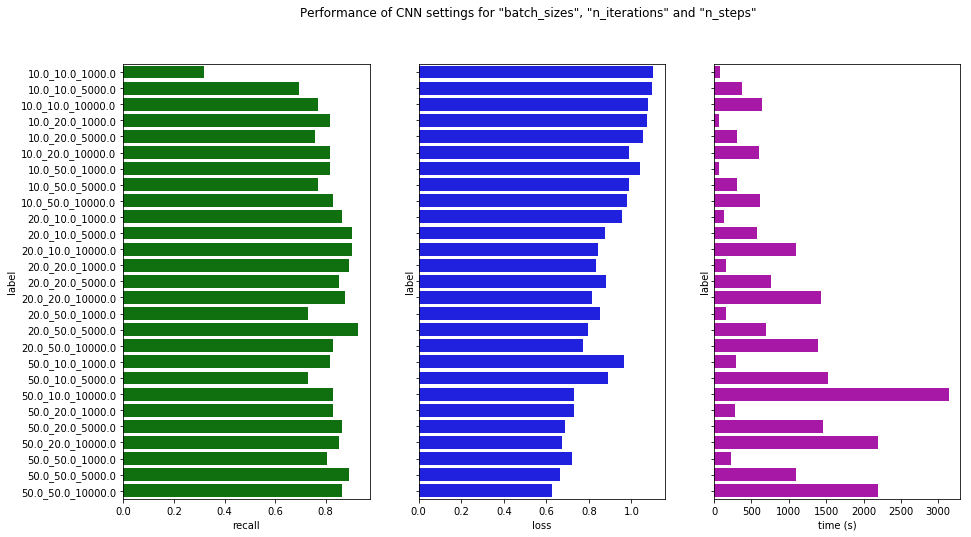

In [189]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(15, 8))
_ = sns.barplot(y="label", x="recall", data=results_clean, ax=ax1, color="g")
_ = sns.barplot(y="label", x="loss", data=results_clean, ax=ax2, color='b')
_ = sns.barplot(y="label", x="time (s)", data=results_clean, ax=ax3, color='m')
_ = f.suptitle("Performance of CNN settings for \"batch_sizes\", \"n_iterations\" and \"n_steps\"")

In [188]:
results_clean.to_csv('../data/cnn_results_recall_2.csv',index=False, encoding='utf-8')

## Conclusions

We are able to predict correctly all classes with ~0.8 recall in most of the combinations of parameters and on training times around 15 min average. 

The data that we are considering is super small for training a neural network but the whole procedure seems to work and could be applied for more complex situations.

Notice that the classes are balanced by simple repetition of samples for underrepresented classes and this has the danger that same samples will be in train and validation datasets achieving overfitting.

For further applications this should be improved.